# Impact Analytics 
## Case Study for Data Science Lead
### Problem Statement

A leading retailer is suffering from an inventory optimization problem. 
He has stores in 4 geographies (namely -> `South`, `Northeast`, `Midwest` and `West`). 
The retailer runs promotions at different parts of the year with an expectation to increase the revenue. 

Given the daily sales data `FY 2015 and 2016` at levels:
- `Store-Product`
- `Store-Master`
- `Product-Master`
- `Promotion Calendar`

I need to predict the sales of every Store-Product combination for the time period: `January, 2017 to April, 2017`.

### Challenges 

`Missing Values`: A product might not be sold at a store throughout the year, which might induce bias and can be a hindrance in building good models. 

`Inconsistent Data`: Data formats, values, type of data could have issues / errors and may not always be clean. Methods to identify such anomalies and tackle the same need to be thought about.

`Outliers`: An outlier is an observation that appears to deviate significantly from other observations in the data. An outlier may indicate bad data which may have been coded incorrectly or is due to a random variation. Hence, for some product we might observe an unusual peak in sales which needs to be treated before we start analyzing the sales.

`Prediction`: For univariate data, commonly used methods for time series analysis are ARIMA (Auto-Regressive Integrated Moving Average), Exponential Smoothing, ETS.


### Data Dictionary

`Sales_Data.csv`: It contains the quantity sold in units according to each datekey, Product, Store combination.

| ColumnName | Description |
| :--------: | :---------: |
| datekey    | date ranges from 2015/01/01 to 2016/12/31 |
| Product    | ProductIDs from set {Product1, Product2, .., Product182} |
| Store      | StoreIDs from set {Store1, Store2, .., Store 30} |
| Quantity   | daily quantity sold in units |


`Store Master.csv`: It contains the geographical location of each unique StoreID.

| ColumnName | Description |
| :--------: | :---------: |
| Store      | StoreID: {Store1 to Store 30} |
| Geography  | Location: {South, Northeast, Midwest, West} |

`Product Master.csv`: It contains category-wise data for each unique ProductID.

| ColumnName | Description |
| :--------: | :---------: |
| Product    | ProductIDs: {Product1, Product2, .., Product182} |
| Category   | Categories: {Category1, Category2, Category3, Category4, Category5} |

`Promotion Calendar.xlsx`: It indicates PromoID applicable for each weekly interval.

| ColumnName | Description |
| :--------: | :---------: |
| Week       | Weekly Ranges: {05-01-2015, 12-01-2015, 19-01-2015, ..., 24-04-2017} |
| PromoID    | PromoIDs: {No Promo, Promo1, Promo2, .., Promo11} |


### Data Preparation

`Data Cleaning`: I have to clean the files `Store Master.csv` because it has header `Store,"Geography"` and entries as `Store13,"SOUTH"` and `Product Master.csv` which has header `Product,"Category"` and entries as `Product153,"Category3"` which would cause reading issues. Hence, I have written the below code which would transform these files and create cleaned csv files: `store_master.csv` and `product_master.csv` which would be used for loading data in future.

In [2]:
# import all necessary libraries.
# numpy and pandas libraries are used for working with arrays and data analysis respectively.
# re module helps us to work with regular expressions.
# matplotlib has pyplot which provides MATLAB-like plotting framework.
# rcParams helps us to change the size without using the figure environment where we can set a tuple with height and width.

import numpy as np
import pandas as pd
import re
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (10,6)

# open(file: path/name of file, mode: string which defines the mode you want to open the file)
# opens the file and returns it as file object.
# 'r+' opens the file for both reading and writing. 

def correct_csv(input_file_name, output_file_name):  
        with open(input_file_name, 'r+') as input_data:
                for line in input_data:
                    
                    # removing starting and ending quotes of a line
                    pattern1 = re.compile(r'^"|"$', re.MULTILINE)
                    line = re.sub(r'^"|"$',"",line)
                
                    # substituting escaped quote with a single quote
                    pattern2 = re.compile(r'""')
                    line = re.sub(r'""','"',line)

                    corrected_csv = open(output_file_name,'a')
                    corrected_csv.write(line)
                    corrected_csv.close()
                    
                    
                return corrected_csv
            

correct_csv('Input_1_1.csv', 'Output_1_1.csv')
correct_csv('Input_1_2.csv', 'Output_1_2.csv')

<_io.TextIOWrapper name='Output_1_2.csv' mode='a' encoding='cp1252'>

### Load Data
Now, I will load the cleaned datasets: `store_master.csv` and `product_master.csv` along with already well-formatted datasets: `Sales_Data.csv` and `Promo Calendar.xlsx` using the `read_csv` and `read_excel` functions.

In [3]:
# read_csv(filepath_or_buffer, header='infer')
# filepath_or_buffer: all csv, xlsx are placed in same directory as Jupyter Notebook, so directly pass in filename as string
# header: header row is present in all files so default value of 'infer' will take in column names from first line of file
# load all the datasets provided one by one:

# Store Master
store_data = pd.read_csv('Output_1_1.csv')

# Product Master
product_data = pd.read_csv('Output_1_2.csv')

# Promo Calendar
promo_data = pd.read_excel('Input_1_3.xlsx', 'Sheet1')

# Sales Data
sales_data = pd.read_csv('Input_1_4.csv')

C:\Users\surya\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3049: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


### Exploratory Data Analysis
#### Store Master 

Below are the findings from `store_master.csv` dataset and upcoming code snippets/results support these conclusions:

- `store_data` contains two columns: `Store` and `Geography`. 
- `Store` column contains 30 unique stores: `Store1`, `Store2`, `Store3`, .., `Store30`.
- `Geography` column contains 4 unique locations: `SOUTH`, `NORTHEAST`, `MIDWEST`, `WEST`.
-  There are no missing values and the dimensions of `store_data` are: `(30,2)` i.e. 30 rows, 2 columns.
- `SOUTH` has the highest number of store counts: `12` amongst all other locations.

In [4]:
# first five rows of store_data 
store_data.head()

,Store,Geography
0,Store13,SOUTH
1,Store20,NORTHEAST
2,Store22,NORTHEAST
3,Store23,MIDWEST
4,Store27,SOUTH


In [5]:
# last five rows of store_data
store_data.tail()

,Store,Geography
25,Store29,MIDWEST
26,Store18,SOUTH
27,Store10,NORTHEAST
28,Store1,MIDWEST
29,Store3,SOUTH


In [6]:
# obtain list of columns of certain data types as groups from store_data 
store_data.columns.to_series().groupby(store_data.dtypes).groups

{dtype('O'): Index(['Store', 'Geography'], dtype='object')}

In [7]:
# unique values in Store column in store_data
print(store_data['Store'].unique())

['Store13' 'Store20' 'Store22' 'Store23' 'Store27' 'Store9' 'Store12'
 'Store21' 'Store14' 'Store16' 'Store24' 'Store7' 'Store2' 'Store19'
 'Store8' 'Store25' 'Store15' 'Store17' 'Store28' 'Store30' 'Store5'
 'Store26' 'Store6' 'Store11' 'Store4' 'Store29' 'Store18' 'Store10'
 'Store1' 'Store3']


In [8]:
# unique values in Geography column in store_data
print(store_data['Geography'].unique())

['SOUTH' 'NORTHEAST' 'MIDWEST' 'WEST']


In [9]:
# any missing values in store_data
print(store_data.isnull().values.any())

False


In [10]:
# dimensions of store_data
print(store_data.shape)

(30, 2)


In [11]:
# obtain counts for unique location value in Geography column in store_data
np.array(np.unique(store_data['Geography'], return_counts=True)).T

array([['MIDWEST', 9],
       ['NORTHEAST', 5],
       ['SOUTH', 12],
       ['WEST', 4]], dtype=object)

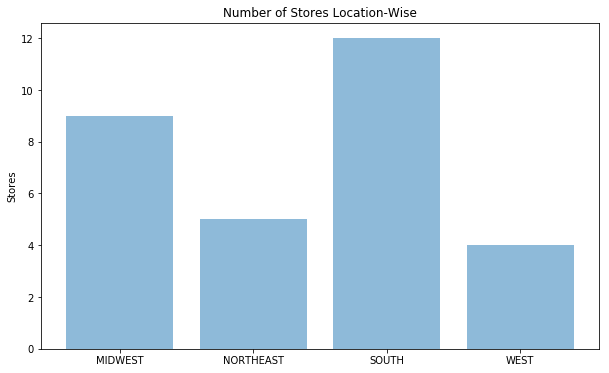

In [12]:
store_objects = ('MIDWEST', 'NORTHEAST', 'SOUTH', 'WEST')
y_store = np.arange(len(store_objects))

geography_counts = [9, 5, 12, 4]
 
plt.bar(y_store, geography_counts, align='center', alpha=0.5)
plt.xticks(y_store, store_objects)
plt.ylabel('Stores')
plt.title('Number of Stores Location-Wise')
 
plt.show()

#### Product Master

Below are the findings from `product_master.csv` dataset and upcoming code snippets/results support these conclusions:

- `product_data` contains two columns: `Product` and `Category`. 
- `Product` column contains 182 unique products: `Product1`, `Product2`, `Product3`, .., `Product182`.
- `Category` column contains 5 unique categories: `Category1`, `Category2`, `Category3`, `Category4`, `Category5`.
- There are no missing values and the dimensions of `product_data` are: `(182,2)` i.e. 182 rows, 2 columns.
- `Category 3` has the highest number of product counts: `90` amongst all other categories.

In [13]:
# first five rows of product_data 
product_data.head()

,Product,Category
0,Product153,Category3
1,Product167,Category3
2,Product163,Category3
3,Product139,Category3
4,Product170,Category3


In [14]:
# last five rows of product_data
product_data.tail()

,Product,Category
177,Product72,Category2
178,Product49,Category2
179,Product50,Category2
180,Product51,Category2
181,Product34,Category2


In [15]:
# obtain list of columns of certain data types as groups from product_data 
print(product_data.columns.to_series().groupby(product_data.dtypes).groups)

{dtype('O'): Index(['Product', 'Category'], dtype='object')}


In [16]:
# unique values in Product column in product_data
print(product_data['Product'].unique())

['Product153' 'Product167' 'Product163' 'Product139' 'Product170'
 'Product174' 'Product172' 'Product173' 'Product175' 'Product168'
 'Product171' 'Product176' 'Product166' 'Product120' 'Product180'
 'Product178' 'Product179' 'Product182' 'Product177' 'Product53'
 'Product134' 'Product102' 'Product99' 'Product98' 'Product100'
 'Product97' 'Product133' 'Product130' 'Product161' 'Product152'
 'Product131' 'Product56' 'Product109' 'Product137' 'Product22'
 'Product85' 'Product112' 'Product86' 'Product136' 'Product135'
 'Product138' 'Product116' 'Product73' 'Product117' 'Product45'
 'Product12' 'Product46' 'Product55' 'Product47' 'Product32' 'Product16'
 'Product87' 'Product103' 'Product105' 'Product54' 'Product83' 'Product89'
 'Product82' 'Product104' 'Product15' 'Product7' 'Product2' 'Product88'
 'Product3' 'Product4' 'Product19' 'Product115' 'Product21' 'Product36'
 'Product5' 'Product18' 'Product44' 'Product63' 'Product42' 'Product108'
 'Product155' 'Product143' 'Product23' 'Product110'

In [17]:
# unique values in Category column in product_data
print(sorted(product_data['Category'].unique()))

['Category1', 'Category2', 'Category3', 'Category4', 'Category5']


In [18]:
# any missing values in product_data
print(product_data.isnull().values.any())

False


In [19]:
# dimensions of product_data
print(product_data.shape)

(182, 2)


In [20]:
# obtain counts for unique location value in Geography column in product_data
np.array(np.unique(product_data['Category'], return_counts=True)).T

array([['Category1', 67],
       ['Category2', 14],
       ['Category3', 90],
       ['Category4', 7],
       ['Category5', 4]], dtype=object)

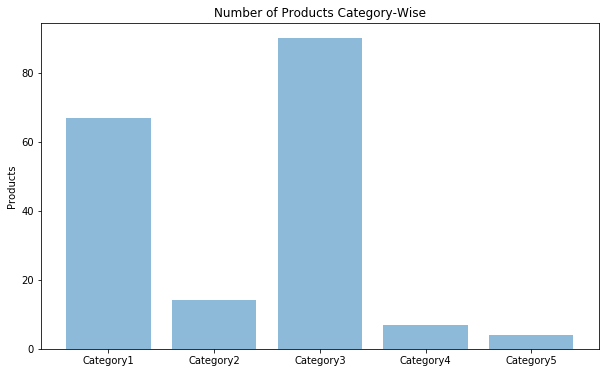

In [21]:
product_objects = ('Category1', 'Category2', 'Category3', 'Category4', 'Category5')
y_product = np.arange(len(product_objects))

category_counts = [67, 14, 90, 7, 4]
 
plt.bar(y_product, category_counts, align='center', alpha=0.5)
plt.xticks(y_product, product_objects)
plt.ylabel('Products')
plt.title('Number of Products Category-Wise')
 
plt.show()

#### Promo Calendar

Below are the findings from `Promo Calendar.xlsx` dataset and upcoming code snippets/results support these conclusions:

- `promo_data` contains two columns: `Week` and `PromoID`. 
- `Week` starts from `05-01-2015` and ends at `24-04-2017` i.e. PromoIDs for the time period `January, 2017` to `April, 2017` which needs to be forecasted is also given.
- `Week` column contains weekly intervals whereas `PromoID` contains 12 distinct categorical values say `No Promo`, `Promo1`, .. `Promo11`. 
- `FY 2015 and 2016` weekly data contains 11 distinct categorical `PromoID` values except `Promo9` which occurs only in `2017` at `Week` : `02-01-2017`.
- There are no missing values and the dimensions of `promo_data` are: `(121,2)` i.e. 121 rows, 2 columns.
- `No Promo` has the highest number of `Week` counts: `90` amongst all other PromoIDs.

In [22]:
# first five rows of promo_data 
promo_data.head()

,Week,PromoID
0,2015-01-05,No Promo
1,2015-01-12,No Promo
2,2015-01-19,No Promo
3,2015-01-26,No Promo
4,2015-02-02,No Promo


In [23]:
# last five rows of promo_data
promo_data.tail()

,Week,PromoID
116,2017-03-27,No Promo
117,2017-04-03,No Promo
118,2017-04-10,No Promo
119,2017-04-17,No Promo
120,2017-04-24,No Promo


In [24]:
# obtain list of columns of certain data types as groups from promo_data 
print(promo_data.columns.to_series().groupby(promo_data.dtypes).groups)

{dtype('<M8[ns]'): Index(['Week'], dtype='object'), dtype('O'): Index(['PromoID'], dtype='object')}


In [25]:
# unique values in Week column in promo_data
print(promo_data['Week'].unique())

['2015-01-05T00:00:00.000000000' '2015-01-12T00:00:00.000000000'
 '2015-01-19T00:00:00.000000000' '2015-01-26T00:00:00.000000000'
 '2015-02-02T00:00:00.000000000' '2015-02-09T00:00:00.000000000'
 '2015-02-16T00:00:00.000000000' '2015-02-23T00:00:00.000000000'
 '2015-03-02T00:00:00.000000000' '2015-03-09T00:00:00.000000000'
 '2015-03-16T00:00:00.000000000' '2015-03-23T00:00:00.000000000'
 '2015-03-30T00:00:00.000000000' '2015-04-06T00:00:00.000000000'
 '2015-04-13T00:00:00.000000000' '2015-04-20T00:00:00.000000000'
 '2015-04-27T00:00:00.000000000' '2015-05-04T00:00:00.000000000'
 '2015-05-11T00:00:00.000000000' '2015-05-18T00:00:00.000000000'
 '2015-05-25T00:00:00.000000000' '2015-06-01T00:00:00.000000000'
 '2015-06-08T00:00:00.000000000' '2015-06-15T00:00:00.000000000'
 '2015-06-22T00:00:00.000000000' '2015-06-29T00:00:00.000000000'
 '2015-07-06T00:00:00.000000000' '2015-07-13T00:00:00.000000000'
 '2015-07-20T00:00:00.000000000' '2015-07-27T00:00:00.000000000'
 '2015-08-03T00:00:00.000

In [26]:
# unique values in PromoID column in promo_data
print(sorted(promo_data['PromoID'].unique()))

['No Promo', 'Promo1', 'Promo10', 'Promo11', 'Promo2', 'Promo3', 'Promo4', 'Promo5', 'Promo6', 'Promo7', 'Promo8', 'Promo9']


In [27]:
# any missing values in promo_data
print(promo_data.isnull().values.any())

False


In [28]:
# dimensions of promo_data
print(promo_data.shape)

(121, 2)


In [29]:
# obtain counts for unique location value in PromoID column in promo_data
np.array(np.unique(promo_data['PromoID'], return_counts=True)).T

array([['No Promo', 90],
       ['Promo1', 2],
       ['Promo10', 3],
       ['Promo11', 1],
       ['Promo2', 4],
       ['Promo3', 8],
       ['Promo4', 3],
       ['Promo5', 3],
       ['Promo6', 2],
       ['Promo7', 1],
       ['Promo8', 3],
       ['Promo9', 1]], dtype=object)

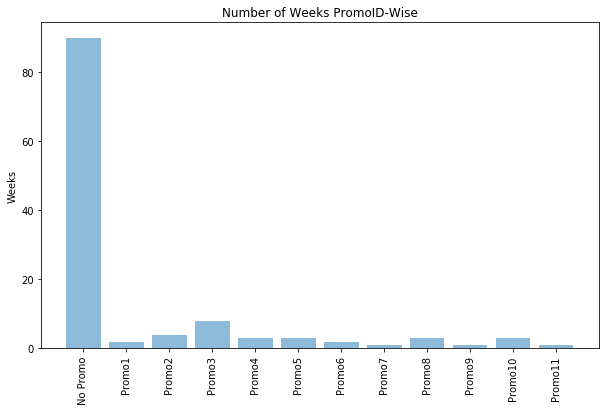

In [30]:
promo_objects = ('No Promo', 'Promo1', 'Promo2', 'Promo3', 'Promo4', 'Promo5', 'Promo6', 'Promo7', 'Promo8', 'Promo9', 'Promo10', 'Promo11')
y_promo = np.arange(len(promo_objects))

week_counts = [90, 2, 4, 8, 3, 3, 2, 1, 3, 1, 3, 1]
 
plt.bar(y_promo, week_counts, align='center', alpha=0.5)
plt.xticks(y_promo, promo_objects, rotation = 'vertical')
plt.ylabel('Weeks')
plt.title('Number of Weeks PromoID-Wise')
 
plt.show()

#### Sales Data

Below are the findings from `Sales_Data.csv` dataset and upcoming code snippets/results support these conclusions:
- `sales_data` contains 4 columns: `datekey`, `Product`, `Store` and `Quantity`. 
- `datekey` column contains dates in the format: `20150101` i.e. `YYYYMMDD` and `11/20/2016` i.e. `MM/DD/YYYY`.
- `Product` column and `Store` column contain their unique values which create a `Product-Store` combination according to which we can interpret the `Quantity` per `datekey`.
-  There are no missing values and the dimensions of `sales_data` are: `(793384,4)` i.e. 793384 rows, 4 columns.
-  `Quantity`: `1` has the highest number of row counts: `647523` amongst all other quantities.
-  `Quantity` values are ranging from `-8100` to `1500000`. There is a significant presence of outliers which can be visually interpreted by boxplots. 

In [31]:
# first five rows of sales_data 
sales_data.head()

,datekey,Product,Store,Quantity
0,20150101,Product103,Store25,1
1,20150101,Product103,Store4,1
2,20150101,Product105,Store12,-1
3,20150101,Product105,Store2,1
4,20150101,Product105,Store25,1


In [32]:
# last five rows of sales_data
sales_data.tail()

,datekey,Product,Store,Quantity
793379,20161231,Product99,Store27,1
793380,20061231,Product99,Store27,-1
793381,20161231,Product99,Store28,-1
793382,20161231,Product99,Store5,1
793383,20161231,Product99,Store5,1


In [33]:
# obtain list of columns of certain data types as groups from sales_data 
print(sales_data.columns.to_series().groupby(sales_data.dtypes).groups)

{dtype('int64'): Index(['Quantity'], dtype='object'), dtype('O'): Index(['datekey', 'Product', 'Store'], dtype='object')}


In [34]:
# unique values in Quantity column in sales_data
print(sorted(sales_data['Quantity'].unique()))

[-8100, -7500, -1000, -730, -25, -17, -16, -13, -11, -10, -9, -8, -7, -6, -5, -4, -3, -2, -1, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 76, 78, 79, 80, 83, 85, 87, 88, 89, 90, 93, 94, 96, 97, 99, 102, 103, 107, 108, 112, 115, 116, 125, 131, 132, 134, 139, 160, 165, 171, 180, 193, 200, 13000, 97117, 130000, 770000, 941266, 1500000]


In [35]:
# any missing values in sales_data
print(sales_data.isnull().values.any())

False


In [36]:
# dimensions of sales_data
print(sales_data.shape)

(793384, 4)


In [37]:
# obtain counts for unique value in Quantity column in sales_data
# values are present in the Quantity column which deviate from general trend and are existent on both extremes: 
# 13000, 97117, 130000, 770000, 941266, 1500000 and -8100, -7500, -1000, -730
np.array(np.unique(sales_data['Quantity'], return_counts=True)).T

array([[  -8100,       1],
       [  -7500,       1],
       [  -1000,       1],
       [   -730,       1],
       [    -25,       1],
       [    -17,       2],
       [    -16,       1],
       [    -13,       1],
       [    -11,       2],
       [    -10,       1],
       [     -9,       4],
       [     -8,       7],
       [     -7,       7],
       [     -6,       7],
       [     -5,      27],
       [     -4,     108],
       [     -3,     263],
       [     -2,    2776],
       [     -1,   81514],
       [      0,    2435],
       [      1,  647523],
       [      2,   47663],
       [      3,    4854],
       [      4,    2681],
       [      5,     993],
       [      6,     603],
       [      7,     369],
       [      8,     255],
       [      9,     188],
       [     10,     148],
       [     11,      95],
       [     12,      76],
       [     13,      66],
       [     14,      56],
       [     15,      47],
       [     16,      42],
       [     17,      36],
 

{'whiskers': [<matplotlib.lines.Line2D at 0x1df80a5cb00>,
 'caps': [<matplotlib.lines.Line2D at 0x1df80a5cf28>,
 'boxes': [<matplotlib.lines.Line2D at 0x1df80a5c710>],
 'medians': [<matplotlib.lines.Line2D at 0x1df80a68860>],
 'fliers': [<matplotlib.lines.Line2D at 0x1df80a68ba8>],
 'means': []}

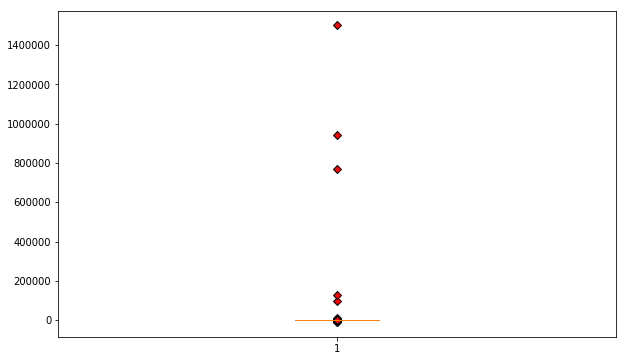

In [38]:
# boxplot for Quantity column from sales_data
# red diamonds represent the outliers
red_diamond = dict(markerfacecolor = 'r', marker = 'D')
plt.boxplot(sales_data['Quantity'], flierprops = red_diamond)

#### Inconsistent Date Formats

-  There are a few rows in `sales_data` with date formats: `11/20/2016` i.e. `MM/DD/YYYY`. These date formats contain `/`. 
-  In order, to clean these date formats we will drop these rows and append them in the right format at their respective indices. 
-  To achieve that, I have written a `insert_row` function which will take in `rownumber` (index number), `df` (dataframe), `value` (row values) as parameters and returns the updated dataframe. I have included comment lines in the function to understand it in a better way.
-  We shall make sure that there is no inconsistent data. 
-  In the `datekey` column, I have written code to check whether all the dates belong to the range defined for the problem i.e. `2015-2016` or not. 
-  I have observed two rows with ill dates i.e. `2005-12-17` at index `289375` and `2006-12-31` at index `793380` and dropped these rows from the dataframe.

In [39]:
# datekey contains dates in different formats: '20150101', '1/21/2015'
print(sales_data['datekey'].unique())

['20150101' '20150102' '20150103' '20150104' '20150105' '20150106'
 '20150107' '20150108' '20150109' '20150110' '20150111' '20150112'
 '20150113' '20150114' '20150115' '20150116' '20150117' '20150118'
 '20150119' '20150120' '20150121' '1/21/2015' '20150122' '20150123'
 '20150124' '20150125' '20150126' '20150127' '20150128' '20150129'
 '20150130' '20150131' '20150201' '20150202' '20150203' '20150204'
 '20150205' '20150206' '20150207' '20150208' '20150209' '20150210'
 '20150211' '20150212' '20150213' '20150214' '20150215' '20150216'
 '20150217' '20150218' '20150219' '20150220' '20150221' '20150222'
 '20150223' '20150224' '20150225' '20150226' '20150227' '20150228'
 '20150301' '20150302' '20150303' '20150304' '20150305' '20150306'
 '20150307' '20150308' '20150309' '20150310' '20150311' '20150312'
 '20150313' '20150314' '20150315' '20150316' '20150317' '20150318'
 '20150319' '20150320' '20150321' '20150322' '20150323' '20150324'
 '20150325' '20150326' '20150327' '20150328' '20150329' '2015

In [40]:
# datekey of format '1/21/2015','11/20/2016' caused a problem when to_datetime function is used
# so drop these few rows with / in datekey and then append in right format
sales_data = sales_data[~sales_data.datekey.str.contains('/', na=False)]

In [41]:
# function to insert rows at a particular index in the dataframe 
def insert_row(row_number, df, row_value): 
    
    # starting value of upper half 
    start_upper = 0
   
    # end value of upper half 
    end_upper = row_number 
   
    # start value of lower half 
    start_lower = row_number 
   
    # end value of lower half 
    end_lower = df.shape[0] 
   
    # create a list of upper_half index 
    upper_half = [*range(start_upper, end_upper, 1)] 
   
    # create a list of lower_half index 
    lower_half = [*range(start_lower, end_lower, 1)] 
   
    # increment the value of lower half by 1 
    lower_half = [x.__add__(1) for x in lower_half] 
   
    # combine the two lists 
    index_ = upper_half + lower_half 
   
    # update the index of the dataframe 
    df.index = index_ 
   
    # insert a row at the end 
    df.loc[row_number] = row_value 
    
    # sort the index labels 
    df = df.sort_index() 
   
    # return the dataframe 
    return df  

In [42]:
# 3 datekey: '1/21/2015','11/20/2016', '12/17/2015' cause issue 
# 4 rows are to be inserted with dateformats: YYYYMMDD 
# create a dictionary of {(index: [corrected datekey along with row values])} for datekey with /
row_dict = {11048: ['20150121', 'Product14', 'Store8', 1], 287052: ['20151217', 'Product1', 'Store14', 1], 289366: ['20151217', 'Product9', 'Store5', 2], 641161: ['20161120', 'Product1', 'Store8', 1]}

# iterate over the key, value pairs of the dictionary and call the insert_row function to append these cleaned rows
for key, value in row_dict.items():
        if key > sales_data.index.max() + 1:
            print("Invalid row_number") 
        else: 
            # Let's call the function and insert the row at the designated position 
            sales_data = insert_row(key, sales_data, row_dict[key])

In [43]:
# convert datekey column in sales_data to YYYY-MM-DD format without any errors 
sales_data['datekey'] = pd.to_datetime(sales_data['datekey'], format = "%Y%m%d")

In [44]:
# first five rows of sales_data
# datekey has changed from 20150101 to 2015-01-01
sales_data.head()

,datekey,Product,Store,Quantity
0,2015-01-01,Product103,Store25,1
1,2015-01-01,Product103,Store4,1
2,2015-01-01,Product105,Store12,-1
3,2015-01-01,Product105,Store2,1
4,2015-01-01,Product105,Store25,1


In [45]:
# last five rows of sales_data
# datekey has changed from 20161231 to 2016-12-31
sales_data.tail()

,datekey,Product,Store,Quantity
793379,2016-12-31,Product99,Store27,1
793380,2006-12-31,Product99,Store27,-1
793381,2016-12-31,Product99,Store28,-1
793382,2016-12-31,Product99,Store5,1
793383,2016-12-31,Product99,Store5,1


In [46]:
# check whether all datekey are within the range of FY 2015 and 2016
# identified two datekey which are ill/invalid datekey: 2005-12-17 and 2006-12-31 
from datetime import datetime

start = datetime.strptime("2015-01-01", "%Y-%m-%d")
end = datetime.strptime("2016-12-31", "%Y-%m-%d")

for date in sales_data['datekey']:
    if start <= date <= end:
        continue;
    else:
        print(date)

2005-12-17 00:00:00
2006-12-31 00:00:00


In [47]:
# identify the index associated with the invalid/ill datekey
# 289375 is the index corresponding to: 2005-12-17 and 793380 is the index corresponding to: 2006-12-31
# print the row-wise data for these indices showing: datekey, Product, Store and Quantity
print(sales_data[sales_data['datekey'] == '2005-12-17']) 
print(sales_data[sales_data['datekey'] == '2006-12-31'])  

          datekey   Product   Store  Quantity
289375 2005-12-17  Product9  Store9         2
          datekey    Product    Store  Quantity
793380 2006-12-31  Product99  Store27        -1


In [48]:
# drop the indices associated with bad datekey, inplace = True would change the original dataframe i.e. sales_data
sales_data.drop(sales_data.index[[289375,793380]], inplace = True)

In [49]:
# store cleaned sales_data into a new variable sales_cleaned_data
sales_cleaned_data = sales_data

In [50]:
# 2006-12-31 which existed at index 793380 is dropped and does not exist in our sales_cleaned_data dataframe
sales_cleaned_data.tail()

,datekey,Product,Store,Quantity
793378,2016-12-31,Product99,Store27,1
793379,2016-12-31,Product99,Store27,1
793381,2016-12-31,Product99,Store28,-1
793382,2016-12-31,Product99,Store5,1
793383,2016-12-31,Product99,Store5,1


In [51]:
# count decreased by 2 rows due to drop of inconsistent datekey
sales_cleaned_data.count()

datekey     793382
Product     793382
Store       793382
Quantity    793382
dtype: int64

#### Data Merging 

In [52]:
# sales_cleaned_data has columns: datekey, Product, Store, Quantity
# store_data has columns: Store, Geography
# sales_cleaned_data and store_data are merged using the common key: Store to generate a more complete dataframe
sales_store_data = sales_cleaned_data.merge(right = store_data, how = 'outer', on = ['Store'])

In [53]:
sales_store_data.head()

,datekey,Product,Store,Quantity,Geography
0,2015-01-01,Product103,Store25,1,MIDWEST
1,2015-01-01,Product105,Store25,1,MIDWEST
2,2015-01-01,Product12,Store25,1,MIDWEST
3,2015-01-01,Product20,Store25,-1,MIDWEST
4,2015-01-01,Product20,Store25,1,MIDWEST


In [54]:
# sales_store_data has columns: datekey, Product, Store, Quantity, Geography
# product_data has columns: Product, Category
# sales_store_data and product_data are merged using the common key: Product to generate a more complete dataframe
sales_product_store_data = sales_store_data.merge(right = product_data, how = 'outer', on = ['Product'])

In [55]:
sales_product_store_data.head()

,datekey,Product,Store,Quantity,Geography,Category
0,2015-01-01,Product103,Store25,1,MIDWEST,Category3
1,2015-01-04,Product103,Store25,-1,MIDWEST,Category3
2,2015-01-17,Product103,Store25,-1,MIDWEST,Category3
3,2015-01-24,Product103,Store25,1,MIDWEST,Category3
4,2015-01-28,Product103,Store25,1,MIDWEST,Category3


In [56]:
# sales_product_store_data has columns: datekey, Product, Store, Quantity, Geography, Category
# promo_data has columns: Week, PromoID
# sales_product_store_data and promo_data can be merged only when a common key exists
# generate a WeekID column in promo_data 
promo_data['WeekID'] = promo_data['Week'].dt.week

In [57]:
promo_data.head()

,Week,PromoID,WeekID
0,2015-01-05,No Promo,2
1,2015-01-12,No Promo,3
2,2015-01-19,No Promo,4
3,2015-01-26,No Promo,5
4,2015-02-02,No Promo,6


In [58]:
# generate a MonthID column in promo_data
promo_data['MonthID'] = promo_data['Week'].dt.month

In [59]:
promo_data.head()

,Week,PromoID,WeekID,MonthID
0,2015-01-05,No Promo,2,1
1,2015-01-12,No Promo,3,1
2,2015-01-19,No Promo,4,1
3,2015-01-26,No Promo,5,1
4,2015-02-02,No Promo,6,2


In [60]:
# generate a YearID column in promo_data
promo_data['YearID'] = promo_data['Week'].dt.year

In [61]:
promo_data.head()

,Week,PromoID,WeekID,MonthID,YearID
0,2015-01-05,No Promo,2,1,2015
1,2015-01-12,No Promo,3,1,2015
2,2015-01-19,No Promo,4,1,2015
3,2015-01-26,No Promo,5,1,2015
4,2015-02-02,No Promo,6,2,2015


In [62]:
promo_data.tail()

,Week,PromoID,WeekID,MonthID,YearID
116,2017-03-27,No Promo,13,3,2017
117,2017-04-03,No Promo,14,4,2017
118,2017-04-10,No Promo,15,4,2017
119,2017-04-17,No Promo,16,4,2017
120,2017-04-24,No Promo,17,4,2017


In [63]:
# generate a WeekID column in sales_product_store_data
sales_product_store_data['WeekID'] = sales_product_store_data['datekey'].dt.week

In [64]:
# generate a MonthID column in sales_product_store_data
sales_product_store_data['MonthID'] = sales_product_store_data['datekey'].dt.month

In [65]:
# generate a YearID column in sales_product_store_data
sales_product_store_data['YearID'] = sales_product_store_data['datekey'].dt.year

In [66]:
sales_product_store_data.head()

,datekey,Product,Store,Quantity,Geography,Category,WeekID,MonthID,YearID
0,2015-01-01,Product103,Store25,1,MIDWEST,Category3,1,1,2015
1,2015-01-04,Product103,Store25,-1,MIDWEST,Category3,1,1,2015
2,2015-01-17,Product103,Store25,-1,MIDWEST,Category3,3,1,2015
3,2015-01-24,Product103,Store25,1,MIDWEST,Category3,4,1,2015
4,2015-01-28,Product103,Store25,1,MIDWEST,Category3,5,1,2015


In [67]:
sales_product_store_data.tail()

,datekey,Product,Store,Quantity,Geography,Category,WeekID,MonthID,YearID
793377,2016-04-22,Product167,Store8,0,WEST,Category3,16,4,2016
793378,2015-10-07,Product167,Store9,1,SOUTH,Category3,41,10,2015
793379,2015-10-30,Product167,Store9,1,SOUTH,Category3,44,10,2015
793380,2015-04-14,Product167,Store26,1,WEST,Category3,16,4,2015
793381,2016-12-17,Product182,Store16,1,SOUTH,Category3,50,12,2016


In [68]:
# sales_product_store_data has columns: datekey, Product, Store, Quantity, Geography, Category, WeekID, MonthID, YearID
# promo_data has columns: Week, PromoID, WeekID, MonthID, YearID
# sales_product_store_data and promo_data are merged on common keys: WeekID, MonthID, YearID
sales_product_store_promo_data = sales_product_store_data.merge(right = promo_data, how = 'outer', on = ['WeekID', 'MonthID', 'YearID'])

In [69]:
sales_product_store_promo_data.head()

,datekey,Product,Store,Quantity,Geography,Category,WeekID,MonthID,YearID,Week,PromoID
0,2015-01-01,Product103,Store25,1.0,MIDWEST,Category3,1,1,2015,NaT,NaN
1,2015-01-04,Product103,Store25,-1.0,MIDWEST,Category3,1,1,2015,NaT,NaN
2,2015-01-01,Product103,Store4,1.0,MIDWEST,Category3,1,1,2015,NaT,NaN
3,2015-01-02,Product103,Store4,-1.0,MIDWEST,Category3,1,1,2015,NaT,NaN
4,2015-01-04,Product103,Store12,-1.0,NORTHEAST,Category3,1,1,2015,NaT,NaN


In [70]:
sales_product_store_promo_data.tail()

,datekey,Product,Store,Quantity,Geography,Category,WeekID,MonthID,YearID,Week,PromoID
793394,NaT,NaN,NaN,NaN,NaN,NaN,13,3,2017,2017-03-27,No Promo
793395,NaT,NaN,NaN,NaN,NaN,NaN,14,4,2017,2017-04-03,No Promo
793396,NaT,NaN,NaN,NaN,NaN,NaN,15,4,2017,2017-04-10,No Promo
793397,NaT,NaN,NaN,NaN,NaN,NaN,16,4,2017,2017-04-17,No Promo
793398,NaT,NaN,NaN,NaN,NaN,NaN,17,4,2017,2017-04-24,No Promo


In [71]:
# sales_product_store_promo_data is a complete master dataframe and lets save it to a new variable final_dataframe
final_dataframe = sales_product_store_promo_data

#### Question 1
Aggregate the Quantity for each Store-Product either at a week or month level and provide the explanation for the type of time-period used (week or month)

#### Answer 1
##### Weekly Aggregation

In [72]:
# final_dataframe should be grouped by Store, Product, WeekID, YearID columns in order to obtain week level data.
# then sum function has to be applied on Quantity column to obtain the aggregated quantity value at each WeekID-YearID combination.
spwy_agg = final_dataframe.groupby(['Store','Product','WeekID','YearID'])['Quantity'].apply(lambda x:np.sum(x))

In [73]:
# aggregated quantity value is displayed for each Store-Product combination at WeekID level across YearIDs level 
spwy_agg.unstack()

YearID                   2015  2016
Store  Product   WeekID            
Store1 Product1  1        NaN   3.0
                 2        NaN   4.0
                 3        NaN   3.0
                 4        NaN   0.0
                 5        NaN   1.0
                 6        NaN   4.0
                 8        NaN   4.0
                 9        NaN   2.0
                 10       NaN   1.0
                 11       NaN   4.0
                 12       NaN   1.0
                 13       NaN  10.0
                 14       NaN   4.0
                 15       NaN   1.0
                 16       NaN   4.0
                 17       NaN   6.0
                 18       NaN   8.0
                 19       NaN   3.0
                 20       NaN   2.0
                 21       NaN   1.0
                 22       3.0   5.0
                 23      17.0   7.0
                 24       6.0   6.0
                 25      10.0   3.0
                 26       1.0   1.0
                 27       9.0   5.0
                 28       5.0   6.0
                 29       6.0   NaN
                 30       9.0   5.0
                 31       2.0   2.0
...                       ...   ...
Store9 Product97 47       NaN   1.0
                 48       NaN   1.0
                 52       NaN  -1.0
       Product98 35       NaN   1.0
                 36       NaN   1.0
                 37       NaN   2.0
                 38       NaN   2.0
                 39       NaN   0.0
                 40       NaN   4.0
                 41       NaN   3.0
                 43       NaN   1.0
                 44       NaN   1.0
                 46       NaN   2.0
                 47       NaN   5.0
                 48       NaN   1.0
                 49       NaN   6.0
                 50       NaN   9.0
                 51       NaN  15.0
                 52       NaN   4.0
       Product99 36       NaN   1.0
                 37       NaN   5.0
                 39       NaN   3.0
                 40       NaN   1.0
                 44       NaN   1.0
                 47       NaN   1.0
                 48       NaN   1.0
                 49       NaN   5.0
                 50       NaN   7.0
                 51       NaN   7.0
                 52       NaN   2.0

[108585 rows x 2 columns]

In [74]:
# for a particular Store-Product combination, over 2015 and 2016 data, the statistics are calculated as below:
# total quantity sum (sum) when divided by total week count (count) gives mean quantity value (mean). 
spwy_smc = spwy_agg.groupby(['Store', 'Product']).agg(['sum', 'mean', 'count'])
spwy_smc

sum       mean  count
Store  Product                             
Store1 Product1     400.0   5.128205     78
       Product10    929.0  11.059524     84
       Product100    68.0   4.000000     17
       Product101    85.0   6.071429     14
       Product102    65.0   5.000000     13
       Product103    50.0   0.862069     58
       Product104    58.0   1.183673     49
       Product105    65.0   1.083333     60
       Product106   237.0   7.645161     31
       Product107    99.0   3.000000     33
       Product108    52.0   2.080000     25
       Product109    37.0   1.480000     25
       Product11    314.0   3.829268     82
       Product110    26.0   3.714286      7
       Product111    56.0   2.666667     21
       Product112    33.0   3.666667      9
       Product113   122.0   7.176471     17
       Product114   206.0  13.733333     15
       Product115    37.0   1.088235     34
       Product116    42.0   1.448276     29
       Product117    28.0   2.000000     14
       Product118    36.0   3.272727     11
       Product119    50.0   4.166667     12
       Product12    549.0   5.659794     97
       Product121   147.0   9.187500     16
       Product122   240.0  14.117647     17
       Product123    84.0   6.000000     14
       Product124    78.0   5.200000     15
       Product125   271.0  15.941176     17
       Product126   134.0   7.882353     17
...                   ...        ...    ...
Store9 Product72     26.0   0.896552     29
       Product73     23.0   1.533333     15
       Product74     28.0   1.750000     16
       Product75    119.0   1.750000     68
       Product76     17.0   1.133333     15
       Product77    215.0  11.944444     18
       Product78    196.0  11.529412     17
       Product79    256.0  14.222222     18
       Product8     409.0   4.216495     97
       Product80     34.0   2.833333     12
       Product81     96.0   5.647059     17
       Product82     37.0   1.121212     33
       Product83     30.0   1.000000     30
       Product84    198.0   5.210526     38
       Product85     19.0   2.714286      7
       Product86      7.0   0.700000     10
       Product87     10.0   0.769231     13
       Product88     45.0   1.607143     28
       Product89     69.0   1.533333     45
       Product9    2561.0  25.356436    101
       Product90     27.0   1.285714     21
       Product91     28.0   1.555556     18
       Product92     46.0   2.000000     23
       Product93     96.0   3.310345     29
       Product94    122.0   3.935484     31
       Product95     76.0   2.814815     27
       Product96     53.0   1.827586     29
       Product97      4.0   0.571429      7
       Product98     57.0   3.562500     16
       Product99     34.0   3.090909     11

[5040 rows x 3 columns]

##### Monthly Aggregation 

In [75]:
# final_dataframe should be grouped by Store, Product, MonthID, YearID columns in order to obtain month level data.
# then sum function has to be applied on Quantity column to obtain the aggregated quantity value at each MonthID-YearID combination.
spmy_agg = final_dataframe.groupby(['Store','Product','MonthID','YearID'])['Quantity'].apply(lambda x:np.sum(x))

In [76]:
# aggregated quantity value is displayed for each Store-Product combination at MonthID level across YearID level 
spmy_agg.unstack()

YearID                      2015   2016
Store  Product    MonthID              
Store1 Product1   1          NaN   15.0
                  2          NaN    9.0
                  3          NaN   13.0
                  4          NaN   17.0
                  5          3.0   20.0
                  6         36.0   19.0
                  7         29.0   16.0
                  8         16.0   10.0
                  9         47.0   15.0
                  10         5.0    7.0
                  11        17.0   15.0
                  12        48.0   43.0
       Product10  1          NaN    0.0
                  2          NaN   31.0
                  3          NaN   37.0
                  4         70.0   51.0
                  5        160.0  115.0
                  6         27.0    7.0
                  7         15.0   10.0
                  8         24.0    9.0
                  9         23.0   31.0
                  10        12.0   26.0
                  11        40.0   14.0
                  12       111.0  116.0
       Product100 9          NaN   15.0
                  10         NaN    5.0
                  11         NaN   17.0
                  12         NaN   31.0
       Product101 8          NaN    1.0
                  9          NaN   34.0
...                          ...    ...
Store9 Product94  12         NaN   10.0
       Product95  5          NaN    3.0
                  6          NaN    9.0
                  7          NaN   17.0
                  8          NaN    9.0
                  9          NaN    8.0
                  10         NaN    7.0
                  11         NaN    4.0
                  12         NaN   19.0
       Product96  4          NaN    8.0
                  5          NaN    8.0
                  6          NaN    9.0
                  7          NaN    7.0
                  8          NaN    4.0
                  9          NaN    3.0
                  10         NaN    6.0
                  11         NaN    2.0
                  12         NaN    6.0
       Product97  9          NaN    2.0
                  10         NaN    0.0
                  11         NaN    2.0
                  12         NaN    0.0
       Product98  9          NaN    6.0
                  10         NaN    8.0
                  11         NaN    8.0
                  12         NaN   35.0
       Product99  9          NaN    8.0
                  10         NaN    2.0
                  11         NaN    2.0
                  12         NaN   22.0

[35177 rows x 2 columns]

In [77]:
# for a particular Store-Product combination, over 2015 and 2016 data, the statistics are calculated as below:
# total quantity sum (sum) when divided by total month count (count) gives mean quantity value (mean). 
spmy_smc = spmy_agg.groupby(['Store', 'Product']).agg(['sum', 'mean', 'count'])
spmy_smc

sum        mean  count
Store  Product                              
Store1 Product1     400.0   20.000000     20
       Product10    929.0   44.238095     21
       Product100    68.0   17.000000      4
       Product101    85.0   17.000000      5
       Product102    65.0   16.250000      4
       Product103    50.0    2.173913     23
       Product104    58.0    2.636364     22
       Product105    65.0    2.708333     24
       Product106   237.0   29.625000      8
       Product107    99.0    9.900000     10
       Product108    52.0    6.500000      8
       Product109    37.0    5.285714      7
       Product11    314.0   14.272727     22
       Product110    26.0    6.500000      4
       Product111    56.0    8.000000      7
       Product112    33.0   11.000000      3
       Product113   122.0   30.500000      4
       Product114   206.0   51.500000      4
       Product115    37.0    2.176471     17
       Product116    42.0    5.250000      8
       Product117    28.0    4.666667      6
       Product118    36.0    9.000000      4
       Product119    50.0   16.666667      3
       Product12    549.0   23.869565     23
       Product121   147.0   29.400000      5
       Product122   240.0   48.000000      5
       Product123    84.0   21.000000      4
       Product124    78.0   19.500000      4
       Product125   271.0   54.200000      5
       Product126   134.0   33.500000      4
...                   ...         ...    ...
Store9 Product72     26.0    1.625000     16
       Product73     23.0    3.285714      7
       Product74     28.0    4.000000      7
       Product75    119.0    5.173913     23
       Product76     17.0    1.416667     12
       Product77    215.0   43.000000      5
       Product78    196.0   49.000000      4
       Product79    256.0   64.000000      4
       Product8     409.0   17.041667     24
       Product80     34.0    8.500000      4
       Product81     96.0   24.000000      4
       Product82     37.0    1.761905     21
       Product83     30.0    1.764706     17
       Product84    198.0   16.500000     12
       Product85     19.0    6.333333      3
       Product86      7.0    1.750000      4
       Product87     10.0    1.000000     10
       Product88     45.0    3.750000     12
       Product89     69.0    3.285714     21
       Product9    2561.0  111.347826     23
       Product90     27.0    3.375000      8
       Product91     28.0    4.000000      7
       Product92     46.0    5.750000      8
       Product93     96.0   12.000000      8
       Product94    122.0   13.555556      9
       Product95     76.0    9.500000      8
       Product96     53.0    5.888889      9
       Product97      4.0    1.000000      4
       Product98     57.0   14.250000      4
       Product99     34.0    8.500000      4

[5040 rows x 3 columns]

In [78]:
# spwy_smc and spmy_smc are merged in order to have comparison between these two time period approaches on basis of mean, count 
spwy_smc.merge(right = spmy_smc, how = 'outer', on = ['Store', 'Product'])

sum_x     mean_x  count_x   sum_y      mean_y  count_y
Store  Product                                                            
Store1 Product1     400.0   5.128205       78   400.0   20.000000       20
       Product10    929.0  11.059524       84   929.0   44.238095       21
       Product100    68.0   4.000000       17    68.0   17.000000        4
       Product101    85.0   6.071429       14    85.0   17.000000        5
       Product102    65.0   5.000000       13    65.0   16.250000        4
       Product103    50.0   0.862069       58    50.0    2.173913       23
       Product104    58.0   1.183673       49    58.0    2.636364       22
       Product105    65.0   1.083333       60    65.0    2.708333       24
       Product106   237.0   7.645161       31   237.0   29.625000        8
       Product107    99.0   3.000000       33    99.0    9.900000       10
       Product108    52.0   2.080000       25    52.0    6.500000        8
       Product109    37.0   1.480000       25    37.0    5.285714        7
       Product11    314.0   3.829268       82   314.0   14.272727       22
       Product110    26.0   3.714286        7    26.0    6.500000        4
       Product111    56.0   2.666667       21    56.0    8.000000        7
       Product112    33.0   3.666667        9    33.0   11.000000        3
       Product113   122.0   7.176471       17   122.0   30.500000        4
       Product114   206.0  13.733333       15   206.0   51.500000        4
       Product115    37.0   1.088235       34    37.0    2.176471       17
       Product116    42.0   1.448276       29    42.0    5.250000        8
       Product117    28.0   2.000000       14    28.0    4.666667        6
       Product118    36.0   3.272727       11    36.0    9.000000        4
       Product119    50.0   4.166667       12    50.0   16.666667        3
       Product12    549.0   5.659794       97   549.0   23.869565       23
       Product121   147.0   9.187500       16   147.0   29.400000        5
       Product122   240.0  14.117647       17   240.0   48.000000        5
       Product123    84.0   6.000000       14    84.0   21.000000        4
       Product124    78.0   5.200000       15    78.0   19.500000        4
       Product125   271.0  15.941176       17   271.0   54.200000        5
       Product126   134.0   7.882353       17   134.0   33.500000        4
...                   ...        ...      ...     ...         ...      ...
Store9 Product72     26.0   0.896552       29    26.0    1.625000       16
       Product73     23.0   1.533333       15    23.0    3.285714        7
       Product74     28.0   1.750000       16    28.0    4.000000        7
       Product75    119.0   1.750000       68   119.0    5.173913       23
       Product76     17.0   1.133333       15    17.0    1.416667       12
       Product77    215.0  11.944444       18   215.0   43.000000        5
       Product78    196.0  11.529412       17   196.0   49.000000        4
       Product79    256.0  14.222222       18   256.0   64.000000        4
       Product8     409.0   4.216495       97   409.0   17.041667       24
       Product80     34.0   2.833333       12    34.0    8.500000        4
       Product81     96.0   5.647059       17    96.0   24.000000        4
       Product82     37.0   1.121212       33    37.0    1.761905       21
       Product83     30.0   1.000000       30    30.0    1.764706       17
       Product84    198.0   5.210526       38   198.0   16.500000       12
       Product85     19.0   2.714286        7    19.0    6.333333        3
       Product86      7.0   0.700000       10     7.0    1.750000        4
       Product87     10.0   0.769231       13    10.0    1.000000       10
       Product88     45.0   1.607143       28    45.0    3.750000       12
       Product89     69.0   1.533333       45    69.0    3.285714       21
       Product9    2561.0  25.356436      101  2561.0  111.347826       23
       Product90     27.0   1.285714       21

#### Detailed Answer 1
##### Aggregation of Quantity for each Store-Product combination at Week level is correct because of the following reasons:

- `WeekID-PromoID`: There is a one-to-one relationship between WeekID and PromoID. If we maintain weekly intervals, it becomes easy to merge and analyse promotional effects in a better manner. Also, entire month having the same PromoID is very rare.

- `Data Points`: We need to have sufficient number of data points to build a time series model. For each Store-Product combination with weekly intervals, the number of data points are higher wherein monthly intervals give less data points without any insights. 

- `Missing Values`: For each Store-Product combination, a complete 52-week data for 2015 and 2016 would have helped. But there is a lot of missing data in a particular year, missing weeks in between. Imputation in presence of more number of data points will not cause any bias. Hence, Imputation at Store-Product-WeekID level is correct.


In [79]:
# data frame grouped by Store-Product-Weekly-YearID and aggregates quantity at week level
spwy_agg.to_frame('QuantitySum').to_csv('Output_1_3.csv')

#### Question 2
Detect the Outliers in the Quantity for each Store-Product combination and apply an outlier treatment on the same. Specify the outlier treatment technique.

#### Answer 2

In [80]:
# describe function would give summary statistics of the QuantitySum (aggregated column)
# apply(lambda x: format(x, 'f') would suppress the scientific notation
spwy_agg_stats = spwy_agg.describe().apply(lambda x: format(x, 'f'))
spwy_agg_stats

count     138628.000000
mean          29.986186
std         5205.401116
min        -7993.000000
25%            1.000000
50%            2.000000
75%            5.000000
max      1500224.000000
Name: Quantity, dtype: object

In [81]:
# Q1 = 1.00, Q3 = 5.00, IQR = Q3 - Q1 = 4.00, low = -5.00 and high = 11.00
Q    = spwy_agg_stats[['25%', '75%']]
Q1   = Q['25%']
Q3   = Q['75%']
IQR  = float(Q3) - float(Q1)
low  = float(Q1) - 1.5*IQR
high = float(Q3) + 1.5*IQR
print(low)
print(high)

-5.0
11.0


In [82]:
# spwy_agg is a series which has Store-Product combinations at WeekID levels across YearIDs
# convert spwy_agg to spwy_agg_df dataframe to support more operations
spwy_agg_df = spwy_agg.to_frame(name = 'QuantitySum')
spwy_agg_df

QuantitySum
Store  Product   WeekID YearID             
Store1 Product1  1      2016            3.0
                 2      2016            4.0
                 3      2016            3.0
                 4      2016            0.0
                 5      2016            1.0
                 6      2016            4.0
                 8      2016            4.0
                 9      2016            2.0
                 10     2016            1.0
                 11     2016            4.0
                 12     2016            1.0
                 13     2016           10.0
                 14     2016            4.0
                 15     2016            1.0
                 16     2016            4.0
                 17     2016            6.0
                 18     2016            8.0
                 19     2016            3.0
                 20     2016            2.0
                 21     2016            1.0
                 22     2015            3.0
                        2016            5.0
                 23     2015           17.0
                        2016            7.0
                 24     2015            6.0
                        2016            6.0
                 25     2015           10.0
                        2016            3.0
                 26     2015            1.0
                        2016            1.0
...                                     ...
Store9 Product97 47     2016            1.0
                 48     2016            1.0
                 52     2016           -1.0
       Product98 35     2016            1.0
                 36     2016            1.0
                 37     2016            2.0
                 38     2016            2.0
                 39     2016            0.0
                 40     2016            4.0
                 41     2016            3.0
                 43     2016            1.0
                 44     2016            1.0
                 46     2016            2.0
                 47     2016            5.0
                 48     2016            1.0
                 49     2016            6.0
                 50     2016            9.0
                 51     2016           15.0
                 52     2016            4.0
       Product99 36     2016            1.0
                 37     2016            5.0
                 39     2016            3.0
                 40     2016            1.0
                 44     2016            1.0
                 47     2016            1.0
                 48     2016            1.0
                 49     2016            5.0
                 50     2016            7.0
                 51     2016            7.0
                 52     2016            2.0

[138628 rows x 1 columns]

In [83]:
# identify the QuantitySum values which are above the upper limit
# store these combinations into spwy_agg_outliers_high_df dataframe 
spwy_agg_outliers_high_df = spwy_agg_df.loc[spwy_agg_df['QuantitySum'] > 11]
spwy_agg_outliers_high_df

QuantitySum
Store  Product    WeekID YearID             
Store1 Product1   23     2015           17.0
                  38     2015           36.0
                  47     2016           12.0
                  51     2015           19.0
                         2016           15.0
                  52     2015           16.0
       Product10  6      2016           12.0
                  7      2016           12.0
                  13     2016           13.0
                  15     2015           19.0
                  16     2015           12.0
                  17     2015           18.0
                         2016           41.0
                  18     2015           51.0
                         2016          106.0
                  19     2015          113.0
                  24     2015           15.0
                  48     2015           21.0
                  49     2015           16.0
                         2016           14.0
                  50     2015           30.0
                         2016           31.0
                  51     2015           60.0
                         2016           52.0
       Product100 47     2016           15.0
                  50     2016           12.0
       Product101 37     2016           28.0
                  52     2016           18.0
       Product102 51     2016           17.0
                  52     2016           17.0
...                                      ...
Store9 Product9   39     2015           20.0
                         2016           15.0
                  40     2015           30.0
                         2016           21.0
                  41     2015           19.0
                         2016           17.0
                  42     2015           13.0
                  43     2015           25.0
                         2016           16.0
                  44     2015           40.0
                  45     2015           27.0
                         2016           16.0
                  46     2015           20.0
                         2016           27.0
                  47     2015           13.0
                         2016           44.0
                  48     2015           23.0
                         2016           25.0
                  49     2015           36.0
                         2016           45.0
                  50     2015           54.0
                         2016           43.0
                  51     2015           29.0
                         2016           64.0
                  52     2015           25.0
                         2016           48.0
       Product93  52     2016           17.0
       Product94  13     2016           28.0
                  18     2016           17.0
       Product98  51     2016           15.0

[13338 rows x 1 columns]

In [84]:
# identify the QuantitySum values which are below the lower limit
# store these combinations into spwy_agg_outliers_low_df dataframe 
spwy_agg_outliers_low_df = spwy_agg_df.loc[spwy_agg_df['QuantitySum'] < -5]
spwy_agg_outliers_low_df

QuantitySum
Store   Product    WeekID YearID             
Store1  Product20  15     2015          -13.0
                   20     2015           -6.0
                   26     2015           -6.0
                   41     2015           -9.0
        Product26  6      2016          -13.0
                   7      2016           -9.0
Store10 Product157 51     2016          -13.0
        Product26  6      2016           -6.0
Store12 Product20  5      2015           -6.0
                   6      2015          -10.0
                   9      2015           -7.0
                   14     2015           -8.0
                   17     2015           -7.0
                   20     2015           -9.0
                   30     2015          -11.0
                   37     2015           -7.0
                   41     2015          -10.0
        Product26  9      2015          -27.0
        Product32  4      2015           -6.0
Store13 Product27  13     2016        -7499.0
Store14 Product26  5      2015           -6.0
        Product31  14     2015          -12.0
Store16 Product157 51     2016           -7.0
        Product26  6      2016          -31.0
                   14     2016          -12.0
                   19     2016          -13.0
Store17 Product26  6      2016           -6.0
Store18 Product20  14     2015         -987.0
        Product26  16     2016           -9.0
        Product27  37     2016           -6.0
...                                       ...
Store24 Product26  5      2016          -12.0
                   6      2016          -23.0
                   7      2016          -11.0
                   18     2016          -12.0
Store25 Product20  14     2016           -6.0
        Product26  15     2016          -11.0
        Product49  10     2016           -7.0
        Product9   13     2016        -7993.0
Store28 Product26  6      2016           -9.0
        Product27  14     2016           -6.0
Store29 Product26  6      2016          -20.0
Store3  Product27  27     2015           -7.0
        Product98  49     2016           -9.0
Store30 Product20  1      2016           -6.0
                   19     2016           -7.0
                   26     2015           -6.0
                   36     2015           -7.0
        Product26  5      2016           -6.0
                   18     2016           -8.0
Store4  Product20  20     2015           -7.0
                   21     2015          -12.0
Store6  Product10  40     2016          -11.0
        Product26  6      2016          -37.0
                   14     2016           -6.0
                   15     2016          -15.0
                   19     2016           -9.0
Store7  Product26  6      2016          -16.0
Store8  Product26  3      2016           -7.0
                   16     2016           -6.0
Store9  Product26  13     2016         -689.0

[99 rows x 1 columns]

In [85]:
# compute Z-scores for every value in QuantitySum column 
from scipy import stats
import numpy as np
z = np.abs(stats.zscore(spwy_agg_df['QuantitySum']))
z

array([0.00518429, 0.00499218, 0.00518429, ..., 0.00441585, 0.00441585,
       0.00537639])

In [86]:
# apply a threshold value to identify the outliers
threshold = 3
outlierposidx = np.where(z > threshold)
outliernegidx = np.where(z < -threshold)
print(outlierposidx)
print(outliernegidx)

(array([16284, 38374, 59301, 76342, 80529], dtype=int64),)
(array([], dtype=int64),)


In [87]:
for i in outlierposidx:
    print(z[i])

[147.93303611 180.81976542  18.65473225 288.20054235  25.01103767]


In [88]:
# index numbers: 16284, 38374, 59301, 76342, 80529 are identified as the outliers 
# using the index numbers corresponding row values (Store-Product-WeekID-YearID-QuantitySum) should be printed from spwy_agg_df
# record numbers are outlier lying on QuantitySum column
for j in outlierposidx:
    print(spwy_agg_df.iloc[i])

                                 QuantitySum
Store   Product   WeekID YearID             
Store12 Product29 13     2016       770078.0
Store17 Product20 2      2015       941266.0
Store20 Product84 18     2015        97135.0
Store24 Product29 12     2015      1500224.0
Store25 Product20 13     2016       130222.0


In [89]:
# total number of points 
# 138628
print(spwy_agg_df.count())

# number of points above the upper limit of acceptable range
# 13338
print(spwy_agg_outliers_high_df.count())

# percentage of points above the upper limit of acceptable range
# 9.6214 %
print(spwy_agg_outliers_high_df.count()/spwy_agg_df.count())

# number of points below the lower limit of acceptable range
# 99
print(spwy_agg_outliers_low_df.count())

# percentage of points below the lower limit of acceptable range
# 0.0714 %
print(spwy_agg_outliers_low_df.count()/spwy_agg_df.count())

QuantitySum    138628
dtype: int64
QuantitySum    13338
dtype: int64
QuantitySum    0.096214
dtype: float64
QuantitySum    99
dtype: int64
QuantitySum    0.000714
dtype: float64


In [90]:
# get 5th and 95th percentiles 
spwy_stats_5th_95th = spwy_agg_df['QuantitySum'].describe(percentiles=[.05, .95]).apply(lambda x: format(x, 'f'))
percentile_5  = float(spwy_stats_5th_95th['5%'])
percentile_95 = float(spwy_stats_5th_95th['95%'])
print(percentile_5)
print(percentile_95)

0.0
19.0


In [91]:
# create a low_series which consists of outliers below the lower limit 
low_series = spwy_agg_outliers_low_df['QuantitySum']

# for each element in low_series, replace it by 5th percentile value
for val in low_series:
    low_series.replace(val, percentile_5, inplace = True)
    
# print low_series to see whether the replacement took place or not
low_series

C:\Users\surya\Anaconda3\lib\site-packages\pandas\core\generic.py:6586: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._update_inplace(new_data)


Store    Product     WeekID  YearID
Store1   Product20   15      2015      0.0
                     20      2015      0.0
                     26      2015      0.0
                     41      2015      0.0
         Product26   6       2016      0.0
                     7       2016      0.0
Store10  Product157  51      2016      0.0
         Product26   6       2016      0.0
Store12  Product20   5       2015      0.0
                     6       2015      0.0
                     9       2015      0.0
                     14      2015      0.0
                     17      2015      0.0
                     20      2015      0.0
                     30      2015      0.0
                     37      2015      0.0
                     41      2015      0.0
         Product26   9       2015      0.0
         Product32   4       2015      0.0
Store13  Product27   13      2016      0.0
Store14  Product26   5       2015      0.0
         Product31   14      2015      0.0
Store16  Product15

In [92]:
# create a high_series which consists of outliers above the upper limit 
high_series = spwy_agg_outliers_high_df['QuantitySum']

# for each element in high_series, replace it by 95th percentile value
for val in high_series:
    high_series.replace(val, percentile_95, inplace = True)
    
# print high_series to see whether the replacement took place or not
high_series

Store   Product     WeekID  YearID
Store1  Product1    23      2015      19.0
                    38      2015      19.0
                    47      2016      19.0
                    51      2015      19.0
                            2016      19.0
                    52      2015      19.0
        Product10   6       2016      19.0
                    7       2016      19.0
                    13      2016      19.0
                    15      2015      19.0
                    16      2015      19.0
                    17      2015      19.0
                            2016      19.0
                    18      2015      19.0
                            2016      19.0
                    19      2015      19.0
                    24      2015      19.0
                    48      2015      19.0
                    49      2015      19.0
                            2016      19.0
                    50      2015      19.0
                            2016      19.0
                   

In [93]:
# convert low_series to low_series_df dataframe
# convert high_series to high_series_df dataframe
low_series_df  = low_series.to_frame(name = 'QuantitySum')
high_series_df = high_series.to_frame(name = 'QuantitySum')

In [94]:
# update spwy_agg_df using low_series_df
# update spwy_agg_df using high_series_df
spwy_agg_df.update(low_series_df)
spwy_agg_df.update(high_series_df)

In [95]:
# all values above upper limit in Quantity column of spwy_agg_df are replaced by 95th percentile value i.e. 19.00
spwy_agg_df.loc[spwy_agg_df['QuantitySum'] > 11]

QuantitySum
Store  Product    WeekID YearID             
Store1 Product1   23     2015           19.0
                  38     2015           19.0
                  47     2016           19.0
                  51     2015           19.0
                         2016           19.0
                  52     2015           19.0
       Product10  6      2016           19.0
                  7      2016           19.0
                  13     2016           19.0
                  15     2015           19.0
                  16     2015           19.0
                  17     2015           19.0
                         2016           19.0
                  18     2015           19.0
                         2016           19.0
                  19     2015           19.0
                  24     2015           19.0
                  48     2015           19.0
                  49     2015           19.0
                         2016           19.0
                  50     2015           19.0
                         2016           19.0
                  51     2015           19.0
                         2016           19.0
       Product100 47     2016           19.0
                  50     2016           19.0
       Product101 37     2016           19.0
                  52     2016           19.0
       Product102 51     2016           19.0
                  52     2016           19.0
...                                      ...
Store9 Product9   39     2015           19.0
                         2016           19.0
                  40     2015           19.0
                         2016           19.0
                  41     2015           19.0
                         2016           19.0
                  42     2015           19.0
                  43     2015           19.0
                         2016           19.0
                  44     2015           19.0
                  45     2015           19.0
                         2016           19.0
                  46     2015           19.0
                         2016           19.0
                  47     2015           19.0
                         2016           19.0
                  48     2015           19.0
                         2016           19.0
                  49     2015           19.0
                         2016           19.0
                  50     2015           19.0
                         2016           19.0
                  51     2015           19.0
                         2016           19.0
                  52     2015           19.0
                         2016           19.0
       Product93  52     2016           19.0
       Product94  13     2016           19.0
                  18     2016           19.0
       Product98  51     2016           19.0

[13338 rows x 1 columns]

In [96]:
# data frame output after outlier treatment
spwy_agg_df.to_csv('Output_2_1.csv')

#### Detailed Answer 2
##### I have detected outliers using 1.5*IQR rule. The outliers above the upper limit are replaced by 95th percentile value and those below the lower limit are replaced by the 5th percentile value. 

- Z-score gave only 5 outlier rows and assumes normality/gaussian distribution. Z-score is convenient for small datasets. Hence, I chose IQR over Z-Score
- Using IQR method, I was able to detect 9.62% (above) and 0.07% (below) outliers from total data and replace them using the 5th percentile value = 0.0 and 95th percentile value = 19.0.

#### Question 3 
Check the data for missing values at Store-Product Level and apply the missing value treatment by imputing the missing values by either mean or median or any other value. Also provide the reasoning for the missing value treatment method used

#### Answer 3

In [97]:
# spwy_agg_df has single YearID column with 2015 and 2016 values within it
# but on using unstack, YearID column unstacks into separate 2015 and 2016 columns 
# wherein we can see the QuantitySum values clearly per WeekID across YearIDs
# convert spwy_agg_unstack to a dataframe
# there are a lot of NaN values in 2015 YearID
spwy_agg_unstack = spwy_agg_df.unstack()
spwy_agg_unstack_df = spwy_agg_unstack['QuantitySum']
spwy_agg_unstack_df

YearID                   2015  2016
Store  Product   WeekID            
Store1 Product1  1        NaN   3.0
                 2        NaN   4.0
                 3        NaN   3.0
                 4        NaN   0.0
                 5        NaN   1.0
                 6        NaN   4.0
                 8        NaN   4.0
                 9        NaN   2.0
                 10       NaN   1.0
                 11       NaN   4.0
                 12       NaN   1.0
                 13       NaN  10.0
                 14       NaN   4.0
                 15       NaN   1.0
                 16       NaN   4.0
                 17       NaN   6.0
                 18       NaN   8.0
                 19       NaN   3.0
                 20       NaN   2.0
                 21       NaN   1.0
                 22       3.0   5.0
                 23      19.0   7.0
                 24       6.0   6.0
                 25      10.0   3.0
                 26       1.0   1.0
                 27       9.0   5.0
                 28       5.0   6.0
                 29       6.0   NaN
                 30       9.0   5.0
                 31       2.0   2.0
...                       ...   ...
Store9 Product97 47       NaN   1.0
                 48       NaN   1.0
                 52       NaN  -1.0
       Product98 35       NaN   1.0
                 36       NaN   1.0
                 37       NaN   2.0
                 38       NaN   2.0
                 39       NaN   0.0
                 40       NaN   4.0
                 41       NaN   3.0
                 43       NaN   1.0
                 44       NaN   1.0
                 46       NaN   2.0
                 47       NaN   5.0
                 48       NaN   1.0
                 49       NaN   6.0
                 50       NaN   9.0
                 51       NaN  19.0
                 52       NaN   4.0
       Product99 36       NaN   1.0
                 37       NaN   5.0
                 39       NaN   3.0
                 40       NaN   1.0
                 44       NaN   1.0
                 47       NaN   1.0
                 48       NaN   1.0
                 49       NaN   5.0
                 50       NaN   7.0
                 51       NaN   7.0
                 52       NaN   2.0

[108585 rows x 2 columns]

In [98]:
# check for missing values in spwy_agg_unstack_df
print(spwy_agg_unstack_df.isnull().values.any())

True


In [99]:
# number of missing values per YearID across all Store-Product-WeekID combinations
print(spwy_agg_unstack_df.isnull().sum())

YearID
2015    69762
2016     8780
dtype: int64


In [100]:
def checknull(df):
    return df.isnull().sum()

In [101]:
spwy_agg_unstack_df_null = spwy_agg_unstack_df.groupby(['Store', 'Product', 'WeekID']).apply(checknull)

In [102]:
# for each Store-Product-WeekID combination, every NaN is represented by a count of 1 and if not null then by a count of 0
# indicates that spwy_agg_unstack_df has NaN values replaced by 1 which can be used later to compute number of missing values
spwy_agg_unstack_df.merge(right = spwy_agg_unstack_df_null, how = 'outer', on = ['Store', 'Product', 'WeekID'])

YearID                   2015_x  2016_x  2015_y  2016_y
Store  Product   WeekID                                
Store1 Product1  1          NaN     3.0       1       0
                 2          NaN     4.0       1       0
                 3          NaN     3.0       1       0
                 4          NaN     0.0       1       0
                 5          NaN     1.0       1       0
                 6          NaN     4.0       1       0
                 8          NaN     4.0       1       0
                 9          NaN     2.0       1       0
                 10         NaN     1.0       1       0
                 11         NaN     4.0       1       0
                 12         NaN     1.0       1       0
                 13         NaN    10.0       1       0
                 14         NaN     4.0       1       0
                 15         NaN     1.0       1       0
                 16         NaN     4.0       1       0
                 17         NaN     6.0       1       0
                 18         NaN     8.0       1       0
                 19         NaN     3.0       1       0
                 20         NaN     2.0       1       0
                 21         NaN     1.0       1       0
                 22         3.0     5.0       0       0
                 23        19.0     7.0       0       0
                 24         6.0     6.0       0       0
                 25        10.0     3.0       0       0
                 26         1.0     1.0       0       0
                 27         9.0     5.0       0       0
                 28         5.0     6.0       0       0
                 29         6.0     NaN       0       1
                 30         9.0     5.0       0       0
                 31         2.0     2.0       0       0
...                         ...     ...     ...     ...
Store9 Product97 47         NaN     1.0       1       0
                 48         NaN     1.0       1       0
                 52         NaN    -1.0       1       0
       Product98 35         NaN     1.0       1       0
                 36         NaN     1.0       1       0
                 37         NaN     2.0       1       0
                 38         NaN     2.0       1       0
                 39         NaN     0.0       1       0
                 40         NaN     4.0       1       0
                 41         NaN     3.0       1       0
                 43         NaN     1.0       1       0
                 44         NaN     1.0       1       0
                 46         NaN     2.0       1       0
                 47         NaN     5.0       1       0
                 48         NaN     1.0       1       0
                 49         NaN     6.0       1       0
                 50         NaN     9.0       1       0
                 51         NaN    19.0       1       0
                 52         NaN     4.0       1       0
       Product99 36         NaN     1.0       1       0
                 37         NaN     5.0       1       0
                 39         NaN     3.0       1       0
                 40         NaN     1.0       1       0
                 44         NaN     1.0       1       0
                 47         NaN     1.0       1       0
                 48         NaN     1.0       1       0
                 49         NaN     5.0       1       0
                 50         NaN     7.0       1       0
                 51         NaN     7.0       1       0
                 52         NaN     2.0       1       0

[108585 rows x 4 columns]

In [103]:
# number of missing values per Store-Product combination per YearID
# Store1 Product1 has 21 missing values in 2015 and 3 missing values in 2016
spwy_agg_unstack_df_null.groupby(['Store', 'Product']).apply(lambda x:np.sum(x))

YearID             2015  2016
Store  Product               
Store1 Product1      21     3
       Product10     11     3
       Product100    17     0
       Product101    14     0
       Product102    13     0
       Product103    11    13
       Product104    19     8
       Product105    11    11
       Product106    31     0
       Product107    33     0
       Product108    25     0
       Product109    25     0
       Product11     10    10
       Product110     7     0
       Product111    21     0
       Product112     9     0
       Product113    17     0
       Product114    15     0
       Product115    16     6
       Product116    29     0
       Product117    14     0
       Product118    11     0
       Product119    12     0
       Product12      8     1
       Product121    16     0
       Product122    17     0
       Product123    14     0
       Product124    15     0
       Product125    17     0
       Product126    17     0
...                 ...   ...
Store9 Product72     10     5
       Product73     15     0
       Product74     16     0
       Product75     15    11
       Product76      8     7
       Product77     18     0
       Product78     17     0
       Product79     18     0
       Product8       2     3
       Product80     12     0
       Product81     17     0
       Product82     14    11
       Product83      8    14
       Product84     34     0
       Product85      7     0
       Product86     10     0
       Product87      4     7
       Product88     28     0
       Product89     14     9
       Product9       5     0
       Product90     21     0
       Product91     18     0
       Product92     23     0
       Product93     29     0
       Product94     31     0
       Product95     27     0
       Product96     29     0
       Product97      7     0
       Product98     16     0
       Product99     11     0

[5040 rows x 2 columns]

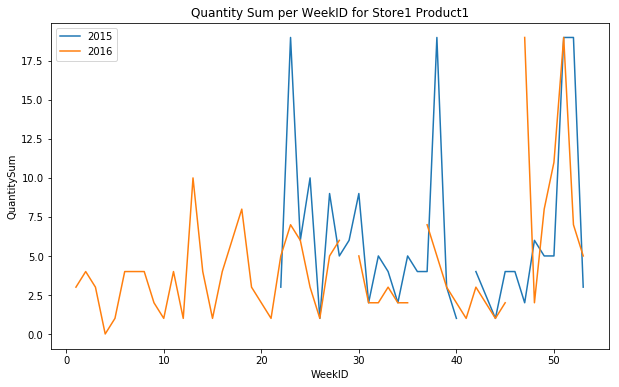

In [104]:
# Store1 Product1 
# Year 2015
# since there are 21 missing values, the time series graph is incomplete and is broken at missing weeks in between also
s1p1y15 = spwy_agg_unstack_df.loc[('Store1', 'Product1'), 2015]
plt.xlabel('WeekID')
plt.ylabel('QuantitySum')
plt.title('Quantity Sum per WeekID for Store1 Product1')
plt.plot(s1p1y15)

# Store1 Product1 
# Year 2016
# since there are only 3 missing values, the time series graph looks more complete though broken at missing WeekIDs
s1p1y16 = spwy_agg_unstack_df.loc[('Store1', 'Product1'), 2016]
plt.xlabel('WeekID')
plt.ylabel('QuantitySum')
plt.title('Quantity Sum per WeekID for Store1 Product1')
plt.plot(s1p1y16)

plt.legend(loc='upper left')

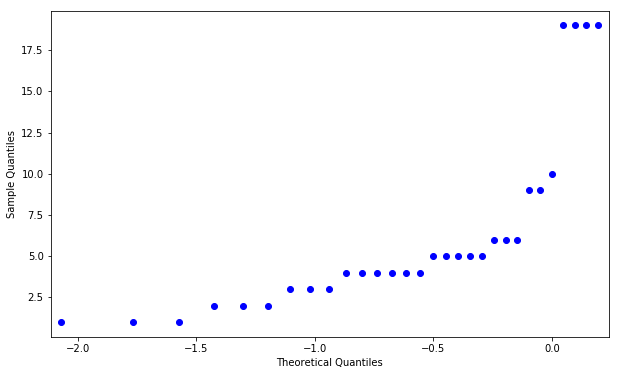

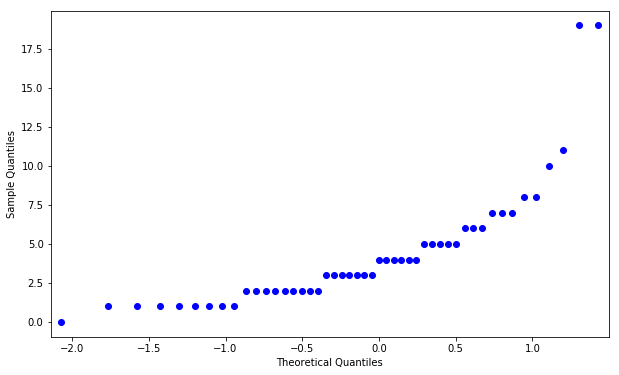

In [105]:
# Quantile-Quantile plot is useful to check the distribution of a data sample
from statsmodels.graphics.gofplots import qqplot

# Store1 Product1 
# Year 2015
# does not resemble normal distribution
qqplot(s1p1y15, line = 's')
plt.show()

# Store1 Product1 
# Year 2016
# does not resemble normal distribution
qqplot(s1p1y16, line = 's')
plt.show()

1.6195907894209842


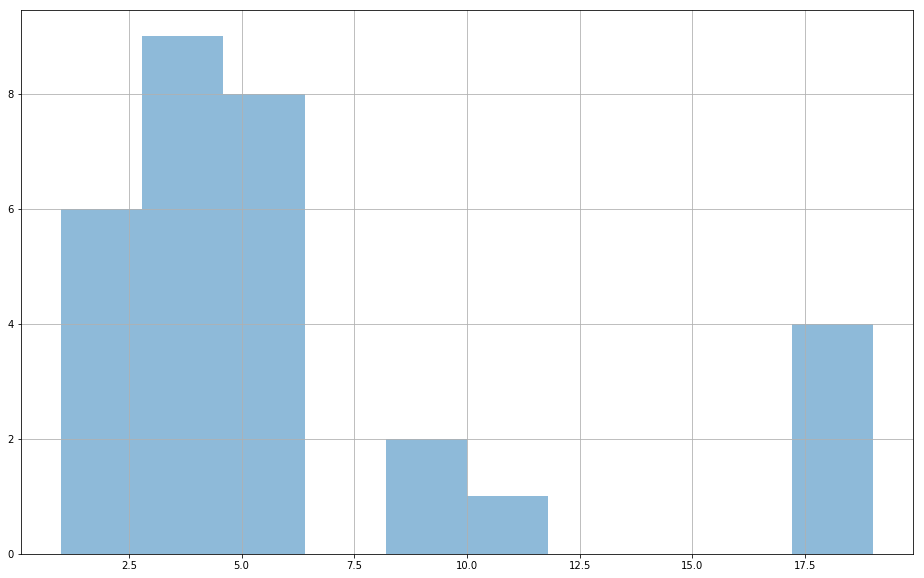

In [106]:
# Histograms can be interpreted to know whether the data is positively skewed or negatively skewed
# Store1 Product1 
# Year 2015
# Positively skewed with skewness = 1.619
s1p1y15.hist(alpha=0.5, figsize=(16, 10))
print(s1p1y15.skew())

2.2815062026689907


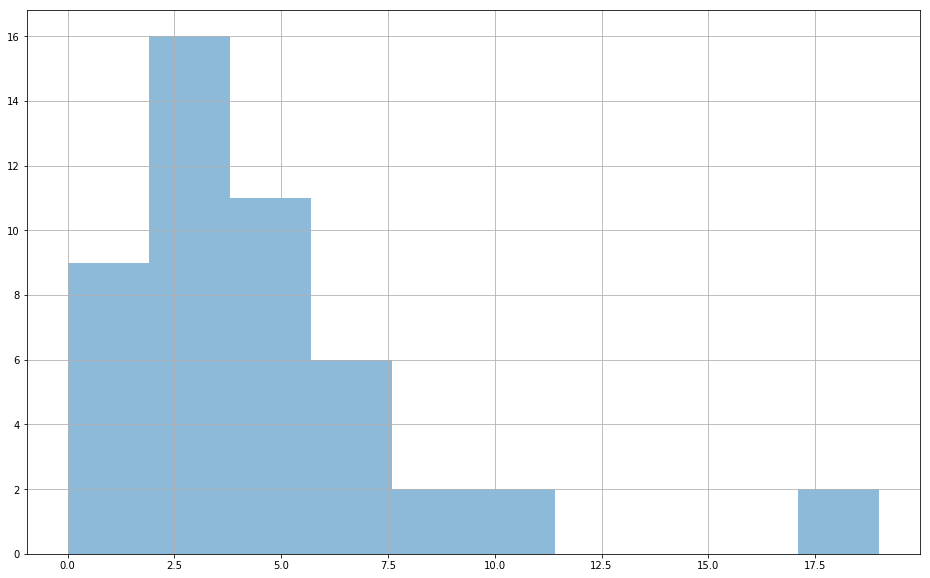

In [107]:
# Store1 Product1 
# Year 2016
# positively skewed with skewness = 2.281
s1p1y16.hist(alpha=0.5, figsize=(16, 10))
print(s1p1y16.skew())

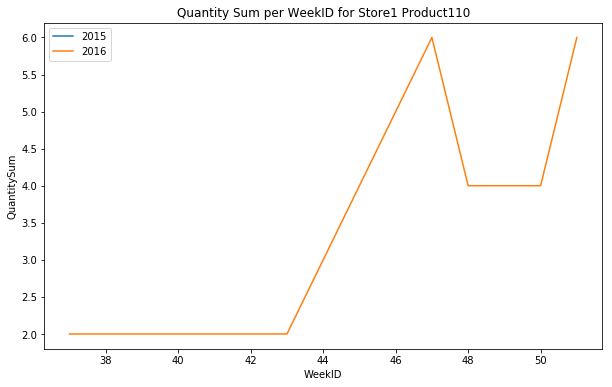

In [108]:
# Store1 Product110
# Year 2015
# time series graph is empty because Product110 is not sold at Store1 throughout the Year 2015
# whenever a product is not sold at a store throughout the year would induce bias and cause hindrance in building good models
s1p110y15 = spwy_agg_unstack_df.loc[('Store1', 'Product110'), 2015]

plt.xlabel('WeekID')
plt.ylabel('QuantitySum')
plt.title('Quantity Sum per WeekID for Store1 Product110')
plt.plot(s1p110y15)

# Store1 Product110
# Year 2016
# time series graph is complete for those WeekIDs where Product110 was sold at Store1 throughout the Year 2016
s1p110y16 = spwy_agg_unstack_df.loc[('Store1', 'Product110'), 2016]

plt.xlabel('WeekID')
plt.ylabel('QuantitySum')
plt.title('Quantity Sum per WeekID for Store1 Product110')
plt.plot(s1p110y16)

plt.legend(loc='upper left')

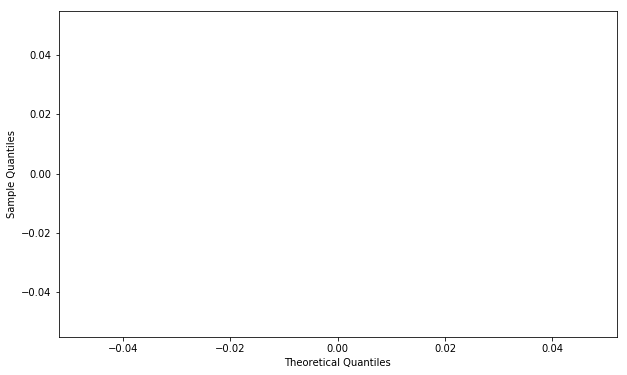

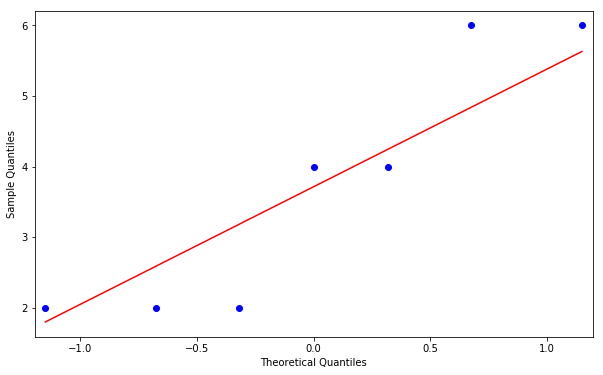

In [109]:
# Store1 Product110
# Year 2015
# plot is empty because Product110 is not sold at Store1 throughout the Year 2015
# whenever a product is not sold at a store throughout the year it would induce bias and cause hindrance in building good models
qqplot(s1p110y15, line = 's')
plt.show()

# Store1 Product110 
# Year 2016
# data is near normal distribution 
qqplot(s1p110y16, line = 's')
plt.show()

nan


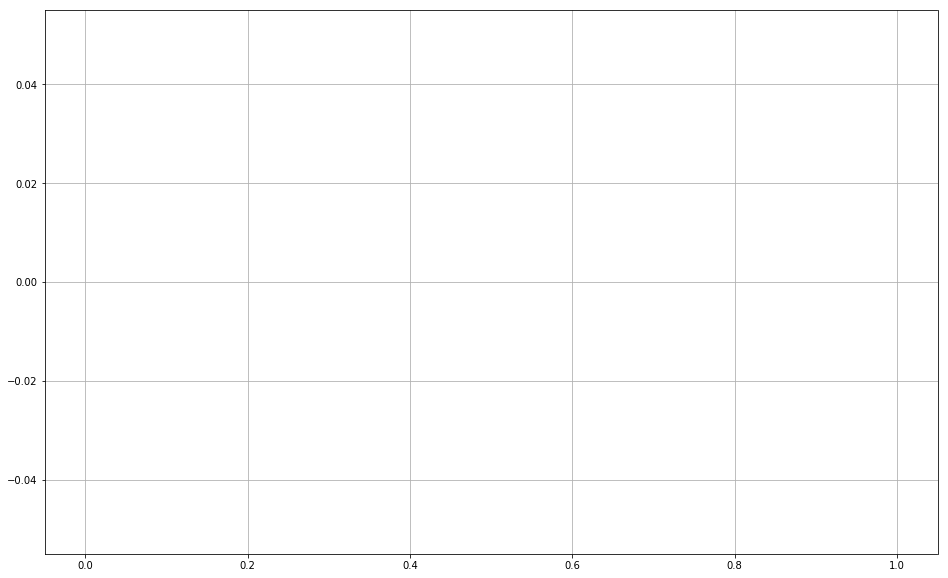

In [110]:
# Store1 Product110 
# Year 2015
# plot is empty because Product110 is not sold at Store1 throughout the Year 2015
# whenever a product is not sold at a store throughout the year it would induce bias and cause hindrance in building good models
s1p110y15.hist(alpha=0.5, figsize=(16, 10))
print(s1p110y15.skew())

0.353044967437828


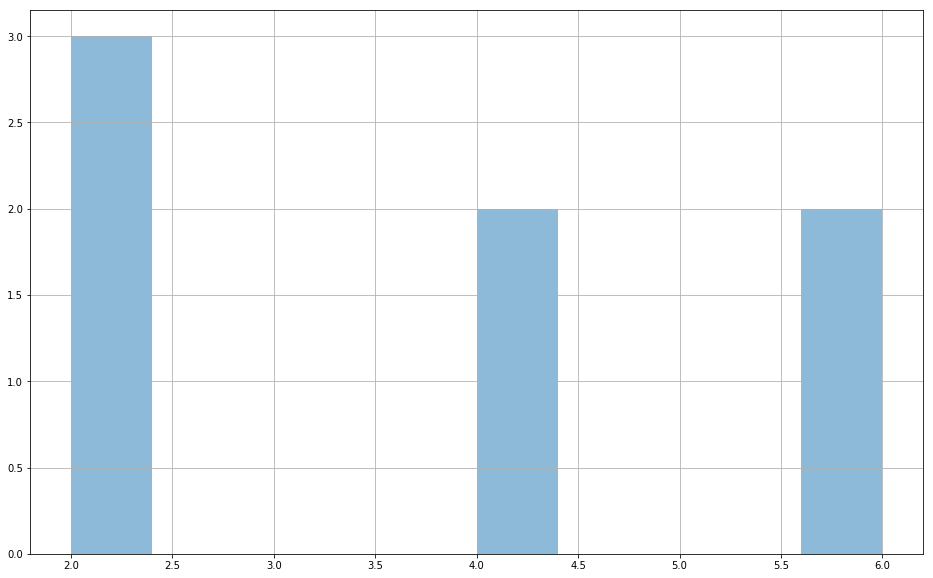

In [111]:
# Store1 Product110
# Year 2016
# skewness = 0.353
s1p110y16.hist(alpha=0.5, figsize=(16, 10))
print(s1p110y16.skew())

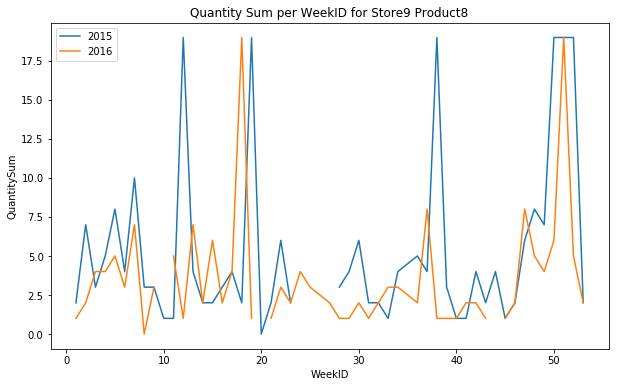

In [112]:
# Store9 Product8
# Year: 2015
s9p8y15 = spwy_agg_unstack_df.loc[('Store9', 'Product8'), 2015]

plt.xlabel('WeekID')
plt.ylabel('QuantitySum')
plt.title('Quantity Sum per WeekID for Store9 Product8')
plt.plot(s9p8y15)

# Store9 Product8
# Year: 2016
s9p8y16 = spwy_agg_unstack_df.loc[('Store9', 'Product8'), 2016]

plt.xlabel('WeekID')
plt.ylabel('QuantitySum')
plt.title('Quantity Sum per WeekID for Store9 Product8')
plt.plot(s9p8y16)

plt.legend(loc='upper left')

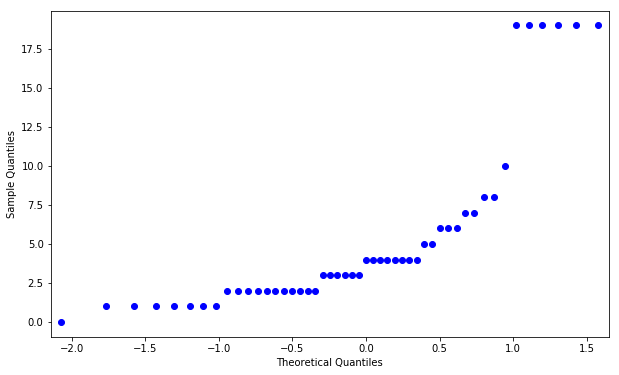

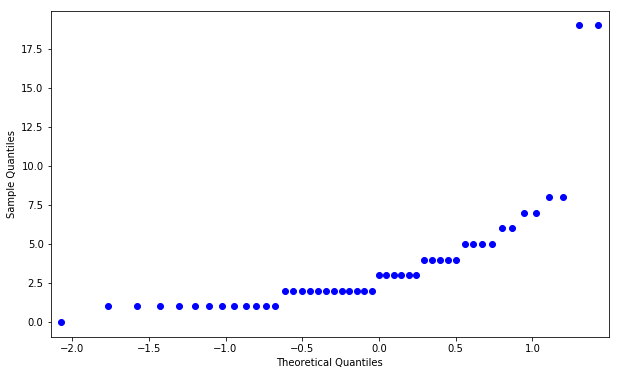

In [113]:
# Store9 Product8
# Year 2015
# does not resemble normal distribution
qqplot(s9p8y15, line = 's')
plt.show()

# Store1 Product8
# Year 2016
# does not resemble normal distribution
qqplot(s9p8y16, line = 's')
plt.show()

1.7873574646459227


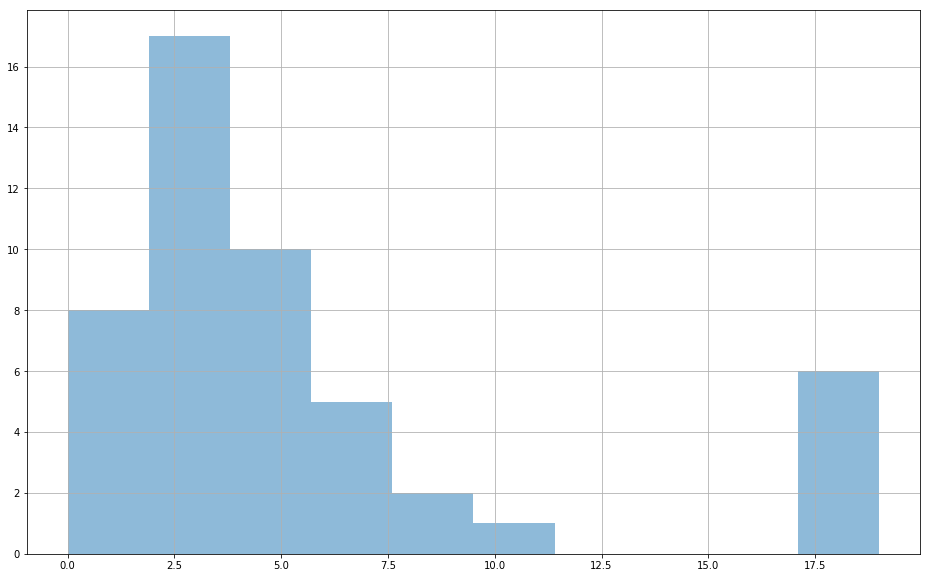

In [114]:
# Store9 Product8
# Year 2015
# positively skewed with skewness = 1.787
s9p8y15.hist(alpha=0.5, figsize=(16, 10))
print(s9p8y15.skew())

2.897294201351243


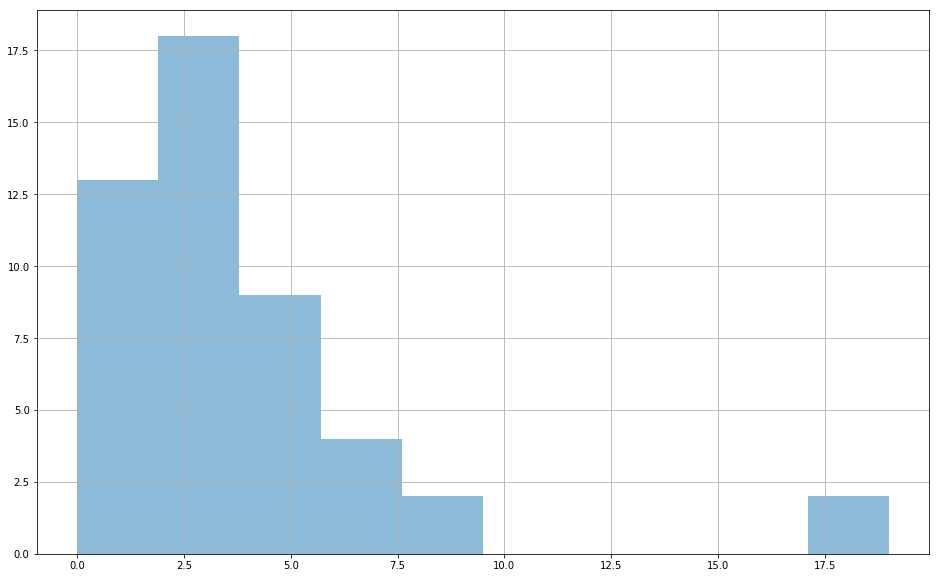

In [115]:
# Store9 Product8
# Year 2016
# positively skewed with skewness = 2.897
s9p8y16.hist(alpha=0.5, figsize=(16, 10))
print(s9p8y16.skew())

In [116]:
# this analysis helps in understanding which Product is never sold at a Store throughout a particular Year
# Product100, Product101, Product102, Product106, .. many more .. are not sold at Store1 throughout Year 2015
# Product73, Product74, Product77, Product78, Product79, .. many more .. are not sold at Store9 throughout Year 2015
spwy_agg_unstack_df.groupby(['Store', 'Product']).agg(['sum', 'mean', 'median', 'std'])

2015                               2016                    \
                     sum       mean median       std    sum       mean median   
Store  Product                                                                  
Store1 Product1    189.0   6.300000    4.5  5.528297  210.0   4.375000    3.0   
       Product10   317.0   8.342105    5.5  6.831075  318.0   6.913043    5.0   
       Product100    0.0        NaN    NaN       NaN   79.0   4.647059    2.0   
       Product101    0.0        NaN    NaN       NaN   77.0   5.500000    3.0   
       Product102    0.0        NaN    NaN       NaN   69.0   5.307692    3.0   
       Product103   25.0   0.833333    1.0  1.391683   25.0   0.892857    1.0   
       Product104   21.0   1.105263    1.0  1.559727   37.0   1.233333    1.0   
       Product105   32.0   1.066667    1.0  0.980265   33.0   1.100000    1.0   
       Product106    0.0        NaN    NaN       NaN  139.0   4.483871    3.0   
       Product107    0.0        NaN    NaN       NaN  106.0   3.212121    2.0   
       Product108    0.0        NaN    NaN       NaN   52.0   2.080000    2.0   
       Product109    0.0        NaN    NaN       NaN   37.0   1.480000    1.0   
       Product11   176.0   4.292683    3.0  4.226369  135.0   3.292683    2.0   
       Product110    0.0        NaN    NaN       NaN   26.0   3.714286    4.0   
       Product111    0.0        NaN    NaN       NaN   56.0   2.666667    1.0   
       Product112    0.0        NaN    NaN       NaN   33.0   3.666667    3.0   
       Product113    0.0        NaN    NaN       NaN  132.0   7.764706    4.0   
       Product114    0.0        NaN    NaN       NaN  155.0  10.333333   10.0   
       Product115   15.0   1.250000    1.0  1.422226   22.0   1.000000    1.0   
       Product116    0.0        NaN    NaN       NaN   42.0   1.448276    1.0   
       Product117    0.0        NaN    NaN       NaN   28.0   2.000000    2.0   
       Product118    0.0        NaN    NaN       NaN   36.0   3.272727    2.0   
       Product119    0.0        NaN    NaN       NaN   55.0   4.583333    3.0   
       Product12   222.0   4.933333    4.0  4.366192  328.0   6.307692    5.5   
       Product121    0.0        NaN    NaN       NaN  136.0   8.500000    4.0   
       Product122    0.0        NaN    NaN       NaN  169.0   9.941176    6.0   
       Product123    0.0        NaN    NaN       NaN   90.0   6.428571    4.0   
       Product124    0.0        NaN    NaN       NaN   80.0   5.333333    4.0   
       Product125    0.0        NaN    NaN       NaN  163.0   9.588235    7.0   
       Product126    0.0        NaN    NaN       NaN  103.0   6.058824    4.0   
...                  ...        ...    ...       ...    ...        ...    ...   
Store9 Product72    14.0   1.166667    1.0  0.717741   12.0   0.705882    1.0   
       Product73     0.0        NaN    NaN       NaN   23.0   1.533333    1.0   
       Product74     0.0        NaN    NaN       NaN   28.0   1.750000    1.5   
       Product75    49.0   1.531250    1.0  0.915260   70.0   1.944444    2.0   
       Product76     8.0   1.142857    1.0  0.377964    9.0   1.125000    1.0   
       Product77     0.0        NaN    NaN       NaN  171.0   9.500000    7.0   
       Product78     0.0        NaN    NaN       NaN  180.0  10.588235    8.0   
       Product79     0.0        NaN    NaN       NaN  229.0  12.722222   14.5   
       Product8    261.0   5.326531    3.0  5.576692  174.0   3.625000    2.0   
       Product80     0.0        NaN    NaN       NaN   39.0   3.250000    2.0   
       Product81     0.0        NaN    NaN       NaN   96.0   5.647059    4.0   
       Product82    22.0   1.466667    1.0  1.407463   15.0   0.833333    1.0   
       Product83    21.0   1.166667    1.0  0.707107    9.0   0.750000    1.0   
       Product84     0.0   0.000000    0.0  1.414214  195.0   5.416667    4.0   
       Product85     0.0        NaN    NaN       NaN   19.0   2.714286    2.0   
       Product86     0.0        NaN    NaN       Na

In [117]:
# the total number of missing values across all Store-Product-WeekID combinations in Year 2015
print(spwy_agg_unstack_df[2015].isnull().values.any())
print(spwy_agg_unstack_df[2015].isnull().values.sum())

True
69762


In [118]:
# the total number of missing values across all Store-Product-WeekID combinations in Year 2016
print(spwy_agg_unstack_df[2016].isnull().values.any())
print(spwy_agg_unstack_df[2016].isnull().values.sum())

True
8780


In [119]:
# consider the combination Store1 Product1 
# which has 21 missing values at Year 2015 and 3 missing values at Year 2016
# I want to replace the 21 missing with median of Store1 Product1 across Year 2015 and 3 missing values with median of Store1 Product1 across Year 2016
spwy_agg_unstack_df.loc[('Store1', 'Product1'), (2015, 2016)]

YearID,2015,2016
WeekID,,
1,NaN,3.0
2,NaN,4.0
3,NaN,3.0
4,NaN,0.0
5,NaN,1.0
6,NaN,4.0
8,NaN,4.0
9,NaN,2.0
10,NaN,1.0


In [120]:
# Case A: When there is a mix of available and missing week data for Store-Product combination across YearIDs 
# I calculate the median value using the already available data and replace the missing NaN values for missing weeks
# Store1 Product1 Year 2015 has a median: 4.5 -> Hence, 21 missing values/NaNs/WeekIDs are replaced by that value
# Store1 Product1 Year 2016 has a median: 3.0 -> Hence, 3 missing values/NaNs/WeekIDs are replaced by that value
spwy_agg_unstack_df = spwy_agg_unstack_df.fillna(spwy_agg_unstack_df.groupby(['Store', 'Product']).transform('median'))
spwy_agg_unstack_df

YearID                   2015  2016
Store  Product   WeekID            
Store1 Product1  1        4.5   3.0
                 2        4.5   4.0
                 3        4.5   3.0
                 4        4.5   0.0
                 5        4.5   1.0
                 6        4.5   4.0
                 8        4.5   4.0
                 9        4.5   2.0
                 10       4.5   1.0
                 11       4.5   4.0
                 12       4.5   1.0
                 13       4.5  10.0
                 14       4.5   4.0
                 15       4.5   1.0
                 16       4.5   4.0
                 17       4.5   6.0
                 18       4.5   8.0
                 19       4.5   3.0
                 20       4.5   2.0
                 21       4.5   1.0
                 22       3.0   5.0
                 23      19.0   7.0
                 24       6.0   6.0
                 25      10.0   3.0
                 26       1.0   1.0
                 27       9.0   5.0
                 28       5.0   6.0
                 29       6.0   3.0
                 30       9.0   5.0
                 31       2.0   2.0
...                       ...   ...
Store9 Product97 47       NaN   1.0
                 48       NaN   1.0
                 52       NaN  -1.0
       Product98 35       NaN   1.0
                 36       NaN   1.0
                 37       NaN   2.0
                 38       NaN   2.0
                 39       NaN   0.0
                 40       NaN   4.0
                 41       NaN   3.0
                 43       NaN   1.0
                 44       NaN   1.0
                 46       NaN   2.0
                 47       NaN   5.0
                 48       NaN   1.0
                 49       NaN   6.0
                 50       NaN   9.0
                 51       NaN  19.0
                 52       NaN   4.0
       Product99 36       NaN   1.0
                 37       NaN   5.0
                 39       NaN   3.0
                 40       NaN   1.0
                 44       NaN   1.0
                 47       NaN   1.0
                 48       NaN   1.0
                 49       NaN   5.0
                 50       NaN   7.0
                 51       NaN   7.0
                 52       NaN   2.0

[108585 rows x 2 columns]

In [121]:
# Store1 Product1 have no missing values now 
spwy_agg_unstack_df.loc[('Store1', 'Product1'), (2015, 2016)]

YearID,2015,2016
WeekID,,
1,4.5,3.0
2,4.5,4.0
3,4.5,3.0
4,4.5,0.0
5,4.5,1.0
6,4.5,4.0
8,4.5,4.0
9,4.5,2.0
10,4.5,1.0


In [122]:
# using Case A 
# I was able to impute 69762 - 48940 = 20822 week data across different Store-Product-WeekID 2015 data 
print(spwy_agg_unstack_df[2015].isnull().values.any())
print(spwy_agg_unstack_df[2015].isnull().values.sum())

True
48940


In [123]:
# using Case A 
# I was able to impute 8780 - 164 = 8616 week data across different Store-Product-WeekID 2016 data 
print(spwy_agg_unstack_df[2016].isnull().values.any())
print(spwy_agg_unstack_df[2016].isnull().values.sum())

True
164


In [124]:
# Case B: When data for all WeekIDs are missing for Store-Product combination across YearIDs 
# I calculate the median value using the other YearID and replace the missing NaN values for missing weeks
# Store1 Product110 Year 2015 has 7 missing weeks which will be imputed by median value for that Store-Product combination in 2016
# Store1 Product110 Year 2016 has a median: 4.0 -> Hence, this value will be used to help impute missing weeks in Year 2015
spwy_agg_unstack_df.loc[('Store1', 'Product110'), (2015,2016)]

YearID,2015,2016
WeekID,,
37,NaN,2.0
42,NaN,2.0
43,NaN,2.0
47,NaN,6.0
48,NaN,4.0
50,NaN,4.0
51,NaN,6.0


In [125]:
spwy_agg_unstack_df[2015].fillna(spwy_agg_unstack_df.groupby(['Store', 'Product'])[2016].transform('median'), inplace = True)

In [126]:
# using Case B 
# I was able to impute remaining 48940 week data across different Store-Product-WeekID 2015 data
print(spwy_agg_unstack_df[2015].isnull().values.any())
print(spwy_agg_unstack_df[2015].isnull().values.sum())

False
0


In [127]:
spwy_agg_unstack_df[2016].fillna(spwy_agg_unstack_df.groupby(['Store', 'Product'])[2015].transform('median'), inplace = True)

In [128]:
# using Case B 
# I was able to impute remaining 164 week data across different Store-Product-WeekID 2016 data
print(spwy_agg_unstack_df[2016].isnull().values.any())
print(spwy_agg_unstack_df[2016].isnull().values.sum())

False
0


In [129]:
# check Case B imputation for Store1 Product110
spwy_agg_unstack_df.loc[('Store1', 'Product110'), (2015,2016)]

YearID,2015,2016
WeekID,,
37,4.0,2.0
42,4.0,2.0
43,4.0,2.0
47,4.0,6.0
48,4.0,4.0
50,4.0,4.0
51,4.0,6.0


In [130]:
# confirmation for successful imputation of missing values
spwy_agg_unstack_df.isnull().values.any()

False

In [131]:
# for each Store-Product combination, compute the sum, mean, median and std across YearIDs 2015 and 2016
# since missing values are handled/imputed, the NaN values are not seen anymore 
spwy_agg_unstack_df.groupby(['Store', 'Product']).agg(['sum', 'mean', 'median', 'std'])

2015                               2016                    \
                     sum       mean median       std    sum       mean median   
Store  Product                                                                  
Store1 Product1    283.5   5.558824    4.5  4.304239  219.0   4.294118    3.0   
       Product10   377.5   7.704082    5.5  6.115995  333.0   6.795918    5.0   
       Product100   34.0   2.000000    2.0  0.000000   79.0   4.647059    2.0   
       Product101   42.0   3.000000    3.0  0.000000   77.0   5.500000    3.0   
       Product102   39.0   3.000000    3.0  0.000000   69.0   5.307692    3.0   
       Product103   36.0   0.878049    1.0  1.187332   38.0   0.926829    1.0   
       Product104   40.0   1.052632    1.0  1.089194   45.0   1.184211    1.0   
       Product105   43.0   1.048780    1.0  0.835201   44.0   1.073171    1.0   
       Product106   93.0   3.000000    3.0  0.000000  139.0   4.483871    3.0   
       Product107   66.0   2.000000    2.0  0.000000  106.0   3.212121    2.0   
       Product108   50.0   2.000000    2.0  0.000000   52.0   2.080000    2.0   
       Product109   25.0   1.000000    1.0  0.000000   37.0   1.480000    1.0   
       Product11   206.0   4.039216    3.0  3.815551  155.0   3.039216    2.0   
       Product110   28.0   4.000000    4.0  0.000000   26.0   3.714286    4.0   
       Product111   21.0   1.000000    1.0  0.000000   56.0   2.666667    1.0   
       Product112   27.0   3.000000    3.0  0.000000   33.0   3.666667    3.0   
       Product113   68.0   4.000000    4.0  0.000000  132.0   7.764706    4.0   
       Product114  150.0  10.000000   10.0  0.000000  155.0  10.333333   10.0   
       Product115   31.0   1.107143    1.0  0.916486   28.0   1.000000    1.0   
       Product116   29.0   1.000000    1.0  0.000000   42.0   1.448276    1.0   
       Product117   28.0   2.000000    2.0  0.000000   28.0   2.000000    2.0   
       Product118   22.0   2.000000    2.0  0.000000   36.0   3.272727    2.0   
       Product119   36.0   3.000000    3.0  0.000000   55.0   4.583333    3.0   
       Product12   254.0   4.792453    4.0  4.030454  333.5   6.292453    5.5   
       Product121   64.0   4.000000    4.0  0.000000  136.0   8.500000    4.0   
       Product122  102.0   6.000000    6.0  0.000000  169.0   9.941176    6.0   
       Product123   56.0   4.000000    4.0  0.000000   90.0   6.428571    4.0   
       Product124   60.0   4.000000    4.0  0.000000   80.0   5.333333    4.0   
       Product125  119.0   7.000000    7.0  0.000000  163.0   9.588235    7.0   
       Product126   68.0   4.000000    4.0  0.000000  103.0   6.058824    4.0   
...                  ...        ...    ...       ...    ...        ...    ...   
Store9 Product72    24.0   1.090909    1.0  0.526361   17.0   0.772727    1.0   
       Product73    15.0   1.000000    1.0  0.000000   23.0   1.533333    1.0   
       Product74    24.0   1.500000    1.5  0.000000   28.0   1.750000    1.5   
       Product75    64.0   1.361702    1.0  0.791958   92.0   1.957447    2.0   
       Product76    16.0   1.066667    1.0  0.258199   16.0   1.066667    1.0   
       Product77   126.0   7.000000    7.0  0.000000  171.0   9.500000    7.0   
       Product78   136.0   8.000000    8.0  0.000000  180.0  10.588235    8.0   
       Product79   261.0  14.500000   14.5  0.000000  229.0  12.722222   14.5   
       Product8    267.0   5.235294    3.0  5.483022  180.0   3.529412    2.0   
       Product80    24.0   2.000000    2.0  0.000000   39.0   3.250000    2.0   
       Product81    68.0   4.000000    4.0  0.000000   96.0   5.647059    4.0   
       Product82    36.0   1.241379    1.0  1.023131   26.0   0.896552    1.0   
       Product83    29.0   1.115385    1.0  0.588348   23.0   0.884615    1.0   
       Product84     0.0   0.000000    0.0  0.239046  195.0   5.416667    4.0   
       Product85    14.0   2.000000    2.0  0.000000   19.0   2.714286    2.0   
       Product86    10.0   1.000000    1.0  0.00000

In [132]:
# cleaned data frame obtained after imputation of missing values
spwy_agg_unstack_df.to_csv('Output_3_1.csv')

#### Detailed Answer 3

- I have plot time series graphs in order to understand whether the data follows any trend or seasonality because:
    - If the data has no trend and no seasonality, we can use median, mean, mode and random sample imputation technique
    - If the data has trend and no seasonality, we can use linear interpolation method
    - If the data has both trend and seasonality, we can use seasonal adjustment followed by interpolation.
- The conclusion is that each Store-Product series has their own time series graphs, some exhibit cyclical pattern with an alternating sequence of points above and below a trend line, some showed a upward trend and so on. So, I was not able to reach to a definite conclusion regarding the missing value imputation technique to be used.

- For Store-Product combinations, I collected QQ plots and histograms in order to test the normality and skewness respectively. I did this analysis because:
    - If the data is normally distributed and in particular does not have any skeweness, we can use the mean
    - If the data exhibits skewness, we can use the median
    
- Hence, I chose to use the median value and apply this technique in the following way:
    - Case A: When there is a mix of available and missing week data for Store-Product combination across YearIDs. I calculate the median value using the already available data and replace the missing NaN values for missing weeks. Refer to Store1 Product1 in the above code.
    - Case B: When data for all WeekIDs are missing for Store-Product combination across YearIDs. I calculate the median value using the other YearID and replace the missing NaN values for missing weeks. Refer to Store1 Product110 in the above code.

#### Question 4

Smoothen each Store-Product series to remove the promotion, seasonality and trend effect

#### Answer 4

In [321]:
# spwy_agg_unstack_df contains aggregated quantity, no outliers and no missing value data
# use reset_index to remove/reset the levels
# I would like to have a separate WeekID column in continuous manner representing entire 2015 + 2016 data 
# used melt to have Year 2015 data stacked above followed by Year 2016 data so as to compute continuous WeekNo
spwy_agg_unstack_df_transform = spwy_agg_unstack_df.reset_index()
spwy_agg_unstack_wy_df = pd.melt(spwy_agg_unstack_df_transform, id_vars=['Store', 'Product', 'WeekID'], value_vars=[2015, 2016], value_name = 'QuantitySum')
spwy_agg_unstack_wy_df

,Store,Product,WeekID,YearID,QuantitySum
0,Store1,Product1,1,2015,4.5
1,Store1,Product1,2,2015,4.5
2,Store1,Product1,3,2015,4.5
3,Store1,Product1,4,2015,4.5
4,Store1,Product1,5,2015,4.5
5,Store1,Product1,6,2015,4.5
6,Store1,Product1,8,2015,4.5
7,Store1,Product1,9,2015,4.5
8,Store1,Product1,10,2015,4.5
9,Store1,Product1,11,2015,4.5


In [322]:
# DateTimeObj is a dummy variable, so one need not think whether actual WeekID 1 stands for 2015-01-05 or not, I will ensure the correctness in WeekNo's
# using WeekID, YearID columns compute DateTimeObj, which will help us in computing continuous WeekNo
spwy_agg_unstack_wy_df['DateTimeObj'] = pd.to_datetime(spwy_agg_unstack_wy_df.WeekID.astype(str) + spwy_agg_unstack_wy_df.YearID.astype(str).add('-1') ,format='%W%Y-%w')
spwy_agg_unstack_wy_df

,Store,Product,WeekID,YearID,QuantitySum,DateTimeObj
0,Store1,Product1,1,2015,4.5,2015-01-05
1,Store1,Product1,2,2015,4.5,2015-01-12
2,Store1,Product1,3,2015,4.5,2015-01-19
3,Store1,Product1,4,2015,4.5,2015-01-26
4,Store1,Product1,5,2015,4.5,2015-02-02
5,Store1,Product1,6,2015,4.5,2015-02-09
6,Store1,Product1,8,2015,4.5,2015-02-23
7,Store1,Product1,9,2015,4.5,2015-03-02
8,Store1,Product1,10,2015,4.5,2015-03-09
9,Store1,Product1,11,2015,4.5,2015-03-16


In [323]:
# Date column which is a datetime object is created using strptime which operates on the DateTimeObj string
spwy_agg_unstack_wy_df['Date'] = [datetime.strptime(str(x), '%Y-%m-%d %H:%M:%S') for x in list(spwy_agg_unstack_wy_df['DateTimeObj'])]

# index 0, 1, 2, 3, 4 is assigned to weekNo
weekNo = spwy_agg_unstack_wy_df.reset_index()

# convert weekNo to Timedelta('0 days 00:00:00'), Timedelta('7 days 00:00:00') and so on
weekNo = [(x - spwy_agg_unstack_wy_df['Date'][0]) for x in list(spwy_agg_unstack_wy_df['Date'])]

# divide days by 7 to get week number, added 1 to ensure WeekNo start from 1 and increment by 1 from there onwards
spwy_agg_unstack_wy_df['WeekNo'] = [int((np.timedelta64(x, 'D').astype(int)/7) + 1) for x in weekNo]

# each Store-Product series is having a continuous WeekNo which represents data across both 2015 and 2016 years
spwy_agg_unstack_wy_df

,Store,Product,WeekID,YearID,QuantitySum,DateTimeObj,Date,WeekNo
0,Store1,Product1,1,2015,4.5,2015-01-05,2015-01-05,1
1,Store1,Product1,2,2015,4.5,2015-01-12,2015-01-12,2
2,Store1,Product1,3,2015,4.5,2015-01-19,2015-01-19,3
3,Store1,Product1,4,2015,4.5,2015-01-26,2015-01-26,4
4,Store1,Product1,5,2015,4.5,2015-02-02,2015-02-02,5
5,Store1,Product1,6,2015,4.5,2015-02-09,2015-02-09,6
6,Store1,Product1,8,2015,4.5,2015-02-23,2015-02-23,8
7,Store1,Product1,9,2015,4.5,2015-03-02,2015-03-02,9
8,Store1,Product1,10,2015,4.5,2015-03-09,2015-03-09,10
9,Store1,Product1,11,2015,4.5,2015-03-16,2015-03-16,11


In [324]:
# sp_agg_weekno_df is a dataframe with: Store-Product-WeekNo-QuantitySum columns
sp_agg_weekno_df = spwy_agg_unstack_wy_df[['Store', 'Product', 'WeekNo', 'QuantitySum']]
sp_agg_weekno_df

,Store,Product,WeekNo,QuantitySum
0,Store1,Product1,1,4.5
1,Store1,Product1,2,4.5
2,Store1,Product1,3,4.5
3,Store1,Product1,4,4.5
4,Store1,Product1,5,4.5
5,Store1,Product1,6,4.5
6,Store1,Product1,8,4.5
7,Store1,Product1,9,4.5
8,Store1,Product1,10,4.5
9,Store1,Product1,11,4.5


In [325]:
# group by Store-Product-WeekNo columns and aggregate QuantitySum from sp_agg_weekno_df dataframe
# store the above into spwno_agg_df
spwno_agg_df = sp_agg_weekno_df.groupby(['Store', 'Product', 'WeekNo'])['QuantitySum'].apply(lambda x:np.sum(x))
spwno_agg_df

Store   Product    WeekNo
Store1  Product1   1          4.5
                   2          4.5
                   3          4.5
                   4          4.5
                   5          4.5
                   6          4.5
                   8          4.5
                   9          4.5
                   10         4.5
                   11         4.5
                   12         4.5
                   13         4.5
                   14         4.5
                   15         4.5
                   16         4.5
                   17         4.5
                   18         4.5
                   19         4.5
                   20         4.5
                   21         4.5
                   22         3.0
                   23        19.0
                   24         6.0
                   25        10.0
                   26         1.0
                   27         9.0
                   28         5.0
                   29         6.0
                   30 

In [326]:
# Date column which is a datetime object is created using strptime which operates on the Week string
promo_data['Date'] = [datetime.strptime(str(x), '%Y-%m-%d %H:%M:%S') for x in list(promo_data['Week'])]

# index 0, 1, 2, 3, 4 is assigned to promo_weekNo
promo_weekNo = promo_data.reset_index()

# convert promo_weekNo to Timedelta('0 days 00:00:00'), Timedelta('7 days 00:00:00') and so on
promo_weekNo = [(x - promo_data['Date'][0]) for x in list(promo_data['Date'])]

# divide days by 7 to get week number, added 2 to ensure WeekNo start from 2 and increment by 1 from there onwards
# I have done this because the promo_data considers Week 2015-01-05 as WeekID 2 and 2015-01-01 is WeekID 1 in our earlier dataset spwno_agg_df
# Hence in order to maintain regularity, I have taken 2015-01-05 as WeekNo 2
promo_data['WeekNo'] = [int((np.timedelta64(x, 'D').astype(int)/7) + 2) for x in promo_weekNo]

# promo_data is having a continuous WeekNo which represents data across 2015, 2016 and 2017 years
promo_data

,Week,PromoID,WeekID,MonthID,YearID,Date,WeekNo
0,2015-01-05,No Promo,2,1,2015,2015-01-05,2
1,2015-01-12,No Promo,3,1,2015,2015-01-12,3
2,2015-01-19,No Promo,4,1,2015,2015-01-19,4
3,2015-01-26,No Promo,5,1,2015,2015-01-26,5
4,2015-02-02,No Promo,6,2,2015,2015-02-02,6
5,2015-02-09,Promo10,7,2,2015,2015-02-09,7
6,2015-02-16,No Promo,8,2,2015,2015-02-16,8
7,2015-02-23,No Promo,9,2,2015,2015-02-23,9
8,2015-03-02,No Promo,10,3,2015,2015-03-02,10
9,2015-03-09,No Promo,11,3,2015,2015-03-09,11


In [327]:
# sp_agg_weekno_df is a Store-Product-WeekNo-QuantitySum dataframe into which we want to include PromoID data 
sppwno_df = sp_agg_weekno_df.merge(right = promo_data, how = 'outer', on = ['WeekNo'])
sppwno_df[['Store', 'Product', 'PromoID', 'WeekNo', 'QuantitySum']]

,Store,Product,PromoID,WeekNo,QuantitySum
0,Store1,Product1,NaN,1,4.5
1,Store1,Product103,NaN,1,-1.0
2,Store1,Product104,NaN,1,1.0
3,Store1,Product105,NaN,1,1.0
4,Store1,Product11,NaN,1,3.0
5,Store1,Product115,NaN,1,1.0
6,Store1,Product12,NaN,1,4.0
7,Store1,Product13,NaN,1,8.0
8,Store1,Product131,NaN,1,1.0
9,Store1,Product14,NaN,1,1.0


In [328]:
# mode value of PromoID column is No Promo
sppwno_df['PromoID'].describe()

count       216250
unique          12
top       No Promo
freq        156017
Name: PromoID, dtype: object

In [329]:
# missing NaN values in PromoID column are replaced by NoPromo value
sppwno_df['PromoID'] = sppwno_df['PromoID'].fillna(sppwno_df['PromoID'].mode()[0])
sppwno_df[['Store', 'Product', 'PromoID', 'WeekNo', 'QuantitySum']]

,Store,Product,PromoID,WeekNo,QuantitySum
0,Store1,Product1,No Promo,1,4.5
1,Store1,Product103,No Promo,1,-1.0
2,Store1,Product104,No Promo,1,1.0
3,Store1,Product105,No Promo,1,1.0
4,Store1,Product11,No Promo,1,3.0
5,Store1,Product115,No Promo,1,1.0
6,Store1,Product12,No Promo,1,4.0
7,Store1,Product13,No Promo,1,8.0
8,Store1,Product131,No Promo,1,1.0
9,Store1,Product14,No Promo,1,1.0


In [330]:
# group by Store-Product-PromoID-WeekNo columns and aggregate QuantitySum from sppwno_df dataframe
# store the above into sppwno_agg_df
sppwno_agg_df = sppwno_df.groupby(['Store', 'Product', 'PromoID', 'WeekNo'])['QuantitySum'].apply(lambda x:np.sum(x))
sppwno_agg_df

Store   Product    PromoID   WeekNo
Store1  Product1   No Promo  1          4.5
                             2          4.5
                             3          4.5
                             4          4.5
                             5          4.5
                             6          4.5
                             8          4.5
                             9          4.5
                             10         4.5
                             11         4.5
                             13         4.5
                             14         4.5
                             15         4.5
                             16         4.5
                             17         4.5
                             18         4.5
                             20         4.5
                             21         4.5
                             22         3.0
                             25        10.0
                             26         1.0
                             29         

#### Which time series to consider ?
- I have two series grouped by the following:
     - `spwno_agg_df`: grouped by `Store-Product-WeekNo` aggregated by `QuantitySum`
     - `sppwno_agg_df`: grouped by `Store-Product-PromoID-WeekNo` aggregated by `QuantitySum`
     - Both the series have the same Length: `216375`

- The focus of the analysis has to be on `Store-Product` series and additional grouping on `PromoID` would introduce one more unwanted level of division and reduce the number of weeks data since PromoIDs applied can differ weekly
    - Hence, using the `Store-Product` series and applying smoothing methods we will remove promotion, seasonality and trend effect 
    - Also, there is no need to add `Geography`, `Category` into our dataframe. 
    - `spwno_agg_df` grouped by `Store-Product-WeekNo` aggregated by `QuantitySum` is best for the job.

#### Concept of Stationarity
- In order to apply a time series model, it is important for the time series to be stationary i.e. all its statistical properties (mean, variance) remain constant over time. This is done basically to ensure that if the behaviour over certain period of time is same, we can base our future forecast based on these properties.

- We can check for stationary using the below techniques:
    - a visual method wherein we plot the rolling statistics
    - run Dickey-Fuller test which is a statistical test. The result contains test statistics and critical value for different confidence levels. 
         - If the test statistic is less than the critical value, we can reject the null hypothesis (aka the series is stationary). 
         - When the test statistic is greater than the critical value, we fail to reject the null hypothesis (which means the series is not stationary).

- Initially, I had a single list `sp_list` for all the Store-Product series. There were about 5040 combinations. 
- When I ran `smoothen_store_product_series` function on each combination from the `sp_list`. It caused the Jupyter Notebook to crash.
- Hence, I have divided the Store-Product series store-wise. Thus, store1_list contains all Store1-ProductX combinations and so on.
- So, we will have 30 storeX_list will which encompass all the 5040 combinations in all.

In [331]:
sp_agg_weekno_groups = sp_agg_weekno_df.groupby(['Store', 'Product']).groups

store1_list = []
store2_list = []
store3_list = []
store4_list = []
store5_list = []
store6_list = []
store7_list = []
store8_list = []
store9_list = []
store10_list = []
store11_list = []
store12_list = []
store13_list = []
store14_list = []
store15_list = []
store16_list = []
store17_list = []
store18_list = []
store19_list = []
store20_list = []
store21_list = []
store22_list = []
store23_list = []
store24_list = []
store25_list = []
store26_list = []
store27_list = []
store28_list = []
store29_list = []
store30_list = []

for key, value in sp_agg_weekno_groups:
    if (key == 'Store1'):
                        store1_list.append(tuple((str(key), str(value))))
    elif (key == 'Store2'):
                        store2_list.append(tuple((str(key), str(value))))
    elif (key == 'Store3'):
                        store3_list.append(tuple((str(key), str(value))))
    elif (key == 'Store4'):
                        store4_list.append(tuple((str(key), str(value))))
    elif (key == 'Store5'):
                        store5_list.append(tuple((str(key), str(value))))
    elif (key == 'Store6'):
                        store6_list.append(tuple((str(key), str(value))))
    elif (key == 'Store7'):
                        store7_list.append(tuple((str(key), str(value))))
    elif (key == 'Store8'):
                        store8_list.append(tuple((str(key), str(value))))
    elif (key == 'Store9'):
                        store9_list.append(tuple((str(key), str(value))))
    elif (key == 'Store10'):
                        store10_list.append(tuple((str(key), str(value))))
    elif (key == 'Store11'):
                        store11_list.append(tuple((str(key), str(value))))
    elif (key == 'Store12'):
                        store12_list.append(tuple((str(key), str(value))))
    elif (key == 'Store13'):
                        store13_list.append(tuple((str(key), str(value))))
    elif (key == 'Store14'):
                        store14_list.append(tuple((str(key), str(value))))
    elif (key == 'Store15'):
                        store15_list.append(tuple((str(key), str(value))))
    elif (key == 'Store16'):
                        store16_list.append(tuple((str(key), str(value))))
    elif (key == 'Store17'):
                        store17_list.append(tuple((str(key), str(value))))
    elif (key == 'Store18'):
                        store18_list.append(tuple((str(key), str(value))))
    elif (key == 'Store19'):
                        store19_list.append(tuple((str(key), str(value))))
    elif (key == 'Store20'):
                        store20_list.append(tuple((str(key), str(value))))
    elif (key == 'Store21'):
                        store21_list.append(tuple((str(key), str(value))))
    elif (key == 'Store22'):
                        store22_list.append(tuple((str(key), str(value))))
    elif (key == 'Store23'):
                        store23_list.append(tuple((str(key), str(value))))
    elif (key == 'Store24'):
                        store24_list.append(tuple((str(key), str(value))))
    elif (key == 'Store25'):
                        store25_list.append(tuple((str(key), str(value))))
    elif (key == 'Store26'):
                        store26_list.append(tuple((str(key), str(value))))
    elif (key == 'Store27'):
                        store27_list.append(tuple((str(key), str(value))))
    elif (key == 'Store28'):
                        store28_list.append(tuple((str(key), str(value))))
    elif (key == 'Store29'):
                        store29_list.append(tuple((str(key), str(value))))
    elif (key == 'Store30'):
                        store30_list.append(tuple((str(key), str(value))))

In [332]:
# total Store-Product combinations are 5040 which is equal to the sum of individual lengths of storeX_list
len(store1_list) + len(store2_list) + len(store3_list) + len(store4_list) + len(store5_list) + len(store6_list) + len(store7_list) + len(store8_list) + len(store9_list) + len(store10_list) + len(store11_list) + len(store12_list) + len(store13_list) + len(store14_list) + len(store15_list) + len(store16_list) + len(store17_list) + len(store18_list) + len(store19_list) + len(store20_list) + len(store21_list) + len(store22_list) + len(store23_list) + len(store24_list) + len(store25_list) + len(store26_list) + len(store27_list) + len(store28_list) + len(store29_list) + len(store30_list)

5040

#### smoothen_store_product_series function

In [333]:
def smoothen_store_product_series(series, v):
    
    # Part1
    # Check the Stationarity of each Store-Product time series
    
    # Moving Average and Moving Standard Deviation
    # Calculate Rolling Statistics
    
    print("\n")
    print('Start of Analysis for')
    print(str(v), "\n")    
    
    mavg_df = series.transform(lambda x: x.rolling(window = 52).mean())
    mstd_df = series.transform(lambda x: x.rolling(window = 52).std())
    
    sxpx         = series.loc[v]
    sxpx_mavg_df = mavg_df.loc[v]
    sxpx_mstd_df = mstd_df.loc[v]
    
    print('Rolling Statistics')
    print(str(v), "\n")
    
    # Plot Rolling Statistics
    
    orig = plt.plot(sxpx, color = 'blue', label = 'Storex')
    mean = plt.plot(sxpx_mavg_df, color = 'red', label = 'Storex Productx Rolling Mean')
    std  = plt.plot(sxpx_mstd_df, color = 'black', label = 'Storex Productx Rolling StdDev')
    
    plt.legend(loc = 'best')
    plt.title('Storex Productx')
    plt.show(block=False)
    
    # Dickey-Fuller Test
    
    from statsmodels.tsa.stattools import adfuller
    
    print('Dickey Fuller Test')
    print(str(v), "\n")

    sxpx_idxdf = sxpx.to_frame(name = 'QuantitySum')

    sxpx_dftest = adfuller(sxpx_idxdf['QuantitySum'], autolag = 'AIC', maxlag = 0)

    sxpx_dfoutput = pd.Series(sxpx_dftest[0:4], index = ['test statistics', 'p-value', '#lags-used', 'number of observations used'])

    for key, value in sxpx_dftest[4].items():
        sxpx_dfoutput['Critical Value %s' %key] = value

    print(sxpx_dfoutput)
    
    # Part 2
    # Log Transformation of each Store-Product series
    
    print("\n")
    
    np.seterr(divide = 'ignore') 
    sxpx_log = np.log(sxpx)
    
    sxpx_log_mavg = sxpx_log.rolling(window = 52).mean()
    sxpx_log_mstd = sxpx_log.rolling(window = 52).std()
    
    # wherever sxpx_log_mavg and sxpx_log_mstd are observed with NaN, fill with 0
    sxpx_log_mavg.fillna(0, inplace = True)
    sxpx_log_mstd.fillna(0, inplace = True)

    # sxpx_log_minus_mavg
    sxpx_log_minus_mavg = sxpx_log - sxpx_log_mavg  
    
    # Checking Stationarity of each Store-Product series after Log Transformation

    # calculate rolling statistics on sxpx_log_minus_mavg 
    sxpx_log_minus_mavg_df = sxpx_log_minus_mavg.transform(lambda x: x.rolling(window = 52).mean())
    sxpx_log_minus_mstd_df = sxpx_log_minus_mavg.transform(lambda x: x.rolling(window = 52).std())
    
    print('Rolling Statistics of Log Minus Moving Average')
    print(str(v), "\n")
    
    # Storex Productx Log Minus Moving Average
    orig = plt.plot(sxpx_log_minus_mavg, color = 'blue', label = 'Storex Productx Log Minus Mavg')
    mean = plt.plot(sxpx_log_minus_mavg_df, color = 'red', label = 'Storex Productx Log Minus Mavg Rolling Mean')
    std  = plt.plot(sxpx_log_minus_mstd_df, color = 'black', label = 'Storex Productx Log Minus Mavg Rolling StdDev')
    plt.legend(loc = 'best')
    plt.title('Storex Productx Log Minus Mavg')
    plt.show(block=False)
    
    print('Dickey Fuller Test of Log Minus Moving Average')
    print(str(v), "\n")
    
    # Dickey Fuller Test
    from statsmodels.tsa.stattools import adfuller

    # convert sxpx_log_minus_mavg to dataframe
    sxpx_log_minus_mavg_idxdf = sxpx_log_minus_mavg.to_frame(name = 'QuantitySum')

    # replace -inf or inf values with NaN
    sxpx_log_minus_mavg_idxdf.replace([np.inf, -np.inf], np.nan, inplace = True)

    # fill NaN values with 0
    sxpx_log_minus_mavg_idxdf.fillna(0, inplace=True)

    # now, adfuller should not cause any error
    sxpx_log_minus_mavg_dftest = adfuller(sxpx_log_minus_mavg_idxdf['QuantitySum'], autolag = 'AIC', maxlag = 0)

    sxpx_log_minus_mavg_dfoutput = pd.Series(sxpx_log_minus_mavg_dftest[0:4], index = ['test statistics', 'p-value', '#lags-used', 'number of observations used'])

    for key, value in sxpx_log_minus_mavg_dftest[4].items():
        sxpx_log_minus_mavg_dfoutput['Critical Value %s' %key] = value

    print(sxpx_log_minus_mavg_dfoutput)
    
    # Part 3 
    # Exponentially Weighted Moving Average
    
    print("\n")
    
    sxpx_expwavg = sxpx_log.ewm(halflife = 52, adjust = True).mean()

    sxpx_log_minus_expwavg = sxpx_log - sxpx_expwavg
    
    print('Rolling Statistics of Log Minus Exponential Weighted Moving Average')
    print(str(v), "\n")

    # calculate rolling statistics on sxpx_log_minus_expwavg 
    sxpx_log_minus_expwavg_mavg_df = sxpx_log_minus_expwavg.transform(lambda x: x.rolling(window = 52).mean())
    sxpx_log_minus_expwavg_mstd_df = sxpx_log_minus_expwavg.transform(lambda x: x.rolling(window = 52).std())

    # Storex Productx Log Minus Exponential Moving Average
    orig = plt.plot(sxpx_log_minus_expwavg, color = 'blue', label = 'Storex Productx Log Minus ExpWMavg')
    mean = plt.plot(sxpx_log_minus_expwavg_mavg_df, color = 'red', label = 'Storex Productx Log Minus ExpWMavg Rolling Mean')
    std  = plt.plot(sxpx_log_minus_expwavg_mstd_df, color = 'black', label = 'Storex Productx Log Minus ExpWMavg Rolling StdDev')
    plt.legend(loc = 'best')
    plt.title('Storex Productx Log Minus ExpWMavg')
    plt.show(block=False)
    
    print('Dickey Fuller Test of Log Minus Exponential Weighted Moving Average')
    print(str(v), "\n")

    # Dickey Fuller Test
    from statsmodels.tsa.stattools import adfuller

    # convert s1p1_log_minus_mavg to dataframe
    sxpx_log_minus_expwavg_idxdf = sxpx_log_minus_expwavg.to_frame(name = 'QuantitySum')

    # replace -inf or inf values with NaN
    sxpx_log_minus_expwavg_idxdf.replace([np.inf, -np.inf], np.nan, inplace = True)

    # fill NaN values with 0
    sxpx_log_minus_expwavg_idxdf.fillna(0, inplace=True)

    # now, adfuller should not cause any error
    sxpx_log_minus_expwavg_dftest = adfuller(sxpx_log_minus_expwavg_idxdf['QuantitySum'], autolag = 'AIC', maxlag = 0)

    sxpx_log_minus_expwavg_dfoutput = pd.Series(sxpx_log_minus_expwavg_dftest[0:4], index = ['test statistics', 'p-value', '#lags-used', 'number of observations used'])

    for key, value in sxpx_log_minus_expwavg_dftest[4].items():
        sxpx_log_minus_expwavg_dfoutput['Critical Value %s' %key] = value
    

    print(sxpx_log_minus_expwavg_dfoutput)

    # Part 4 
    # Log Differencing
    
    print("\n")
    
    sxpx_log_diff_shift = sxpx_log - sxpx_log.shift()

    # drop NaN values from s1p1_log_diff_shift
    sxpx_log_diff_shift.dropna(inplace = True)

    # calculate rolling statistics on sxpx_log_diff_shift 
    sxpx_log_diff_shift_mavg_df = sxpx_log_diff_shift.transform(lambda x: x.rolling(window = 52).mean())
    sxpx_log_diff_shift_mstd_df = sxpx_log_diff_shift.transform(lambda x: x.rolling(window = 52).std())
    
    print('Rolling Statistics of Log Diff Shift')
    print(str(v), "\n")

    # Store1 Product1 Log Diff Shift
    orig = plt.plot(sxpx_log_diff_shift, color = 'blue', label = 'Storex Productx Log Diff Shift')
    mean = plt.plot(sxpx_log_diff_shift_mavg_df, color = 'red', label = 'Storex Productx Log Diff Shift Rolling Mean')
    std  = plt.plot(sxpx_log_diff_shift_mstd_df, color = 'black', label = 'Storex Productx Log Diff Shift Rolling StdDev')
    plt.legend(loc = 'best')
    plt.title('Storex Productx Log Diff Shift')
    plt.show(block=False)
    
    print('Dickey Fuller Test of Log Diff Shift')
    print(str(v), "\n")
    
    # Dickey Fuller Test
    from statsmodels.tsa.stattools import adfuller

    # convert sxpx_log_diff_shift to dataframe
    sxpx_log_diff_shift_idxdf = sxpx_log_diff_shift.to_frame(name = 'QuantitySum')

    # replace -inf or inf values with NaN
    sxpx_log_diff_shift_idxdf.replace([np.inf, -np.inf], np.nan, inplace = True)

    # fill NaN values with 0
    sxpx_log_diff_shift_idxdf.fillna(0, inplace=True)

    # now, adfuller should not cause any error 
    try:
        sxpx_log_diff_shift_dftest = adfuller(sxpx_log_diff_shift_idxdf['QuantitySum'], autolag = 'AIC', maxlag = 0)
        
        sxpx_log_diff_shift_dfoutput = pd.Series(sxpx_log_diff_shift_dftest[0:4], index = ['test statistics', 'p-value', '#lags-used', 'number of observations used'])

        for key, value in sxpx_log_diff_shift_dftest[4].items():
            sxpx_log_diff_shift_dfoutput['Critical Value %s' %key] = value


        print(sxpx_log_diff_shift_dfoutput)
        
    except ValueError:
                        pass    
    
    # Part 5
    # Seasonality
    
    print("\n")
    
    print('Decomposition')
    print(str(v), "\n")
    
    from statsmodels.tsa.seasonal import seasonal_decompose
    import statsmodels.api as sm

    # replace -inf or inf values with NaN
    sxpx_log.replace([np.inf, -np.inf], np.nan, inplace = True)

    # fill NaN values with 0
    sxpx_log.fillna(0, inplace=True)

    sxpx_log_decomposition = sm.tsa.seasonal_decompose(sxpx_log.values, freq = 1)

    sxpx_log_trend    = sxpx_log_decomposition.trend
    sxpx_log_seasonal = sxpx_log_decomposition.seasonal
    sxpx_log_residual = sxpx_log_decomposition.resid

    plt.plot(sxpx_log, label = 'Original')
    plt.legend(loc = 'best')
    plt.show(block=False)
    
    plt.plot(sxpx_log_trend, label = 'Trend')
    plt.legend(loc = 'best')
    plt.show(block=False)

    plt.plot(sxpx_log_seasonal, label = 'Seasonality')
    plt.legend(loc = 'best')
    plt.show(block=False)

    plt.plot(sxpx_log_residual, label = 'Residuals')
    plt.legend(loc = 'best')
    plt.show(block=False)
    
    print('End of Analysis for')
    print(str(v), "\n")    

#### Smoothening of Store1-ProductX Series

In [ ]:
# Store1-Product series
for k, v in enumerate(store1_list):
    smoothen_store_product_series(spwno_agg_df, v)

Stationary and Non-Stationary Time Series at Store 1
- The following time series corresponding to these ProductIDs are stationary at Store1: Product1, Product10, Product100, Product101, Product103, Product104, Product105, Product106, Product107, Product108, Product109, Product11, Product111, Product112, Product113, Product115, Product116, Product117, Product118, Product119, Product12, Product121, Product122, Product124, Product125, Product126, Product129, Product13, Product130, Product131, Product132, Product133, Product134, Product138, Product14, Product142, Product143, Product144, Product148, Product149, Product15, Product152, Product154, Product155, Product156, Product157, Product16, Product161, Product164, Product165, Product17, Product18, Product19, Product2, Product20, Product21, Product23, Product24, Product25, Product26, Product27, Product28, Product29, Product3, Product31, Product32, Product33, Product34, Product35, Product36, Product37, Product38, Product39, Product4, Product40, Product41, Product42, Product43, Product44, Product45, Product46, Product47, Product48, Product49, Product5, Product50, Product51, Product52, Product53, Product54, Product55, Product57, Product58, Product59, Product6, Product60, Product62, Product63, Product64, Product65, Product66, Product67, Product68, Product69, Product7, Product70, Product72, Product73, Product74, Product75, Product76, Product77, Product79, Product8, Product80, Product82, Product83, Product84, Product85, Product86, Product87, Product88, Product89, Product9, Product90, Product91, Product92, Product93, Product94, Product95, Product96, Product97, Product99.

- The following time series corresponding to these ProductIDs are non-stationary at Store1: Product102, Product110, Product114, Product123, Product127, Product128, Product136, Product137, Product139, Product140, Product141, Product145, Product146, Product147, Product150, Product151, Product158, Product159, Product160, Product162, Product167, Product170, Product173, Product177, Product22, Product30, Product56, Product61, Product71, Product78, Product81, Product98. 
    - Using differernt smoothing methods these non-stationary processes were made stationary.

- In a similar way, the non-stationary time series at other stores will also be smoothened and become stationary processes.

#### Observations from Smoothening of Store1-ProductX Series

#### Part 1
- Most of the Store1-ProductX series were stationary
    - Results of Dickey-Fuller test
        - Store1 Product1 
            - Test Statistic value: -8.078704 < Critical values (1%, 5%, 10%): (-3.497501, -2.890906, -2.582435) 
            - p-value: 0.000000000001481329 which is negligible 
            - series is stationary
        - Store1 Product10 
            - Test Statistic value: -5.607857 < Critical values (1%, 5%, 10%): (-3.499637, -2.891831, -2.582928)
            - p-value: 0.000001 which is negligible 
            - series is stationary 
        - Store30 Product20 
            - Test Statistic value: -7.031846 < Critical values (1%, 5%, 10%): (-3.494850, -2.889758, -2.581822) 
            - p-value: 0.0000000006156462 which is negligible 
            - series is stationary
        
#### Part 2
- Observations from Log Transformation 
    - The rolling values are hardly seen. 
    - However, a drawback with this approach is that time-period has to be strictly defined. In this case, we have taken weekly averages, but in complex situations wherein we need to forecast a stock price, it is difficult to come up with a time period. In those cases, we take a weighted moving average wherein the more recent values are given a higher weight. 
    
#### Part 3
- Application of Exponentially Weighted Moving Average Transformation of Store-Product series
        
#### Part 4
- Observations from Log Differencing
    - Many non-stationary Store1-ProductX series became stationary on Log Differencing such as
        - Store1-Product102 initially had p-value: 0.543823, Test-Statistic = -1.479102 > Critical Value (5%) = -2.986489
        - On Log Differencing Store1-Product102 became stationary
        
#### Part 5
- Observations from Decomposition
    - In most cases, only the trend part is observed.
    - In most cases, the seasonal part and residual part is empty / shows nothing.
    - Hence, the concept of checking for noise/residual being stationary is not applicable in this scenario.

#### Smoothening of other StoreX-ProductX Series
- Please run each StoreX-ProductX series individually, to obtain and interpret the results. 
- If ran together, it causes load on the Jupyter Notebook, causing it to crash.

In [ ]:
# Store2-Product series
for k, v in enumerate(store2_list):
    smoothen_store_product_series(spwno_agg_df, v)
    
# Store3-Product series
for k, v in enumerate(store3_list):
    smoothen_store_product_series(spwno_agg_df, v)
    
# Store4-Product series
for k, v in enumerate(store4_list):
    smoothen_store_product_series(spwno_agg_df, v)
    
# Store5-Product series
for k, v in enumerate(store5_list):
    smoothen_store_product_series(spwno_agg_df, v)
    
# Store6-Product series
for k, v in enumerate(store6_list):
    smoothen_store_product_series(spwno_agg_df, v)
    
# Store7-Product series
for k, v in enumerate(store7_list):
    smoothen_store_product_series(spwno_agg_df, v)
    
# Store8-Product series
for k, v in enumerate(store8_list):
    smoothen_store_product_series(spwno_agg_df, v)
    
# Store9-Product series
for k, v in enumerate(store9_list):
    smoothen_store_product_series(spwno_agg_df, v)
    
# Store10-Product series
for k, v in enumerate(store10_list):
    smoothen_store_product_series(spwno_agg_df, v)
    
# Store11-Product series
for k, v in enumerate(store11_list):
    smoothen_store_product_series(spwno_agg_df, v)
    
# Store12-Product series
for k, v in enumerate(store12_list):
    smoothen_store_product_series(spwno_agg_df, v)
    
# Store13-Product series
for k, v in enumerate(store13_list):
    smoothen_store_product_series(spwno_agg_df, v)
    
# Store14-Product series
for k, v in enumerate(store14_list):
    smoothen_store_product_series(spwno_agg_df, v)
    
# Store15-Product series
for k, v in enumerate(store15_list):
    smoothen_store_product_series(spwno_agg_df, v)
    
# Store16-Product series
for k, v in enumerate(store16_list):
    smoothen_store_product_series(spwno_agg_df, v)
    
# Store17-Product series
for k, v in enumerate(store17_list):
    smoothen_store_product_series(spwno_agg_df, v)
    
# Store18-Product series
for k, v in enumerate(store18_list):
    smoothen_store_product_series(spwno_agg_df, v)

# Store19-Product series
for k, v in enumerate(store19_list):
    smoothen_store_product_series(spwno_agg_df, v)
    
# Store20-Product series
for k, v in enumerate(store20_list):
    smoothen_store_product_series(spwno_agg_df, v)
    
# Store21-Product series
for k, v in enumerate(store21_list):
    smoothen_store_product_series(spwno_agg_df, v)

# Store22-Product series
for k, v in enumerate(store22_list):
    smoothen_store_product_series(spwno_agg_df, v)
    
# Store23-Product series
for k, v in enumerate(store23_list):
    smoothen_store_product_series(spwno_agg_df, v)
    
# Store24-Product series
for k, v in enumerate(store24_list):
    smoothen_store_product_series(spwno_agg_df, v)
    
# Store25-Product series
for k, v in enumerate(store25_list):
    smoothen_store_product_series(spwno_agg_df, v)

# Store26-Product series
for k, v in enumerate(store26_list):
    smoothen_store_product_series(spwno_agg_df, v)
    
# Store27-Product series
for k, v in enumerate(store27_list):
    smoothen_store_product_series(spwno_agg_df, v)
    
# Store28-Product series
for k, v in enumerate(store28_list):
    smoothen_store_product_series(spwno_agg_df, v)
    
# Store29-Product series
for k, v in enumerate(store29_list):
    smoothen_store_product_series(spwno_agg_df, v)
    
# Store30-Product series
for k, v in enumerate(store30_list):
    smoothen_store_product_series(spwno_agg_df, v)

#### Question 5
Fit a time series model to predict the quantity for Jan’2017 to April’2017

#### Answer 5

- Now that I have made the time series stationary, I need to use a statistical modeling method called ARIMA to forecast the data

- Auto Regressive Integrated Moving Average (ARIMA) which is a linear regression equation where the predictors depend on parameters (p, d, q) of the ARIMA model. 
    - p: This is the number of AR (Auto-Regressive) terms.
    - q: This is the number of MA (Moving-Average) terms.
    - d: This is the number of differences or the number of non-seasonal differences.
- In order to figure out the values of p and q to use. I have used the two popular plotting techniques:
    - ACF: Auto Correlation Function
    - PACF: Partial Auto Correlation Function

#### plot_ACF_PACF function

In [334]:
def plot_ACF_PACF(series, v):
    
    print('Start of ACF PACF plots of')
    print(str(v), "\n")
    
    print("\n")
    
    from statsmodels.tsa.stattools import acf, pacf
    
    import warnings
    warnings.filterwarnings("ignore")

    sxpx     = series.loc[v]
    
    sxpx_log = np.log(sxpx)

    # replace -inf or inf values with NaN
    sxpx_log.replace([np.inf, -np.inf], np.nan, inplace = True)

    # fill NaN values with 0
    sxpx_log.fillna(0, inplace=True)

    sxpx_log_diff_shift = sxpx_log - sxpx_log.shift()

    sxpx_log_diff_shift.dropna(inplace = True)
    
    try:
        lag_acf = acf(sxpx_log_diff_shift, nlags = 20)
        
        lag_pacf = pacf(sxpx_log_diff_shift, nlags = 20, method = 'ols')
        
        print('ACF Plot of')
        print(str(v), "\n")
    
        # plot ACF:
        plt.plot(lag_acf)
        plt.axhline(y=0, linestyle='--', color='gray')
        plt.axhline(y=-1.96/np.sqrt(len(sxpx_log_diff_shift)), linestyle='--', color='gray')
        plt.axhline(y=1.96/np.sqrt(len(sxpx_log_diff_shift)), linestyle='--', color='gray')
        plt.title('AutoCorrelation Function')
        plt.show()

        print('PACF Plot of')
        print(str(v), "\n")

        # plot PACF:
        plt.plot(lag_pacf)
        plt.axhline(y=0, linestyle='--', color='gray')
        plt.axhline(y=-1.96/np.sqrt(len(sxpx_log_diff_shift)), linestyle='--', color='gray')
        plt.axhline(y=1.96/np.sqrt(len(sxpx_log_diff_shift)), linestyle='--', color='gray')
        plt.title('Partial AutoCorrelation Function')
        plt.show()
        
    except:
           pass 
           print('Error in ACF PACF Plots')
           
    
    print('End of ACF PACF plots of')
    print(str(v), "\n")

#### ACF PACF plots for Store1-ProductX Series

#### ACF PACF plots for StoreX-ProductX Series 
#### We cannot visually examine these plots to get p and q values. Hence, I used AUTO ARIMA from R. 
#### But if a user is interested to see the plots they can use the code below:

Start of ACF PACF plots of
('Store1', 'Product1') 



ACF Plot of
('Store1', 'Product1') 



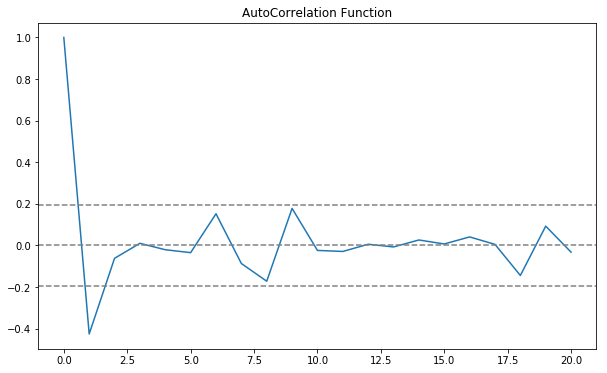

PACF Plot of
('Store1', 'Product1') 



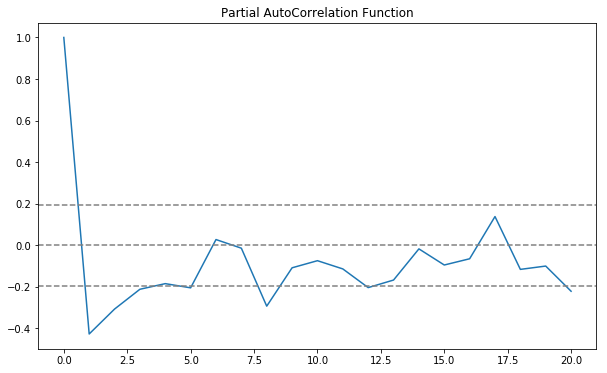

End of ACF PACF plots of
('Store1', 'Product1') 

Start of ACF PACF plots of
('Store1', 'Product10') 



ACF Plot of
('Store1', 'Product10') 



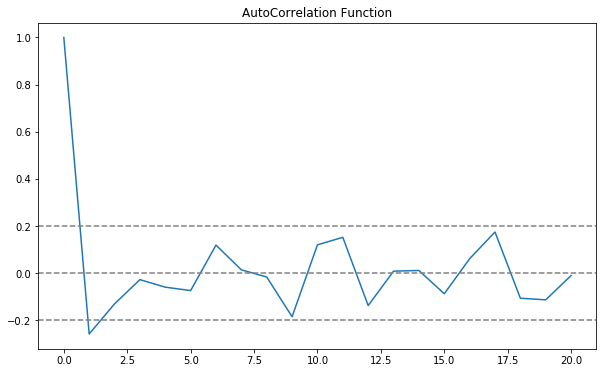

PACF Plot of
('Store1', 'Product10') 



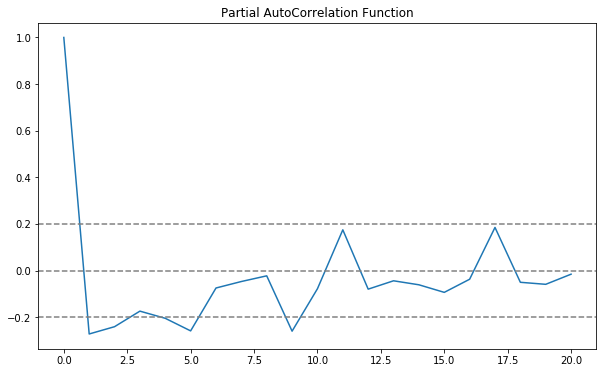

End of ACF PACF plots of
('Store1', 'Product10') 

Start of ACF PACF plots of
('Store1', 'Product100') 



ACF Plot of
('Store1', 'Product100') 



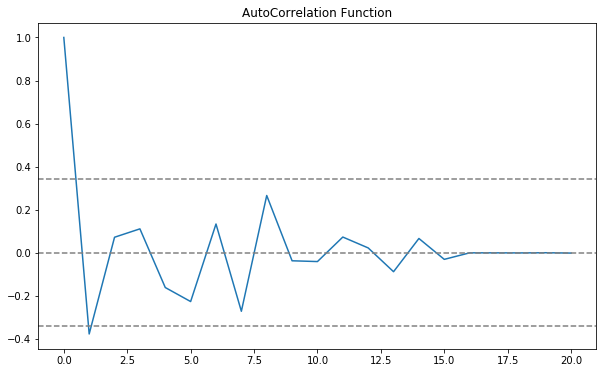

PACF Plot of
('Store1', 'Product100') 



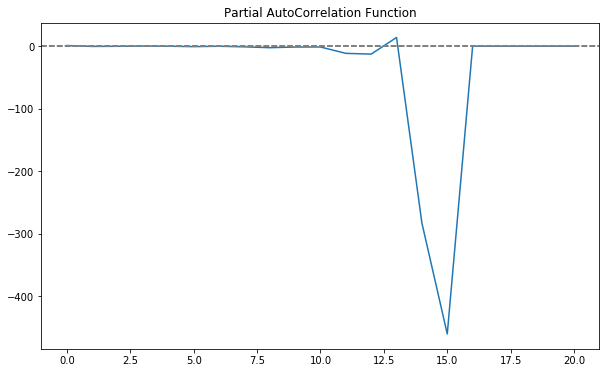

End of ACF PACF plots of
('Store1', 'Product100') 

Start of ACF PACF plots of
('Store1', 'Product101') 



ACF Plot of
('Store1', 'Product101') 



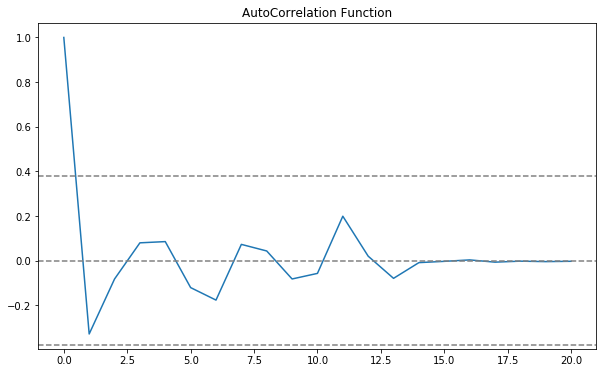

PACF Plot of
('Store1', 'Product101') 



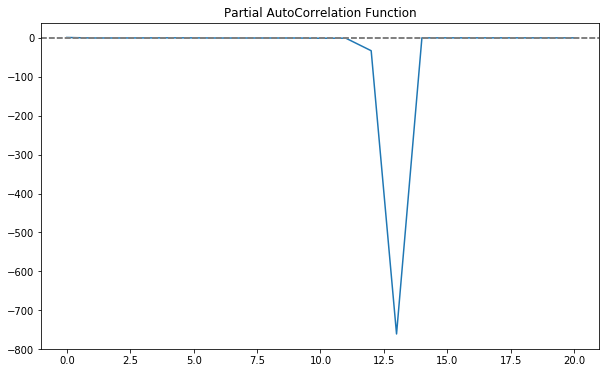

End of ACF PACF plots of
('Store1', 'Product101') 

Start of ACF PACF plots of
('Store1', 'Product102') 



ACF Plot of
('Store1', 'Product102') 



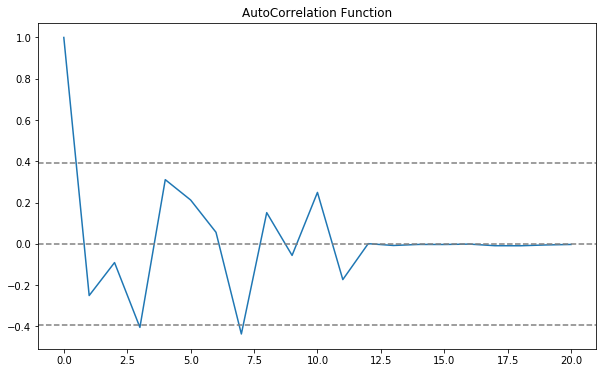

PACF Plot of
('Store1', 'Product102') 



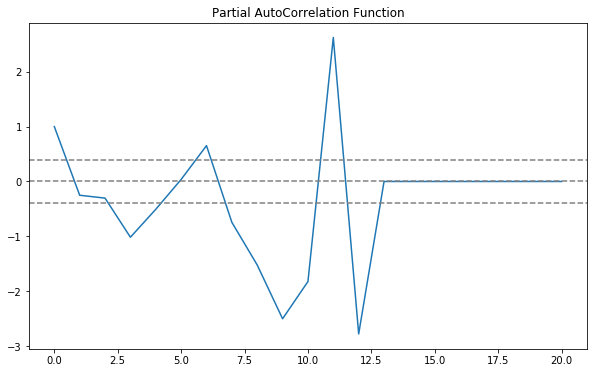

End of ACF PACF plots of
('Store1', 'Product102') 

Start of ACF PACF plots of
('Store1', 'Product103') 



ACF Plot of
('Store1', 'Product103') 



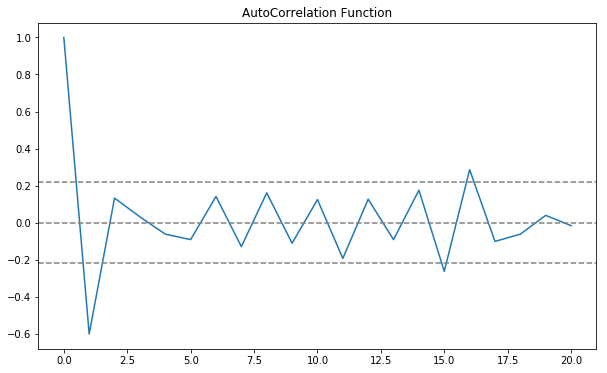

PACF Plot of
('Store1', 'Product103') 



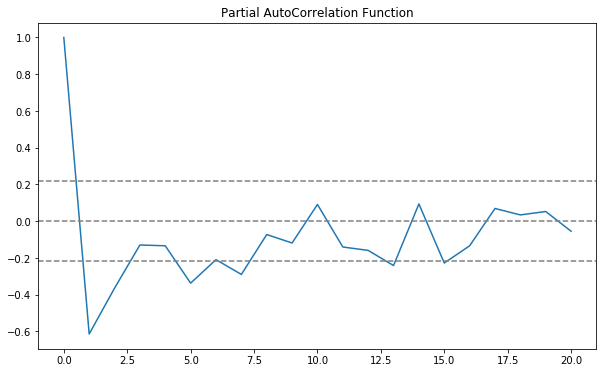

End of ACF PACF plots of
('Store1', 'Product103') 

Start of ACF PACF plots of
('Store1', 'Product104') 



ACF Plot of
('Store1', 'Product104') 



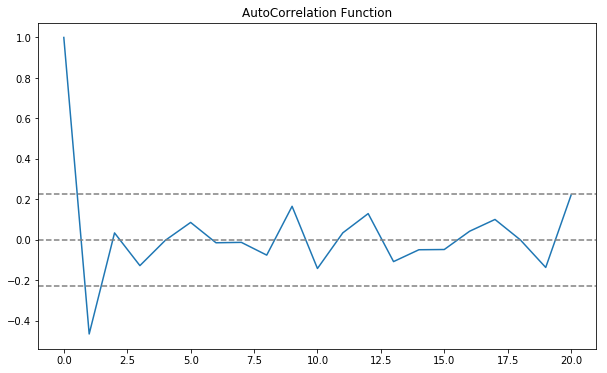

PACF Plot of
('Store1', 'Product104') 



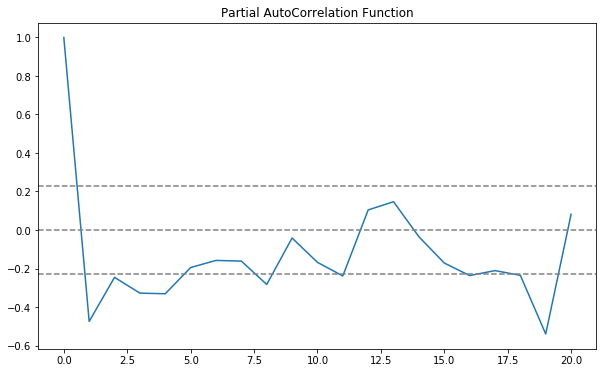

End of ACF PACF plots of
('Store1', 'Product104') 

Start of ACF PACF plots of
('Store1', 'Product105') 



ACF Plot of
('Store1', 'Product105') 



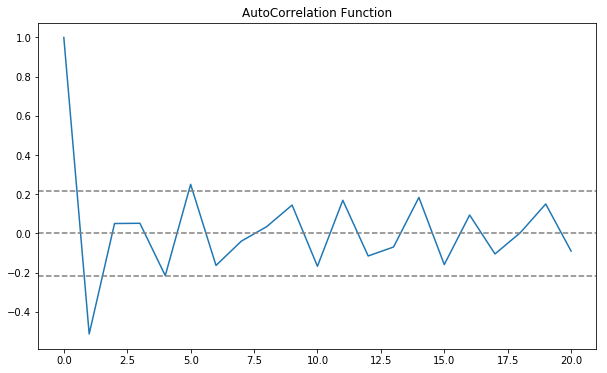

PACF Plot of
('Store1', 'Product105') 



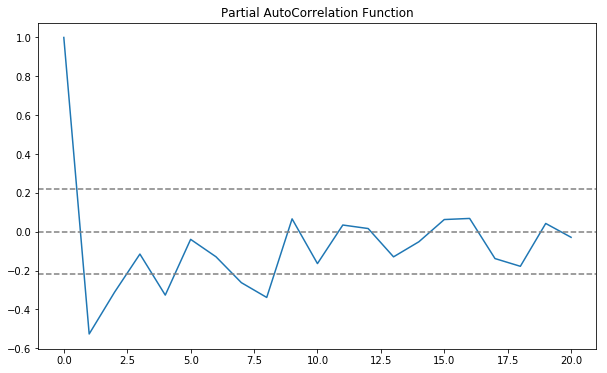

End of ACF PACF plots of
('Store1', 'Product105') 

Start of ACF PACF plots of
('Store1', 'Product106') 



ACF Plot of
('Store1', 'Product106') 



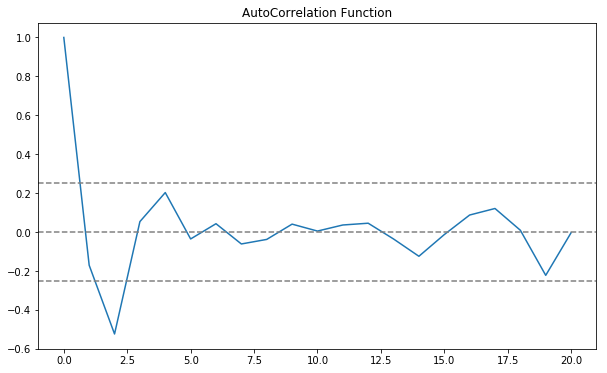

PACF Plot of
('Store1', 'Product106') 



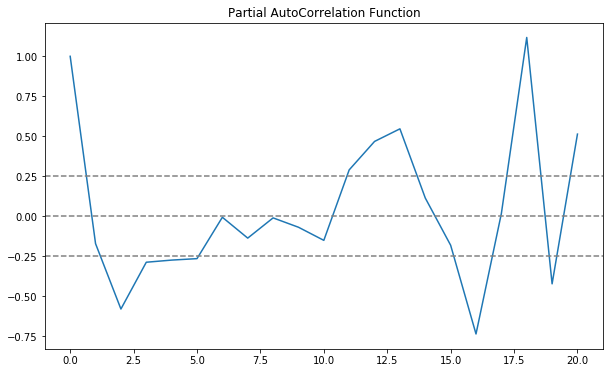

End of ACF PACF plots of
('Store1', 'Product106') 

Start of ACF PACF plots of
('Store1', 'Product107') 



ACF Plot of
('Store1', 'Product107') 



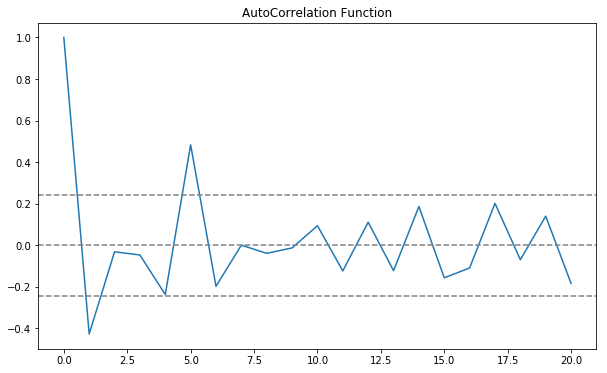

PACF Plot of
('Store1', 'Product107') 



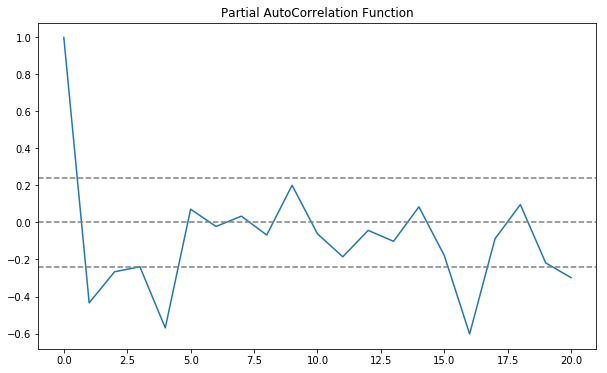

End of ACF PACF plots of
('Store1', 'Product107') 

Start of ACF PACF plots of
('Store1', 'Product108') 



ACF Plot of
('Store1', 'Product108') 



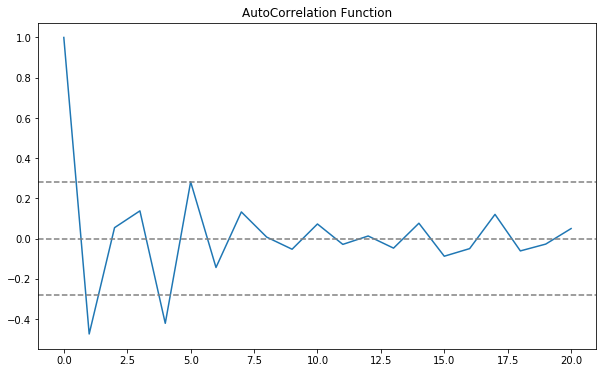

PACF Plot of
('Store1', 'Product108') 



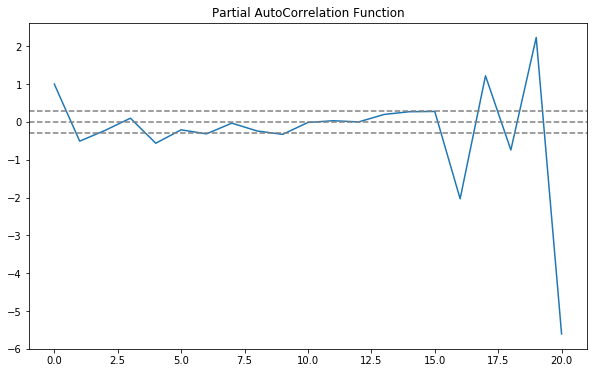

End of ACF PACF plots of
('Store1', 'Product108') 

Start of ACF PACF plots of
('Store1', 'Product109') 



ACF Plot of
('Store1', 'Product109') 



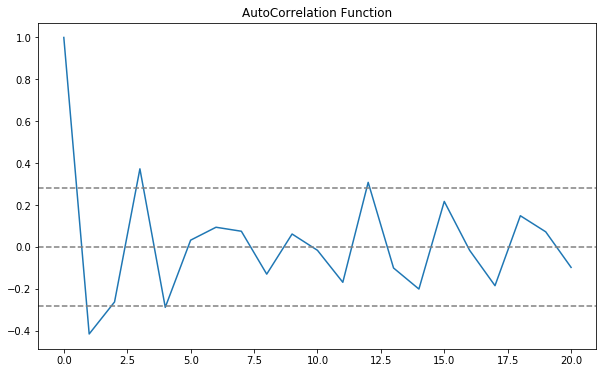

PACF Plot of
('Store1', 'Product109') 



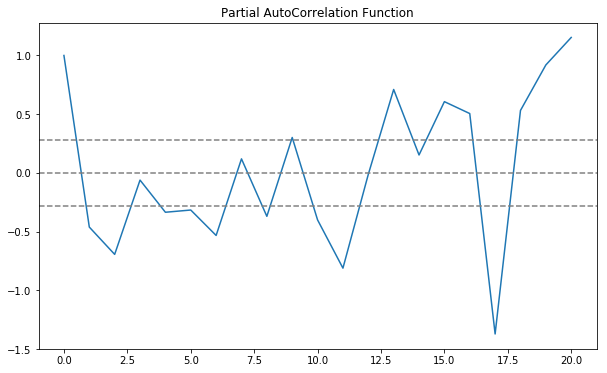

End of ACF PACF plots of
('Store1', 'Product109') 

Start of ACF PACF plots of
('Store1', 'Product11') 



ACF Plot of
('Store1', 'Product11') 



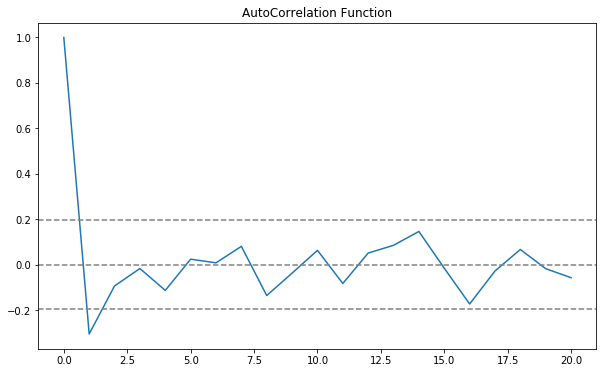

PACF Plot of
('Store1', 'Product11') 



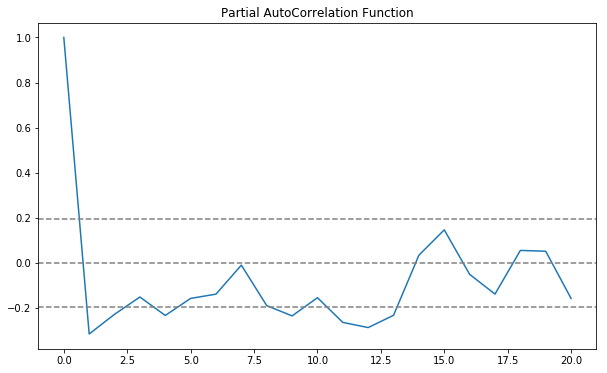

End of ACF PACF plots of
('Store1', 'Product11') 

Start of ACF PACF plots of
('Store1', 'Product110') 



Error in ACF PACF Plots
End of ACF PACF plots of
('Store1', 'Product110') 

Start of ACF PACF plots of
('Store1', 'Product111') 



ACF Plot of
('Store1', 'Product111') 



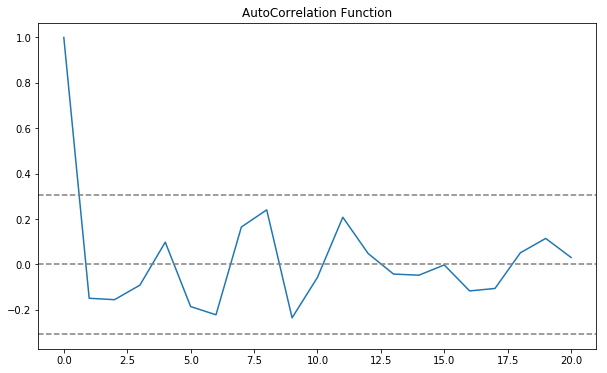

PACF Plot of
('Store1', 'Product111') 



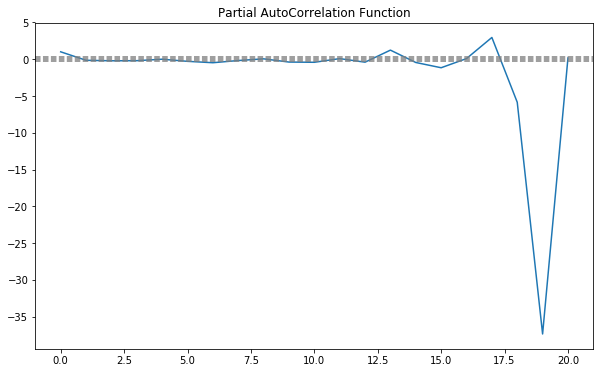

End of ACF PACF plots of
('Store1', 'Product111') 

Start of ACF PACF plots of
('Store1', 'Product112') 



Error in ACF PACF Plots
End of ACF PACF plots of
('Store1', 'Product112') 

Start of ACF PACF plots of
('Store1', 'Product113') 



ACF Plot of
('Store1', 'Product113') 



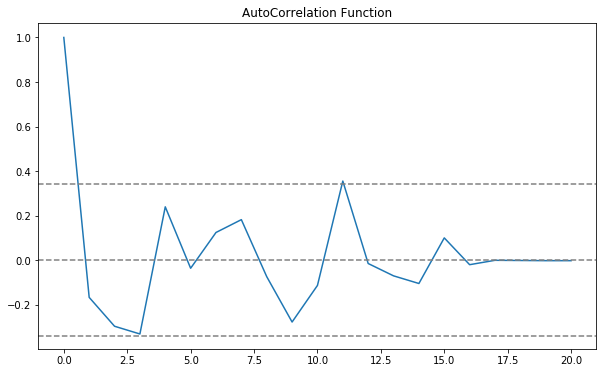

PACF Plot of
('Store1', 'Product113') 



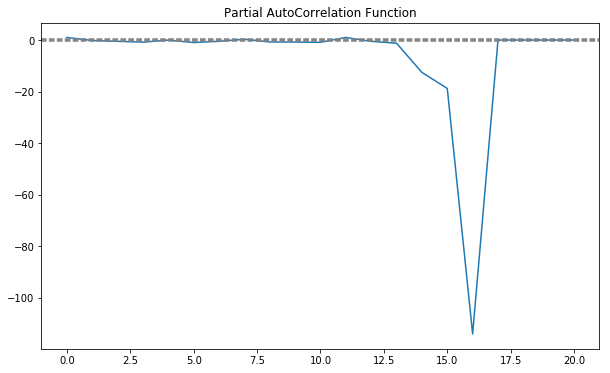

End of ACF PACF plots of
('Store1', 'Product113') 

Start of ACF PACF plots of
('Store1', 'Product114') 



ACF Plot of
('Store1', 'Product114') 



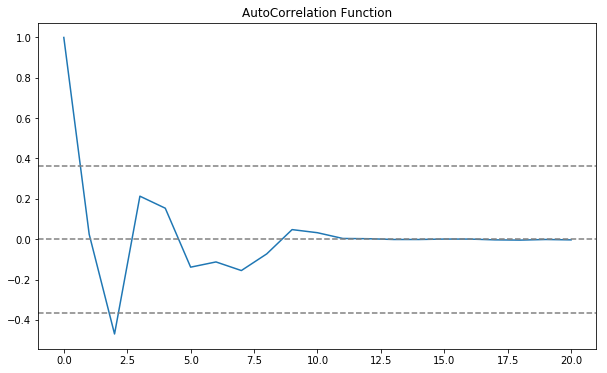

PACF Plot of
('Store1', 'Product114') 



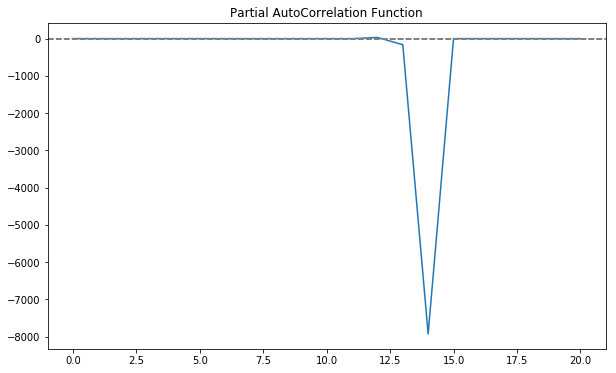

End of ACF PACF plots of
('Store1', 'Product114') 

Start of ACF PACF plots of
('Store1', 'Product115') 



ACF Plot of
('Store1', 'Product115') 



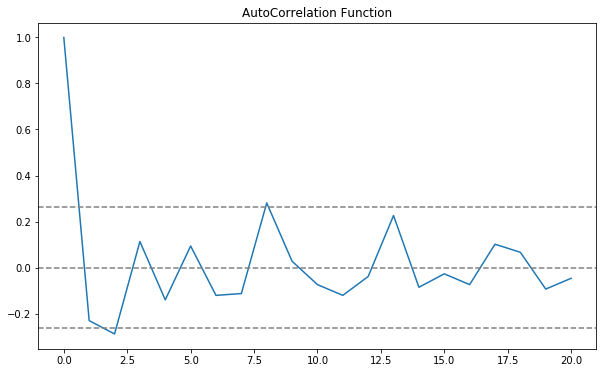

PACF Plot of
('Store1', 'Product115') 



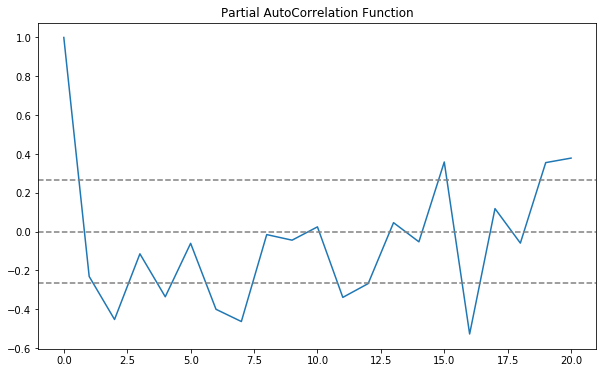

End of ACF PACF plots of
('Store1', 'Product115') 

Start of ACF PACF plots of
('Store1', 'Product116') 



ACF Plot of
('Store1', 'Product116') 



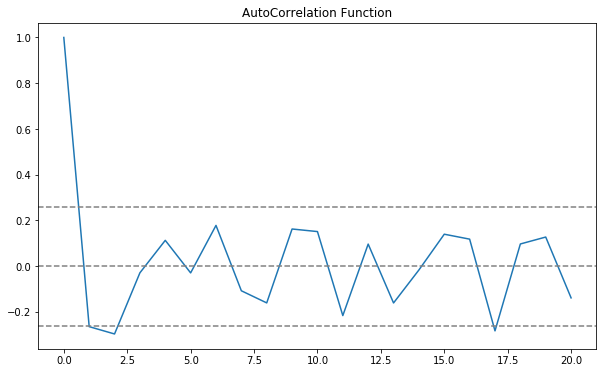

PACF Plot of
('Store1', 'Product116') 



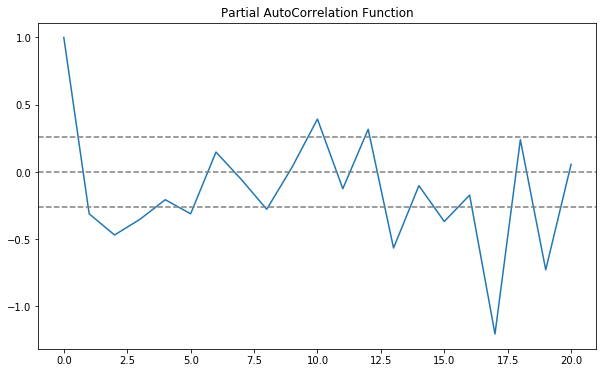

End of ACF PACF plots of
('Store1', 'Product116') 

Start of ACF PACF plots of
('Store1', 'Product117') 



ACF Plot of
('Store1', 'Product117') 



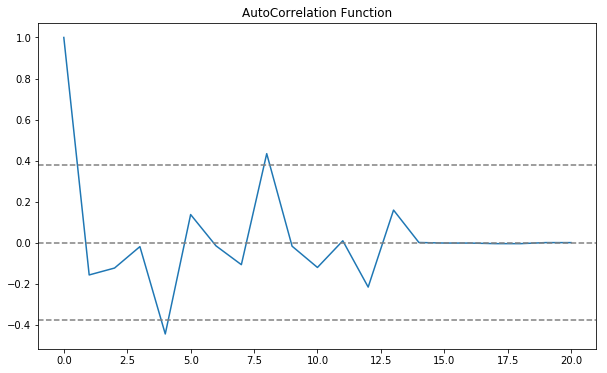

PACF Plot of
('Store1', 'Product117') 



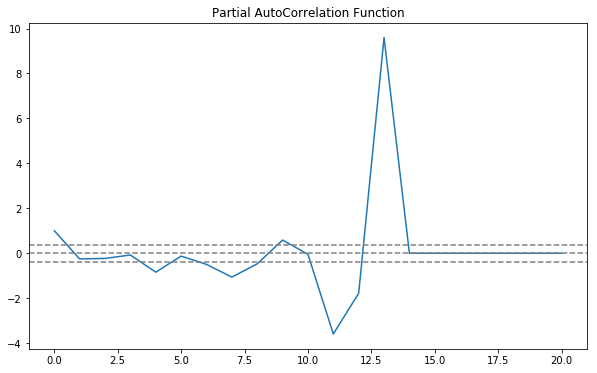

End of ACF PACF plots of
('Store1', 'Product117') 

Start of ACF PACF plots of
('Store1', 'Product118') 



ACF Plot of
('Store1', 'Product118') 



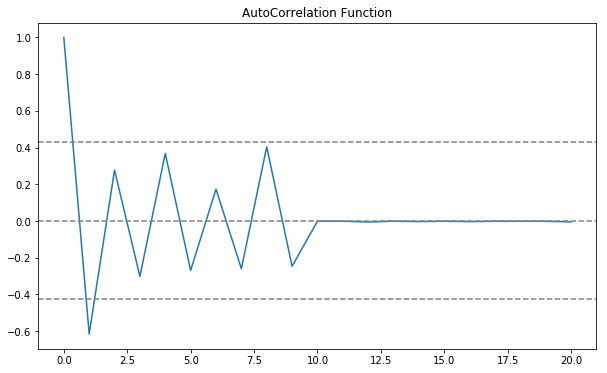

PACF Plot of
('Store1', 'Product118') 



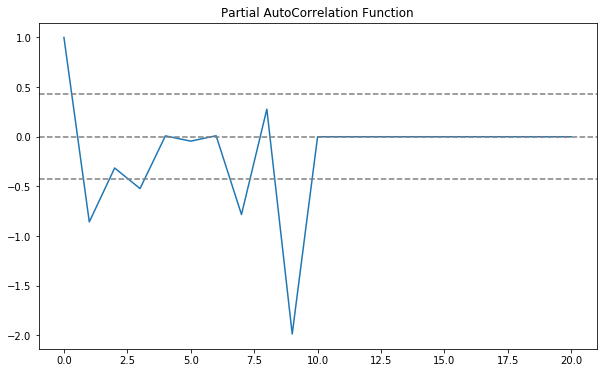

End of ACF PACF plots of
('Store1', 'Product118') 

Start of ACF PACF plots of
('Store1', 'Product119') 



ACF Plot of
('Store1', 'Product119') 



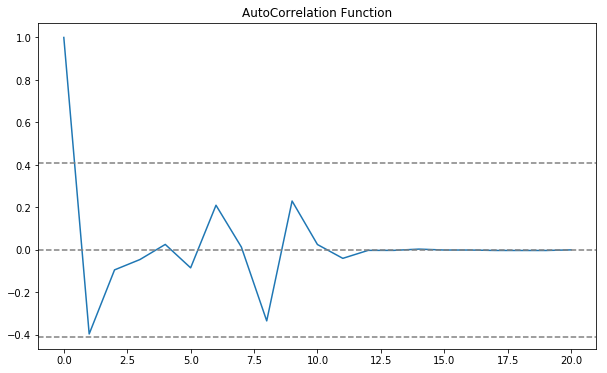

PACF Plot of
('Store1', 'Product119') 



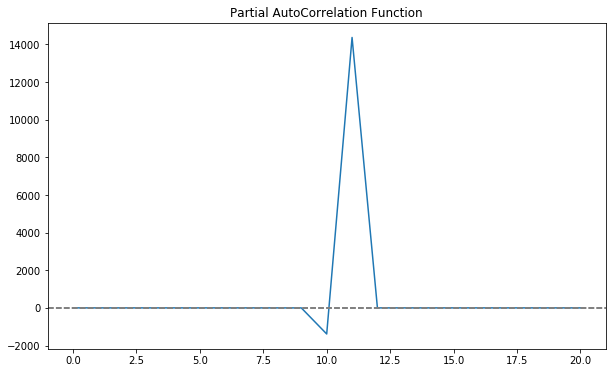

End of ACF PACF plots of
('Store1', 'Product119') 

Start of ACF PACF plots of
('Store1', 'Product12') 



ACF Plot of
('Store1', 'Product12') 



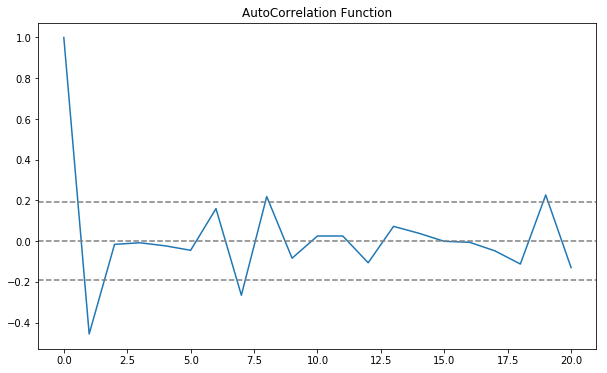

PACF Plot of
('Store1', 'Product12') 



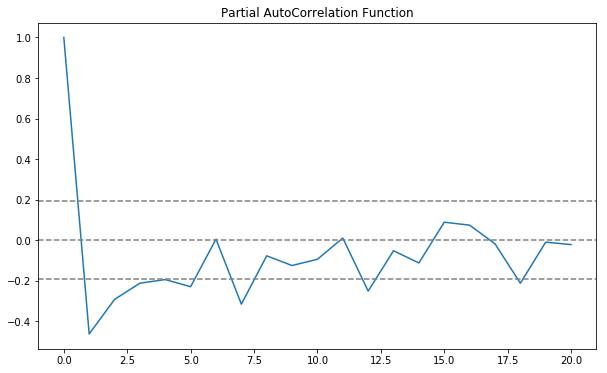

End of ACF PACF plots of
('Store1', 'Product12') 

Start of ACF PACF plots of
('Store1', 'Product121') 



ACF Plot of
('Store1', 'Product121') 



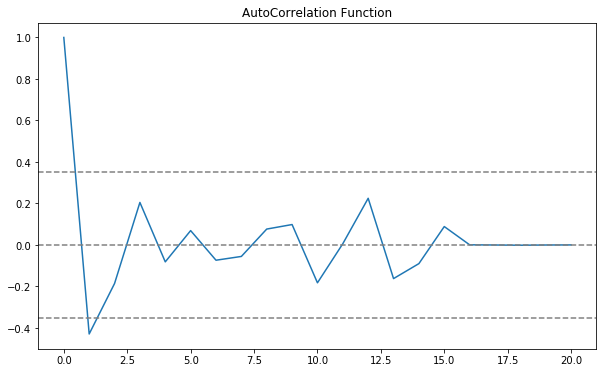

PACF Plot of
('Store1', 'Product121') 



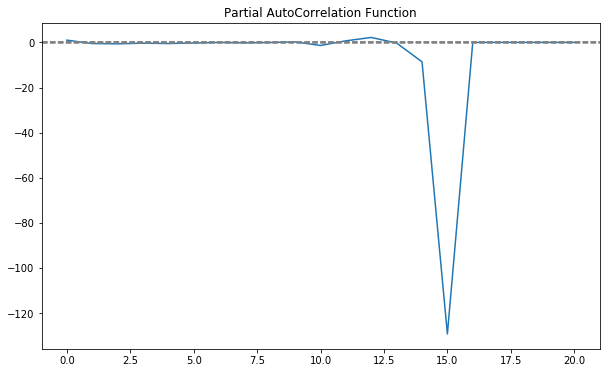

End of ACF PACF plots of
('Store1', 'Product121') 

Start of ACF PACF plots of
('Store1', 'Product122') 



ACF Plot of
('Store1', 'Product122') 



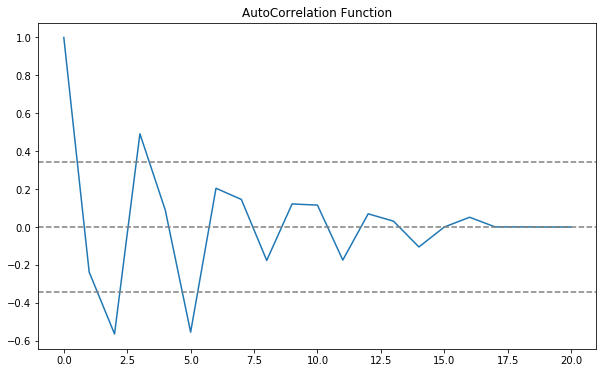

PACF Plot of
('Store1', 'Product122') 



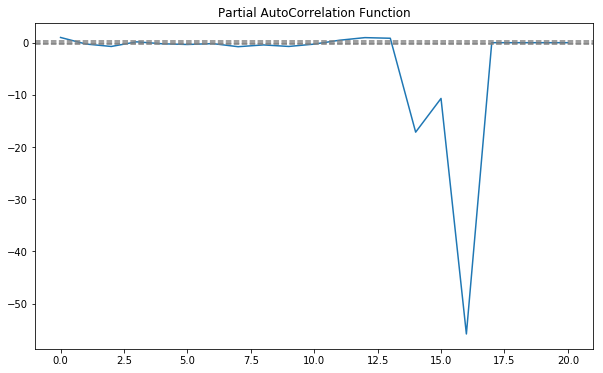

End of ACF PACF plots of
('Store1', 'Product122') 

Start of ACF PACF plots of
('Store1', 'Product123') 



ACF Plot of
('Store1', 'Product123') 



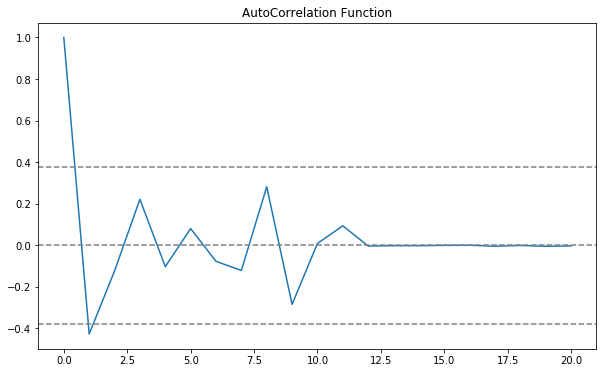

PACF Plot of
('Store1', 'Product123') 



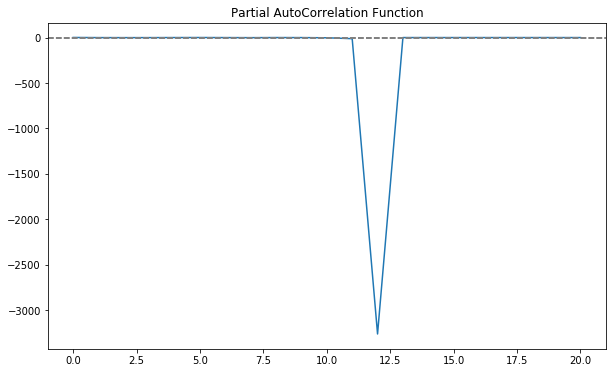

End of ACF PACF plots of
('Store1', 'Product123') 

Start of ACF PACF plots of
('Store1', 'Product124') 



ACF Plot of
('Store1', 'Product124') 



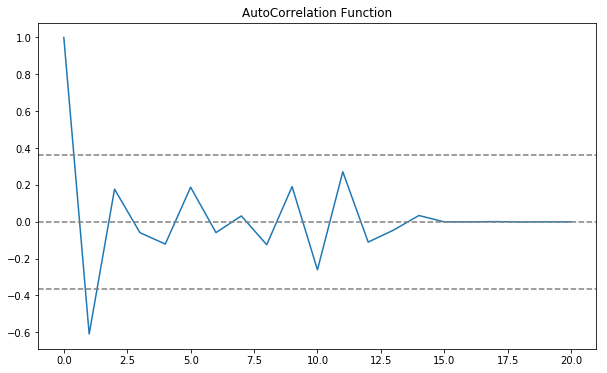

PACF Plot of
('Store1', 'Product124') 



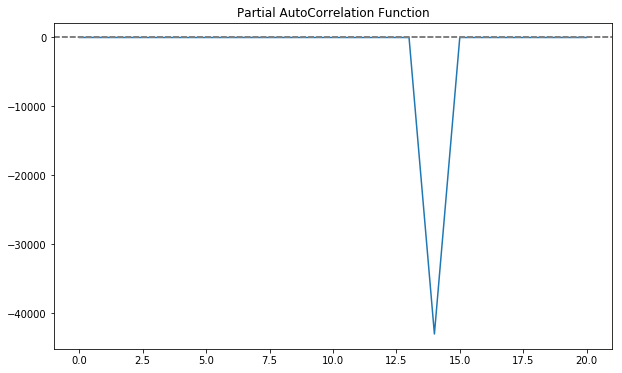

End of ACF PACF plots of
('Store1', 'Product124') 

Start of ACF PACF plots of
('Store1', 'Product125') 



ACF Plot of
('Store1', 'Product125') 



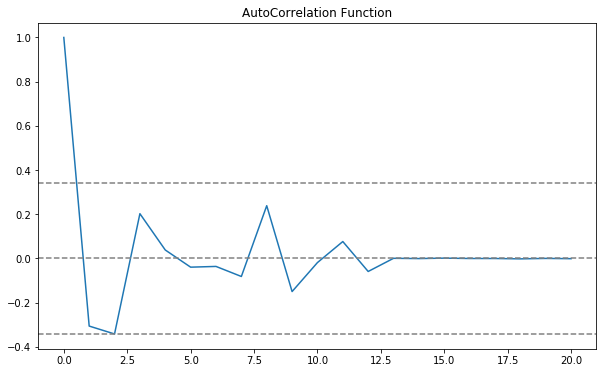

PACF Plot of
('Store1', 'Product125') 



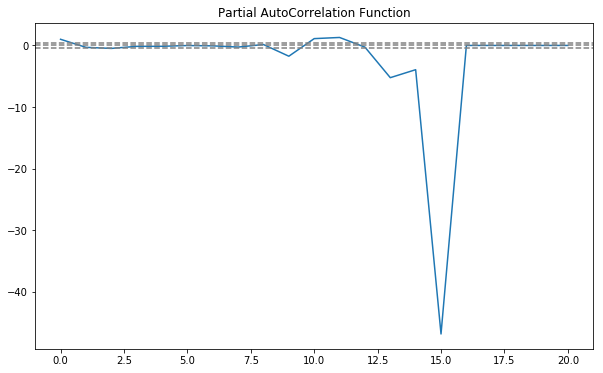

End of ACF PACF plots of
('Store1', 'Product125') 

Start of ACF PACF plots of
('Store1', 'Product126') 



ACF Plot of
('Store1', 'Product126') 



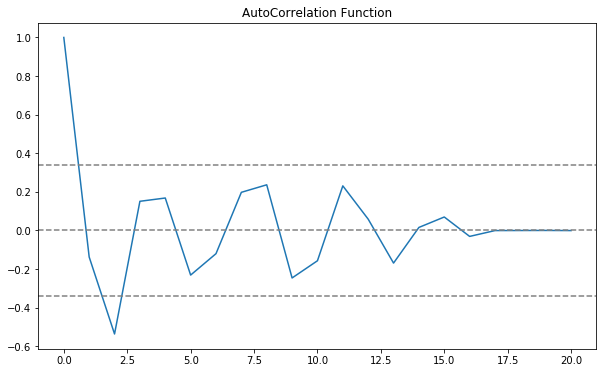

PACF Plot of
('Store1', 'Product126') 



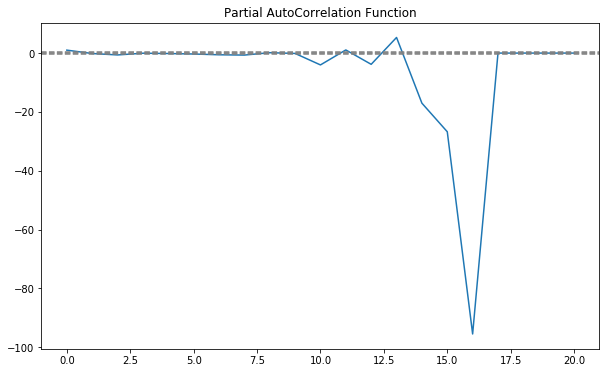

End of ACF PACF plots of
('Store1', 'Product126') 

Start of ACF PACF plots of
('Store1', 'Product127') 



Error in ACF PACF Plots
End of ACF PACF plots of
('Store1', 'Product127') 

Start of ACF PACF plots of
('Store1', 'Product128') 



Error in ACF PACF Plots
End of ACF PACF plots of
('Store1', 'Product128') 

Start of ACF PACF plots of
('Store1', 'Product129') 



ACF Plot of
('Store1', 'Product129') 



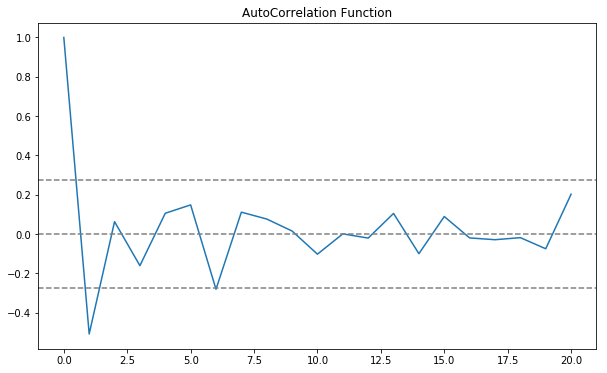

PACF Plot of
('Store1', 'Product129') 



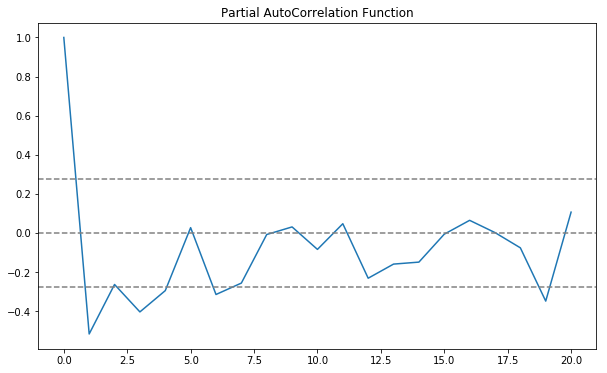

End of ACF PACF plots of
('Store1', 'Product129') 

Start of ACF PACF plots of
('Store1', 'Product13') 



ACF Plot of
('Store1', 'Product13') 



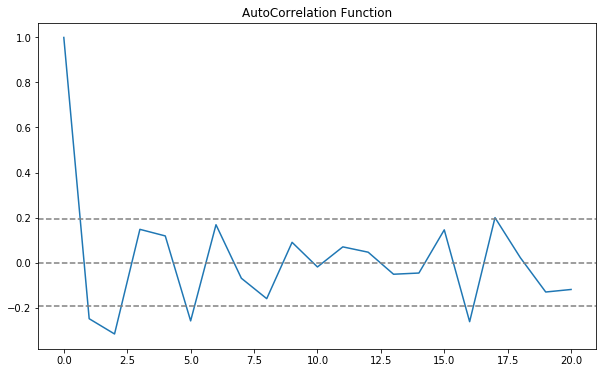

PACF Plot of
('Store1', 'Product13') 



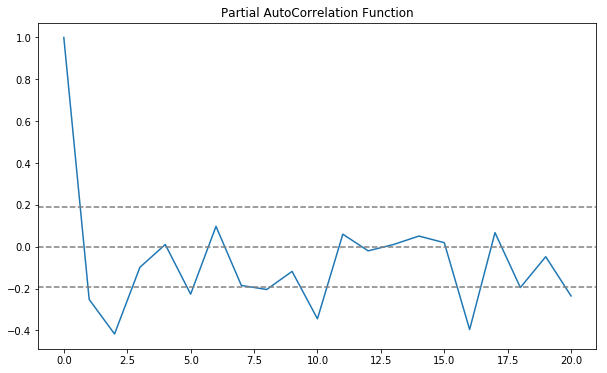

End of ACF PACF plots of
('Store1', 'Product13') 

Start of ACF PACF plots of
('Store1', 'Product130') 



ACF Plot of
('Store1', 'Product130') 



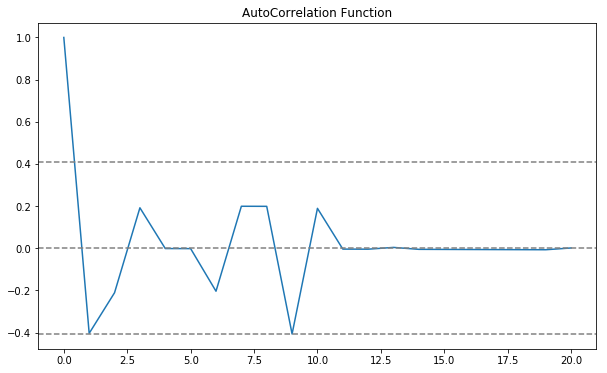

PACF Plot of
('Store1', 'Product130') 



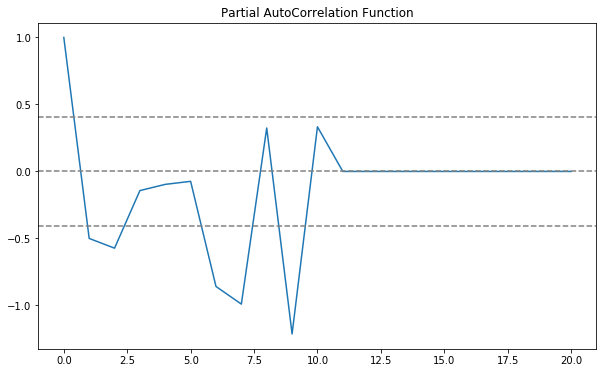

End of ACF PACF plots of
('Store1', 'Product130') 

Start of ACF PACF plots of
('Store1', 'Product131') 



ACF Plot of
('Store1', 'Product131') 



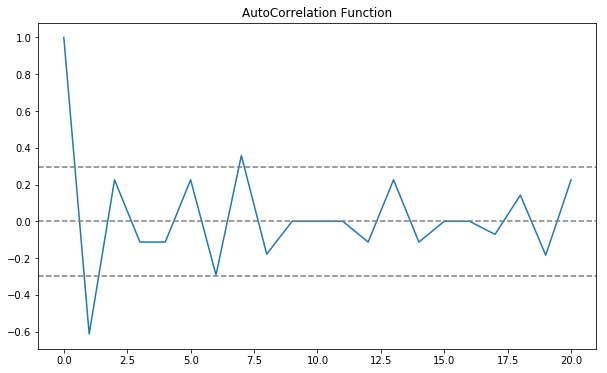

PACF Plot of
('Store1', 'Product131') 



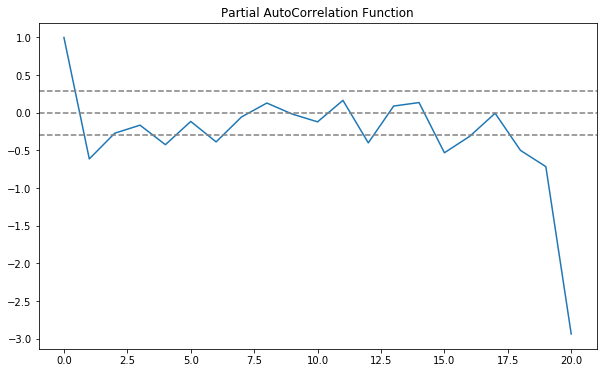

End of ACF PACF plots of
('Store1', 'Product131') 

Start of ACF PACF plots of
('Store1', 'Product132') 



Error in ACF PACF Plots
End of ACF PACF plots of
('Store1', 'Product132') 

Start of ACF PACF plots of
('Store1', 'Product133') 



Error in ACF PACF Plots
End of ACF PACF plots of
('Store1', 'Product133') 

Start of ACF PACF plots of
('Store1', 'Product134') 



ACF Plot of
('Store1', 'Product134') 



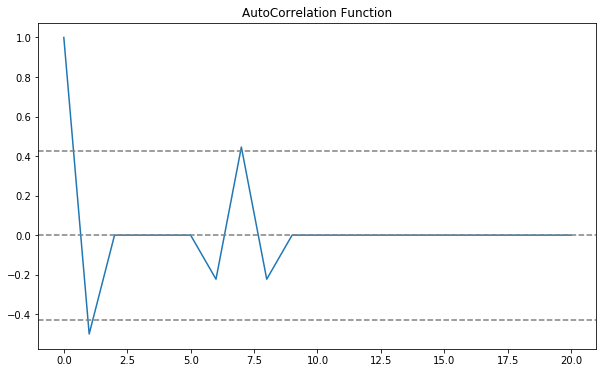

PACF Plot of
('Store1', 'Product134') 



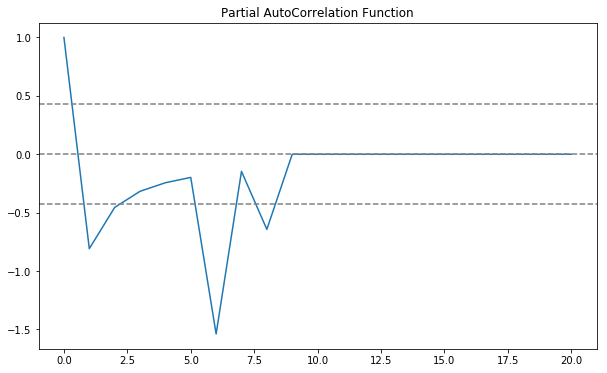

End of ACF PACF plots of
('Store1', 'Product134') 

Start of ACF PACF plots of
('Store1', 'Product136') 



Error in ACF PACF Plots
End of ACF PACF plots of
('Store1', 'Product136') 

Start of ACF PACF plots of
('Store1', 'Product137') 



Error in ACF PACF Plots
End of ACF PACF plots of
('Store1', 'Product137') 

Start of ACF PACF plots of
('Store1', 'Product138') 



ACF Plot of
('Store1', 'Product138') 



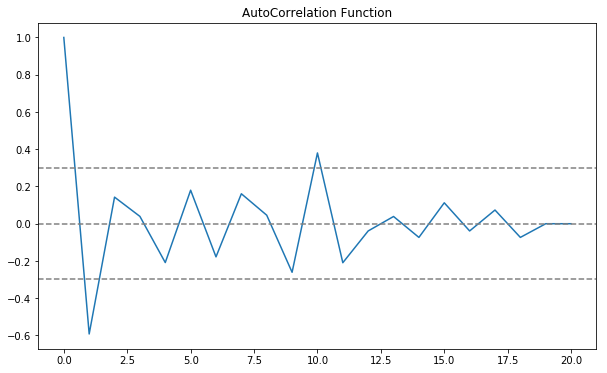

PACF Plot of
('Store1', 'Product138') 



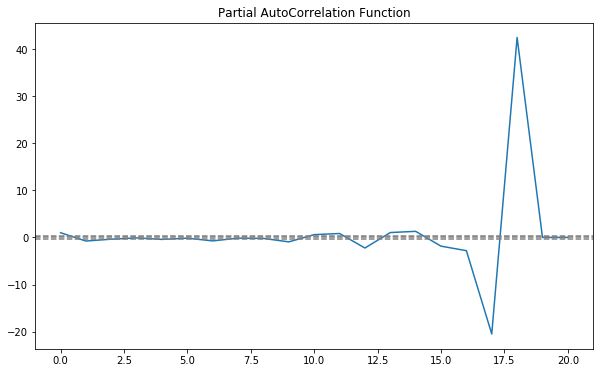

End of ACF PACF plots of
('Store1', 'Product138') 

Start of ACF PACF plots of
('Store1', 'Product139') 



Error in ACF PACF Plots
End of ACF PACF plots of
('Store1', 'Product139') 

Start of ACF PACF plots of
('Store1', 'Product14') 



ACF Plot of
('Store1', 'Product14') 



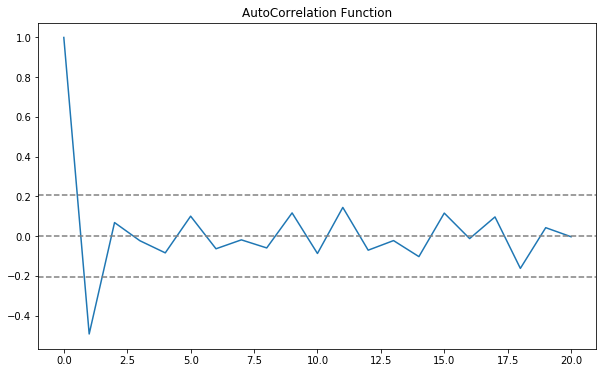

PACF Plot of
('Store1', 'Product14') 



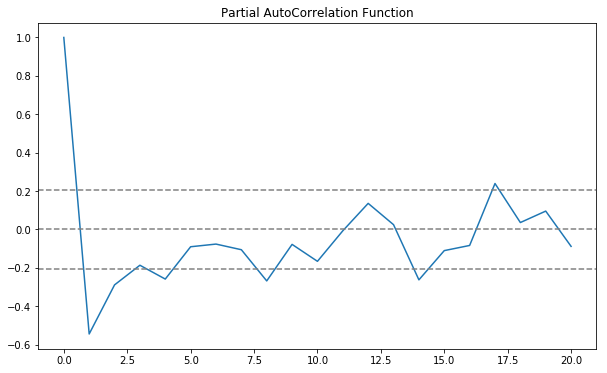

End of ACF PACF plots of
('Store1', 'Product14') 

Start of ACF PACF plots of
('Store1', 'Product140') 



Error in ACF PACF Plots
End of ACF PACF plots of
('Store1', 'Product140') 

Start of ACF PACF plots of
('Store1', 'Product141') 



Error in ACF PACF Plots
End of ACF PACF plots of
('Store1', 'Product141') 

Start of ACF PACF plots of
('Store1', 'Product142') 



Error in ACF PACF Plots
End of ACF PACF plots of
('Store1', 'Product142') 

Start of ACF PACF plots of
('Store1', 'Product143') 



ACF Plot of
('Store1', 'Product143') 



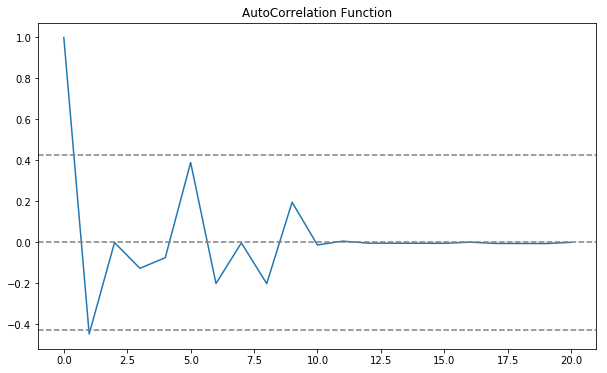

PACF Plot of
('Store1', 'Product143') 



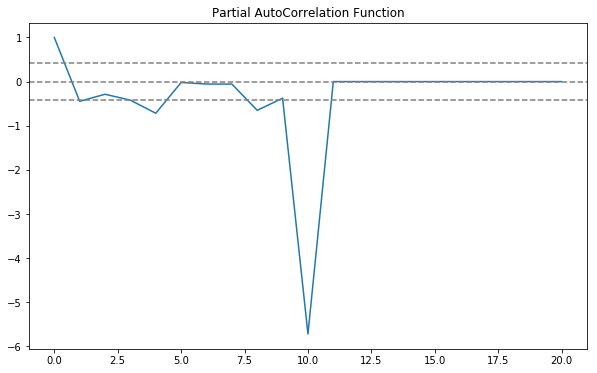

End of ACF PACF plots of
('Store1', 'Product143') 

Start of ACF PACF plots of
('Store1', 'Product144') 



Error in ACF PACF Plots
End of ACF PACF plots of
('Store1', 'Product144') 

Start of ACF PACF plots of
('Store1', 'Product145') 



Error in ACF PACF Plots
End of ACF PACF plots of
('Store1', 'Product145') 

Start of ACF PACF plots of
('Store1', 'Product146') 



ACF Plot of
('Store1', 'Product146') 



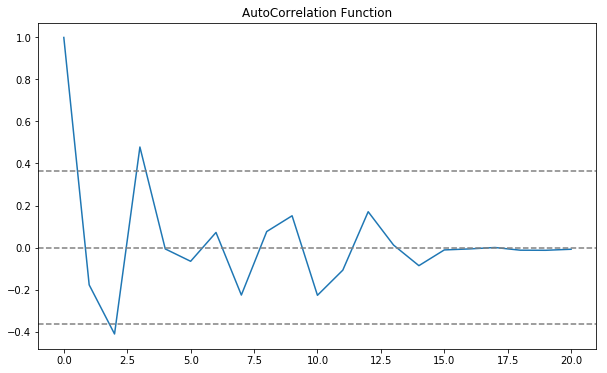

PACF Plot of
('Store1', 'Product146') 



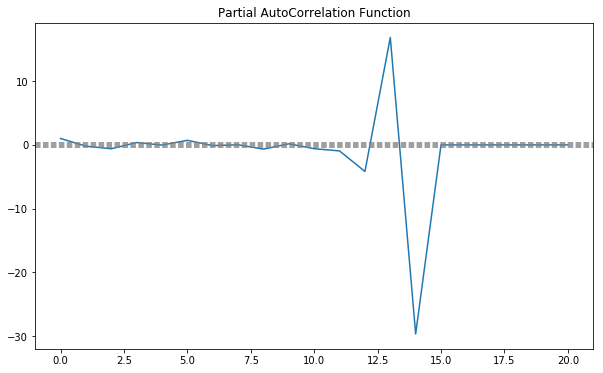

End of ACF PACF plots of
('Store1', 'Product146') 

Start of ACF PACF plots of
('Store1', 'Product147') 



Error in ACF PACF Plots
End of ACF PACF plots of
('Store1', 'Product147') 

Start of ACF PACF plots of
('Store1', 'Product148') 



Error in ACF PACF Plots
End of ACF PACF plots of
('Store1', 'Product148') 

Start of ACF PACF plots of
('Store1', 'Product149') 



ACF Plot of
('Store1', 'Product149') 



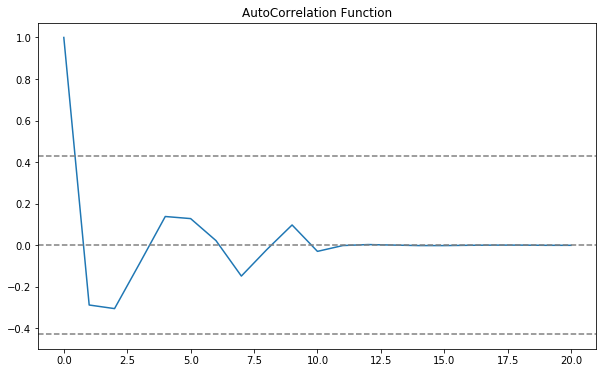

PACF Plot of
('Store1', 'Product149') 



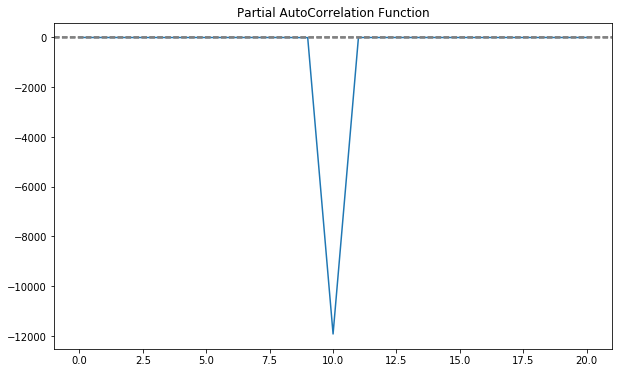

End of ACF PACF plots of
('Store1', 'Product149') 

Start of ACF PACF plots of
('Store1', 'Product15') 



ACF Plot of
('Store1', 'Product15') 



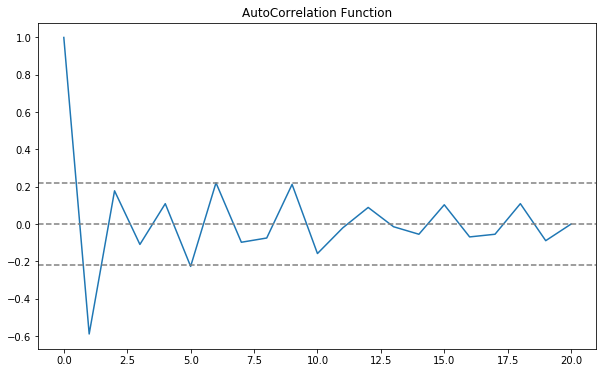

PACF Plot of
('Store1', 'Product15') 



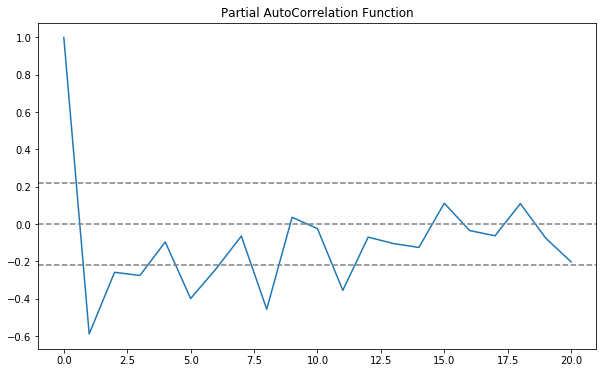

End of ACF PACF plots of
('Store1', 'Product15') 

Start of ACF PACF plots of
('Store1', 'Product150') 



Error in ACF PACF Plots
End of ACF PACF plots of
('Store1', 'Product150') 

Start of ACF PACF plots of
('Store1', 'Product151') 



Error in ACF PACF Plots
End of ACF PACF plots of
('Store1', 'Product151') 

Start of ACF PACF plots of
('Store1', 'Product152') 



ACF Plot of
('Store1', 'Product152') 



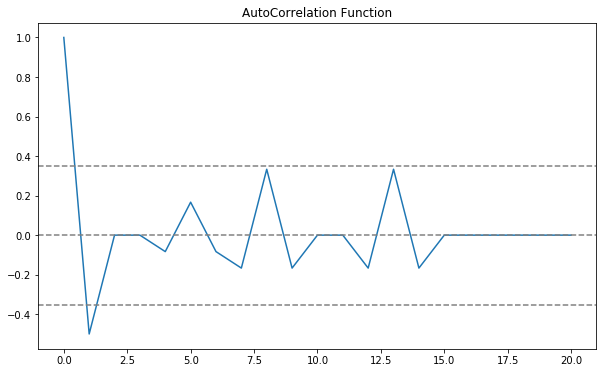

PACF Plot of
('Store1', 'Product152') 



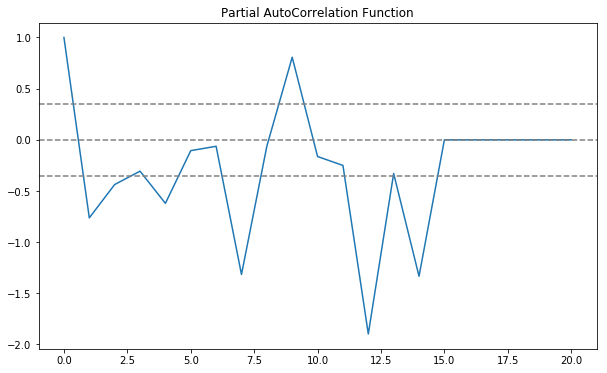

End of ACF PACF plots of
('Store1', 'Product152') 

Start of ACF PACF plots of
('Store1', 'Product154') 



Error in ACF PACF Plots
End of ACF PACF plots of
('Store1', 'Product154') 

Start of ACF PACF plots of
('Store1', 'Product155') 



Error in ACF PACF Plots
End of ACF PACF plots of
('Store1', 'Product155') 

Start of ACF PACF plots of
('Store1', 'Product156') 



Error in ACF PACF Plots
End of ACF PACF plots of
('Store1', 'Product156') 

Start of ACF PACF plots of
('Store1', 'Product157') 



Error in ACF PACF Plots
End of ACF PACF plots of
('Store1', 'Product157') 

Start of ACF PACF plots of
('Store1', 'Product158') 



Error in ACF PACF Plots
End of ACF PACF plots of
('Store1', 'Product158') 

Start of ACF PACF plots of
('Store1', 'Product159') 



Error in ACF PACF Plots
End of ACF PACF plots of
('Store1', 'Product159') 

Start of ACF PACF plots of
('Store1', 'Product16') 



ACF Plot of
('Store1', 'Product16') 



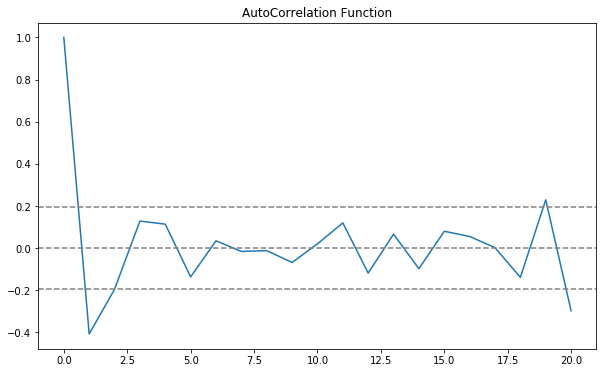

PACF Plot of
('Store1', 'Product16') 



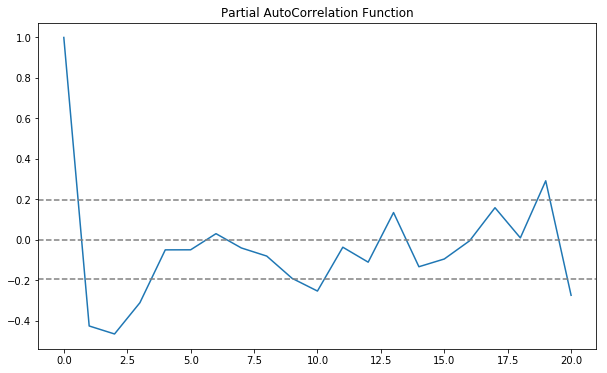

End of ACF PACF plots of
('Store1', 'Product16') 

Start of ACF PACF plots of
('Store1', 'Product160') 



Error in ACF PACF Plots
End of ACF PACF plots of
('Store1', 'Product160') 

Start of ACF PACF plots of
('Store1', 'Product161') 



ACF Plot of
('Store1', 'Product161') 



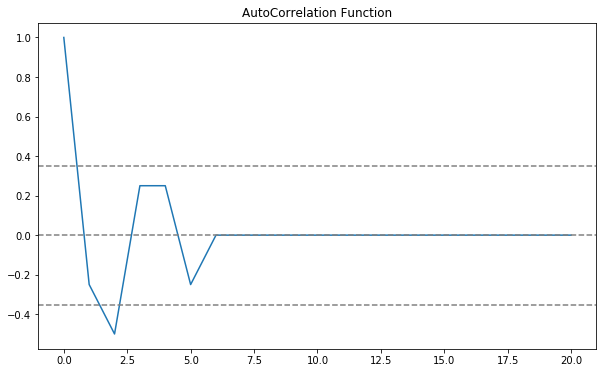

PACF Plot of
('Store1', 'Product161') 



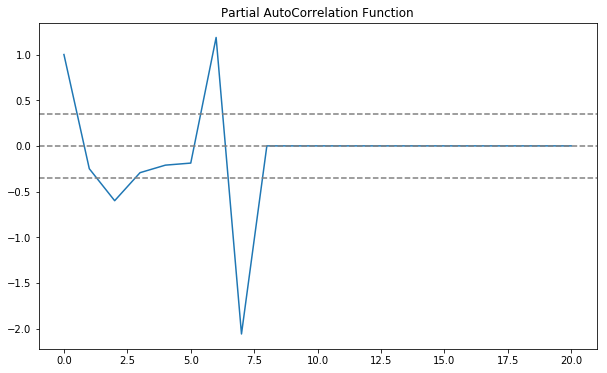

End of ACF PACF plots of
('Store1', 'Product161') 

Start of ACF PACF plots of
('Store1', 'Product162') 



Error in ACF PACF Plots
End of ACF PACF plots of
('Store1', 'Product162') 

Start of ACF PACF plots of
('Store1', 'Product164') 



Error in ACF PACF Plots
End of ACF PACF plots of
('Store1', 'Product164') 

Start of ACF PACF plots of
('Store1', 'Product165') 



Error in ACF PACF Plots
End of ACF PACF plots of
('Store1', 'Product165') 

Start of ACF PACF plots of
('Store1', 'Product167') 



Error in ACF PACF Plots
End of ACF PACF plots of
('Store1', 'Product167') 

Start of ACF PACF plots of
('Store1', 'Product17') 



ACF Plot of
('Store1', 'Product17') 



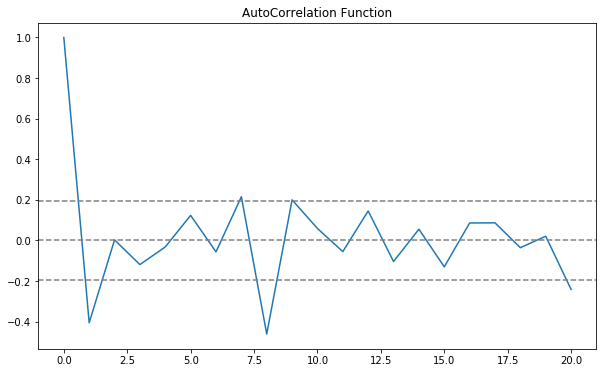

PACF Plot of
('Store1', 'Product17') 



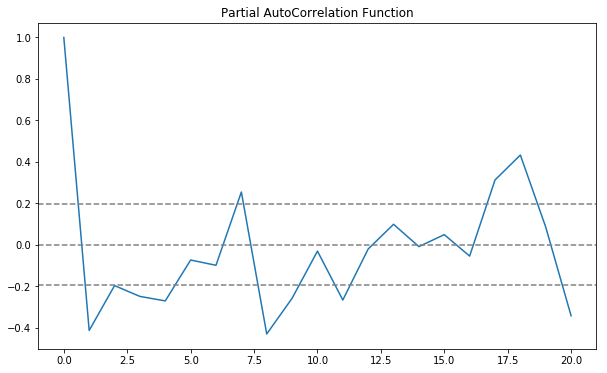

End of ACF PACF plots of
('Store1', 'Product17') 

Start of ACF PACF plots of
('Store1', 'Product170') 



Error in ACF PACF Plots
End of ACF PACF plots of
('Store1', 'Product170') 

Start of ACF PACF plots of
('Store1', 'Product173') 



Error in ACF PACF Plots
End of ACF PACF plots of
('Store1', 'Product173') 

Start of ACF PACF plots of
('Store1', 'Product177') 



Error in ACF PACF Plots
End of ACF PACF plots of
('Store1', 'Product177') 

Start of ACF PACF plots of
('Store1', 'Product18') 



ACF Plot of
('Store1', 'Product18') 



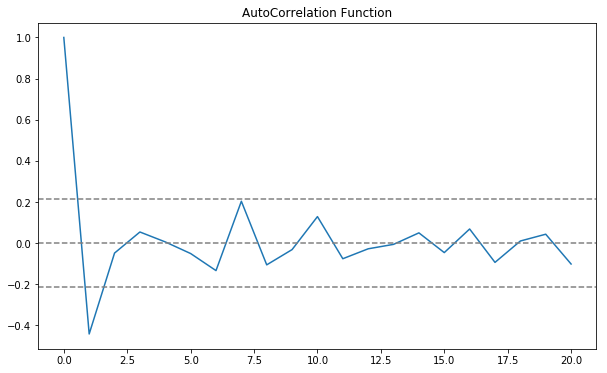

PACF Plot of
('Store1', 'Product18') 



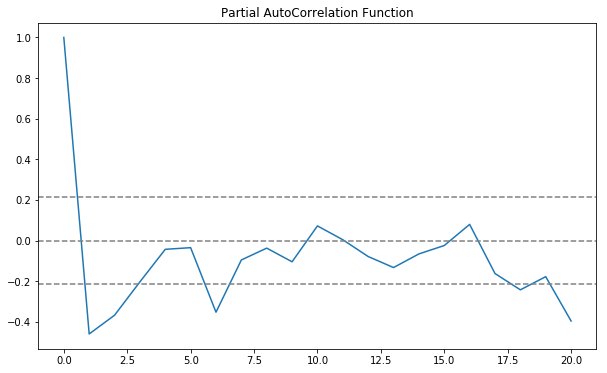

End of ACF PACF plots of
('Store1', 'Product18') 

Start of ACF PACF plots of
('Store1', 'Product19') 



ACF Plot of
('Store1', 'Product19') 



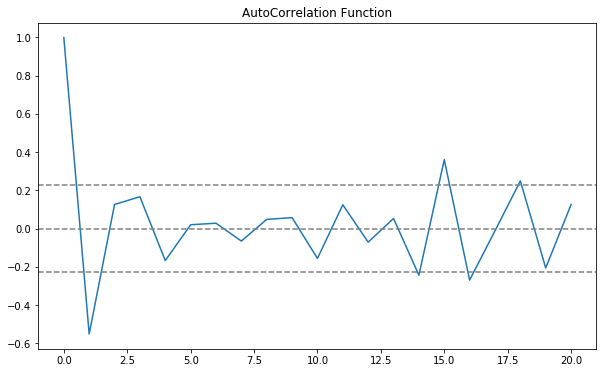

PACF Plot of
('Store1', 'Product19') 



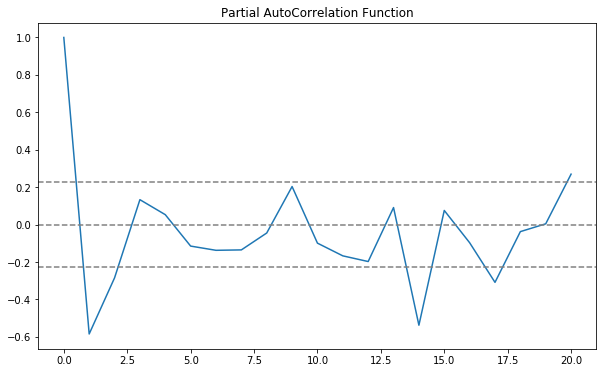

End of ACF PACF plots of
('Store1', 'Product19') 

Start of ACF PACF plots of
('Store1', 'Product2') 



ACF Plot of
('Store1', 'Product2') 



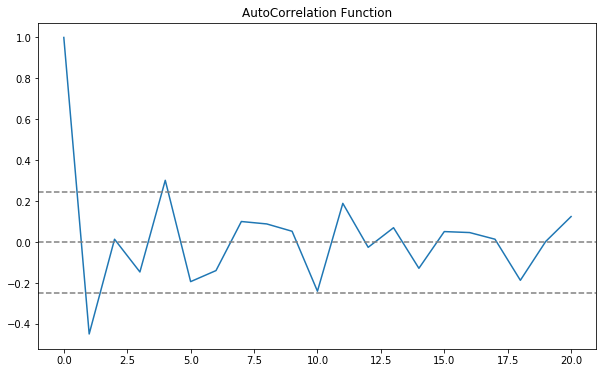

PACF Plot of
('Store1', 'Product2') 



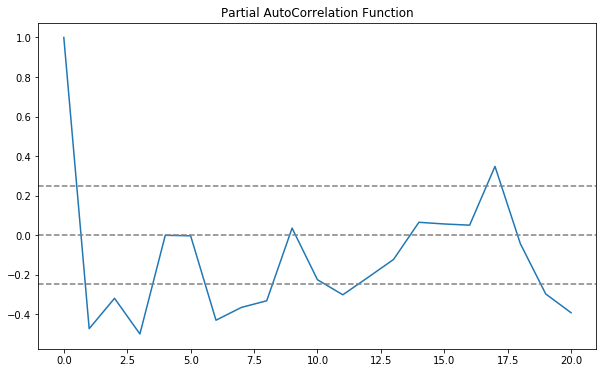

End of ACF PACF plots of
('Store1', 'Product2') 

Start of ACF PACF plots of
('Store1', 'Product20') 



ACF Plot of
('Store1', 'Product20') 



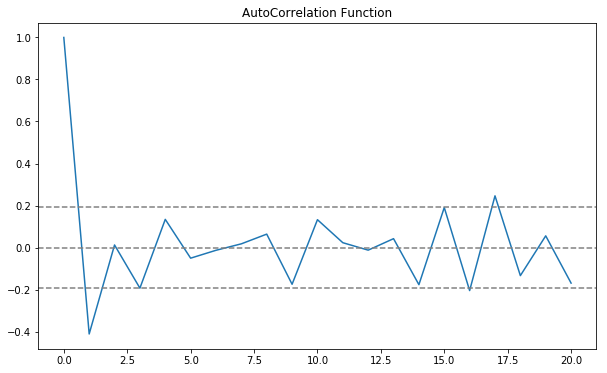

PACF Plot of
('Store1', 'Product20') 



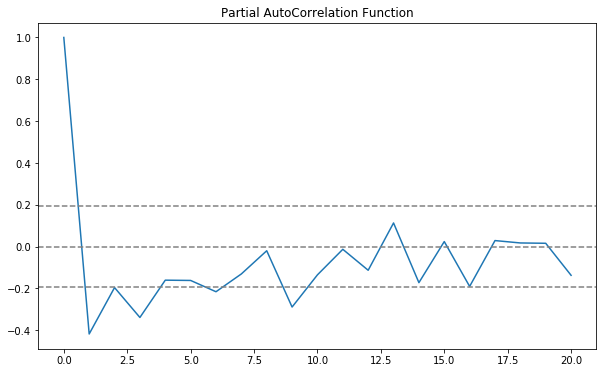

End of ACF PACF plots of
('Store1', 'Product20') 

Start of ACF PACF plots of
('Store1', 'Product21') 



ACF Plot of
('Store1', 'Product21') 



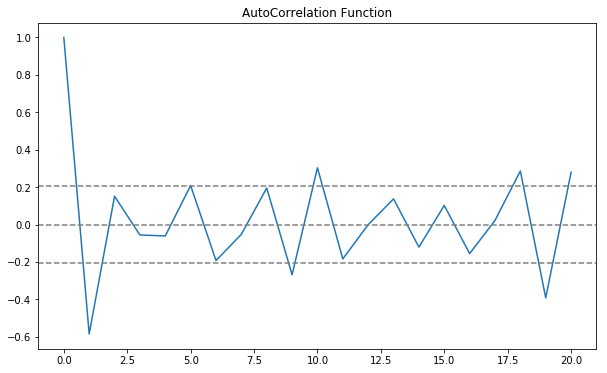

PACF Plot of
('Store1', 'Product21') 



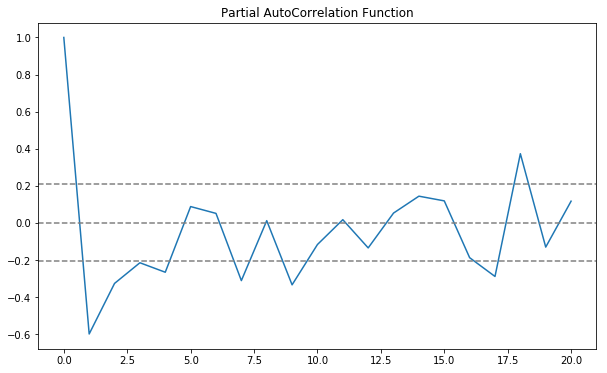

End of ACF PACF plots of
('Store1', 'Product21') 

Start of ACF PACF plots of
('Store1', 'Product22') 



Error in ACF PACF Plots
End of ACF PACF plots of
('Store1', 'Product22') 

Start of ACF PACF plots of
('Store1', 'Product23') 



ACF Plot of
('Store1', 'Product23') 



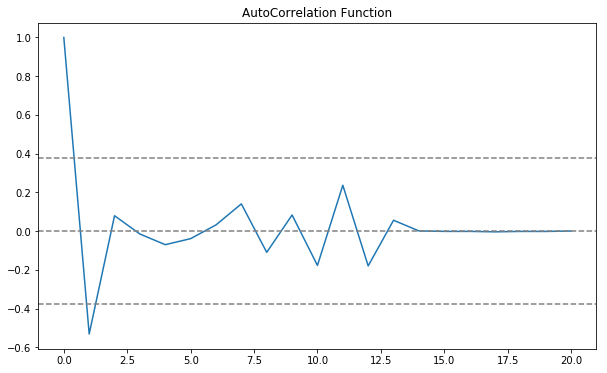

PACF Plot of
('Store1', 'Product23') 



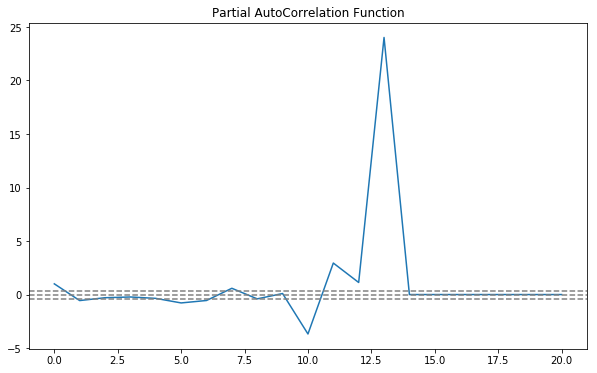

End of ACF PACF plots of
('Store1', 'Product23') 

Start of ACF PACF plots of
('Store1', 'Product24') 



ACF Plot of
('Store1', 'Product24') 



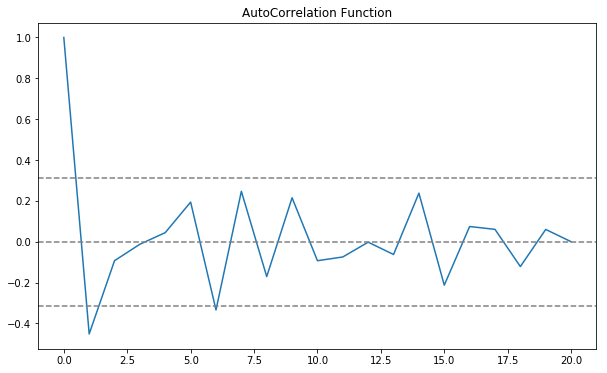

PACF Plot of
('Store1', 'Product24') 



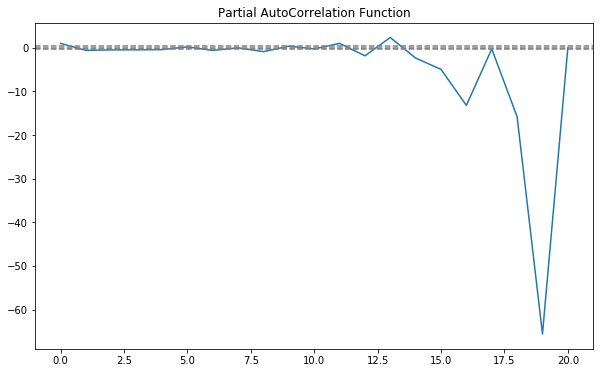

End of ACF PACF plots of
('Store1', 'Product24') 

Start of ACF PACF plots of
('Store1', 'Product25') 



ACF Plot of
('Store1', 'Product25') 



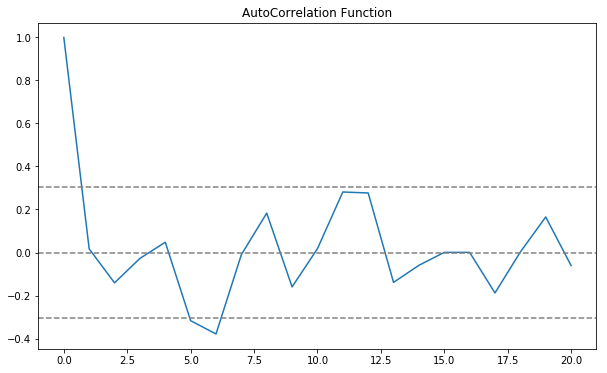

PACF Plot of
('Store1', 'Product25') 



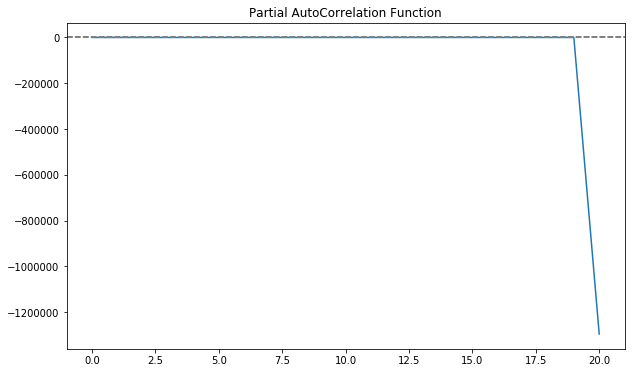

End of ACF PACF plots of
('Store1', 'Product25') 

Start of ACF PACF plots of
('Store1', 'Product26') 



ACF Plot of
('Store1', 'Product26') 



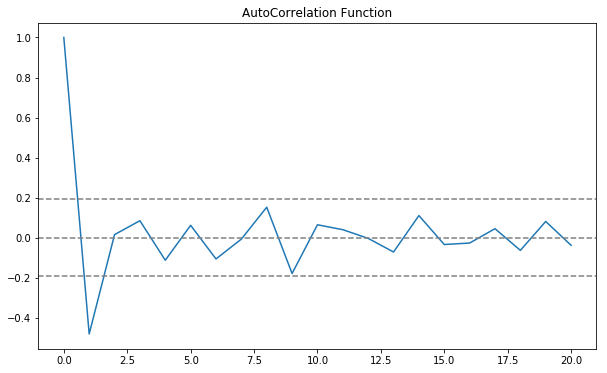

PACF Plot of
('Store1', 'Product26') 



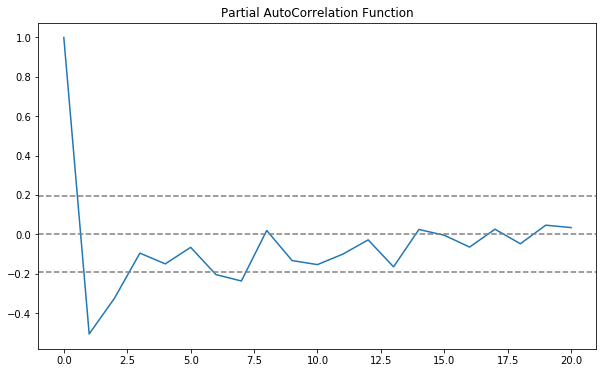

End of ACF PACF plots of
('Store1', 'Product26') 

Start of ACF PACF plots of
('Store1', 'Product27') 



ACF Plot of
('Store1', 'Product27') 



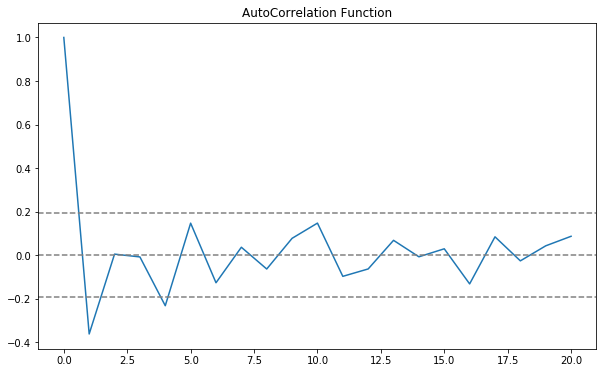

PACF Plot of
('Store1', 'Product27') 



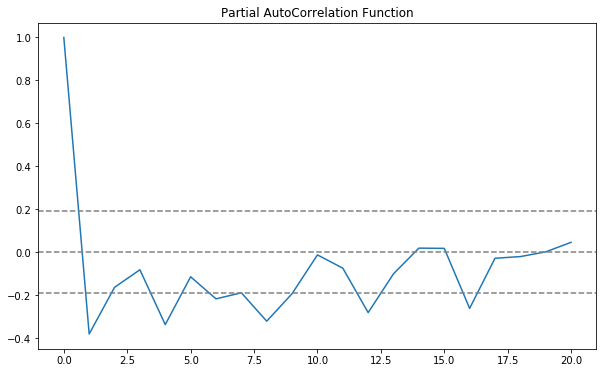

End of ACF PACF plots of
('Store1', 'Product27') 

Start of ACF PACF plots of
('Store1', 'Product28') 



ACF Plot of
('Store1', 'Product28') 



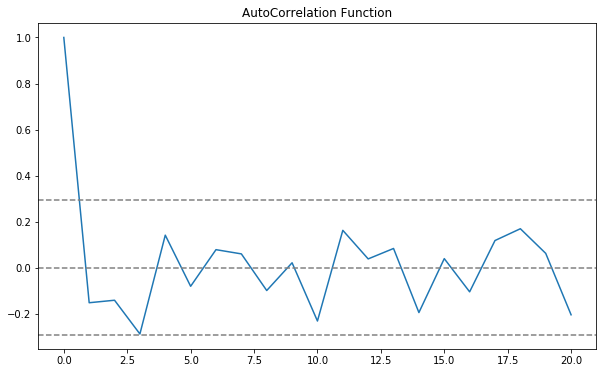

PACF Plot of
('Store1', 'Product28') 



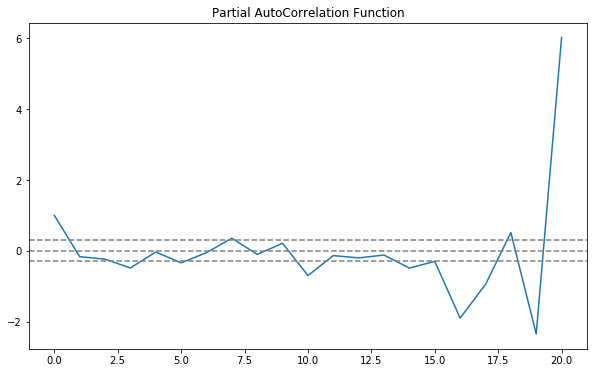

End of ACF PACF plots of
('Store1', 'Product28') 

Start of ACF PACF plots of
('Store1', 'Product29') 



ACF Plot of
('Store1', 'Product29') 



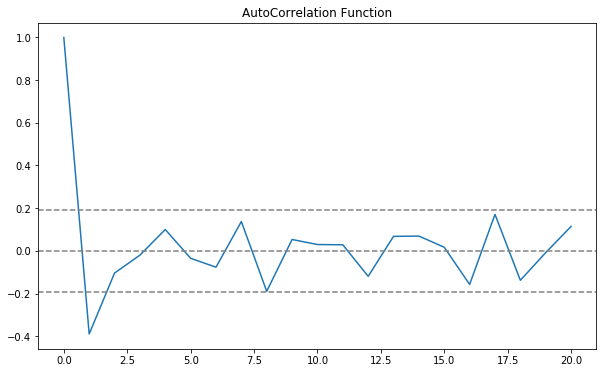

PACF Plot of
('Store1', 'Product29') 



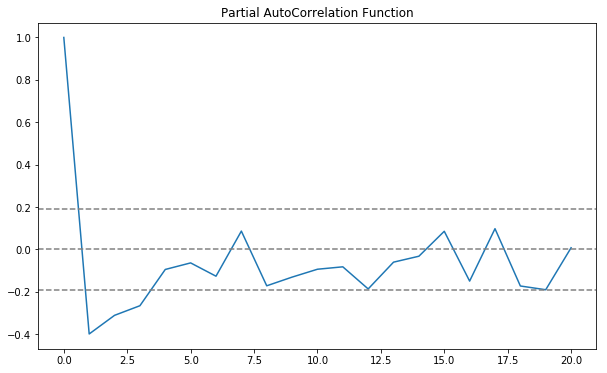

End of ACF PACF plots of
('Store1', 'Product29') 

Start of ACF PACF plots of
('Store1', 'Product3') 



ACF Plot of
('Store1', 'Product3') 



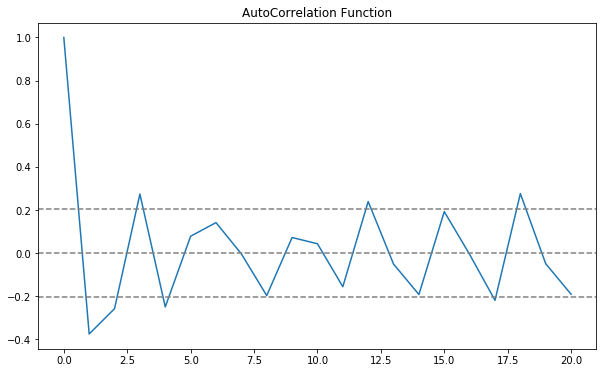

PACF Plot of
('Store1', 'Product3') 



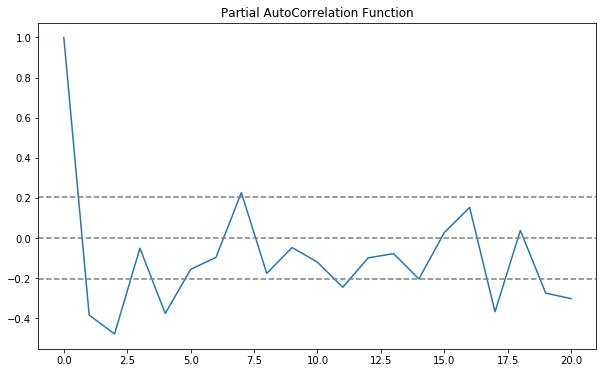

End of ACF PACF plots of
('Store1', 'Product3') 

Start of ACF PACF plots of
('Store1', 'Product30') 



Error in ACF PACF Plots
End of ACF PACF plots of
('Store1', 'Product30') 

Start of ACF PACF plots of
('Store1', 'Product31') 



ACF Plot of
('Store1', 'Product31') 



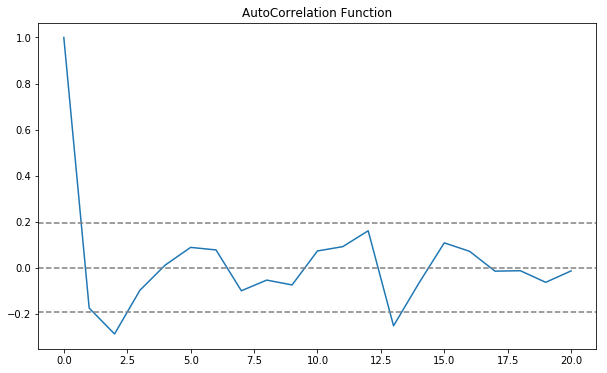

PACF Plot of
('Store1', 'Product31') 



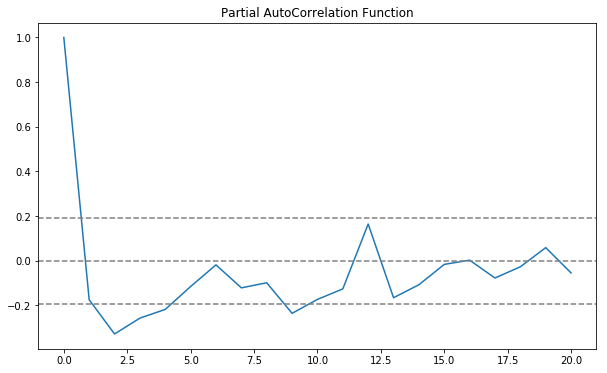

End of ACF PACF plots of
('Store1', 'Product31') 

Start of ACF PACF plots of
('Store1', 'Product32') 



ACF Plot of
('Store1', 'Product32') 



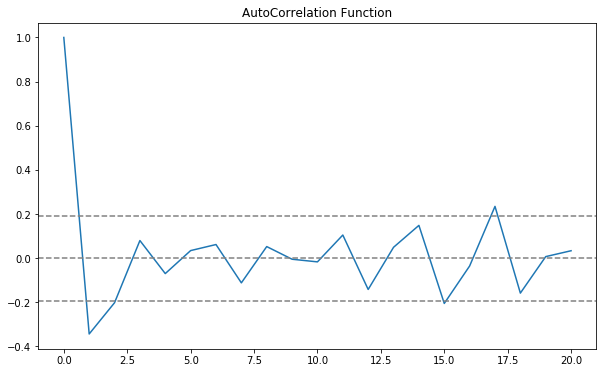

PACF Plot of
('Store1', 'Product32') 



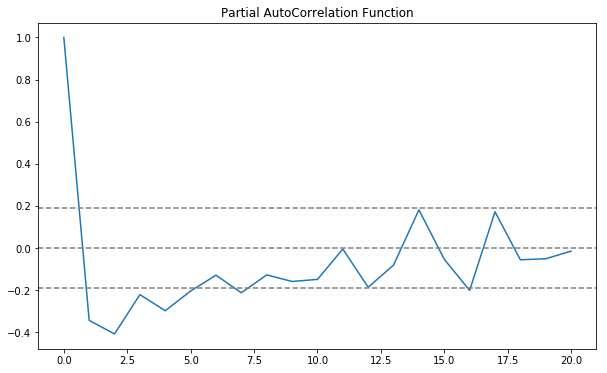

End of ACF PACF plots of
('Store1', 'Product32') 

Start of ACF PACF plots of
('Store1', 'Product33') 



ACF Plot of
('Store1', 'Product33') 



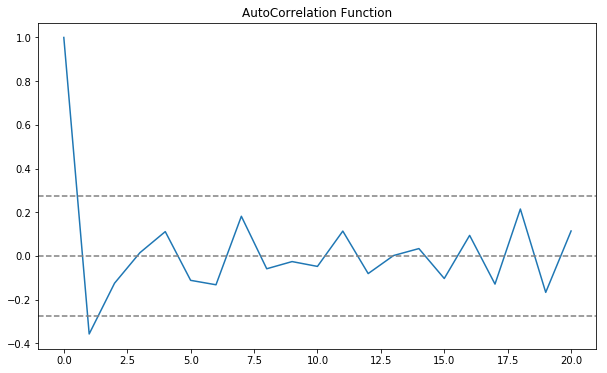

PACF Plot of
('Store1', 'Product33') 



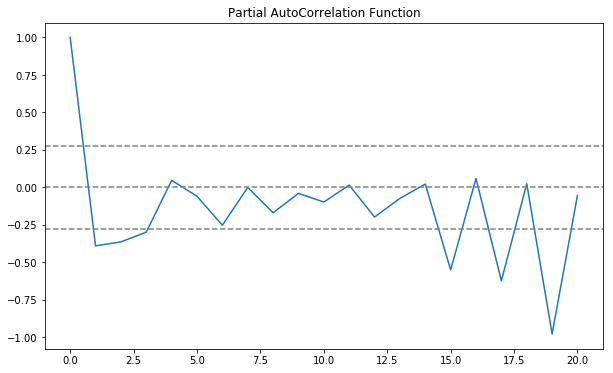

End of ACF PACF plots of
('Store1', 'Product33') 

Start of ACF PACF plots of
('Store1', 'Product34') 



ACF Plot of
('Store1', 'Product34') 



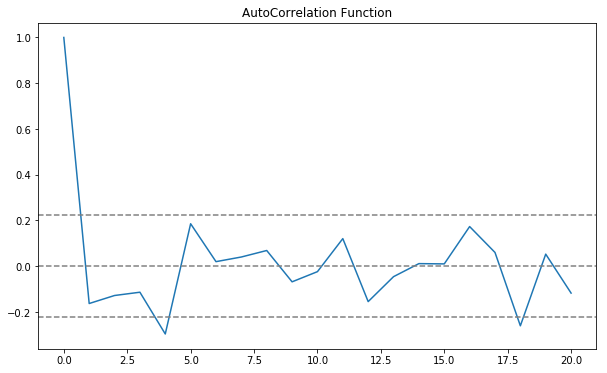

PACF Plot of
('Store1', 'Product34') 



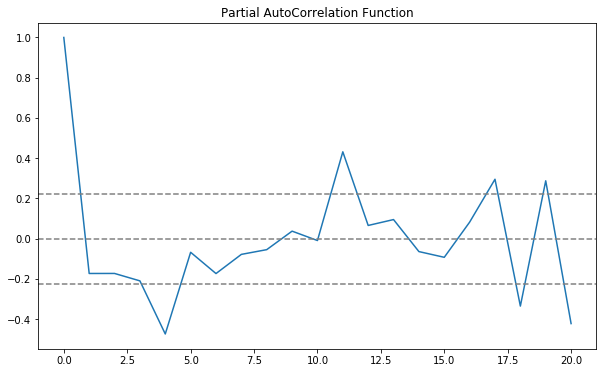

End of ACF PACF plots of
('Store1', 'Product34') 

Start of ACF PACF plots of
('Store1', 'Product35') 



ACF Plot of
('Store1', 'Product35') 



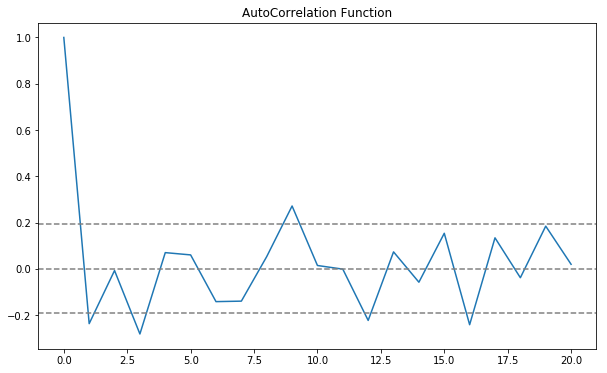

PACF Plot of
('Store1', 'Product35') 



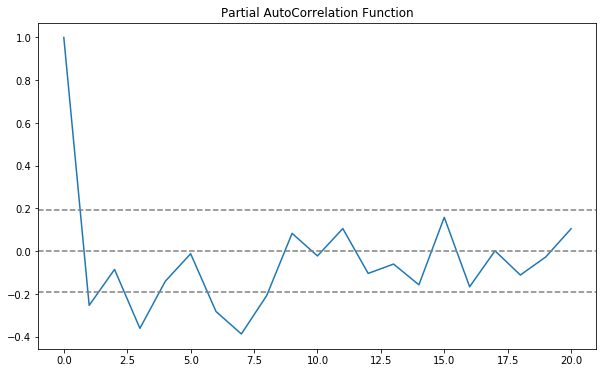

End of ACF PACF plots of
('Store1', 'Product35') 

Start of ACF PACF plots of
('Store1', 'Product36') 



ACF Plot of
('Store1', 'Product36') 



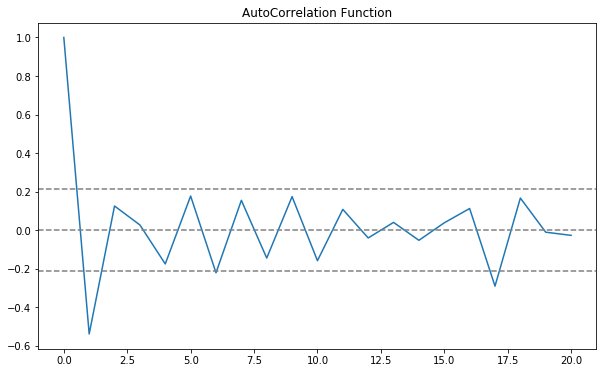

PACF Plot of
('Store1', 'Product36') 



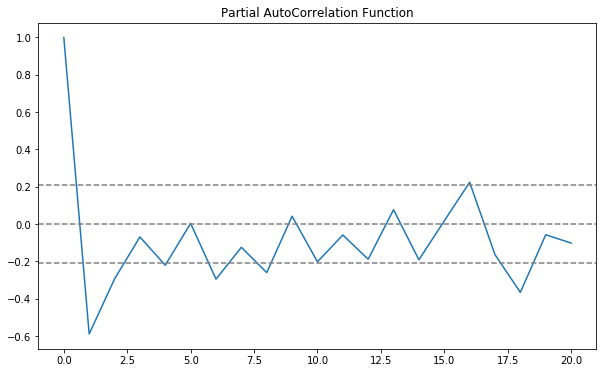

End of ACF PACF plots of
('Store1', 'Product36') 

Start of ACF PACF plots of
('Store1', 'Product37') 



ACF Plot of
('Store1', 'Product37') 



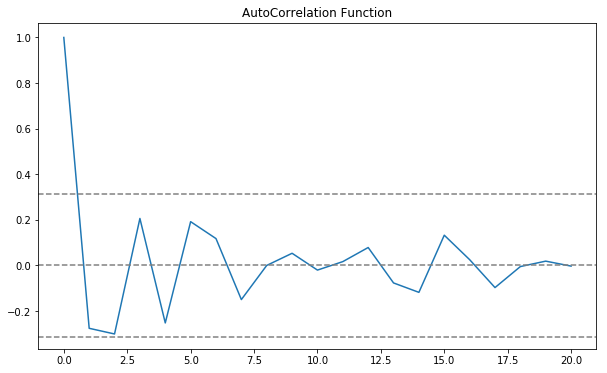

PACF Plot of
('Store1', 'Product37') 



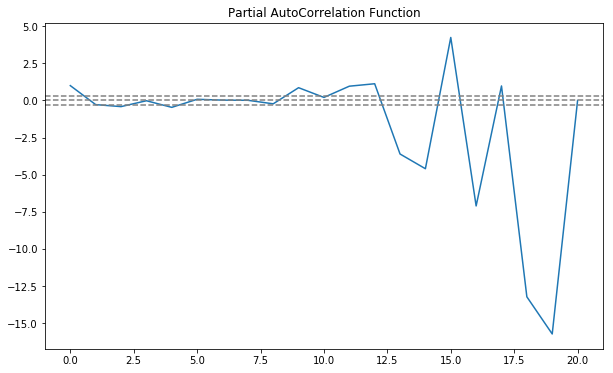

End of ACF PACF plots of
('Store1', 'Product37') 

Start of ACF PACF plots of
('Store1', 'Product38') 



ACF Plot of
('Store1', 'Product38') 



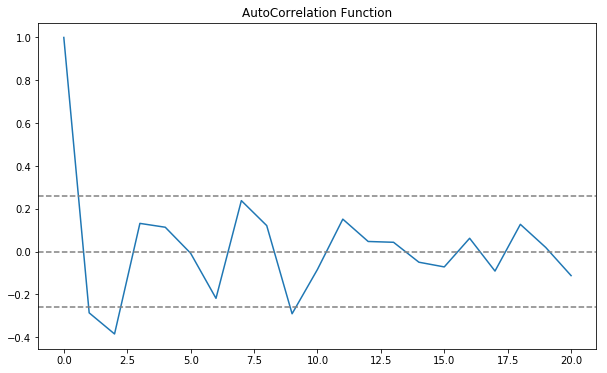

PACF Plot of
('Store1', 'Product38') 



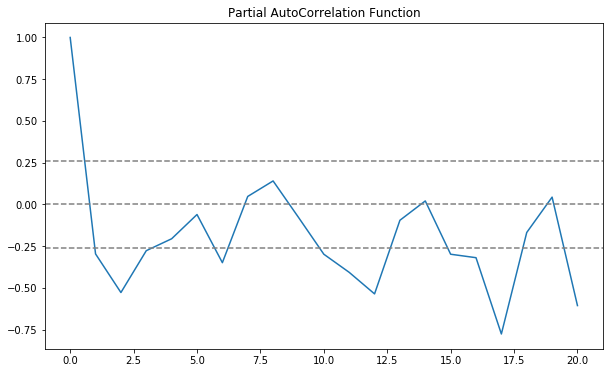

End of ACF PACF plots of
('Store1', 'Product38') 

Start of ACF PACF plots of
('Store1', 'Product39') 



ACF Plot of
('Store1', 'Product39') 



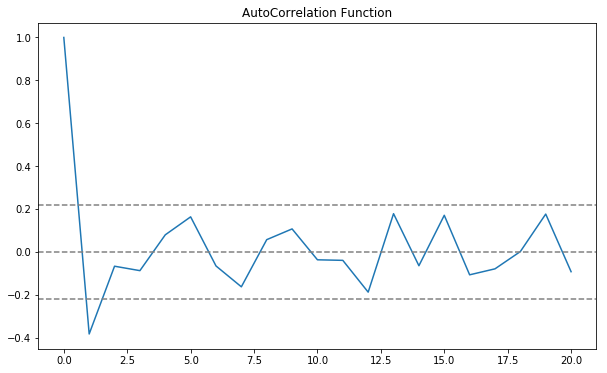

PACF Plot of
('Store1', 'Product39') 



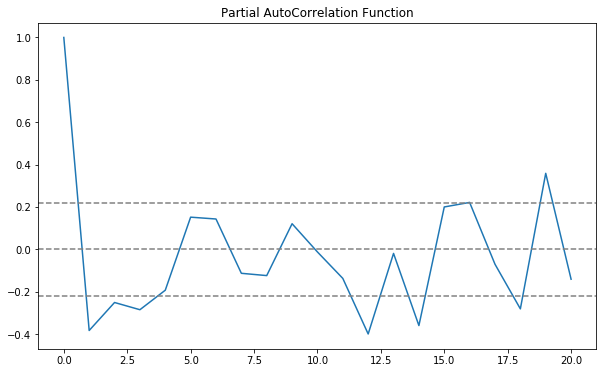

End of ACF PACF plots of
('Store1', 'Product39') 

Start of ACF PACF plots of
('Store1', 'Product4') 



ACF Plot of
('Store1', 'Product4') 



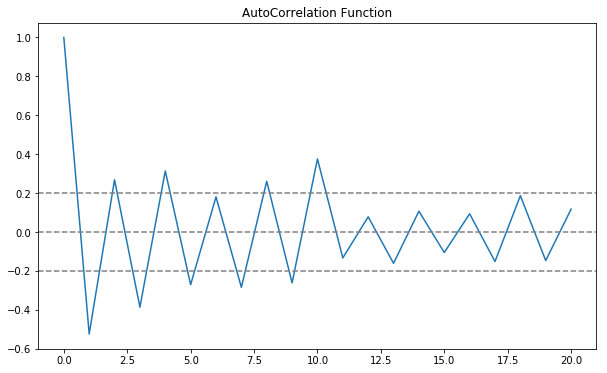

PACF Plot of
('Store1', 'Product4') 



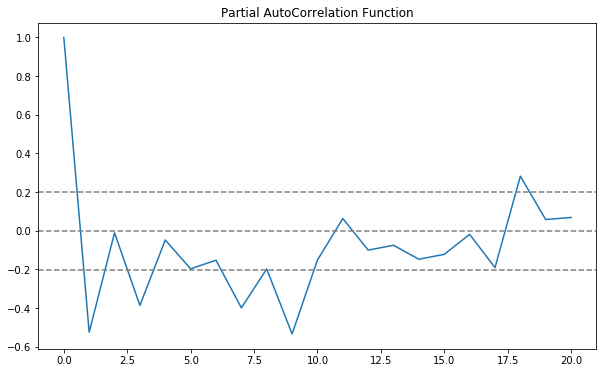

End of ACF PACF plots of
('Store1', 'Product4') 

Start of ACF PACF plots of
('Store1', 'Product40') 



ACF Plot of
('Store1', 'Product40') 



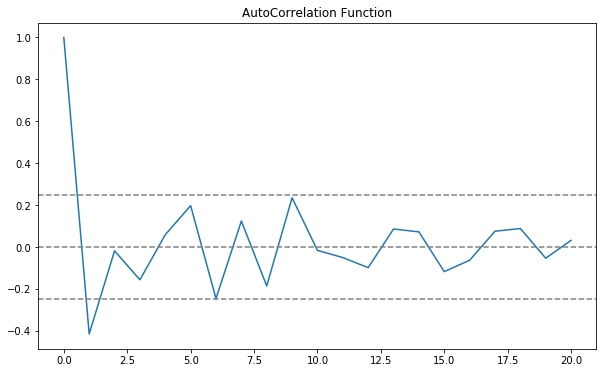

PACF Plot of
('Store1', 'Product40') 



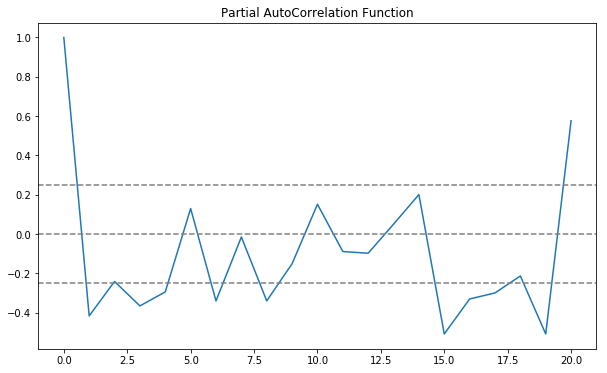

End of ACF PACF plots of
('Store1', 'Product40') 

Start of ACF PACF plots of
('Store1', 'Product41') 



ACF Plot of
('Store1', 'Product41') 



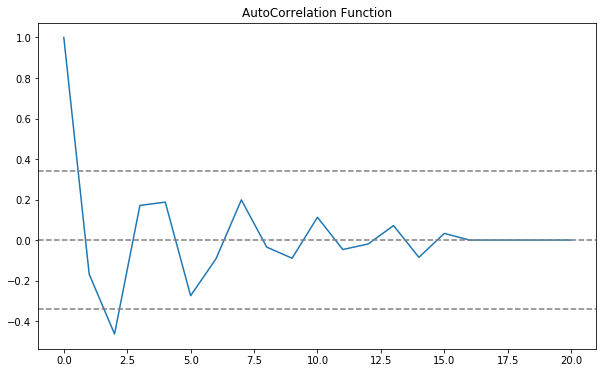

PACF Plot of
('Store1', 'Product41') 



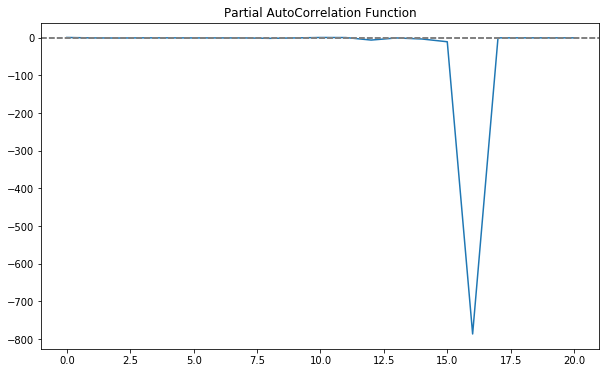

End of ACF PACF plots of
('Store1', 'Product41') 

Start of ACF PACF plots of
('Store1', 'Product42') 



ACF Plot of
('Store1', 'Product42') 



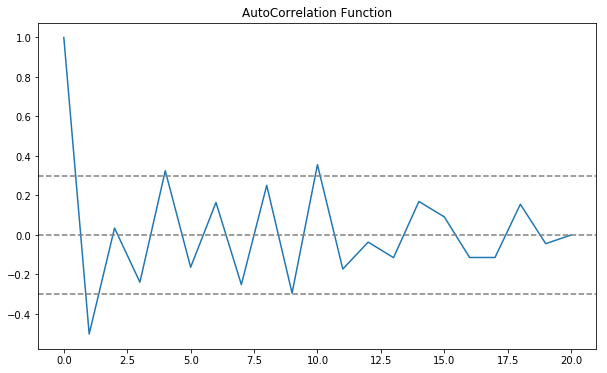

PACF Plot of
('Store1', 'Product42') 



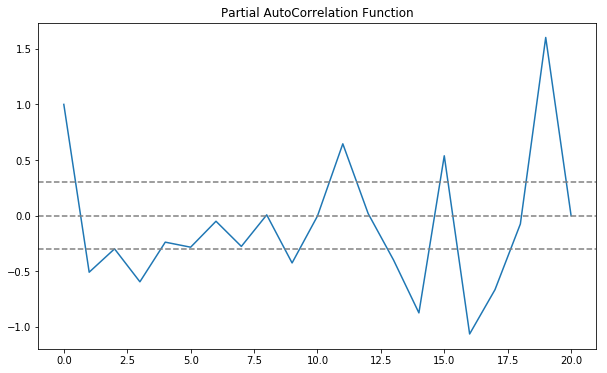

End of ACF PACF plots of
('Store1', 'Product42') 

Start of ACF PACF plots of
('Store1', 'Product43') 



ACF Plot of
('Store1', 'Product43') 



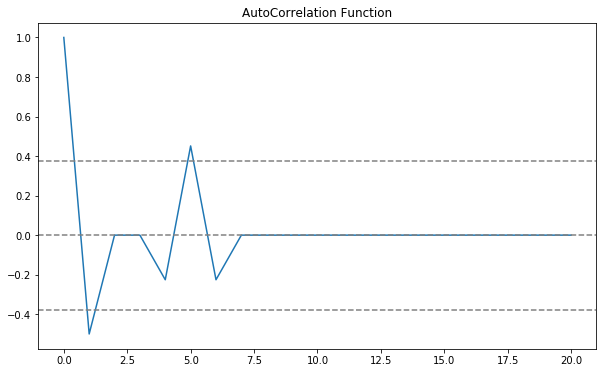

PACF Plot of
('Store1', 'Product43') 



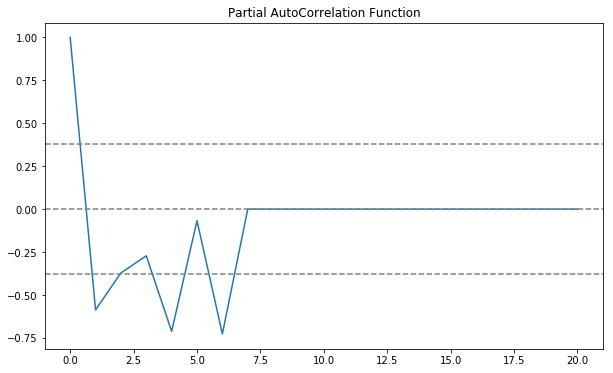

End of ACF PACF plots of
('Store1', 'Product43') 

Start of ACF PACF plots of
('Store1', 'Product44') 



ACF Plot of
('Store1', 'Product44') 



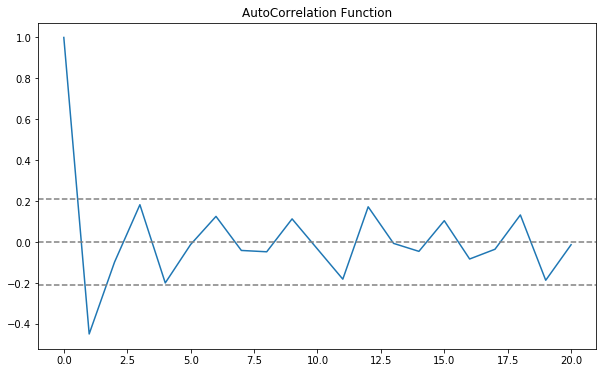

PACF Plot of
('Store1', 'Product44') 



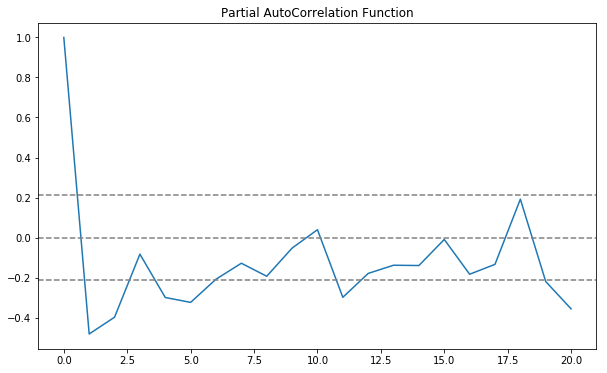

End of ACF PACF plots of
('Store1', 'Product44') 

Start of ACF PACF plots of
('Store1', 'Product45') 



ACF Plot of
('Store1', 'Product45') 



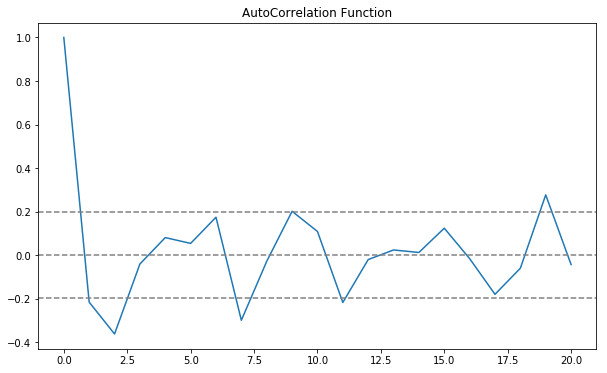

PACF Plot of
('Store1', 'Product45') 



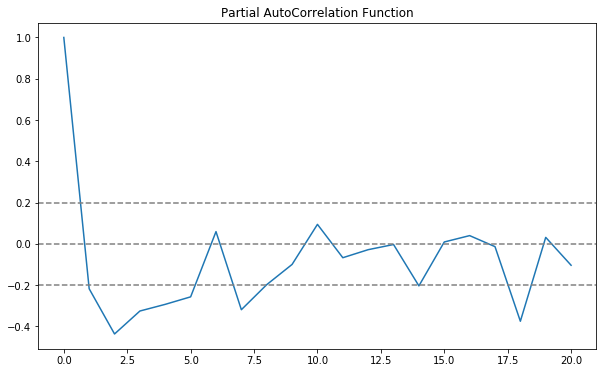

End of ACF PACF plots of
('Store1', 'Product45') 

Start of ACF PACF plots of
('Store1', 'Product46') 



ACF Plot of
('Store1', 'Product46') 



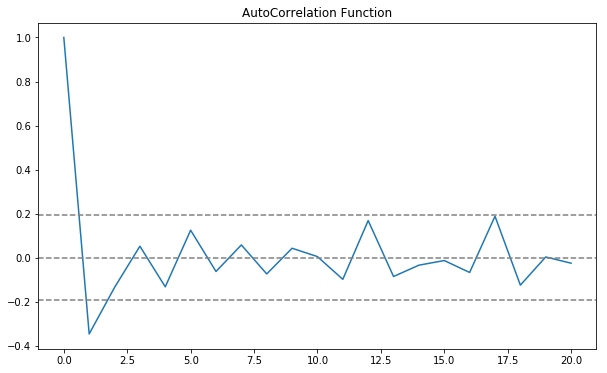

PACF Plot of
('Store1', 'Product46') 



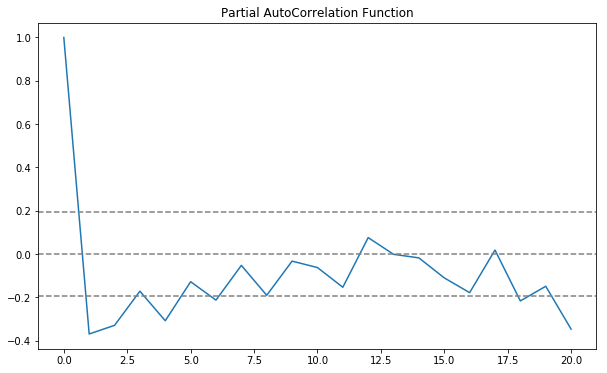

End of ACF PACF plots of
('Store1', 'Product46') 

Start of ACF PACF plots of
('Store1', 'Product47') 



ACF Plot of
('Store1', 'Product47') 



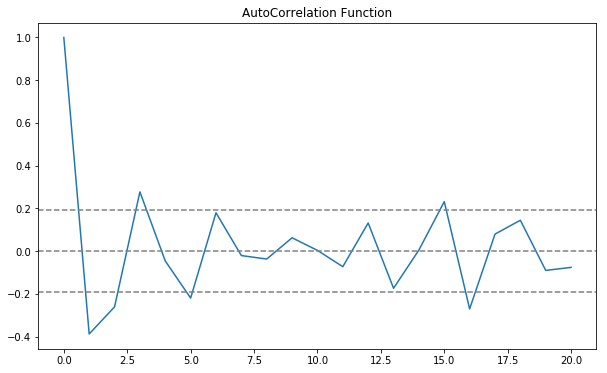

PACF Plot of
('Store1', 'Product47') 



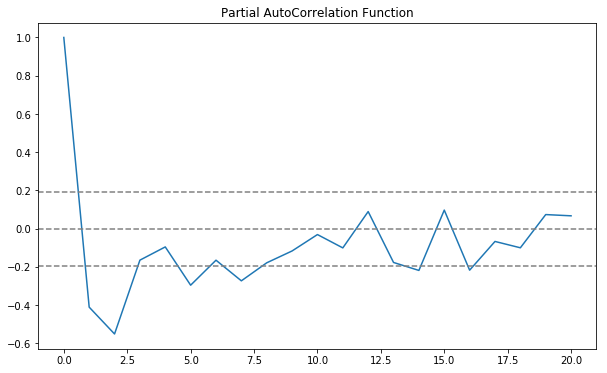

End of ACF PACF plots of
('Store1', 'Product47') 

Start of ACF PACF plots of
('Store1', 'Product48') 



ACF Plot of
('Store1', 'Product48') 



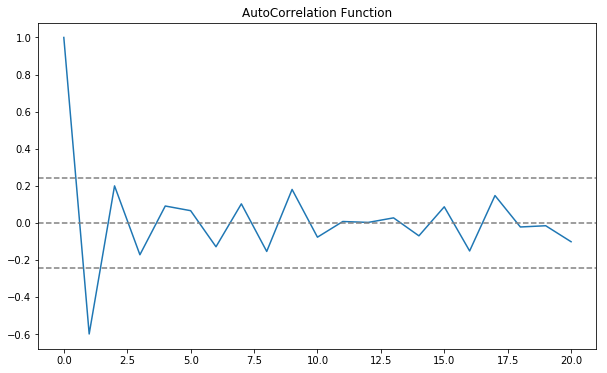

PACF Plot of
('Store1', 'Product48') 



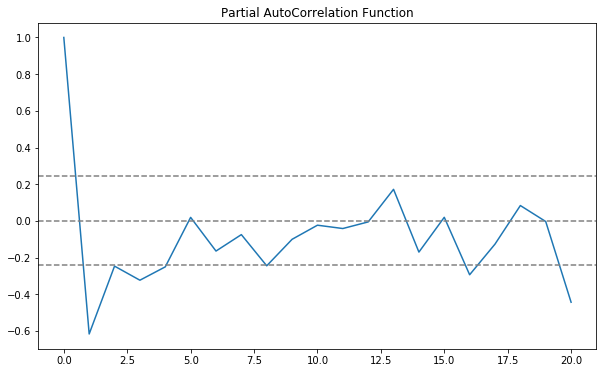

End of ACF PACF plots of
('Store1', 'Product48') 

Start of ACF PACF plots of
('Store1', 'Product49') 



ACF Plot of
('Store1', 'Product49') 



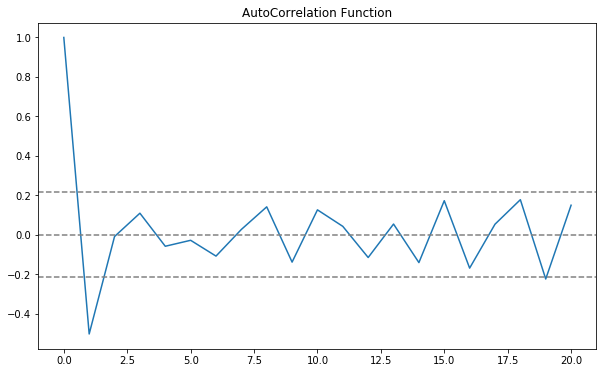

PACF Plot of
('Store1', 'Product49') 



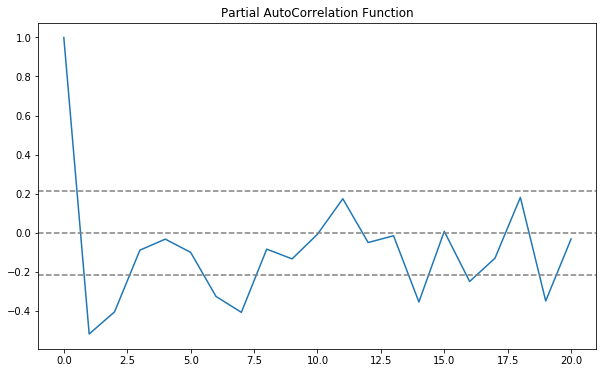

End of ACF PACF plots of
('Store1', 'Product49') 

Start of ACF PACF plots of
('Store1', 'Product5') 



ACF Plot of
('Store1', 'Product5') 



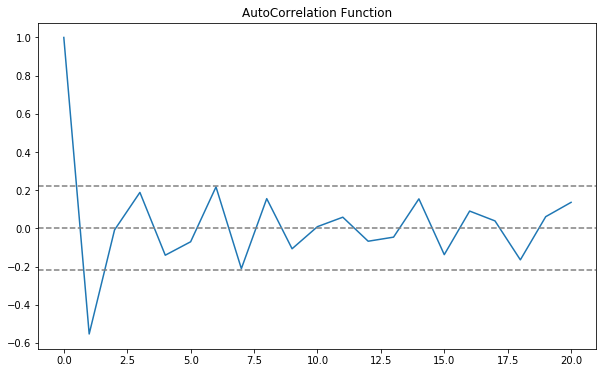

PACF Plot of
('Store1', 'Product5') 



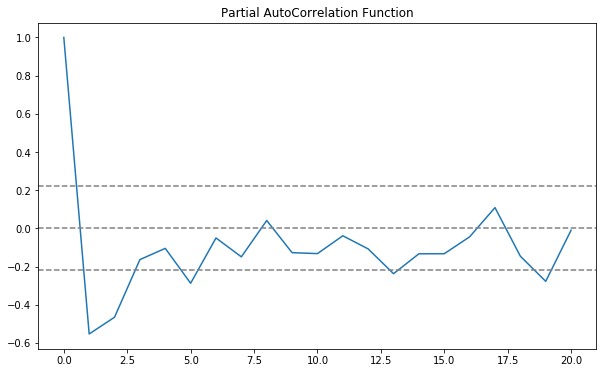

End of ACF PACF plots of
('Store1', 'Product5') 

Start of ACF PACF plots of
('Store1', 'Product50') 



ACF Plot of
('Store1', 'Product50') 



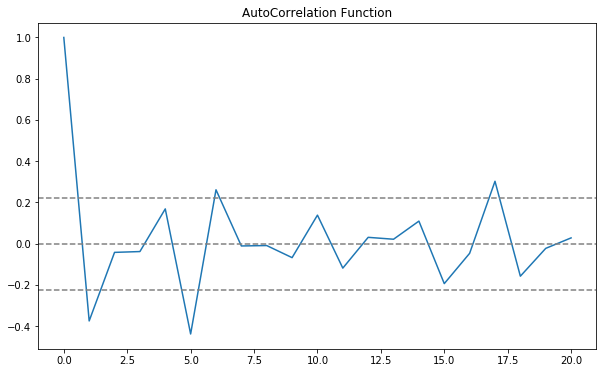

PACF Plot of
('Store1', 'Product50') 



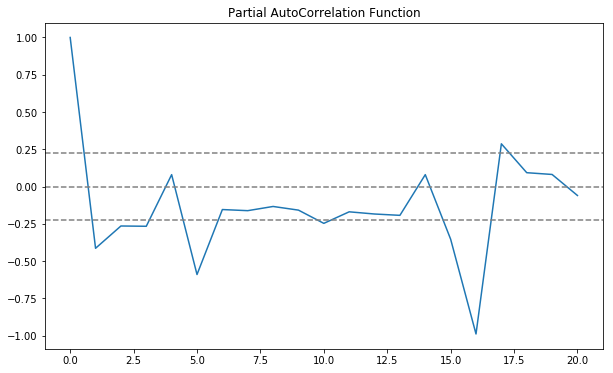

End of ACF PACF plots of
('Store1', 'Product50') 

Start of ACF PACF plots of
('Store1', 'Product51') 



ACF Plot of
('Store1', 'Product51') 



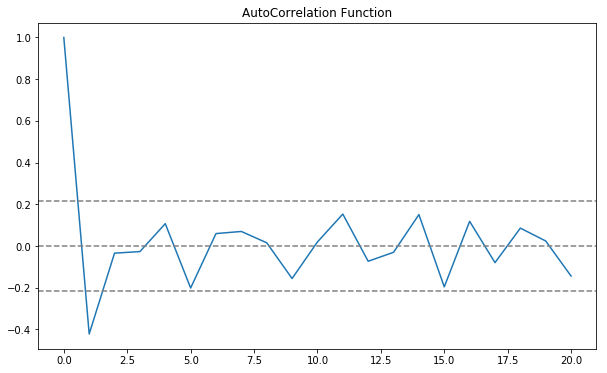

PACF Plot of
('Store1', 'Product51') 



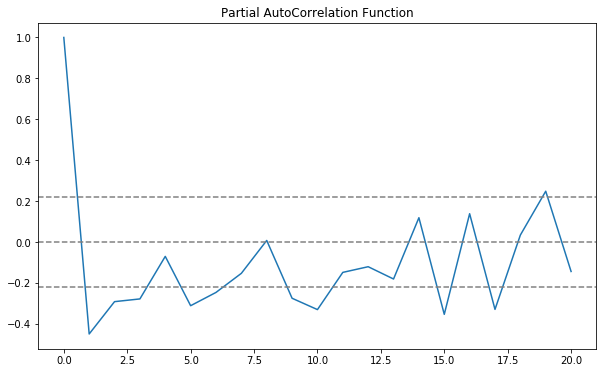

End of ACF PACF plots of
('Store1', 'Product51') 

Start of ACF PACF plots of
('Store1', 'Product52') 



ACF Plot of
('Store1', 'Product52') 



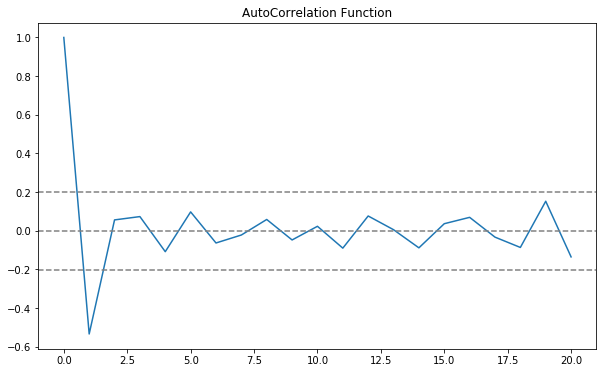

PACF Plot of
('Store1', 'Product52') 



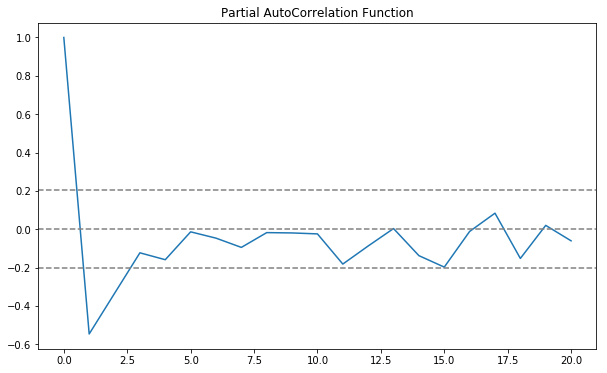

End of ACF PACF plots of
('Store1', 'Product52') 

Start of ACF PACF plots of
('Store1', 'Product53') 



Error in ACF PACF Plots
End of ACF PACF plots of
('Store1', 'Product53') 

Start of ACF PACF plots of
('Store1', 'Product54') 



ACF Plot of
('Store1', 'Product54') 



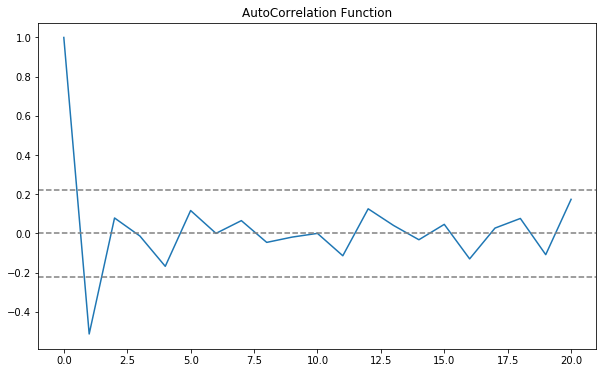

PACF Plot of
('Store1', 'Product54') 



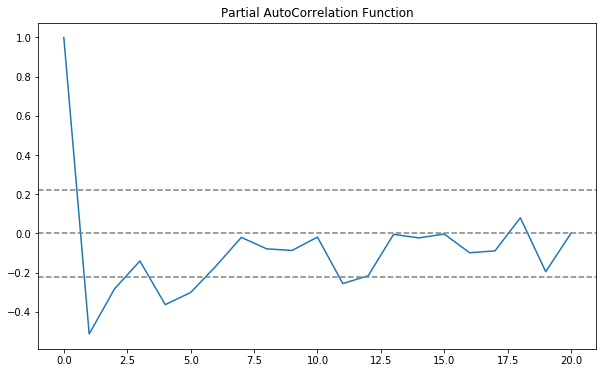

End of ACF PACF plots of
('Store1', 'Product54') 

Start of ACF PACF plots of
('Store1', 'Product55') 



ACF Plot of
('Store1', 'Product55') 



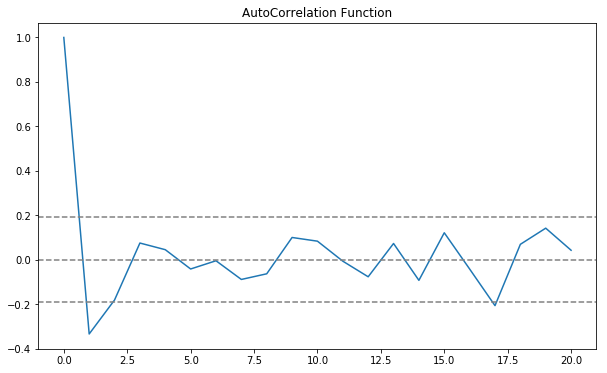

PACF Plot of
('Store1', 'Product55') 



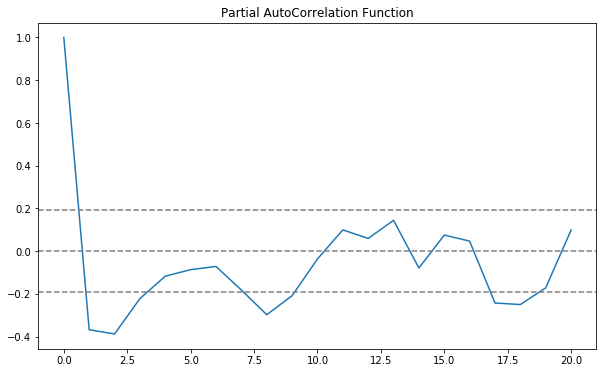

End of ACF PACF plots of
('Store1', 'Product55') 

Start of ACF PACF plots of
('Store1', 'Product56') 



ACF Plot of
('Store1', 'Product56') 



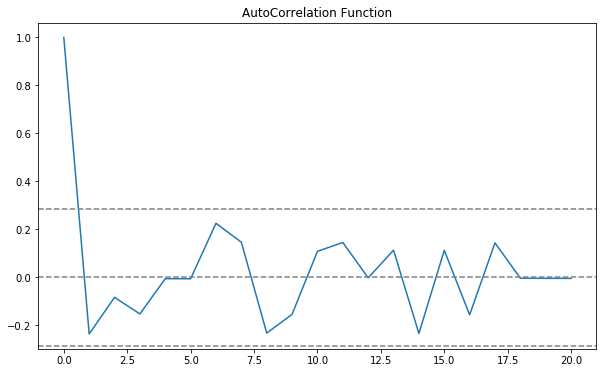

PACF Plot of
('Store1', 'Product56') 



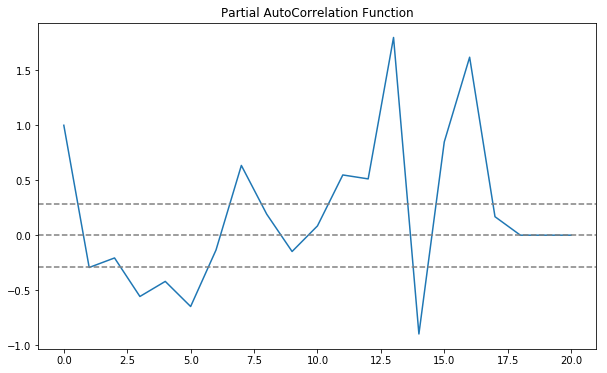

End of ACF PACF plots of
('Store1', 'Product56') 

Start of ACF PACF plots of
('Store1', 'Product57') 



ACF Plot of
('Store1', 'Product57') 



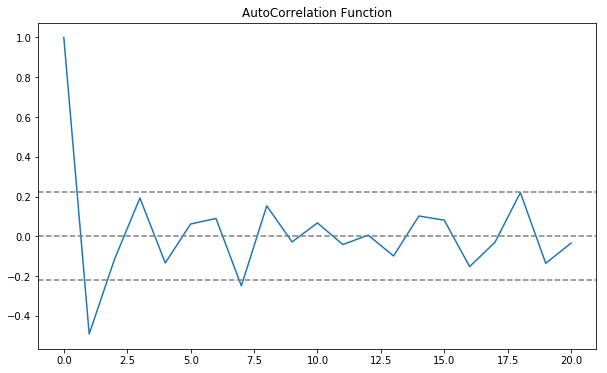

PACF Plot of
('Store1', 'Product57') 



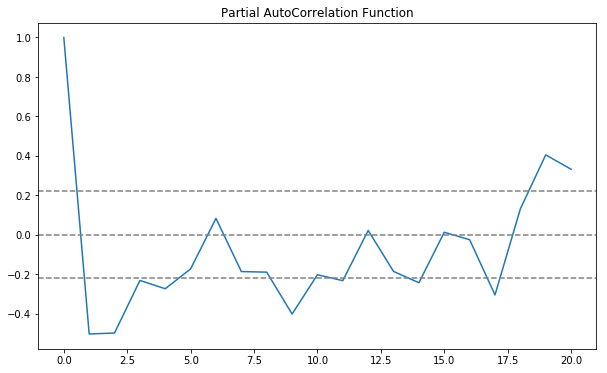

End of ACF PACF plots of
('Store1', 'Product57') 

Start of ACF PACF plots of
('Store1', 'Product58') 



ACF Plot of
('Store1', 'Product58') 



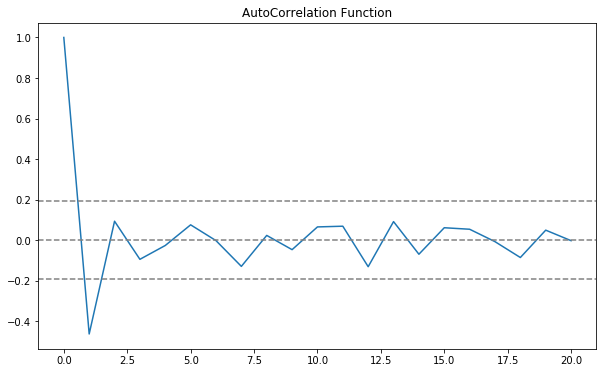

PACF Plot of
('Store1', 'Product58') 



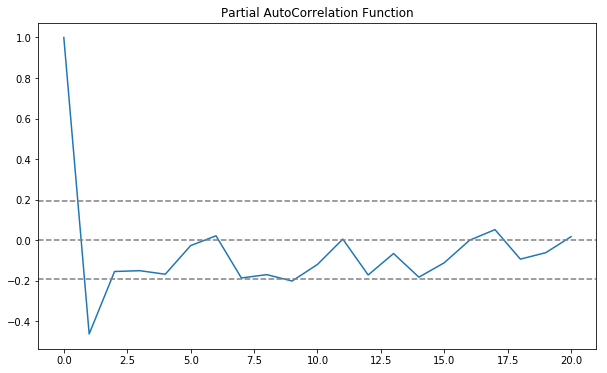

End of ACF PACF plots of
('Store1', 'Product58') 

Start of ACF PACF plots of
('Store1', 'Product59') 



ACF Plot of
('Store1', 'Product59') 



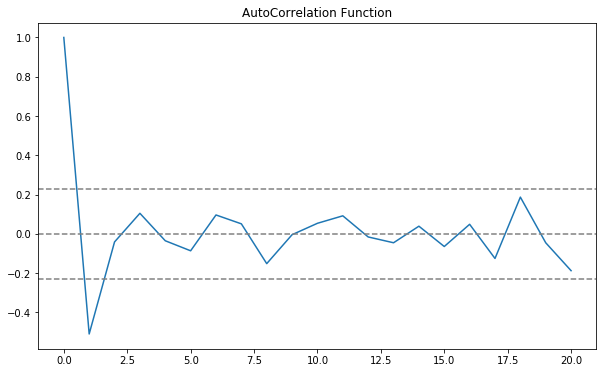

PACF Plot of
('Store1', 'Product59') 



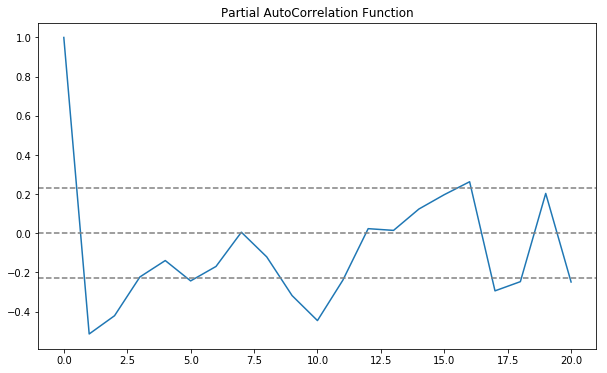

End of ACF PACF plots of
('Store1', 'Product59') 

Start of ACF PACF plots of
('Store1', 'Product6') 



ACF Plot of
('Store1', 'Product6') 



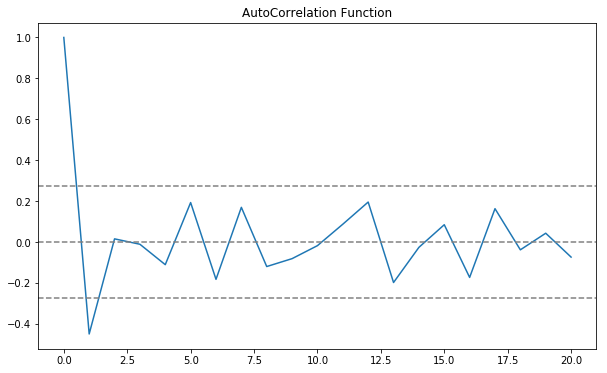

PACF Plot of
('Store1', 'Product6') 



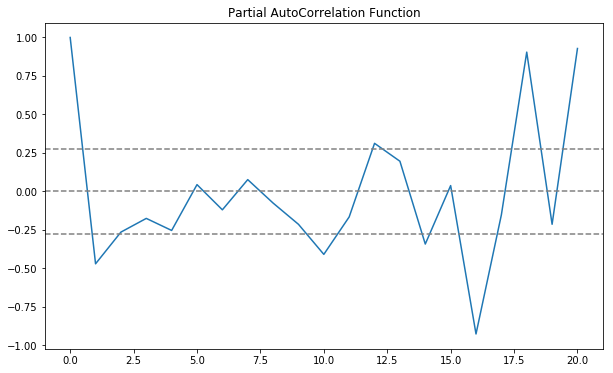

End of ACF PACF plots of
('Store1', 'Product6') 

Start of ACF PACF plots of
('Store1', 'Product60') 



ACF Plot of
('Store1', 'Product60') 



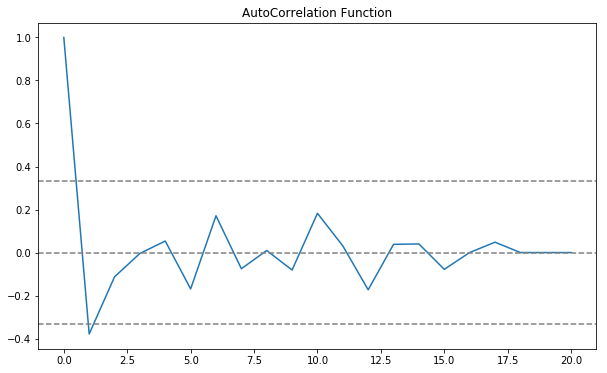

PACF Plot of
('Store1', 'Product60') 



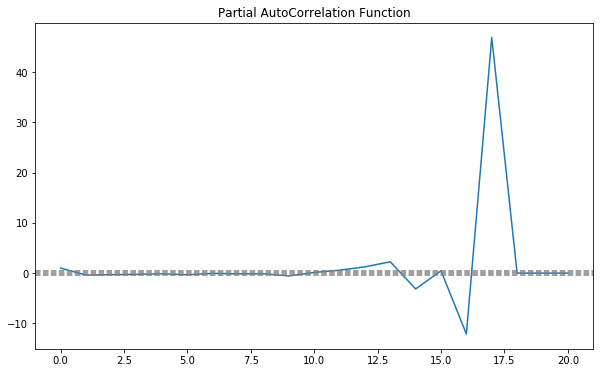

End of ACF PACF plots of
('Store1', 'Product60') 

Start of ACF PACF plots of
('Store1', 'Product61') 



ACF Plot of
('Store1', 'Product61') 



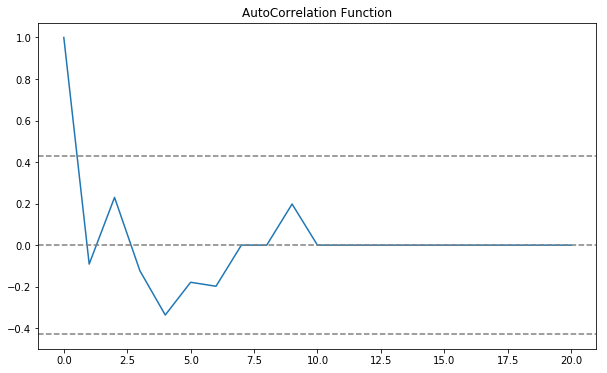

PACF Plot of
('Store1', 'Product61') 



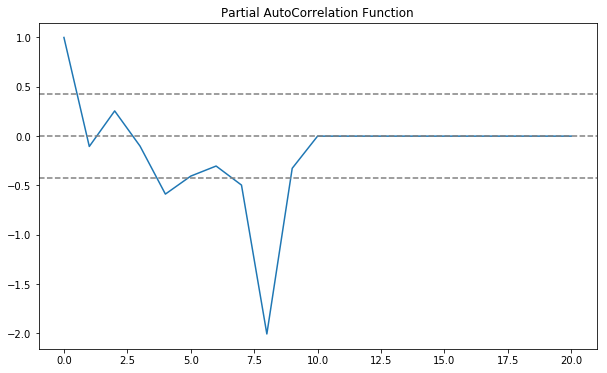

End of ACF PACF plots of
('Store1', 'Product61') 

Start of ACF PACF plots of
('Store1', 'Product62') 



ACF Plot of
('Store1', 'Product62') 



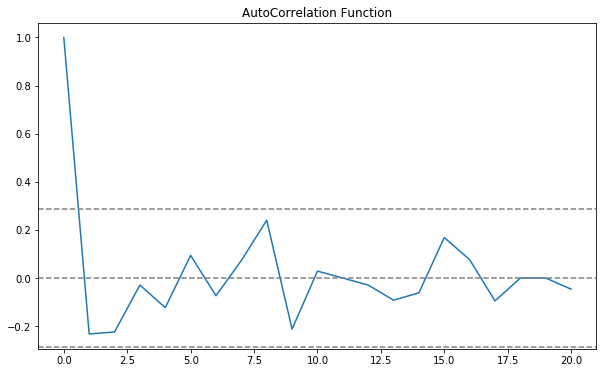

PACF Plot of
('Store1', 'Product62') 



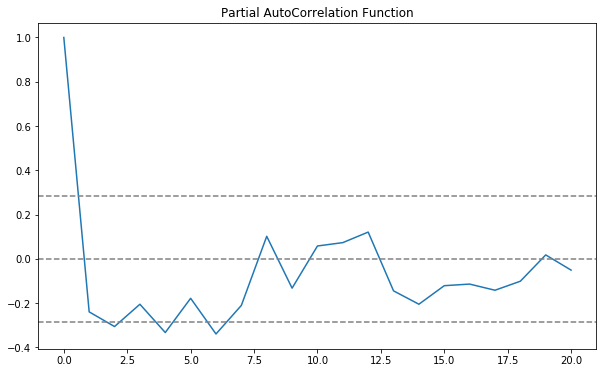

End of ACF PACF plots of
('Store1', 'Product62') 

Start of ACF PACF plots of
('Store1', 'Product63') 



ACF Plot of
('Store1', 'Product63') 



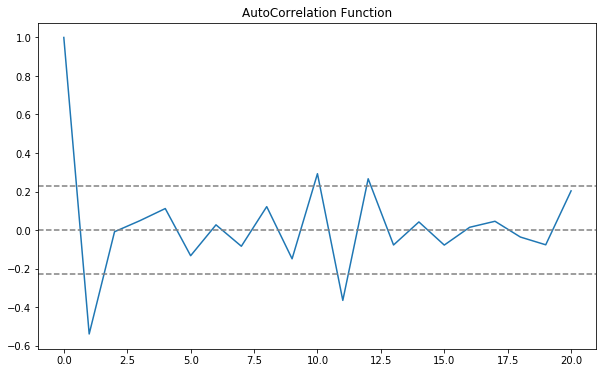

PACF Plot of
('Store1', 'Product63') 



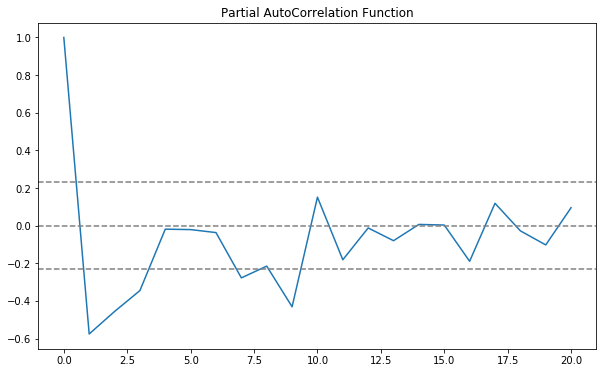

End of ACF PACF plots of
('Store1', 'Product63') 

Start of ACF PACF plots of
('Store1', 'Product64') 



ACF Plot of
('Store1', 'Product64') 



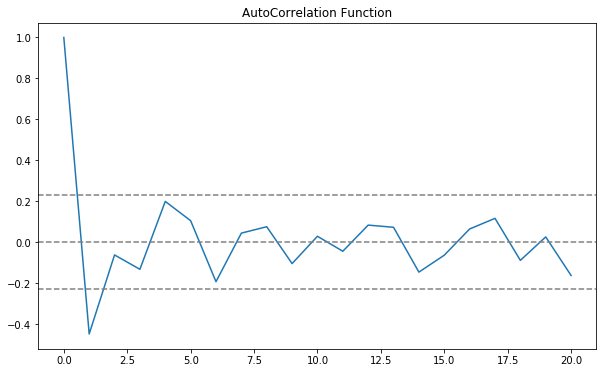

PACF Plot of
('Store1', 'Product64') 



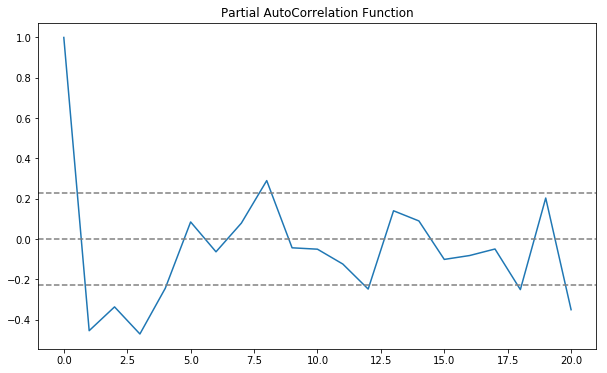

End of ACF PACF plots of
('Store1', 'Product64') 

Start of ACF PACF plots of
('Store1', 'Product65') 



ACF Plot of
('Store1', 'Product65') 



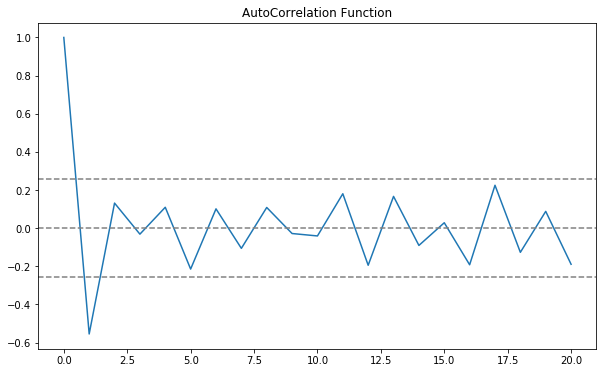

PACF Plot of
('Store1', 'Product65') 



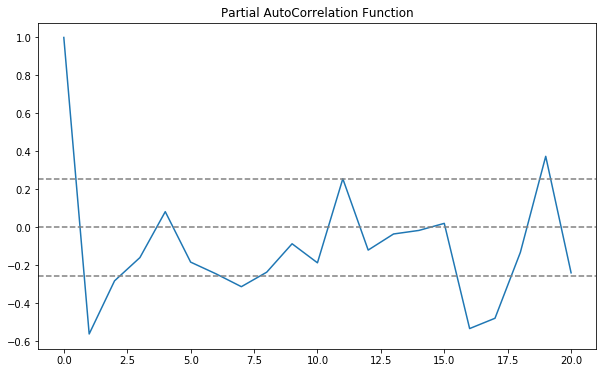

End of ACF PACF plots of
('Store1', 'Product65') 

Start of ACF PACF plots of
('Store1', 'Product66') 



ACF Plot of
('Store1', 'Product66') 



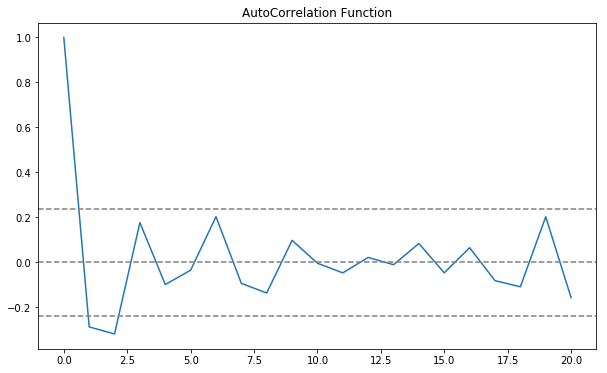

PACF Plot of
('Store1', 'Product66') 



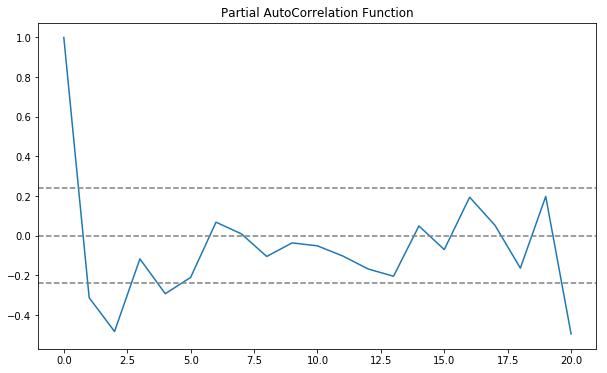

End of ACF PACF plots of
('Store1', 'Product66') 

Start of ACF PACF plots of
('Store1', 'Product67') 



ACF Plot of
('Store1', 'Product67') 



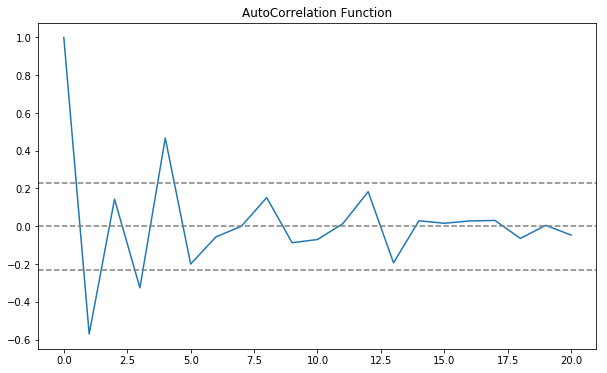

PACF Plot of
('Store1', 'Product67') 



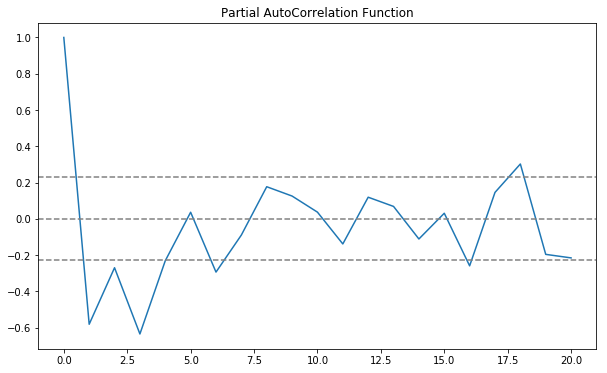

End of ACF PACF plots of
('Store1', 'Product67') 

Start of ACF PACF plots of
('Store1', 'Product68') 



ACF Plot of
('Store1', 'Product68') 



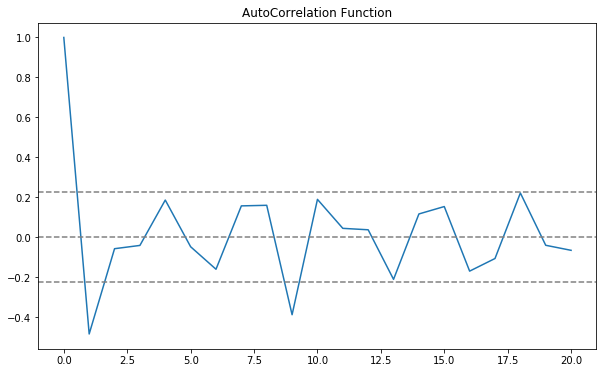

PACF Plot of
('Store1', 'Product68') 



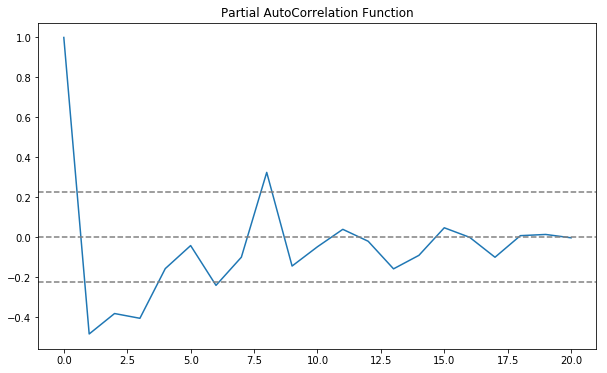

End of ACF PACF plots of
('Store1', 'Product68') 

Start of ACF PACF plots of
('Store1', 'Product69') 



ACF Plot of
('Store1', 'Product69') 



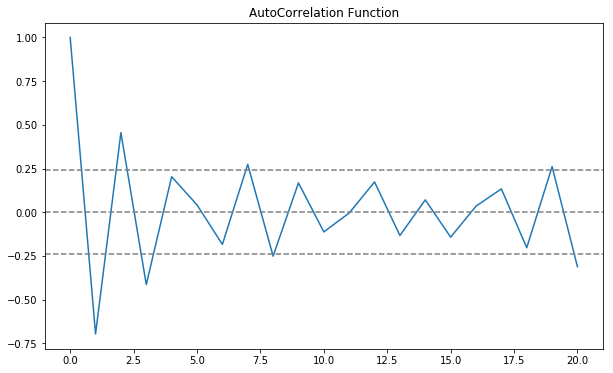

PACF Plot of
('Store1', 'Product69') 



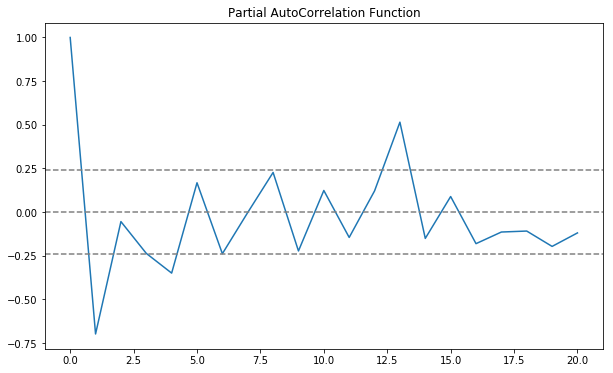

End of ACF PACF plots of
('Store1', 'Product69') 

Start of ACF PACF plots of
('Store1', 'Product7') 



ACF Plot of
('Store1', 'Product7') 



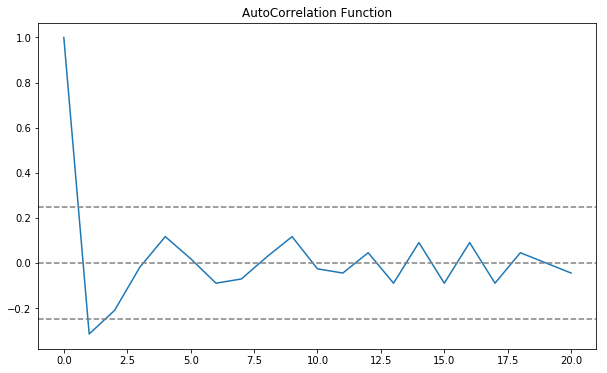

PACF Plot of
('Store1', 'Product7') 



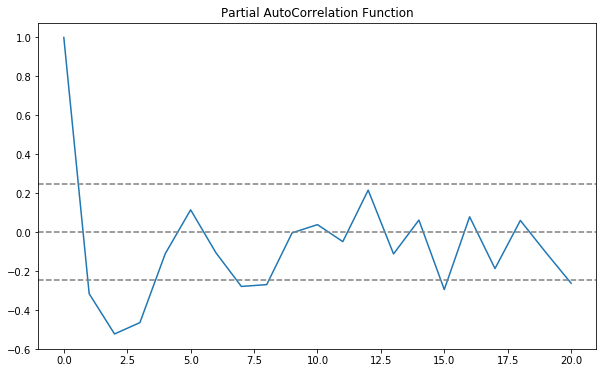

End of ACF PACF plots of
('Store1', 'Product7') 

Start of ACF PACF plots of
('Store1', 'Product70') 



ACF Plot of
('Store1', 'Product70') 



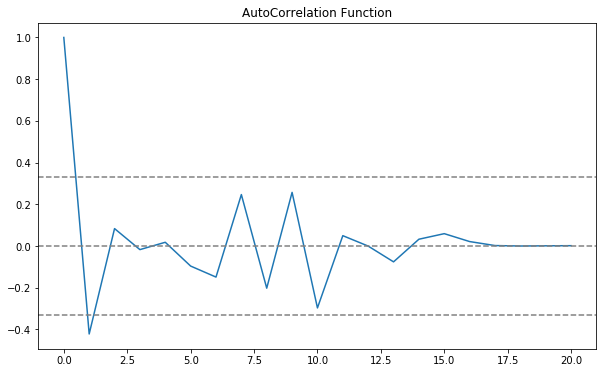

PACF Plot of
('Store1', 'Product70') 



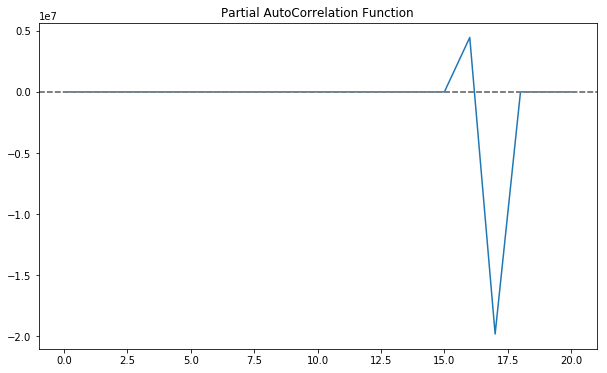

End of ACF PACF plots of
('Store1', 'Product70') 

Start of ACF PACF plots of
('Store1', 'Product71') 



ACF Plot of
('Store1', 'Product71') 



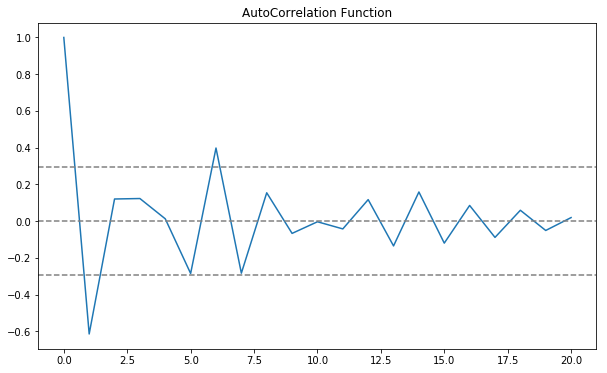

PACF Plot of
('Store1', 'Product71') 



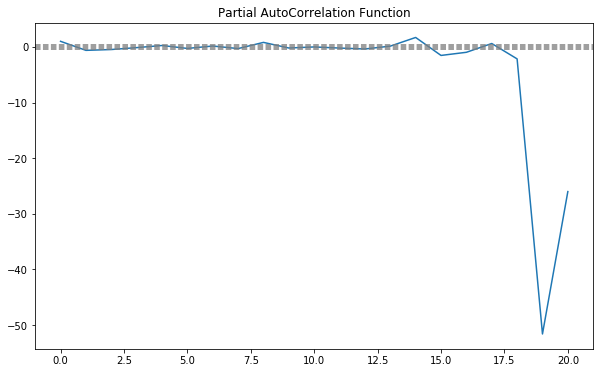

End of ACF PACF plots of
('Store1', 'Product71') 

Start of ACF PACF plots of
('Store1', 'Product72') 



ACF Plot of
('Store1', 'Product72') 



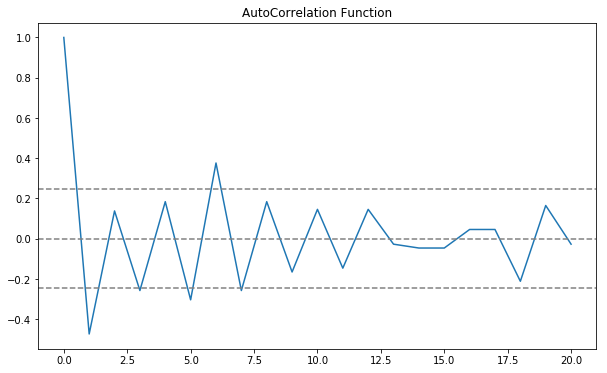

PACF Plot of
('Store1', 'Product72') 



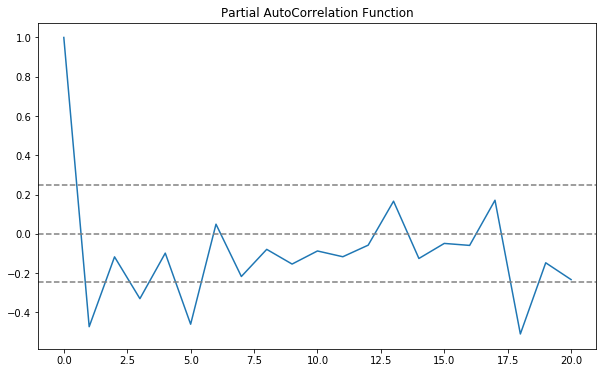

End of ACF PACF plots of
('Store1', 'Product72') 

Start of ACF PACF plots of
('Store1', 'Product73') 



ACF Plot of
('Store1', 'Product73') 



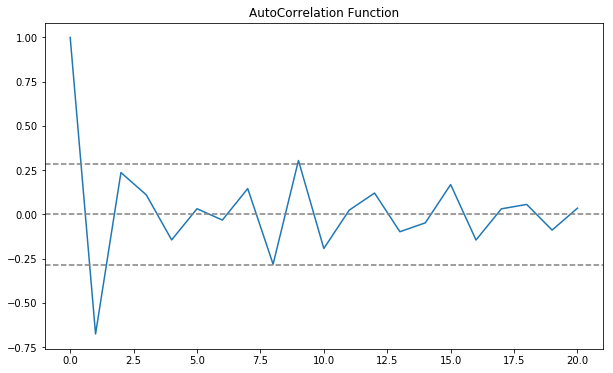

PACF Plot of
('Store1', 'Product73') 



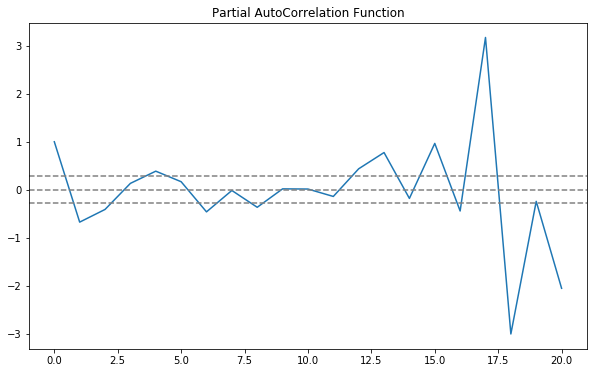

End of ACF PACF plots of
('Store1', 'Product73') 

Start of ACF PACF plots of
('Store1', 'Product74') 



ACF Plot of
('Store1', 'Product74') 



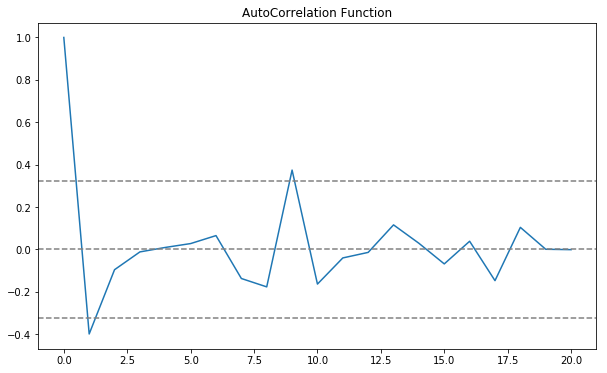

PACF Plot of
('Store1', 'Product74') 



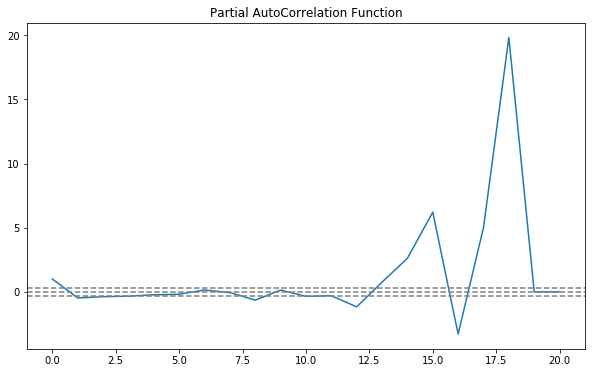

End of ACF PACF plots of
('Store1', 'Product74') 

Start of ACF PACF plots of
('Store1', 'Product75') 



ACF Plot of
('Store1', 'Product75') 



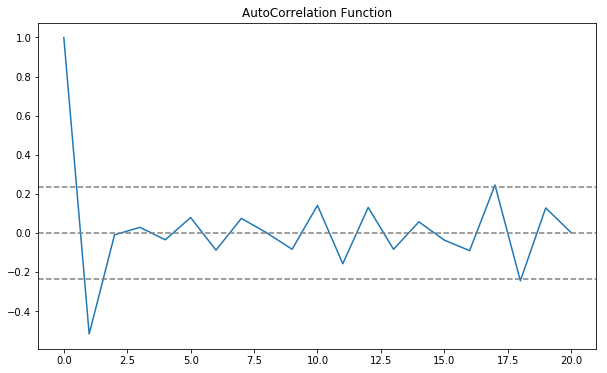

PACF Plot of
('Store1', 'Product75') 



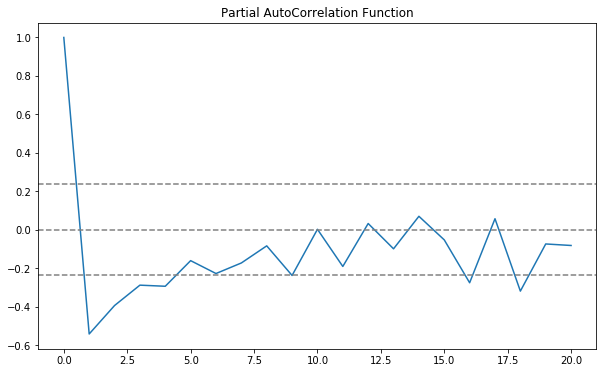

End of ACF PACF plots of
('Store1', 'Product75') 

Start of ACF PACF plots of
('Store1', 'Product76') 



ACF Plot of
('Store1', 'Product76') 



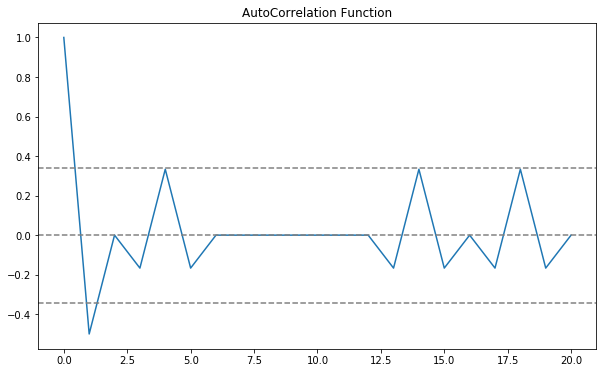

PACF Plot of
('Store1', 'Product76') 



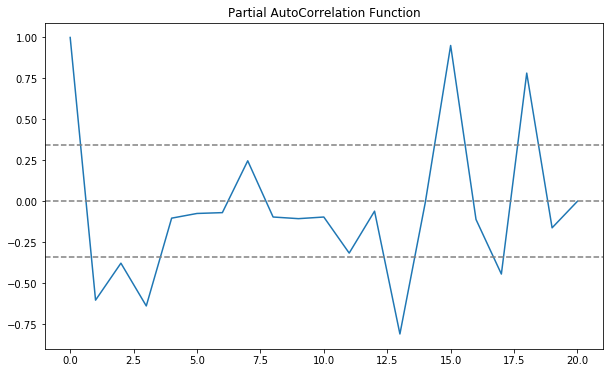

End of ACF PACF plots of
('Store1', 'Product76') 

Start of ACF PACF plots of
('Store1', 'Product77') 



ACF Plot of
('Store1', 'Product77') 



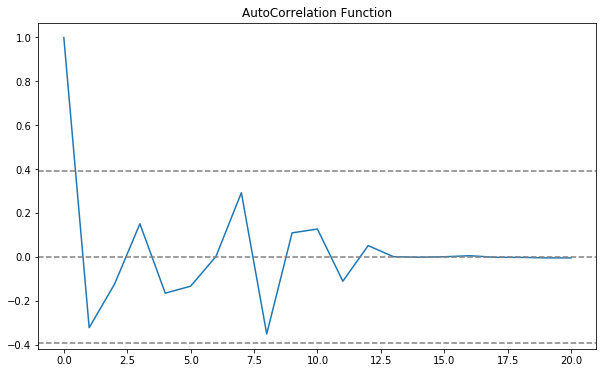

PACF Plot of
('Store1', 'Product77') 



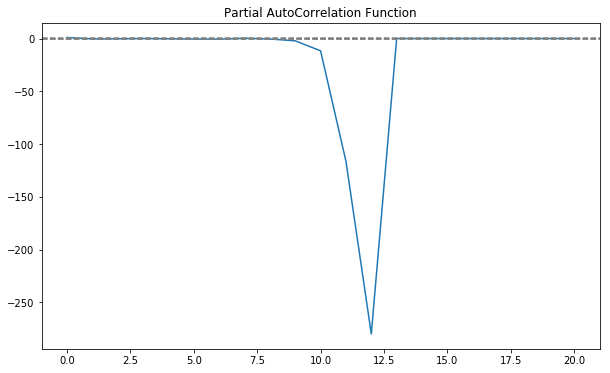

End of ACF PACF plots of
('Store1', 'Product77') 

Start of ACF PACF plots of
('Store1', 'Product78') 



ACF Plot of
('Store1', 'Product78') 



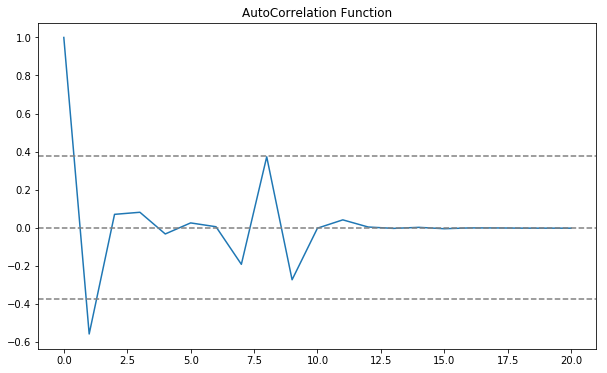

PACF Plot of
('Store1', 'Product78') 



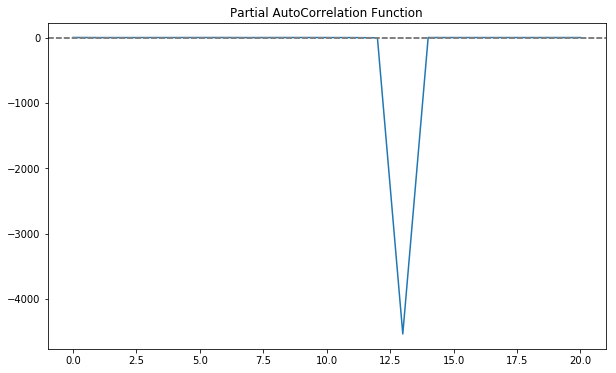

End of ACF PACF plots of
('Store1', 'Product78') 

Start of ACF PACF plots of
('Store1', 'Product79') 



ACF Plot of
('Store1', 'Product79') 



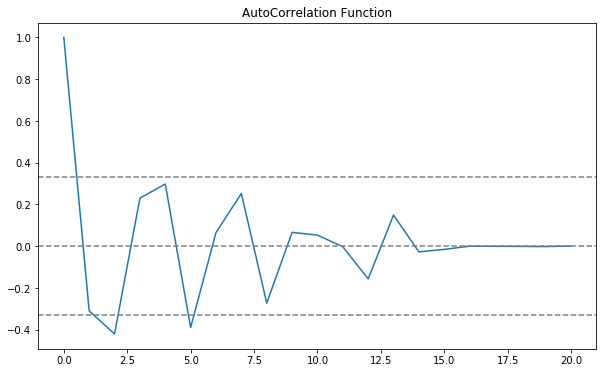

PACF Plot of
('Store1', 'Product79') 



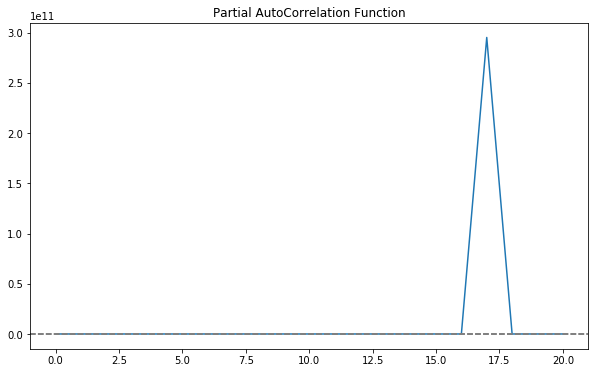

End of ACF PACF plots of
('Store1', 'Product79') 

Start of ACF PACF plots of
('Store1', 'Product8') 



ACF Plot of
('Store1', 'Product8') 



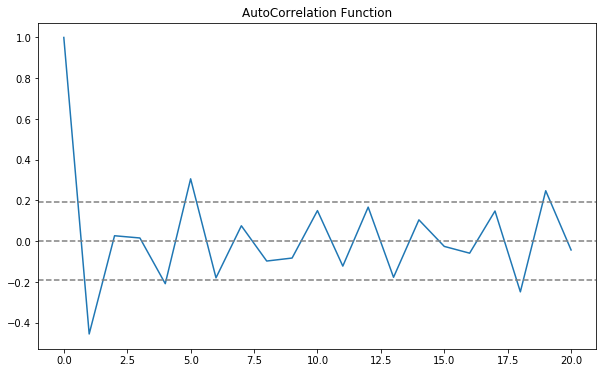

PACF Plot of
('Store1', 'Product8') 



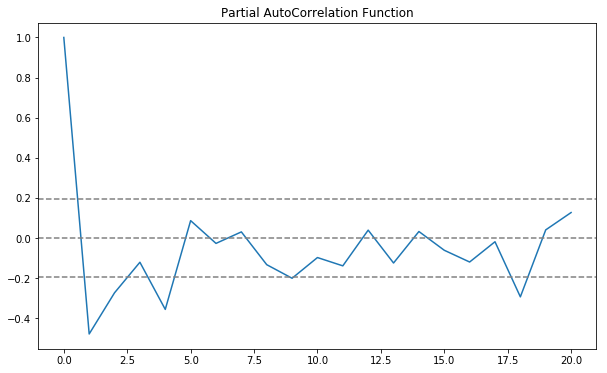

End of ACF PACF plots of
('Store1', 'Product8') 

Start of ACF PACF plots of
('Store1', 'Product80') 



ACF Plot of
('Store1', 'Product80') 



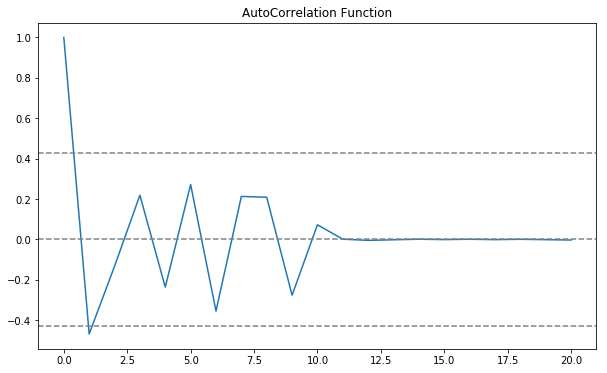

PACF Plot of
('Store1', 'Product80') 



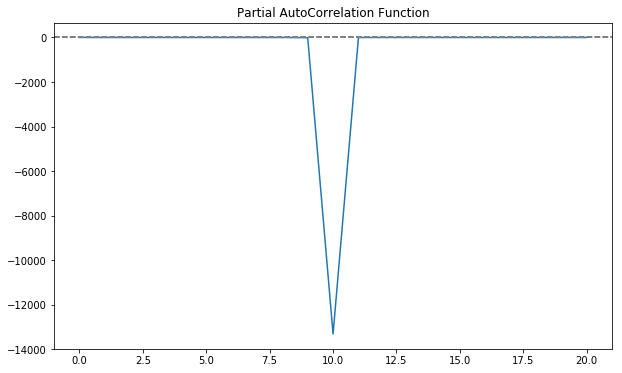

End of ACF PACF plots of
('Store1', 'Product80') 

Start of ACF PACF plots of
('Store1', 'Product81') 



ACF Plot of
('Store1', 'Product81') 



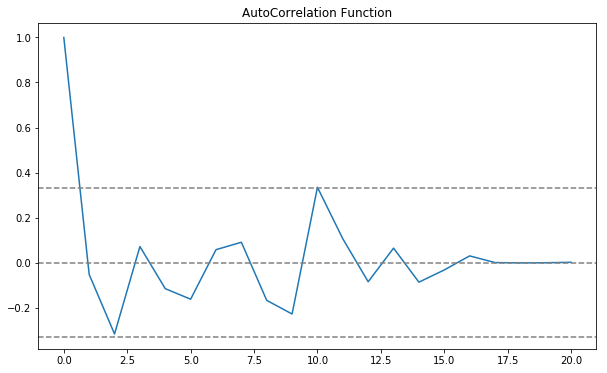

PACF Plot of
('Store1', 'Product81') 



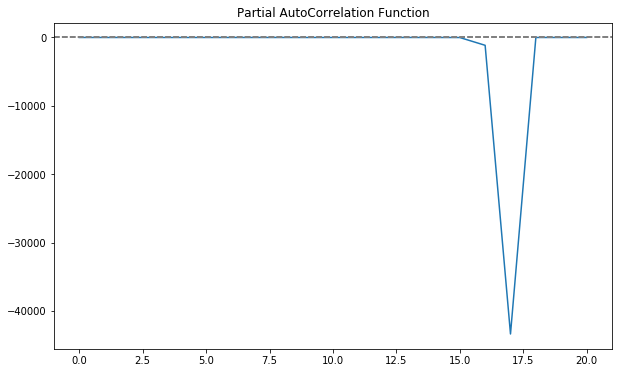

End of ACF PACF plots of
('Store1', 'Product81') 

Start of ACF PACF plots of
('Store1', 'Product82') 



ACF Plot of
('Store1', 'Product82') 



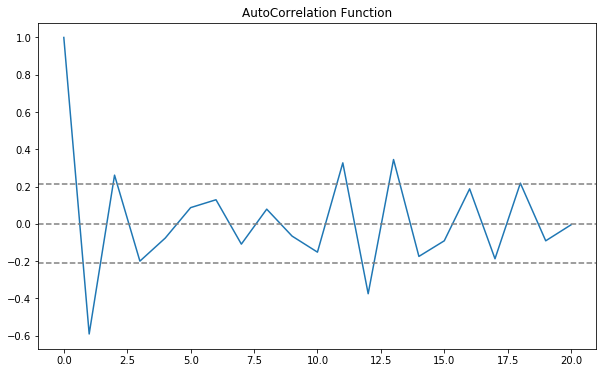

PACF Plot of
('Store1', 'Product82') 



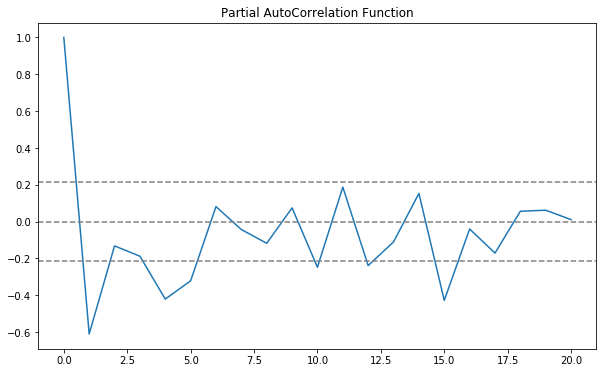

End of ACF PACF plots of
('Store1', 'Product82') 

Start of ACF PACF plots of
('Store1', 'Product83') 



ACF Plot of
('Store1', 'Product83') 



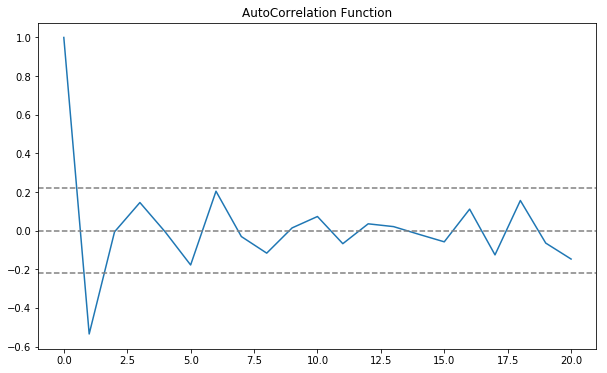

PACF Plot of
('Store1', 'Product83') 



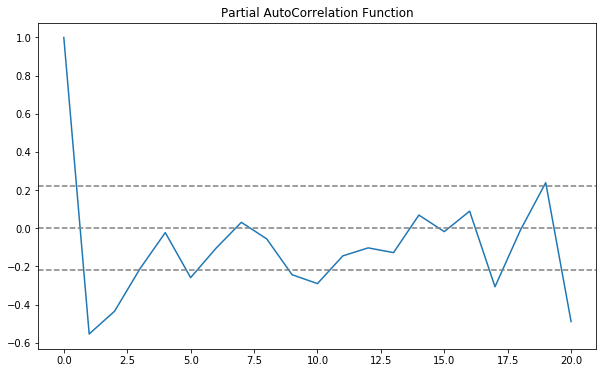

End of ACF PACF plots of
('Store1', 'Product83') 

Start of ACF PACF plots of
('Store1', 'Product84') 



ACF Plot of
('Store1', 'Product84') 



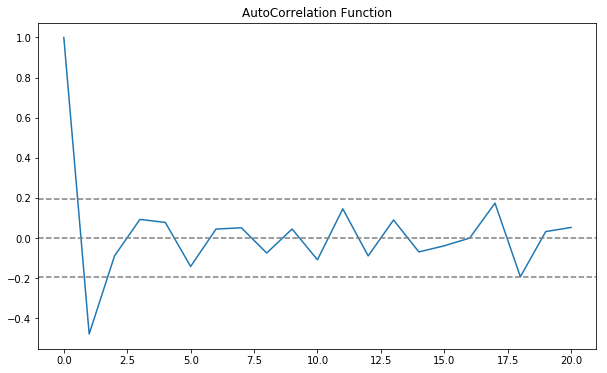

PACF Plot of
('Store1', 'Product84') 



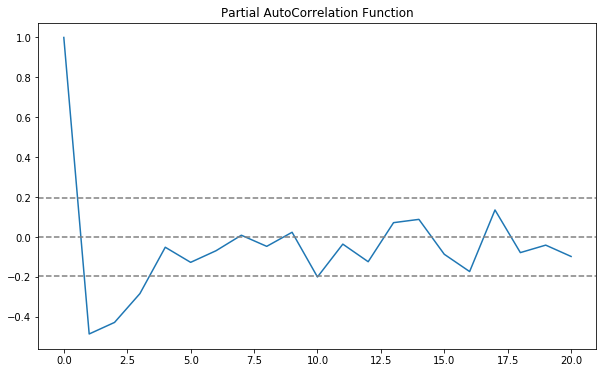

End of ACF PACF plots of
('Store1', 'Product84') 

Start of ACF PACF plots of
('Store1', 'Product85') 



Error in ACF PACF Plots
End of ACF PACF plots of
('Store1', 'Product85') 

Start of ACF PACF plots of
('Store1', 'Product86') 



Error in ACF PACF Plots
End of ACF PACF plots of
('Store1', 'Product86') 

Start of ACF PACF plots of
('Store1', 'Product87') 



ACF Plot of
('Store1', 'Product87') 



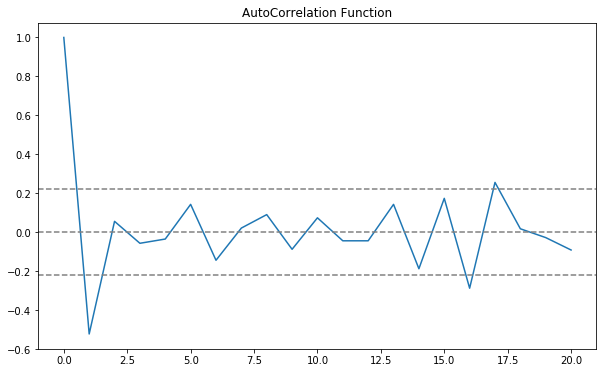

PACF Plot of
('Store1', 'Product87') 



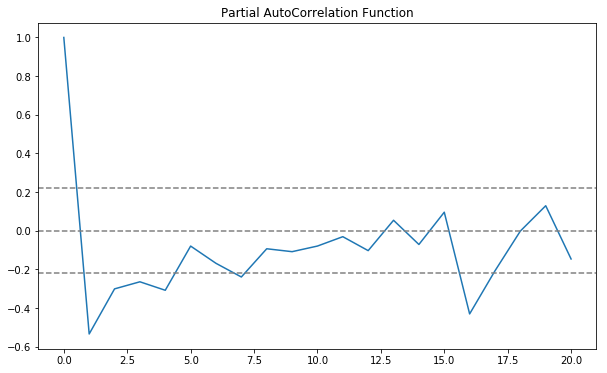

End of ACF PACF plots of
('Store1', 'Product87') 

Start of ACF PACF plots of
('Store1', 'Product88') 



ACF Plot of
('Store1', 'Product88') 



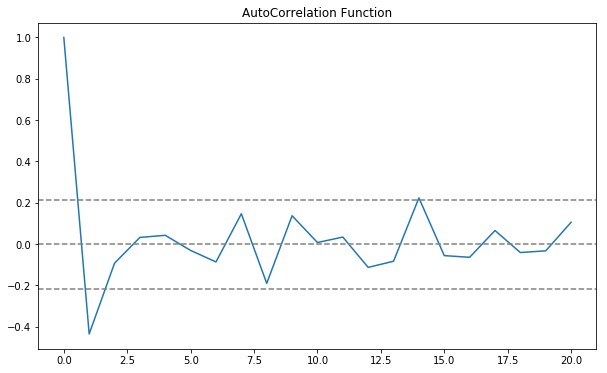

PACF Plot of
('Store1', 'Product88') 



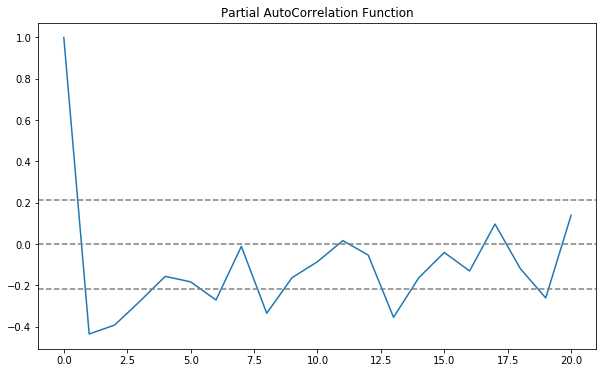

End of ACF PACF plots of
('Store1', 'Product88') 

Start of ACF PACF plots of
('Store1', 'Product89') 



ACF Plot of
('Store1', 'Product89') 



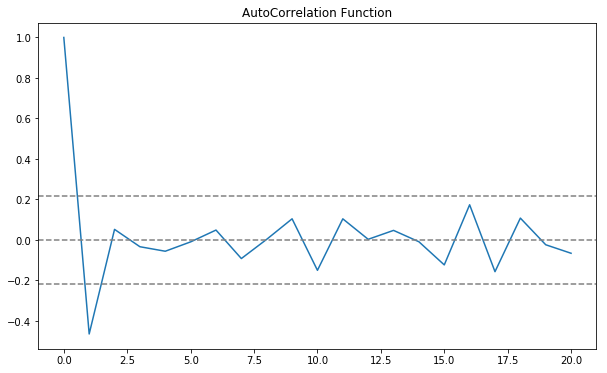

PACF Plot of
('Store1', 'Product89') 



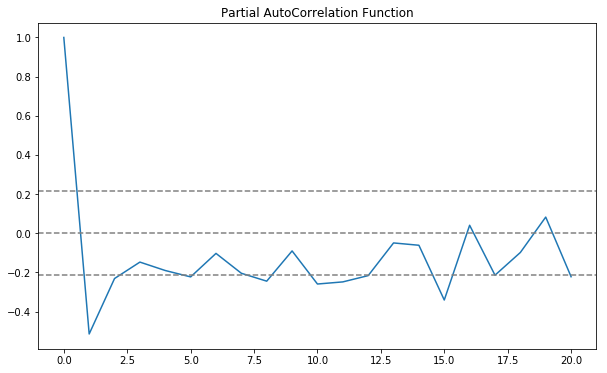

End of ACF PACF plots of
('Store1', 'Product89') 

Start of ACF PACF plots of
('Store1', 'Product9') 



ACF Plot of
('Store1', 'Product9') 



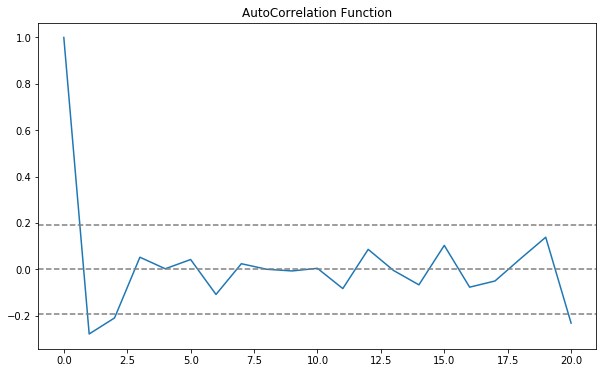

PACF Plot of
('Store1', 'Product9') 



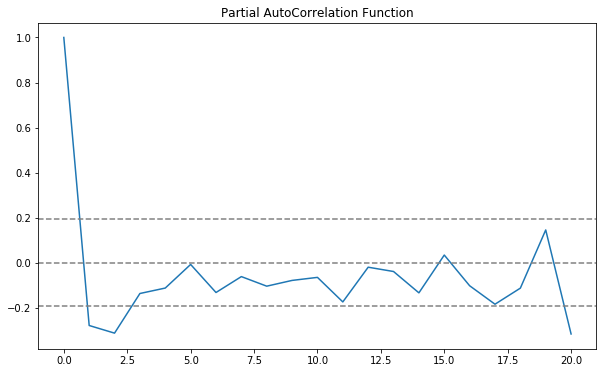

End of ACF PACF plots of
('Store1', 'Product9') 

Start of ACF PACF plots of
('Store1', 'Product90') 



ACF Plot of
('Store1', 'Product90') 



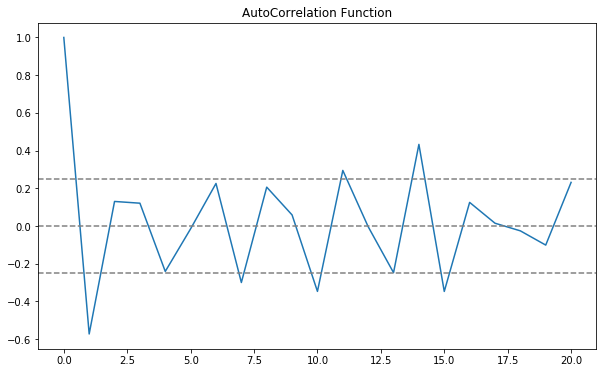

PACF Plot of
('Store1', 'Product90') 



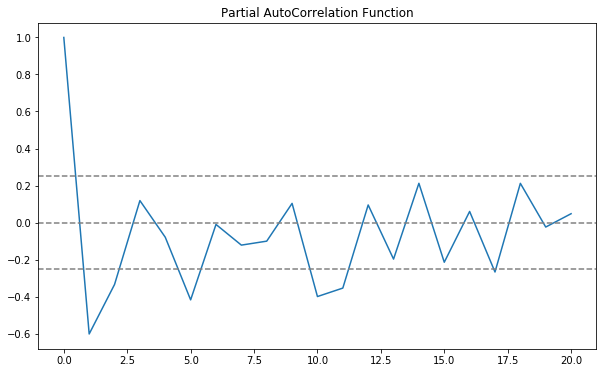

End of ACF PACF plots of
('Store1', 'Product90') 

Start of ACF PACF plots of
('Store1', 'Product91') 



ACF Plot of
('Store1', 'Product91') 



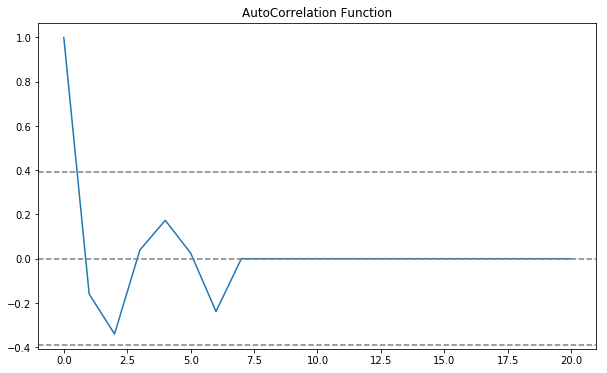

PACF Plot of
('Store1', 'Product91') 



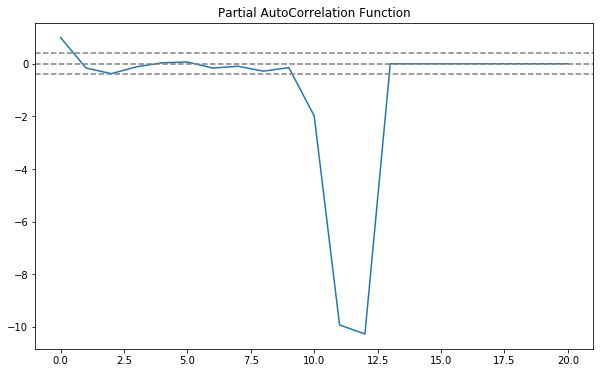

End of ACF PACF plots of
('Store1', 'Product91') 

Start of ACF PACF plots of
('Store1', 'Product92') 



ACF Plot of
('Store1', 'Product92') 



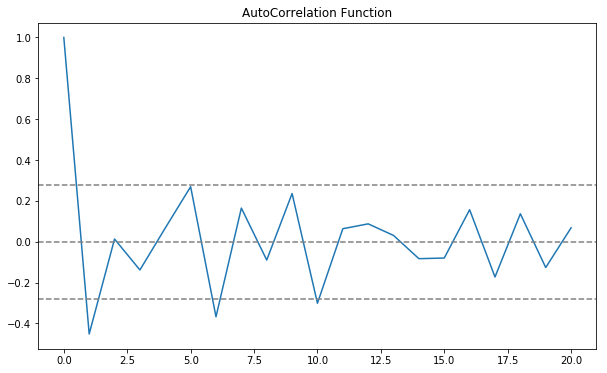

PACF Plot of
('Store1', 'Product92') 



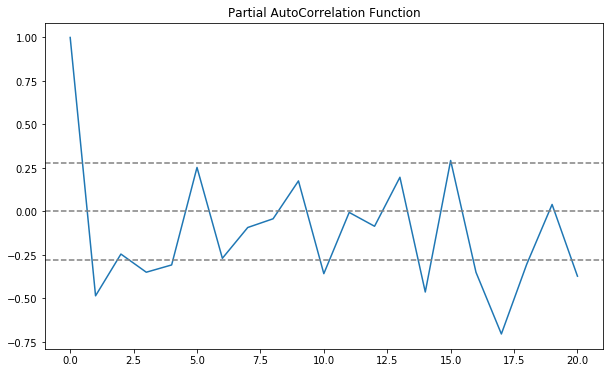

End of ACF PACF plots of
('Store1', 'Product92') 

Start of ACF PACF plots of
('Store1', 'Product93') 



ACF Plot of
('Store1', 'Product93') 



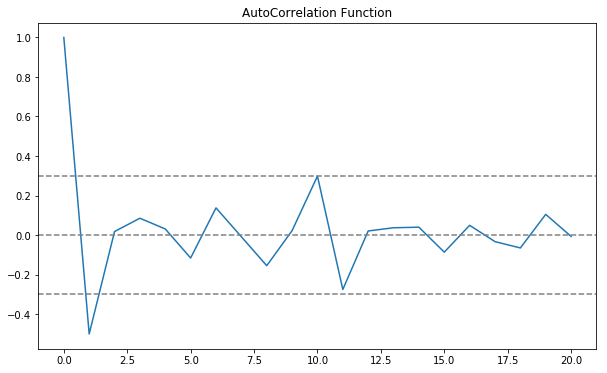

PACF Plot of
('Store1', 'Product93') 



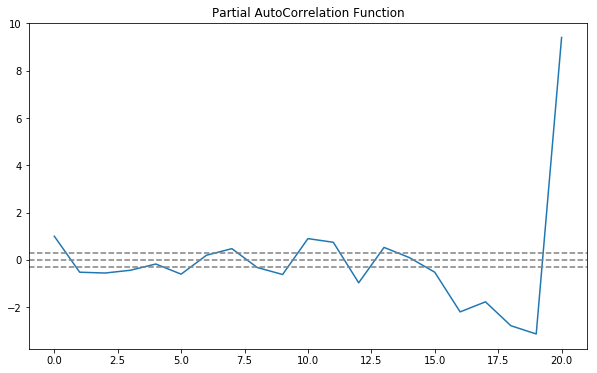

End of ACF PACF plots of
('Store1', 'Product93') 

Start of ACF PACF plots of
('Store1', 'Product94') 



ACF Plot of
('Store1', 'Product94') 



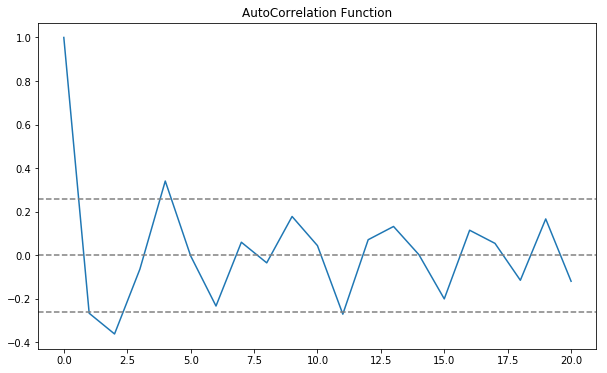

PACF Plot of
('Store1', 'Product94') 



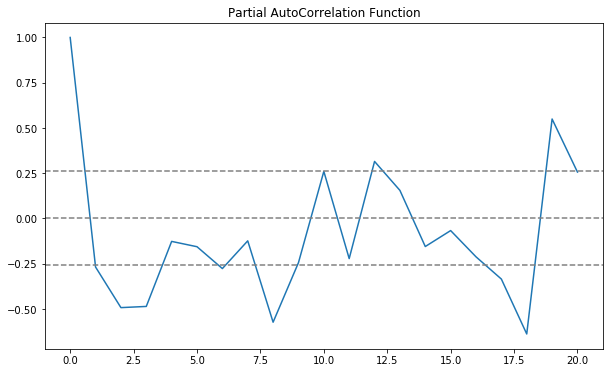

End of ACF PACF plots of
('Store1', 'Product94') 

Start of ACF PACF plots of
('Store1', 'Product95') 



ACF Plot of
('Store1', 'Product95') 



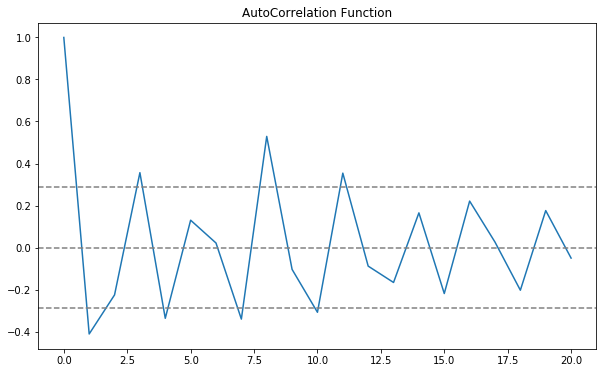

PACF Plot of
('Store1', 'Product95') 



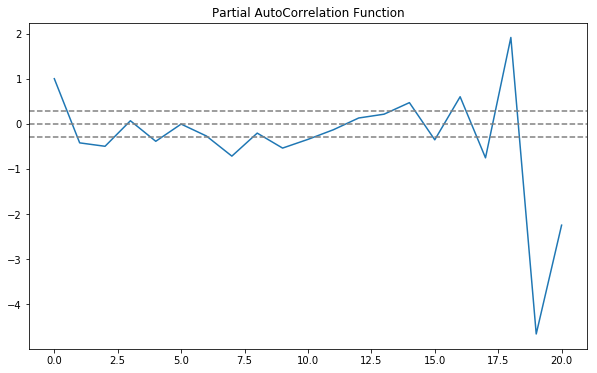

End of ACF PACF plots of
('Store1', 'Product95') 

Start of ACF PACF plots of
('Store1', 'Product96') 



ACF Plot of
('Store1', 'Product96') 



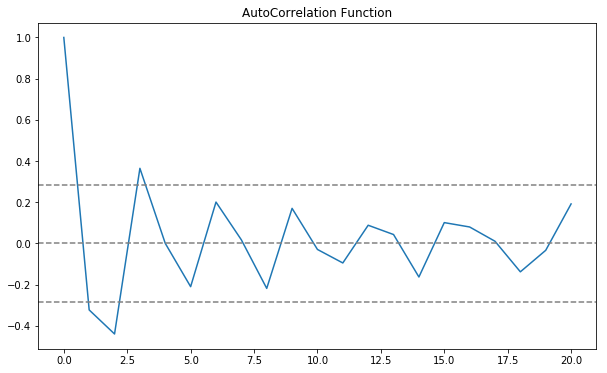

PACF Plot of
('Store1', 'Product96') 



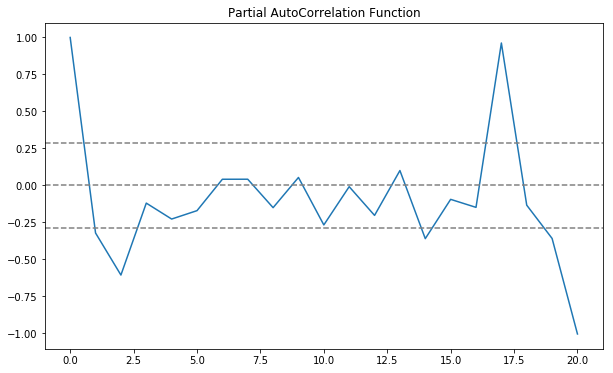

End of ACF PACF plots of
('Store1', 'Product96') 

Start of ACF PACF plots of
('Store1', 'Product97') 



ACF Plot of
('Store1', 'Product97') 



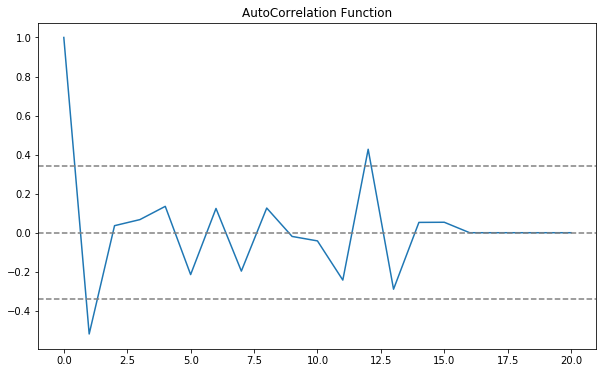

PACF Plot of
('Store1', 'Product97') 



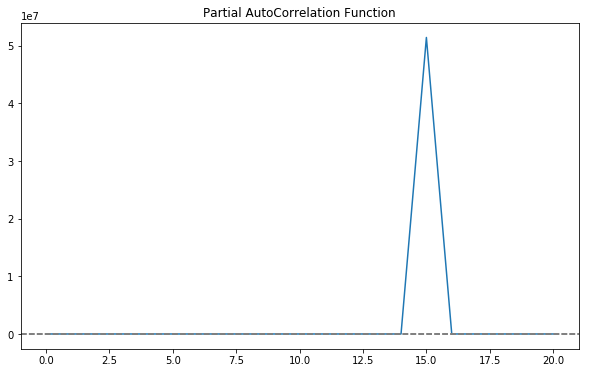

End of ACF PACF plots of
('Store1', 'Product97') 

Start of ACF PACF plots of
('Store1', 'Product98') 



ACF Plot of
('Store1', 'Product98') 



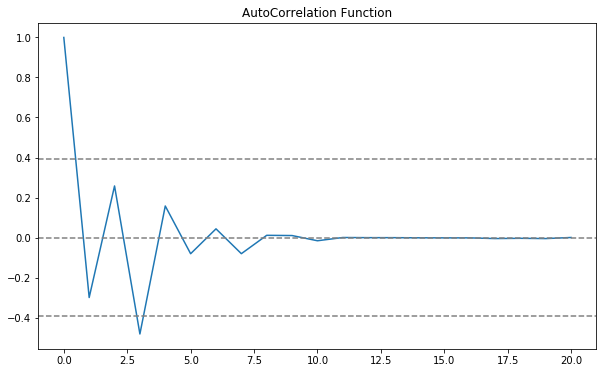

PACF Plot of
('Store1', 'Product98') 



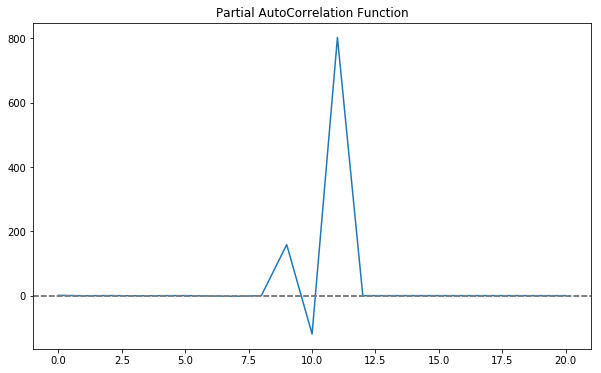

End of ACF PACF plots of
('Store1', 'Product98') 

Start of ACF PACF plots of
('Store1', 'Product99') 



ACF Plot of
('Store1', 'Product99') 



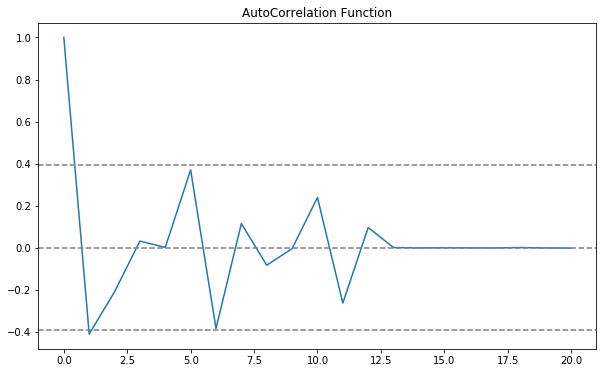

PACF Plot of
('Store1', 'Product99') 



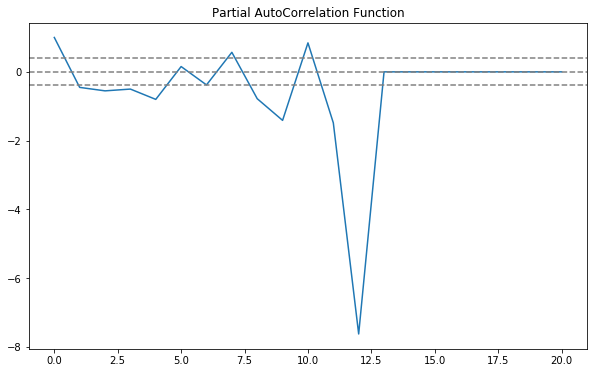

End of ACF PACF plots of
('Store1', 'Product99') 



In [335]:
# ACF PACF plots for StoreX-ProductX series for StoreID 2,3,4,5,6,.., 30 can also be visualized
# p and q values for each StoreX-ProductX series needs to be determined visually which is a very time consuming task
# But if any user is interested they can proceed with the following codes:

# ACF PACF plots for StoreX-ProductX series
for k, v in enumerate(store1_list):
                                    plot_ACF_PACF(spwno_agg_df, v)   

#### In a similar fashion 
#### ACF PACF plots can be plotted for StoreX-ProductX series 

#### Store2-Product series
for k, v in enumerate(store2_list):
                                    plot_ACF_PACF(spwno_agg_df, v)
    
#### Store3-Product series
for k, v in enumerate(store3_list):
                                  plot_ACF_PACF(spwno_agg_df, v)
                                  
#### And so on for Store4-Product series .. Store30-Product series

#### Auto Arima in R

#### Read Store-Product-WeekNo grouped, log valued QuantitySum dataset in R

In [336]:
import warnings
warnings.filterwarnings("ignore")
    
# spwno_agg_df is grouped by Store, Product, WeekNo 
# since we have to pass in log valued dataset to ARIMA function lets take log of spwno_agg_df
sxpx_log = np.log(spwno_agg_df)
    
# replace -inf or inf values with NaN
sxpx_log.replace([np.inf, -np.inf], np.nan, inplace = True)

# fill NaN values with 0
sxpx_log.fillna(0, inplace=True)

# store sxpx_log into sxpx_log_series variable
sxpx_log_series = sxpx_log.to_frame('QuantitySum')

# reset_index on sxpx_log_series to convert to dataframe 
df = sxpx_log_series.reset_index()

# write sxpx dataframe into csv file
df.to_csv('Output_5_1.csv', index = False)

#### Why I have used Auto Arima and Why R?

- Going through ACF and PACF plots to determine the q and p values is:
    - time consuming 
    - not scalable for 5040 Store Product combinations
- Auto Arima takes into account the AIC and BIC values generated to determine the best combination of (p,d,q) values
- Auto Arima is similar to ARIMA-specific grid search but it more of an intelligent stepwise algorithm

- Python gives us three options: ARIMA, grid-search ARIMA and auto ARIMA through pmdarima package. But there were numerous issues that I encountered regarding numpy, '__reduce_cython__' and so on. Hence, I shifted to R which is the best way to do it.

- Below is the R script of how I implemented Auto Arima for 5040 Store-Product combinations to extract the best (p,d,q) values.

#### R Script for Finding p,d,q values for each ARIMA model for each Store Product combination


setwd("D://R")

sxpx_log_df <- read.csv("Input_5_1.csv", header = TRUE)

head(sxpx_log_df)

| Store  | Product  | WeekNo  | QuantitySum |
| :---:  | :------: | :-----: | :--------:  |
| Store1 | Product1 |    1    | 1.504077    |   
| Store1 | Product1 |    2    | 1.504077    |
| Store1 | Product1 |    3    | 1.504077    |
| Store1 | Product1 |    4    | 1.504077    |
| Store1 | Product1 |    5    | 1.504077    |
| Store1 | Product1 |    6    | 1.504077    |

tail(sxpx_log_df)
        
| Store  | Product  | WeekNo  | QuantitySum |
| :---:  | :------: | :-----: | :--------:  |
| Store9 | Product99 |    99    | 0.0000000    |   
| Store9 | Product99 |    100   | 0.0000000    |
| Store9 | Product99 |    101    | 1.6094379    |
| Store9 | Product99 |    102    | 1.9459101    |
| Store9 | Product99 |    103    | 1.9459101    |
| Store9 | Product99 |    104    | 0.6931472    |

sxpx_auto_arima_models <- group_by(sxpx_log_df, Store, Product) %>% do(fit = auto.arima(.$QuantitySum))

head(sxpx_auto_arima_models)

| Store  | Product  | fit  |
| :---:  | :------: | :-----:|
| <fct>  | <fct>     | <list> | 
| Store1 | Product1 |    <S3: ARIMA> |   
| Store1 | Product10 |    <S3: ARIMA>   | 
| Store1 | Product100 |    <S3: ARIMA>    |
| Store1 | Product101 |    <S3: ARIMA>    | 
| Store1 | Product102 |    <S3: ARIMA>    |
| Store1 | Product103 |    <S3: ARIMA>    | 

This gives us the first row which is a Store Product combination

sxpx_auto_arima_models[1,]

[A tibble: 1 x 3
  Store  Product  fit        
  <fct>  <fct>    <list>     
1 Store1 Product1 <S3: ARIMA>]

This gives us the p,d,q values of ARIMA model fit on Store1-Product1 combination along with coefficients, AIC, AICc and BIC

[(sxpx_auto_arima_models$fit[1])

[[1]]

Series: .$QuantitySum 
ARIMA(1,0,0) with non-zero mean 

Coefficients:
         ar1    mean
      0.1886  1.3507
s.e.  0.0972  0.0862

sigma^2 estimated as 0.5065:  log likelihood=-107.97
AIC=221.94   AICc=222.19   BIC=229.79]

In order to save the sxpx_auto_arima_models$fit output lets run the following R code:

[sink("Output_5_2.txt") 

sxpx_auto_arima_models$fit[1:1000]

sink()

sink("Output_5_3.txt") 

sxpx_auto_arima_models$fit[1001:2000]

sink()

sink("Output_5_4.txt") 

sxpx_auto_arima_models$fit[2001:3000]

sink()

sink("Output_5_5.txt") 

sxpx_auto_arima_models$fit[3001:4000]

sink()

sink("Output_5_6.txt") 

sxpx_auto_arima_models$fit[4001:5000]

sink()

sink("Output_5_7.txt") 

sxpx_auto_arima_models$fit[5001:5040]

sink()]

#### StoreX-ProductX p d q values from AUTO ARIMA R stored in a file

Using all the ARIMA (p,d,q) values for 5040 combinations from Output_5_2.txt, Output_5_3.txt, Output_5_4.txt, Output_5_5.txt, Output_5_6.txt, Output_5_7.txt

Input File: `Input_5_2.txt` (contains Store,Product,p,d,q values for all 5040 combinations at one place)


#### StoreX-ProductX p d q values from AUTO ARIMA R

In [337]:
# StoreX ProductX combinations with their respective p, d, q values extracted from AUTO ARIMA R present in form of list[list]
sp_acf_pacf_list = [['Store1','Product1',1,0,0], ['Store1','Product10',1,0,0], ['Store1','Product100',1,0,0], ['Store1','Product101',0,0,0], ['Store1','Product102',2,0,1], ['Store1','Product103',1,0,0], ['Store1','Product104',0,0,0], ['Store1','Product105',0,0,0], ['Store1','Product106',0,0,1], ['Store1','Product107',0,0,0], ['Store1','Product108',0,0,0], ['Store1','Product109',2,1,2], ['Store1','Product11',1,0,0], ['Store1','Product110',0,0,0], ['Store1','Product111',0,1,0], ['Store1','Product112',0,0,0], ['Store1','Product113',3,0,0], ['Store1','Product114',1,0,1], ['Store1','Product115',0,0,1], ['Store1','Product116',2,1,1], ['Store1','Product117',0,0,0], ['Store1','Product118',0,0,0], ['Store1','Product119',0,0,0], ['Store1','Product12',0,0,0], ['Store1','Product121',0,0,0], ['Store1','Product122',2,0,2], ['Store1','Product123',0,0,0], ['Store1','Product124',0,0,0], ['Store1','Product125',0,0,1], ['Store1','Product126',0,0,1], ['Store1','Product127',0,0,0], ['Store1','Product128',0,0,0], ['Store1','Product129',0,0,0], ['Store1','Product13',0,0,1], ['Store1','Product130',2,1,0], ['Store1','Product131',0,0,0], ['Store1','Product132',0,0,0], ['Store1','Product133',0,0,0], ['Store1','Product134',0,0,0], ['Store1','Product136',0,0,0], ['Store1','Product137',0,0,0], ['Store1','Product138',1,1,1], ['Store1','Product139',0,0,0], ['Store1','Product14',2,0,0], ['Store1','Product140',0,0,0], ['Store1','Product141',0,0,0], ['Store1','Product142',0,0,0], ['Store1','Product143',0,0,0], ['Store1','Product144',0,0,0], ['Store1','Product145',0,0,0], ['Store1','Product146',1,0,0], ['Store1','Product147',0,0,0], ['Store1','Product148',0,0,0], ['Store1','Product149',0,0,0], ['Store1','Product15',0,1,1], ['Store1','Product150',0,0,0], ['Store1','Product151',0,0,0], ['Store1','Product152',0,0,0], ['Store1','Product154',1,0,0], ['Store1','Product155',1,0,0], ['Store1','Product156',0,0,0], ['Store1','Product157',0,0,0], ['Store1','Product158',0,0,1], ['Store1','Product159',0,0,1], ['Store1','Product16',0,1,1], ['Store1','Product160',0,0,1], ['Store1','Product161',0,0,1], ['Store1','Product162',0,0,0], ['Store1','Product164',1,0,0], ['Store1','Product165',0,0,0], ['Store1','Product167',0,0,0], ['Store1','Product17',1,1,1], ['Store1','Product170',0,0,0], ['Store1','Product173',0,0,0], ['Store1','Product177',0,0,0], ['Store1','Product18',0,1,1], ['Store1','Product19',0,1,2], ['Store1','Product2',0,1,1], ['Store1','Product20',3,1,1], ['Store1','Product21',2,0,2], ['Store1','Product22',0,0,0], ['Store1','Product23',0,1,1], ['Store1','Product24',0,0,0], ['Store1','Product25',2,0,1], ['Store1','Product26',0,0,0], ['Store1','Product27',1,0,0], ['Store1','Product28',1,0,0], ['Store1','Product29',1,0,0], ['Store1','Product3',1,1,2], ['Store1','Product30',0,0,0], ['Store1','Product31',2,1,1], ['Store1','Product32',0,0,1], ['Store1','Product33',1,0,0], ['Store1','Product34',1,0,0], ['Store1','Product35',2,0,2], ['Store1','Product36',3,1,2], ['Store1','Product37',0,0,1], ['Store1','Product38',0,0,2], ['Store1','Product39',1,0,0], ['Store1','Product4',0,1,1], ['Store1','Product40',0,0,0], ['Store1','Product41',0,0,1], ['Store1','Product42',3,1,1], ['Store1','Product43',0,0,0], ['Store1','Product44',0,1,1], ['Store1','Product45',2,1,1], ['Store1','Product46',0,1,2], ['Store1','Product47',3,1,1], ['Store1','Product48',0,0,0], ['Store1','Product49',0,0,0], ['Store1','Product5',0,1,1], ['Store1','Product50',1,0,0], ['Store1','Product51',0,0,0], ['Store1','Product52',3,0,0], ['Store1','Product53',0,0,0], ['Store1','Product54',0,0,0], ['Store1','Product55',0,1,2], ['Store1','Product56',0,1,1], ['Store1','Product57',0,0,0], ['Store1','Product58',2,1,1], ['Store1','Product59',0,0,0], ['Store1','Product6',1,0,0], ['Store1','Product60',0,0,0], ['Store1','Product61',1,0,0], ['Store1','Product62',0,0,1], ['Store1','Product63',0,1,1], ['Store1','Product64',1,0,0], ['Store1','Product65',0,0,0], ['Store1','Product66',0,0,1], ['Store1','Product67',0,0,0], ['Store1','Product68',0,0,0], ['Store1','Product69',3,0,2], ['Store1','Product7',0,0,1], ['Store1','Product70',1,0,0], ['Store1','Product71',0,0,0], ['Store1','Product72',0,0,0], ['Store1','Product73',0,0,3], ['Store1','Product74',0,1,1], ['Store1','Product75',0,0,1], ['Store1','Product76',0,0,0], ['Store1','Product77',0,0,0], ['Store1','Product78',0,0,0], ['Store1','Product79',0,0,0], ['Store1','Product8',1,0,1], ['Store1','Product80',0,0,0], ['Store1','Product81',0,0,1], ['Store1','Product82',0,1,1], ['Store1','Product83',0,1,1], ['Store1','Product84',1,0,1], ['Store1','Product85',0,0,0], ['Store1','Product86',0,0,0], ['Store1','Product87',0,0,0], ['Store1','Product88',0,0,0], ['Store1','Product89',0,1,1], ['Store1','Product9',1,0,0], ['Store1','Product90',2,0,2], ['Store1','Product91',1,0,0], ['Store1','Product92',0,1,1], ['Store1','Product93',0,0,0], ['Store1','Product94',2,0,0], ['Store1','Product95',0,0,0], ['Store1','Product96',2,1,0], ['Store1','Product97',2,0,0], ['Store1','Product98',1,0,0], ['Store1','Product99',0,0,0], ['Store10','Product1',1,0,0], ['Store10','Product10',1,0,0], ['Store10','Product100',0,0,1], ['Store10','Product101',0,0,0], ['Store10','Product102',0,0,0], ['Store10','Product103',0,0,0], ['Store10','Product104',0,0,0], ['Store10','Product105',0,0,0], ['Store10','Product106',0,1,1], ['Store10','Product107',0,1,1], ['Store10','Product108',0,1,0], ['Store10','Product109',0,1,0], ['Store10','Product11',0,0,0], ['Store10','Product110',0,0,1], ['Store10','Product111',1,0,0], ['Store10','Product112',0,0,0], ['Store10','Product113',0,0,0], ['Store10','Product114',3,0,0], ['Store10','Product115',0,0,0], ['Store10','Product116',2,1,1], ['Store10','Product117',0,0,0], ['Store10','Product118',0,0,0], ['Store10','Product119',0,0,0], ['Store10','Product12',1,0,0], ['Store10','Product121',0,0,0], ['Store10','Product122',0,0,0], ['Store10','Product123',2,1,0], ['Store10','Product124',0,0,0], ['Store10','Product125',0,0,0], ['Store10','Product126',0,0,1], ['Store10','Product127',0,0,0], ['Store10','Product128',0,0,0], ['Store10','Product129',0,0,0], ['Store10','Product13',1,0,0], ['Store10','Product130',0,0,0], ['Store10','Product131',0,0,0], ['Store10','Product132',0,0,0], ['Store10','Product133',0,0,0], ['Store10','Product134',0,1,0], ['Store10','Product135',0,0,0], ['Store10','Product136',0,0,0], ['Store10','Product137',0,0,0], ['Store10','Product138',1,0,0], ['Store10','Product139',0,0,0], ['Store10','Product14',0,1,1], ['Store10','Product140',0,0,0], ['Store10','Product141',1,0,0], ['Store10','Product142',0,0,0], ['Store10','Product143',0,0,0], ['Store10','Product144',0,0,1], ['Store10','Product145',0,0,0], ['Store10','Product146',0,1,1], ['Store10','Product147',0,0,0], ['Store10','Product148',0,0,0], ['Store10','Product149',0,0,0], ['Store10','Product15',0,0,0], ['Store10','Product150',0,0,0], ['Store10','Product151',0,0,0], ['Store10','Product152',0,0,0], ['Store10','Product154',0,0,0], ['Store10','Product155',0,0,0], ['Store10','Product156',0,0,0], ['Store10','Product157',0,0,0], ['Store10','Product158',0,0,0], ['Store10','Product159',0,0,0], ['Store10','Product16',1,1,1], ['Store10','Product160',0,0,0], ['Store10','Product161',0,0,0], ['Store10','Product162',0,0,0], ['Store10','Product163',0,0,0], ['Store10','Product164',0,0,0], ['Store10','Product165',0,0,0], ['Store10','Product168',0,0,0], ['Store10','Product169',0,0,0], ['Store10','Product17',0,1,1], ['Store10','Product170',0,0,0], ['Store10','Product171',0,0,0], ['Store10','Product172',0,0,0], ['Store10','Product173',0,0,0], ['Store10','Product18',4,1,0], ['Store10','Product181',0,0,0], ['Store10','Product19',2,1,0], ['Store10','Product2',0,0,1], ['Store10','Product20',0,1,1], ['Store10','Product21',1,0,0], ['Store10','Product22',0,0,0], ['Store10','Product23',1,0,0], ['Store10','Product24',0,0,0], ['Store10','Product25',0,0,0], ['Store10','Product26',1,0,0], ['Store10','Product27',0,0,1], ['Store10','Product28',0,0,3], ['Store10','Product29',1,0,0], ['Store10','Product3',0,1,1], ['Store10','Product30',0,0,0], ['Store10','Product31',1,0,1], ['Store10','Product32',0,1,1], ['Store10','Product33',0,0,0], ['Store10','Product34',0,0,0], ['Store10','Product35',0,0,1], ['Store10','Product36',0,1,2], ['Store10','Product37',0,1,1], ['Store10','Product38',0,1,1], ['Store10','Product39',3,0,0], ['Store10','Product4',1,0,0], ['Store10','Product40',0,1,1], ['Store10','Product41',0,0,0], ['Store10','Product42',0,1,1], ['Store10','Product43',0,1,0], ['Store10','Product44',0,1,1], ['Store10','Product45',4,1,0], ['Store10','Product46',2,1,3], ['Store10','Product47',1,1,1], ['Store10','Product48',0,0,0], ['Store10','Product49',1,0,0], ['Store10','Product5',0,1,2], ['Store10','Product50',3,1,0], ['Store10','Product51',0,0,0], ['Store10','Product52',1,0,0], ['Store10','Product53',0,0,0], ['Store10','Product54',1,0,0], ['Store10','Product55',1,0,0], ['Store10','Product56',0,1,2], ['Store10','Product57',0,0,3], ['Store10','Product58',1,0,0], ['Store10','Product59',1,0,0], ['Store10','Product6',0,1,0], ['Store10','Product60',0,0,1], ['Store10','Product61',1,0,0], ['Store10','Product62',0,0,0], ['Store10','Product63',0,0,0], ['Store10','Product64',0,1,1], ['Store10','Product65',0,0,0], ['Store10','Product66',3,0,0], ['Store10','Product67',2,1,2], ['Store10','Product68',0,0,3], ['Store10','Product69',0,0,0], ['Store10','Product7',0,0,1], ['Store10','Product70',1,0,0], ['Store10','Product71',0,0,3], ['Store10','Product72',0,0,0], ['Store10','Product73',2,0,0], ['Store10','Product74',0,1,1], ['Store10','Product75',2,1,1], ['Store10','Product76',0,0,0], ['Store10','Product77',0,0,0], ['Store10','Product78',0,0,1], ['Store10','Product79',1,0,2], ['Store10','Product8',1,0,0], ['Store10','Product80',0,0,0], ['Store10','Product81',0,0,1], ['Store10','Product82',0,0,0], ['Store10','Product83',0,0,0], ['Store10','Product84',2,0,0], ['Store10','Product85',2,1,0], ['Store10','Product86',1,0,0], ['Store10','Product87',0,0,0], ['Store10','Product88',3,1,0], ['Store10','Product89',0,0,0], ['Store10','Product9',0,0,0], ['Store10','Product90',0,0,1], ['Store10','Product91',0,0,1], ['Store10','Product92',0,0,0], ['Store10','Product93',1,1,0], ['Store10','Product94',0,0,0], ['Store10','Product95',2,0,1], ['Store10','Product96',0,0,0], ['Store10','Product97',0,0,1], ['Store10','Product98',0,0,0], ['Store10','Product99',0,0,1], ['Store11','Product1',1,1,2], ['Store11','Product10',0,0,1], ['Store11','Product100',3,0,1], ['Store11','Product101',0,0,0], ['Store11','Product102',0,0,1], ['Store11','Product103',1,0,0], ['Store11','Product104',0,1,1], ['Store11','Product105',1,0,0], ['Store11','Product106',0,0,1], ['Store11','Product107',0,0,0], ['Store11','Product108',0,1,1], ['Store11','Product109',0,1,1], ['Store11','Product11',0,1,1], ['Store11','Product110',0,0,0], ['Store11','Product111',0,0,0], ['Store11','Product112',0,0,1], ['Store11','Product113',0,0,0], ['Store11','Product114',0,0,0], ['Store11','Product115',0,0,0], ['Store11','Product116',0,0,0], ['Store11','Product117',1,0,0], ['Store11','Product118',1,0,0], ['Store11','Product119',0,0,0], ['Store11','Product12',0,1,1], ['Store11','Product120',0,0,0], ['Store11','Product121',0,0,0], ['Store11','Product122',0,0,1], ['Store11','Product123',0,0,0], ['Store11','Product124',0,0,0], ['Store11','Product125',0,0,1], ['Store11','Product126',0,0,1], ['Store11','Product127',0,0,0], ['Store11','Product128',0,0,0], ['Store11','Product129',0,0,2], ['Store11','Product13',1,1,1], ['Store11','Product130',0,0,0], ['Store11','Product131',0,0,0], ['Store11','Product132',2,1,1], ['Store11','Product133',0,0,0], ['Store11','Product134',0,0,0], ['Store11','Product135',0,0,0], ['Store11','Product136',0,0,0], ['Store11','Product137',0,0,2], ['Store11','Product138',1,0,0], ['Store11','Product14',2,0,0], ['Store11','Product140',0,0,1], ['Store11','Product141',0,0,0], ['Store11','Product142',0,0,0], ['Store11','Product143',1,0,0], ['Store11','Product144',0,0,0], ['Store11','Product145',0,0,0], ['Store11','Product146',0,0,0], ['Store11','Product147',0,0,0], ['Store11','Product148',1,0,0], ['Store11','Product149',1,0,0], ['Store11','Product15',0,1,1], ['Store11','Product150',0,0,0], ['Store11','Product151',0,0,0], ['Store11','Product152',0,0,0], ['Store11','Product153',0,0,0], ['Store11','Product154',0,0,0], ['Store11','Product155',0,0,0], ['Store11','Product156',0,0,0], ['Store11','Product157',0,0,0], ['Store11','Product158',0,0,0], ['Store11','Product159',0,0,0], ['Store11','Product16',1,0,0], ['Store11','Product160',0,0,0], ['Store11','Product161',0,1,2], ['Store11','Product162',0,0,0], ['Store11','Product163',0,0,0], ['Store11','Product164',0,1,0], ['Store11','Product165',0,0,0], ['Store11','Product166',0,0,0], ['Store11','Product167',0,0,0], ['Store11','Product169',0,0,0], ['Store11','Product17',1,1,1], ['Store11','Product170',0,0,0], ['Store11','Product173',0,0,0], ['Store11','Product175',0,0,0], ['Store11','Product178',0,0,0], ['Store11','Product179',0,0,0], ['Store11','Product18',0,0,1], ['Store11','Product181',0,0,0], ['Store11','Product19',1,1,1], ['Store11','Product2',0,0,0], ['Store11','Product20',1,1,1], ['Store11','Product21',0,1,2], ['Store11','Product22',1,0,0], ['Store11','Product23',0,0,0], ['Store11','Product24',0,1,1], ['Store11','Product25',0,0,0], ['Store11','Product26',2,0,0], ['Store11','Product27',1,0,0], ['Store11','Product28',0,1,0], ['Store11','Product29',1,0,0], ['Store11','Product3',0,1,2], ['Store11','Product30',0,0,0], ['Store11','Product31',1,1,1], ['Store11','Product32',1,0,0], ['Store11','Product33',0,0,0], ['Store11','Product34',0,0,0], ['Store11','Product35',0,0,1], ['Store11','Product36',0,1,1], ['Store11','Product37',0,1,0], ['Store11','Product38',0,0,0], ['Store11','Product39',0,0,0], ['Store11','Product4',0,1,1], ['Store11','Product40',4,1,0], ['Store11','Product41',0,0,0], ['Store11','Product42',0,1,0], ['Store11','Product43',0,1,1], ['Store11','Product44',0,1,2], ['Store11','Product45',0,1,1], ['Store11','Product46',1,0,0], ['Store11','Product47',0,0,0], ['Store11','Product48',0,1,1], ['Store11','Product49',0,0,0], ['Store11','Product5',1,0,0], ['Store11','Product50',0,0,0], ['Store11','Product51',0,0,0], ['Store11','Product52',1,0,0], ['Store11','Product54',0,0,0], ['Store11','Product55',0,1,1], ['Store11','Product56',0,1,1], ['Store11','Product57',0,1,1], ['Store11','Product58',1,1,1], ['Store11','Product59',0,0,0], ['Store11','Product6',0,0,0], ['Store11','Product60',1,0,0], ['Store11','Product61',2,1,0], ['Store11','Product62',0,1,1], ['Store11','Product63',0,1,1], ['Store11','Product64',1,1,0], ['Store11','Product65',3,1,0], ['Store11','Product66',2,1,1], ['Store11','Product67',0,1,1], ['Store11','Product68',0,0,1], ['Store11','Product69',2,1,0], ['Store11','Product7',0,0,1], ['Store11','Product70',0,1,0], ['Store11','Product71',0,0,0], ['Store11','Product72',0,0,0], ['Store11','Product73',2,0,2], ['Store11','Product74',0,0,0], ['Store11','Product75',0,0,0], ['Store11','Product76',0,0,0], ['Store11','Product77',0,0,1], ['Store11','Product78',0,0,1], ['Store11','Product79',3,0,0], ['Store11','Product8',1,0,0], ['Store11','Product80',0,0,1], ['Store11','Product81',2,0,0], ['Store11','Product82',0,1,1], ['Store11','Product83',0,0,0], ['Store11','Product84',1,1,1], ['Store11','Product85',1,0,0], ['Store11','Product86',0,0,0], ['Store11','Product87',0,0,1], ['Store11','Product88',1,1,1], ['Store11','Product89',0,0,1], ['Store11','Product9',1,0,0], ['Store11','Product90',0,0,0], ['Store11','Product91',0,0,0], ['Store11','Product92',0,0,0], ['Store11','Product93',1,1,0], ['Store11','Product94',1,0,1], ['Store11','Product95',0,0,1], ['Store11','Product96',0,0,0], ['Store11','Product97',0,0,1], ['Store11','Product98',0,0,0], ['Store11','Product99',0,0,0], ['Store12','Product1',1,0,0], ['Store12','Product10',1,0,0], ['Store12','Product100',0,0,0], ['Store12','Product101',0,0,0], ['Store12','Product102',1,0,1], ['Store12','Product103',1,0,1], ['Store12','Product104',1,0,0], ['Store12','Product105',1,0,1], ['Store12','Product106',1,0,0], ['Store12','Product107',0,0,0], ['Store12','Product108',2,1,0], ['Store12','Product109',0,0,0], ['Store12','Product11',1,1,1], ['Store12','Product110',0,0,0], ['Store12','Product111',0,1,1], ['Store12','Product112',1,0,0], ['Store12','Product113',0,0,1], ['Store12','Product114',0,0,0], ['Store12','Product115',2,1,0], ['Store12','Product116',0,1,1], ['Store12','Product117',0,0,0], ['Store12','Product118',0,0,0], ['Store12','Product119',0,0,0], ['Store12','Product12',2,0,0], ['Store12','Product120',0,0,0], ['Store12','Product121',0,0,0], ['Store12','Product122',0,0,1], ['Store12','Product123',1,0,0], ['Store12','Product124',0,0,0], ['Store12','Product125',1,0,0], ['Store12','Product126',0,0,0], ['Store12','Product127',0,0,0], ['Store12','Product128',0,0,0], ['Store12','Product129',1,1,0], ['Store12','Product13',1,0,1], ['Store12','Product130',1,1,0], ['Store12','Product131',0,1,1], ['Store12','Product132',0,0,0], ['Store12','Product133',1,0,0], ['Store12','Product134',0,0,0], ['Store12','Product135',0,0,1], ['Store12','Product136',0,0,0], ['Store12','Product137',0,0,0], ['Store12','Product138',0,1,1], ['Store12','Product14',0,1,2], ['Store12','Product140',1,0,0], ['Store12','Product141',0,0,0], ['Store12','Product142',0,0,0], ['Store12','Product143',2,1,0], ['Store12','Product144',1,0,0], ['Store12','Product145',0,0,0], ['Store12','Product146',0,0,1], ['Store12','Product147',0,0,0], ['Store12','Product148',0,0,0], ['Store12','Product149',0,0,0], ['Store12','Product15',0,1,0], ['Store12','Product150',0,0,0], ['Store12','Product151',0,0,0], ['Store12','Product152',0,1,1], ['Store12','Product154',0,0,0], ['Store12','Product155',0,0,0], ['Store12','Product156',0,0,0], ['Store12','Product158',0,0,0], ['Store12','Product159',1,0,0], ['Store12','Product16',1,0,1], ['Store12','Product160',0,1,0], ['Store12','Product161',1,1,0], ['Store12','Product162',0,0,0], ['Store12','Product164',0,0,0], ['Store12','Product165',0,0,0], ['Store12','Product169',0,0,0], ['Store12','Product17',2,1,1], ['Store12','Product170',0,0,0], ['Store12','Product176',0,0,0], ['Store12','Product18',0,1,1], ['Store12','Product181',0,0,0], ['Store12','Product19',3,1,0], ['Store12','Product2',1,0,0], ['Store12','Product20',1,0,0], ['Store12','Product21',0,1,1], ['Store12','Product22',0,0,0], ['Store12','Product23',0,0,0], ['Store12','Product24',0,0,0], ['Store12','Product25',0,0,0], ['Store12','Product26',0,0,1], ['Store12','Product27',1,0,0], ['Store12','Product28',0,0,1], ['Store12','Product29',0,0,1], ['Store12','Product3',1,1,0], ['Store12','Product30',0,0,0], ['Store12','Product31',0,1,1], ['Store12','Product32',1,1,1], ['Store12','Product33',0,1,0], ['Store12','Product34',1,0,0], ['Store12','Product35',1,0,0], ['Store12','Product36',0,0,1], ['Store12','Product37',0,1,1], ['Store12','Product38',0,1,0], ['Store12','Product39',1,0,0], ['Store12','Product4',0,1,1], ['Store12','Product40',0,0,1], ['Store12','Product41',0,0,0], ['Store12','Product42',0,1,1], ['Store12','Product43',0,0,0], ['Store12','Product44',0,1,1], ['Store12','Product45',2,1,3], ['Store12','Product46',2,0,0], ['Store12','Product47',1,0,0], ['Store12','Product48',0,0,0], ['Store12','Product49',0,0,0], ['Store12','Product5',0,0,1], ['Store12','Product50',0,0,0], ['Store12','Product51',0,0,0], ['Store12','Product52',2,0,2], ['Store12','Product54',0,0,0], ['Store12','Product55',1,0,0], ['Store12','Product56',0,0,0], ['Store12','Product57',0,0,0], ['Store12','Product58',1,1,1], ['Store12','Product59',0,0,0], ['Store12','Product6',0,0,0], ['Store12','Product60',1,0,0], ['Store12','Product61',1,0,0], ['Store12','Product62',0,0,1], ['Store12','Product63',2,1,0], ['Store12','Product64',0,1,1], ['Store12','Product65',0,1,1], ['Store12','Product66',1,0,0], ['Store12','Product67',3,1,0], ['Store12','Product68',2,0,2], ['Store12','Product69',0,1,2], ['Store12','Product7',0,0,0], ['Store12','Product70',1,0,0], ['Store12','Product71',1,0,0], ['Store12','Product72',3,1,0], ['Store12','Product73',0,0,2], ['Store12','Product74',0,1,1], ['Store12','Product75',0,0,0], ['Store12','Product76',0,0,0], ['Store12','Product77',0,0,0], ['Store12','Product78',0,0,1], ['Store12','Product79',0,0,0], ['Store12','Product8',1,0,0], ['Store12','Product80',0,0,0], ['Store12','Product81',0,0,0], ['Store12','Product82',3,1,0], ['Store12','Product83',0,0,0], ['Store12','Product84',1,0,0], ['Store12','Product85',0,0,0], ['Store12','Product86',1,0,0], ['Store12','Product87',3,1,0], ['Store12','Product88',0,1,1], ['Store12','Product89',1,1,1], ['Store12','Product9',1,0,1], ['Store12','Product90',3,1,0], ['Store12','Product91',0,0,0], ['Store12','Product92',0,1,0], ['Store12','Product93',0,1,0], ['Store12','Product94',2,0,2], ['Store12','Product95',3,1,1], ['Store12','Product96',1,1,1], ['Store12','Product97',0,0,0], ['Store12','Product98',0,0,0], ['Store12','Product99',0,0,0], ['Store13','Product1',0,1,1], ['Store13','Product10',1,0,0], ['Store13','Product100',0,1,0], ['Store13','Product101',0,0,0], ['Store13','Product102',0,0,1], ['Store13','Product103',0,0,0], ['Store13','Product104',0,0,1], ['Store13','Product105',0,0,0], ['Store13','Product106',0,0,0], ['Store13','Product107',0,1,0], ['Store13','Product108',0,0,0], ['Store13','Product109',0,0,0], ['Store13','Product11',0,1,2], ['Store13','Product110',0,0,0], ['Store13','Product111',1,1,2], ['Store13','Product112',0,0,0], ['Store13','Product113',0,0,0], ['Store13','Product114',1,0,0], ['Store13','Product115',0,0,0], ['Store13','Product116',0,0,0], ['Store13','Product117',0,0,0], ['Store13','Product118',1,1,0], ['Store13','Product119',0,0,0], ['Store13','Product12',0,1,1], ['Store13','Product121',1,0,0], ['Store13','Product122',0,0,0], ['Store13','Product123',0,0,0], ['Store13','Product124',0,0,0], ['Store13','Product125',0,0,0], ['Store13','Product126',0,1,0], ['Store13','Product127',0,0,0], ['Store13','Product128',0,0,0], ['Store13','Product129',0,0,0], ['Store13','Product13',0,0,2], ['Store13','Product130',0,0,0], ['Store13','Product131',0,0,0], ['Store13','Product132',0,0,0], ['Store13','Product133',0,0,0], ['Store13','Product134',0,0,0], ['Store13','Product135',0,0,0], ['Store13','Product136',0,0,0], ['Store13','Product137',0,0,0], ['Store13','Product138',0,0,0], ['Store13','Product139',0,0,0], ['Store13','Product14',0,0,1], ['Store13','Product140',0,0,0], ['Store13','Product141',0,0,1], ['Store13','Product142',0,0,0], ['Store13','Product143',0,0,0], ['Store13','Product144',0,0,0], ['Store13','Product145',0,0,0], ['Store13','Product146',0,0,1], ['Store13','Product147',0,0,0], ['Store13','Product148',0,0,0], ['Store13','Product149',0,0,1], ['Store13','Product15',0,0,0], ['Store13','Product150',0,0,0], ['Store13','Product151',0,0,0], ['Store13','Product152',0,0,0], ['Store13','Product153',0,0,0], ['Store13','Product154',0,0,0], ['Store13','Product155',0,1,0], ['Store13','Product156',0,0,0], ['Store13','Product157',0,0,0], ['Store13','Product158',0,0,0], ['Store13','Product159',0,0,0], ['Store13','Product16',0,0,0], ['Store13','Product160',0,0,0], ['Store13','Product161',0,0,0], ['Store13','Product162',0,0,0], ['Store13','Product163',0,0,0], ['Store13','Product164',0,0,0], ['Store13','Product165',0,1,0], ['Store13','Product168',0,0,0], ['Store13','Product169',0,0,0], ['Store13','Product17',1,1,1], ['Store13','Product170',0,0,0], ['Store13','Product171',0,0,0], ['Store13','Product174',0,0,0], ['Store13','Product177',0,0,0], ['Store13','Product18',0,1,1], ['Store13','Product180',0,0,0], ['Store13','Product19',3,1,3], ['Store13','Product2',0,0,0], ['Store13','Product20',1,1,2], ['Store13','Product21',0,0,0], ['Store13','Product22',0,0,0], ['Store13','Product23',0,0,0], ['Store13','Product24',0,0,0], ['Store13','Product25',1,0,0], ['Store13','Product26',1,0,0], ['Store13','Product27',0,0,2], ['Store13','Product28',2,0,0], ['Store13','Product29',1,0,0], ['Store13','Product3',1,1,1], ['Store13','Product30',0,0,0], ['Store13','Product31',1,1,1], ['Store13','Product32',0,0,0], ['Store13','Product33',0,0,1], ['Store13','Product34',0,0,1], ['Store13','Product35',0,0,0], ['Store13','Product36',0,1,1], ['Store13','Product37',0,1,1], ['Store13','Product38',0,1,1], ['Store13','Product39',0,0,0], ['Store13','Product4',1,1,1], ['Store13','Product40',0,0,0], ['Store13','Product41',1,0,0], ['Store13','Product42',0,2,0], ['Store13','Product43',1,0,1], ['Store13','Product44',1,0,0], ['Store13','Product45',0,1,1], ['Store13','Product46',0,1,1], ['Store13','Product47',0,0,0], ['Store13','Product48',0,0,0], ['Store13','Product49',0,1,1], ['Store13','Product5',0,0,0], ['Store13','Product50',2,1,0], ['Store13','Product51',0,0,1], ['Store13','Product52',1,0,0], ['Store13','Product53',0,0,0], ['Store13','Product54',0,0,0], ['Store13','Product55',0,0,0], ['Store13','Product56',0,0,0], ['Store13','Product57',0,0,1], ['Store13','Product58',4,1,2], ['Store13','Product59',0,1,1], ['Store13','Product6',0,0,0], ['Store13','Product60',0,0,1], ['Store13','Product61',1,0,0], ['Store13','Product62',0,1,1], ['Store13','Product63',0,0,0], ['Store13','Product64',3,1,0], ['Store13','Product65',0,0,1], ['Store13','Product66',0,0,0], ['Store13','Product67',0,0,0], ['Store13','Product68',0,0,0], ['Store13','Product69',2,1,2], ['Store13','Product7',0,0,0], ['Store13','Product70',1,0,0], ['Store13','Product71',0,0,0], ['Store13','Product72',0,0,0], ['Store13','Product73',0,0,0], ['Store13','Product74',0,0,2], ['Store13','Product75',0,0,0], ['Store13','Product76',0,0,0], ['Store13','Product77',0,0,0], ['Store13','Product78',0,0,0], ['Store13','Product79',0,0,0], ['Store13','Product8',1,0,1], ['Store13','Product80',0,0,1], ['Store13','Product81',0,0,0], ['Store13','Product82',0,0,0], ['Store13','Product83',0,0,0], ['Store13','Product84',1,0,0], ['Store13','Product85',0,0,0], ['Store13','Product86',0,0,0], ['Store13','Product87',0,0,0], ['Store13','Product88',0,1,1], ['Store13','Product89',3,0,0], ['Store13','Product9',1,1,2], ['Store13','Product90',2,1,0], ['Store13','Product91',0,0,0], ['Store13','Product92',0,0,0], ['Store13','Product93',0,0,0], ['Store13','Product94',0,0,0], ['Store13','Product95',2,0,2], ['Store13','Product96',2,1,1], ['Store13','Product97',2,0,0], ['Store13','Product98',0,0,0], ['Store13','Product99',0,0,1], ['Store14','Product1',0,1,1], ['Store14','Product10',1,0,0], ['Store14','Product100',0,0,0], ['Store14','Product101',0,0,1], ['Store14','Product102',0,0,0], ['Store14','Product103',0,0,0], ['Store14','Product104',0,1,1], ['Store14','Product105',0,0,0], ['Store14','Product106',1,0,0], ['Store14','Product107',1,0,1], ['Store14','Product108',0,0,0], ['Store14','Product109',0,1,1], ['Store14','Product11',0,0,0], ['Store14','Product110',0,0,0], ['Store14','Product111',1,1,1], ['Store14','Product112',0,0,1], ['Store14','Product113',0,0,0], ['Store14','Product114',0,0,1], ['Store14','Product115',0,0,1], ['Store14','Product116',1,0,0], ['Store14','Product117',0,0,0], ['Store14','Product118',0,0,0], ['Store14','Product119',0,0,1], ['Store14','Product12',0,0,0], ['Store14','Product121',0,0,0], ['Store14','Product122',0,0,0], ['Store14','Product123',0,1,0], ['Store14','Product124',2,1,0], ['Store14','Product125',0,0,1], ['Store14','Product126',0,0,0], ['Store14','Product127',0,0,0], ['Store14','Product128',1,0,0], ['Store14','Product129',2,1,0], ['Store14','Product13',0,0,3], ['Store14','Product130',0,0,0], ['Store14','Product131',0,0,0], ['Store14','Product132',0,0,0], ['Store14','Product133',1,1,0], ['Store14','Product134',1,0,0], ['Store14','Product135',0,0,0], ['Store14','Product136',0,0,0], ['Store14','Product137',0,0,0], ['Store14','Product138',0,0,0], ['Store14','Product14',0,1,1], ['Store14','Product140',0,0,0], ['Store14','Product141',1,0,0], ['Store14','Product142',0,0,0], ['Store14','Product143',0,0,0], ['Store14','Product144',0,0,0], ['Store14','Product145',0,0,0], ['Store14','Product146',0,0,0], ['Store14','Product147',0,0,0], ['Store14','Product148',1,0,0], ['Store14','Product149',3,1,0], ['Store14','Product15',0,0,0], ['Store14','Product150',0,0,0], ['Store14','Product151',0,0,0], ['Store14','Product152',0,0,0], ['Store14','Product154',0,0,0], ['Store14','Product155',0,0,0], ['Store14','Product156',0,0,0], ['Store14','Product157',0,0,0], ['Store14','Product158',0,0,0], ['Store14','Product159',0,0,0], ['Store14','Product16',0,0,2], ['Store14','Product160',0,0,0], ['Store14','Product161',0,0,0], ['Store14','Product162',0,0,0], ['Store14','Product164',0,0,0], ['Store14','Product165',0,0,0], ['Store14','Product169',0,0,0], ['Store14','Product17',1,1,1], ['Store14','Product170',0,0,0], ['Store14','Product172',0,0,0], ['Store14','Product173',0,0,0], ['Store14','Product177',0,0,0], ['Store14','Product18',0,0,0], ['Store14','Product19',0,1,1], ['Store14','Product2',0,1,1], ['Store14','Product20',1,0,0], ['Store14','Product21',1,0,0], ['Store14','Product22',0,0,0], ['Store14','Product23',0,0,2], ['Store14','Product24',0,0,1], ['Store14','Product25',0,0,0], ['Store14','Product26',0,0,1], ['Store14','Product27',2,0,2], ['Store14','Product28',0,0,1], ['Store14','Product29',1,0,0], ['Store14','Product3',3,1,1], ['Store14','Product30',0,0,0], ['Store14','Product31',0,0,1], ['Store14','Product32',0,1,2], ['Store14','Product33',0,0,0], ['Store14','Product34',0,0,0], ['Store14','Product35',1,0,0], ['Store14','Product36',0,0,0], ['Store14','Product37',1,0,0], ['Store14','Product38',0,0,1], ['Store14','Product39',1,0,0], ['Store14','Product4',1,0,3], ['Store14','Product40',2,1,0], ['Store14','Product41',0,0,0], ['Store14','Product42',1,1,1], ['Store14','Product43',0,0,0], ['Store14','Product44',4,1,0], ['Store14','Product45',0,1,1], ['Store14','Product46',1,1,1], ['Store14','Product47',0,1,1], ['Store14','Product48',1,0,0], ['Store14','Product49',2,1,1], ['Store14','Product5',0,1,1], ['Store14','Product50',2,1,2], ['Store14','Product51',1,1,0], ['Store14','Product52',2,0,0], ['Store14','Product54',0,0,0], ['Store14','Product55',0,1,1], ['Store14','Product56',0,0,1], ['Store14','Product57',0,0,0], ['Store14','Product58',1,0,0], ['Store14','Product59',1,0,0], ['Store14','Product6',0,0,0], ['Store14','Product60',0,0,0], ['Store14','Product61',0,0,0], ['Store14','Product62',0,1,1], ['Store14','Product63',0,1,2], ['Store14','Product64',2,1,0], ['Store14','Product65',1,1,1], ['Store14','Product66',0,0,0], ['Store14','Product67',5,1,1], ['Store14','Product68',0,0,0], ['Store14','Product69',1,0,2], ['Store14','Product7',0,0,0], ['Store14','Product70',0,0,0], ['Store14','Product71',0,0,0], ['Store14','Product72',0,0,0], ['Store14','Product73',0,1,1], ['Store14','Product74',0,0,0], ['Store14','Product75',0,0,0], ['Store14','Product76',0,0,0], ['Store14','Product77',0,0,0], ['Store14','Product78',0,0,0], ['Store14','Product79',0,0,0], ['Store14','Product8',1,0,0], ['Store14','Product80',0,0,0], ['Store14','Product81',0,1,1], ['Store14','Product82',0,0,1], ['Store14','Product83',0,0,0], ['Store14','Product84',0,0,0], ['Store14','Product85',0,0,1], ['Store14','Product86',0,0,0], ['Store14','Product87',0,0,0], ['Store14','Product88',2,0,0], ['Store14','Product89',0,0,0], ['Store14','Product9',0,0,0], ['Store14','Product90',0,0,0], ['Store14','Product91',0,0,1], ['Store14','Product92',0,0,0], ['Store14','Product93',0,0,1], ['Store14','Product94',1,1,2], ['Store14','Product95',0,1,1], ['Store14','Product96',0,1,1], ['Store14','Product97',0,0,0], ['Store14','Product98',0,0,1], ['Store14','Product99',0,0,1], ['Store15','Product1',0,1,1], ['Store15','Product10',1,1,1], ['Store15','Product100',0,0,1], ['Store15','Product101',0,0,0], ['Store15','Product102',0,0,0], ['Store15','Product103',0,0,0], ['Store15','Product104',0,0,0], ['Store15','Product105',0,0,0], ['Store15','Product106',0,0,2], ['Store15','Product107',1,0,0], ['Store15','Product108',3,1,0], ['Store15','Product109',0,0,0], ['Store15','Product11',0,0,1], ['Store15','Product110',0,0,0], ['Store15','Product111',0,0,0], ['Store15','Product112',0,0,0], ['Store15','Product113',0,0,0], ['Store15','Product114',1,0,0], ['Store15','Product115',0,1,1], ['Store15','Product116',0,0,0], ['Store15','Product117',0,1,0], ['Store15','Product118',0,0,0], ['Store15','Product119',0,0,0], ['Store15','Product12',1,0,0], ['Store15','Product121',0,0,1], ['Store15','Product122',0,0,1], ['Store15','Product123',0,0,0], ['Store15','Product124',0,0,0], ['Store15','Product125',0,0,0], ['Store15','Product126',0,0,1], ['Store15','Product127',0,0,0], ['Store15','Product128',1,0,0], ['Store15','Product129',0,1,1], ['Store15','Product13',2,1,1], ['Store15','Product130',0,0,0], ['Store15','Product131',0,0,0], ['Store15','Product132',0,0,0], ['Store15','Product133',1,0,0], ['Store15','Product134',0,0,1], ['Store15','Product135',0,0,0], ['Store15','Product136',0,2,0], ['Store15','Product137',0,0,0], ['Store15','Product138',0,0,1], ['Store15','Product14',0,0,0], ['Store15','Product140',0,0,0], ['Store15','Product141',0,0,1], ['Store15','Product142',0,0,0], ['Store15','Product143',0,0,1], ['Store15','Product144',0,0,1], ['Store15','Product145',0,0,0], ['Store15','Product146',0,1,0], ['Store15','Product147',0,0,0], ['Store15','Product148',1,0,0], ['Store15','Product149',0,0,0], ['Store15','Product15',0,0,0], ['Store15','Product150',0,0,0], ['Store15','Product151',0,0,0], ['Store15','Product152',0,0,0], ['Store15','Product154',0,0,0], ['Store15','Product155',0,0,0], ['Store15','Product156',0,0,0], ['Store15','Product157',0,0,0], ['Store15','Product158',0,0,0], ['Store15','Product159',0,0,0], ['Store15','Product16',1,0,0], ['Store15','Product160',0,0,0], ['Store15','Product161',0,0,0], ['Store15','Product162',0,0,0], ['Store15','Product164',0,0,0], ['Store15','Product165',0,0,0], ['Store15','Product169',0,0,0], ['Store15','Product17',0,1,1], ['Store15','Product172',0,0,0], ['Store15','Product176',0,0,0], ['Store15','Product18',0,1,1], ['Store15','Product19',2,1,1], ['Store15','Product2',0,0,0], ['Store15','Product20',1,0,0], ['Store15','Product21',0,1,1], ['Store15','Product22',0,0,0], ['Store15','Product23',0,0,0], ['Store15','Product24',0,0,1], ['Store15','Product25',1,0,0], ['Store15','Product26',1,0,0], ['Store15','Product27',0,0,0], ['Store15','Product28',2,0,2], ['Store15','Product29',1,1,1], ['Store15','Product3',0,1,1], ['Store15','Product30',0,0,0], ['Store15','Product31',1,1,1], ['Store15','Product32',0,0,1], ['Store15','Product33',0,0,0], ['Store15','Product34',0,1,2], ['Store15','Product35',0,0,0], ['Store15','Product36',0,1,1], ['Store15','Product37',0,0,0], ['Store15','Product38',0,1,1], ['Store15','Product39',2,0,1], ['Store15','Product4',0,1,1], ['Store15','Product40',0,1,1], ['Store15','Product41',1,0,0], ['Store15','Product42',0,0,0], ['Store15','Product43',0,0,0], ['Store15','Product44',2,1,3], ['Store15','Product45',0,0,2], ['Store15','Product46',1,1,2], ['Store15','Product47',1,0,0], ['Store15','Product48',0,0,0], ['Store15','Product49',0,0,1], ['Store15','Product5',0,0,1], ['Store15','Product50',1,0,0], ['Store15','Product51',2,0,2], ['Store15','Product52',1,0,0], ['Store15','Product53',0,0,0], ['Store15','Product54',0,0,0], ['Store15','Product55',0,1,1], ['Store15','Product56',0,1,1], ['Store15','Product57',0,0,1], ['Store15','Product58',1,1,1], ['Store15','Product59',1,0,0], ['Store15','Product6',0,0,0], ['Store15','Product60',1,0,0], ['Store15','Product61',0,0,0], ['Store15','Product62',0,1,1], ['Store15','Product63',2,0,0], ['Store15','Product64',2,1,1], ['Store15','Product65',0,0,0], ['Store15','Product66',0,0,0], ['Store15','Product67',0,0,0], ['Store15','Product68',2,0,2], ['Store15','Product69',0,1,1], ['Store15','Product7',0,0,0], ['Store15','Product70',1,0,0], ['Store15','Product71',1,0,1], ['Store15','Product72',0,0,0], ['Store15','Product73',2,1,5], ['Store15','Product74',0,0,0], ['Store15','Product75',1,0,0], ['Store15','Product76',0,0,0], ['Store15','Product77',0,0,1], ['Store15','Product78',0,0,0], ['Store15','Product79',0,0,0], ['Store15','Product8',1,0,0], ['Store15','Product80',2,1,0], ['Store15','Product81',1,0,0], ['Store15','Product82',1,1,2], ['Store15','Product83',0,0,0], ['Store15','Product84',0,0,2], ['Store15','Product85',0,0,0], ['Store15','Product86',0,0,0], ['Store15','Product87',0,0,0], ['Store15','Product88',0,0,1], ['Store15','Product89',1,1,1], ['Store15','Product9',0,0,0], ['Store15','Product90',1,1,1], ['Store15','Product91',1,0,0], ['Store15','Product92',0,0,1], ['Store15','Product93',3,1,0], ['Store15','Product94',0,0,2], ['Store15','Product95',2,1,1], ['Store15','Product96',0,1,1], ['Store15','Product97',0,0,0], ['Store15','Product98',2,0,2], ['Store15','Product99',0,0,0], ['Store16','Product1',2,1,1], ['Store16','Product10',0,1,1], ['Store16','Product100',0,0,0], ['Store16','Product101',0,0,0], ['Store16','Product102',0,0,0], ['Store16','Product103',0,0,0], ['Store16','Product104',0,0,0], ['Store16','Product105',1,0,0], ['Store16','Product106',3,0,0], ['Store16','Product107',1,1,1], ['Store16','Product108',0,1,1], ['Store16','Product109',0,0,0], ['Store16','Product11',0,1,1], ['Store16','Product110',0,0,0], ['Store16','Product111',0,0,0], ['Store16','Product112',0,0,1], ['Store16','Product113',2,0,2], ['Store16','Product114',0,0,0], ['Store16','Product115',2,1,3], ['Store16','Product116',0,0,0], ['Store16','Product117',0,0,0], ['Store16','Product118',0,0,1], ['Store16','Product119',0,0,0], ['Store16','Product12',0,0,0], ['Store16','Product120',0,0,0], ['Store16','Product121',0,0,0], ['Store16','Product122',0,0,0], ['Store16','Product123',1,1,0], ['Store16','Product124',0,0,0], ['Store16','Product125',0,0,1], ['Store16','Product126',0,0,0], ['Store16','Product127',0,0,0], ['Store16','Product128',0,0,0], ['Store16','Product129',0,1,1], ['Store16','Product13',1,1,2], ['Store16','Product131',0,0,0], ['Store16','Product132',1,0,0], ['Store16','Product133',0,0,0], ['Store16','Product134',0,0,0], ['Store16','Product135',0,0,0], ['Store16','Product136',0,0,0], ['Store16','Product137',0,0,0], ['Store16','Product138',2,1,0], ['Store16','Product139',0,0,0], ['Store16','Product14',1,0,1], ['Store16','Product140',0,0,0], ['Store16','Product141',0,1,0], ['Store16','Product142',0,0,0], ['Store16','Product143',3,0,0], ['Store16','Product144',0,0,0], ['Store16','Product145',0,0,0], ['Store16','Product146',0,0,0], ['Store16','Product147',0,0,0], ['Store16','Product148',0,0,1], ['Store16','Product149',0,0,0], ['Store16','Product150',0,0,0], ['Store16','Product151',0,0,0], ['Store16','Product152',0,0,0], ['Store16','Product154',0,0,0], ['Store16','Product155',2,0,0], ['Store16','Product156',0,0,0], ['Store16','Product157',0,0,0], ['Store16','Product158',0,0,0], ['Store16','Product159',0,0,0], ['Store16','Product16',0,0,1], ['Store16','Product160',0,0,0], ['Store16','Product161',0,0,0], ['Store16','Product162',0,0,0], ['Store16','Product163',0,0,0], ['Store16','Product164',0,0,0], ['Store16','Product165',0,1,0], ['Store16','Product166',0,0,0], ['Store16','Product167',0,0,0], ['Store16','Product17',0,1,1], ['Store16','Product170',0,0,0], ['Store16','Product173',0,0,0], ['Store16','Product18',2,0,2], ['Store16','Product181',0,0,0], ['Store16','Product182',0,0,0], ['Store16','Product19',2,1,0], ['Store16','Product2',0,1,1], ['Store16','Product20',2,0,0], ['Store16','Product21',0,1,1], ['Store16','Product22',0,0,0], ['Store16','Product23',0,0,0], ['Store16','Product24',0,0,0], ['Store16','Product25',1,0,0], ['Store16','Product26',1,1,1], ['Store16','Product27',0,0,1], ['Store16','Product28',0,0,0], ['Store16','Product29',1,0,0], ['Store16','Product3',0,0,0], ['Store16','Product31',1,1,1], ['Store16','Product32',0,0,0], ['Store16','Product33',0,1,1], ['Store16','Product34',0,0,0], ['Store16','Product35',1,0,0], ['Store16','Product36',0,0,2], ['Store16','Product37',0,0,0], ['Store16','Product38',0,0,0], ['Store16','Product39',1,0,1], ['Store16','Product4',0,1,1], ['Store16','Product40',0,0,0], ['Store16','Product41',0,0,1], ['Store16','Product42',0,0,0], ['Store16','Product43',1,0,0], ['Store16','Product44',0,1,2], ['Store16','Product45',3,1,1], ['Store16','Product46',0,0,0], ['Store16','Product47',0,0,0], ['Store16','Product48',0,0,0], ['Store16','Product49',2,0,2], ['Store16','Product5',2,1,0], ['Store16','Product50',0,0,1], ['Store16','Product51',2,0,1], ['Store16','Product52',3,0,0], ['Store16','Product53',0,0,0], ['Store16','Product54',0,0,0], ['Store16','Product55',0,0,1], ['Store16','Product56',0,0,0], ['Store16','Product57',1,0,1], ['Store16','Product58',0,1,1], ['Store16','Product59',1,0,0], ['Store16','Product6',0,0,1], ['Store16','Product60',0,0,0], ['Store16','Product61',1,1,0], ['Store16','Product62',4,0,0], ['Store16','Product63',3,1,1], ['Store16','Product64',1,0,1], ['Store16','Product65',1,0,0], ['Store16','Product66',0,0,0], ['Store16','Product67',0,0,0], ['Store16','Product68',0,0,0], ['Store16','Product69',0,0,1], ['Store16','Product7',0,0,3], ['Store16','Product70',1,0,0], ['Store16','Product71',0,0,1], ['Store16','Product72',0,0,1], ['Store16','Product73',0,0,0], ['Store16','Product74',0,0,0], ['Store16','Product75',0,0,1], ['Store16','Product76',0,1,0], ['Store16','Product77',0,0,1], ['Store16','Product78',0,0,0], ['Store16','Product79',1,0,0], ['Store16','Product8',1,0,0], ['Store16','Product80',0,0,0], ['Store16','Product81',0,0,1], ['Store16','Product82',0,0,0], ['Store16','Product83',0,0,0], ['Store16','Product84',1,0,0], ['Store16','Product85',0,0,1], ['Store16','Product86',1,1,1], ['Store16','Product87',0,0,0], ['Store16','Product88',2,1,1], ['Store16','Product89',0,0,0], ['Store16','Product9',1,0,1], ['Store16','Product90',1,1,1], ['Store16','Product91',0,0,0], ['Store16','Product92',0,0,0], ['Store16','Product93',0,0,1], ['Store16','Product94',0,0,2], ['Store16','Product95',1,0,1], ['Store16','Product96',1,0,0], ['Store16','Product97',0,0,0], ['Store16','Product98',1,0,0], ['Store16','Product99',0,0,1], ['Store17','Product1',1,0,0], ['Store17','Product10',0,0,1], ['Store17','Product100',0,0,0], ['Store17','Product101',0,0,0], ['Store17','Product102',0,0,0], ['Store17','Product103',0,0,0], ['Store17','Product104',0,0,1], ['Store17','Product105',0,0,0], ['Store17','Product106',0,1,1], ['Store17','Product107',0,0,0], ['Store17','Product108',0,0,0], ['Store17','Product109',0,0,0], ['Store17','Product11',0,0,1], ['Store17','Product110',0,0,0], ['Store17','Product111',1,0,0], ['Store17','Product112',1,1,0], ['Store17','Product113',0,1,0], ['Store17','Product114',0,0,0], ['Store17','Product115',0,0,0], ['Store17','Product116',0,0,1], ['Store17','Product117',0,0,0], ['Store17','Product118',0,0,0], ['Store17','Product119',0,0,0], ['Store17','Product12',0,1,1], ['Store17','Product121',0,0,1], ['Store17','Product122',0,0,0], ['Store17','Product123',1,0,0], ['Store17','Product124',1,0,0], ['Store17','Product125',0,0,0], ['Store17','Product126',0,0,1], ['Store17','Product127',1,0,0], ['Store17','Product128',0,0,0], ['Store17','Product129',0,0,0], ['Store17','Product13',1,1,2], ['Store17','Product130',0,0,0], ['Store17','Product131',0,0,0], ['Store17','Product132',0,0,0], ['Store17','Product133',0,0,0], ['Store17','Product134',0,0,0], ['Store17','Product135',0,0,0], ['Store17','Product136',0,0,0], ['Store17','Product137',0,0,0], ['Store17','Product138',0,0,0], ['Store17','Product14',0,1,1], ['Store17','Product140',0,0,0], ['Store17','Product141',0,1,0], ['Store17','Product142',0,0,0], ['Store17','Product143',0,0,0], ['Store17','Product144',0,0,0], ['Store17','Product145',0,1,0], ['Store17','Product146',0,0,0], ['Store17','Product147',0,0,0], ['Store17','Product148',1,0,1], ['Store17','Product149',0,0,0], ['Store17','Product15',0,0,0], ['Store17','Product150',0,0,0], ['Store17','Product151',0,1,0], ['Store17','Product152',0,0,0], ['Store17','Product154',0,0,0], ['Store17','Product155',0,0,0], ['Store17','Product156',0,0,0], ['Store17','Product157',0,0,0], ['Store17','Product158',0,0,0], ['Store17','Product159',0,1,0], ['Store17','Product16',0,0,0], ['Store17','Product160',0,0,0], ['Store17','Product161',0,0,0], ['Store17','Product162',0,0,0], ['Store17','Product163',0,0,0], ['Store17','Product164',0,0,0], ['Store17','Product165',0,0,0], ['Store17','Product166',0,0,0], ['Store17','Product167',0,0,0], ['Store17','Product169',0,0,0], ['Store17','Product17',1,1,1], ['Store17','Product170',0,0,0], ['Store17','Product173',0,0,0], ['Store17','Product174',0,0,0], ['Store17','Product18',2,0,2], ['Store17','Product181',0,0,0], ['Store17','Product19',0,0,0], ['Store17','Product2',0,0,0], ['Store17','Product20',1,0,0], ['Store17','Product21',0,1,1], ['Store17','Product22',0,0,0], ['Store17','Product23',0,0,0], ['Store17','Product24',0,0,0], ['Store17','Product25',0,0,3], ['Store17','Product26',1,0,0], ['Store17','Product27',0,0,1], ['Store17','Product28',3,1,0], ['Store17','Product29',1,0,0], ['Store17','Product3',2,1,3], ['Store17','Product30',0,0,0], ['Store17','Product31',1,0,0], ['Store17','Product32',1,0,0], ['Store17','Product33',0,0,0], ['Store17','Product34',0,0,1], ['Store17','Product35',0,0,1], ['Store17','Product36',0,0,0], ['Store17','Product37',0,1,1], ['Store17','Product38',1,1,1], ['Store17','Product39',0,0,0], ['Store17','Product4',0,1,2], ['Store17','Product40',0,1,0], ['Store17','Product41',1,0,0], ['Store17','Product42',0,0,0], ['Store17','Product43',0,0,0], ['Store17','Product44',0,0,0], ['Store17','Product45',0,0,0], ['Store17','Product46',0,1,1], ['Store17','Product47',1,1,2], ['Store17','Product48',0,0,0], ['Store17','Product49',0,1,1], ['Store17','Product5',0,1,1], ['Store17','Product50',0,1,1], ['Store17','Product51',0,0,0], ['Store17','Product52',1,0,1], ['Store17','Product53',0,0,0], ['Store17','Product54',0,0,0], ['Store17','Product55',4,1,1], ['Store17','Product56',1,1,0], ['Store17','Product57',0,0,0], ['Store17','Product58',1,0,0], ['Store17','Product59',0,0,0], ['Store17','Product6',0,0,0], ['Store17','Product60',0,0,0], ['Store17','Product61',0,0,0], ['Store17','Product62',0,1,1], ['Store17','Product63',0,0,0], ['Store17','Product64',2,0,2], ['Store17','Product65',0,0,0], ['Store17','Product66',0,0,1], ['Store17','Product67',0,1,1], ['Store17','Product68',1,0,0], ['Store17','Product69',3,1,0], ['Store17','Product7',0,0,0], ['Store17','Product70',1,0,0], ['Store17','Product71',0,0,1], ['Store17','Product72',0,0,0], ['Store17','Product73',0,0,0], ['Store17','Product74',0,0,0], ['Store17','Product75',0,0,0], ['Store17','Product76',0,0,0], ['Store17','Product77',0,0,1], ['Store17','Product78',0,0,0], ['Store17','Product79',0,0,0], ['Store17','Product8',0,0,1], ['Store17','Product80',0,0,0], ['Store17','Product81',0,0,0], ['Store17','Product82',0,0,0], ['Store17','Product83',1,0,1], ['Store17','Product84',0,0,1], ['Store17','Product85',0,0,0], ['Store17','Product86',0,0,0], ['Store17','Product87',0,0,0], ['Store17','Product88',0,1,1], ['Store17','Product89',0,0,0], ['Store17','Product9',0,0,0], ['Store17','Product90',0,1,1], ['Store17','Product91',0,0,0], ['Store17','Product92',0,1,1], ['Store17','Product93',0,0,0], ['Store17','Product94',0,0,0], ['Store17','Product95',0,0,0], ['Store17','Product96',1,0,0], ['Store17','Product97',0,0,1], ['Store17','Product98',0,0,1], ['Store17','Product99',0,0,1], ['Store18','Product1',0,0,1], ['Store18','Product10',2,0,0], ['Store18','Product100',0,0,0], ['Store18','Product101',1,0,0], ['Store18','Product102',1,1,1], ['Store18','Product103',0,0,0], ['Store18','Product104',0,0,0], ['Store18','Product105',0,0,0], ['Store18','Product106',0,0,1], ['Store18','Product107',0,0,0], ['Store18','Product108',1,2,2], ['Store18','Product109',0,1,0], ['Store18','Product11',0,1,1], ['Store18','Product110',0,0,1], ['Store18','Product111',0,0,0], ['Store18','Product112',0,1,1], ['Store18','Product113',0,0,0], ['Store18','Product114',0,0,0], ['Store18','Product115',0,0,0], ['Store18','Product116',0,1,0], ['Store18','Product117',0,0,0], ['Store18','Product118',0,0,1], ['Store18','Product119',0,0,0], ['Store18','Product12',2,0,2], ['Store18','Product121',1,0,0], ['Store18','Product122',0,0,1], ['Store18','Product123',0,1,1], ['Store18','Product124',0,0,0], ['Store18','Product125',1,0,0], ['Store18','Product126',0,0,0], ['Store18','Product127',0,0,0], ['Store18','Product128',0,0,0], ['Store18','Product129',0,0,0], ['Store18','Product13',2,0,0], ['Store18','Product130',0,0,0], ['Store18','Product131',0,0,0], ['Store18','Product132',0,0,0], ['Store18','Product133',0,0,0], ['Store18','Product134',0,0,0], ['Store18','Product135',0,1,0], ['Store18','Product136',0,0,0], ['Store18','Product137',0,0,0], ['Store18','Product138',0,0,0], ['Store18','Product14',0,1,1], ['Store18','Product140',0,0,1], ['Store18','Product141',1,0,0], ['Store18','Product142',0,1,0], ['Store18','Product143',0,0,1], ['Store18','Product144',0,0,0], ['Store18','Product145',0,0,0], ['Store18','Product146',1,1,2], ['Store18','Product147',0,0,0], ['Store18','Product148',0,0,1], ['Store18','Product149',1,0,0], ['Store18','Product15',1,0,0], ['Store18','Product150',0,0,0], ['Store18','Product151',0,0,0], ['Store18','Product152',0,0,0], ['Store18','Product154',0,0,0], ['Store18','Product155',0,0,1], ['Store18','Product156',0,0,0], ['Store18','Product157',0,0,0], ['Store18','Product158',0,0,0], ['Store18','Product159',0,0,0], ['Store18','Product16',0,1,1], ['Store18','Product160',0,0,0], ['Store18','Product161',0,0,0], ['Store18','Product162',0,0,0], ['Store18','Product164',0,0,0], ['Store18','Product165',0,0,0], ['Store18','Product166',0,0,0], ['Store18','Product167',0,0,0], ['Store18','Product169',0,0,0], ['Store18','Product17',1,1,3], ['Store18','Product173',0,0,0], ['Store18','Product18',0,1,1], ['Store18','Product181',0,0,0], ['Store18','Product19',0,0,0], ['Store18','Product2',0,0,0], ['Store18','Product20',1,1,1], ['Store18','Product21',0,0,0], ['Store18','Product22',0,0,0], ['Store18','Product23',1,1,2], ['Store18','Product24',2,1,0], ['Store18','Product25',1,0,0], ['Store18','Product26',1,0,0], ['Store18','Product27',1,0,0], ['Store18','Product28',1,1,0], ['Store18','Product29',1,0,0], ['Store18','Product3',0,1,1], ['Store18','Product30',0,0,0], ['Store18','Product31',1,1,1], ['Store18','Product32',1,0,0], ['Store18','Product33',2,1,0], ['Store18','Product34',0,0,0], ['Store18','Product35',1,0,0], ['Store18','Product36',2,1,0], ['Store18','Product37',0,1,0], ['Store18','Product38',1,0,0], ['Store18','Product39',1,0,0], ['Store18','Product4',2,1,0], ['Store18','Product40',0,0,0], ['Store18','Product41',0,0,0], ['Store18','Product42',0,0,0], ['Store18','Product43',1,1,1], ['Store18','Product44',1,0,0], ['Store18','Product45',0,0,2], ['Store18','Product46',0,1,1], ['Store18','Product47',0,0,2], ['Store18','Product48',0,0,0], ['Store18','Product49',1,0,0], ['Store18','Product5',0,0,0], ['Store18','Product50',1,0,0], ['Store18','Product51',0,0,0], ['Store18','Product52',1,0,0], ['Store18','Product53',0,0,0], ['Store18','Product54',0,0,0], ['Store18','Product55',1,0,0], ['Store18','Product56',0,0,0], ['Store18','Product57',0,0,4], ['Store18','Product58',1,1,1], ['Store18','Product59',0,0,0], ['Store18','Product6',0,0,0], ['Store18','Product60',0,0,0], ['Store18','Product61',0,0,1], ['Store18','Product62',0,0,0], ['Store18','Product63',0,0,1], ['Store18','Product64',2,1,0], ['Store18','Product65',0,0,0], ['Store18','Product66',1,0,0], ['Store18','Product67',0,1,1], ['Store18','Product68',0,1,2], ['Store18','Product69',1,0,0], ['Store18','Product7',0,0,0], ['Store18','Product70',1,0,0], ['Store18','Product71',0,1,0], ['Store18','Product72',0,0,0], ['Store18','Product73',4,1,0], ['Store18','Product74',0,1,1], ['Store18','Product75',0,0,0], ['Store18','Product76',0,0,0], ['Store18','Product77',1,0,0], ['Store18','Product78',0,0,1], ['Store18','Product79',1,0,0], ['Store18','Product8',1,0,0], ['Store18','Product80',0,0,0], ['Store18','Product81',2,1,2], ['Store18','Product82',0,0,1], ['Store18','Product83',0,0,0], ['Store18','Product84',1,0,0], ['Store18','Product85',0,1,1], ['Store18','Product86',0,0,0], ['Store18','Product87',0,0,0], ['Store18','Product88',0,1,2], ['Store18','Product89',0,0,0], ['Store18','Product9',1,0,0], ['Store18','Product90',1,1,0], ['Store18','Product91',0,0,0], ['Store18','Product92',0,1,0], ['Store18','Product93',0,0,0], ['Store18','Product94',1,1,0], ['Store18','Product95',0,1,0], ['Store18','Product96',2,1,0], ['Store18','Product97',0,0,0], ['Store18','Product98',0,0,1], ['Store18','Product99',0,0,1], ['Store19','Product1',0,1,3], ['Store19','Product10',1,0,0], ['Store19','Product100',0,0,0], ['Store19','Product101',0,0,0], ['Store19','Product102',0,0,0], ['Store19','Product103',0,0,0], ['Store19','Product104',0,0,0], ['Store19','Product105',0,0,0], ['Store19','Product106',0,0,1], ['Store19','Product107',0,1,1], ['Store19','Product108',1,0,0], ['Store19','Product109',0,0,1], ['Store19','Product11',0,1,1], ['Store19','Product110',1,0,0], ['Store19','Product111',0,0,1], ['Store19','Product112',0,0,0], ['Store19','Product113',0,0,3], ['Store19','Product114',0,0,0], ['Store19','Product115',0,1,1], ['Store19','Product116',0,0,0], ['Store19','Product117',0,1,0], ['Store19','Product118',0,0,0], ['Store19','Product119',0,0,0], ['Store19','Product12',0,1,1], ['Store19','Product120',0,0,0], ['Store19','Product121',0,0,0], ['Store19','Product122',0,0,1], ['Store19','Product123',2,0,0], ['Store19','Product124',0,0,0], ['Store19','Product125',2,1,0], ['Store19','Product126',2,0,1], ['Store19','Product127',1,0,0], ['Store19','Product128',0,0,0], ['Store19','Product129',1,1,1], ['Store19','Product13',0,1,1], ['Store19','Product130',0,0,0], ['Store19','Product131',0,0,0], ['Store19','Product132',0,0,0], ['Store19','Product133',0,0,0], ['Store19','Product134',0,1,0], ['Store19','Product135',0,0,0], ['Store19','Product136',0,1,0], ['Store19','Product137',1,0,0], ['Store19','Product138',2,1,2], ['Store19','Product139',0,0,0], ['Store19','Product14',2,0,2], ['Store19','Product140',0,0,0], ['Store19','Product141',0,0,1], ['Store19','Product142',0,0,1], ['Store19','Product143',0,0,0], ['Store19','Product144',0,0,0], ['Store19','Product145',0,0,0], ['Store19','Product146',0,0,0], ['Store19','Product147',0,0,0], ['Store19','Product148',0,0,0], ['Store19','Product149',0,0,1], ['Store19','Product15',0,0,0], ['Store19','Product150',0,0,0], ['Store19','Product151',0,0,0], ['Store19','Product152',0,0,0], ['Store19','Product153',0,0,0], ['Store19','Product154',0,0,0], ['Store19','Product155',0,0,0], ['Store19','Product156',0,0,0], ['Store19','Product157',0,0,0], ['Store19','Product158',0,0,0], ['Store19','Product159',1,0,0], ['Store19','Product16',0,0,0], ['Store19','Product160',0,2,0], ['Store19','Product161',0,0,0], ['Store19','Product162',0,0,0], ['Store19','Product163',0,1,0], ['Store19','Product164',0,0,0], ['Store19','Product165',0,0,0], ['Store19','Product166',0,0,0], ['Store19','Product167',0,0,0], ['Store19','Product168',0,0,0], ['Store19','Product169',0,0,0], ['Store19','Product17',0,1,2], ['Store19','Product170',0,0,0], ['Store19','Product171',0,0,0], ['Store19','Product172',0,0,0], ['Store19','Product173',0,0,0], ['Store19','Product175',0,0,0], ['Store19','Product176',0,0,0], ['Store19','Product177',0,0,0], ['Store19','Product178',0,0,0], ['Store19','Product179',0,0,0], ['Store19','Product18',1,0,1], ['Store19','Product180',0,0,0], ['Store19','Product181',0,0,0], ['Store19','Product19',0,0,0], ['Store19','Product2',0,1,2], ['Store19','Product20',0,1,1], ['Store19','Product21',0,0,0], ['Store19','Product22',0,0,1], ['Store19','Product23',0,0,0], ['Store19','Product24',0,0,2], ['Store19','Product25',1,0,0], ['Store19','Product26',1,1,1], ['Store19','Product27',3,1,1], ['Store19','Product28',0,1,1], ['Store19','Product29',1,0,0], ['Store19','Product3',0,0,0], ['Store19','Product30',0,0,0], ['Store19','Product31',1,1,1], ['Store19','Product32',0,0,0], ['Store19','Product33',1,0,0], ['Store19','Product34',0,0,0], ['Store19','Product35',1,1,2], ['Store19','Product36',0,0,0], ['Store19','Product37',2,0,3], ['Store19','Product38',1,1,2], ['Store19','Product39',0,0,1], ['Store19','Product4',0,0,0], ['Store19','Product40',0,0,1], ['Store19','Product41',0,1,0], ['Store19','Product42',1,0,0], ['Store19','Product43',0,1,0], ['Store19','Product44',0,1,1], ['Store19','Product45',0,0,0], ['Store19','Product46',0,0,0], ['Store19','Product47',0,0,1], ['Store19','Product48',0,1,1], ['Store19','Product49',1,0,1], ['Store19','Product5',0,1,1], ['Store19','Product50',1,1,1], ['Store19','Product51',0,0,0], ['Store19','Product52',2,0,0], ['Store19','Product53',0,0,0], ['Store19','Product54',0,0,0], ['Store19','Product55',1,0,1], ['Store19','Product56',1,0,0], ['Store19','Product57',0,1,1], ['Store19','Product58',0,1,2], ['Store19','Product59',0,1,1], ['Store19','Product6',0,0,0], ['Store19','Product60',2,1,0], ['Store19','Product61',0,0,0], ['Store19','Product62',0,1,1], ['Store19','Product63',0,0,0], ['Store19','Product64',0,1,1], ['Store19','Product65',0,0,0], ['Store19','Product66',0,0,0], ['Store19','Product67',2,1,2], ['Store19','Product68',0,1,1], ['Store19','Product69',2,1,0], ['Store19','Product7',1,0,0], ['Store19','Product70',0,0,0], ['Store19','Product71',0,0,0], ['Store19','Product72',1,0,0], ['Store19','Product73',2,1,0], ['Store19','Product74',0,1,1], ['Store19','Product75',1,0,1], ['Store19','Product76',0,0,1], ['Store19','Product77',0,0,1], ['Store19','Product78',0,1,1], ['Store19','Product79',0,0,1], ['Store19','Product8',0,1,2], ['Store19','Product80',0,0,0], ['Store19','Product81',0,0,1], ['Store19','Product82',1,0,0], ['Store19','Product83',1,0,0], ['Store19','Product84',1,0,0], ['Store19','Product85',0,0,1], ['Store19','Product86',0,1,1], ['Store19','Product87',0,0,0], ['Store19','Product88',0,1,1], ['Store19','Product89',0,0,0], ['Store19','Product9',0,0,0], ['Store19','Product90',0,0,1], ['Store19','Product91',2,1,0], ['Store19','Product92',0,1,0], ['Store19','Product93',0,0,0], ['Store19','Product94',0,0,0], ['Store19','Product95',0,0,0], ['Store19','Product96',1,0,0], ['Store19','Product97',0,0,0], ['Store19','Product98',0,0,0], ['Store19','Product99',0,0,1], ['Store2','Product1',0,1,1], ['Store2','Product10',0,1,2], ['Store2','Product100',0,0,0], ['Store2','Product101',0,0,0], ['Store2','Product102',0,0,1], ['Store2','Product103',0,0,0], ['Store2','Product104',0,0,0], ['Store2','Product105',0,0,0], ['Store2','Product106',0,0,1], ['Store2','Product107',0,0,0], ['Store2','Product108',0,1,2], ['Store2','Product109',0,0,0], ['Store2','Product11',1,0,1], ['Store2','Product110',0,0,0], ['Store2','Product111',1,1,0], ['Store2','Product112',0,0,0], ['Store2','Product113',0,0,0], ['Store2','Product114',0,0,1], ['Store2','Product115',0,0,0], ['Store2','Product116',0,0,0], ['Store2','Product117',0,0,0], ['Store2','Product118',0,0,0], ['Store2','Product119',2,0,0], ['Store2','Product12',0,0,0], ['Store2','Product120',0,0,0], ['Store2','Product121',0,0,0], ['Store2','Product122',0,0,0], ['Store2','Product123',0,0,0], ['Store2','Product124',0,0,0], ['Store2','Product125',0,0,1], ['Store2','Product126',0,0,1], ['Store2','Product127',0,0,0], ['Store2','Product128',0,0,0], ['Store2','Product129',3,1,1], ['Store2','Product13',0,1,2], ['Store2','Product130',0,0,0], ['Store2','Product131',0,0,0], ['Store2','Product132',0,0,0], ['Store2','Product133',0,2,0], ['Store2','Product134',0,0,0], ['Store2','Product135',0,0,0], ['Store2','Product136',0,0,0], ['Store2','Product137',0,0,0], ['Store2','Product138',0,0,0], ['Store2','Product139',0,0,0], ['Store2','Product14',0,0,2], ['Store2','Product140',0,0,0], ['Store2','Product141',0,0,1], ['Store2','Product142',1,0,0], ['Store2','Product143',4,1,0], ['Store2','Product144',0,0,0], ['Store2','Product145',0,0,0], ['Store2','Product146',1,0,0], ['Store2','Product147',0,0,0], ['Store2','Product148',0,0,1], ['Store2','Product149',0,0,0], ['Store2','Product15',1,0,1], ['Store2','Product150',0,0,0], ['Store2','Product151',0,0,0], ['Store2','Product152',0,0,0], ['Store2','Product154',0,0,0], ['Store2','Product155',0,0,0], ['Store2','Product156',0,1,0], ['Store2','Product158',0,0,0], ['Store2','Product159',0,0,0], ['Store2','Product16',0,0,0], ['Store2','Product160',0,0,0], ['Store2','Product161',0,0,0], ['Store2','Product162',0,0,0], ['Store2','Product163',0,0,0], ['Store2','Product164',0,0,0], ['Store2','Product165',0,1,0], ['Store2','Product166',0,0,0], ['Store2','Product169',0,0,0], ['Store2','Product17',0,1,1], ['Store2','Product170',0,0,0], ['Store2','Product173',0,0,0], ['Store2','Product174',0,0,0], ['Store2','Product176',0,0,0], ['Store2','Product177',0,0,0], ['Store2','Product179',0,0,0], ['Store2','Product18',1,1,1], ['Store2','Product180',0,0,0], ['Store2','Product19',0,0,0], ['Store2','Product2',0,1,1], ['Store2','Product20',2,0,2], ['Store2','Product21',0,0,0], ['Store2','Product22',0,0,0], ['Store2','Product23',0,0,1], ['Store2','Product24',1,0,0], ['Store2','Product25',1,0,0], ['Store2','Product26',1,1,1], ['Store2','Product27',1,0,0], ['Store2','Product28',1,0,0], ['Store2','Product29',0,0,0], ['Store2','Product3',0,1,1], ['Store2','Product30',0,0,0], ['Store2','Product31',2,0,0], ['Store2','Product32',0,0,0], ['Store2','Product33',0,0,0], ['Store2','Product34',0,1,1], ['Store2','Product35',1,1,1], ['Store2','Product36',1,1,1], ['Store2','Product37',0,0,0], ['Store2','Product38',1,0,0], ['Store2','Product39',3,0,0], ['Store2','Product4',0,1,1], ['Store2','Product40',2,0,2], ['Store2','Product41',1,0,0], ['Store2','Product42',0,1,1], ['Store2','Product43',3,1,0], ['Store2','Product44',0,0,1], ['Store2','Product45',0,0,0], ['Store2','Product46',0,0,1], ['Store2','Product47',0,0,0], ['Store2','Product48',0,0,0], ['Store2','Product49',0,0,1], ['Store2','Product5',1,1,0], ['Store2','Product50',2,0,2], ['Store2','Product51',1,1,1], ['Store2','Product52',1,0,2], ['Store2','Product53',0,0,0], ['Store2','Product54',0,0,1], ['Store2','Product55',0,0,0], ['Store2','Product56',0,0,0], ['Store2','Product57',3,0,0], ['Store2','Product58',0,0,1], ['Store2','Product59',0,1,2], ['Store2','Product6',0,1,1], ['Store2','Product60',1,0,1], ['Store2','Product61',0,0,0], ['Store2','Product62',0,0,1], ['Store2','Product63',1,1,0], ['Store2','Product64',1,0,0], ['Store2','Product65',0,0,0], ['Store2','Product66',0,0,0], ['Store2','Product67',0,1,1], ['Store2','Product68',1,0,0], ['Store2','Product69',0,0,0], ['Store2','Product7',0,0,0], ['Store2','Product70',0,0,0], ['Store2','Product71',0,1,1], ['Store2','Product72',0,1,1], ['Store2','Product73',0,0,0], ['Store2','Product74',0,1,1], ['Store2','Product75',1,0,0], ['Store2','Product76',0,0,0], ['Store2','Product77',0,0,0], ['Store2','Product78',0,1,0], ['Store2','Product79',0,0,0], ['Store2','Product8',1,0,0], ['Store2','Product80',0,0,0], ['Store2','Product81',0,0,0], ['Store2','Product82',0,0,0], ['Store2','Product83',0,0,0], ['Store2','Product84',0,0,1], ['Store2','Product85',0,0,0], ['Store2','Product86',0,0,0], ['Store2','Product87',0,0,0], ['Store2','Product88',1,1,1], ['Store2','Product89',0,0,0], ['Store2','Product9',1,1,1], ['Store2','Product90',0,0,0], ['Store2','Product91',2,0,2], ['Store2','Product92',0,0,0], ['Store2','Product93',0,0,0], ['Store2','Product94',2,0,2], ['Store2','Product95',2,0,0], ['Store2','Product96',0,0,0], ['Store2','Product97',0,0,1], ['Store2','Product98',0,0,0], ['Store2','Product99',0,0,1], ['Store20','Product1',3,1,1], ['Store20','Product10',1,0,1], ['Store20','Product100',0,0,0], ['Store20','Product101',0,1,0], ['Store20','Product102',2,0,1], ['Store20','Product103',0,0,0], ['Store20','Product104',0,0,0], ['Store20','Product105',0,0,0], ['Store20','Product106',2,1,2], ['Store20','Product107',0,0,0], ['Store20','Product108',0,0,0], ['Store20','Product109',0,0,0], ['Store20','Product11',0,0,0], ['Store20','Product110',0,0,0], ['Store20','Product111',0,0,0], ['Store20','Product112',0,0,0], ['Store20','Product113',0,0,0], ['Store20','Product114',0,0,0], ['Store20','Product115',3,1,0], ['Store20','Product116',0,0,0], ['Store20','Product117',0,0,0], ['Store20','Product118',0,0,0], ['Store20','Product119',1,0,0], ['Store20','Product12',4,1,1], ['Store20','Product121',0,0,1], ['Store20','Product122',0,0,1], ['Store20','Product123',1,0,0], ['Store20','Product124',0,0,0], ['Store20','Product125',0,0,3], ['Store20','Product126',0,0,1], ['Store20','Product127',0,0,0], ['Store20','Product128',0,0,0], ['Store20','Product129',0,1,1], ['Store20','Product13',0,0,1], ['Store20','Product130',0,0,0], ['Store20','Product131',0,0,0], ['Store20','Product132',0,0,0], ['Store20','Product133',1,0,0], ['Store20','Product134',0,1,0], ['Store20','Product135',0,0,0], ['Store20','Product136',0,0,0], ['Store20','Product137',0,0,0], ['Store20','Product138',0,0,0], ['Store20','Product14',3,1,1], ['Store20','Product140',0,0,0], ['Store20','Product141',0,0,0], ['Store20','Product142',0,0,0], ['Store20','Product143',0,0,0], ['Store20','Product144',0,0,0], ['Store20','Product145',0,0,0], ['Store20','Product146',0,0,0], ['Store20','Product147',0,0,0], ['Store20','Product148',0,0,0], ['Store20','Product149',0,0,0], ['Store20','Product15',3,1,0], ['Store20','Product150',0,0,0], ['Store20','Product151',0,0,0], ['Store20','Product152',1,0,0], ['Store20','Product154',0,0,0], ['Store20','Product155',0,0,0], ['Store20','Product156',0,0,0], ['Store20','Product157',0,0,0], ['Store20','Product158',1,0,0], ['Store20','Product159',0,0,0], ['Store20','Product16',0,0,1], ['Store20','Product160',0,0,0], ['Store20','Product161',0,0,0], ['Store20','Product162',0,0,0], ['Store20','Product164',0,0,0], ['Store20','Product165',0,0,0], ['Store20','Product169',0,0,0], ['Store20','Product17',1,1,1], ['Store20','Product177',0,0,0], ['Store20','Product18',0,0,1], ['Store20','Product181',0,0,0], ['Store20','Product19',3,1,2], ['Store20','Product2',0,1,2], ['Store20','Product20',1,0,0], ['Store20','Product21',0,1,1], ['Store20','Product22',0,0,0], ['Store20','Product23',0,0,0], ['Store20','Product24',0,0,1], ['Store20','Product25',0,0,0], ['Store20','Product26',1,0,0], ['Store20','Product27',1,1,2], ['Store20','Product28',1,0,2], ['Store20','Product29',1,0,1], ['Store20','Product3',3,1,1], ['Store20','Product30',0,0,0], ['Store20','Product31',2,0,0], ['Store20','Product32',1,0,0], ['Store20','Product33',0,0,0], ['Store20','Product34',0,0,0], ['Store20','Product35',2,0,0], ['Store20','Product36',0,1,1], ['Store20','Product37',1,0,0], ['Store20','Product38',0,1,0], ['Store20','Product39',4,1,1], ['Store20','Product4',1,1,2], ['Store20','Product40',0,0,1], ['Store20','Product41',1,0,0], ['Store20','Product42',2,1,1], ['Store20','Product43',0,0,1], ['Store20','Product44',0,0,2], ['Store20','Product45',0,0,0], ['Store20','Product46',0,1,1], ['Store20','Product47',0,1,1], ['Store20','Product48',0,0,0], ['Store20','Product49',0,0,0], ['Store20','Product5',0,0,0], ['Store20','Product50',0,0,0], ['Store20','Product51',0,0,2], ['Store20','Product52',1,0,1], ['Store20','Product53',0,0,0], ['Store20','Product54',1,0,1], ['Store20','Product55',0,1,1], ['Store20','Product56',0,0,0], ['Store20','Product57',0,0,0], ['Store20','Product58',1,1,1], ['Store20','Product59',1,0,1], ['Store20','Product6',0,1,0], ['Store20','Product60',0,0,2], ['Store20','Product61',1,0,0], ['Store20','Product62',0,1,2], ['Store20','Product63',0,0,1], ['Store20','Product64',1,0,0], ['Store20','Product65',0,0,2], ['Store20','Product66',0,0,0], ['Store20','Product67',0,0,0], ['Store20','Product68',0,0,0], ['Store20','Product69',0,0,1], ['Store20','Product7',0,0,0], ['Store20','Product70',2,0,0], ['Store20','Product71',0,0,2], ['Store20','Product72',0,1,1], ['Store20','Product73',0,1,0], ['Store20','Product74',0,1,1], ['Store20','Product75',0,0,0], ['Store20','Product76',0,0,0], ['Store20','Product77',0,0,0], ['Store20','Product78',0,0,2], ['Store20','Product79',0,0,2], ['Store20','Product8',1,0,0], ['Store20','Product80',0,0,1], ['Store20','Product81',1,0,0], ['Store20','Product82',0,0,0], ['Store20','Product83',0,0,0], ['Store20','Product84',1,0,0], ['Store20','Product85',0,0,0], ['Store20','Product86',0,0,0], ['Store20','Product87',1,0,0], ['Store20','Product88',0,1,2], ['Store20','Product89',0,0,0], ['Store20','Product9',1,0,0], ['Store20','Product90',1,0,1], ['Store20','Product91',0,0,0], ['Store20','Product92',0,0,0], ['Store20','Product93',0,0,0], ['Store20','Product94',2,1,2], ['Store20','Product95',0,0,0], ['Store20','Product96',0,0,0], ['Store20','Product97',0,0,0], ['Store20','Product98',0,0,1], ['Store20','Product99',0,0,0], ['Store21','Product1',0,1,1], ['Store21','Product10',1,0,0], ['Store21','Product100',1,0,0], ['Store21','Product101',0,0,0], ['Store21','Product102',1,0,0], ['Store21','Product103',0,0,0], ['Store21','Product104',0,0,0], ['Store21','Product105',0,0,0], ['Store21','Product106',0,0,0], ['Store21','Product107',0,0,0], ['Store21','Product108',0,1,1], ['Store21','Product109',1,1,1], ['Store21','Product11',1,0,0], ['Store21','Product110',1,1,0], ['Store21','Product111',0,0,0], ['Store21','Product112',0,0,0], ['Store21','Product113',0,0,0], ['Store21','Product114',0,0,0], ['Store21','Product115',0,1,1], ['Store21','Product116',2,1,2], ['Store21','Product117',1,1,0], ['Store21','Product118',0,0,0], ['Store21','Product119',0,0,0], ['Store21','Product12',0,1,2], ['Store21','Product120',0,0,0], ['Store21','Product121',0,0,0], ['Store21','Product122',0,0,2], ['Store21','Product123',0,0,1], ['Store21','Product124',0,0,0], ['Store21','Product125',0,1,1], ['Store21','Product126',0,0,0], ['Store21','Product127',0,0,0], ['Store21','Product128',1,0,0], ['Store21','Product129',0,0,0], ['Store21','Product13',3,0,0], ['Store21','Product130',0,0,0], ['Store21','Product131',0,0,0], ['Store21','Product132',0,0,0], ['Store21','Product133',1,0,0], ['Store21','Product134',0,0,0], ['Store21','Product135',0,0,0], ['Store21','Product136',1,0,0], ['Store21','Product137',0,1,0], ['Store21','Product138',1,1,1], ['Store21','Product139',0,0,0], ['Store21','Product14',1,0,0], ['Store21','Product140',0,0,0], ['Store21','Product141',0,1,0], ['Store21','Product142',0,0,0], ['Store21','Product143',0,0,1], ['Store21','Product144',0,0,0], ['Store21','Product145',0,0,0], ['Store21','Product146',1,0,1], ['Store21','Product147',0,0,0], ['Store21','Product148',1,0,0], ['Store21','Product149',0,0,0], ['Store21','Product15',0,0,1], ['Store21','Product150',0,0,0], ['Store21','Product151',0,0,0], ['Store21','Product152',2,1,1], ['Store21','Product154',0,0,0], ['Store21','Product155',0,0,0], ['Store21','Product156',0,0,0], ['Store21','Product157',0,0,0], ['Store21','Product158',1,0,0], ['Store21','Product159',0,1,0], ['Store21','Product16',0,1,1], ['Store21','Product160',0,0,0], ['Store21','Product161',0,0,0], ['Store21','Product162',0,0,0], ['Store21','Product163',0,0,0], ['Store21','Product164',0,0,0], ['Store21','Product165',0,0,0], ['Store21','Product166',0,0,0], ['Store21','Product168',0,0,0], ['Store21','Product169',0,0,0], ['Store21','Product17',0,1,1], ['Store21','Product170',0,0,0], ['Store21','Product172',0,0,0], ['Store21','Product173',0,0,0], ['Store21','Product174',0,0,0], ['Store21','Product177',0,0,0], ['Store21','Product18',1,1,1], ['Store21','Product180',0,0,0], ['Store21','Product181',0,0,0], ['Store21','Product19',1,1,1], ['Store21','Product2',1,1,0], ['Store21','Product20',0,1,1], ['Store21','Product21',0,1,2], ['Store21','Product22',0,0,0], ['Store21','Product23',1,0,0], ['Store21','Product24',0,1,0], ['Store21','Product25',0,1,0], ['Store21','Product26',1,0,0], ['Store21','Product27',1,0,1], ['Store21','Product28',0,0,1], ['Store21','Product29',0,1,1], ['Store21','Product3',0,0,1], ['Store21','Product30',0,0,0], ['Store21','Product31',0,1,1], ['Store21','Product32',3,1,1], ['Store21','Product33',0,1,1], ['Store21','Product34',3,0,0], ['Store21','Product35',1,0,0], ['Store21','Product36',0,1,2], ['Store21','Product37',0,0,0], ['Store21','Product38',1,0,0], ['Store21','Product39',1,0,0], ['Store21','Product4',0,0,0], ['Store21','Product40',2,0,2], ['Store21','Product41',1,0,0], ['Store21','Product42',1,0,0], ['Store21','Product43',1,0,0], ['Store21','Product44',3,1,1], ['Store21','Product45',0,0,0], ['Store21','Product46',5,1,1], ['Store21','Product47',0,1,2], ['Store21','Product48',0,1,1], ['Store21','Product49',4,0,0], ['Store21','Product5',0,0,0], ['Store21','Product50',0,1,1], ['Store21','Product51',0,0,0], ['Store21','Product52',2,0,0], ['Store21','Product53',0,0,0], ['Store21','Product54',0,0,0], ['Store21','Product55',0,1,2], ['Store21','Product56',1,1,1], ['Store21','Product57',0,0,0], ['Store21','Product58',0,1,2], ['Store21','Product59',0,0,0], ['Store21','Product6',0,0,0], ['Store21','Product60',0,0,1], ['Store21','Product61',0,0,0], ['Store21','Product62',0,0,0], ['Store21','Product63',0,1,1], ['Store21','Product64',2,0,2], ['Store21','Product65',0,1,1], ['Store21','Product66',1,1,0], ['Store21','Product67',0,0,2], ['Store21','Product68',0,0,0], ['Store21','Product69',5,1,0], ['Store21','Product7',1,0,2], ['Store21','Product70',1,0,0], ['Store21','Product71',0,0,0], ['Store21','Product72',0,0,0], ['Store21','Product73',3,1,3], ['Store21','Product74',0,1,1], ['Store21','Product75',0,0,1], ['Store21','Product76',0,0,2], ['Store21','Product77',1,0,0], ['Store21','Product78',0,0,0], ['Store21','Product79',0,0,0], ['Store21','Product8',1,0,0], ['Store21','Product80',0,0,1], ['Store21','Product81',0,0,0], ['Store21','Product82',0,1,1], ['Store21','Product83',0,0,0], ['Store21','Product84',2,0,0], ['Store21','Product85',0,0,0], ['Store21','Product86',0,0,0], ['Store21','Product87',0,0,0], ['Store21','Product88',2,1,1], ['Store21','Product89',0,0,0], ['Store21','Product9',1,1,1], ['Store21','Product90',0,1,1], ['Store21','Product91',0,0,0], ['Store21','Product92',0,1,1], ['Store21','Product93',1,0,0], ['Store21','Product94',0,0,0], ['Store21','Product95',1,0,0], ['Store21','Product96',0,1,1], ['Store21','Product97',2,0,2], ['Store21','Product98',0,0,0], ['Store21','Product99',3,0,1], ['Store22','Product1',1,1,1], ['Store22','Product10',1,0,1], ['Store22','Product100',2,0,0], ['Store22','Product101',0,0,0], ['Store22','Product102',0,0,0], ['Store22','Product103',0,0,0], ['Store22','Product104',0,0,0], ['Store22','Product105',0,0,0], ['Store22','Product106',0,0,2], ['Store22','Product107',3,1,0], ['Store22','Product108',0,1,1], ['Store22','Product109',0,0,1], ['Store22','Product11',0,0,0], ['Store22','Product110',0,0,0], ['Store22','Product111',0,0,1], ['Store22','Product112',0,0,0], ['Store22','Product113',0,1,1], ['Store22','Product114',0,0,0], ['Store22','Product115',1,1,1], ['Store22','Product116',0,0,0], ['Store22','Product117',0,0,0], ['Store22','Product118',0,0,0], ['Store22','Product119',0,0,0], ['Store22','Product12',1,0,1], ['Store22','Product121',1,0,2], ['Store22','Product122',0,0,0], ['Store22','Product123',0,0,0], ['Store22','Product124',0,0,0], ['Store22','Product125',2,0,1], ['Store22','Product126',0,0,1], ['Store22','Product127',0,0,0], ['Store22','Product128',1,0,0], ['Store22','Product129',0,1,1], ['Store22','Product13',1,1,1], ['Store22','Product130',0,0,0], ['Store22','Product131',0,0,0], ['Store22','Product132',1,0,0], ['Store22','Product133',0,0,0], ['Store22','Product134',0,0,0], ['Store22','Product135',0,1,1], ['Store22','Product136',0,0,0], ['Store22','Product137',0,0,0], ['Store22','Product138',0,0,0], ['Store22','Product139',0,0,0], ['Store22','Product14',1,1,3], ['Store22','Product140',0,0,0], ['Store22','Product141',0,0,0], ['Store22','Product142',0,0,0], ['Store22','Product143',0,1,0], ['Store22','Product144',0,0,0], ['Store22','Product145',0,0,0], ['Store22','Product146',0,0,0], ['Store22','Product147',0,0,0], ['Store22','Product148',1,0,0], ['Store22','Product149',0,0,0], ['Store22','Product15',0,0,1], ['Store22','Product150',0,0,0], ['Store22','Product151',0,0,0], ['Store22','Product152',0,0,0], ['Store22','Product154',0,0,0], ['Store22','Product155',0,1,0], ['Store22','Product156',0,0,0], ['Store22','Product158',1,0,0], ['Store22','Product159',0,0,0], ['Store22','Product16',0,1,1], ['Store22','Product160',0,0,0], ['Store22','Product161',0,0,0], ['Store22','Product162',0,0,0], ['Store22','Product164',0,0,0], ['Store22','Product165',0,0,0], ['Store22','Product169',0,0,0], ['Store22','Product17',0,1,1], ['Store22','Product171',0,0,0], ['Store22','Product172',0,0,0], ['Store22','Product173',0,0,0], ['Store22','Product175',0,0,0], ['Store22','Product177',0,0,0], ['Store22','Product18',0,1,4], ['Store22','Product181',0,0,0], ['Store22','Product19',0,1,1], ['Store22','Product2',1,1,1], ['Store22','Product20',0,1,1], ['Store22','Product21',0,1,1], ['Store22','Product22',0,0,0], ['Store22','Product23',0,1,1], ['Store22','Product24',0,0,1], ['Store22','Product25',0,0,2], ['Store22','Product26',2,1,1], ['Store22','Product27',1,0,0], ['Store22','Product28',1,0,0], ['Store22','Product29',1,0,0], ['Store22','Product3',0,1,1], ['Store22','Product30',0,0,0], ['Store22','Product31',1,1,1], ['Store22','Product32',0,1,2], ['Store22','Product33',0,1,1], ['Store22','Product34',1,0,1], ['Store22','Product35',1,0,0], ['Store22','Product36',0,1,1], ['Store22','Product37',0,1,1], ['Store22','Product38',1,0,2], ['Store22','Product39',0,0,0], ['Store22','Product4',0,1,1], ['Store22','Product40',2,0,0], ['Store22','Product41',1,0,0], ['Store22','Product42',3,1,0], ['Store22','Product43',0,0,1], ['Store22','Product44',0,1,1], ['Store22','Product45',0,1,2], ['Store22','Product46',1,0,2], ['Store22','Product47',0,1,1], ['Store22','Product48',0,0,0], ['Store22','Product49',0,1,1], ['Store22','Product5',0,1,1], ['Store22','Product50',0,0,0], ['Store22','Product51',0,0,0], ['Store22','Product52',2,0,0], ['Store22','Product54',0,0,0], ['Store22','Product55',2,1,1], ['Store22','Product56',0,0,1], ['Store22','Product57',1,0,1], ['Store22','Product58',0,1,3], ['Store22','Product59',0,0,0], ['Store22','Product6',1,1,0], ['Store22','Product60',0,1,1], ['Store22','Product61',0,0,0], ['Store22','Product62',0,0,0], ['Store22','Product63',0,0,0], ['Store22','Product64',0,0,0], ['Store22','Product65',2,1,0], ['Store22','Product66',0,0,0], ['Store22','Product67',1,0,0], ['Store22','Product68',0,0,0], ['Store22','Product69',0,0,1], ['Store22','Product7',0,0,0], ['Store22','Product70',1,0,0], ['Store22','Product71',0,0,0], ['Store22','Product72',0,0,0], ['Store22','Product73',0,1,0], ['Store22','Product74',1,0,0], ['Store22','Product75',1,0,0], ['Store22','Product76',0,0,0], ['Store22','Product77',0,0,0], ['Store22','Product78',0,0,0], ['Store22','Product79',0,0,0], ['Store22','Product8',1,0,1], ['Store22','Product80',0,0,0], ['Store22','Product81',0,0,1], ['Store22','Product82',0,0,1], ['Store22','Product83',0,0,0], ['Store22','Product84',1,0,0], ['Store22','Product85',0,0,0], ['Store22','Product86',0,0,1], ['Store22','Product87',0,0,0], ['Store22','Product88',0,1,1], ['Store22','Product89',1,0,2], ['Store22','Product9',0,0,0], ['Store22','Product90',0,0,0], ['Store22','Product91',0,1,1], ['Store22','Product92',0,0,0], ['Store22','Product93',0,1,0], ['Store22','Product94',2,0,0], ['Store22','Product95',0,0,0], ['Store22','Product96',3,1,1], ['Store22','Product97',0,0,0], ['Store22','Product98',1,0,0], ['Store22','Product99',1,0,0], ['Store23','Product1',0,0,1], ['Store23','Product10',1,0,0], ['Store23','Product100',1,0,0], ['Store23','Product101',0,0,0], ['Store23','Product102',0,0,0], ['Store23','Product103',0,0,0], ['Store23','Product104',0,1,1], ['Store23','Product105',0,0,0], ['Store23','Product106',0,0,1], ['Store23','Product107',0,1,1], ['Store23','Product108',0,0,3], ['Store23','Product109',2,1,2], ['Store23','Product11',1,0,0], ['Store23','Product110',0,0,0], ['Store23','Product111',0,1,0], ['Store23','Product112',0,0,0], ['Store23','Product113',0,0,0], ['Store23','Product114',2,0,1], ['Store23','Product115',0,1,0], ['Store23','Product116',0,1,0], ['Store23','Product117',0,0,0], ['Store23','Product118',0,0,0], ['Store23','Product119',0,0,0], ['Store23','Product12',2,1,1], ['Store23','Product120',0,0,0], ['Store23','Product121',0,0,2], ['Store23','Product122',0,0,1], ['Store23','Product123',0,0,1], ['Store23','Product124',0,0,1], ['Store23','Product125',0,0,0], ['Store23','Product126',1,0,0], ['Store23','Product127',1,0,0], ['Store23','Product128',0,0,0], ['Store23','Product129',1,0,0], ['Store23','Product13',2,0,0], ['Store23','Product130',0,0,1], ['Store23','Product131',0,0,0], ['Store23','Product132',0,0,0], ['Store23','Product133',0,0,0], ['Store23','Product134',0,0,0], ['Store23','Product135',0,0,0], ['Store23','Product136',0,0,0], ['Store23','Product137',0,0,0], ['Store23','Product138',0,1,0], ['Store23','Product14',0,0,0], ['Store23','Product140',0,0,0], ['Store23','Product141',0,0,1], ['Store23','Product142',0,0,0], ['Store23','Product143',0,0,0], ['Store23','Product144',0,0,0], ['Store23','Product145',0,0,0], ['Store23','Product146',1,0,0], ['Store23','Product147',0,0,0], ['Store23','Product148',2,0,0], ['Store23','Product149',0,0,0], ['Store23','Product15',0,0,0], ['Store23','Product150',0,0,0], ['Store23','Product151',0,0,0], ['Store23','Product152',0,0,0], ['Store23','Product154',0,0,0], ['Store23','Product155',1,0,0], ['Store23','Product156',0,0,0], ['Store23','Product158',0,0,0], ['Store23','Product159',0,0,0], ['Store23','Product16',0,1,1], ['Store23','Product160',0,0,0], ['Store23','Product161',0,0,0], ['Store23','Product162',0,0,0], ['Store23','Product164',0,0,0], ['Store23','Product165',0,0,0], ['Store23','Product166',0,0,0], ['Store23','Product17',1,1,1], ['Store23','Product172',0,0,0], ['Store23','Product175',0,0,0], ['Store23','Product176',0,0,0], ['Store23','Product18',0,0,3], ['Store23','Product180',0,0,0], ['Store23','Product19',3,1,1], ['Store23','Product2',0,1,1], ['Store23','Product20',1,1,1], ['Store23','Product21',0,1,1], ['Store23','Product22',0,0,0], ['Store23','Product23',1,0,0], ['Store23','Product24',1,0,0], ['Store23','Product25',1,0,0], ['Store23','Product26',1,1,1], ['Store23','Product27',0,0,1], ['Store23','Product28',2,0,2], ['Store23','Product29',1,0,0], ['Store23','Product3',0,1,1], ['Store23','Product31',1,1,1], ['Store23','Product32',5,1,0], ['Store23','Product33',1,1,1], ['Store23','Product34',0,0,0], ['Store23','Product35',0,1,2], ['Store23','Product36',0,0,2], ['Store23','Product37',0,0,1], ['Store23','Product38',1,0,0], ['Store23','Product39',1,0,0], ['Store23','Product4',0,0,1], ['Store23','Product40',0,0,2], ['Store23','Product41',0,0,1], ['Store23','Product42',4,1,0], ['Store23','Product43',0,0,0], ['Store23','Product44',2,1,1], ['Store23','Product45',0,0,0], ['Store23','Product46',3,1,1], ['Store23','Product47',0,0,1], ['Store23','Product48',0,0,0], ['Store23','Product49',0,0,0], ['Store23','Product5',0,1,1], ['Store23','Product50',0,0,0], ['Store23','Product51',1,1,2], ['Store23','Product52',1,0,0], ['Store23','Product54',2,0,0], ['Store23','Product55',1,1,1], ['Store23','Product56',2,1,0], ['Store23','Product57',0,0,0], ['Store23','Product58',0,1,1], ['Store23','Product59',1,0,2], ['Store23','Product6',0,0,0], ['Store23','Product60',1,0,0], ['Store23','Product61',0,0,1], ['Store23','Product62',0,0,0], ['Store23','Product63',2,1,1], ['Store23','Product64',3,1,2], ['Store23','Product65',0,0,0], ['Store23','Product66',0,0,0], ['Store23','Product67',1,0,0], ['Store23','Product68',0,0,3], ['Store23','Product69',0,1,1], ['Store23','Product7',0,0,0], ['Store23','Product70',0,0,1], ['Store23','Product71',0,0,0], ['Store23','Product72',0,0,0], ['Store23','Product73',0,1,3], ['Store23','Product74',0,1,1], ['Store23','Product75',1,0,1], ['Store23','Product76',3,1,0], ['Store23','Product77',0,0,0], ['Store23','Product78',1,0,0], ['Store23','Product79',0,0,0], ['Store23','Product8',1,0,0], ['Store23','Product80',0,0,0], ['Store23','Product81',0,0,1], ['Store23','Product82',0,0,0], ['Store23','Product83',0,0,0], ['Store23','Product84',0,0,2], ['Store23','Product85',0,0,1], ['Store23','Product86',0,0,0], ['Store23','Product87',0,0,0], ['Store23','Product88',0,0,0], ['Store23','Product89',0,0,0], ['Store23','Product9',0,0,0], ['Store23','Product90',0,0,0], ['Store23','Product91',0,0,1], ['Store23','Product92',0,0,1], ['Store23','Product93',0,0,2], ['Store23','Product94',1,0,0], ['Store23','Product95',0,0,0], ['Store23','Product96',1,1,1], ['Store23','Product97',0,0,0], ['Store23','Product98',0,0,0], ['Store23','Product99',0,0,0], ['Store24','Product1',0,0,0], ['Store24','Product10',2,0,0], ['Store24','Product100',0,0,1], ['Store24','Product101',0,0,0], ['Store24','Product102',1,0,0], ['Store24','Product103',0,0,0], ['Store24','Product104',0,0,0], ['Store24','Product105',0,0,0], ['Store24','Product106',3,0,0], ['Store24','Product107',0,0,0], ['Store24','Product108',2,1,0], ['Store24','Product109',0,1,1], ['Store24','Product11',0,0,0], ['Store24','Product110',0,0,0], ['Store24','Product111',0,0,0], ['Store24','Product112',0,0,0], ['Store24','Product113',0,0,0], ['Store24','Product114',0,0,0], ['Store24','Product115',0,0,0], ['Store24','Product116',0,0,0], ['Store24','Product117',0,0,0], ['Store24','Product118',0,0,1], ['Store24','Product119',1,0,0], ['Store24','Product12',0,0,1], ['Store24','Product121',1,0,0], ['Store24','Product122',0,0,1], ['Store24','Product123',0,0,0], ['Store24','Product124',0,0,0], ['Store24','Product125',0,0,1], ['Store24','Product126',0,0,0], ['Store24','Product127',0,0,0], ['Store24','Product128',0,0,0], ['Store24','Product129',0,1,0], ['Store24','Product13',1,0,0], ['Store24','Product130',0,0,0], ['Store24','Product131',0,0,0], ['Store24','Product132',0,0,0], ['Store24','Product133',0,1,0], ['Store24','Product134',0,0,0], ['Store24','Product135',0,0,0], ['Store24','Product136',0,1,0], ['Store24','Product137',0,2,0], ['Store24','Product138',0,0,0], ['Store24','Product14',2,1,1], ['Store24','Product140',0,0,0], ['Store24','Product141',0,0,0], ['Store24','Product142',0,0,0], ['Store24','Product143',0,0,0], ['Store24','Product144',1,0,0], ['Store24','Product145',1,0,0], ['Store24','Product146',0,0,0], ['Store24','Product147',0,0,0], ['Store24','Product148',0,0,1], ['Store24','Product149',0,0,0], ['Store24','Product15',0,0,0], ['Store24','Product150',0,0,0], ['Store24','Product151',0,0,0], ['Store24','Product152',0,0,0], ['Store24','Product154',0,0,0], ['Store24','Product155',0,0,0], ['Store24','Product156',0,0,0], ['Store24','Product157',0,0,0], ['Store24','Product158',0,0,0], ['Store24','Product159',0,0,0], ['Store24','Product16',0,0,1], ['Store24','Product160',0,0,0], ['Store24','Product161',0,0,0], ['Store24','Product162',0,0,0], ['Store24','Product163',0,0,0], ['Store24','Product164',0,0,0], ['Store24','Product165',0,0,0], ['Store24','Product167',0,0,0], ['Store24','Product168',0,0,0], ['Store24','Product169',0,0,0], ['Store24','Product17',1,1,1], ['Store24','Product18',0,1,1], ['Store24','Product181',0,0,0], ['Store24','Product19',0,1,2], ['Store24','Product2',0,0,0], ['Store24','Product20',1,0,0], ['Store24','Product21',0,0,0], ['Store24','Product22',0,0,0], ['Store24','Product23',1,0,0], ['Store24','Product24',0,0,1], ['Store24','Product25',2,0,2], ['Store24','Product26',1,0,0], ['Store24','Product27',1,0,0], ['Store24','Product28',1,0,0], ['Store24','Product29',1,0,0], ['Store24','Product3',4,1,0], ['Store24','Product31',0,1,2], ['Store24','Product32',1,0,0], ['Store24','Product33',0,0,0], ['Store24','Product34',1,0,0], ['Store24','Product35',3,0,0], ['Store24','Product36',0,0,1], ['Store24','Product37',0,0,0], ['Store24','Product38',1,0,0], ['Store24','Product39',0,0,0], ['Store24','Product4',0,0,0], ['Store24','Product40',0,1,1], ['Store24','Product41',0,0,0], ['Store24','Product42',0,1,1], ['Store24','Product43',1,1,0], ['Store24','Product44',0,0,0], ['Store24','Product45',0,0,0], ['Store24','Product46',0,0,1], ['Store24','Product47',0,0,0], ['Store24','Product48',0,0,0], ['Store24','Product49',1,0,0], ['Store24','Product5',0,0,0], ['Store24','Product50',0,0,0], ['Store24','Product51',1,0,0], ['Store24','Product52',2,0,0], ['Store24','Product53',0,0,0], ['Store24','Product54',0,0,0], ['Store24','Product55',3,1,1], ['Store24','Product56',0,1,2], ['Store24','Product57',0,0,0], ['Store24','Product58',0,1,2], ['Store24','Product59',0,0,0], ['Store24','Product6',0,1,0], ['Store24','Product60',1,0,0], ['Store24','Product61',0,0,0], ['Store24','Product62',0,0,0], ['Store24','Product63',0,0,0], ['Store24','Product64',1,0,0], ['Store24','Product65',3,1,0], ['Store24','Product66',0,0,0], ['Store24','Product67',0,0,1], ['Store24','Product68',1,0,0], ['Store24','Product69',0,0,0], ['Store24','Product7',0,0,0], ['Store24','Product70',1,0,0], ['Store24','Product71',0,0,0], ['Store24','Product72',0,0,0], ['Store24','Product73',0,0,0], ['Store24','Product74',0,1,0], ['Store24','Product75',0,0,0], ['Store24','Product76',0,0,0], ['Store24','Product77',0,0,0], ['Store24','Product78',0,0,0], ['Store24','Product79',1,0,0], ['Store24','Product8',1,0,0], ['Store24','Product80',0,0,1], ['Store24','Product81',0,0,0], ['Store24','Product82',0,0,0], ['Store24','Product83',0,0,1], ['Store24','Product84',1,0,0], ['Store24','Product85',0,0,0], ['Store24','Product86',0,0,1], ['Store24','Product87',0,0,0], ['Store24','Product88',1,0,0], ['Store24','Product89',0,0,0], ['Store24','Product9',1,0,0], ['Store24','Product90',0,1,2], ['Store24','Product91',0,0,0], ['Store24','Product92',0,1,1], ['Store24','Product93',0,0,0], ['Store24','Product94',0,1,1], ['Store24','Product95',0,0,1], ['Store24','Product96',0,0,0], ['Store24','Product97',0,0,0], ['Store24','Product98',0,0,0], ['Store24','Product99',0,0,0], ['Store25','Product1',1,0,0], ['Store25','Product10',1,0,0], ['Store25','Product100',0,0,1], ['Store25','Product101',0,0,0], ['Store25','Product102',1,0,0], ['Store25','Product103',0,0,0], ['Store25','Product104',0,0,1], ['Store25','Product105',0,0,1], ['Store25','Product106',0,0,0], ['Store25','Product107',0,0,0], ['Store25','Product108',0,0,0], ['Store25','Product109',0,0,0], ['Store25','Product11',0,1,1], ['Store25','Product110',0,0,0], ['Store25','Product111',0,1,1], ['Store25','Product112',0,0,1], ['Store25','Product113',1,0,0], ['Store25','Product114',0,0,1], ['Store25','Product115',3,1,0], ['Store25','Product116',0,0,1], ['Store25','Product117',0,1,1], ['Store25','Product118',0,0,0], ['Store25','Product119',0,0,0], ['Store25','Product12',1,1,1], ['Store25','Product120',0,0,0], ['Store25','Product121',1,0,0], ['Store25','Product122',0,0,1], ['Store25','Product123',0,0,0], ['Store25','Product124',0,0,0], ['Store25','Product125',2,0,0], ['Store25','Product126',0,0,0], ['Store25','Product127',1,0,0], ['Store25','Product128',0,0,0], ['Store25','Product129',0,0,0], ['Store25','Product13',1,1,2], ['Store25','Product130',0,0,0], ['Store25','Product131',0,0,1], ['Store25','Product132',0,0,0], ['Store25','Product133',1,1,0], ['Store25','Product134',0,0,0], ['Store25','Product135',0,0,0], ['Store25','Product136',1,0,0], ['Store25','Product137',0,0,0], ['Store25','Product138',0,0,0], ['Store25','Product139',0,0,0], ['Store25','Product14',0,0,0], ['Store25','Product140',0,0,0], ['Store25','Product141',1,0,0], ['Store25','Product142',1,0,0], ['Store25','Product143',0,0,0], ['Store25','Product144',0,0,0], ['Store25','Product145',1,0,0], ['Store25','Product146',0,1,0], ['Store25','Product147',0,0,0], ['Store25','Product148',0,0,0], ['Store25','Product149',0,0,0], ['Store25','Product15',1,1,2], ['Store25','Product150',0,0,0], ['Store25','Product151',0,0,0], ['Store25','Product152',0,0,0], ['Store25','Product154',0,0,0], ['Store25','Product155',1,0,0], ['Store25','Product156',0,0,0], ['Store25','Product158',0,0,0], ['Store25','Product159',0,0,0], ['Store25','Product16',0,0,0], ['Store25','Product160',0,0,0], ['Store25','Product161',0,0,0], ['Store25','Product162',0,0,0], ['Store25','Product163',0,0,0], ['Store25','Product164',0,0,0], ['Store25','Product165',0,0,0], ['Store25','Product166',0,0,0], ['Store25','Product168',0,0,0], ['Store25','Product169',0,0,0], ['Store25','Product17',0,1,1], ['Store25','Product170',0,0,0], ['Store25','Product171',0,0,0], ['Store25','Product172',0,0,0], ['Store25','Product173',0,0,0], ['Store25','Product175',0,0,0], ['Store25','Product18',0,0,0], ['Store25','Product19',0,1,1], ['Store25','Product2',0,0,0], ['Store25','Product20',0,0,0], ['Store25','Product21',0,1,2], ['Store25','Product22',0,0,0], ['Store25','Product23',1,0,0], ['Store25','Product24',0,0,0], ['Store25','Product25',0,0,1], ['Store25','Product26',1,0,0], ['Store25','Product27',0,0,1], ['Store25','Product28',1,0,0], ['Store25','Product29',1,0,0], ['Store25','Product3',0,1,1], ['Store25','Product30',0,1,0], ['Store25','Product31',0,1,1], ['Store25','Product32',0,1,1], ['Store25','Product33',2,1,0], ['Store25','Product34',2,1,1], ['Store25','Product35',0,0,1], ['Store25','Product36',0,0,1], ['Store25','Product37',1,0,0], ['Store25','Product38',1,0,0], ['Store25','Product39',0,0,1], ['Store25','Product4',3,1,1], ['Store25','Product40',0,0,0], ['Store25','Product41',0,0,1], ['Store25','Product42',2,1,0], ['Store25','Product43',0,0,0], ['Store25','Product44',0,0,2], ['Store25','Product45',0,0,0], ['Store25','Product46',2,1,1], ['Store25','Product47',0,0,0], ['Store25','Product48',0,0,0], ['Store25','Product49',1,0,0], ['Store25','Product5',0,1,2], ['Store25','Product50',0,0,1], ['Store25','Product51',0,0,0], ['Store25','Product52',0,1,1], ['Store25','Product53',0,0,0], ['Store25','Product54',0,0,0], ['Store25','Product55',1,0,0], ['Store25','Product56',0,1,0], ['Store25','Product57',2,0,0], ['Store25','Product58',1,1,1], ['Store25','Product59',0,0,1], ['Store25','Product6',0,1,1], ['Store25','Product60',0,0,0], ['Store25','Product61',0,0,0], ['Store25','Product62',0,1,2], ['Store25','Product63',1,1,1], ['Store25','Product64',0,0,0], ['Store25','Product65',1,1,1], ['Store25','Product66',1,0,1], ['Store25','Product67',2,0,2], ['Store25','Product68',0,0,0], ['Store25','Product69',0,0,0], ['Store25','Product7',0,0,0], ['Store25','Product70',0,0,1], ['Store25','Product71',1,0,0], ['Store25','Product72',0,0,1], ['Store25','Product73',0,1,1], ['Store25','Product74',1,1,2], ['Store25','Product75',0,0,0], ['Store25','Product76',0,0,0], ['Store25','Product77',0,0,1], ['Store25','Product78',0,0,0], ['Store25','Product79',1,0,0], ['Store25','Product8',0,0,1], ['Store25','Product80',1,0,0], ['Store25','Product81',0,0,0], ['Store25','Product82',2,0,0], ['Store25','Product83',0,1,1], ['Store25','Product84',0,0,3], ['Store25','Product85',0,0,0], ['Store25','Product86',0,0,1], ['Store25','Product87',0,0,0], ['Store25','Product88',0,1,1], ['Store25','Product89',0,1,1], ['Store25','Product9',0,0,0], ['Store25','Product90',0,1,1], ['Store25','Product91',1,0,0], ['Store25','Product92',1,0,0], ['Store25','Product93',1,1,1], ['Store25','Product94',0,0,0], ['Store25','Product95',0,0,0], ['Store25','Product96',0,0,1], ['Store25','Product97',0,0,0], ['Store25','Product98',0,0,1], ['Store25','Product99',1,0,0], ['Store26','Product1',0,1,1], ['Store26','Product10',1,0,0], ['Store26','Product100',0,1,0], ['Store26','Product101',0,0,0], ['Store26','Product102',0,0,0], ['Store26','Product103',0,0,0], ['Store26','Product104',0,1,2], ['Store26','Product105',0,1,1], ['Store26','Product106',0,0,1], ['Store26','Product107',0,0,0], ['Store26','Product108',0,1,1], ['Store26','Product109',0,0,0], ['Store26','Product11',0,1,1], ['Store26','Product110',0,0,0], ['Store26','Product111',0,0,0], ['Store26','Product112',0,0,0], ['Store26','Product113',0,0,0], ['Store26','Product114',0,0,0], ['Store26','Product115',0,0,0], ['Store26','Product116',0,1,0], ['Store26','Product117',0,0,1], ['Store26','Product118',0,0,0], ['Store26','Product119',0,1,0], ['Store26','Product12',0,0,1], ['Store26','Product121',0,0,0], ['Store26','Product122',0,0,0], ['Store26','Product123',0,0,0], ['Store26','Product124',0,0,0], ['Store26','Product125',0,0,0], ['Store26','Product126',0,0,1], ['Store26','Product127',0,1,0], ['Store26','Product128',0,0,0], ['Store26','Product129',0,0,0], ['Store26','Product13',0,1,1], ['Store26','Product130',0,0,0], ['Store26','Product131',0,0,0], ['Store26','Product132',0,0,0], ['Store26','Product133',0,1,0], ['Store26','Product134',0,0,0], ['Store26','Product135',0,0,0], ['Store26','Product136',0,0,0], ['Store26','Product137',0,0,0], ['Store26','Product138',1,0,0], ['Store26','Product14',1,0,0], ['Store26','Product140',0,0,0], ['Store26','Product141',0,0,0], ['Store26','Product142',0,0,1], ['Store26','Product143',0,0,0], ['Store26','Product144',1,0,0], ['Store26','Product145',0,0,0], ['Store26','Product146',0,0,0], ['Store26','Product147',0,0,0], ['Store26','Product148',1,0,0], ['Store26','Product149',0,0,0], ['Store26','Product15',0,1,1], ['Store26','Product150',0,0,0], ['Store26','Product151',0,0,0], ['Store26','Product152',0,0,0], ['Store26','Product154',0,0,0], ['Store26','Product155',0,0,0], ['Store26','Product156',0,0,0], ['Store26','Product157',0,0,0], ['Store26','Product158',0,0,0], ['Store26','Product159',0,0,0], ['Store26','Product16',0,0,1], ['Store26','Product160',0,0,0], ['Store26','Product161',0,0,0], ['Store26','Product162',0,0,0], ['Store26','Product164',0,0,0], ['Store26','Product165',0,0,0], ['Store26','Product167',0,0,0], ['Store26','Product169',0,0,0], ['Store26','Product17',0,1,1], ['Store26','Product170',0,0,0], ['Store26','Product175',0,0,0], ['Store26','Product18',0,1,1], ['Store26','Product181',0,0,0], ['Store26','Product19',0,0,0], ['Store26','Product2',2,0,2], ['Store26','Product20',0,1,1], ['Store26','Product21',0,0,1], ['Store26','Product22',0,0,0], ['Store26','Product23',2,1,0], ['Store26','Product24',0,0,0], ['Store26','Product25',0,0,0], ['Store26','Product26',2,0,0], ['Store26','Product27',1,0,0], ['Store26','Product28',0,1,1], ['Store26','Product29',1,0,0], ['Store26','Product3',0,0,0], ['Store26','Product30',0,0,0], ['Store26','Product31',0,1,1], ['Store26','Product32',1,0,0], ['Store26','Product35',1,0,0], ['Store26','Product36',0,0,0], ['Store26','Product37',0,0,1], ['Store26','Product38',0,0,0], ['Store26','Product39',0,0,0], ['Store26','Product4',0,0,0], ['Store26','Product40',0,1,1], ['Store26','Product41',0,0,0], ['Store26','Product42',1,0,0], ['Store26','Product43',0,0,0], ['Store26','Product44',1,0,0], ['Store26','Product45',1,0,0], ['Store26','Product46',0,0,1], ['Store26','Product47',1,0,1], ['Store26','Product48',0,0,0], ['Store26','Product5',0,1,1], ['Store26','Product52',1,1,1], ['Store26','Product53',0,0,0], ['Store26','Product54',0,0,0], ['Store26','Product55',0,0,2], ['Store26','Product56',0,0,0], ['Store26','Product57',0,0,0], ['Store26','Product58',1,0,0], ['Store26','Product59',0,1,0], ['Store26','Product6',0,1,0], ['Store26','Product60',0,0,0], ['Store26','Product61',1,0,0], ['Store26','Product62',0,1,1], ['Store26','Product63',5,1,1], ['Store26','Product64',0,0,0], ['Store26','Product65',0,0,0], ['Store26','Product66',0,0,0], ['Store26','Product67',0,1,1], ['Store26','Product68',0,0,0], ['Store26','Product69',0,0,0], ['Store26','Product7',0,1,0], ['Store26','Product70',0,0,0], ['Store26','Product71',0,0,0], ['Store26','Product73',0,0,0], ['Store26','Product74',0,0,1], ['Store26','Product75',0,0,0], ['Store26','Product76',0,0,0], ['Store26','Product77',0,0,0], ['Store26','Product78',0,1,1], ['Store26','Product79',0,0,0], ['Store26','Product8',0,0,1], ['Store26','Product80',1,0,0], ['Store26','Product81',0,0,0], ['Store26','Product82',0,0,0], ['Store26','Product83',0,0,0], ['Store26','Product84',2,0,0], ['Store26','Product85',0,0,0], ['Store26','Product86',0,0,0], ['Store26','Product87',0,0,1], ['Store26','Product88',0,1,1], ['Store26','Product89',0,0,0], ['Store26','Product9',2,0,0], ['Store26','Product90',0,1,0], ['Store26','Product91',1,0,0], ['Store26','Product92',2,1,1], ['Store26','Product93',0,0,0], ['Store26','Product94',1,0,0], ['Store26','Product95',0,0,2], ['Store26','Product96',0,0,0], ['Store26','Product97',0,0,0], ['Store26','Product98',0,0,1], ['Store26','Product99',0,0,1], ['Store27','Product1',1,0,0], ['Store27','Product10',1,0,0], ['Store27','Product100',1,0,0], ['Store27','Product101',0,0,0], ['Store27','Product102',0,0,0], ['Store27','Product103',1,0,0], ['Store27','Product104',0,1,2], ['Store27','Product105',0,0,0], ['Store27','Product106',0,1,1], ['Store27','Product107',0,1,1], ['Store27','Product108',1,0,0], ['Store27','Product109',0,0,0], ['Store27','Product11',0,0,0], ['Store27','Product110',0,0,0], ['Store27','Product111',0,0,0], ['Store27','Product112',0,0,0], ['Store27','Product113',0,0,1], ['Store27','Product114',0,0,0], ['Store27','Product115',0,0,0], ['Store27','Product116',0,1,0], ['Store27','Product117',0,0,0], ['Store27','Product118',0,0,0], ['Store27','Product119',0,0,0], ['Store27','Product12',0,1,2], ['Store27','Product121',0,0,0], ['Store27','Product122',0,0,1], ['Store27','Product123',0,0,0], ['Store27','Product124',0,0,1], ['Store27','Product125',0,0,1], ['Store27','Product126',0,0,0], ['Store27','Product127',0,0,0], ['Store27','Product128',0,0,0], ['Store27','Product129',0,1,0], ['Store27','Product13',0,1,1], ['Store27','Product130',0,0,0], ['Store27','Product131',0,0,0], ['Store27','Product132',0,0,0], ['Store27','Product133',0,0,0], ['Store27','Product134',0,0,0], ['Store27','Product135',0,0,0], ['Store27','Product136',0,0,0], ['Store27','Product137',0,0,0], ['Store27','Product138',0,1,0], ['Store27','Product139',0,1,0], ['Store27','Product14',1,1,1], ['Store27','Product140',0,0,1], ['Store27','Product141',0,1,0], ['Store27','Product142',0,0,0], ['Store27','Product143',0,0,0], ['Store27','Product144',0,0,0], ['Store27','Product145',0,0,0], ['Store27','Product146',0,0,1], ['Store27','Product147',0,0,0], ['Store27','Product148',1,0,0], ['Store27','Product149',0,0,0], ['Store27','Product15',1,0,0], ['Store27','Product150',0,0,0], ['Store27','Product151',0,0,0], ['Store27','Product152',0,0,0], ['Store27','Product153',0,0,0], ['Store27','Product154',0,0,0], ['Store27','Product155',0,0,0], ['Store27','Product156',0,0,0], ['Store27','Product158',0,0,0], ['Store27','Product159',0,0,0], ['Store27','Product16',0,1,1], ['Store27','Product160',1,0,0], ['Store27','Product161',2,1,0], ['Store27','Product162',0,0,0], ['Store27','Product163',0,0,0], ['Store27','Product164',0,0,0], ['Store27','Product165',0,0,0], ['Store27','Product166',0,0,0], ['Store27','Product167',0,0,0], ['Store27','Product168',0,0,0], ['Store27','Product169',0,0,0], ['Store27','Product17',0,1,1], ['Store27','Product170',0,0,0], ['Store27','Product172',0,0,0], ['Store27','Product173',0,0,0], ['Store27','Product174',0,0,0], ['Store27','Product179',0,0,0], ['Store27','Product18',0,0,0], ['Store27','Product181',0,0,0], ['Store27','Product19',0,0,0], ['Store27','Product2',2,1,2], ['Store27','Product20',1,0,0], ['Store27','Product21',0,1,1], ['Store27','Product22',0,0,0], ['Store27','Product23',0,0,1], ['Store27','Product24',0,0,1], ['Store27','Product25',0,0,0], ['Store27','Product26',1,0,0], ['Store27','Product27',1,0,0], ['Store27','Product28',0,1,1], ['Store27','Product29',0,0,1], ['Store27','Product3',0,1,1], ['Store27','Product30',0,0,0], ['Store27','Product31',0,0,0], ['Store27','Product32',1,1,1], ['Store27','Product33',0,0,0], ['Store27','Product34',0,0,0], ['Store27','Product35',0,0,1], ['Store27','Product36',0,1,1], ['Store27','Product37',0,0,1], ['Store27','Product38',0,0,1], ['Store27','Product39',0,0,0], ['Store27','Product4',0,1,1], ['Store27','Product40',0,1,1], ['Store27','Product41',0,0,0], ['Store27','Product42',0,0,2], ['Store27','Product43',0,0,0], ['Store27','Product44',0,1,1], ['Store27','Product45',0,1,1], ['Store27','Product46',0,1,2], ['Store27','Product47',0,1,1], ['Store27','Product48',0,0,0], ['Store27','Product49',1,0,0], ['Store27','Product5',0,0,0], ['Store27','Product50',0,0,1], ['Store27','Product51',0,0,0], ['Store27','Product52',2,0,0], ['Store27','Product53',0,0,0], ['Store27','Product54',1,0,1], ['Store27','Product55',0,1,1], ['Store27','Product56',0,0,1], ['Store27','Product57',0,0,0], ['Store27','Product58',1,1,1], ['Store27','Product59',0,0,2], ['Store27','Product6',0,0,0], ['Store27','Product60',1,0,0], ['Store27','Product61',0,0,1], ['Store27','Product62',0,1,1], ['Store27','Product63',0,0,1], ['Store27','Product64',0,0,0], ['Store27','Product65',0,1,1], ['Store27','Product66',1,0,0], ['Store27','Product67',1,0,1], ['Store27','Product68',0,0,0], ['Store27','Product69',0,1,0], ['Store27','Product7',1,0,0], ['Store27','Product70',0,0,1], ['Store27','Product71',0,1,1], ['Store27','Product72',0,0,0], ['Store27','Product73',0,0,0], ['Store27','Product74',0,0,0], ['Store27','Product75',0,1,1], ['Store27','Product76',0,0,0], ['Store27','Product77',0,0,0], ['Store27','Product78',0,0,0], ['Store27','Product79',0,0,1], ['Store27','Product8',0,0,1], ['Store27','Product80',0,0,1], ['Store27','Product81',3,1,0], ['Store27','Product82',0,0,1], ['Store27','Product83',0,0,0], ['Store27','Product84',0,0,2], ['Store27','Product85',0,0,0], ['Store27','Product86',0,0,0], ['Store27','Product87',0,0,0], ['Store27','Product88',5,1,0], ['Store27','Product89',0,0,0], ['Store27','Product9',0,0,0], ['Store27','Product90',0,0,0], ['Store27','Product91',0,0,0], ['Store27','Product92',0,0,0], ['Store27','Product93',0,1,0], ['Store27','Product94',0,0,0], ['Store27','Product95',0,0,0], ['Store27','Product96',0,1,1], ['Store27','Product97',0,0,0], ['Store27','Product98',0,0,0], ['Store27','Product99',0,0,0], ['Store28','Product1',1,1,1], ['Store28','Product10',4,0,0], ['Store28','Product100',0,0,0], ['Store28','Product101',0,0,0], ['Store28','Product102',0,0,0], ['Store28','Product103',0,0,1], ['Store28','Product104',0,0,1], ['Store28','Product105',0,0,0], ['Store28','Product106',0,0,1], ['Store28','Product107',0,0,1], ['Store28','Product108',1,0,0], ['Store28','Product109',0,0,0], ['Store28','Product11',0,1,2], ['Store28','Product110',0,0,0], ['Store28','Product111',2,1,1], ['Store28','Product112',0,0,1], ['Store28','Product113',0,0,0], ['Store28','Product114',0,1,1], ['Store28','Product115',2,1,2], ['Store28','Product116',0,0,0], ['Store28','Product117',2,1,0], ['Store28','Product118',1,0,0], ['Store28','Product119',0,1,1], ['Store28','Product12',2,0,0], ['Store28','Product120',0,0,0], ['Store28','Product121',0,0,1], ['Store28','Product122',0,0,0], ['Store28','Product123',0,0,0], ['Store28','Product124',0,0,0], ['Store28','Product125',4,0,2], ['Store28','Product126',0,0,0], ['Store28','Product127',0,0,0], ['Store28','Product128',0,0,0], ['Store28','Product129',0,0,0], ['Store28','Product13',1,1,2], ['Store28','Product130',0,0,0], ['Store28','Product131',0,0,0], ['Store28','Product132',0,0,0], ['Store28','Product133',0,1,0], ['Store28','Product134',0,1,0], ['Store28','Product135',0,0,1], ['Store28','Product136',0,0,0], ['Store28','Product137',0,0,0], ['Store28','Product138',1,1,0], ['Store28','Product14',0,0,0], ['Store28','Product140',0,0,0], ['Store28','Product141',0,1,0], ['Store28','Product142',0,0,0], ['Store28','Product143',0,0,0], ['Store28','Product144',1,0,0], ['Store28','Product145',0,0,1], ['Store28','Product146',0,0,0], ['Store28','Product147',0,1,0], ['Store28','Product148',1,0,0], ['Store28','Product149',0,0,0], ['Store28','Product15',0,1,1], ['Store28','Product150',0,0,0], ['Store28','Product151',0,0,0], ['Store28','Product152',0,1,1], ['Store28','Product154',0,0,0], ['Store28','Product155',0,0,0], ['Store28','Product156',0,0,0], ['Store28','Product158',0,0,0], ['Store28','Product159',0,0,0], ['Store28','Product16',0,0,0], ['Store28','Product160',0,0,0], ['Store28','Product161',0,1,1], ['Store28','Product162',0,0,0], ['Store28','Product164',1,0,0], ['Store28','Product165',0,0,0], ['Store28','Product169',0,0,0], ['Store28','Product17',1,1,1], ['Store28','Product171',0,0,0], ['Store28','Product175',0,0,0], ['Store28','Product18',0,1,1], ['Store28','Product181',0,0,0], ['Store28','Product19',0,1,1], ['Store28','Product2',0,1,1], ['Store28','Product20',0,1,2], ['Store28','Product21',0,1,1], ['Store28','Product22',0,0,0], ['Store28','Product23',0,1,0], ['Store28','Product24',0,0,0], ['Store28','Product25',1,0,0], ['Store28','Product26',0,0,2], ['Store28','Product27',1,0,0], ['Store28','Product28',0,0,0], ['Store28','Product29',2,0,0], ['Store28','Product3',3,0,0], ['Store28','Product30',0,0,0], ['Store28','Product31',1,1,2], ['Store28','Product32',0,0,1], ['Store28','Product33',4,1,0], ['Store28','Product34',0,0,1], ['Store28','Product35',1,0,0], ['Store28','Product36',1,1,1], ['Store28','Product37',2,0,0], ['Store28','Product38',0,0,4], ['Store28','Product39',1,0,0], ['Store28','Product4',1,1,1], ['Store28','Product40',0,1,2], ['Store28','Product41',0,0,1], ['Store28','Product42',2,1,1], ['Store28','Product43',0,0,0], ['Store28','Product44',0,1,1], ['Store28','Product45',1,0,0], ['Store28','Product46',1,0,0], ['Store28','Product47',0,0,3], ['Store28','Product48',0,0,0], ['Store28','Product49',0,0,0], ['Store28','Product5',0,1,1], ['Store28','Product50',2,0,2], ['Store28','Product51',0,0,2], ['Store28','Product52',0,1,1], ['Store28','Product53',0,0,0], ['Store28','Product54',0,0,0], ['Store28','Product55',1,0,0], ['Store28','Product56',0,1,1], ['Store28','Product57',0,0,1], ['Store28','Product58',4,1,3], ['Store28','Product59',0,0,0], ['Store28','Product6',0,0,0], ['Store28','Product60',1,0,0], ['Store28','Product61',1,1,0], ['Store28','Product62',2,1,1], ['Store28','Product63',1,0,0], ['Store28','Product64',0,0,0], ['Store28','Product65',0,0,0], ['Store28','Product66',2,0,2], ['Store28','Product67',0,0,0], ['Store28','Product68',0,0,0], ['Store28','Product69',0,0,1], ['Store28','Product7',2,1,2], ['Store28','Product70',0,0,1], ['Store28','Product71',0,0,0], ['Store28','Product72',0,0,1], ['Store28','Product73',0,1,0], ['Store28','Product74',2,0,2], ['Store28','Product75',2,0,2], ['Store28','Product76',0,0,0], ['Store28','Product77',0,0,0], ['Store28','Product78',1,0,0], ['Store28','Product79',0,0,0], ['Store28','Product8',1,0,0], ['Store28','Product80',0,1,1], ['Store28','Product81',0,0,0], ['Store28','Product82',0,0,2], ['Store28','Product83',0,0,0], ['Store28','Product84',1,0,0], ['Store28','Product85',0,0,0], ['Store28','Product86',0,0,0], ['Store28','Product87',0,0,0], ['Store28','Product88',0,1,1], ['Store28','Product89',0,1,1], ['Store28','Product9',1,0,1], ['Store28','Product90',0,0,1], ['Store28','Product91',1,0,0], ['Store28','Product92',0,0,0], ['Store28','Product93',1,0,0], ['Store28','Product94',0,0,1], ['Store28','Product95',1,0,0], ['Store28','Product96',0,0,0], ['Store28','Product97',0,0,0], ['Store28','Product98',0,0,0], ['Store28','Product99',0,0,0], ['Store29','Product1',3,1,1], ['Store29','Product10',1,0,0], ['Store29','Product100',1,0,0], ['Store29','Product101',0,0,1], ['Store29','Product102',0,0,0], ['Store29','Product103',0,0,0], ['Store29','Product104',0,0,0], ['Store29','Product105',0,0,0], ['Store29','Product106',0,0,1], ['Store29','Product107',0,0,1], ['Store29','Product108',0,0,1], ['Store29','Product109',0,1,0], ['Store29','Product11',0,1,1], ['Store29','Product110',0,0,0], ['Store29','Product111',0,0,0], ['Store29','Product112',0,0,0], ['Store29','Product113',0,0,0], ['Store29','Product114',0,0,1], ['Store29','Product115',0,1,0], ['Store29','Product116',0,1,1], ['Store29','Product117',2,1,0], ['Store29','Product118',0,0,0], ['Store29','Product119',0,0,0], ['Store29','Product12',1,0,1], ['Store29','Product121',0,0,0], ['Store29','Product122',0,0,1], ['Store29','Product123',1,0,0], ['Store29','Product124',0,0,0], ['Store29','Product125',0,0,0], ['Store29','Product126',0,0,0], ['Store29','Product127',0,0,0], ['Store29','Product128',0,0,0], ['Store29','Product129',0,1,1], ['Store29','Product13',0,1,2], ['Store29','Product130',0,0,0], ['Store29','Product131',0,0,0], ['Store29','Product132',0,0,0], ['Store29','Product133',0,1,0], ['Store29','Product134',0,0,0], ['Store29','Product135',0,0,0], ['Store29','Product136',0,0,0], ['Store29','Product137',0,0,0], ['Store29','Product138',0,1,0], ['Store29','Product139',0,0,0], ['Store29','Product14',0,1,1], ['Store29','Product140',0,0,0], ['Store29','Product141',0,1,1], ['Store29','Product142',0,0,0], ['Store29','Product143',0,0,0], ['Store29','Product144',0,1,0], ['Store29','Product145',0,0,2], ['Store29','Product146',0,0,0], ['Store29','Product147',0,0,0], ['Store29','Product148',0,0,0], ['Store29','Product149',0,0,0], ['Store29','Product15',2,0,2], ['Store29','Product150',0,0,0], ['Store29','Product151',0,0,0], ['Store29','Product152',0,0,0], ['Store29','Product154',0,0,0], ['Store29','Product155',0,0,0], ['Store29','Product156',0,0,0], ['Store29','Product158',0,0,0], ['Store29','Product159',0,0,0], ['Store29','Product16',0,0,0], ['Store29','Product160',0,0,0], ['Store29','Product161',0,0,0], ['Store29','Product162',0,0,0], ['Store29','Product164',0,0,0], ['Store29','Product165',0,0,0], ['Store29','Product168',0,0,0], ['Store29','Product169',0,0,0], ['Store29','Product17',0,1,1], ['Store29','Product172',0,0,0], ['Store29','Product175',0,0,0], ['Store29','Product176',0,0,0], ['Store29','Product18',2,0,0], ['Store29','Product19',0,0,0], ['Store29','Product2',4,1,1], ['Store29','Product20',1,1,1], ['Store29','Product21',0,1,1], ['Store29','Product22',0,0,1], ['Store29','Product23',1,0,0], ['Store29','Product24',0,0,1], ['Store29','Product25',0,0,1], ['Store29','Product26',0,0,1], ['Store29','Product27',0,0,1], ['Store29','Product28',0,0,0], ['Store29','Product29',1,0,0], ['Store29','Product3',0,1,2], ['Store29','Product30',0,0,0], ['Store29','Product31',0,1,1], ['Store29','Product32',1,0,0], ['Store29','Product33',2,1,0], ['Store29','Product34',0,0,0], ['Store29','Product35',1,0,0], ['Store29','Product36',0,1,1], ['Store29','Product37',0,1,1], ['Store29','Product38',1,0,0], ['Store29','Product39',0,0,0], ['Store29','Product4',0,1,1], ['Store29','Product40',0,0,0], ['Store29','Product41',0,0,1], ['Store29','Product42',0,0,0], ['Store29','Product43',0,0,0], ['Store29','Product44',0,0,0], ['Store29','Product45',0,0,0], ['Store29','Product46',1,0,1], ['Store29','Product47',0,1,2], ['Store29','Product48',0,0,0], ['Store29','Product49',0,1,1], ['Store29','Product5',2,0,2], ['Store29','Product50',0,1,0], ['Store29','Product51',2,1,1], ['Store29','Product52',1,0,0], ['Store29','Product53',0,0,0], ['Store29','Product54',0,0,0], ['Store29','Product55',1,0,0], ['Store29','Product56',0,1,1], ['Store29','Product57',0,0,0], ['Store29','Product58',2,1,1], ['Store29','Product59',0,0,0], ['Store29','Product6',0,0,1], ['Store29','Product60',0,0,1], ['Store29','Product61',0,0,0], ['Store29','Product62',0,1,1], ['Store29','Product63',0,0,1], ['Store29','Product64',0,0,0], ['Store29','Product65',1,0,0], ['Store29','Product66',0,0,0], ['Store29','Product67',0,0,0], ['Store29','Product68',0,0,0], ['Store29','Product69',0,0,0], ['Store29','Product7',0,0,0], ['Store29','Product70',0,0,0], ['Store29','Product71',3,0,0], ['Store29','Product72',0,0,0], ['Store29','Product73',0,1,1], ['Store29','Product74',0,1,0], ['Store29','Product75',0,1,2], ['Store29','Product76',0,0,0], ['Store29','Product77',0,0,1], ['Store29','Product78',0,0,1], ['Store29','Product79',0,0,0], ['Store29','Product8',0,0,0], ['Store29','Product80',0,0,0], ['Store29','Product81',0,0,1], ['Store29','Product82',0,0,0], ['Store29','Product83',0,0,0], ['Store29','Product84',0,0,1], ['Store29','Product85',0,0,0], ['Store29','Product86',0,0,0], ['Store29','Product87',0,1,2], ['Store29','Product88',3,1,0], ['Store29','Product89',0,0,0], ['Store29','Product9',0,0,1], ['Store29','Product90',1,0,1], ['Store29','Product91',4,1,0], ['Store29','Product92',0,0,0], ['Store29','Product93',4,1,0], ['Store29','Product94',2,1,2], ['Store29','Product95',0,0,0], ['Store29','Product96',0,1,1], ['Store29','Product97',0,0,0], ['Store29','Product98',0,0,1], ['Store29','Product99',1,0,2], ['Store3','Product1',1,0,0], ['Store3','Product10',1,0,0], ['Store3','Product100',0,0,0], ['Store3','Product101',0,0,0], ['Store3','Product102',1,0,0], ['Store3','Product103',0,0,0], ['Store3','Product104',0,0,0], ['Store3','Product105',0,0,0], ['Store3','Product106',0,0,1], ['Store3','Product107',0,0,0], ['Store3','Product108',0,0,0], ['Store3','Product109',0,1,1], ['Store3','Product11',0,1,1], ['Store3','Product110',0,0,0], ['Store3','Product111',0,0,0], ['Store3','Product112',0,1,0], ['Store3','Product113',0,0,0], ['Store3','Product115',0,1,0], ['Store3','Product116',0,1,0], ['Store3','Product117',0,0,0], ['Store3','Product118',0,0,0], ['Store3','Product119',0,0,0], ['Store3','Product12',0,1,2], ['Store3','Product121',1,1,0], ['Store3','Product122',1,0,0], ['Store3','Product123',0,0,0], ['Store3','Product125',0,0,1], ['Store3','Product126',1,0,0], ['Store3','Product127',0,0,0], ['Store3','Product128',0,0,0], ['Store3','Product129',0,0,0], ['Store3','Product13',2,0,0], ['Store3','Product130',0,0,0], ['Store3','Product131',0,0,0], ['Store3','Product132',0,0,0], ['Store3','Product133',0,0,0], ['Store3','Product134',1,0,0], ['Store3','Product135',0,1,0], ['Store3','Product136',0,1,0], ['Store3','Product137',0,0,1], ['Store3','Product138',0,0,3], ['Store3','Product14',0,0,1], ['Store3','Product140',0,0,0], ['Store3','Product141',0,0,0], ['Store3','Product142',1,0,0], ['Store3','Product143',0,0,0], ['Store3','Product144',0,1,0], ['Store3','Product145',0,0,0], ['Store3','Product146',0,0,0], ['Store3','Product147',0,0,0], ['Store3','Product148',0,0,0], ['Store3','Product149',0,0,0], ['Store3','Product15',0,0,0], ['Store3','Product150',0,0,0], ['Store3','Product151',0,0,0], ['Store3','Product152',2,1,0], ['Store3','Product153',0,0,0], ['Store3','Product154',0,0,0], ['Store3','Product155',0,0,0], ['Store3','Product156',0,0,0], ['Store3','Product158',0,0,0], ['Store3','Product159',0,0,0], ['Store3','Product16',1,0,0], ['Store3','Product160',0,0,0], ['Store3','Product161',0,0,0], ['Store3','Product162',0,0,0], ['Store3','Product164',0,0,0], ['Store3','Product165',0,0,0], ['Store3','Product169',0,0,0], ['Store3','Product17',0,1,0], ['Store3','Product170',0,0,0], ['Store3','Product173',0,0,0], ['Store3','Product18',0,1,0], ['Store3','Product19',0,0,1], ['Store3','Product2',0,1,1], ['Store3','Product20',1,0,0], ['Store3','Product21',0,0,1], ['Store3','Product22',1,0,0], ['Store3','Product23',0,0,0], ['Store3','Product24',0,0,0], ['Store3','Product25',0,0,0], ['Store3','Product26',1,0,0], ['Store3','Product27',1,1,1], ['Store3','Product29',1,0,0], ['Store3','Product3',0,1,2], ['Store3','Product30',0,0,0], ['Store3','Product31',1,1,1], ['Store3','Product32',0,1,1], ['Store3','Product33',2,0,0], ['Store3','Product34',0,0,0], ['Store3','Product35',1,0,0], ['Store3','Product36',1,0,1], ['Store3','Product37',2,1,0], ['Store3','Product38',0,0,1], ['Store3','Product39',0,0,0], ['Store3','Product4',2,1,1], ['Store3','Product40',0,1,2], ['Store3','Product41',0,0,0], ['Store3','Product42',0,0,0], ['Store3','Product43',0,0,0], ['Store3','Product44',0,0,0], ['Store3','Product45',2,0,0], ['Store3','Product46',1,0,0], ['Store3','Product47',2,0,0], ['Store3','Product48',0,0,0], ['Store3','Product49',0,0,0], ['Store3','Product5',0,1,0], ['Store3','Product50',0,0,0], ['Store3','Product51',0,0,0], ['Store3','Product52',1,1,1], ['Store3','Product54',0,0,0], ['Store3','Product55',1,0,0], ['Store3','Product56',1,1,1], ['Store3','Product57',1,1,1], ['Store3','Product58',0,1,1], ['Store3','Product59',2,1,1], ['Store3','Product6',0,0,0], ['Store3','Product60',0,0,0], ['Store3','Product61',0,0,0], ['Store3','Product62',1,0,0], ['Store3','Product63',1,1,0], ['Store3','Product64',0,0,0], ['Store3','Product65',0,0,0], ['Store3','Product66',0,0,1], ['Store3','Product67',0,0,0], ['Store3','Product68',0,1,1], ['Store3','Product69',2,1,2], ['Store3','Product7',1,0,0], ['Store3','Product70',0,0,0], ['Store3','Product71',2,0,0], ['Store3','Product72',0,0,0], ['Store3','Product73',1,0,1], ['Store3','Product75',0,1,1], ['Store3','Product76',0,0,0], ['Store3','Product77',0,0,0], ['Store3','Product78',0,0,0], ['Store3','Product79',0,1,0], ['Store3','Product8',1,1,1], ['Store3','Product80',0,0,0], ['Store3','Product81',0,0,0], ['Store3','Product82',0,0,0], ['Store3','Product83',0,0,0], ['Store3','Product84',0,0,1], ['Store3','Product85',1,0,0], ['Store3','Product86',0,1,0], ['Store3','Product87',0,0,0], ['Store3','Product88',0,0,0], ['Store3','Product89',0,0,0], ['Store3','Product9',1,0,0], ['Store3','Product90',3,0,1], ['Store3','Product91',1,0,0], ['Store3','Product92',0,0,0], ['Store3','Product94',0,0,0], ['Store3','Product95',0,0,0], ['Store3','Product97',1,0,0], ['Store3','Product98',0,0,0], ['Store3','Product99',1,0,0], ['Store30','Product1',1,0,2], ['Store30','Product10',1,1,1], ['Store30','Product100',0,0,0], ['Store30','Product101',1,0,0], ['Store30','Product102',0,0,0], ['Store30','Product103',0,0,0], ['Store30','Product104',0,1,1], ['Store30','Product105',0,0,0], ['Store30','Product106',0,1,1], ['Store30','Product107',0,0,0], ['Store30','Product108',0,0,1], ['Store30','Product109',0,1,0], ['Store30','Product11',1,0,0], ['Store30','Product110',2,0,0], ['Store30','Product111',0,0,0], ['Store30','Product112',0,0,0], ['Store30','Product113',1,0,0], ['Store30','Product114',0,0,1], ['Store30','Product115',0,1,1], ['Store30','Product116',0,1,1], ['Store30','Product117',0,1,1], ['Store30','Product118',0,0,0], ['Store30','Product119',0,0,0], ['Store30','Product12',1,0,0], ['Store30','Product121',0,0,0], ['Store30','Product122',0,0,1], ['Store30','Product123',0,0,0], ['Store30','Product124',0,0,1], ['Store30','Product125',0,0,0], ['Store30','Product126',2,0,0], ['Store30','Product127',0,0,0], ['Store30','Product128',0,0,0], ['Store30','Product129',0,0,0], ['Store30','Product13',1,1,1], ['Store30','Product130',0,0,1], ['Store30','Product131',0,0,0], ['Store30','Product132',0,0,0], ['Store30','Product133',0,0,0], ['Store30','Product134',0,1,0], ['Store30','Product135',0,0,0], ['Store30','Product136',0,0,0], ['Store30','Product137',0,0,0], ['Store30','Product138',0,1,1], ['Store30','Product139',0,0,0], ['Store30','Product14',1,1,1], ['Store30','Product140',1,0,0], ['Store30','Product141',0,0,1], ['Store30','Product142',0,0,0], ['Store30','Product143',0,0,0], ['Store30','Product144',0,0,0], ['Store30','Product145',0,0,0], ['Store30','Product146',0,0,0], ['Store30','Product147',0,0,0], ['Store30','Product148',0,0,0], ['Store30','Product149',0,0,0], ['Store30','Product15',0,0,0], ['Store30','Product150',0,0,0], ['Store30','Product151',0,0,0], ['Store30','Product152',2,1,2], ['Store30','Product153',0,0,0], ['Store30','Product154',1,0,0], ['Store30','Product155',2,0,0], ['Store30','Product156',1,0,0], ['Store30','Product157',0,0,0], ['Store30','Product158',0,0,0], ['Store30','Product159',0,0,0], ['Store30','Product16',0,0,0], ['Store30','Product160',0,1,0], ['Store30','Product161',2,0,2], ['Store30','Product162',0,0,0], ['Store30','Product163',0,0,0], ['Store30','Product164',0,0,0], ['Store30','Product165',0,0,1], ['Store30','Product167',0,0,0], ['Store30','Product17',1,1,1], ['Store30','Product173',0,0,0], ['Store30','Product175',0,0,0], ['Store30','Product177',0,0,0], ['Store30','Product18',1,0,0], ['Store30','Product19',0,1,1], ['Store30','Product2',0,0,0], ['Store30','Product20',0,0,1], ['Store30','Product21',0,0,0], ['Store30','Product22',0,0,0], ['Store30','Product23',0,0,0], ['Store30','Product24',0,0,0], ['Store30','Product25',0,0,0], ['Store30','Product26',0,0,1], ['Store30','Product27',1,1,2], ['Store30','Product28',0,1,0], ['Store30','Product29',1,0,0], ['Store30','Product3',0,1,1], ['Store30','Product30',0,0,0], ['Store30','Product31',1,1,1], ['Store30','Product32',1,0,1], ['Store30','Product33',0,1,1], ['Store30','Product34',2,0,2], ['Store30','Product35',0,0,0], ['Store30','Product36',0,1,2], ['Store30','Product37',0,0,0], ['Store30','Product38',1,1,1], ['Store30','Product39',1,0,0], ['Store30','Product4',0,1,2], ['Store30','Product40',0,1,0], ['Store30','Product41',2,1,0], ['Store30','Product42',0,1,2], ['Store30','Product43',0,0,0], ['Store30','Product44',1,1,1], ['Store30','Product45',0,0,0], ['Store30','Product46',0,0,1], ['Store30','Product47',0,0,1], ['Store30','Product48',0,0,1], ['Store30','Product49',1,1,4], ['Store30','Product5',0,1,1], ['Store30','Product50',0,0,0], ['Store30','Product51',0,0,0], ['Store30','Product52',1,0,1], ['Store30','Product53',0,1,0], ['Store30','Product54',0,0,0], ['Store30','Product55',1,0,0], ['Store30','Product56',0,1,1], ['Store30','Product57',0,0,0], ['Store30','Product58',0,1,1], ['Store30','Product59',0,1,1], ['Store30','Product6',0,0,0], ['Store30','Product60',0,0,0], ['Store30','Product61',0,0,0], ['Store30','Product62',0,0,0], ['Store30','Product63',0,1,1], ['Store30','Product64',0,1,2], ['Store30','Product65',0,0,0], ['Store30','Product66',0,0,1], ['Store30','Product67',0,1,1], ['Store30','Product68',0,0,0], ['Store30','Product69',0,1,1], ['Store30','Product7',0,0,2], ['Store30','Product70',1,0,0], ['Store30','Product71',0,0,0], ['Store30','Product72',0,0,0], ['Store30','Product73',2,1,2], ['Store30','Product74',0,0,0], ['Store30','Product75',0,1,1], ['Store30','Product76',0,0,1], ['Store30','Product77',0,0,0], ['Store30','Product78',0,0,0], ['Store30','Product79',0,0,2], ['Store30','Product8',1,0,0], ['Store30','Product80',0,0,2], ['Store30','Product81',0,0,0], ['Store30','Product82',3,1,1], ['Store30','Product83',0,0,0], ['Store30','Product84',1,0,0], ['Store30','Product85',1,0,0], ['Store30','Product86',0,0,0], ['Store30','Product87',0,0,0], ['Store30','Product88',2,1,2], ['Store30','Product89',2,1,1], ['Store30','Product9',0,0,1], ['Store30','Product90',0,1,1], ['Store30','Product91',0,1,0], ['Store30','Product92',0,0,0], ['Store30','Product93',0,0,0], ['Store30','Product94',4,0,0], ['Store30','Product95',1,1,2], ['Store30','Product96',0,0,0], ['Store30','Product97',0,0,0], ['Store30','Product98',1,0,0], ['Store30','Product99',1,0,0], ['Store4','Product1',1,0,0], ['Store4','Product10',0,0,1], ['Store4','Product100',0,0,1], ['Store4','Product101',0,0,0], ['Store4','Product102',0,0,0], ['Store4','Product103',0,0,0], ['Store4','Product104',0,0,0], ['Store4','Product105',0,0,0], ['Store4','Product106',0,1,1], ['Store4','Product107',0,0,0], ['Store4','Product108',1,0,0], ['Store4','Product109',2,1,0], ['Store4','Product11',0,1,1], ['Store4','Product110',0,0,0], ['Store4','Product111',0,1,1], ['Store4','Product112',1,0,0], ['Store4','Product113',0,0,0], ['Store4','Product114',0,0,0], ['Store4','Product115',0,0,0], ['Store4','Product116',1,1,2], ['Store4','Product117',0,0,0], ['Store4','Product118',0,0,0], ['Store4','Product119',0,0,0], ['Store4','Product12',0,0,0], ['Store4','Product121',0,0,0], ['Store4','Product122',0,0,0], ['Store4','Product123',0,0,0], ['Store4','Product124',0,0,1], ['Store4','Product125',0,0,0], ['Store4','Product126',0,0,1], ['Store4','Product127',0,0,0], ['Store4','Product128',0,0,0], ['Store4','Product129',1,0,1], ['Store4','Product13',0,1,1], ['Store4','Product130',0,1,0], ['Store4','Product131',0,0,0], ['Store4','Product132',0,0,0], ['Store4','Product133',0,0,0], ['Store4','Product134',0,1,0], ['Store4','Product135',0,0,0], ['Store4','Product136',0,0,0], ['Store4','Product137',0,0,0], ['Store4','Product138',0,1,1], ['Store4','Product14',1,0,1], ['Store4','Product140',0,0,0], ['Store4','Product141',0,0,0], ['Store4','Product142',0,0,0], ['Store4','Product143',0,0,0], ['Store4','Product144',0,0,0], ['Store4','Product145',0,1,0], ['Store4','Product146',0,0,1], ['Store4','Product147',0,0,1], ['Store4','Product148',0,1,0], ['Store4','Product149',0,0,0], ['Store4','Product15',0,1,1], ['Store4','Product150',0,0,0], ['Store4','Product151',0,0,0], ['Store4','Product152',1,1,0], ['Store4','Product154',0,0,0], ['Store4','Product155',0,0,0], ['Store4','Product156',0,0,0], ['Store4','Product157',0,0,0], ['Store4','Product158',0,0,0], ['Store4','Product159',0,0,0], ['Store4','Product16',0,0,1], ['Store4','Product160',0,0,0], ['Store4','Product161',0,1,2], ['Store4','Product162',0,0,0], ['Store4','Product164',0,0,0], ['Store4','Product165',0,0,0], ['Store4','Product169',0,1,0], ['Store4','Product17',0,1,1], ['Store4','Product172',0,0,0], ['Store4','Product176',0,0,0], ['Store4','Product18',1,0,0], ['Store4','Product19',1,1,0], ['Store4','Product2',1,1,0], ['Store4','Product20',1,0,0], ['Store4','Product21',0,0,0], ['Store4','Product22',0,0,0], ['Store4','Product23',0,0,0], ['Store4','Product24',0,0,1], ['Store4','Product25',0,0,0], ['Store4','Product26',1,0,0], ['Store4','Product27',1,0,0], ['Store4','Product28',0,0,0], ['Store4','Product29',0,0,1], ['Store4','Product3',0,1,1], ['Store4','Product30',0,0,0], ['Store4','Product31',0,1,1], ['Store4','Product32',0,0,0], ['Store4','Product33',1,0,0], ['Store4','Product34',2,0,2], ['Store4','Product35',1,0,0], ['Store4','Product36',0,0,0], ['Store4','Product37',0,1,1], ['Store4','Product38',1,1,1], ['Store4','Product39',1,0,0], ['Store4','Product4',0,1,1], ['Store4','Product40',0,1,2], ['Store4','Product41',0,0,0], ['Store4','Product42',0,1,1], ['Store4','Product43',0,0,0], ['Store4','Product44',0,0,1], ['Store4','Product45',0,0,1], ['Store4','Product46',1,0,0], ['Store4','Product47',1,0,0], ['Store4','Product48',1,0,0], ['Store4','Product49',0,0,0], ['Store4','Product5',0,0,1], ['Store4','Product50',0,0,2], ['Store4','Product51',2,0,2], ['Store4','Product52',1,0,0], ['Store4','Product53',0,0,0], ['Store4','Product54',0,0,1], ['Store4','Product55',1,1,2], ['Store4','Product56',0,1,0], ['Store4','Product57',0,0,0], ['Store4','Product58',0,1,1], ['Store4','Product59',0,0,1], ['Store4','Product6',1,0,1], ['Store4','Product60',1,0,0], ['Store4','Product61',0,0,0], ['Store4','Product62',0,1,1], ['Store4','Product63',0,1,1], ['Store4','Product64',0,1,1], ['Store4','Product65',0,1,1], ['Store4','Product66',0,0,0], ['Store4','Product67',0,1,1], ['Store4','Product68',0,0,2], ['Store4','Product69',0,0,0], ['Store4','Product7',0,0,0], ['Store4','Product70',0,0,0], ['Store4','Product71',0,0,1], ['Store4','Product72',0,0,0], ['Store4','Product73',4,1,1], ['Store4','Product74',0,0,0], ['Store4','Product75',0,1,1], ['Store4','Product76',0,0,0], ['Store4','Product77',0,0,1], ['Store4','Product78',0,0,0], ['Store4','Product79',0,0,1], ['Store4','Product8',1,0,0], ['Store4','Product80',0,0,0], ['Store4','Product81',1,0,1], ['Store4','Product82',0,0,0], ['Store4','Product83',0,0,0], ['Store4','Product84',1,0,0], ['Store4','Product85',0,0,0], ['Store4','Product86',0,0,0], ['Store4','Product87',0,0,0], ['Store4','Product88',0,0,0], ['Store4','Product89',0,0,0], ['Store4','Product9',0,0,0], ['Store4','Product90',1,1,0], ['Store4','Product91',0,0,0], ['Store4','Product92',0,0,0], ['Store4','Product93',0,0,0], ['Store4','Product94',0,0,1], ['Store4','Product95',0,0,0], ['Store4','Product96',0,0,0], ['Store4','Product97',0,0,0], ['Store4','Product98',1,1,0], ['Store4','Product99',0,0,1], ['Store5','Product1',0,1,2], ['Store5','Product10',1,0,0], ['Store5','Product100',0,1,0], ['Store5','Product101',0,0,0], ['Store5','Product102',0,0,1], ['Store5','Product103',0,0,0], ['Store5','Product104',3,1,1], ['Store5','Product105',0,0,0], ['Store5','Product106',0,0,1], ['Store5','Product107',2,1,0], ['Store5','Product108',0,0,1], ['Store5','Product109',1,0,0], ['Store5','Product11',0,1,1], ['Store5','Product110',0,0,0], ['Store5','Product111',0,0,1], ['Store5','Product112',0,0,1], ['Store5','Product113',0,0,1], ['Store5','Product114',0,0,0], ['Store5','Product115',0,0,0], ['Store5','Product116',2,1,2], ['Store5','Product117',0,0,0], ['Store5','Product118',0,0,0], ['Store5','Product119',0,0,0], ['Store5','Product12',1,0,0], ['Store5','Product121',0,0,1], ['Store5','Product122',0,0,0], ['Store5','Product123',0,0,0], ['Store5','Product124',0,0,1], ['Store5','Product125',0,0,0], ['Store5','Product126',0,0,1], ['Store5','Product127',0,0,0], ['Store5','Product128',0,0,1], ['Store5','Product129',1,0,0], ['Store5','Product13',0,1,2], ['Store5','Product130',0,0,0], ['Store5','Product131',0,0,0], ['Store5','Product132',0,0,0], ['Store5','Product133',0,0,0], ['Store5','Product134',1,0,0], ['Store5','Product135',0,0,0], ['Store5','Product136',0,0,0], ['Store5','Product137',0,0,0], ['Store5','Product138',0,0,0], ['Store5','Product14',0,1,1], ['Store5','Product140',0,0,0], ['Store5','Product141',0,0,0], ['Store5','Product142',0,0,1], ['Store5','Product143',1,0,0], ['Store5','Product144',0,1,0], ['Store5','Product145',0,0,1], ['Store5','Product146',0,1,0], ['Store5','Product147',0,0,0], ['Store5','Product148',0,1,0], ['Store5','Product149',0,0,0], ['Store5','Product15',0,0,0], ['Store5','Product150',0,0,0], ['Store5','Product151',0,0,0], ['Store5','Product152',0,0,0], ['Store5','Product153',0,0,0], ['Store5','Product154',0,0,0], ['Store5','Product155',0,0,1], ['Store5','Product156',0,0,0], ['Store5','Product157',0,0,0], ['Store5','Product158',0,0,0], ['Store5','Product159',0,0,0], ['Store5','Product16',0,0,2], ['Store5','Product160',0,0,0], ['Store5','Product161',0,0,0], ['Store5','Product162',0,1,0], ['Store5','Product164',0,0,0], ['Store5','Product165',0,0,0], ['Store5','Product169',0,0,0], ['Store5','Product17',1,1,1], ['Store5','Product170',0,0,0], ['Store5','Product173',0,0,0], ['Store5','Product175',0,0,0], ['Store5','Product179',0,0,0], ['Store5','Product18',0,0,0], ['Store5','Product181',0,0,0], ['Store5','Product19',0,1,1], ['Store5','Product2',0,1,4], ['Store5','Product20',0,1,1], ['Store5','Product21',0,0,0], ['Store5','Product22',0,0,0], ['Store5','Product23',0,0,0], ['Store5','Product24',0,0,1], ['Store5','Product25',2,0,0], ['Store5','Product26',0,0,1], ['Store5','Product27',1,0,1], ['Store5','Product28',1,0,0], ['Store5','Product29',1,0,0], ['Store5','Product3',0,1,1], ['Store5','Product30',0,0,0], ['Store5','Product31',1,1,1], ['Store5','Product32',1,0,0], ['Store5','Product33',0,0,0], ['Store5','Product34',0,1,1], ['Store5','Product35',1,0,0], ['Store5','Product36',0,1,0], ['Store5','Product37',2,0,1], ['Store5','Product38',0,0,1], ['Store5','Product39',1,0,0], ['Store5','Product4',0,1,0], ['Store5','Product40',0,0,1], ['Store5','Product41',1,0,1], ['Store5','Product42',0,0,0], ['Store5','Product43',0,0,2], ['Store5','Product44',0,1,1], ['Store5','Product45',0,1,1], ['Store5','Product46',0,0,0], ['Store5','Product47',0,0,0], ['Store5','Product48',0,0,0], ['Store5','Product49',0,0,0], ['Store5','Product5',0,0,0], ['Store5','Product50',0,1,3], ['Store5','Product51',0,1,1], ['Store5','Product52',2,0,0], ['Store5','Product53',0,0,0], ['Store5','Product54',0,0,0], ['Store5','Product55',1,0,0], ['Store5','Product56',0,1,1], ['Store5','Product57',0,0,0], ['Store5','Product58',1,1,1], ['Store5','Product59',1,0,0], ['Store5','Product6',0,0,0], ['Store5','Product60',0,0,0], ['Store5','Product61',0,0,0], ['Store5','Product62',4,1,0], ['Store5','Product63',0,0,0], ['Store5','Product64',0,1,1], ['Store5','Product65',0,1,1], ['Store5','Product66',0,0,0], ['Store5','Product67',0,0,0], ['Store5','Product68',0,0,0], ['Store5','Product69',0,0,0], ['Store5','Product7',0,0,1], ['Store5','Product70',2,0,2], ['Store5','Product71',0,0,2], ['Store5','Product72',0,0,0], ['Store5','Product73',0,0,1], ['Store5','Product74',3,1,0], ['Store5','Product75',0,0,1], ['Store5','Product76',0,0,0], ['Store5','Product77',0,0,1], ['Store5','Product78',0,0,0], ['Store5','Product79',0,1,0], ['Store5','Product8',1,0,0], ['Store5','Product80',1,0,0], ['Store5','Product81',0,0,0], ['Store5','Product82',0,0,0], ['Store5','Product83',0,0,0], ['Store5','Product84',3,0,0], ['Store5','Product85',0,0,0], ['Store5','Product86',0,0,0], ['Store5','Product87',0,0,0], ['Store5','Product88',0,1,1], ['Store5','Product89',0,0,2], ['Store5','Product9',0,0,0], ['Store5','Product90',0,0,0], ['Store5','Product91',1,0,0], ['Store5','Product92',0,1,0], ['Store5','Product93',1,1,0], ['Store5','Product94',1,0,1], ['Store5','Product95',1,1,0], ['Store5','Product96',0,0,1], ['Store5','Product97',0,0,0], ['Store5','Product98',1,0,0], ['Store5','Product99',0,0,1], ['Store6','Product1',0,1,1], ['Store6','Product10',3,1,2], ['Store6','Product100',0,0,1], ['Store6','Product101',0,0,0], ['Store6','Product102',0,0,0], ['Store6','Product103',0,0,0], ['Store6','Product104',0,0,0], ['Store6','Product105',0,0,0], ['Store6','Product106',0,0,0], ['Store6','Product107',0,0,0], ['Store6','Product108',2,1,1], ['Store6','Product109',0,1,1], ['Store6','Product11',2,0,2], ['Store6','Product110',0,0,0], ['Store6','Product111',0,0,0], ['Store6','Product112',0,0,1], ['Store6','Product113',2,0,0], ['Store6','Product114',0,0,0], ['Store6','Product115',4,1,1], ['Store6','Product116',2,0,2], ['Store6','Product117',0,0,0], ['Store6','Product118',0,0,0], ['Store6','Product119',0,0,0], ['Store6','Product12',0,1,1], ['Store6','Product120',0,0,0], ['Store6','Product121',0,0,1], ['Store6','Product122',1,0,0], ['Store6','Product123',0,1,1], ['Store6','Product124',0,0,0], ['Store6','Product125',0,0,0], ['Store6','Product126',0,1,0], ['Store6','Product127',0,0,1], ['Store6','Product128',0,0,0], ['Store6','Product129',1,0,1], ['Store6','Product13',0,1,1], ['Store6','Product130',0,0,0], ['Store6','Product131',0,0,0], ['Store6','Product132',0,0,0], ['Store6','Product133',0,0,0], ['Store6','Product134',0,0,0], ['Store6','Product135',0,0,0], ['Store6','Product136',0,0,0], ['Store6','Product137',2,1,0], ['Store6','Product138',0,1,1], ['Store6','Product14',0,0,0], ['Store6','Product140',1,0,0], ['Store6','Product141',0,0,0], ['Store6','Product142',0,0,1], ['Store6','Product143',0,0,0], ['Store6','Product144',0,0,1], ['Store6','Product145',0,0,1], ['Store6','Product146',1,0,0], ['Store6','Product147',0,0,0], ['Store6','Product148',1,0,0], ['Store6','Product149',0,1,1], ['Store6','Product15',0,0,1], ['Store6','Product150',0,0,0], ['Store6','Product151',0,0,0], ['Store6','Product152',0,0,1], ['Store6','Product154',0,1,0], ['Store6','Product155',0,0,1], ['Store6','Product156',0,0,0], ['Store6','Product157',0,0,0], ['Store6','Product158',0,0,0], ['Store6','Product159',0,0,0], ['Store6','Product16',0,0,1], ['Store6','Product160',0,0,0], ['Store6','Product161',0,1,1], ['Store6','Product162',0,0,0], ['Store6','Product164',0,0,0], ['Store6','Product165',0,0,0], ['Store6','Product166',0,0,0], ['Store6','Product167',0,0,0], ['Store6','Product168',0,0,0], ['Store6','Product169',0,0,0], ['Store6','Product17',0,1,1], ['Store6','Product172',0,0,0], ['Store6','Product175',0,0,0], ['Store6','Product176',0,0,0], ['Store6','Product177',0,0,0], ['Store6','Product18',0,1,1], ['Store6','Product180',0,0,0], ['Store6','Product19',1,1,2], ['Store6','Product2',0,1,1], ['Store6','Product20',1,1,1], ['Store6','Product21',0,0,1], ['Store6','Product22',0,0,0], ['Store6','Product23',1,0,0], ['Store6','Product24',0,0,0], ['Store6','Product25',1,0,0], ['Store6','Product26',2,0,0], ['Store6','Product27',0,1,1], ['Store6','Product28',1,0,0], ['Store6','Product29',0,0,1], ['Store6','Product3',4,1,1], ['Store6','Product30',0,0,0], ['Store6','Product31',1,1,1], ['Store6','Product32',0,0,0], ['Store6','Product33',1,0,0], ['Store6','Product34',0,0,0], ['Store6','Product35',1,0,0], ['Store6','Product36',0,1,1], ['Store6','Product37',2,0,2], ['Store6','Product38',0,1,1], ['Store6','Product39',0,1,1], ['Store6','Product4',0,1,1], ['Store6','Product40',0,0,1], ['Store6','Product41',2,0,1], ['Store6','Product42',0,1,1], ['Store6','Product43',1,0,1], ['Store6','Product44',1,0,1], ['Store6','Product45',0,0,1], ['Store6','Product46',0,1,1], ['Store6','Product47',0,0,1], ['Store6','Product48',0,0,0], ['Store6','Product49',1,0,0], ['Store6','Product5',2,1,0], ['Store6','Product50',0,0,0], ['Store6','Product51',0,0,0], ['Store6','Product52',1,0,1], ['Store6','Product53',0,1,0], ['Store6','Product54',0,0,0], ['Store6','Product55',1,0,0], ['Store6','Product56',1,1,2], ['Store6','Product57',0,0,0], ['Store6','Product58',0,1,1], ['Store6','Product59',1,0,0], ['Store6','Product6',0,1,1], ['Store6','Product60',0,0,0], ['Store6','Product61',0,0,1], ['Store6','Product62',0,0,0], ['Store6','Product63',0,0,1], ['Store6','Product64',0,0,5], ['Store6','Product65',1,0,0], ['Store6','Product66',1,0,2], ['Store6','Product67',0,0,1], ['Store6','Product68',0,0,1], ['Store6','Product69',0,0,1], ['Store6','Product7',0,0,0], ['Store6','Product70',0,0,0], ['Store6','Product71',1,0,2], ['Store6','Product72',1,0,0], ['Store6','Product73',0,0,2], ['Store6','Product74',0,0,1], ['Store6','Product75',0,0,0], ['Store6','Product76',0,0,0], ['Store6','Product77',0,0,0], ['Store6','Product78',0,0,1], ['Store6','Product79',0,0,0], ['Store6','Product8',1,0,0], ['Store6','Product80',0,0,0], ['Store6','Product81',0,0,1], ['Store6','Product82',0,0,0], ['Store6','Product83',0,0,0], ['Store6','Product84',0,1,1], ['Store6','Product85',0,0,0], ['Store6','Product86',0,1,0], ['Store6','Product87',0,0,0], ['Store6','Product88',1,1,1], ['Store6','Product89',0,0,0], ['Store6','Product9',0,0,0], ['Store6','Product90',0,0,0], ['Store6','Product91',0,0,0], ['Store6','Product92',0,0,1], ['Store6','Product93',2,0,2], ['Store6','Product94',1,0,1], ['Store6','Product95',1,0,0], ['Store6','Product96',2,1,0], ['Store6','Product97',0,0,0], ['Store6','Product98',0,0,1], ['Store6','Product99',2,0,2], ['Store7','Product1',1,0,0], ['Store7','Product10',1,0,0], ['Store7','Product100',0,0,0], ['Store7','Product101',0,0,0], ['Store7','Product102',0,0,0], ['Store7','Product103',0,0,0], ['Store7','Product104',0,0,0], ['Store7','Product105',0,0,0], ['Store7','Product106',0,1,2], ['Store7','Product107',0,0,1], ['Store7','Product108',0,0,0], ['Store7','Product109',0,0,0], ['Store7','Product11',0,1,1], ['Store7','Product110',0,0,0], ['Store7','Product111',0,0,0], ['Store7','Product112',0,0,0], ['Store7','Product113',1,0,0], ['Store7','Product114',0,0,0], ['Store7','Product115',0,1,1], ['Store7','Product116',0,1,1], ['Store7','Product117',0,0,0], ['Store7','Product118',0,0,0], ['Store7','Product119',0,0,0], ['Store7','Product12',0,1,1], ['Store7','Product120',0,0,0], ['Store7','Product121',0,0,0], ['Store7','Product122',0,0,0], ['Store7','Product123',0,0,0], ['Store7','Product124',2,0,0], ['Store7','Product125',0,0,1], ['Store7','Product126',1,0,0], ['Store7','Product127',0,0,0], ['Store7','Product128',0,1,0], ['Store7','Product129',0,0,0], ['Store7','Product13',2,1,1], ['Store7','Product130',0,0,0], ['Store7','Product131',0,0,0], ['Store7','Product132',0,0,0], ['Store7','Product133',0,0,0], ['Store7','Product134',0,0,0], ['Store7','Product135',0,0,0], ['Store7','Product136',0,0,0], ['Store7','Product137',0,0,0], ['Store7','Product138',0,0,0], ['Store7','Product14',0,1,2], ['Store7','Product140',0,0,1], ['Store7','Product141',0,0,0], ['Store7','Product142',0,0,0], ['Store7','Product143',0,0,0], ['Store7','Product144',0,0,1], ['Store7','Product145',0,0,1], ['Store7','Product146',0,0,0], ['Store7','Product147',0,0,0], ['Store7','Product148',0,0,0], ['Store7','Product149',0,1,0], ['Store7','Product15',1,0,0], ['Store7','Product150',1,0,0], ['Store7','Product151',0,0,0], ['Store7','Product152',0,0,0], ['Store7','Product154',0,0,0], ['Store7','Product155',1,0,1], ['Store7','Product156',0,0,0], ['Store7','Product158',0,0,0], ['Store7','Product159',1,0,0], ['Store7','Product16',0,1,2], ['Store7','Product160',0,0,0], ['Store7','Product161',0,0,0], ['Store7','Product162',0,0,0], ['Store7','Product164',1,0,0], ['Store7','Product165',0,0,0], ['Store7','Product166',0,0,0], ['Store7','Product169',0,0,0], ['Store7','Product17',1,1,1], ['Store7','Product173',0,0,0], ['Store7','Product18',0,0,0], ['Store7','Product181',0,0,0], ['Store7','Product19',0,1,1], ['Store7','Product2',0,1,1], ['Store7','Product20',2,0,0], ['Store7','Product21',0,1,1], ['Store7','Product22',0,0,0], ['Store7','Product23',0,0,1], ['Store7','Product24',0,0,0], ['Store7','Product25',0,0,0], ['Store7','Product26',0,0,1], ['Store7','Product27',1,1,1], ['Store7','Product28',1,0,2], ['Store7','Product29',1,0,0], ['Store7','Product3',3,1,0], ['Store7','Product30',0,0,0], ['Store7','Product31',2,1,1], ['Store7','Product32',0,1,1], ['Store7','Product33',0,0,0], ['Store7','Product34',0,0,0], ['Store7','Product35',1,0,0], ['Store7','Product36',0,1,1], ['Store7','Product37',0,1,1], ['Store7','Product38',0,0,1], ['Store7','Product39',1,0,0], ['Store7','Product4',0,1,1], ['Store7','Product40',0,0,0], ['Store7','Product41',0,0,0], ['Store7','Product42',0,1,1], ['Store7','Product43',0,0,0], ['Store7','Product44',0,0,0], ['Store7','Product45',0,1,1], ['Store7','Product46',2,1,3], ['Store7','Product47',0,1,2], ['Store7','Product48',0,0,0], ['Store7','Product49',0,0,0], ['Store7','Product5',0,0,0], ['Store7','Product50',1,1,0], ['Store7','Product51',0,0,0], ['Store7','Product52',0,0,0], ['Store7','Product53',0,0,0], ['Store7','Product54',0,1,0], ['Store7','Product55',0,1,1], ['Store7','Product56',0,0,2], ['Store7','Product57',0,0,0], ['Store7','Product58',1,1,1], ['Store7','Product59',0,1,1], ['Store7','Product6',0,0,0], ['Store7','Product60',1,0,0], ['Store7','Product61',0,0,0], ['Store7','Product62',0,0,0], ['Store7','Product63',0,0,0], ['Store7','Product64',1,0,1], ['Store7','Product65',4,1,0], ['Store7','Product66',0,0,0], ['Store7','Product67',0,1,1], ['Store7','Product68',0,0,1], ['Store7','Product69',0,0,1], ['Store7','Product7',0,0,0], ['Store7','Product70',1,1,0], ['Store7','Product71',0,0,1], ['Store7','Product72',0,0,0], ['Store7','Product73',0,1,0], ['Store7','Product74',0,0,0], ['Store7','Product75',0,0,0], ['Store7','Product76',0,0,0], ['Store7','Product77',0,0,1], ['Store7','Product78',2,0,0], ['Store7','Product79',0,0,1], ['Store7','Product8',0,0,1], ['Store7','Product80',0,0,0], ['Store7','Product81',0,0,0], ['Store7','Product82',0,0,0], ['Store7','Product83',0,0,0], ['Store7','Product84',0,0,0], ['Store7','Product85',0,0,1], ['Store7','Product86',0,1,0], ['Store7','Product87',0,0,0], ['Store7','Product88',0,1,1], ['Store7','Product89',0,1,1], ['Store7','Product9',0,0,1], ['Store7','Product90',0,1,0], ['Store7','Product91',0,0,0], ['Store7','Product92',2,1,1], ['Store7','Product93',2,1,2], ['Store7','Product94',0,0,1], ['Store7','Product95',0,0,0], ['Store7','Product96',0,0,0], ['Store7','Product97',0,0,1], ['Store7','Product98',0,0,0], ['Store7','Product99',0,1,0], ['Store8','Product1',0,1,1], ['Store8','Product10',0,1,1], ['Store8','Product100',0,0,0], ['Store8','Product101',1,0,0], ['Store8','Product102',0,0,0], ['Store8','Product103',1,0,1], ['Store8','Product104',1,1,2], ['Store8','Product105',0,1,3], ['Store8','Product106',2,0,2], ['Store8','Product107',2,0,0], ['Store8','Product108',0,0,0], ['Store8','Product109',0,0,0], ['Store8','Product11',0,0,1], ['Store8','Product110',0,0,0], ['Store8','Product111',0,0,0], ['Store8','Product112',0,0,0], ['Store8','Product113',1,0,0], ['Store8','Product114',0,0,0], ['Store8','Product115',0,0,1], ['Store8','Product116',0,0,0], ['Store8','Product117',1,1,0], ['Store8','Product118',1,0,0], ['Store8','Product119',0,0,0], ['Store8','Product12',0,0,0], ['Store8','Product120',0,0,0], ['Store8','Product121',0,0,1], ['Store8','Product122',0,0,1], ['Store8','Product123',0,0,1], ['Store8','Product124',1,0,0], ['Store8','Product125',1,0,0], ['Store8','Product126',0,0,0], ['Store8','Product127',0,0,0], ['Store8','Product128',0,0,0], ['Store8','Product129',0,0,1], ['Store8','Product13',0,1,2], ['Store8','Product130',0,0,0], ['Store8','Product131',0,0,0], ['Store8','Product132',2,0,0], ['Store8','Product133',0,0,0], ['Store8','Product134',0,0,0], ['Store8','Product135',0,0,0], ['Store8','Product136',0,0,0], ['Store8','Product137',0,0,0], ['Store8','Product138',0,0,0], ['Store8','Product139',0,0,0], ['Store8','Product14',0,0,0], ['Store8','Product140',0,0,0], ['Store8','Product141',0,0,0], ['Store8','Product142',0,0,0], ['Store8','Product143',0,0,0], ['Store8','Product144',0,0,0], ['Store8','Product145',0,0,0], ['Store8','Product146',0,0,0], ['Store8','Product147',0,0,0], ['Store8','Product148',0,0,0], ['Store8','Product149',0,0,0], ['Store8','Product15',0,0,0], ['Store8','Product150',0,0,0], ['Store8','Product151',0,0,0], ['Store8','Product152',1,0,0], ['Store8','Product153',0,0,0], ['Store8','Product154',0,0,1], ['Store8','Product155',0,0,0], ['Store8','Product156',1,0,0], ['Store8','Product157',0,0,0], ['Store8','Product158',0,0,0], ['Store8','Product159',0,0,0], ['Store8','Product16',0,0,1], ['Store8','Product160',0,0,0], ['Store8','Product161',0,0,0], ['Store8','Product162',0,0,0], ['Store8','Product163',0,0,0], ['Store8','Product164',0,1,1], ['Store8','Product165',0,0,0], ['Store8','Product166',0,0,0], ['Store8','Product167',0,0,0], ['Store8','Product169',0,0,0], ['Store8','Product17',0,1,1], ['Store8','Product170',0,0,0], ['Store8','Product171',0,0,0], ['Store8','Product172',0,0,0], ['Store8','Product173',0,0,0], ['Store8','Product174',0,0,0], ['Store8','Product175',0,0,0], ['Store8','Product176',0,0,0], ['Store8','Product177',0,0,0], ['Store8','Product178',0,0,0], ['Store8','Product179',0,0,0], ['Store8','Product18',3,1,0], ['Store8','Product180',0,0,0], ['Store8','Product181',0,0,0], ['Store8','Product19',3,1,1], ['Store8','Product2',0,0,0], ['Store8','Product20',0,1,2], ['Store8','Product21',0,0,0], ['Store8','Product22',0,0,0], ['Store8','Product23',0,0,1], ['Store8','Product24',0,0,1], ['Store8','Product25',2,0,2], ['Store8','Product26',1,1,1], ['Store8','Product27',5,1,0], ['Store8','Product28',0,0,1], ['Store8','Product29',0,0,0], ['Store8','Product3',1,0,2], ['Store8','Product30',0,0,0], ['Store8','Product31',0,0,1], ['Store8','Product32',2,0,2], ['Store8','Product33',1,0,1], ['Store8','Product34',1,0,0], ['Store8','Product35',1,1,1], ['Store8','Product36',0,1,1], ['Store8','Product37',0,0,0], ['Store8','Product38',1,1,1], ['Store8','Product39',1,0,0], ['Store8','Product4',0,0,0], ['Store8','Product40',0,0,0], ['Store8','Product41',1,0,0], ['Store8','Product42',0,0,1], ['Store8','Product43',0,1,1], ['Store8','Product44',0,1,1], ['Store8','Product45',0,1,1], ['Store8','Product46',0,0,1], ['Store8','Product47',0,0,2], ['Store8','Product48',0,0,0], ['Store8','Product49',1,0,0], ['Store8','Product5',0,1,0], ['Store8','Product50',0,0,1], ['Store8','Product51',2,0,2], ['Store8','Product52',1,0,0], ['Store8','Product53',0,0,0], ['Store8','Product54',0,0,0], ['Store8','Product55',0,0,0], ['Store8','Product56',0,0,1], ['Store8','Product57',0,0,2], ['Store8','Product58',1,1,1], ['Store8','Product59',0,0,0], ['Store8','Product6',0,0,0], ['Store8','Product60',1,0,0], ['Store8','Product61',1,0,0], ['Store8','Product62',2,0,2], ['Store8','Product63',0,0,1], ['Store8','Product64',2,0,2], ['Store8','Product65',2,0,2], ['Store8','Product66',0,0,1], ['Store8','Product67',0,0,0], ['Store8','Product68',2,1,1], ['Store8','Product69',0,0,0], ['Store8','Product7',1,1,1], ['Store8','Product70',1,0,0], ['Store8','Product71',0,0,0], ['Store8','Product72',0,1,1], ['Store8','Product73',0,0,0], ['Store8','Product74',0,0,0], ['Store8','Product75',0,0,0], ['Store8','Product76',0,0,0], ['Store8','Product77',0,0,0], ['Store8','Product78',0,0,0], ['Store8','Product79',0,0,0], ['Store8','Product8',2,0,2], ['Store8','Product80',0,0,0], ['Store8','Product81',0,0,0], ['Store8','Product82',0,0,2], ['Store8','Product83',0,0,0], ['Store8','Product84',0,0,1], ['Store8','Product85',0,0,0], ['Store8','Product86',0,0,0], ['Store8','Product87',0,0,0], ['Store8','Product88',0,1,2], ['Store8','Product89',0,0,0], ['Store8','Product9',1,0,0], ['Store8','Product90',0,0,0], ['Store8','Product91',0,0,0], ['Store8','Product92',0,1,0], ['Store8','Product93',0,0,0], ['Store8','Product94',2,0,2], ['Store8','Product95',0,0,0], ['Store8','Product96',0,1,1], ['Store8','Product97',0,0,0], ['Store8','Product98',0,0,0], ['Store8','Product99',0,0,0], ['Store9','Product1',1,0,0], ['Store9','Product10',1,0,0], ['Store9','Product100',0,0,1], ['Store9','Product101',2,0,0], ['Store9','Product102',0,0,0], ['Store9','Product103',0,0,0], ['Store9','Product104',0,0,0], ['Store9','Product105',0,0,0], ['Store9','Product106',1,0,0], ['Store9','Product107',0,0,0], ['Store9','Product108',0,0,1], ['Store9','Product109',0,0,0], ['Store9','Product11',1,0,1], ['Store9','Product110',0,0,0], ['Store9','Product111',0,1,1], ['Store9','Product112',0,0,0], ['Store9','Product113',0,0,0], ['Store9','Product114',0,0,1], ['Store9','Product115',0,0,0], ['Store9','Product116',1,1,0], ['Store9','Product117',0,0,1], ['Store9','Product118',1,0,0], ['Store9','Product119',0,0,1], ['Store9','Product12',1,0,0], ['Store9','Product120',0,0,0], ['Store9','Product121',0,0,1], ['Store9','Product122',2,0,0], ['Store9','Product123',1,0,0], ['Store9','Product124',0,0,0], ['Store9','Product125',0,1,1], ['Store9','Product126',0,0,0], ['Store9','Product127',0,1,0], ['Store9','Product128',0,0,0], ['Store9','Product129',0,0,0], ['Store9','Product13',2,1,1], ['Store9','Product130',0,0,0], ['Store9','Product131',0,0,0], ['Store9','Product132',0,0,0], ['Store9','Product133',0,0,0], ['Store9','Product134',0,0,0], ['Store9','Product135',0,0,0], ['Store9','Product136',0,0,0], ['Store9','Product137',0,0,0], ['Store9','Product138',0,1,1], ['Store9','Product139',0,0,0], ['Store9','Product14',0,0,0], ['Store9','Product140',0,0,0], ['Store9','Product141',0,0,0], ['Store9','Product142',0,0,0], ['Store9','Product143',0,1,2], ['Store9','Product144',1,0,0], ['Store9','Product145',0,0,0], ['Store9','Product146',0,0,0], ['Store9','Product147',0,0,0], ['Store9','Product148',0,1,0], ['Store9','Product149',0,0,0], ['Store9','Product15',0,0,0], ['Store9','Product150',0,0,0], ['Store9','Product151',0,0,0], ['Store9','Product152',0,0,0], ['Store9','Product154',0,0,0], ['Store9','Product155',0,0,0], ['Store9','Product156',0,0,0], ['Store9','Product157',0,0,0], ['Store9','Product158',0,0,0], ['Store9','Product159',0,0,1], ['Store9','Product16',1,1,1], ['Store9','Product160',0,0,0], ['Store9','Product161',0,0,0], ['Store9','Product162',0,0,0], ['Store9','Product163',0,0,0], ['Store9','Product164',0,0,0], ['Store9','Product165',0,0,0], ['Store9','Product166',0,0,0], ['Store9','Product167',0,0,0], ['Store9','Product169',0,0,0], ['Store9','Product17',0,1,1], ['Store9','Product170',0,0,0], ['Store9','Product173',0,0,0], ['Store9','Product174',0,0,0], ['Store9','Product176',0,0,0], ['Store9','Product177',0,0,0], ['Store9','Product178',0,0,0], ['Store9','Product18',0,0,0], ['Store9','Product19',0,0,0], ['Store9','Product2',0,1,0], ['Store9','Product20',1,1,2], ['Store9','Product21',2,0,2], ['Store9','Product22',0,0,0], ['Store9','Product23',0,0,0], ['Store9','Product24',0,0,2], ['Store9','Product25',1,0,0], ['Store9','Product26',0,0,2], ['Store9','Product27',0,0,1], ['Store9','Product28',1,0,0], ['Store9','Product29',1,1,1], ['Store9','Product3',0,0,0], ['Store9','Product30',0,0,0], ['Store9','Product31',3,1,1], ['Store9','Product32',0,1,1], ['Store9','Product33',2,1,0], ['Store9','Product34',0,1,2], ['Store9','Product35',1,0,2], ['Store9','Product36',0,0,0], ['Store9','Product37',1,0,0], ['Store9','Product38',0,1,0], ['Store9','Product39',0,0,0], ['Store9','Product4',0,1,1], ['Store9','Product40',0,0,0], ['Store9','Product41',1,0,0], ['Store9','Product42',0,0,1], ['Store9','Product43',0,0,0], ['Store9','Product44',0,0,0], ['Store9','Product45',0,0,1], ['Store9','Product46',1,0,0], ['Store9','Product47',0,0,0], ['Store9','Product48',2,1,1], ['Store9','Product49',0,0,4], ['Store9','Product5',0,0,0], ['Store9','Product50',0,0,0], ['Store9','Product51',0,0,0], ['Store9','Product52',1,0,0], ['Store9','Product53',0,0,0], ['Store9','Product54',0,0,1], ['Store9','Product55',0,0,0], ['Store9','Product56',1,1,1], ['Store9','Product57',0,0,1], ['Store9','Product58',0,1,1], ['Store9','Product59',0,0,3], ['Store9','Product6',0,0,0], ['Store9','Product60',0,0,0], ['Store9','Product61',0,0,1], ['Store9','Product62',0,1,1], ['Store9','Product63',0,0,0], ['Store9','Product64',0,0,0], ['Store9','Product65',0,0,0], ['Store9','Product66',0,0,0], ['Store9','Product67',0,0,1], ['Store9','Product68',0,0,0], ['Store9','Product69',0,0,0], ['Store9','Product7',0,0,0], ['Store9','Product70',2,0,0], ['Store9','Product71',0,0,0], ['Store9','Product72',0,0,0], ['Store9','Product73',1,1,0], ['Store9','Product74',0,0,0], ['Store9','Product75',0,1,1], ['Store9','Product76',0,0,0], ['Store9','Product77',0,0,0], ['Store9','Product78',0,0,0], ['Store9','Product79',0,0,1], ['Store9','Product8',1,0,0], ['Store9','Product80',0,0,0], ['Store9','Product81',3,0,0], ['Store9','Product82',0,0,0], ['Store9','Product83',0,0,0], ['Store9','Product84',0,1,1], ['Store9','Product85',0,0,0], ['Store9','Product86',0,0,0], ['Store9','Product87',0,0,0], ['Store9','Product88',2,1,2], ['Store9','Product89',0,0,3], ['Store9','Product9',0,0,0], ['Store9','Product90',4,1,0], ['Store9','Product91',1,0,0], ['Store9','Product92',0,0,1], ['Store9','Product93',0,0,0], ['Store9','Product94',0,0,0], ['Store9','Product95',0,0,0], ['Store9','Product96',2,1,1], ['Store9','Product97',0,0,0], ['Store9','Product98',1,0,0], ['Store9','Product99',0,0,1]]

# convert StoreX ProductX ACF PACF list into a s1_acf_pacf_df dataframe
sp_acf_pacf_df = pd.DataFrame(sp_acf_pacf_list, columns = ['Store', 'Product', 'p', 'd', 'q'])

# obtain a StoreX ProductX pdq series which can be used to fit accurate time series models using fit_time_series function 
sp_pdq_series = sp_acf_pacf_df.groupby(['Store', 'Product'])['p', 'd', 'q'].apply(lambda x: np.sum(x))

#### ARIMA_predictions Dictionary 

In [338]:
# ARIMA_predictions is a dictionary with key as (Store, Product) combinations and value as array[(predictions)]
ARIMA_predictions = {}

#### fit_time_series function 

#### ARIMA Model and Predictions

In [339]:
# If user is interested in visualizing the AR, MA and ARIMA plots, they can uncomment the code and run it works successfully
# Also, the plot_predict of the ARIMA results is commented, the user can comment as per their wish 
# Since, our main goal is capturing the predictions into ARIMA_predictions dictionary, I have focused on that task
def fit_time_series(dataseries, v, pdqseries): 
    
    from statsmodels.tsa.arima_model import ARIMA
    
    import warnings
    warnings.filterwarnings("ignore")
    
    print("\n")
    
    print("Start of ARIMA Analysis for")
    print(str(v), "\n")    

    sxpx     = dataseries.loc[v]
    
    sxpx_log = np.log(sxpx)
    
    # replace -inf or inf values with NaN
    sxpx_log.replace([np.inf, -np.inf], np.nan, inplace = True)

    # fill NaN values with 0
    sxpx_log.fillna(0, inplace=True)

    sxpx_log_diff_shift = sxpx_log - sxpx_log.shift()

    sxpx_log_diff_shift.dropna(inplace = True)
    
    pdq = pdqseries.loc[v]
    
    try: 
        #print('AR Model of')
        #print(str(v), "\n")
    
        # AR MODEL
        #model = ARIMA(sxpx_log, order = (pdq[0], pdq[1], 0))
        #results_AR = model.fit(disp = -1)
        #plt.plot(sxpx_log_diff_shift)
        #plt.plot(results_AR.fittedvalues, color='red')
        #plt.title('RSS: %.4f' % sum((results_AR.fittedvalues - sxpx_log_diff_shift)**2))
        #print('Plotting AR model for ')
        #print(str(v), "\n")
        #plt.show()

        #print('MA Model of')
        #print(str(v), "\n")

        # MA MODEL
        #model = ARIMA(sxpx_log, order = (0, pdq[1], pdq[2]))
        #results_MA = model.fit(disp = -1)
        #plt.plot(sxpx_log_diff_shift)
        #plt.plot(results_MA.fittedvalues, color='red')
        #plt.title('RSS: %.4f' % sum((results_MA.fittedvalues - sxpx_log_diff_shift)**2))
        #print('Plotting MA model for')
        #print(str(v), "\n")
        #plt.show()

        #print('ARIMA Model of')
        #print(str(v), "\n")

        # ARIMA MODEL
        model = ARIMA(sxpx_log, order = (pdq[0], pdq[1], pdq[2]))
        results_ARIMA = model.fit(disp = -1)
        #plt.plot(sxpx_log_diff_shift)
        #plt.plot(results_ARIMA.fittedvalues, color='red')
        #plt.title('RSS: %.4f' % sum((results_ARIMA.fittedvalues - sxpx_log_diff_shift)**2))
        #print('Plotting ARIMA model for')
        #print(str(v), "\n")
        #plt.show()

        print('ARIMA Predictions of')
        print(str(v), "\n")

        predictions_ARIMA_diff = pd.Series(results_ARIMA.fittedvalues, copy=True)

        # convert to cumulative sum
        predictions_ARIMA_diff_cumsum = predictions_ARIMA_diff.cumsum()

        predictions_ARIMA_log = pd.Series(sxpx_log, index = sxpx_log.index)
        predictions_ARIMA_log = predictions_ARIMA_log.add(predictions_ARIMA_diff_cumsum, fill_value = 0)

        # take exponential of predicted log values to get back to the original scale
        predictions_ARIMA = np.exp(predictions_ARIMA_log)

        # count of rows in the Store-Product series
        count = sxpx_log.count()

        # to predict quantities for Jan, 2017 to Apr, 2017 which is 4 months = 17 weeks of data
        # start = 1 
        # end = count + 17
        # results_ARIMA.plot_predict(1, count + 17)
        #plt.show()

        # forecast 18 weeks of data     
        x = results_ARIMA.forecast(steps = 17)[0]
        print(x)

        ARIMA_predictions[v] = x

        print('End of ARIMA Analysis of')
        print(str(v), "\n")

        print("\n")
        
    except:
            print('Error End of ARIMA Analysis of')
            print(str(v), "\n")

            print("\n")

#### Prediction of Quantity for Jan'2017 to Apr'2017

#### ARIMA_predictions for StoreX-ProductX Series

In [340]:
# Store1-ProductX Series
for k, v in enumerate(store1_list):
                                      fit_time_series(spwno_agg_df, v, sp_pdq_series) 
        
# Store2-Product series
for k, v in enumerate(store2_list):
                                      fit_time_series(spwno_agg_df, v, sp_pdq_series)
    
# Store3-Product series
for k, v in enumerate(store3_list):
                                      fit_time_series(spwno_agg_df, v, sp_pdq_series)
    
# Store4-Product series
for k, v in enumerate(store4_list):
                                      fit_time_series(spwno_agg_df, v, sp_pdq_series)
    
# Store5-Product series
for k, v in enumerate(store5_list):
                                      fit_time_series(spwno_agg_df, v, sp_pdq_series)
    
# Store6-Product series
for k, v in enumerate(store6_list):
                                      fit_time_series(spwno_agg_df, v, sp_pdq_series)
    
# Store7-Product series
for k, v in enumerate(store7_list):
                                      fit_time_series(spwno_agg_df, v, sp_pdq_series)
    
# Store8-Product series
for k, v in enumerate(store8_list):
                                      fit_time_series(spwno_agg_df, v, sp_pdq_series)
    
# Store9-Product series
for k, v in enumerate(store9_list):
                                      fit_time_series(spwno_agg_df, v, sp_pdq_series)
    
# Store10-Product series
for k, v in enumerate(store10_list):
                                      fit_time_series(spwno_agg_df, v, sp_pdq_series)
    
# Store11-Product series
for k, v in enumerate(store11_list):
                                      fit_time_series(spwno_agg_df, v, sp_pdq_series)
    
# Store12-Product series
for k, v in enumerate(store12_list):
                                      fit_time_series(spwno_agg_df, v, sp_pdq_series)
    
# Store13-Product series
for k, v in enumerate(store13_list):
                                      fit_time_series(spwno_agg_df, v, sp_pdq_series)
    
# Store14-Product series
for k, v in enumerate(store14_list):
                                      fit_time_series(spwno_agg_df, v, sp_pdq_series)
    
# Store15-Product series
for k, v in enumerate(store15_list):
                                      fit_time_series(spwno_agg_df, v, sp_pdq_series)
    
# Store16-Product series
for k, v in enumerate(store16_list):
                                      fit_time_series(spwno_agg_df, v, sp_pdq_series)
    
# Store17-Product series
for k, v in enumerate(store17_list):
                                      fit_time_series(spwno_agg_df, v, sp_pdq_series)
    
# Store18-Product series
for k, v in enumerate(store18_list):
                                      fit_time_series(spwno_agg_df, v, sp_pdq_series)

# Store19-Product series
for k, v in enumerate(store19_list):
                                      fit_time_series(spwno_agg_df, v, sp_pdq_series)
    
# Store20-Product series
for k, v in enumerate(store20_list):
                                      fit_time_series(spwno_agg_df, v, sp_pdq_series)
    
# Store21-Product series
for k, v in enumerate(store21_list):
                                      fit_time_series(spwno_agg_df, v, sp_pdq_series)

# Store22-Product series
for k, v in enumerate(store22_list):
                                      fit_time_series(spwno_agg_df, v, sp_pdq_series)
    
# Store23-Product series
for k, v in enumerate(store23_list):
                                      fit_time_series(spwno_agg_df, v, sp_pdq_series)
    
# Store24-Product series
for k, v in enumerate(store24_list):
                                      fit_time_series(spwno_agg_df, v, sp_pdq_series)
    
# Store25-Product series
for k, v in enumerate(store25_list):
                                      fit_time_series(spwno_agg_df, v, sp_pdq_series)

# Store26-Product series
for k, v in enumerate(store26_list):
                                      fit_time_series(spwno_agg_df, v, sp_pdq_series)
    
# Store27-Product series
for k, v in enumerate(store27_list):
                                      fit_time_series(spwno_agg_df, v, sp_pdq_series)
    
# Store28-Product series
for k, v in enumerate(store28_list):
                                      fit_time_series(spwno_agg_df, v, sp_pdq_series)
    
# Store29-Product series
for k, v in enumerate(store29_list):
                                      fit_time_series(spwno_agg_df, v, sp_pdq_series)
    
# Store30-Product series
for k, v in enumerate(store30_list):
                                      fit_time_series(spwno_agg_df, v, sp_pdq_series)



Start of ARIMA Analysis for
('Store1', 'Product1') 

ARIMA Predictions of
('Store1', 'Product1') 

[1.39945771 1.35986334 1.35239733 1.35098952 1.35072406 1.35067401
 1.35066457 1.35066279 1.35066245 1.35066239 1.35066238 1.35066237
 1.35066237 1.35066237 1.35066237 1.35066237 1.35066237]
End of ARIMA Analysis of
('Store1', 'Product1') 





Start of ARIMA Analysis for
('Store1', 'Product10') 

ARIMA Predictions of
('Store1', 'Product10') 

[0.93097301 1.32872297 1.49865811 1.57126139 1.6022805  1.61553314
 1.62119521 1.62361428 1.6246478  1.62508937 1.62527802 1.62535863
 1.62539306 1.62540777 1.62541406 1.62541675 1.62541789]
End of ARIMA Analysis of
('Store1', 'Product10') 





Start of ARIMA Analysis for
('Store1', 'Product100') 

ARIMA Predictions of
('Store1', 'Product100') 

[0.55714839 0.7487182  0.81458753 0.83723603 0.84502349 0.84770112
 0.8486218  0.84893837 0.84904722 0.84908464 0.84909751 0.84910194
 0.84910346 0.84910398 0.84910416 0.84910422 0.84910424]
End of ARIMA 

ARIMA Predictions of
('Store1', 'Product122') 

[1.37246154 2.15700455 1.8520596  1.54236623 1.99436827 1.85979715
 1.6495293  1.90599494 1.8536764  1.71575567 1.85896605 1.84401939
 1.75595495 1.83455359 1.83495613 1.7799589  1.82227013]
End of ARIMA Analysis of
('Store1', 'Product122') 





Start of ARIMA Analysis for
('Store1', 'Product123') 

ARIMA Predictions of
('Store1', 'Product123') 

[1.43129405 1.43129405 1.43129405 1.43129405 1.43129405 1.43129405
 1.43129405 1.43129405 1.43129405 1.43129405 1.43129405 1.43129405
 1.43129405 1.43129405 1.43129405 1.43129405 1.43129405]
End of ARIMA Analysis of
('Store1', 'Product123') 





Start of ARIMA Analysis for
('Store1', 'Product124') 

ARIMA Predictions of
('Store1', 'Product124') 

[1.34195183 1.34195183 1.34195183 1.34195183 1.34195183 1.34195183
 1.34195183 1.34195183 1.34195183 1.34195183 1.34195183 1.34195183
 1.34195183 1.34195183 1.34195183 1.34195183 1.34195183]
End of ARIMA Analysis of
('Store1', 'Product124') 





Start

ARIMA Predictions of
('Store1', 'Product15') 

[0.2567912  0.26014721 0.26350323 0.26685924 0.27021525 0.27357126
 0.27692728 0.28028329 0.2836393  0.28699532 0.29035133 0.29370734
 0.29706336 0.30041937 0.30377538 0.3071314  0.31048741]
End of ARIMA Analysis of
('Store1', 'Product15') 





Start of ARIMA Analysis for
('Store1', 'Product150') 

ARIMA Predictions of
('Store1', 'Product150') 

[0.84167872 0.84167872 0.84167872 0.84167872 0.84167872 0.84167872
 0.84167872 0.84167872 0.84167872 0.84167872 0.84167872 0.84167872
 0.84167872 0.84167872 0.84167872 0.84167872 0.84167872]
End of ARIMA Analysis of
('Store1', 'Product150') 





Start of ARIMA Analysis for
('Store1', 'Product151') 

ARIMA Predictions of
('Store1', 'Product151') 

[0.55451774 0.55451774 0.55451774 0.55451774 0.55451774 0.55451774
 0.55451774 0.55451774 0.55451774 0.55451774 0.55451774 0.55451774
 0.55451774 0.55451774 0.55451774 0.55451774 0.55451774]
End of ARIMA Analysis of
('Store1', 'Product151') 





Start o

ARIMA Predictions of
('Store1', 'Product25') 

[0.84926354 0.43777185 0.2019713  0.14202679 0.22184901 0.38650984
 0.57874042 0.75136751 0.87424605 0.93577638 0.94018508 0.90229608
 0.84155981 0.77677418 0.7223938  0.68674994 0.67202152]
End of ARIMA Analysis of
('Store1', 'Product25') 





Start of ARIMA Analysis for
('Store1', 'Product26') 

ARIMA Predictions of
('Store1', 'Product26') 

[1.74463863 1.74463863 1.74463863 1.74463863 1.74463863 1.74463863
 1.74463863 1.74463863 1.74463863 1.74463863 1.74463863 1.74463863
 1.74463863 1.74463863 1.74463863 1.74463863 1.74463863]
End of ARIMA Analysis of
('Store1', 'Product26') 





Start of ARIMA Analysis for
('Store1', 'Product27') 

ARIMA Predictions of
('Store1', 'Product27') 

[1.25545959 1.5892778  1.67803781 1.7016385  1.70791376 1.70958231
 1.71002597 1.71014393 1.7101753  1.71018364 1.71018585 1.71018644
 1.7101866  1.71018664 1.71018665 1.71018666 1.71018666]
End of ARIMA Analysis of
('Store1', 'Product27') 





Start of ARIM

ARIMA Predictions of
('Store1', 'Product55') 

[1.48635909 2.057366   2.06481763 2.07226925 2.07972088 2.0871725
 2.09462413 2.10207575 2.10952738 2.11697901 2.12443063 2.13188226
 2.13933388 2.14678551 2.15423713 2.16168876 2.16914038]
End of ARIMA Analysis of
('Store1', 'Product55') 





Start of ARIMA Analysis for
('Store1', 'Product56') 

ARIMA Predictions of
('Store1', 'Product56') 

[0.86883996 0.88818662 0.90753327 0.92687992 0.94622658 0.96557323
 0.98491988 1.00426653 1.02361319 1.04295984 1.06230649 1.08165314
 1.1009998  1.12034645 1.1396931  1.15903976 1.17838641]
End of ARIMA Analysis of
('Store1', 'Product56') 





Start of ARIMA Analysis for
('Store1', 'Product57') 

ARIMA Predictions of
('Store1', 'Product57') 

[1.035756 1.035756 1.035756 1.035756 1.035756 1.035756 1.035756 1.035756
 1.035756 1.035756 1.035756 1.035756 1.035756 1.035756 1.035756 1.035756
 1.035756]
End of ARIMA Analysis of
('Store1', 'Product57') 





Start of ARIMA Analysis for
('Store1', 'Product5

ARIMA Predictions of
('Store1', 'Product83') 

[0.39348057 0.39822803 0.40297549 0.40772295 0.4124704  0.41721786
 0.42196532 0.42671278 0.43146024 0.43620769 0.44095515 0.44570261
 0.45045007 0.45519752 0.45994498 0.46469244 0.4694399 ]
End of ARIMA Analysis of
('Store1', 'Product83') 





Start of ARIMA Analysis for
('Store1', 'Product84') 

ARIMA Predictions of
('Store1', 'Product84') 

[1.88705781 1.83185307 1.78520288 1.74578163 1.71246911 1.68431871
 1.66053051 1.64042854 1.62344158 1.60908693 1.59695668 1.58670614
 1.57804402 1.5707242  1.56453865 1.55931162 1.55489458]
End of ARIMA Analysis of
('Store1', 'Product84') 





Start of ARIMA Analysis for
('Store1', 'Product85') 

ARIMA Predictions of
('Store1', 'Product85') 

[0.68735558 0.68735558 0.68735558 0.68735558 0.68735558 0.68735558
 0.68735558 0.68735558 0.68735558 0.68735558 0.68735558 0.68735558
 0.68735558 0.68735558 0.68735558 0.68735558 0.68735558]
End of ARIMA Analysis of
('Store1', 'Product85') 





Start of ARIM

ARIMA Predictions of
('Store2', 'Product105') 

[0.13059295 0.13059295 0.13059295 0.13059295 0.13059295 0.13059295
 0.13059295 0.13059295 0.13059295 0.13059295 0.13059295 0.13059295
 0.13059295 0.13059295 0.13059295 0.13059295 0.13059295]
End of ARIMA Analysis of
('Store2', 'Product105') 





Start of ARIMA Analysis for
('Store2', 'Product106') 

ARIMA Predictions of
('Store2', 'Product106') 

[1.12717881 1.40226599 1.40226599 1.40226599 1.40226599 1.40226599
 1.40226599 1.40226599 1.40226599 1.40226599 1.40226599 1.40226599
 1.40226599 1.40226599 1.40226599 1.40226599 1.40226599]
End of ARIMA Analysis of
('Store2', 'Product106') 





Start of ARIMA Analysis for
('Store2', 'Product107') 

ARIMA Predictions of
('Store2', 'Product107') 

[0.44057188 0.44057188 0.44057188 0.44057188 0.44057188 0.44057188
 0.44057188 0.44057188 0.44057188 0.44057188 0.44057188 0.44057188
 0.44057188 0.44057188 0.44057188 0.44057188 0.44057188]
End of ARIMA Analysis of
('Store2', 'Product107') 





Start

ARIMA Predictions of
('Store2', 'Product129') 

[ 0.26514346  0.42598692  0.68014573 -0.03078263  0.6403177   0.34063104
  0.52834867  0.16927035  0.72143998  0.23260599  0.59193609  0.28398524
  0.69266103  0.23559798  0.67992308  0.30994612  0.68856289]
End of ARIMA Analysis of
('Store2', 'Product129') 





Start of ARIMA Analysis for
('Store2', 'Product13') 

ARIMA Predictions of
('Store2', 'Product13') 

[1.44613661 1.42472392 1.41761158 1.41049923 1.40338688 1.39627453
 1.38916219 1.38204984 1.37493749 1.36782515 1.3607128  1.35360045
 1.34648811 1.33937576 1.33226341 1.32515107 1.31803872]
End of ARIMA Analysis of
('Store2', 'Product13') 





Start of ARIMA Analysis for
('Store2', 'Product130') 

ARIMA Predictions of
('Store2', 'Product130') 

[0.11552453 0.11552453 0.11552453 0.11552453 0.11552453 0.11552453
 0.11552453 0.11552453 0.11552453 0.11552453 0.11552453 0.11552453
 0.11552453 0.11552453 0.11552453 0.11552453 0.11552453]
End of ARIMA Analysis of
('Store2', 'Product130

ARIMA Predictions of
('Store2', 'Product155') 

[1.13379614 1.13379614 1.13379614 1.13379614 1.13379614 1.13379614
 1.13379614 1.13379614 1.13379614 1.13379614 1.13379614 1.13379614
 1.13379614 1.13379614 1.13379614 1.13379614 1.13379614]
End of ARIMA Analysis of
('Store2', 'Product155') 





Start of ARIMA Analysis for
('Store2', 'Product156') 

ARIMA Predictions of
('Store2', 'Product156') 

[1.87626811 1.96077674 2.04528538 2.12979402 2.21430266 2.29881129
 2.38331993 2.46782857 2.55233721 2.63684585 2.72135448 2.80586312
 2.89037176 2.9748804  3.05938903 3.14389767 3.22840631]
End of ARIMA Analysis of
('Store2', 'Product156') 





Start of ARIMA Analysis for
('Store2', 'Product158') 

ARIMA Predictions of
('Store2', 'Product158') 

[0.78715202 0.78715202 0.78715202 0.78715202 0.78715202 0.78715202
 0.78715202 0.78715202 0.78715202 0.78715202 0.78715202 0.78715202
 0.78715202 0.78715202 0.78715202 0.78715202 0.78715202]
End of ARIMA Analysis of
('Store2', 'Product158') 





Start

ARIMA Predictions of
('Store2', 'Product26') 

[0.55117709 0.83772902 0.98428817 1.05678794 1.09010859 1.10270261
 1.10433174 1.10016022 1.09292    1.08405638 1.07433394 1.06415717
 1.05374004 1.04319576 1.03258422 1.02193709 1.01127113]
End of ARIMA Analysis of
('Store2', 'Product26') 





Start of ARIMA Analysis for
('Store2', 'Product27') 

ARIMA Predictions of
('Store2', 'Product27') 

[1.92014308 2.03790263 2.08253437 2.09945012 2.10586132 2.10829121
 2.10921215 2.1095612  2.10969349 2.10974363 2.10976263 2.10976983
 2.10977256 2.1097736  2.10977399 2.10977414 2.1097742 ]
End of ARIMA Analysis of
('Store2', 'Product27') 





Start of ARIMA Analysis for
('Store2', 'Product28') 

ARIMA Predictions of
('Store2', 'Product28') 

[1.00195256 0.94115672 0.9029181  0.87886725 0.86374005 0.85422553
 0.8482412  0.84447725 0.84210985 0.84062083 0.83968429 0.83909523
 0.83872473 0.8384917  0.83834514 0.83825295 0.83819497]
End of ARIMA Analysis of
('Store2', 'Product28') 





Start of ARIM

ARIMA Predictions of
('Store2', 'Product51') 

[1.24509602 1.29259395 1.30521127 1.30553737 1.30153228 1.29600097
 1.28993185 1.28367322 1.27734781 1.27099886 1.26464163 1.25828147
 1.25192028 1.24555873 1.23919705 1.23283532 1.22647358]
End of ARIMA Analysis of
('Store2', 'Product51') 





Start of ARIMA Analysis for
('Store2', 'Product52') 

ARIMA Predictions of
('Store2', 'Product52') 

[1.21460476 1.18526809 1.26196638 1.31048845 1.34118524 1.36060512
 1.37289082 1.3806632  1.38558028 1.388691   1.39065895 1.39190394
 1.39269157 1.39318985 1.39350509 1.39370451 1.39383068]
End of ARIMA Analysis of
('Store2', 'Product52') 





Start of ARIMA Analysis for
('Store2', 'Product53') 

ARIMA Predictions of
('Store2', 'Product53') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store2', 'Product53') 





Start of ARIMA Analysis for
('Store2', 'Product54') 

ARIMA Predictions of
('Store2', 'Product54') 

[0.05056455 0.06870987 0.06870987 0.06870987 0.068

ARIMA Predictions of
('Store2', 'Product79') 

[2.83854425 2.83854425 2.83854425 2.83854425 2.83854425 2.83854425
 2.83854425 2.83854425 2.83854425 2.83854425 2.83854425 2.83854425
 2.83854425 2.83854425 2.83854425 2.83854425 2.83854425]
End of ARIMA Analysis of
('Store2', 'Product79') 





Start of ARIMA Analysis for
('Store2', 'Product8') 

ARIMA Predictions of
('Store2', 'Product8') 

[1.27318226 1.31415455 1.32377091 1.32602791 1.32655763 1.32668196
 1.32671114 1.32671799 1.3267196  1.32671998 1.32672007 1.32672009
 1.32672009 1.32672009 1.32672009 1.32672009 1.32672009]
End of ARIMA Analysis of
('Store2', 'Product8') 





Start of ARIMA Analysis for
('Store2', 'Product80') 

ARIMA Predictions of
('Store2', 'Product80') 

[1.31705284 1.31705284 1.31705284 1.31705284 1.31705284 1.31705284
 1.31705284 1.31705284 1.31705284 1.31705284 1.31705284 1.31705284
 1.31705284 1.31705284 1.31705284 1.31705284 1.31705284]
End of ARIMA Analysis of
('Store2', 'Product80') 





Start of ARIMA A

ARIMA Predictions of
('Store3', 'Product104') 

[0.09526144 0.09526144 0.09526144 0.09526144 0.09526144 0.09526144
 0.09526144 0.09526144 0.09526144 0.09526144 0.09526144 0.09526144
 0.09526144 0.09526144 0.09526144 0.09526144 0.09526144]
End of ARIMA Analysis of
('Store3', 'Product104') 





Start of ARIMA Analysis for
('Store3', 'Product105') 

ARIMA Predictions of
('Store3', 'Product105') 

[0.01824071 0.01824071 0.01824071 0.01824071 0.01824071 0.01824071
 0.01824071 0.01824071 0.01824071 0.01824071 0.01824071 0.01824071
 0.01824071 0.01824071 0.01824071 0.01824071 0.01824071]
End of ARIMA Analysis of
('Store3', 'Product105') 





Start of ARIMA Analysis for
('Store3', 'Product106') 

ARIMA Predictions of
('Store3', 'Product106') 

[1.34598772 1.14061516 1.14061516 1.14061516 1.14061516 1.14061516
 1.14061516 1.14061516 1.14061516 1.14061516 1.14061516 1.14061516
 1.14061516 1.14061516 1.14061516 1.14061516 1.14061516]
End of ARIMA Analysis of
('Store3', 'Product106') 





Start

ARIMA Predictions of
('Store3', 'Product134') 

[2.81985238 2.73135029 2.6684814  2.62382148 2.59209658 2.56956029
 2.55355127 2.54217901 2.53410054 2.52836187 2.52428532 2.52138947
 2.51933236 2.51787105 2.51683299 2.51609559 2.51557177]
End of ARIMA Analysis of
('Store3', 'Product134') 





Start of ARIMA Analysis for
('Store3', 'Product135') 

ARIMA Predictions of
('Store3', 'Product135') 

[2.94443898 2.94443898 2.94443898 2.94443898 2.94443898 2.94443898
 2.94443898 2.94443898 2.94443898 2.94443898 2.94443898 2.94443898
 2.94443898 2.94443898 2.94443898 2.94443898 2.94443898]
End of ARIMA Analysis of
('Store3', 'Product135') 





Start of ARIMA Analysis for
('Store3', 'Product136') 

ARIMA Predictions of
('Store3', 'Product136') 

[1.74906763 1.70637579 1.66368396 1.62099212 1.57830028 1.53560844
 1.49291661 1.45022477 1.40753293 1.36484109 1.32214926 1.27945742
 1.23676558 1.19407374 1.15138191 1.10869007 1.06599823]
End of ARIMA Analysis of
('Store3', 'Product136') 





Start

ARIMA Predictions of
('Store3', 'Product19') 

[0.01878187 0.44468553 0.44468553 0.44468553 0.44468553 0.44468553
 0.44468553 0.44468553 0.44468553 0.44468553 0.44468553 0.44468553
 0.44468553 0.44468553 0.44468553 0.44468553 0.44468553]
End of ARIMA Analysis of
('Store3', 'Product19') 





Start of ARIMA Analysis for
('Store3', 'Product2') 

ARIMA Predictions of
('Store3', 'Product2') 

[0.76637344 0.78800181 0.80963018 0.83125854 0.85288691 0.87451528
 0.89614364 0.91777201 0.93940038 0.96102875 0.98265711 1.00428548
 1.02591385 1.04754221 1.06917058 1.09079895 1.11242732]
End of ARIMA Analysis of
('Store3', 'Product2') 





Start of ARIMA Analysis for
('Store3', 'Product20') 

ARIMA Predictions of
('Store3', 'Product20') 

[0.32077914 0.4519339  0.50555825 0.52748327 0.5364476  0.54011279
 0.54161135 0.54222405 0.54247456 0.54257699 0.54261887 0.54263599
 0.54264299 0.54264585 0.54264702 0.5426475  0.5426477 ]
End of ARIMA Analysis of
('Store3', 'Product20') 





Start of ARIMA A

ARIMA Predictions of
('Store3', 'Product47') 

[1.77231216 1.56194113 1.35042807 1.2181946  1.12015575 1.05219238
 1.00385417 0.96981339 0.94574952 0.92876346 0.91676664 0.90829545
 0.90231327 0.89808891 0.89510582 0.89299927 0.8915117 ]
End of ARIMA Analysis of
('Store3', 'Product47') 





Start of ARIMA Analysis for
('Store3', 'Product48') 

ARIMA Predictions of
('Store3', 'Product48') 

[0.15818547 0.15818547 0.15818547 0.15818547 0.15818547 0.15818547
 0.15818547 0.15818547 0.15818547 0.15818547 0.15818547 0.15818547
 0.15818547 0.15818547 0.15818547 0.15818547 0.15818547]
End of ARIMA Analysis of
('Store3', 'Product48') 





Start of ARIMA Analysis for
('Store3', 'Product49') 

ARIMA Predictions of
('Store3', 'Product49') 

[0.06866327 0.06866327 0.06866327 0.06866327 0.06866327 0.06866327
 0.06866327 0.06866327 0.06866327 0.06866327 0.06866327 0.06866327
 0.06866327 0.06866327 0.06866327 0.06866327 0.06866327]
End of ARIMA Analysis of
('Store3', 'Product49') 





Start of ARIM

ARIMA Predictions of
('Store3', 'Product71') 

[0.13417533 0.19719687 0.176786   0.1437088  0.13578042 0.14438552
 0.15138248 0.1514615  0.14889061 0.14765362 0.14803087 0.14866913
 0.1488283  0.14866517 0.14852921 0.14852616 0.1485754 ]
End of ARIMA Analysis of
('Store3', 'Product71') 





Start of ARIMA Analysis for
('Store3', 'Product72') 

ARIMA Predictions of
('Store3', 'Product72') 

[0.06931472 0.06931472 0.06931472 0.06931472 0.06931472 0.06931472
 0.06931472 0.06931472 0.06931472 0.06931472 0.06931472 0.06931472
 0.06931472 0.06931472 0.06931472 0.06931472 0.06931472]
End of ARIMA Analysis of
('Store3', 'Product72') 





Start of ARIMA Analysis for
('Store3', 'Product73') 

ARIMA Predictions of
('Store3', 'Product73') 

[0.26615577 0.86360781 0.56265269 0.71425312 0.63788728 0.67635512
 0.65697768 0.6667387  0.66182177 0.66429858 0.66305093 0.66367941
 0.66336283 0.6635223  0.66344197 0.66348243 0.66346205]
End of ARIMA Analysis of
('Store3', 'Product73') 





Start of ARIM

ARIMA Predictions of
('Store4', 'Product103') 

[0.09770279 0.09770279 0.09770279 0.09770279 0.09770279 0.09770279
 0.09770279 0.09770279 0.09770279 0.09770279 0.09770279 0.09770279
 0.09770279 0.09770279 0.09770279 0.09770279 0.09770279]
End of ARIMA Analysis of
('Store4', 'Product103') 





Start of ARIMA Analysis for
('Store4', 'Product104') 

ARIMA Predictions of
('Store4', 'Product104') 

[0.16810708 0.16810708 0.16810708 0.16810708 0.16810708 0.16810708
 0.16810708 0.16810708 0.16810708 0.16810708 0.16810708 0.16810708
 0.16810708 0.16810708 0.16810708 0.16810708 0.16810708]
End of ARIMA Analysis of
('Store4', 'Product104') 





Start of ARIMA Analysis for
('Store4', 'Product105') 

ARIMA Predictions of
('Store4', 'Product105') 

[0.0847481 0.0847481 0.0847481 0.0847481 0.0847481 0.0847481 0.0847481
 0.0847481 0.0847481 0.0847481 0.0847481 0.0847481 0.0847481 0.0847481
 0.0847481 0.0847481 0.0847481]
End of ARIMA Analysis of
('Store4', 'Product105') 





Start of ARIMA Analysi

[1.30837352 1.30543411 1.30249469 1.29955528 1.29661587 1.29367645
 1.29073704 1.28779763 1.28485821 1.2819188  1.27897939 1.27603997
 1.27310056 1.27016115 1.26722173 1.26428232 1.26134291]
End of ARIMA Analysis of
('Store4', 'Product13') 





Start of ARIMA Analysis for
('Store4', 'Product130') 

ARIMA Predictions of
('Store4', 'Product130') 

[0.75616056 0.81917394 0.88218731 0.94520069 1.00821407 1.07122745
 1.13424083 1.19725421 1.26026758 1.32328096 1.38629434 1.44930772
 1.5123211  1.57533447 1.63834785 1.70136123 1.76437461]
End of ARIMA Analysis of
('Store4', 'Product130') 





Start of ARIMA Analysis for
('Store4', 'Product131') 

ARIMA Predictions of
('Store4', 'Product131') 

[0.11385885 0.11385885 0.11385885 0.11385885 0.11385885 0.11385885
 0.11385885 0.11385885 0.11385885 0.11385885 0.11385885 0.11385885
 0.11385885 0.11385885 0.11385885 0.11385885 0.11385885]
End of ARIMA Analysis of
('Store4', 'Product131') 





Start of ARIMA Analysis for
('Store4', 'Product132') 


ARIMA Predictions of
('Store4', 'Product152') 

[0.27674815 0.95987152 0.46360661 0.89157311 0.5952627  0.86653421
 0.69301833 0.86806151 0.76995526 0.88590345 0.83410719 0.9137644
 0.89040768 0.94777815 0.9418865  0.98557042 0.99040428]
End of ARIMA Analysis of
('Store4', 'Product152') 





Start of ARIMA Analysis for
('Store4', 'Product154') 

ARIMA Predictions of
('Store4', 'Product154') 

[0.79451346 0.79451346 0.79451346 0.79451346 0.79451346 0.79451346
 0.79451346 0.79451346 0.79451346 0.79451346 0.79451346 0.79451346
 0.79451346 0.79451346 0.79451346 0.79451346 0.79451346]
End of ARIMA Analysis of
('Store4', 'Product154') 





Start of ARIMA Analysis for
('Store4', 'Product155') 

ARIMA Predictions of
('Store4', 'Product155') 

[0.69314718 0.69314718 0.69314718 0.69314718 0.69314718 0.69314718
 0.69314718 0.69314718 0.69314718 0.69314718 0.69314718 0.69314718
 0.69314718 0.69314718 0.69314718 0.69314718 0.69314718]
End of ARIMA Analysis of
('Store4', 'Product155') 





Start 

ARIMA Predictions of
('Store4', 'Product26') 

[0.93139113 1.00376186 1.02574572 1.03242369 1.03445224 1.03506845
 1.03525564 1.0353125  1.03532977 1.03533502 1.03533661 1.03533709
 1.03533724 1.03533728 1.0353373  1.0353373  1.0353373 ]
End of ARIMA Analysis of
('Store4', 'Product26') 





Start of ARIMA Analysis for
('Store4', 'Product27') 

ARIMA Predictions of
('Store4', 'Product27') 

[0.62742946 0.80806244 0.86006554 0.87503691 0.87934707 0.88058793
 0.88094517 0.88104802 0.88107763 0.88108615 0.88108861 0.88108931
 0.88108952 0.88108958 0.88108959 0.8810896  0.8810896 ]
End of ARIMA Analysis of
('Store4', 'Product27') 





Start of ARIMA Analysis for
('Store4', 'Product28') 

ARIMA Predictions of
('Store4', 'Product28') 

[1.12433361 1.12433361 1.12433361 1.12433361 1.12433361 1.12433361
 1.12433361 1.12433361 1.12433361 1.12433361 1.12433361 1.12433361
 1.12433361 1.12433361 1.12433361 1.12433361 1.12433361]
End of ARIMA Analysis of
('Store4', 'Product28') 





Start of ARIM

ARIMA Predictions of
('Store4', 'Product54') 

[0.08832591 0.10941508 0.10941508 0.10941508 0.10941508 0.10941508
 0.10941508 0.10941508 0.10941508 0.10941508 0.10941508 0.10941508
 0.10941508 0.10941508 0.10941508 0.10941508 0.10941508]
End of ARIMA Analysis of
('Store4', 'Product54') 





Start of ARIMA Analysis for
('Store4', 'Product55') 

ARIMA Predictions of
('Store4', 'Product55') 

[0.88667547 1.20938422 0.99566106 1.15171529 1.05287171 1.12973626
 1.08548032 1.12471609 1.10639871 1.12775432 1.12176223 1.13462167
 1.13448623 1.14330852 1.145956   1.15285995 1.15682979]
End of ARIMA Analysis of
('Store4', 'Product55') 





Start of ARIMA Analysis for
('Store4', 'Product56') 

ARIMA Predictions of
('Store4', 'Product56') 

[0.71092018 0.72869319 0.74646619 0.76423919 0.7820122  0.7997852
 0.8175582  0.83533121 0.85310421 0.87087721 0.88865021 0.90642322
 0.92419622 0.94196922 0.95974223 0.97751523 0.99528823]
End of ARIMA Analysis of
('Store4', 'Product56') 





Start of ARIMA

ARIMA Predictions of
('Store4', 'Product81') 

[1.70377469 1.77535884 1.73767432 1.75751283 1.74706912 1.75256707
 1.74967275 1.75119642 1.7503943  1.75081657 1.75059427 1.7507113
 1.75064969 1.75068212 1.75066505 1.75067404 1.75066931]
End of ARIMA Analysis of
('Store4', 'Product81') 





Start of ARIMA Analysis for
('Store4', 'Product82') 

ARIMA Predictions of
('Store4', 'Product82') 

[0.16842473 0.16842473 0.16842473 0.16842473 0.16842473 0.16842473
 0.16842473 0.16842473 0.16842473 0.16842473 0.16842473 0.16842473
 0.16842473 0.16842473 0.16842473 0.16842473 0.16842473]
End of ARIMA Analysis of
('Store4', 'Product82') 





Start of ARIMA Analysis for
('Store4', 'Product83') 

ARIMA Predictions of
('Store4', 'Product83') 

[0.07202048 0.07202048 0.07202048 0.07202048 0.07202048 0.07202048
 0.07202048 0.07202048 0.07202048 0.07202048 0.07202048 0.07202048
 0.07202048 0.07202048 0.07202048 0.07202048 0.07202048]
End of ARIMA Analysis of
('Store4', 'Product83') 





Start of ARIMA

ARIMA Predictions of
('Store5', 'Product104') 

[-0.28461649  0.20010713  0.51148533  0.45488482  0.20293172  0.13680856
  0.2484125   0.36101328  0.35373101  0.29100316  0.26801376  0.30174058
  0.33932156  0.34532658  0.33213602  0.3284351   0.34113563]
End of ARIMA Analysis of
('Store5', 'Product104') 





Start of ARIMA Analysis for
('Store5', 'Product105') 

ARIMA Predictions of
('Store5', 'Product105') 

[0.10962823 0.10962823 0.10962823 0.10962823 0.10962823 0.10962823
 0.10962823 0.10962823 0.10962823 0.10962823 0.10962823 0.10962823
 0.10962823 0.10962823 0.10962823 0.10962823 0.10962823]
End of ARIMA Analysis of
('Store5', 'Product105') 





Start of ARIMA Analysis for
('Store5', 'Product106') 

ARIMA Predictions of
('Store5', 'Product106') 

[1.0088651  1.07582812 1.07582812 1.07582812 1.07582812 1.07582812
 1.07582812 1.07582812 1.07582812 1.07582812 1.07582812 1.07582812
 1.07582812 1.07582812 1.07582812 1.07582812 1.07582812]
End of ARIMA Analysis of
('Store5', 'Product

ARIMA Predictions of
('Store5', 'Product128') 

[1.77276647 1.63158645 1.63158645 1.63158645 1.63158645 1.63158645
 1.63158645 1.63158645 1.63158645 1.63158645 1.63158645 1.63158645
 1.63158645 1.63158645 1.63158645 1.63158645 1.63158645]
End of ARIMA Analysis of
('Store5', 'Product128') 





Start of ARIMA Analysis for
('Store5', 'Product129') 

ARIMA Predictions of
('Store5', 'Product129') 

[0.11152953 0.1396609  0.14675655 0.1485463  0.14899773 0.1491116
 0.14914032 0.14914756 0.14914939 0.14914985 0.14914997 0.14915
 0.14915    0.14915001 0.14915001 0.14915001 0.14915001]
End of ARIMA Analysis of
('Store5', 'Product129') 





Start of ARIMA Analysis for
('Store5', 'Product13') 

ARIMA Predictions of
('Store5', 'Product13') 

[0.85559655 0.82222802 0.81235669 0.80248537 0.79261404 0.78274272
 0.77287139 0.76300006 0.75312874 0.74325741 0.73338609 0.72351476
 0.71364343 0.70377211 0.69390078 0.68402946 0.67415813]
End of ARIMA Analysis of
('Store5', 'Product13') 





Start of ARI

[0.69314718 0.69314718 0.69314718 0.69314718 0.69314718 0.69314718
 0.69314718 0.69314718 0.69314718 0.69314718 0.69314718 0.69314718
 0.69314718 0.69314718 0.69314718 0.69314718 0.69314718]
End of ARIMA Analysis of
('Store5', 'Product156') 





Start of ARIMA Analysis for
('Store5', 'Product157') 

ARIMA Predictions of
('Store5', 'Product157') 

[0.11552453 0.11552453 0.11552453 0.11552453 0.11552453 0.11552453
 0.11552453 0.11552453 0.11552453 0.11552453 0.11552453 0.11552453
 0.11552453 0.11552453 0.11552453 0.11552453 0.11552453]
End of ARIMA Analysis of
('Store5', 'Product157') 





Start of ARIMA Analysis for
('Store5', 'Product158') 

ARIMA Predictions of
('Store5', 'Product158') 

[0.75090944 0.75090944 0.75090944 0.75090944 0.75090944 0.75090944
 0.75090944 0.75090944 0.75090944 0.75090944 0.75090944 0.75090944
 0.75090944 0.75090944 0.75090944 0.75090944 0.75090944]
End of ARIMA Analysis of
('Store5', 'Product158') 





Start of ARIMA Analysis for
('Store5', 'Product159') 

[1.5791381  1.38327887 1.27868847 1.22283635 1.19301087 1.17708383
 1.16857866 1.16403683 1.16161145 1.16031628 1.15962465 1.15925532
 1.15905809 1.15895277 1.15889652 1.15886649 1.15885045]
End of ARIMA Analysis of
('Store5', 'Product28') 





Start of ARIMA Analysis for
('Store5', 'Product29') 

ARIMA Predictions of
('Store5', 'Product29') 

[1.83215214 1.78036745 1.76952326 1.76725238 1.76677684 1.76667726
 1.76665641 1.76665204 1.76665112 1.76665093 1.76665089 1.76665088
 1.76665088 1.76665088 1.76665088 1.76665088 1.76665088]
End of ARIMA Analysis of
('Store5', 'Product29') 





Start of ARIMA Analysis for
('Store5', 'Product3') 

ARIMA Predictions of
('Store5', 'Product3') 

[1.14352591 1.17738296 1.21124001 1.24509705 1.2789541  1.31281114
 1.34666819 1.38052524 1.41438228 1.44823933 1.48209637 1.51595342
 1.54981046 1.58366751 1.61752456 1.6513816  1.68523865]
End of ARIMA Analysis of
('Store5', 'Product3') 





Start of ARIMA Analysis for
('Store5', 'Product30') 

ARIMA Pre

ARIMA Predictions of
('Store5', 'Product50') 

[0.56420466 0.58438574 0.43646991 0.45036176 0.46425361 0.47814546
 0.49203731 0.50592916 0.51982101 0.53371286 0.54760471 0.56149656
 0.57538841 0.58928026 0.60317211 0.61706396 0.63095581]
End of ARIMA Analysis of
('Store5', 'Product50') 





Start of ARIMA Analysis for
('Store5', 'Product51') 

ARIMA Predictions of
('Store5', 'Product51') 

[0.86863739 0.89308598 0.91753458 0.94198317 0.96643177 0.99088036
 1.01532896 1.03977755 1.06422615 1.08867474 1.11312334 1.13757193
 1.16202053 1.18646912 1.21091772 1.23536631 1.25981491]
End of ARIMA Analysis of
('Store5', 'Product51') 





Start of ARIMA Analysis for
('Store5', 'Product52') 

ARIMA Predictions of
('Store5', 'Product52') 

[1.04910212 1.13039232 1.13897927 1.15983176 1.16694182 1.17349827
 1.17675048 1.17906211 1.18038059 1.18123788 1.18175275 1.18207706
 1.18227555 1.18239915 1.18247531 1.18252255 1.18255173]
End of ARIMA Analysis of
('Store5', 'Product52') 





Start of ARIM

ARIMA Predictions of
('Store5', 'Product77') 

[1.86880325 1.40753842 1.40753842 1.40753842 1.40753842 1.40753842
 1.40753842 1.40753842 1.40753842 1.40753842 1.40753842 1.40753842
 1.40753842 1.40753842 1.40753842 1.40753842 1.40753842]
End of ARIMA Analysis of
('Store5', 'Product77') 





Start of ARIMA Analysis for
('Store5', 'Product78') 

ARIMA Predictions of
('Store5', 'Product78') 

[2.27529668 2.27529668 2.27529668 2.27529668 2.27529668 2.27529668
 2.27529668 2.27529668 2.27529668 2.27529668 2.27529668 2.27529668
 2.27529668 2.27529668 2.27529668 2.27529668 2.27529668]
End of ARIMA Analysis of
('Store5', 'Product78') 





Start of ARIMA Analysis for
('Store5', 'Product79') 

ARIMA Predictions of
('Store5', 'Product79') 

[2.2842464  2.26590772 2.24756903 2.22923034 2.21089165 2.19255297
 2.17421428 2.15587559 2.1375369  2.11919821 2.10085953 2.08252084
 2.06418215 2.04584346 2.02750477 2.00916609 1.9908274 ]
End of ARIMA Analysis of
('Store5', 'Product79') 





Start of ARIM

ARIMA Predictions of
('Store6', 'Product1') 

[0.82226825 0.81597156 0.80967487 0.80337817 0.79708148 0.79078479
 0.7844881  0.77819141 0.77189472 0.76559803 0.75930134 0.75300465
 0.74670796 0.74041127 0.73411458 0.72781789 0.72152119]
End of ARIMA Analysis of
('Store6', 'Product1') 





Start of ARIMA Analysis for
('Store6', 'Product10') 

ARIMA Predictions of
('Store6', 'Product10') 

[0.61302549 0.09993666 0.26803689 0.19498724 0.30873159 0.36902231
 0.47046002 0.54685342 0.6174489  0.66471259 0.69420849 0.70391304
 0.6982958  0.68023963 0.6540776  0.6233158  0.59121176]
End of ARIMA Analysis of
('Store6', 'Product10') 





Start of ARIMA Analysis for
('Store6', 'Product100') 

ARIMA Predictions of
('Store6', 'Product100') 

[0.47495827 0.69073856 0.69073856 0.69073856 0.69073856 0.69073856
 0.69073856 0.69073856 0.69073856 0.69073856 0.69073856 0.69073856
 0.69073856 0.69073856 0.69073856 0.69073856 0.69073856]
End of ARIMA Analysis of
('Store6', 'Product100') 





Start of ARI

ARIMA Predictions of
('Store6', 'Product123') 

[2.62505612 2.65155017 2.67804421 2.70453826 2.7310323  2.75752635
 2.78402039 2.81051443 2.83700848 2.86350252 2.88999657 2.91649061
 2.94298465 2.9694787  2.99597274 3.02246679 3.04896083]
End of ARIMA Analysis of
('Store6', 'Product123') 





Start of ARIMA Analysis for
('Store6', 'Product124') 

ARIMA Predictions of
('Store6', 'Product124') 

[1.71056794 1.71056794 1.71056794 1.71056794 1.71056794 1.71056794
 1.71056794 1.71056794 1.71056794 1.71056794 1.71056794 1.71056794
 1.71056794 1.71056794 1.71056794 1.71056794 1.71056794]
End of ARIMA Analysis of
('Store6', 'Product124') 





Start of ARIMA Analysis for
('Store6', 'Product125') 

ARIMA Predictions of
('Store6', 'Product125') 

[2.08407637 2.08407637 2.08407637 2.08407637 2.08407637 2.08407637
 2.08407637 2.08407637 2.08407637 2.08407637 2.08407637 2.08407637
 2.08407637 2.08407637 2.08407637 2.08407637 2.08407637]
End of ARIMA Analysis of
('Store6', 'Product125') 





Start

ARIMA Predictions of
('Store6', 'Product149') 

[1.44875425 1.49360902 1.53846378 1.58331854 1.62817331 1.67302807
 1.71788283 1.7627376  1.80759236 1.85244712 1.89730189 1.94215665
 1.98701142 2.03186618 2.07672094 2.12157571 2.16643047]
End of ARIMA Analysis of
('Store6', 'Product149') 





Start of ARIMA Analysis for
('Store6', 'Product15') 

ARIMA Predictions of
('Store6', 'Product15') 

[0.06345543 0.09086438 0.09086438 0.09086438 0.09086438 0.09086438
 0.09086438 0.09086438 0.09086438 0.09086438 0.09086438 0.09086438
 0.09086438 0.09086438 0.09086438 0.09086438 0.09086438]
End of ARIMA Analysis of
('Store6', 'Product15') 





Start of ARIMA Analysis for
('Store6', 'Product150') 

ARIMA Predictions of
('Store6', 'Product150') 

[0.7921682 0.7921682 0.7921682 0.7921682 0.7921682 0.7921682 0.7921682
 0.7921682 0.7921682 0.7921682 0.7921682 0.7921682 0.7921682 0.7921682
 0.7921682 0.7921682 0.7921682]
End of ARIMA Analysis of
('Store6', 'Product150') 





Start of ARIMA Analysis f

[1.83059276 1.43998066 1.29610232 1.23639803 1.20541    1.18421862
 1.16636941 1.14966038 1.13334033 1.11715298 1.1010109  1.08488427
 1.06876291 1.05264335 1.03652439 1.02040565 1.00428698]
End of ARIMA Analysis of
('Store6', 'Product20') 





Start of ARIMA Analysis for
('Store6', 'Product21') 

ARIMA Predictions of
('Store6', 'Product21') 

[0.64801613 0.52827927 0.52827927 0.52827927 0.52827927 0.52827927
 0.52827927 0.52827927 0.52827927 0.52827927 0.52827927 0.52827927
 0.52827927 0.52827927 0.52827927 0.52827927 0.52827927]
End of ARIMA Analysis of
('Store6', 'Product21') 





Start of ARIMA Analysis for
('Store6', 'Product22') 

ARIMA Predictions of
('Store6', 'Product22') 

[0.88410143 0.88410143 0.88410143 0.88410143 0.88410143 0.88410143
 0.88410143 0.88410143 0.88410143 0.88410143 0.88410143 0.88410143
 0.88410143 0.88410143 0.88410143 0.88410143 0.88410143]
End of ARIMA Analysis of
('Store6', 'Product22') 





Start of ARIMA Analysis for
('Store6', 'Product23') 

ARIMA 

ARIMA Predictions of
('Store6', 'Product46') 

[1.61417551 1.62272502 1.63127454 1.63982406 1.64837357 1.65692309
 1.66547261 1.67402212 1.68257164 1.69112116 1.69967067 1.70822019
 1.7167697  1.72531922 1.73386874 1.74241825 1.75096777]
End of ARIMA Analysis of
('Store6', 'Product46') 





Start of ARIMA Analysis for
('Store6', 'Product47') 

ARIMA Predictions of
('Store6', 'Product47') 

[0.70886298 0.60099831 0.60099831 0.60099831 0.60099831 0.60099831
 0.60099831 0.60099831 0.60099831 0.60099831 0.60099831 0.60099831
 0.60099831 0.60099831 0.60099831 0.60099831 0.60099831]
End of ARIMA Analysis of
('Store6', 'Product47') 





Start of ARIMA Analysis for
('Store6', 'Product48') 

ARIMA Predictions of
('Store6', 'Product48') 

[0.74248146 0.74248146 0.74248146 0.74248146 0.74248146 0.74248146
 0.74248146 0.74248146 0.74248146 0.74248146 0.74248146 0.74248146
 0.74248146 0.74248146 0.74248146 0.74248146 0.74248146]
End of ARIMA Analysis of
('Store6', 'Product48') 





Start of ARIM

ARIMA Predictions of
('Store6', 'Product70') 

[1.12175223 1.12175223 1.12175223 1.12175223 1.12175223 1.12175223
 1.12175223 1.12175223 1.12175223 1.12175223 1.12175223 1.12175223
 1.12175223 1.12175223 1.12175223 1.12175223 1.12175223]
End of ARIMA Analysis of
('Store6', 'Product70') 





Start of ARIMA Analysis for
('Store6', 'Product71') 

ARIMA Predictions of
('Store6', 'Product71') 

[2.09227789 1.0632391  1.02884805 1.00650562 0.99199067 0.98256091
 0.97643479 0.97245491 0.96986934 0.9681896  0.96709835 0.96638941
 0.96592884 0.96562962 0.96543524 0.96530895 0.96522691]
End of ARIMA Analysis of
('Store6', 'Product71') 





Start of ARIMA Analysis for
('Store6', 'Product72') 

ARIMA Predictions of
('Store6', 'Product72') 

[0.7456216  0.75365668 0.75488704 0.75507544 0.75510429 0.7551087
 0.75510938 0.75510948 0.7551095  0.7551095  0.7551095  0.7551095
 0.7551095  0.7551095  0.7551095  0.7551095  0.7551095 ]
End of ARIMA Analysis of
('Store6', 'Product72') 





Start of ARIMA 

ARIMA Predictions of
('Store6', 'Product96') 

[1.47809198 1.03058498 1.24838696 1.40867116 1.2393596  1.36177886
 1.44036789 1.38907442 1.46466669 1.51360481 1.5120239  1.56520863
 1.60376766 1.62297789 1.66565209 1.70076654 1.72860882]
End of ARIMA Analysis of
('Store6', 'Product96') 





Start of ARIMA Analysis for
('Store6', 'Product97') 

ARIMA Predictions of
('Store6', 'Product97') 

[1.07042314 1.07042314 1.07042314 1.07042314 1.07042314 1.07042314
 1.07042314 1.07042314 1.07042314 1.07042314 1.07042314 1.07042314
 1.07042314 1.07042314 1.07042314 1.07042314 1.07042314]
End of ARIMA Analysis of
('Store6', 'Product97') 





Start of ARIMA Analysis for
('Store6', 'Product98') 

ARIMA Predictions of
('Store6', 'Product98') 

[0.95605703 0.96991367 0.96991367 0.96991367 0.96991367 0.96991367
 0.96991367 0.96991367 0.96991367 0.96991367 0.96991367 0.96991367
 0.96991367 0.96991367 0.96991367 0.96991367 0.96991367]
End of ARIMA Analysis of
('Store6', 'Product98') 





Start of ARIM

ARIMA Predictions of
('Store7', 'Product117') 

[0.03465736 0.03465736 0.03465736 0.03465736 0.03465736 0.03465736
 0.03465736 0.03465736 0.03465736 0.03465736 0.03465736 0.03465736
 0.03465736 0.03465736 0.03465736 0.03465736 0.03465736]
End of ARIMA Analysis of
('Store7', 'Product117') 





Start of ARIMA Analysis for
('Store7', 'Product118') 

ARIMA Predictions of
('Store7', 'Product118') 

[0.75090944 0.75090944 0.75090944 0.75090944 0.75090944 0.75090944
 0.75090944 0.75090944 0.75090944 0.75090944 0.75090944 0.75090944
 0.75090944 0.75090944 0.75090944 0.75090944 0.75090944]
End of ARIMA Analysis of
('Store7', 'Product118') 





Start of ARIMA Analysis for
('Store7', 'Product119') 

ARIMA Predictions of
('Store7', 'Product119') 

[1.54147015 1.54147015 1.54147015 1.54147015 1.54147015 1.54147015
 1.54147015 1.54147015 1.54147015 1.54147015 1.54147015 1.54147015
 1.54147015 1.54147015 1.54147015 1.54147015 1.54147015]
End of ARIMA Analysis of
('Store7', 'Product119') 





Start

ARIMA Predictions of
('Store7', 'Product145') 

[1.71522224 1.50600396 1.50600396 1.50600396 1.50600396 1.50600396
 1.50600396 1.50600396 1.50600396 1.50600396 1.50600396 1.50600396
 1.50600396 1.50600396 1.50600396 1.50600396 1.50600396]
End of ARIMA Analysis of
('Store7', 'Product145') 





Start of ARIMA Analysis for
('Store7', 'Product146') 

ARIMA Predictions of
('Store7', 'Product146') 

[1.1378298 1.1378298 1.1378298 1.1378298 1.1378298 1.1378298 1.1378298
 1.1378298 1.1378298 1.1378298 1.1378298 1.1378298 1.1378298 1.1378298
 1.1378298 1.1378298 1.1378298]
End of ARIMA Analysis of
('Store7', 'Product146') 





Start of ARIMA Analysis for
('Store7', 'Product147') 

ARIMA Predictions of
('Store7', 'Product147') 

[0.11552453 0.11552453 0.11552453 0.11552453 0.11552453 0.11552453
 0.11552453 0.11552453 0.11552453 0.11552453 0.11552453 0.11552453
 0.11552453 0.11552453 0.11552453 0.11552453 0.11552453]
End of ARIMA Analysis of
('Store7', 'Product147') 





Start of ARIMA Analysi

ARIMA Predictions of
('Store7', 'Product19') 

[0.46916929 0.46601613 0.46286297 0.45970981 0.45655665 0.45340348
 0.45025032 0.44709716 0.443944   0.44079084 0.43763768 0.43448452
 0.43133136 0.42817819 0.42502503 0.42187187 0.41871871]
End of ARIMA Analysis of
('Store7', 'Product19') 





Start of ARIMA Analysis for
('Store7', 'Product2') 

ARIMA Predictions of
('Store7', 'Product2') 

[0.62906782 0.63952241 0.64997701 0.6604316  0.6708862  0.68134079
 0.69179538 0.70224998 0.71270457 0.72315917 0.73361376 0.74406835
 0.75452295 0.76497754 0.77543214 0.78588673 0.79634132]
End of ARIMA Analysis of
('Store7', 'Product2') 





Start of ARIMA Analysis for
('Store7', 'Product20') 

ARIMA Predictions of
('Store7', 'Product20') 

[1.94610293 1.79878804 1.75255262 1.71628992 1.69807771 1.68700611
 1.68084111 1.67727092 1.6752398  1.674075   1.67340942 1.67302848
 1.67281061 1.67268597 1.67261467 1.67257388 1.67255055]
End of ARIMA Analysis of
('Store7', 'Product20') 





Start of ARIMA A

ARIMA Predictions of
('Store7', 'Product46') 

[1.67226537 2.26153662 2.83519338 3.17801376 3.1910492  2.9148408
 2.49601484 2.11733638 1.92279211 1.96715517 2.20630655 2.5268324
 2.79849759 2.92649002 2.88336865 2.71101718 2.49568174]
End of ARIMA Analysis of
('Store7', 'Product46') 





Start of ARIMA Analysis for
('Store7', 'Product47') 

ARIMA Predictions of
('Store7', 'Product47') 

[1.38755316 1.66078909 1.6683782  1.6759673  1.68355641 1.69114552
 1.69873463 1.70632374 1.71391285 1.72150196 1.72909107 1.73668017
 1.74426928 1.75185839 1.7594475  1.76703661 1.77462572]
End of ARIMA Analysis of
('Store7', 'Product47') 





Start of ARIMA Analysis for
('Store7', 'Product48') 

ARIMA Predictions of
('Store7', 'Product48') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store7', 'Product48') 





Start of ARIMA Analysis for
('Store7', 'Product49') 

ARIMA Predictions of
('Store7', 'Product49') 

[0.19804205 0.19804205 0.19804205 0.19804205 0.19804

ARIMA Predictions of
('Store7', 'Product71') 

[0.6107776  0.74988371 0.74988371 0.74988371 0.74988371 0.74988371
 0.74988371 0.74988371 0.74988371 0.74988371 0.74988371 0.74988371
 0.74988371 0.74988371 0.74988371 0.74988371 0.74988371]
End of ARIMA Analysis of
('Store7', 'Product71') 





Start of ARIMA Analysis for
('Store7', 'Product72') 

ARIMA Predictions of
('Store7', 'Product72') 

[0.06931472 0.06931472 0.06931472 0.06931472 0.06931472 0.06931472
 0.06931472 0.06931472 0.06931472 0.06931472 0.06931472 0.06931472
 0.06931472 0.06931472 0.06931472 0.06931472 0.06931472]
End of ARIMA Analysis of
('Store7', 'Product72') 





Start of ARIMA Analysis for
('Store7', 'Product73') 

ARIMA Predictions of
('Store7', 'Product73') 

[-1.66525769e-09 -3.33051538e-09 -4.99577308e-09 -6.66103077e-09
 -8.32628846e-09 -9.99154615e-09 -1.16568038e-08 -1.33220615e-08
 -1.49873192e-08 -1.66525769e-08 -1.83178346e-08 -1.99830923e-08
 -2.16483500e-08 -2.33136077e-08 -2.49788654e-08 -2.66441231e-08

('Store7', 'Product95') 

[0.6373821 0.6373821 0.6373821 0.6373821 0.6373821 0.6373821 0.6373821
 0.6373821 0.6373821 0.6373821 0.6373821 0.6373821 0.6373821 0.6373821
 0.6373821 0.6373821 0.6373821]
End of ARIMA Analysis of
('Store7', 'Product95') 





Start of ARIMA Analysis for
('Store7', 'Product96') 

ARIMA Predictions of
('Store7', 'Product96') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store7', 'Product96') 





Start of ARIMA Analysis for
('Store7', 'Product97') 

ARIMA Predictions of
('Store7', 'Product97') 

[-0.06711102  1.02964248  1.02964248  1.02964248  1.02964248  1.02964248
  1.02964248  1.02964248  1.02964248  1.02964248  1.02964248  1.02964248
  1.02964248  1.02964248  1.02964248  1.02964248  1.02964248]
End of ARIMA Analysis of
('Store7', 'Product97') 





Start of ARIMA Analysis for
('Store7', 'Product98') 

ARIMA Predictions of
('Store7', 'Product98') 

[2.72334754 2.72334754 2.72334754 2.72334754 2.72334754 2.72334754
 2.7

ARIMA Predictions of
('Store8', 'Product125') 

[1.10699531 1.29880076 1.38769648 1.42889681 1.44799186 1.45684181
 1.46094348 1.46284447 1.46372552 1.46413386 1.46432311 1.46441082
 1.46445147 1.46447031 1.46447905 1.46448309 1.46448497]
End of ARIMA Analysis of
('Store8', 'Product125') 





Start of ARIMA Analysis for
('Store8', 'Product126') 

ARIMA Predictions of
('Store8', 'Product126') 

[1.43222017 1.43222017 1.43222017 1.43222017 1.43222017 1.43222017
 1.43222017 1.43222017 1.43222017 1.43222017 1.43222017 1.43222017
 1.43222017 1.43222017 1.43222017 1.43222017 1.43222017]
End of ARIMA Analysis of
('Store8', 'Product126') 





Start of ARIMA Analysis for
('Store8', 'Product127') 

ARIMA Predictions of
('Store8', 'Product127') 

[0.64363667 0.64363667 0.64363667 0.64363667 0.64363667 0.64363667
 0.64363667 0.64363667 0.64363667 0.64363667 0.64363667 0.64363667
 0.64363667 0.64363667 0.64363667 0.64363667 0.64363667]
End of ARIMA Analysis of
('Store8', 'Product127') 





Start

ARIMA Predictions of
('Store8', 'Product16') 

[0.10817042 0.173412   0.173412   0.173412   0.173412   0.173412
 0.173412   0.173412   0.173412   0.173412   0.173412   0.173412
 0.173412   0.173412   0.173412   0.173412   0.173412  ]
End of ARIMA Analysis of
('Store8', 'Product16') 





Start of ARIMA Analysis for
('Store8', 'Product160') 

ARIMA Predictions of
('Store8', 'Product160') 

[0.43378161 0.43378161 0.43378161 0.43378161 0.43378161 0.43378161
 0.43378161 0.43378161 0.43378161 0.43378161 0.43378161 0.43378161
 0.43378161 0.43378161 0.43378161 0.43378161 0.43378161]
End of ARIMA Analysis of
('Store8', 'Product160') 





Start of ARIMA Analysis for
('Store8', 'Product161') 

ARIMA Predictions of
('Store8', 'Product161') 

[0.04077336 0.04077336 0.04077336 0.04077336 0.04077336 0.04077336
 0.04077336 0.04077336 0.04077336 0.04077336 0.04077336 0.04077336
 0.04077336 0.04077336 0.04077336 0.04077336 0.04077336]
End of ARIMA Analysis of
('Store8', 'Product161') 





Start of AR

Start of ARIMA Analysis for
('Store8', 'Product25') 

Error End of ARIMA Analysis of
('Store8', 'Product25') 





Start of ARIMA Analysis for
('Store8', 'Product26') 

ARIMA Predictions of
('Store8', 'Product26') 

[1.22113231 1.14769764 1.10981659 1.08571617 1.06695714 1.05026844
 1.03438219 1.01880698 1.00335233 0.9879444  0.97255459 0.9571718
 0.94179172 0.92641271 0.9110341  0.89565565 0.88027726]
End of ARIMA Analysis of
('Store8', 'Product26') 





Start of ARIMA Analysis for
('Store8', 'Product27') 

ARIMA Predictions of
('Store8', 'Product27') 

[2.94443896 2.94443896 2.94443896 2.94443895 2.94443895 2.94443895
 2.94443894 2.94443893 2.94443893 2.94443893 2.94443892 2.94443892
 2.94443891 2.94443891 2.9444389  2.9444389  2.9444389 ]
End of ARIMA Analysis of
('Store8', 'Product27') 





Start of ARIMA Analysis for
('Store8', 'Product28') 

ARIMA Predictions of
('Store8', 'Product28') 

[0.80410516 0.79725366 0.79725366 0.79725366 0.79725366 0.79725366
 0.79725366 0.79725366 0

ARIMA Predictions of
('Store8', 'Product51') 

[2.1864841  2.08881149 2.25702302 2.33947081 2.26630482 2.20943752
 2.23737727 2.27243478 2.26423296 2.24428938 2.24491192 2.25550967
 2.25714244 2.2518741  2.25004154 2.25247173 2.2538844 ]
End of ARIMA Analysis of
('Store8', 'Product51') 





Start of ARIMA Analysis for
('Store8', 'Product52') 

ARIMA Predictions of
('Store8', 'Product52') 

[0.66079192 0.99043132 1.1548736  1.23690646 1.27782897 1.29824337
 1.3084272  1.31350745 1.31604176 1.31730602 1.3179367  1.31825131
 1.31840826 1.31848656 1.31852561 1.3185451  1.31855482]
End of ARIMA Analysis of
('Store8', 'Product52') 





Start of ARIMA Analysis for
('Store8', 'Product53') 

ARIMA Predictions of
('Store8', 'Product53') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store8', 'Product53') 





Start of ARIMA Analysis for
('Store8', 'Product54') 

ARIMA Predictions of
('Store8', 'Product54') 

[0.16438209 0.16438209 0.16438209 0.16438209 0.164

ARIMA Predictions of
('Store8', 'Product8') 

[1.18452377 1.22583032 1.55425634 1.53490926 1.34322488 1.35174183
 1.46357764 1.46022338 1.39499744 1.39601365 1.4340418  1.43399681
 1.41183344 1.41154071 1.42445327 1.42480969 1.41728941]
End of ARIMA Analysis of
('Store8', 'Product8') 





Start of ARIMA Analysis for
('Store8', 'Product80') 

ARIMA Predictions of
('Store8', 'Product80') 

[0.83305434 0.83305434 0.83305434 0.83305434 0.83305434 0.83305434
 0.83305434 0.83305434 0.83305434 0.83305434 0.83305434 0.83305434
 0.83305434 0.83305434 0.83305434 0.83305434 0.83305434]
End of ARIMA Analysis of
('Store8', 'Product80') 





Start of ARIMA Analysis for
('Store8', 'Product81') 

ARIMA Predictions of
('Store8', 'Product81') 

[2.26986066 2.26986066 2.26986066 2.26986066 2.26986066 2.26986066
 2.26986066 2.26986066 2.26986066 2.26986066 2.26986066 2.26986066
 2.26986066 2.26986066 2.26986066 2.26986066 2.26986066]
End of ARIMA Analysis of
('Store8', 'Product81') 





Start of ARIMA 

ARIMA Predictions of
('Store9', 'Product101') 

[2.44742252 1.28527642 0.40571668 0.19252961 0.48506355 0.90122574
 1.15024465 1.1604353  1.02729407 0.88787907 0.82468893 0.84156846
 0.89487887 0.93863446 0.95183236 0.93988001 0.92029295]
End of ARIMA Analysis of
('Store9', 'Product101') 





Start of ARIMA Analysis for
('Store9', 'Product102') 

ARIMA Predictions of
('Store9', 'Product102') 

[1.01558252 1.01558252 1.01558252 1.01558252 1.01558252 1.01558252
 1.01558252 1.01558252 1.01558252 1.01558252 1.01558252 1.01558252
 1.01558252 1.01558252 1.01558252 1.01558252 1.01558252]
End of ARIMA Analysis of
('Store9', 'Product102') 





Start of ARIMA Analysis for
('Store9', 'Product103') 

ARIMA Predictions of
('Store9', 'Product103') 

[0.19332316 0.19332316 0.19332316 0.19332316 0.19332316 0.19332316
 0.19332316 0.19332316 0.19332316 0.19332316 0.19332316 0.19332316
 0.19332316 0.19332316 0.19332316 0.19332316 0.19332316]
End of ARIMA Analysis of
('Store9', 'Product103') 





Start

ARIMA Predictions of
('Store9', 'Product13') 

[1.31735356 1.11579256 1.19573939 1.16238796 1.16584471 1.1535663
 1.14600421 1.13621532 1.12700867 1.11747797 1.108014   1.09850099
 1.08899438 1.07947996 1.06996582 1.06045037 1.05093483]
End of ARIMA Analysis of
('Store9', 'Product13') 





Start of ARIMA Analysis for
('Store9', 'Product130') 

ARIMA Predictions of
('Store9', 'Product130') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store9', 'Product130') 





Start of ARIMA Analysis for
('Store9', 'Product131') 

ARIMA Predictions of
('Store9', 'Product131') 

[0.0433217 0.0433217 0.0433217 0.0433217 0.0433217 0.0433217 0.0433217
 0.0433217 0.0433217 0.0433217 0.0433217 0.0433217 0.0433217 0.0433217
 0.0433217 0.0433217 0.0433217]
End of ARIMA Analysis of
('Store9', 'Product131') 





Start of ARIMA Analysis for
('Store9', 'Product132') 

ARIMA Predictions of
('Store9', 'Product132') 

[0.69314718 0.69314718 0.69314718 0.69314718 0.69314718 0.69

ARIMA Predictions of
('Store9', 'Product158') 

[0.69314718 0.69314718 0.69314718 0.69314718 0.69314718 0.69314718
 0.69314718 0.69314718 0.69314718 0.69314718 0.69314718 0.69314718
 0.69314718 0.69314718 0.69314718 0.69314718 0.69314718]
End of ARIMA Analysis of
('Store9', 'Product158') 





Start of ARIMA Analysis for
('Store9', 'Product159') 

ARIMA Predictions of
('Store9', 'Product159') 

[1.01204953 0.63554623 0.63554623 0.63554623 0.63554623 0.63554623
 0.63554623 0.63554623 0.63554623 0.63554623 0.63554623 0.63554623
 0.63554623 0.63554623 0.63554623 0.63554623 0.63554623]
End of ARIMA Analysis of
('Store9', 'Product159') 





Start of ARIMA Analysis for
('Store9', 'Product16') 

ARIMA Predictions of
('Store9', 'Product16') 

[0.91052615 1.00184231 0.98841994 1.01426052 1.02538274 1.04202237
 1.05659372 1.07194039 1.08699642 1.10216141 1.11728555 1.132425
 1.14755871 1.16269458 1.17782963 1.19296499 1.20810024]
End of ARIMA Analysis of
('Store9', 'Product16') 





Start of A

ARIMA Predictions of
('Store9', 'Product29') 

[2.25425181 2.45890162 2.52662918 2.55176419 2.5636499  2.57141413
 2.5778963  2.58397965 2.58993894 2.59585964 2.60176833 2.60767329
 2.61357709 2.61948052 2.62538385 2.63128714 2.63719042]
End of ARIMA Analysis of
('Store9', 'Product29') 





Start of ARIMA Analysis for
('Store9', 'Product3') 

ARIMA Predictions of
('Store9', 'Product3') 

[0.07636904 0.07636904 0.07636904 0.07636904 0.07636904 0.07636904
 0.07636904 0.07636904 0.07636904 0.07636904 0.07636904 0.07636904
 0.07636904 0.07636904 0.07636904 0.07636904 0.07636904]
End of ARIMA Analysis of
('Store9', 'Product3') 





Start of ARIMA Analysis for
('Store9', 'Product30') 

ARIMA Predictions of
('Store9', 'Product30') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store9', 'Product30') 





Start of ARIMA Analysis for
('Store9', 'Product31') 

ARIMA Predictions of
('Store9', 'Product31') 

[2.68525452 2.6746998  2.59161764 2.53375176 2.501827

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store9', 'Product53') 





Start of ARIMA Analysis for
('Store9', 'Product54') 

ARIMA Predictions of
('Store9', 'Product54') 

[0.06817042 0.08922001 0.08922001 0.08922001 0.08922001 0.08922001
 0.08922001 0.08922001 0.08922001 0.08922001 0.08922001 0.08922001
 0.08922001 0.08922001 0.08922001 0.08922001 0.08922001]
End of ARIMA Analysis of
('Store9', 'Product54') 





Start of ARIMA Analysis for
('Store9', 'Product55') 

ARIMA Predictions of
('Store9', 'Product55') 

[0.22394155 0.22394155 0.22394155 0.22394155 0.22394155 0.22394155
 0.22394155 0.22394155 0.22394155 0.22394155 0.22394155 0.22394155
 0.22394155 0.22394155 0.22394155 0.22394155 0.22394155]
End of ARIMA Analysis of
('Store9', 'Product55') 





Start of ARIMA Analysis for
('Store9', 'Product56') 

Error End of ARIMA Analysis of
('Store9', 'Product56') 





Start of ARIMA Analysis for
('Store9', 'Product57') 

ARIMA Predictions of
('Store9

ARIMA Predictions of
('Store9', 'Product76') 

[0.04620981 0.04620981 0.04620981 0.04620981 0.04620981 0.04620981
 0.04620981 0.04620981 0.04620981 0.04620981 0.04620981 0.04620981
 0.04620981 0.04620981 0.04620981 0.04620981 0.04620981]
End of ARIMA Analysis of
('Store9', 'Product76') 





Start of ARIMA Analysis for
('Store9', 'Product77') 

ARIMA Predictions of
('Store9', 'Product77') 

[1.94831886 1.94831886 1.94831886 1.94831886 1.94831886 1.94831886
 1.94831886 1.94831886 1.94831886 1.94831886 1.94831886 1.94831886
 1.94831886 1.94831886 1.94831886 1.94831886 1.94831886]
End of ARIMA Analysis of
('Store9', 'Product77') 





Start of ARIMA Analysis for
('Store9', 'Product78') 

ARIMA Predictions of
('Store9', 'Product78') 

[2.10597167 2.10597167 2.10597167 2.10597167 2.10597167 2.10597167
 2.10597167 2.10597167 2.10597167 2.10597167 2.10597167 2.10597167
 2.10597167 2.10597167 2.10597167 2.10597167 2.10597167]
End of ARIMA Analysis of
('Store9', 'Product78') 





Start of ARIM

[2.26840956 2.30104115 2.33367274 2.36630433 2.39893592 2.43156752
 2.46419911 2.4968307  2.52946229 2.56209388 2.59472548 2.62735707
 2.65998866 2.69262025 2.72525184 2.75788344 2.79051503]
End of ARIMA Analysis of
('Store10', 'Product106') 





Start of ARIMA Analysis for
('Store10', 'Product107') 

ARIMA Predictions of
('Store10', 'Product107') 

[0.62445215 0.64283199 0.66121183 0.67959167 0.6979715  0.71635134
 0.73473118 0.75311102 0.77149086 0.78987069 0.80825053 0.82663037
 0.84501021 0.86339004 0.88176988 0.90014972 0.91852956]
End of ARIMA Analysis of
('Store10', 'Product107') 





Start of ARIMA Analysis for
('Store10', 'Product108') 

ARIMA Predictions of
('Store10', 'Product108') 

[1.42830328 1.47031219 1.5123211  1.55433002 1.59633893 1.63834785
 1.68035676 1.72236568 1.76437459 1.8063835  1.84839242 1.89040133
 1.93241025 1.97441916 2.01642808 2.05843699 2.10044591]
End of ARIMA Analysis of
('Store10', 'Product108') 





Start of ARIMA Analysis for
('Store10', 'Produ

ARIMA Predictions of
('Store10', 'Product138') 

[0.03813663 0.06033632 0.07325897 0.08078137 0.08516022 0.0877092
 0.08919298 0.0900567  0.09055948 0.09085216 0.09102252 0.0911217
 0.09117943 0.09121303 0.09123259 0.09124398 0.09125061]
End of ARIMA Analysis of
('Store10', 'Product138') 





Start of ARIMA Analysis for
('Store10', 'Product139') 

ARIMA Predictions of
('Store10', 'Product139') 

[0.11552453 0.11552453 0.11552453 0.11552453 0.11552453 0.11552453
 0.11552453 0.11552453 0.11552453 0.11552453 0.11552453 0.11552453
 0.11552453 0.11552453 0.11552453 0.11552453 0.11552453]
End of ARIMA Analysis of
('Store10', 'Product139') 





Start of ARIMA Analysis for
('Store10', 'Product14') 

ARIMA Predictions of
('Store10', 'Product14') 

[0.9710936  0.98087407 0.99065455 1.00043503 1.0102155  1.01999598
 1.02977645 1.03955693 1.0493374  1.05911788 1.06889836 1.07867883
 1.08845931 1.09823978 1.10802026 1.11780073 1.12758121]
End of ARIMA Analysis of
('Store10', 'Product14') 





St

ARIMA Predictions of
('Store10', 'Product18') 

[0.72712498 1.52821812 0.8591922  0.81468478 0.76632072 0.97809199
 1.21334018 0.92501919 0.92868672 1.03529298 1.07835082 1.1307631
 1.0499631  1.07307798 1.1487481  1.15585953 1.16998086]
End of ARIMA Analysis of
('Store10', 'Product18') 





Start of ARIMA Analysis for
('Store10', 'Product181') 

ARIMA Predictions of
('Store10', 'Product181') 

[0.11552453 0.11552453 0.11552453 0.11552453 0.11552453 0.11552453
 0.11552453 0.11552453 0.11552453 0.11552453 0.11552453 0.11552453
 0.11552453 0.11552453 0.11552453 0.11552453 0.11552453]
End of ARIMA Analysis of
('Store10', 'Product181') 





Start of ARIMA Analysis for
('Store10', 'Product19') 

ARIMA Predictions of
('Store10', 'Product19') 

[1.45885644 0.77331777 0.86541217 1.13321188 0.8424439  1.07229334
 1.00403431 1.01130398 1.07821962 1.04484731 1.09163013 1.09928916
 1.11125347 1.13710793 1.14590416 1.16655912 1.18247854]
End of ARIMA Analysis of
('Store10', 'Product19') 





Sta

ARIMA Predictions of
('Store10', 'Product4') 

[0.27964575 0.36902366 0.39758984 0.40671992 0.40963799 0.41057064
 0.41086872 0.410964   0.41099445 0.41100418 0.41100729 0.41100828
 0.4110086  0.4110087  0.41100873 0.41100874 0.41100875]
End of ARIMA Analysis of
('Store10', 'Product4') 





Start of ARIMA Analysis for
('Store10', 'Product40') 

ARIMA Predictions of
('Store10', 'Product40') 

[1.26929099 1.29724549 1.32519998 1.35315448 1.38110898 1.40906348
 1.43701798 1.46497247 1.49292697 1.52088147 1.54883597 1.57679047
 1.60474496 1.63269946 1.66065396 1.68860846 1.71656296]
End of ARIMA Analysis of
('Store10', 'Product40') 





Start of ARIMA Analysis for
('Store10', 'Product41') 

ARIMA Predictions of
('Store10', 'Product41') 

[0.59157226 0.59157226 0.59157226 0.59157226 0.59157226 0.59157226
 0.59157226 0.59157226 0.59157226 0.59157226 0.59157226 0.59157226
 0.59157226 0.59157226 0.59157226 0.59157226 0.59157226]
End of ARIMA Analysis of
('Store10', 'Product41') 





Start o

ARIMA Predictions of
('Store10', 'Product66') 

[1.6294888  1.84962468 1.72087059 1.58975416 1.58821698 1.4983221
 1.44709142 1.4048923  1.35262803 1.31413753 1.27616859 1.24065386
 1.20976561 1.18058634 1.15416824 1.13015257 1.10803494]
End of ARIMA Analysis of
('Store10', 'Product66') 





Start of ARIMA Analysis for
('Store10', 'Product67') 

ARIMA Predictions of
('Store10', 'Product67') 

[0.74094939 1.312194   1.20094132 0.96210987 1.11127047 1.24324172
 1.17418792 1.15799798 1.23638653 1.26627199 1.25680805 1.28151445
 1.31954442 1.33663796 1.35126059 1.37747107 1.40246128]
End of ARIMA Analysis of
('Store10', 'Product67') 





Start of ARIMA Analysis for
('Store10', 'Product68') 

ARIMA Predictions of
('Store10', 'Product68') 

[1.06197945 1.92636885 1.01641725 0.76889956 0.76889956 0.76889956
 0.76889956 0.76889956 0.76889956 0.76889956 0.76889956 0.76889956
 0.76889956 0.76889956 0.76889956 0.76889956 0.76889956]
End of ARIMA Analysis of
('Store10', 'Product68') 





Start 

ARIMA Predictions of
('Store10', 'Product88') 

[1.18119489 0.52489964 0.90706865 1.46131095 1.20307221 0.85189439
 1.04800692 1.34247547 1.23557543 1.05769041 1.15959384 1.32178652
 1.28335156 1.19879469 1.25558724 1.3490346  1.34198866]
End of ARIMA Analysis of
('Store10', 'Product88') 





Start of ARIMA Analysis for
('Store10', 'Product89') 

ARIMA Predictions of
('Store10', 'Product89') 

[0.16438209 0.16438209 0.16438209 0.16438209 0.16438209 0.16438209
 0.16438209 0.16438209 0.16438209 0.16438209 0.16438209 0.16438209
 0.16438209 0.16438209 0.16438209 0.16438209 0.16438209]
End of ARIMA Analysis of
('Store10', 'Product89') 





Start of ARIMA Analysis for
('Store10', 'Product9') 

ARIMA Predictions of
('Store10', 'Product9') 

[2.17743992 2.17743992 2.17743992 2.17743992 2.17743992 2.17743992
 2.17743992 2.17743992 2.17743992 2.17743992 2.17743992 2.17743992
 2.17743992 2.17743992 2.17743992 2.17743992 2.17743992]
End of ARIMA Analysis of
('Store10', 'Product9') 





Start of

End of ARIMA Analysis of
('Store11', 'Product113') 





Start of ARIMA Analysis for
('Store11', 'Product114') 

ARIMA Predictions of
('Store11', 'Product114') 

[1.15823094 1.15823094 1.15823094 1.15823094 1.15823094 1.15823094
 1.15823094 1.15823094 1.15823094 1.15823094 1.15823094 1.15823094
 1.15823094 1.15823094 1.15823094 1.15823094 1.15823094]
End of ARIMA Analysis of
('Store11', 'Product114') 





Start of ARIMA Analysis for
('Store11', 'Product115') 

ARIMA Predictions of
('Store11', 'Product115') 

[0.06931472 0.06931472 0.06931472 0.06931472 0.06931472 0.06931472
 0.06931472 0.06931472 0.06931472 0.06931472 0.06931472 0.06931472
 0.06931472 0.06931472 0.06931472 0.06931472 0.06931472]
End of ARIMA Analysis of
('Store11', 'Product115') 





Start of ARIMA Analysis for
('Store11', 'Product116') 

ARIMA Predictions of
('Store11', 'Product116') 

[0.66437897 0.66437897 0.66437897 0.66437897 0.66437897 0.66437897
 0.66437897 0.66437897 0.66437897 0.66437897 0.66437897 0.6643789

ARIMA Predictions of
('Store11', 'Product140') 

[1.69308561 1.4145762  1.4145762  1.4145762  1.4145762  1.4145762
 1.4145762  1.4145762  1.4145762  1.4145762  1.4145762  1.4145762
 1.4145762  1.4145762  1.4145762  1.4145762  1.4145762 ]
End of ARIMA Analysis of
('Store11', 'Product140') 





Start of ARIMA Analysis for
('Store11', 'Product141') 

ARIMA Predictions of
('Store11', 'Product141') 

[1.34005688 1.34005688 1.34005688 1.34005688 1.34005688 1.34005688
 1.34005688 1.34005688 1.34005688 1.34005688 1.34005688 1.34005688
 1.34005688 1.34005688 1.34005688 1.34005688 1.34005688]
End of ARIMA Analysis of
('Store11', 'Product141') 





Start of ARIMA Analysis for
('Store11', 'Product142') 

ARIMA Predictions of
('Store11', 'Product142') 

[1.17059917 1.17059917 1.17059917 1.17059917 1.17059917 1.17059917
 1.17059917 1.17059917 1.17059917 1.17059917 1.17059917 1.17059917
 1.17059917 1.17059917 1.17059917 1.17059917 1.17059917]
End of ARIMA Analysis of
('Store11', 'Product142') 






ARIMA Predictions of
('Store11', 'Product164') 

[1.43961337 1.49293239 1.5462514  1.59957041 1.65288942 1.70620843
 1.75952745 1.81284646 1.86616547 1.91948448 1.97280349 2.02612251
 2.07944152 2.13276053 2.18607954 2.23939855 2.29271757]
End of ARIMA Analysis of
('Store11', 'Product164') 





Start of ARIMA Analysis for
('Store11', 'Product165') 

ARIMA Predictions of
('Store11', 'Product165') 

[0.67259846 0.67259846 0.67259846 0.67259846 0.67259846 0.67259846
 0.67259846 0.67259846 0.67259846 0.67259846 0.67259846 0.67259846
 0.67259846 0.67259846 0.67259846 0.67259846 0.67259846]
End of ARIMA Analysis of
('Store11', 'Product165') 





Start of ARIMA Analysis for
('Store11', 'Product166') 

ARIMA Predictions of
('Store11', 'Product166') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store11', 'Product166') 





Start of ARIMA Analysis for
('Store11', 'Product167') 

ARIMA Predictions of
('Store11', 'Product167') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

ARIMA Predictions of
('Store11', 'Product31') 

[0.77813943 0.92785977 0.95201254 0.95107503 0.9451241  0.93817141
 0.93101856 0.92382572 0.91662488 0.90942244 0.90221968 0.89501687
 0.88781403 0.8806112  0.87340836 0.86620553 0.85900269]
End of ARIMA Analysis of
('Store11', 'Product31') 





Start of ARIMA Analysis for
('Store11', 'Product32') 

ARIMA Predictions of
('Store11', 'Product32') 

[0.84881973 0.75383253 0.71771228 0.70397704 0.69875402 0.69676789
 0.69601264 0.69572544 0.69561623 0.6955747  0.69555891 0.69555291
 0.69555062 0.69554975 0.69554942 0.6955493  0.69554925]
End of ARIMA Analysis of
('Store11', 'Product32') 





Start of ARIMA Analysis for
('Store11', 'Product33') 

ARIMA Predictions of
('Store11', 'Product33') 

[0.65484557 0.65484557 0.65484557 0.65484557 0.65484557 0.65484557
 0.65484557 0.65484557 0.65484557 0.65484557 0.65484557 0.65484557
 0.65484557 0.65484557 0.65484557 0.65484557 0.65484557]
End of ARIMA Analysis of
('Store11', 'Product33') 





Start

ARIMA Predictions of
('Store11', 'Product55') 

[1.86233276 1.87081125 1.87928975 1.88776824 1.89624673 1.90472523
 1.91320372 1.92168221 1.9301607  1.9386392  1.94711769 1.95559618
 1.96407468 1.97255317 1.98103166 1.98951016 1.99798865]
End of ARIMA Analysis of
('Store11', 'Product55') 





Start of ARIMA Analysis for
('Store11', 'Product56') 

ARIMA Predictions of
('Store11', 'Product56') 

[0.59367309 0.61149961 0.62932613 0.64715264 0.66497916 0.68280568
 0.7006322  0.71845872 0.73628523 0.75411175 0.77193827 0.78976479
 0.80759131 0.82541782 0.84324434 0.86107086 0.87889738]
End of ARIMA Analysis of
('Store11', 'Product56') 





Start of ARIMA Analysis for
('Store11', 'Product57') 

ARIMA Predictions of
('Store11', 'Product57') 

[0.51760203 0.5292597  0.54091737 0.55257504 0.56423271 0.57589038
 0.58754805 0.59920572 0.61086339 0.62252106 0.63417873 0.6458364
 0.65749407 0.66915174 0.68080942 0.69246709 0.70412476]
End of ARIMA Analysis of
('Store11', 'Product57') 





Start 

ARIMA Predictions of
('Store11', 'Product79') 

[1.46404051 2.60273361 2.82060408 0.8611223  1.21845685 2.23404452
 2.64992445 1.40526265 1.23388366 1.95180458 2.45263641 1.72653276
 1.35615346 1.77658588 2.26093955 1.89450655 1.50228738]
End of ARIMA Analysis of
('Store11', 'Product79') 





Start of ARIMA Analysis for
('Store11', 'Product8') 

ARIMA Predictions of
('Store11', 'Product8') 

[0.71280988 0.98232232 1.08422461 1.12275373 1.13732154 1.14282961
 1.1449122  1.14569962 1.14599735 1.14610992 1.14615248 1.14616857
 1.14617466 1.14617696 1.14617783 1.14617816 1.14617828]
End of ARIMA Analysis of
('Store11', 'Product8') 





Start of ARIMA Analysis for
('Store11', 'Product80') 

ARIMA Predictions of
('Store11', 'Product80') 

[2.82490083 1.86337211 1.86337211 1.86337211 1.86337211 1.86337211
 1.86337211 1.86337211 1.86337211 1.86337211 1.86337211 1.86337211
 1.86337211 1.86337211 1.86337211 1.86337211 1.86337211]
End of ARIMA Analysis of
('Store11', 'Product80') 





Start of

ARIMA Predictions of
('Store12', 'Product103') 

[0.08662751 0.09646118 0.08967938 0.09435645 0.09113091 0.09335541
 0.09182128 0.09287929 0.09214963 0.09265284 0.0923058  0.09254514
 0.09238008 0.09249391 0.09241541 0.09246955 0.09243221]
End of ARIMA Analysis of
('Store12', 'Product103') 





Start of ARIMA Analysis for
('Store12', 'Product104') 

ARIMA Predictions of
('Store12', 'Product104') 

[0.04491612 0.05517664 0.05752053 0.05805596 0.05817827 0.05820621
 0.0582126  0.05821405 0.05821439 0.05821446 0.05821448 0.05821449
 0.05821449 0.05821449 0.05821449 0.05821449 0.05821449]
End of ARIMA Analysis of
('Store12', 'Product104') 





Start of ARIMA Analysis for
('Store12', 'Product105') 

Error End of ARIMA Analysis of
('Store12', 'Product105') 





Start of ARIMA Analysis for
('Store12', 'Product106') 

ARIMA Predictions of
('Store12', 'Product106') 

[1.075909   0.93566411 0.87229569 0.84366322 0.8307259  0.82488028
 0.82223899 0.82104555 0.8205063  0.82026264 0.82015255 0.8

ARIMA Predictions of
('Store12', 'Product127') 

[0.80300841 0.80300841 0.80300841 0.80300841 0.80300841 0.80300841
 0.80300841 0.80300841 0.80300841 0.80300841 0.80300841 0.80300841
 0.80300841 0.80300841 0.80300841 0.80300841 0.80300841]
End of ARIMA Analysis of
('Store12', 'Product127') 





Start of ARIMA Analysis for
('Store12', 'Product128') 

ARIMA Predictions of
('Store12', 'Product128') 

[2.00974665 2.00974665 2.00974665 2.00974665 2.00974665 2.00974665
 2.00974665 2.00974665 2.00974665 2.00974665 2.00974665 2.00974665
 2.00974665 2.00974665 2.00974665 2.00974665 2.00974665]
End of ARIMA Analysis of
('Store12', 'Product128') 





Start of ARIMA Analysis for
('Store12', 'Product129') 

ARIMA Predictions of
('Store12', 'Product129') 

[1.19509284 0.89494343 1.13312584 1.01000301 1.12937277 1.08599189
 1.15184227 1.14438131 1.18612378 1.19484301 1.22572603 1.24173366
 1.26772502 1.28701573 1.31080362 1.3315732  1.35436854]
End of ARIMA Analysis of
('Store12', 'Product129') 




ARIMA Predictions of
('Store12', 'Product152') 

[0.60292072 0.63428836 0.665656   0.69702364 0.72839127 0.75975891
 0.79112655 0.82249419 0.85386183 0.88522947 0.9165971  0.94796474
 0.97933238 1.01070002 1.04206766 1.07343529 1.10480293]
End of ARIMA Analysis of
('Store12', 'Product152') 





Start of ARIMA Analysis for
('Store12', 'Product154') 

ARIMA Predictions of
('Store12', 'Product154') 

[0.62383246 0.62383246 0.62383246 0.62383246 0.62383246 0.62383246
 0.62383246 0.62383246 0.62383246 0.62383246 0.62383246 0.62383246
 0.62383246 0.62383246 0.62383246 0.62383246 0.62383246]
End of ARIMA Analysis of
('Store12', 'Product154') 





Start of ARIMA Analysis for
('Store12', 'Product155') 

ARIMA Predictions of
('Store12', 'Product155') 

[0.62383246 0.62383246 0.62383246 0.62383246 0.62383246 0.62383246
 0.62383246 0.62383246 0.62383246 0.62383246 0.62383246 0.62383246
 0.62383246 0.62383246 0.62383246 0.62383246 0.62383246]
End of ARIMA Analysis of
('Store12', 'Product155') 




ARIMA Predictions of
('Store12', 'Product31') 

[2.2506996  2.26150894 2.27231828 2.28312761 2.29393695 2.30474629
 2.31555563 2.32636497 2.33717431 2.34798365 2.35879298 2.36960232
 2.38041166 2.391221   2.40203034 2.41283968 2.42364901]
End of ARIMA Analysis of
('Store12', 'Product31') 





Start of ARIMA Analysis for
('Store12', 'Product32') 

ARIMA Predictions of
('Store12', 'Product32') 

[0.72036769 0.89651661 0.94385899 0.96071524 0.97035599 0.97828896
 0.98581773 0.99325084 1.0006613  1.00806641 1.01547025 1.02287378
 1.03027725 1.0376807  1.04508414 1.05248759 1.05989103]
End of ARIMA Analysis of
('Store12', 'Product32') 





Start of ARIMA Analysis for
('Store12', 'Product33') 

ARIMA Predictions of
('Store12', 'Product33') 

[0.70855045 0.72395371 0.73935698 0.75476025 0.77016352 0.78556678
 0.80097005 0.81637332 0.83177659 0.84717985 0.86258312 0.87798639
 0.89338965 0.90879292 0.92419619 0.93959946 0.95500272]
End of ARIMA Analysis of
('Store12', 'Product33') 





Start

ARIMA Predictions of
('Store12', 'Product56') 

[0.13782765 0.13782765 0.13782765 0.13782765 0.13782765 0.13782765
 0.13782765 0.13782765 0.13782765 0.13782765 0.13782765 0.13782765
 0.13782765 0.13782765 0.13782765 0.13782765 0.13782765]
End of ARIMA Analysis of
('Store12', 'Product56') 





Start of ARIMA Analysis for
('Store12', 'Product57') 

ARIMA Predictions of
('Store12', 'Product57') 

[0.72265095 0.72265095 0.72265095 0.72265095 0.72265095 0.72265095
 0.72265095 0.72265095 0.72265095 0.72265095 0.72265095 0.72265095
 0.72265095 0.72265095 0.72265095 0.72265095 0.72265095]
End of ARIMA Analysis of
('Store12', 'Product57') 





Start of ARIMA Analysis for
('Store12', 'Product58') 

ARIMA Predictions of
('Store12', 'Product58') 

[1.94088779 1.5440922  1.38371354 1.31545263 1.28308458 1.26470186
 1.25176841 1.24095821 1.23097532 1.22131478 1.21177985 1.20229385
 1.19282692 1.18336743 1.17391082 1.16445535 1.15500032]
End of ARIMA Analysis of
('Store12', 'Product58') 





Start

ARIMA Predictions of
('Store12', 'Product84') 

[0.88498959 1.25127849 1.40288204 1.46562933 1.49159985 1.5023488
 1.50679769 1.50863905 1.50940116 1.5097166  1.50984715 1.50990119
 1.50992355 1.50993281 1.50993664 1.50993823 1.50993888]
End of ARIMA Analysis of
('Store12', 'Product84') 





Start of ARIMA Analysis for
('Store12', 'Product85') 

ARIMA Predictions of
('Store12', 'Product85') 

[0.99696802 0.99696802 0.99696802 0.99696802 0.99696802 0.99696802
 0.99696802 0.99696802 0.99696802 0.99696802 0.99696802 0.99696802
 0.99696802 0.99696802 0.99696802 0.99696802 0.99696802]
End of ARIMA Analysis of
('Store12', 'Product85') 





Start of ARIMA Analysis for
('Store12', 'Product86') 

ARIMA Predictions of
('Store12', 'Product86') 

[2.08677905 1.83547786 1.6324917  1.46853155 1.33609428 1.22911933
 1.14271133 1.07291608 1.01653962 0.97100208 0.93421955 0.90450882
 0.88051025 0.86112563 0.84546789 0.8328205  0.82260469]
End of ARIMA Analysis of
('Store12', 'Product86') 





Start 

ARIMA Predictions of
('Store13', 'Product11') 

[0.54684331 0.77356983 0.76725825 0.76094668 0.7546351  0.74832353
 0.74201195 0.73570038 0.7293888  0.72307722 0.71676565 0.71045407
 0.7041425  0.69783092 0.69151935 0.68520777 0.6788962 ]
End of ARIMA Analysis of
('Store13', 'Product11') 





Start of ARIMA Analysis for
('Store13', 'Product110') 

ARIMA Predictions of
('Store13', 'Product110') 

[0.75090944 0.75090944 0.75090944 0.75090944 0.75090944 0.75090944
 0.75090944 0.75090944 0.75090944 0.75090944 0.75090944 0.75090944
 0.75090944 0.75090944 0.75090944 0.75090944 0.75090944]
End of ARIMA Analysis of
('Store13', 'Product110') 





Start of ARIMA Analysis for
('Store13', 'Product111') 

Error End of ARIMA Analysis of
('Store13', 'Product111') 





Start of ARIMA Analysis for
('Store13', 'Product112') 

ARIMA Predictions of
('Store13', 'Product112') 

[0.64478608 0.64478608 0.64478608 0.64478608 0.64478608 0.64478608
 0.64478608 0.64478608 0.64478608 0.64478608 0.64478608 0.644

ARIMA Predictions of
('Store13', 'Product135') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store13', 'Product135') 





Start of ARIMA Analysis for
('Store13', 'Product136') 

ARIMA Predictions of
('Store13', 'Product136') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store13', 'Product136') 





Start of ARIMA Analysis for
('Store13', 'Product137') 

ARIMA Predictions of
('Store13', 'Product137') 

[0.09155102 0.09155102 0.09155102 0.09155102 0.09155102 0.09155102
 0.09155102 0.09155102 0.09155102 0.09155102 0.09155102 0.09155102
 0.09155102 0.09155102 0.09155102 0.09155102 0.09155102]
End of ARIMA Analysis of
('Store13', 'Product137') 





Start of ARIMA Analysis for
('Store13', 'Product138') 

ARIMA Predictions of
('Store13', 'Product138') 

[0.04951051 0.04951051 0.04951051 0.04951051 0.04951051 0.04951051
 0.04951051 0.04951051 0.04951051 0.04951051 0.04951051 0.04951051
 0.04951051 0.04951051 0.04951051 

[0.06931472 0.06931472 0.06931472 0.06931472 0.06931472 0.06931472
 0.06931472 0.06931472 0.06931472 0.06931472 0.06931472 0.06931472
 0.06931472 0.06931472 0.06931472 0.06931472 0.06931472]
End of ARIMA Analysis of
('Store13', 'Product161') 





Start of ARIMA Analysis for
('Store13', 'Product162') 

ARIMA Predictions of
('Store13', 'Product162') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store13', 'Product162') 





Start of ARIMA Analysis for
('Store13', 'Product163') 

ARIMA Predictions of
('Store13', 'Product163') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store13', 'Product163') 





Start of ARIMA Analysis for
('Store13', 'Product164') 

ARIMA Predictions of
('Store13', 'Product164') 

[0.7624619 0.7624619 0.7624619 0.7624619 0.7624619 0.7624619 0.7624619
 0.7624619 0.7624619 0.7624619 0.7624619 0.7624619 0.7624619 0.7624619
 0.7624619 0.7624619 0.7624619]
End of ARIMA Analysis of
('Store13', 'Produ

ARIMA Predictions of
('Store13', 'Product35') 

[1.22998304 1.22998304 1.22998304 1.22998304 1.22998304 1.22998304
 1.22998304 1.22998304 1.22998304 1.22998304 1.22998304 1.22998304
 1.22998304 1.22998304 1.22998304 1.22998304 1.22998304]
End of ARIMA Analysis of
('Store13', 'Product35') 





Start of ARIMA Analysis for
('Store13', 'Product36') 

ARIMA Predictions of
('Store13', 'Product36') 

[0.13912661 0.13303086 0.1269351  0.12083935 0.1147436  0.10864785
 0.10255209 0.09645634 0.09036059 0.08426484 0.07816908 0.07207333
 0.06597758 0.05988182 0.05378607 0.04769032 0.04159457]
End of ARIMA Analysis of
('Store13', 'Product36') 





Start of ARIMA Analysis for
('Store13', 'Product37') 

ARIMA Predictions of
('Store13', 'Product37') 

[0.83426279 0.84999784 0.86573288 0.88146793 0.89720298 0.91293802
 0.92867307 0.94440812 0.96014316 0.97587821 0.99161326 1.0073483
 1.02308335 1.0388184  1.05455345 1.07028849 1.08602354]
End of ARIMA Analysis of
('Store13', 'Product37') 





Start 

ARIMA Predictions of
('Store13', 'Product58') 

[0.75826246 0.70043185 0.65227663 0.63243489 0.8539789  0.69693019
 0.80832066 0.68793396 0.70268088 0.68350221 0.6464096  0.66702621
 0.61794542 0.62893344 0.5955259  0.58633434 0.57081403]
End of ARIMA Analysis of
('Store13', 'Product58') 





Start of ARIMA Analysis for
('Store13', 'Product59') 

ARIMA Predictions of
('Store13', 'Product59') 

[1.49137603 1.51671169 1.54204735 1.56738301 1.59271866 1.61805432
 1.64338998 1.66872564 1.69406129 1.71939695 1.74473261 1.77006827
 1.79540393 1.82073958 1.84607524 1.8714109  1.89674656]
End of ARIMA Analysis of
('Store13', 'Product59') 





Start of ARIMA Analysis for
('Store13', 'Product6') 

ARIMA Predictions of
('Store13', 'Product6') 

[0.59556938 0.59556938 0.59556938 0.59556938 0.59556938 0.59556938
 0.59556938 0.59556938 0.59556938 0.59556938 0.59556938 0.59556938
 0.59556938 0.59556938 0.59556938 0.59556938 0.59556938]
End of ARIMA Analysis of
('Store13', 'Product6') 





Start of

ARIMA Predictions of
('Store13', 'Product8') 

[0.78910893 1.19755326 0.93096837 1.10496394 0.9913999  1.06552128
 1.01714347 1.04871887 1.02811013 1.04156111 1.03278188 1.03851194
 1.03477202 1.037213   1.03561982 1.03665966 1.03598097]
End of ARIMA Analysis of
('Store13', 'Product8') 





Start of ARIMA Analysis for
('Store13', 'Product80') 

ARIMA Predictions of
('Store13', 'Product80') 

[1.52593932 1.545424   1.545424   1.545424   1.545424   1.545424
 1.545424   1.545424   1.545424   1.545424   1.545424   1.545424
 1.545424   1.545424   1.545424   1.545424   1.545424  ]
End of ARIMA Analysis of
('Store13', 'Product80') 





Start of ARIMA Analysis for
('Store13', 'Product81') 

ARIMA Predictions of
('Store13', 'Product81') 

[1.68349764 1.68349764 1.68349764 1.68349764 1.68349764 1.68349764
 1.68349764 1.68349764 1.68349764 1.68349764 1.68349764 1.68349764
 1.68349764 1.68349764 1.68349764 1.68349764 1.68349764]
End of ARIMA Analysis of
('Store13', 'Product81') 





Start of AR

ARIMA Predictions of
('Store14', 'Product105') 

[0.06833845 0.06833845 0.06833845 0.06833845 0.06833845 0.06833845
 0.06833845 0.06833845 0.06833845 0.06833845 0.06833845 0.06833845
 0.06833845 0.06833845 0.06833845 0.06833845 0.06833845]
End of ARIMA Analysis of
('Store14', 'Product105') 





Start of ARIMA Analysis for
('Store14', 'Product106') 

ARIMA Predictions of
('Store14', 'Product106') 

[2.12662383 1.63116149 1.33099228 1.14913878 1.03896528 0.97221814
 0.93178029 0.90728155 0.89243932 0.88344736 0.87799969 0.8746993
 0.8726998  0.87148843 0.87075454 0.87030992 0.87004056]
End of ARIMA Analysis of
('Store14', 'Product106') 





Start of ARIMA Analysis for
('Store14', 'Product107') 

ARIMA Predictions of
('Store14', 'Product107') 

[0.63908233 0.82131891 0.73044639 0.7757601  0.75316436 0.76443175
 0.75881325 0.76161492 0.76021787 0.76091451 0.76056713 0.76074035
 0.76065397 0.76069705 0.76067557 0.76068628 0.76068094]
End of ARIMA Analysis of
('Store14', 'Product107') 





ARIMA Predictions of
('Store14', 'Product128') 

[2.33551617 1.9937767  1.80198578 1.69434894 1.63394103 1.60003892
 1.58101239 1.57033433 1.56434159 1.56097834 1.55909083 1.55803151
 1.55743701 1.55710336 1.55691611 1.55681102 1.55675204]
End of ARIMA Analysis of
('Store14', 'Product128') 





Start of ARIMA Analysis for
('Store14', 'Product129') 

ARIMA Predictions of
('Store14', 'Product129') 

[0.06429947 0.53104342 0.13145553 0.12696775 0.43594438 0.21102809
 0.1822792  0.38418235 0.26160019 0.22922432 0.36001292 0.29636999
 0.26873433 0.35315642 0.32280487 0.30232779 0.35701144]
End of ARIMA Analysis of
('Store14', 'Product129') 





Start of ARIMA Analysis for
('Store14', 'Product13') 

ARIMA Predictions of
('Store14', 'Product13') 

[0.68741148 0.99494724 1.34846666 1.15670539 1.15670539 1.15670539
 1.15670539 1.15670539 1.15670539 1.15670539 1.15670539 1.15670539
 1.15670539 1.15670539 1.15670539 1.15670539 1.15670539]
End of ARIMA Analysis of
('Store14', 'Product13') 







End of ARIMA Analysis of
('Store14', 'Product154') 





Start of ARIMA Analysis for
('Store14', 'Product155') 

ARIMA Predictions of
('Store14', 'Product155') 

[0.7921682 0.7921682 0.7921682 0.7921682 0.7921682 0.7921682 0.7921682
 0.7921682 0.7921682 0.7921682 0.7921682 0.7921682 0.7921682 0.7921682
 0.7921682 0.7921682 0.7921682]
End of ARIMA Analysis of
('Store14', 'Product155') 





Start of ARIMA Analysis for
('Store14', 'Product156') 

ARIMA Predictions of
('Store14', 'Product156') 

[0.59412615 0.59412615 0.59412615 0.59412615 0.59412615 0.59412615
 0.59412615 0.59412615 0.59412615 0.59412615 0.59412615 0.59412615
 0.59412615 0.59412615 0.59412615 0.59412615 0.59412615]
End of ARIMA Analysis of
('Store14', 'Product156') 





Start of ARIMA Analysis for
('Store14', 'Product157') 

ARIMA Predictions of
('Store14', 'Product157') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store14', 'Product157') 





Start of ARIMA Analysis for
('Store14',

ARIMA Predictions of
('Store14', 'Product27') 

[0.7234741  0.55503131 1.12462432 1.46141692 1.10101044 0.69541453
 0.8572393  1.25205043 1.25256063 0.92261284 0.80867938 1.0453721
 1.22206389 1.08493664 0.89002114 0.937627   1.11698368]
End of ARIMA Analysis of
('Store14', 'Product27') 





Start of ARIMA Analysis for
('Store14', 'Product28') 

ARIMA Predictions of
('Store14', 'Product28') 

[0.80332718 0.89515815 0.89515815 0.89515815 0.89515815 0.89515815
 0.89515815 0.89515815 0.89515815 0.89515815 0.89515815 0.89515815
 0.89515815 0.89515815 0.89515815 0.89515815 0.89515815]
End of ARIMA Analysis of
('Store14', 'Product28') 





Start of ARIMA Analysis for
('Store14', 'Product29') 

ARIMA Predictions of
('Store14', 'Product29') 

[1.78563355 1.76025652 1.75623851 1.75560233 1.7555016  1.75548565
 1.75548313 1.75548273 1.75548266 1.75548265 1.75548265 1.75548265
 1.75548265 1.75548265 1.75548265 1.75548265 1.75548265]
End of ARIMA Analysis of
('Store14', 'Product29') 





Start 

 0.49106474 0.50032008 0.50957543 0.51883077 0.52808611]
End of ARIMA Analysis of
('Store14', 'Product5') 





Start of ARIMA Analysis for
('Store14', 'Product50') 

Error End of ARIMA Analysis of
('Store14', 'Product50') 





Start of ARIMA Analysis for
('Store14', 'Product51') 

ARIMA Predictions of
('Store14', 'Product51') 

[-8.71991992e-09 -1.17988394e-08 -1.85269766e-08 -2.28943996e-08
 -2.87889913e-08 -3.36956429e-08 -3.92414025e-08 -4.43737170e-08
 -4.97734931e-08 -5.50002457e-08 -6.03389289e-08 -6.56052030e-08
 -7.09183193e-08 -7.62011330e-08 -8.15035497e-08 -8.67932850e-08
 -9.20912241e-08]
End of ARIMA Analysis of
('Store14', 'Product51') 





Start of ARIMA Analysis for
('Store14', 'Product52') 

ARIMA Predictions of
('Store14', 'Product52') 

[0.69848453 0.82941143 0.89068261 0.94315965 0.9786775  1.00475699
 1.02334759 1.03674079 1.04635297 1.05326098 1.05822314 1.06178818
 1.06434931 1.06618927 1.06751112 1.06846076 1.06914299]
End of ARIMA Analysis of
('Store14', 'Pr

[0.0165035 0.0165035 0.0165035 0.0165035 0.0165035 0.0165035 0.0165035
 0.0165035 0.0165035 0.0165035 0.0165035 0.0165035 0.0165035 0.0165035
 0.0165035 0.0165035 0.0165035]
End of ARIMA Analysis of
('Store14', 'Product76') 





Start of ARIMA Analysis for
('Store14', 'Product77') 

ARIMA Predictions of
('Store14', 'Product77') 

[1.38940649 1.38940649 1.38940649 1.38940649 1.38940649 1.38940649
 1.38940649 1.38940649 1.38940649 1.38940649 1.38940649 1.38940649
 1.38940649 1.38940649 1.38940649 1.38940649 1.38940649]
End of ARIMA Analysis of
('Store14', 'Product77') 





Start of ARIMA Analysis for
('Store14', 'Product78') 

ARIMA Predictions of
('Store14', 'Product78') 

[2.12473508 2.12473508 2.12473508 2.12473508 2.12473508 2.12473508
 2.12473508 2.12473508 2.12473508 2.12473508 2.12473508 2.12473508
 2.12473508 2.12473508 2.12473508 2.12473508 2.12473508]
End of ARIMA Analysis of
('Store14', 'Product78') 





Start of ARIMA Analysis for
('Store14', 'Product79') 

ARIMA Predictio

ARIMA Predictions of
('Store15', 'Product1') 

[0.54739798 0.5410458  0.53469362 0.52834143 0.52198925 0.51563707
 0.50928489 0.5029327  0.49658052 0.49022834 0.48387616 0.47752397
 0.47117179 0.46481961 0.45846742 0.45211524 0.44576306]
End of ARIMA Analysis of
('Store15', 'Product1') 





Start of ARIMA Analysis for
('Store15', 'Product10') 

ARIMA Predictions of
('Store15', 'Product10') 

[0.69108709 0.96386914 1.06775971 1.10346001 1.11162835 1.10868061
 1.10124473 1.09199676 1.08201714 1.07174213 1.06134785 1.05090542
 1.04044354 1.02997381 1.01950092 1.00902674 0.99855205]
End of ARIMA Analysis of
('Store15', 'Product10') 





Start of ARIMA Analysis for
('Store15', 'Product100') 

ARIMA Predictions of
('Store15', 'Product100') 

[1.10229224 1.27710018 1.27710018 1.27710018 1.27710018 1.27710018
 1.27710018 1.27710018 1.27710018 1.27710018 1.27710018 1.27710018
 1.27710018 1.27710018 1.27710018 1.27710018 1.27710018]
End of ARIMA Analysis of
('Store15', 'Product100') 





Star

ARIMA Predictions of
('Store15', 'Product122') 

[1.64139442 1.83274011 1.83274011 1.83274011 1.83274011 1.83274011
 1.83274011 1.83274011 1.83274011 1.83274011 1.83274011 1.83274011
 1.83274011 1.83274011 1.83274011 1.83274011 1.83274011]
End of ARIMA Analysis of
('Store15', 'Product122') 





Start of ARIMA Analysis for
('Store15', 'Product123') 

ARIMA Predictions of
('Store15', 'Product123') 

[1.53609648 1.53609648 1.53609648 1.53609648 1.53609648 1.53609648
 1.53609648 1.53609648 1.53609648 1.53609648 1.53609648 1.53609648
 1.53609648 1.53609648 1.53609648 1.53609648 1.53609648]
End of ARIMA Analysis of
('Store15', 'Product123') 





Start of ARIMA Analysis for
('Store15', 'Product124') 

ARIMA Predictions of
('Store15', 'Product124') 

[1.36353976 1.36353976 1.36353976 1.36353976 1.36353976 1.36353976
 1.36353976 1.36353976 1.36353976 1.36353976 1.36353976 1.36353976
 1.36353976 1.36353976 1.36353976 1.36353976 1.36353976]
End of ARIMA Analysis of
('Store15', 'Product124') 




 0.75418119 0.75418119 0.75418119 0.75418119 0.75418119]
End of ARIMA Analysis of
('Store15', 'Product154') 





Start of ARIMA Analysis for
('Store15', 'Product155') 

ARIMA Predictions of
('Store15', 'Product155') 

[0.87232313 0.87232313 0.87232313 0.87232313 0.87232313 0.87232313
 0.87232313 0.87232313 0.87232313 0.87232313 0.87232313 0.87232313
 0.87232313 0.87232313 0.87232313 0.87232313 0.87232313]
End of ARIMA Analysis of
('Store15', 'Product155') 





Start of ARIMA Analysis for
('Store15', 'Product156') 

ARIMA Predictions of
('Store15', 'Product156') 

[0.80867171 0.80867171 0.80867171 0.80867171 0.80867171 0.80867171
 0.80867171 0.80867171 0.80867171 0.80867171 0.80867171 0.80867171
 0.80867171 0.80867171 0.80867171 0.80867171 0.80867171]
End of ARIMA Analysis of
('Store15', 'Product156') 





Start of ARIMA Analysis for
('Store15', 'Product157') 

ARIMA Predictions of
('Store15', 'Product157') 

[0.11552453 0.11552453 0.11552453 0.11552453 0.11552453 0.11552453
 0.11552

Error End of ARIMA Analysis of
('Store15', 'Product28') 





Start of ARIMA Analysis for
('Store15', 'Product29') 

ARIMA Predictions of
('Store15', 'Product29') 

[1.7149366  1.97757623 2.0492314  2.0728393  2.08435962 2.092839
 2.10055333 2.10807521 2.11554866 2.12300993 2.13046814 2.13792558
 2.14538282 2.15284002 2.1602972  2.16775438 2.17521156]
End of ARIMA Analysis of
('Store15', 'Product29') 





Start of ARIMA Analysis for
('Store15', 'Product3') 

ARIMA Predictions of
('Store15', 'Product3') 

[0.64739905 0.65831141 0.66922376 0.68013612 0.69104847 0.70196083
 0.71287318 0.72378554 0.73469789 0.74561025 0.7565226  0.76743496
 0.77834731 0.78925967 0.80017202 0.81108438 0.82199673]
End of ARIMA Analysis of
('Store15', 'Product3') 





Start of ARIMA Analysis for
('Store15', 'Product30') 

ARIMA Predictions of
('Store15', 'Product30') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store15', 'Product30') 





Start of ARIMA Analysis for
('S

ARIMA Predictions of
('Store15', 'Product53') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store15', 'Product53') 





Start of ARIMA Analysis for
('Store15', 'Product54') 

ARIMA Predictions of
('Store15', 'Product54') 

[0.07131794 0.07131794 0.07131794 0.07131794 0.07131794 0.07131794
 0.07131794 0.07131794 0.07131794 0.07131794 0.07131794 0.07131794
 0.07131794 0.07131794 0.07131794 0.07131794 0.07131794]
End of ARIMA Analysis of
('Store15', 'Product54') 





Start of ARIMA Analysis for
('Store15', 'Product55') 

ARIMA Predictions of
('Store15', 'Product55') 

[2.10373594 2.11787069 2.13200544 2.14614019 2.16027494 2.17440969
 2.18854444 2.20267918 2.21681393 2.23094868 2.24508343 2.25921818
 2.27335293 2.28748768 2.30162243 2.31575718 2.32989193]
End of ARIMA Analysis of
('Store15', 'Product55') 





Start of ARIMA Analysis for
('Store15', 'Product56') 

ARIMA Predictions of
('Store15', 'Product56') 

[0.46439864 0.4791884  0.49397816 0.5087

ARIMA Predictions of
('Store15', 'Product80') 

[1.51348926 1.74552861 1.61694847 1.73620509 1.68769161 1.7517883
 1.74066494 1.77964558 1.78530631 1.81310424 1.82620274 1.84905871
 1.86543892 1.88611643 1.90394244 1.92366051 1.94212317]
End of ARIMA Analysis of
('Store15', 'Product80') 





Start of ARIMA Analysis for
('Store15', 'Product81') 

ARIMA Predictions of
('Store15', 'Product81') 

[2.03833953 1.70966087 1.59043593 1.54718825 1.53150058 1.52581004
 1.52374585 1.52299708 1.52272548 1.52262695 1.52259121 1.52257825
 1.52257355 1.52257184 1.52257122 1.522571   1.52257092]
End of ARIMA Analysis of
('Store15', 'Product81') 





Start of ARIMA Analysis for
('Store15', 'Product82') 

ARIMA Predictions of
('Store15', 'Product82') 

[0.5501405  0.54243164 0.56322456 0.55732001 0.57642285 0.57210139
 0.58972135 0.58678889 0.60310778 0.60139403 0.61657136 0.61592691
 0.63010264 0.63039637 0.6436933  0.64481021 0.65733608]
End of ARIMA Analysis of
('Store15', 'Product82') 





Start 






Start of ARIMA Analysis for
('Store16', 'Product102') 

ARIMA Predictions of
('Store16', 'Product102') 

[0.57923201 0.57923201 0.57923201 0.57923201 0.57923201 0.57923201
 0.57923201 0.57923201 0.57923201 0.57923201 0.57923201 0.57923201
 0.57923201 0.57923201 0.57923201 0.57923201 0.57923201]
End of ARIMA Analysis of
('Store16', 'Product102') 





Start of ARIMA Analysis for
('Store16', 'Product103') 

ARIMA Predictions of
('Store16', 'Product103') 

[0.11882523 0.11882523 0.11882523 0.11882523 0.11882523 0.11882523
 0.11882523 0.11882523 0.11882523 0.11882523 0.11882523 0.11882523
 0.11882523 0.11882523 0.11882523 0.11882523 0.11882523]
End of ARIMA Analysis of
('Store16', 'Product103') 





Start of ARIMA Analysis for
('Store16', 'Product104') 

ARIMA Predictions of
('Store16', 'Product104') 

[0.18018021 0.18018021 0.18018021 0.18018021 0.18018021 0.18018021
 0.18018021 0.18018021 0.18018021 0.18018021 0.18018021 0.18018021
 0.18018021 0.18018021 0.18018021 0.18018021 0.180

('Store16', 'Product128') 

[1.28080181 1.28080181 1.28080181 1.28080181 1.28080181 1.28080181
 1.28080181 1.28080181 1.28080181 1.28080181 1.28080181 1.28080181
 1.28080181 1.28080181 1.28080181 1.28080181 1.28080181]
End of ARIMA Analysis of
('Store16', 'Product128') 





Start of ARIMA Analysis for
('Store16', 'Product129') 

ARIMA Predictions of
('Store16', 'Product129') 

[0.28694107 0.29429527 0.30164947 0.30900367 0.31635787 0.32371206
 0.33106626 0.33842046 0.34577466 0.35312886 0.36048306 0.36783726
 0.37519146 0.38254566 0.38989985 0.39725405 0.40460825]
End of ARIMA Analysis of
('Store16', 'Product129') 





Start of ARIMA Analysis for
('Store16', 'Product13') 

ARIMA Predictions of
('Store16', 'Product13') 

[0.60731057 0.60609079 0.60253297 0.59730344 0.59087861 0.58359912
 0.57570855 0.56738103 0.55874111 0.5498778  0.54085478 0.53171755
 0.52249867 0.5132214  0.50390239 0.49455352 0.48518332]
End of ARIMA Analysis of
('Store16', 'Product13') 





Start of ARIMA Analys

('Store16', 'Product160') 

ARIMA Predictions of
('Store16', 'Product160') 

[0.59506425 0.59506425 0.59506425 0.59506425 0.59506425 0.59506425
 0.59506425 0.59506425 0.59506425 0.59506425 0.59506425 0.59506425
 0.59506425 0.59506425 0.59506425 0.59506425 0.59506425]
End of ARIMA Analysis of
('Store16', 'Product160') 





Start of ARIMA Analysis for
('Store16', 'Product161') 

ARIMA Predictions of
('Store16', 'Product161') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store16', 'Product161') 





Start of ARIMA Analysis for
('Store16', 'Product162') 

ARIMA Predictions of
('Store16', 'Product162') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store16', 'Product162') 





Start of ARIMA Analysis for
('Store16', 'Product163') 

ARIMA Predictions of
('Store16', 'Product163') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store16', 'Product163') 





Start of ARIMA Analysis for
('

ARIMA Predictions of
('Store16', 'Product36') 

[0.23269621 0.14673409 0.17797432 0.17797432 0.17797432 0.17797432
 0.17797432 0.17797432 0.17797432 0.17797432 0.17797432 0.17797432
 0.17797432 0.17797432 0.17797432 0.17797432 0.17797432]
End of ARIMA Analysis of
('Store16', 'Product36') 





Start of ARIMA Analysis for
('Store16', 'Product37') 

ARIMA Predictions of
('Store16', 'Product37') 

[0.65393117 0.65393117 0.65393117 0.65393117 0.65393117 0.65393117
 0.65393117 0.65393117 0.65393117 0.65393117 0.65393117 0.65393117
 0.65393117 0.65393117 0.65393117 0.65393117 0.65393117]
End of ARIMA Analysis of
('Store16', 'Product37') 





Start of ARIMA Analysis for
('Store16', 'Product38') 

ARIMA Predictions of
('Store16', 'Product38') 

[0.81314199 0.81314199 0.81314199 0.81314199 0.81314199 0.81314199
 0.81314199 0.81314199 0.81314199 0.81314199 0.81314199 0.81314199
 0.81314199 0.81314199 0.81314199 0.81314199 0.81314199]
End of ARIMA Analysis of
('Store16', 'Product38') 





Start

ARIMA Predictions of
('Store16', 'Product63') 

[0.00460763 0.16037349 0.1302682  0.11427109 0.08456685 0.08391542
 0.07822844 0.07354374 0.06463062 0.05696042 0.0492295  0.042073
 0.03465861 0.02725242 0.01977345 0.01234233 0.00490816]
End of ARIMA Analysis of
('Store16', 'Product63') 





Start of ARIMA Analysis for
('Store16', 'Product64') 

ARIMA Predictions of
('Store16', 'Product64') 

[-0.12098118  1.08668728  0.40959869  0.7892136   0.57637959  0.69570661
  0.628805    0.6663139   0.64528425  0.65707469  0.65046429  0.65417046
  0.65209257  0.65325755  0.65260439  0.65297059  0.65276528]
End of ARIMA Analysis of
('Store16', 'Product64') 





Start of ARIMA Analysis for
('Store16', 'Product65') 

ARIMA Predictions of
('Store16', 'Product65') 

[1.35002172 1.14450017 1.10419082 1.09628486 1.09473425 1.09443013
 1.09437048 1.09435878 1.09435649 1.09435604 1.09435595 1.09435593
 1.09435593 1.09435593 1.09435593 1.09435593 1.09435593]
End of ARIMA Analysis of
('Store16', 'Product6

Error End of ARIMA Analysis of
('Store16', 'Product86') 





Start of ARIMA Analysis for
('Store16', 'Product87') 

ARIMA Predictions of
('Store16', 'Product87') 

[0.02166085 0.02166085 0.02166085 0.02166085 0.02166085 0.02166085
 0.02166085 0.02166085 0.02166085 0.02166085 0.02166085 0.02166085
 0.02166085 0.02166085 0.02166085 0.02166085 0.02166085]
End of ARIMA Analysis of
('Store16', 'Product87') 





Start of ARIMA Analysis for
('Store16', 'Product88') 

ARIMA Predictions of
('Store16', 'Product88') 

[0.32085054 0.31123365 0.23674601 0.23159225 0.23953864 0.23294158
 0.2237024  0.21751321 0.21185616 0.20555962 0.19915606 0.19288655
 0.18663853 0.18036242 0.174082   0.16780747 0.1615338 ]
End of ARIMA Analysis of
('Store16', 'Product88') 





Start of ARIMA Analysis for
('Store16', 'Product89') 

ARIMA Predictions of
('Store16', 'Product89') 

[0.1171604 0.1171604 0.1171604 0.1171604 0.1171604 0.1171604 0.1171604
 0.1171604 0.1171604 0.1171604 0.1171604 0.1171604 0.1171604 0.1

[0.08958797 0.08958797 0.08958797 0.08958797 0.08958797 0.08958797
 0.08958797 0.08958797 0.08958797 0.08958797 0.08958797 0.08958797
 0.08958797 0.08958797 0.08958797 0.08958797 0.08958797]
End of ARIMA Analysis of
('Store17', 'Product117') 





Start of ARIMA Analysis for
('Store17', 'Product118') 

ARIMA Predictions of
('Store17', 'Product118') 

[1.14038117 1.14038117 1.14038117 1.14038117 1.14038117 1.14038117
 1.14038117 1.14038117 1.14038117 1.14038117 1.14038117 1.14038117
 1.14038117 1.14038117 1.14038117 1.14038117 1.14038117]
End of ARIMA Analysis of
('Store17', 'Product118') 





Start of ARIMA Analysis for
('Store17', 'Product119') 

ARIMA Predictions of
('Store17', 'Product119') 

[0.91454359 0.91454359 0.91454359 0.91454359 0.91454359 0.91454359
 0.91454359 0.91454359 0.91454359 0.91454359 0.91454359 0.91454359
 0.91454359 0.91454359 0.91454359 0.91454359 0.91454359]
End of ARIMA Analysis of
('Store17', 'Product119') 





Start of ARIMA Analysis for
('Store17', 'Produ

ARIMA Predictions of
('Store17', 'Product142') 

[0.66917367 0.66917367 0.66917367 0.66917367 0.66917367 0.66917367
 0.66917367 0.66917367 0.66917367 0.66917367 0.66917367 0.66917367
 0.66917367 0.66917367 0.66917367 0.66917367 0.66917367]
End of ARIMA Analysis of
('Store17', 'Product142') 





Start of ARIMA Analysis for
('Store17', 'Product143') 

ARIMA Predictions of
('Store17', 'Product143') 

[1.34712739 1.34712739 1.34712739 1.34712739 1.34712739 1.34712739
 1.34712739 1.34712739 1.34712739 1.34712739 1.34712739 1.34712739
 1.34712739 1.34712739 1.34712739 1.34712739 1.34712739]
End of ARIMA Analysis of
('Store17', 'Product143') 





Start of ARIMA Analysis for
('Store17', 'Product144') 

ARIMA Predictions of
('Store17', 'Product144') 

[1.88555745 1.88555745 1.88555745 1.88555745 1.88555745 1.88555745
 1.88555745 1.88555745 1.88555745 1.88555745 1.88555745 1.88555745
 1.88555745 1.88555745 1.88555745 1.88555745 1.88555745]
End of ARIMA Analysis of
('Store17', 'Product144') 




ARIMA Predictions of
('Store17', 'Product17') 

[ 0.13488392  0.17657341  0.17637566  0.15735125  0.12986499  0.09857546
  0.06557651  0.03180925 -0.00230335 -0.03657115 -0.07090872 -0.10527764
 -0.13966065 -0.17405    -0.20844219 -0.24283567 -0.27722972]
End of ARIMA Analysis of
('Store17', 'Product17') 





Start of ARIMA Analysis for
('Store17', 'Product170') 

ARIMA Predictions of
('Store17', 'Product170') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store17', 'Product170') 





Start of ARIMA Analysis for
('Store17', 'Product173') 

ARIMA Predictions of
('Store17', 'Product173') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store17', 'Product173') 





Start of ARIMA Analysis for
('Store17', 'Product174') 

ARIMA Predictions of
('Store17', 'Product174') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store17', 'Product174') 





Start of ARIMA Analysis for
('Store17', 'Pr

ARIMA Predictions of
('Store17', 'Product38') 

[0.49667656 0.65727462 0.71797244 0.74897464 0.77114974 0.79070096
 0.80947223 0.82801165 0.84648216 0.86493218 0.88337611 0.90181824
 0.92025982 0.93870124 0.95714262 0.97558398 0.99402534]
End of ARIMA Analysis of
('Store17', 'Product38') 





Start of ARIMA Analysis for
('Store17', 'Product39') 

ARIMA Predictions of
('Store17', 'Product39') 

[1.12654038 1.12654038 1.12654038 1.12654038 1.12654038 1.12654038
 1.12654038 1.12654038 1.12654038 1.12654038 1.12654038 1.12654038
 1.12654038 1.12654038 1.12654038 1.12654038 1.12654038]
End of ARIMA Analysis of
('Store17', 'Product39') 





Start of ARIMA Analysis for
('Store17', 'Product4') 

ARIMA Predictions of
('Store17', 'Product4') 

[0.16661685 0.20392927 0.20734288 0.2107565  0.21417012 0.21758374
 0.22099736 0.22441098 0.2278246  0.23123821 0.23465183 0.23806545
 0.24147907 0.24489269 0.24830631 0.25171993 0.25513354]
End of ARIMA Analysis of
('Store17', 'Product4') 





Start of

ARIMA Predictions of
('Store17', 'Product64') 

[0.32211338 0.6437675  0.92541208 0.76986939 0.50664346 0.54173356
 0.75291042 0.79294205 0.64505972 0.56791703 0.65596319 0.74241529
 0.70279456 0.62456228 0.62996855 0.69114499 0.70635952]
End of ARIMA Analysis of
('Store17', 'Product64') 





Start of ARIMA Analysis for
('Store17', 'Product65') 

ARIMA Predictions of
('Store17', 'Product65') 

[0.65294072 0.65294072 0.65294072 0.65294072 0.65294072 0.65294072
 0.65294072 0.65294072 0.65294072 0.65294072 0.65294072 0.65294072
 0.65294072 0.65294072 0.65294072 0.65294072 0.65294072]
End of ARIMA Analysis of
('Store17', 'Product65') 





Start of ARIMA Analysis for
('Store17', 'Product66') 

ARIMA Predictions of
('Store17', 'Product66') 

[0.80099934 0.77128172 0.77128172 0.77128172 0.77128172 0.77128172
 0.77128172 0.77128172 0.77128172 0.77128172 0.77128172 0.77128172
 0.77128172 0.77128172 0.77128172 0.77128172 0.77128172]
End of ARIMA Analysis of
('Store17', 'Product66') 





Start

[0.04951051 0.04951051 0.04951051 0.04951051 0.04951051 0.04951051
 0.04951051 0.04951051 0.04951051 0.04951051 0.04951051 0.04951051
 0.04951051 0.04951051 0.04951051 0.04951051 0.04951051]
End of ARIMA Analysis of
('Store17', 'Product87') 





Start of ARIMA Analysis for
('Store17', 'Product88') 

ARIMA Predictions of
('Store17', 'Product88') 

[0.27299039 0.27990733 0.28682427 0.29374121 0.30065815 0.30757509
 0.31449203 0.32140897 0.32832591 0.33524285 0.34215979 0.34907673
 0.35599366 0.3629106  0.36982754 0.37674448 0.38366142]
End of ARIMA Analysis of
('Store17', 'Product88') 





Start of ARIMA Analysis for
('Store17', 'Product89') 

ARIMA Predictions of
('Store17', 'Product89') 

[0.14553055 0.14553055 0.14553055 0.14553055 0.14553055 0.14553055
 0.14553055 0.14553055 0.14553055 0.14553055 0.14553055 0.14553055
 0.14553055 0.14553055 0.14553055 0.14553055 0.14553055]
End of ARIMA Analysis of
('Store17', 'Product89') 





Start of ARIMA Analysis for
('Store17', 'Product9') 


ARIMA Predictions of
('Store18', 'Product109') 

[0.73392054 0.7746939  0.81546727 0.85624063 0.89701399 0.93778735
 0.97856071 1.01933407 1.06010744 1.1008808  1.14165416 1.18242752
 1.22320088 1.26397425 1.30474761 1.34552097 1.38629433]
End of ARIMA Analysis of
('Store18', 'Product109') 





Start of ARIMA Analysis for
('Store18', 'Product11') 

ARIMA Predictions of
('Store18', 'Product11') 

[0.95729566 0.95487512 0.95245459 0.95003406 0.94761352 0.94519299
 0.94277245 0.94035192 0.93793139 0.93551085 0.93309032 0.93066979
 0.92824925 0.92582872 0.92340819 0.92098765 0.91856712]
End of ARIMA Analysis of
('Store18', 'Product11') 





Start of ARIMA Analysis for
('Store18', 'Product110') 

ARIMA Predictions of
('Store18', 'Product110') 

[0.58789104 0.74792622 0.74792622 0.74792622 0.74792622 0.74792622
 0.74792622 0.74792622 0.74792622 0.74792622 0.74792622 0.74792622
 0.74792622 0.74792622 0.74792622 0.74792622 0.74792622]
End of ARIMA Analysis of
('Store18', 'Product110') 







[0.13081528 0.13081528 0.13081528 0.13081528 0.13081528 0.13081528
 0.13081528 0.13081528 0.13081528 0.13081528 0.13081528 0.13081528
 0.13081528 0.13081528 0.13081528 0.13081528 0.13081528]
End of ARIMA Analysis of
('Store18', 'Product133') 





Start of ARIMA Analysis for
('Store18', 'Product134') 

ARIMA Predictions of
('Store18', 'Product134') 

[0.43094996 0.43094996 0.43094996 0.43094996 0.43094996 0.43094996
 0.43094996 0.43094996 0.43094996 0.43094996 0.43094996 0.43094996
 0.43094996 0.43094996 0.43094996 0.43094996 0.43094996]
End of ARIMA Analysis of
('Store18', 'Product134') 





Start of ARIMA Analysis for
('Store18', 'Product135') 

ARIMA Predictions of
('Store18', 'Product135') 

[0.06301338 0.12602676 0.18904013 0.25205351 0.31506689 0.37808027
 0.44109365 0.50410702 0.5671204  0.63013378 0.69314716 0.75616054
 0.81917391 0.88218729 0.94520067 1.00821405 1.07122743]
End of ARIMA Analysis of
('Store18', 'Product135') 





Start of ARIMA Analysis for
('Store18', 'Produ

ARIMA Predictions of
('Store18', 'Product164') 

[1.11984966 1.11984966 1.11984966 1.11984966 1.11984966 1.11984966
 1.11984966 1.11984966 1.11984966 1.11984966 1.11984966 1.11984966
 1.11984966 1.11984966 1.11984966 1.11984966 1.11984966]
End of ARIMA Analysis of
('Store18', 'Product164') 





Start of ARIMA Analysis for
('Store18', 'Product165') 

ARIMA Predictions of
('Store18', 'Product165') 

[0.05776226 0.05776226 0.05776226 0.05776226 0.05776226 0.05776226
 0.05776226 0.05776226 0.05776226 0.05776226 0.05776226 0.05776226
 0.05776226 0.05776226 0.05776226 0.05776226 0.05776226]
End of ARIMA Analysis of
('Store18', 'Product165') 





Start of ARIMA Analysis for
('Store18', 'Product166') 

ARIMA Predictions of
('Store18', 'Product166') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store18', 'Product166') 





Start of ARIMA Analysis for
('Store18', 'Product167') 

ARIMA Predictions of
('Store18', 'Product167') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

ARIMA Predictions of
('Store18', 'Product38') 

[0.11447241 0.17931745 0.21605014 0.23685805 0.24864509 0.25532207
 0.25910438 0.26124693 0.26246062 0.26314814 0.2635376  0.26375822
 0.26388319 0.26395398 0.26399408 0.2640168  0.26402967]
End of ARIMA Analysis of
('Store18', 'Product38') 





Start of ARIMA Analysis for
('Store18', 'Product39') 

ARIMA Predictions of
('Store18', 'Product39') 

[1.85392868 1.57414383 1.50236132 1.48394457 1.47921951 1.47800723
 1.4776962  1.47761641 1.47759593 1.47759068 1.47758933 1.47758899
 1.4775889  1.47758888 1.47758887 1.47758887 1.47758887]
End of ARIMA Analysis of
('Store18', 'Product39') 





Start of ARIMA Analysis for
('Store18', 'Product4') 

ARIMA Predictions of
('Store18', 'Product4') 

[0.08563695 0.32853363 0.11590778 0.11212167 0.18906284 0.1200476
 0.10398428 0.12240768 0.09516928 0.0802478  0.07873837 0.06328006
 0.05026022 0.04215499 0.02989339 0.01793578 0.00770348]
End of ARIMA Analysis of
('Store18', 'Product4') 





Start of 

ARIMA Predictions of
('Store18', 'Product64') 

[1.27842584 1.24988922 1.03664404 1.27405585 1.26485907 1.21337726
 1.3188497  1.32725697 1.32937583 1.3854537  1.40397972 1.42350133
 1.4613097  1.48480648 1.50983755 1.54096605 1.56671301]
End of ARIMA Analysis of
('Store18', 'Product64') 





Start of ARIMA Analysis for
('Store18', 'Product65') 

ARIMA Predictions of
('Store18', 'Product65') 

[0.65708298 0.65708298 0.65708298 0.65708298 0.65708298 0.65708298
 0.65708298 0.65708298 0.65708298 0.65708298 0.65708298 0.65708298
 0.65708298 0.65708298 0.65708298 0.65708298 0.65708298]
End of ARIMA Analysis of
('Store18', 'Product65') 





Start of ARIMA Analysis for
('Store18', 'Product66') 

ARIMA Predictions of
('Store18', 'Product66') 

[1.63547171 1.40526693 1.23455919 1.10797133 1.01410045 0.94449075
 0.89287187 0.85459403 0.82620919 0.8051605  0.7895519  0.77797738
 0.76939433 0.76302959 0.75830984 0.75480991 0.75221456]
End of ARIMA Analysis of
('Store18', 'Product66') 





Start

[1.86999425 1.03251031 1.70850781 1.24734064 1.64058995 1.39186757
 1.62549503 1.49670563 1.64022062 1.57913783 1.671781   1.64892111
 1.71284523 1.7115636  1.75927475 1.77017484 1.80873318]
End of ARIMA Analysis of
('Store18', 'Product90') 





Start of ARIMA Analysis for
('Store18', 'Product91') 

ARIMA Predictions of
('Store18', 'Product91') 

[0.06931472 0.06931472 0.06931472 0.06931472 0.06931472 0.06931472
 0.06931472 0.06931472 0.06931472 0.06931472 0.06931472 0.06931472
 0.06931472 0.06931472 0.06931472 0.06931472 0.06931472]
End of ARIMA Analysis of
('Store18', 'Product91') 





Start of ARIMA Analysis for
('Store18', 'Product92') 

ARIMA Predictions of
('Store18', 'Product92') 

[1.86342985 1.93510023 2.00677061 2.07844098 2.15011136 2.22178174
 2.29345212 2.3651225  2.43679288 2.50846326 2.58013364 2.65180401
 2.72347439 2.79514477 2.86681515 2.93848553 3.01015591]
End of ARIMA Analysis of
('Store18', 'Product92') 





Start of ARIMA Analysis for
('Store18', 'Product93') 

 1.44123518 1.44123518 1.44123518 1.44123518 1.44123518]
End of ARIMA Analysis of
('Store19', 'Product114') 





Start of ARIMA Analysis for
('Store19', 'Product115') 

ARIMA Predictions of
('Store19', 'Product115') 

[-0.04857313 -0.06883637 -0.08909961 -0.10936285 -0.12962608 -0.14988932
 -0.17015256 -0.1904158  -0.21067903 -0.23094227 -0.25120551 -0.27146875
 -0.29173198 -0.31199522 -0.33225846 -0.3525217  -0.37278493]
End of ARIMA Analysis of
('Store19', 'Product115') 





Start of ARIMA Analysis for
('Store19', 'Product116') 

ARIMA Predictions of
('Store19', 'Product116') 

[0.62241111 0.62241111 0.62241111 0.62241111 0.62241111 0.62241111
 0.62241111 0.62241111 0.62241111 0.62241111 0.62241111 0.62241111
 0.62241111 0.62241111 0.62241111 0.62241111 0.62241111]
End of ARIMA Analysis of
('Store19', 'Product116') 





Start of ARIMA Analysis for
('Store19', 'Product117') 

ARIMA Predictions of
('Store19', 'Product117') 

[1.13000121 1.16139013 1.19277905 1.22416797 1.2555569  1.

ARIMA Predictions of
('Store19', 'Product14') 

[0.22989044 0.96305407 0.72125288 0.8765264  0.74573113 0.86247826
 0.75721148 0.85228788 0.76639114 0.84399816 0.77388028 0.83723181
 0.77999367 0.83170836 0.78498411 0.8271995  0.78905787]
End of ARIMA Analysis of
('Store19', 'Product14') 





Start of ARIMA Analysis for
('Store19', 'Product140') 

ARIMA Predictions of
('Store19', 'Product140') 

[1.40698245 1.40698245 1.40698245 1.40698245 1.40698245 1.40698245
 1.40698245 1.40698245 1.40698245 1.40698245 1.40698245 1.40698245
 1.40698245 1.40698245 1.40698245 1.40698245 1.40698245]
End of ARIMA Analysis of
('Store19', 'Product140') 





Start of ARIMA Analysis for
('Store19', 'Product141') 

ARIMA Predictions of
('Store19', 'Product141') 

[0.74780662 0.88942431 0.88942431 0.88942431 0.88942431 0.88942431
 0.88942431 0.88942431 0.88942431 0.88942431 0.88942431 0.88942431
 0.88942431 0.88942431 0.88942431 0.88942431 0.88942431]
End of ARIMA Analysis of
('Store19', 'Product141') 






ARIMA Predictions of
('Store19', 'Product169') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store19', 'Product169') 





Start of ARIMA Analysis for
('Store19', 'Product17') 

ARIMA Predictions of
('Store19', 'Product17') 

[1.1805527  1.24696706 1.23520567 1.22344429 1.2116829  1.19992152
 1.18816013 1.17639875 1.16463736 1.15287598 1.14111459 1.12935321
 1.11759182 1.10583044 1.09406905 1.08230767 1.07054628]
End of ARIMA Analysis of
('Store19', 'Product17') 





Start of ARIMA Analysis for
('Store19', 'Product170') 

ARIMA Predictions of
('Store19', 'Product170') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store19', 'Product170') 





Start of ARIMA Analysis for
('Store19', 'Product171') 

ARIMA Predictions of
('Store19', 'Product171') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store19', 'Product171') 





Start of ARIMA Analysis for
('Store19', 'Product172') 

ARIMA

ARIMA Predictions of
('Store19', 'Product36') 

[0.0866434 0.0866434 0.0866434 0.0866434 0.0866434 0.0866434 0.0866434
 0.0866434 0.0866434 0.0866434 0.0866434 0.0866434 0.0866434 0.0866434
 0.0866434 0.0866434 0.0866434]
End of ARIMA Analysis of
('Store19', 'Product36') 





Start of ARIMA Analysis for
('Store19', 'Product37') 

Error End of ARIMA Analysis of
('Store19', 'Product37') 





Start of ARIMA Analysis for
('Store19', 'Product38') 

ARIMA Predictions of
('Store19', 'Product38') 

[0.41344798 1.17309349 0.69429859 1.04617166 0.84088487 1.00930589
 0.92706721 1.01295529 0.98607451 1.034832   1.03285609 1.06490895
 1.07413745 1.0986751  1.11294434 1.13410098 1.15063798]
End of ARIMA Analysis of
('Store19', 'Product38') 





Start of ARIMA Analysis for
('Store19', 'Product39') 

ARIMA Predictions of
('Store19', 'Product39') 

[1.42016394 1.22240049 1.22240049 1.22240049 1.22240049 1.22240049
 1.22240049 1.22240049 1.22240049 1.22240049 1.22240049 1.22240049
 1.22240049 1.2224

 0.44079223 0.44977882 0.45876541 0.46775199 0.47673858]
End of ARIMA Analysis of
('Store19', 'Product64') 





Start of ARIMA Analysis for
('Store19', 'Product65') 

ARIMA Predictions of
('Store19', 'Product65') 

[0.13421274 0.13421274 0.13421274 0.13421274 0.13421274 0.13421274
 0.13421274 0.13421274 0.13421274 0.13421274 0.13421274 0.13421274
 0.13421274 0.13421274 0.13421274 0.13421274 0.13421274]
End of ARIMA Analysis of
('Store19', 'Product65') 





Start of ARIMA Analysis for
('Store19', 'Product66') 

ARIMA Predictions of
('Store19', 'Product66') 

[0.44236526 0.44236526 0.44236526 0.44236526 0.44236526 0.44236526
 0.44236526 0.44236526 0.44236526 0.44236526 0.44236526 0.44236526
 0.44236526 0.44236526 0.44236526 0.44236526 0.44236526]
End of ARIMA Analysis of
('Store19', 'Product66') 





Start of ARIMA Analysis for
('Store19', 'Product67') 

Error End of ARIMA Analysis of
('Store19', 'Product67') 





Start of ARIMA Analysis for
('Store19', 'Product68') 

ARIMA Predictio

ARIMA Predictions of
('Store19', 'Product91') 

[0.70583523 0.59769    0.94403992 0.75075269 0.82208187 0.91400001
 0.8619994  0.9283285  0.95763957 0.96373848 1.00806801 1.02938556
 1.05304094 1.0855374  1.10905486 1.13636833 1.16456461]
End of ARIMA Analysis of
('Store19', 'Product91') 





Start of ARIMA Analysis for
('Store19', 'Product92') 

ARIMA Predictions of
('Store19', 'Product92') 

[0.70926688 0.72538658 0.74150628 0.75762598 0.77374569 0.78986539
 0.80598509 0.82210479 0.83822449 0.85434419 0.87046389 0.88658359
 0.90270329 0.91882299 0.9349427  0.9510624  0.9671821 ]
End of ARIMA Analysis of
('Store19', 'Product92') 





Start of ARIMA Analysis for
('Store19', 'Product93') 

ARIMA Predictions of
('Store19', 'Product93') 

[0.62522157 0.62522157 0.62522157 0.62522157 0.62522157 0.62522157
 0.62522157 0.62522157 0.62522157 0.62522157 0.62522157 0.62522157
 0.62522157 0.62522157 0.62522157 0.62522157 0.62522157]
End of ARIMA Analysis of
('Store19', 'Product93') 





Start

ARIMA Predictions of
('Store20', 'Product115') 

[0.12641857 1.15020591 0.07972235 0.1269588  0.2225144  0.97893882
 0.15428819 0.22620608 0.29736649 0.85669033 0.22291706 0.30509099
 0.35738129 0.77145524 0.28554663 0.36908382 0.40706601]
End of ARIMA Analysis of
('Store20', 'Product115') 





Start of ARIMA Analysis for
('Store20', 'Product116') 

ARIMA Predictions of
('Store20', 'Product116') 

[0.10539761 0.10539761 0.10539761 0.10539761 0.10539761 0.10539761
 0.10539761 0.10539761 0.10539761 0.10539761 0.10539761 0.10539761
 0.10539761 0.10539761 0.10539761 0.10539761 0.10539761]
End of ARIMA Analysis of
('Store20', 'Product116') 





Start of ARIMA Analysis for
('Store20', 'Product117') 

ARIMA Predictions of
('Store20', 'Product117') 

[0.05331901 0.05331901 0.05331901 0.05331901 0.05331901 0.05331901
 0.05331901 0.05331901 0.05331901 0.05331901 0.05331901 0.05331901
 0.05331901 0.05331901 0.05331901 0.05331901 0.05331901]
End of ARIMA Analysis of
('Store20', 'Product117') 




ARIMA Predictions of
('Store20', 'Product14') 

[1.97599325 2.06813359 1.39369061 1.49386139 1.78438056 1.72837586
 1.63080987 1.67604386 1.7208164  1.70769509 1.70132416 1.71749716
 1.72832327 1.73065834 1.73612916 1.74466448 1.75157964]
End of ARIMA Analysis of
('Store20', 'Product14') 





Start of ARIMA Analysis for
('Store20', 'Product140') 

ARIMA Predictions of
('Store20', 'Product140') 

[0.96974214 0.96974214 0.96974214 0.96974214 0.96974214 0.96974214
 0.96974214 0.96974214 0.96974214 0.96974214 0.96974214 0.96974214
 0.96974214 0.96974214 0.96974214 0.96974214 0.96974214]
End of ARIMA Analysis of
('Store20', 'Product140') 





Start of ARIMA Analysis for
('Store20', 'Product141') 

ARIMA Predictions of
('Store20', 'Product141') 

[2.16708317 2.16708317 2.16708317 2.16708317 2.16708317 2.16708317
 2.16708317 2.16708317 2.16708317 2.16708317 2.16708317 2.16708317
 2.16708317 2.16708317 2.16708317 2.16708317 2.16708317]
End of ARIMA Analysis of
('Store20', 'Product141') 






ARIMA Predictions of
('Store20', 'Product17') 

[0.70552403 0.69874698 0.68472558 0.66796423 0.65016659 0.63197701
 0.61363918 0.59524529 0.57683019 0.55840707 0.53998092 0.52155362
 0.50312589 0.48469799 0.46627003 0.44784205 0.42941406]
End of ARIMA Analysis of
('Store20', 'Product17') 





Start of ARIMA Analysis for
('Store20', 'Product177') 

ARIMA Predictions of
('Store20', 'Product177') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store20', 'Product177') 





Start of ARIMA Analysis for
('Store20', 'Product18') 

ARIMA Predictions of
('Store20', 'Product18') 

[0.10702476 0.14523685 0.14523685 0.14523685 0.14523685 0.14523685
 0.14523685 0.14523685 0.14523685 0.14523685 0.14523685 0.14523685
 0.14523685 0.14523685 0.14523685 0.14523685 0.14523685]
End of ARIMA Analysis of
('Store20', 'Product18') 





Start of ARIMA Analysis for
('Store20', 'Product181') 

ARIMA Predictions of
('Store20', 'Product181') 

[1.5304606 1.5304606 1.5304606 1.53

ARIMA Predictions of
('Store20', 'Product39') 

[2.51610726 2.41913697 2.21008691 2.18179094 2.18092351 2.21272384
 2.25877568 2.28132658 2.29461054 2.2872678  2.27225414 2.25295135
 2.23440622 2.21948186 2.20782247 2.19914115 2.19178687]
End of ARIMA Analysis of
('Store20', 'Product39') 





Start of ARIMA Analysis for
('Store20', 'Product4') 

ARIMA Predictions of
('Store20', 'Product4') 

[2.28363915 1.93941214 2.32141486 1.98447643 2.35926371 2.02946831
 2.39718426 2.07438922 2.43517506 2.11924058 2.47323471 2.16402377
 2.51136185 2.20874017 2.54955511 2.25339109 2.58781318]
End of ARIMA Analysis of
('Store20', 'Product4') 





Start of ARIMA Analysis for
('Store20', 'Product40') 

ARIMA Predictions of
('Store20', 'Product40') 

[0.80304498 0.79929629 0.79929629 0.79929629 0.79929629 0.79929629
 0.79929629 0.79929629 0.79929629 0.79929629 0.79929629 0.79929629
 0.79929629 0.79929629 0.79929629 0.79929629 0.79929629]
End of ARIMA Analysis of
('Store20', 'Product40') 





Start of

ARIMA Predictions of
('Store20', 'Product61') 

[2.20597346 2.14420269 2.10470819 2.07945651 2.06331129 2.05298849
 2.04638838 2.04216845 2.03947035 2.03774526 2.03664229 2.03593707
 2.03548618 2.03519789 2.03501357 2.03489572 2.03482037]
End of ARIMA Analysis of
('Store20', 'Product61') 





Start of ARIMA Analysis for
('Store20', 'Product62') 

Error End of ARIMA Analysis of
('Store20', 'Product62') 





Start of ARIMA Analysis for
('Store20', 'Product63') 

ARIMA Predictions of
('Store20', 'Product63') 

[0.11339861 0.08677208 0.08677208 0.08677208 0.08677208 0.08677208
 0.08677208 0.08677208 0.08677208 0.08677208 0.08677208 0.08677208
 0.08677208 0.08677208 0.08677208 0.08677208 0.08677208]
End of ARIMA Analysis of
('Store20', 'Product63') 





Start of ARIMA Analysis for
('Store20', 'Product64') 

ARIMA Predictions of
('Store20', 'Product64') 

[0.96826772 0.76994781 0.72218681 0.71068462 0.70791457 0.70724747
 0.70708681 0.70704812 0.7070388  0.70703655 0.70703601 0.70703588
 

ARIMA Predictions of
('Store20', 'Product87') 

[0.05654098 0.07924925 0.08836947 0.09203238 0.09350349 0.09409433
 0.09433163 0.09442693 0.09446521 0.09448058 0.09448675 0.09448923
 0.09449023 0.09449063 0.09449079 0.09449085 0.09449088]
End of ARIMA Analysis of
('Store20', 'Product87') 





Start of ARIMA Analysis for
('Store20', 'Product88') 

ARIMA Predictions of
('Store20', 'Product88') 

[0.24959498 0.34145392 0.34801563 0.35457733 0.36113904 0.36770074
 0.37426245 0.38082415 0.38738586 0.39394756 0.40050927 0.40707098
 0.41363268 0.42019439 0.42675609 0.4333178  0.4398795 ]
End of ARIMA Analysis of
('Store20', 'Product88') 





Start of ARIMA Analysis for
('Store20', 'Product89') 

ARIMA Predictions of
('Store20', 'Product89') 

[0.04872366 0.04872366 0.04872366 0.04872366 0.04872366 0.04872366
 0.04872366 0.04872366 0.04872366 0.04872366 0.04872366 0.04872366
 0.04872366 0.04872366 0.04872366 0.04872366 0.04872366]
End of ARIMA Analysis of
('Store20', 'Product89') 





Start

ARIMA Predictions of
('Store21', 'Product11') 

[2.31572437 2.46363515 2.50538909 2.51717587 2.52050318 2.52144245
 2.5217076  2.52178244 2.52180357 2.52180954 2.52181122 2.5218117
 2.52181183 2.52181187 2.52181188 2.52181188 2.52181188]
End of ARIMA Analysis of
('Store21', 'Product11') 





Start of ARIMA Analysis for
('Store21', 'Product110') 

ARIMA Predictions of
('Store21', 'Product110') 

[0.84898736 1.30927306 0.96075888 1.2679805  1.04356326 1.25017309
 1.10732703 1.24780289 1.15857505 1.25557985 1.20159624 1.27002673
 1.23920979 1.28885786 1.27326879 1.31057084 1.30499134]
End of ARIMA Analysis of
('Store21', 'Product110') 





Start of ARIMA Analysis for
('Store21', 'Product111') 

ARIMA Predictions of
('Store21', 'Product111') 

[0.12223284 0.12223284 0.12223284 0.12223284 0.12223284 0.12223284
 0.12223284 0.12223284 0.12223284 0.12223284 0.12223284 0.12223284
 0.12223284 0.12223284 0.12223284 0.12223284 0.12223284]
End of ARIMA Analysis of
('Store21', 'Product111') 







('Store21', 'Product137') 

ARIMA Predictions of
('Store21', 'Product137') 

[1.49293238 1.59957041 1.70620843 1.81284645 1.91948448 2.0261225
 2.13276052 2.23939855 2.34603657 2.45267459 2.55931261 2.66595064
 2.77258866 2.87922668 2.98586471 3.09250273 3.19914075]
End of ARIMA Analysis of
('Store21', 'Product137') 





Start of ARIMA Analysis for
('Store21', 'Product138') 

ARIMA Predictions of
('Store21', 'Product138') 

[0.87094037 0.45866413 0.68821519 0.59674307 0.66583732 0.65462098
 0.68357365 0.69243495 0.71134537 0.72522951 0.74162765 0.75676836
 0.772538   0.78799307 0.80360548 0.81913919 0.83471227]
End of ARIMA Analysis of
('Store21', 'Product138') 





Start of ARIMA Analysis for
('Store21', 'Product139') 

ARIMA Predictions of
('Store21', 'Product139') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store21', 'Product139') 





Start of ARIMA Analysis for
('Store21', 'Product14') 

ARIMA Predictions of
('Store21', 'Product14') 

[1.58

ARIMA Predictions of
('Store21', 'Product168') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store21', 'Product168') 





Start of ARIMA Analysis for
('Store21', 'Product169') 

ARIMA Predictions of
('Store21', 'Product169') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store21', 'Product169') 





Start of ARIMA Analysis for
('Store21', 'Product17') 

ARIMA Predictions of
('Store21', 'Product17') 

[0.9510544  0.93694231 0.92283022 0.90871812 0.89460603 0.88049394
 0.86638185 0.85226976 0.83815766 0.82404557 0.80993348 0.79582139
 0.7817093  0.7675972  0.75348511 0.73937302 0.72526093]
End of ARIMA Analysis of
('Store21', 'Product17') 





Start of ARIMA Analysis for
('Store21', 'Product170') 

ARIMA Predictions of
('Store21', 'Product170') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store21', 'Product170') 





Start of ARIMA Analysis for
('Store21', 'Product172') 

ARIMA

ARIMA Predictions of
('Store21', 'Product40') 

[1.5865486  1.74099744 1.4398061  1.58512315 1.67137181 1.49901039
 1.5836445  1.63176893 1.53314632 1.58241822 1.60924726 1.55282486
 1.58149854 1.59644196 1.56416705 1.58084733 1.58916262]
End of ARIMA Analysis of
('Store21', 'Product40') 





Start of ARIMA Analysis for
('Store21', 'Product41') 

ARIMA Predictions of
('Store21', 'Product41') 

[0.69639799 0.69804594 0.69888134 0.69930484 0.69951953 0.69962836
 0.69968353 0.6997115  0.69972568 0.69973286 0.69973651 0.69973835
 0.69973929 0.69973977 0.69974001 0.69974013 0.69974019]
End of ARIMA Analysis of
('Store21', 'Product41') 





Start of ARIMA Analysis for
('Store21', 'Product42') 

ARIMA Predictions of
('Store21', 'Product42') 

[0.08850736 0.11864303 0.12890385 0.13239754 0.13358709 0.13399212
 0.13413003 0.13417699 0.13419297 0.13419842 0.13420027 0.1342009
 0.13420112 0.13420119 0.13420122 0.13420122 0.13420123]
End of ARIMA Analysis of
('Store21', 'Product42') 





Start 

Error End of ARIMA Analysis of
('Store21', 'Product64') 





Start of ARIMA Analysis for
('Store21', 'Product65') 

ARIMA Predictions of
('Store21', 'Product65') 

[0.95893334 0.95667289 0.95441243 0.95215197 0.94989152 0.94763106
 0.94537061 0.94311015 0.94084969 0.93858924 0.93632878 0.93406832
 0.93180787 0.92954741 0.92728696 0.9250265  0.92276604]
End of ARIMA Analysis of
('Store21', 'Product65') 





Start of ARIMA Analysis for
('Store21', 'Product66') 

ARIMA Predictions of
('Store21', 'Product66') 

[1.7876818  1.92469884 1.88550861 1.95148175 1.95469167 1.99535971
 2.01367214 2.04532676 2.06901854 2.09746267 2.12307052 2.15037111
 2.17666145 2.20355472 2.23008815 2.25683634 2.28345636]
End of ARIMA Analysis of
('Store21', 'Product66') 





Start of ARIMA Analysis for
('Store21', 'Product67') 

ARIMA Predictions of
('Store21', 'Product67') 

[0.97368475 0.65756801 0.63172258 0.63172258 0.63172258 0.63172258
 0.63172258 0.63172258 0.63172258 0.63172258 0.63172258 0.63172258
 

ARIMA Predictions of
('Store21', 'Product88') 

[0.48041998 0.84638443 0.69380084 0.64745789 0.70721289 0.72569151
 0.7254476  0.73780233 0.75264877 0.76414226 0.77556029 0.78778085
 0.79989658 0.81183901 0.82383264 0.83585934 0.8478689 ]
End of ARIMA Analysis of
('Store21', 'Product88') 





Start of ARIMA Analysis for
('Store21', 'Product89') 

ARIMA Predictions of
('Store21', 'Product89') 

[0.18310773 0.18310773 0.18310773 0.18310773 0.18310773 0.18310773
 0.18310773 0.18310773 0.18310773 0.18310773 0.18310773 0.18310773
 0.18310773 0.18310773 0.18310773 0.18310773 0.18310773]
End of ARIMA Analysis of
('Store21', 'Product89') 





Start of ARIMA Analysis for
('Store21', 'Product9') 

ARIMA Predictions of
('Store21', 'Product9') 

[1.94334555 2.54320554 2.7318279  2.79457143 2.81878376 2.83120178
 2.84000959 2.84771233 2.8550768  2.86233774 2.86956698 2.87678652
 2.88400309 2.89121875 2.89843413 2.90564943 2.9128647 ]
End of ARIMA Analysis of
('Store21', 'Product9') 





Start of

ARIMA Predictions of
('Store22', 'Product115') 

[0.07585479 0.38723054 0.32273892 0.34535727 0.34778725 0.35489603
 0.36092047 0.36719622 0.37341372 0.37964472 0.38587259 0.39210118
 0.39832961 0.40455808 0.41078654 0.417015   0.42324345]
End of ARIMA Analysis of
('Store22', 'Product115') 





Start of ARIMA Analysis for
('Store22', 'Product116') 

ARIMA Predictions of
('Store22', 'Product116') 

[0.64780865 0.64780865 0.64780865 0.64780865 0.64780865 0.64780865
 0.64780865 0.64780865 0.64780865 0.64780865 0.64780865 0.64780865
 0.64780865 0.64780865 0.64780865 0.64780865 0.64780865]
End of ARIMA Analysis of
('Store22', 'Product116') 





Start of ARIMA Analysis for
('Store22', 'Product117') 

ARIMA Predictions of
('Store22', 'Product117') 

[0.12223284 0.12223284 0.12223284 0.12223284 0.12223284 0.12223284
 0.12223284 0.12223284 0.12223284 0.12223284 0.12223284 0.12223284
 0.12223284 0.12223284 0.12223284 0.12223284 0.12223284]
End of ARIMA Analysis of
('Store22', 'Product117') 




ARIMA Predictions of
('Store22', 'Product141') 

[0.84728829 0.84728829 0.84728829 0.84728829 0.84728829 0.84728829
 0.84728829 0.84728829 0.84728829 0.84728829 0.84728829 0.84728829
 0.84728829 0.84728829 0.84728829 0.84728829 0.84728829]
End of ARIMA Analysis of
('Store22', 'Product141') 





Start of ARIMA Analysis for
('Store22', 'Product142') 

ARIMA Predictions of
('Store22', 'Product142') 

[1.45507466 1.45507466 1.45507466 1.45507466 1.45507466 1.45507466
 1.45507466 1.45507466 1.45507466 1.45507466 1.45507466 1.45507466
 1.45507466 1.45507466 1.45507466 1.45507466 1.45507466]
End of ARIMA Analysis of
('Store22', 'Product142') 





Start of ARIMA Analysis for
('Store22', 'Product143') 

ARIMA Predictions of
('Store22', 'Product143') 

[3.06292802 3.18141706 3.2999061  3.41839514 3.53688418 3.65537322
 3.77386226 3.89235131 4.01084035 4.12932939 4.24781843 4.36630747
 4.48479651 4.60328555 4.72177459 4.84026363 4.95875267]
End of ARIMA Analysis of
('Store22', 'Product143') 




ARIMA Predictions of
('Store22', 'Product171') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store22', 'Product171') 





Start of ARIMA Analysis for
('Store22', 'Product172') 

ARIMA Predictions of
('Store22', 'Product172') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store22', 'Product172') 





Start of ARIMA Analysis for
('Store22', 'Product173') 

ARIMA Predictions of
('Store22', 'Product173') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store22', 'Product173') 





Start of ARIMA Analysis for
('Store22', 'Product175') 

ARIMA Predictions of
('Store22', 'Product175') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store22', 'Product175') 





Start of ARIMA Analysis for
('Store22', 'Product177') 

ARIMA Predictions of
('Store22', 'Product177') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store22', '

[0.62582921 0.49267003 0.61252687 0.60505605 0.63156307 0.63504132
 0.64191426 0.64408026 0.64611138 0.64701716 0.64766975 0.64800975
 0.64822908 0.64835165 0.648427   0.64847046 0.64849661]
End of ARIMA Analysis of
('Store22', 'Product40') 





Start of ARIMA Analysis for
('Store22', 'Product41') 

ARIMA Predictions of
('Store22', 'Product41') 

[0.8711691  0.79704755 0.77289204 0.76502    0.76245458 0.76161853
 0.76134607 0.76125728 0.76122834 0.76121891 0.76121584 0.76121484
 0.76121451 0.7612144  0.76121437 0.76121436 0.76121435]
End of ARIMA Analysis of
('Store22', 'Product41') 





Start of ARIMA Analysis for
('Store22', 'Product42') 

ARIMA Predictions of
('Store22', 'Product42') 

[0.14475609 0.23070465 0.82673797 0.3195304  0.29654039 0.35871142
 0.62557005 0.4488586  0.41140172 0.44710295 0.57230428 0.51835471
 0.49657548 0.51766171 0.58052658 0.57115889 0.56438985]
End of ARIMA Analysis of
('Store22', 'Product42') 





Start of ARIMA Analysis for
('Store22', 'Product43') 

ARIMA Predictions of
('Store22', 'Product69') 

[0.52868359 0.68737116 0.68737116 0.68737116 0.68737116 0.68737116
 0.68737116 0.68737116 0.68737116 0.68737116 0.68737116 0.68737116
 0.68737116 0.68737116 0.68737116 0.68737116 0.68737116]
End of ARIMA Analysis of
('Store22', 'Product69') 





Start of ARIMA Analysis for
('Store22', 'Product7') 

ARIMA Predictions of
('Store22', 'Product7') 

[0.09128696 0.09128696 0.09128696 0.09128696 0.09128696 0.09128696
 0.09128696 0.09128696 0.09128696 0.09128696 0.09128696 0.09128696
 0.09128696 0.09128696 0.09128696 0.09128696 0.09128696]
End of ARIMA Analysis of
('Store22', 'Product7') 





Start of ARIMA Analysis for
('Store22', 'Product70') 

ARIMA Predictions of
('Store22', 'Product70') 

[1.57160378 1.36179658 1.24419489 1.17827647 1.14132771 1.12061709
 1.10900831 1.10250133 1.09885402 1.09680962 1.09566369 1.09502137
 1.09466134 1.09445953 1.09434641 1.094283   1.09424746]
End of ARIMA Analysis of
('Store22', 'Product70') 





Start of

ARIMA Predictions of
('Store22', 'Product96') 

[0.6404227  0.57555503 0.96497134 0.8878589  0.86334143 0.84775045
 0.9500443  0.97877938 0.99559744 1.00913876 1.05082332 1.08433545
 1.11230985 1.13730812 1.16817981 1.19910843 1.22876251]
End of ARIMA Analysis of
('Store22', 'Product96') 





Start of ARIMA Analysis for
('Store22', 'Product97') 

ARIMA Predictions of
('Store22', 'Product97') 

[1.06902438 1.06902438 1.06902438 1.06902438 1.06902438 1.06902438
 1.06902438 1.06902438 1.06902438 1.06902438 1.06902438 1.06902438
 1.06902438 1.06902438 1.06902438 1.06902438 1.06902438]
End of ARIMA Analysis of
('Store22', 'Product97') 





Start of ARIMA Analysis for
('Store22', 'Product98') 

ARIMA Predictions of
('Store22', 'Product98') 

[1.57591438 1.65291783 1.68418843 1.69688722 1.70204411 1.70413829
 1.70498873 1.70533408 1.70547433 1.70553128 1.70555441 1.7055638
 1.70556762 1.70556917 1.7055698  1.70557005 1.70557015]
End of ARIMA Analysis of
('Store22', 'Product98') 





Start 

ARIMA Predictions of
('Store23', 'Product119') 

[0.98987254 0.98987254 0.98987254 0.98987254 0.98987254 0.98987254
 0.98987254 0.98987254 0.98987254 0.98987254 0.98987254 0.98987254
 0.98987254 0.98987254 0.98987254 0.98987254 0.98987254]
End of ARIMA Analysis of
('Store23', 'Product119') 





Start of ARIMA Analysis for
('Store23', 'Product12') 

ARIMA Predictions of
('Store23', 'Product12') 

[1.42705536 1.43606323 1.4476446  1.45466157 1.46154539 1.467715
 1.47378173 1.47972723 1.48564297 1.49153672 1.49742338 1.50330584
 1.50918674 1.51506681 1.52094655 1.52682612 1.53270562]
End of ARIMA Analysis of
('Store23', 'Product12') 





Start of ARIMA Analysis for
('Store23', 'Product120') 

ARIMA Predictions of
('Store23', 'Product120') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store23', 'Product120') 





Start of ARIMA Analysis for
('Store23', 'Product121') 

ARIMA Predictions of
('Store23', 'Product121') 

[1.70552859 1.68684113 2.01934495 2

ARIMA Predictions of
('Store23', 'Product154') 

[0.69314718 0.69314718 0.69314718 0.69314718 0.69314718 0.69314718
 0.69314718 0.69314718 0.69314718 0.69314718 0.69314718 0.69314718
 0.69314718 0.69314718 0.69314718 0.69314718 0.69314718]
End of ARIMA Analysis of
('Store23', 'Product154') 





Start of ARIMA Analysis for
('Store23', 'Product155') 

ARIMA Predictions of
('Store23', 'Product155') 

[0.69314717 0.69314718 0.69314718 0.69314718 0.69314718 0.69314718
 0.69314718 0.69314718 0.69314718 0.69314718 0.69314718 0.69314718
 0.69314718 0.69314718 0.69314718 0.69314718 0.69314718]
End of ARIMA Analysis of
('Store23', 'Product155') 





Start of ARIMA Analysis for
('Store23', 'Product156') 

ARIMA Predictions of
('Store23', 'Product156') 

[0.60650378 0.60650378 0.60650378 0.60650378 0.60650378 0.60650378
 0.60650378 0.60650378 0.60650378 0.60650378 0.60650378 0.60650378
 0.60650378 0.60650378 0.60650378 0.60650378 0.60650378]
End of ARIMA Analysis of
('Store23', 'Product156') 




ARIMA Predictions of
('Store23', 'Product26') 

[1.8921503  2.05098991 2.10557484 2.12883836 2.14269195 2.15371849
 2.1638957  2.17381774 2.18366312 2.19348547 2.2033009  2.21311426
 2.22292698 2.23273952 2.24255201 2.25236447 2.26217694]
End of ARIMA Analysis of
('Store23', 'Product26') 





Start of ARIMA Analysis for
('Store23', 'Product27') 

ARIMA Predictions of
('Store23', 'Product27') 

[1.37064109 1.33182208 1.33182208 1.33182208 1.33182208 1.33182208
 1.33182208 1.33182208 1.33182208 1.33182208 1.33182208 1.33182208
 1.33182208 1.33182208 1.33182208 1.33182208 1.33182208]
End of ARIMA Analysis of
('Store23', 'Product27') 





Start of ARIMA Analysis for
('Store23', 'Product28') 

ARIMA Predictions of
('Store23', 'Product28') 

[2.56831457 1.8952072  1.25598816 0.96645573 1.02254168 1.24315715
 1.44177063 1.52530744 1.50118233 1.42924797 1.36775669 1.34392694
 1.35351632 1.37685922 1.39582731 1.40253209 1.3989006 ]
End of ARIMA Analysis of
('Store23', 'Product28') 





Start

ARIMA Predictions of
('Store23', 'Product51') 

[0.11151338 0.8617372  0.53617965 0.70328093 0.64476692 0.68957443
 0.6870654  0.70622518 0.71546164 0.72924252 0.74094227 0.75359508
 0.76581143 0.77822766 0.79055236 0.80291897 0.81526639]
End of ARIMA Analysis of
('Store23', 'Product51') 





Start of ARIMA Analysis for
('Store23', 'Product52') 

ARIMA Predictions of
('Store23', 'Product52') 

[0.87737308 0.9972858  1.07533705 1.12614063 1.15920871 1.18073274
 1.19474274 1.20386186 1.20979749 1.213661   1.21617576 1.21781262
 1.21887805 1.21957154 1.22002293 1.22031674 1.22050798]
End of ARIMA Analysis of
('Store23', 'Product52') 





Start of ARIMA Analysis for
('Store23', 'Product54') 

ARIMA Predictions of
('Store23', 'Product54') 

[0.07879376 0.07692553 0.11423278 0.1124647  0.13014987 0.12889439
 0.13728778 0.13649504 0.14048322 0.14001375 0.14191096 0.14164396
 0.14254752 0.14239982 0.14283063 0.14275057 0.14295621]
End of ARIMA Analysis of
('Store23', 'Product54') 





Start

ARIMA Predictions of
('Store23', 'Product77') 

[1.40823846 1.40823846 1.40823846 1.40823846 1.40823846 1.40823846
 1.40823846 1.40823846 1.40823846 1.40823846 1.40823846 1.40823846
 1.40823846 1.40823846 1.40823846 1.40823846 1.40823846]
End of ARIMA Analysis of
('Store23', 'Product77') 





Start of ARIMA Analysis for
('Store23', 'Product78') 

ARIMA Predictions of
('Store23', 'Product78') 

[2.41499402 2.24004608 2.1822369  2.16313463 2.15682255 2.1547368
 2.1540476  2.15381986 2.15374461 2.15371974 2.15371152 2.15370881
 2.15370791 2.15370761 2.15370752 2.15370748 2.15370747]
End of ARIMA Analysis of
('Store23', 'Product78') 





Start of ARIMA Analysis for
('Store23', 'Product79') 

ARIMA Predictions of
('Store23', 'Product79') 

[2.59223612 2.59223612 2.59223612 2.59223612 2.59223612 2.59223612
 2.59223612 2.59223612 2.59223612 2.59223612 2.59223612 2.59223612
 2.59223612 2.59223612 2.59223612 2.59223612 2.59223612]
End of ARIMA Analysis of
('Store23', 'Product79') 





Start 

ARIMA Predictions of
('Store24', 'Product100') 

[0.43560616 0.58399481 0.58399481 0.58399481 0.58399481 0.58399481
 0.58399481 0.58399481 0.58399481 0.58399481 0.58399481 0.58399481
 0.58399481 0.58399481 0.58399481 0.58399481 0.58399481]
End of ARIMA Analysis of
('Store24', 'Product100') 





Start of ARIMA Analysis for
('Store24', 'Product101') 

ARIMA Predictions of
('Store24', 'Product101') 

[1.41305027 1.41305027 1.41305027 1.41305027 1.41305027 1.41305027
 1.41305027 1.41305027 1.41305027 1.41305027 1.41305027 1.41305027
 1.41305027 1.41305027 1.41305027 1.41305027 1.41305027]
End of ARIMA Analysis of
('Store24', 'Product101') 





Start of ARIMA Analysis for
('Store24', 'Product102') 

ARIMA Predictions of
('Store24', 'Product102') 

[1.21552897 1.13502812 1.09707907 1.07918943 1.07075604 1.06678044
 1.06490629 1.0640228  1.06360631 1.06340997 1.06331741 1.06327378
 1.06325321 1.06324352 1.06323894 1.06323679 1.06323577]
End of ARIMA Analysis of
('Store24', 'Product102') 




ARIMA Predictions of
('Store24', 'Product131') 

[0.07701635 0.07701635 0.07701635 0.07701635 0.07701635 0.07701635
 0.07701635 0.07701635 0.07701635 0.07701635 0.07701635 0.07701635
 0.07701635 0.07701635 0.07701635 0.07701635 0.07701635]
End of ARIMA Analysis of
('Store24', 'Product131') 





Start of ARIMA Analysis for
('Store24', 'Product132') 

ARIMA Predictions of
('Store24', 'Product132') 

[0.98252313 0.98252313 0.98252313 0.98252313 0.98252313 0.98252313
 0.98252313 0.98252313 0.98252313 0.98252313 0.98252313 0.98252313
 0.98252313 0.98252313 0.98252313 0.98252313 0.98252313]
End of ARIMA Analysis of
('Store24', 'Product132') 





Start of ARIMA Analysis for
('Store24', 'Product133') 

ARIMA Predictions of
('Store24', 'Product133') 

[1.15092716 1.20324202 1.25555689 1.30787176 1.36018662 1.41250149
 1.46481636 1.51713122 1.56944609 1.62176096 1.67407582 1.72639069
 1.77870556 1.83102042 1.88333529 1.93565015 1.98796502]
End of ARIMA Analysis of
('Store24', 'Product133') 




ARIMA Predictions of
('Store24', 'Product164') 

[0.83177661 0.83177661 0.83177661 0.83177661 0.83177661 0.83177661
 0.83177661 0.83177661 0.83177661 0.83177661 0.83177661 0.83177661
 0.83177661 0.83177661 0.83177661 0.83177661 0.83177661]
End of ARIMA Analysis of
('Store24', 'Product164') 





Start of ARIMA Analysis for
('Store24', 'Product165') 

ARIMA Predictions of
('Store24', 'Product165') 

[0.69314718 0.69314718 0.69314718 0.69314718 0.69314718 0.69314718
 0.69314718 0.69314718 0.69314718 0.69314718 0.69314718 0.69314718
 0.69314718 0.69314718 0.69314718 0.69314718 0.69314718]
End of ARIMA Analysis of
('Store24', 'Product165') 





Start of ARIMA Analysis for
('Store24', 'Product167') 

ARIMA Predictions of
('Store24', 'Product167') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store24', 'Product167') 





Start of ARIMA Analysis for
('Store24', 'Product168') 

ARIMA Predictions of
('Store24', 'Product168') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

ARIMA Predictions of
('Store24', 'Product43') 

[1.0303124  1.4769963  1.22000659 1.44571526 1.34030774 1.46203571
 1.42795574 1.50075521 1.50023868 1.55001467 1.56529154 1.60423374
 1.62694226 1.66078658 1.68699208 1.71843758 1.7462886 ]
End of ARIMA Analysis of
('Store24', 'Product43') 





Start of ARIMA Analysis for
('Store24', 'Product44') 

ARIMA Predictions of
('Store24', 'Product44') 

[0.01824072 0.01824072 0.01824072 0.01824072 0.01824072 0.01824072
 0.01824072 0.01824072 0.01824072 0.01824072 0.01824072 0.01824072
 0.01824072 0.01824072 0.01824072 0.01824072 0.01824072]
End of ARIMA Analysis of
('Store24', 'Product44') 





Start of ARIMA Analysis for
('Store24', 'Product45') 

ARIMA Predictions of
('Store24', 'Product45') 

[0.34878399 0.34878399 0.34878399 0.34878399 0.34878399 0.34878399
 0.34878399 0.34878399 0.34878399 0.34878399 0.34878399 0.34878399
 0.34878399 0.34878399 0.34878399 0.34878399 0.34878399]
End of ARIMA Analysis of
('Store24', 'Product45') 





Start

ARIMA Predictions of
('Store24', 'Product68') 

[1.1777383  0.89085053 0.75680857 0.69418044 0.66491884 0.651247
 0.64485914 0.64187455 0.64048007 0.63982853 0.63952411 0.63938188
 0.63931542 0.63928437 0.63926987 0.63926309 0.63925992]
End of ARIMA Analysis of
('Store24', 'Product68') 





Start of ARIMA Analysis for
('Store24', 'Product69') 

ARIMA Predictions of
('Store24', 'Product69') 

[0.66069624 0.66069624 0.66069624 0.66069624 0.66069624 0.66069624
 0.66069624 0.66069624 0.66069624 0.66069624 0.66069624 0.66069624
 0.66069624 0.66069624 0.66069624 0.66069624 0.66069624]
End of ARIMA Analysis of
('Store24', 'Product69') 





Start of ARIMA Analysis for
('Store24', 'Product7') 

ARIMA Predictions of
('Store24', 'Product7') 

[0.05331901 0.05331901 0.05331901 0.05331901 0.05331901 0.05331901
 0.05331901 0.05331901 0.05331901 0.05331901 0.05331901 0.05331901
 0.05331901 0.05331901 0.05331901 0.05331901 0.05331901]
End of ARIMA Analysis of
('Store24', 'Product7') 





Start of A

ARIMA Predictions of
('Store24', 'Product9') 

[2.81411737 2.76684775 2.74970234 2.74348344 2.74122775 2.74040958
 2.74011282 2.74000518 2.73996613 2.73995197 2.73994684 2.73994497
 2.7399443  2.73994405 2.73994396 2.73994393 2.73994392]
End of ARIMA Analysis of
('Store24', 'Product9') 





Start of ARIMA Analysis for
('Store24', 'Product90') 

ARIMA Predictions of
('Store24', 'Product90') 

[0.48610161 0.68265107 0.69616496 0.70967885 0.72319273 0.73670662
 0.75022051 0.76373439 0.77724828 0.79076217 0.80427605 0.81778994
 0.83130383 0.84481771 0.8583316  0.87184549 0.88535937]
End of ARIMA Analysis of
('Store24', 'Product90') 





Start of ARIMA Analysis for
('Store24', 'Product91') 

ARIMA Predictions of
('Store24', 'Product91') 

[0.10353778 0.10353778 0.10353778 0.10353778 0.10353778 0.10353778
 0.10353778 0.10353778 0.10353778 0.10353778 0.10353778 0.10353778
 0.10353778 0.10353778 0.10353778 0.10353778 0.10353778]
End of ARIMA Analysis of
('Store24', 'Product91') 





Start o

ARIMA Predictions of
('Store25', 'Product111') 

[0.60083337 0.62254386 0.64425435 0.66596483 0.68767532 0.70938581
 0.7310963  0.75280678 0.77451727 0.79622776 0.81793824 0.83964873
 0.86135922 0.88306971 0.90478019 0.92649068 0.94820117]
End of ARIMA Analysis of
('Store25', 'Product111') 





Start of ARIMA Analysis for
('Store25', 'Product112') 

ARIMA Predictions of
('Store25', 'Product112') 

[1.14078474 1.03831587 1.03831587 1.03831587 1.03831587 1.03831587
 1.03831587 1.03831587 1.03831587 1.03831587 1.03831587 1.03831587
 1.03831587 1.03831587 1.03831587 1.03831587 1.03831587]
End of ARIMA Analysis of
('Store25', 'Product112') 





Start of ARIMA Analysis for
('Store25', 'Product113') 

ARIMA Predictions of
('Store25', 'Product113') 

[1.89461234 1.84192278 1.82690248 1.82262062 1.82139998 1.82105201
 1.82095281 1.82092454 1.82091647 1.82091418 1.82091352 1.82091333
 1.82091328 1.82091327 1.82091326 1.82091326 1.82091326]
End of ARIMA Analysis of
('Store25', 'Product113') 




ARIMA Predictions of
('Store25', 'Product139') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store25', 'Product139') 





Start of ARIMA Analysis for
('Store25', 'Product14') 

ARIMA Predictions of
('Store25', 'Product14') 

[0.50850794 0.50850794 0.50850794 0.50850794 0.50850794 0.50850794
 0.50850794 0.50850794 0.50850794 0.50850794 0.50850794 0.50850794
 0.50850794 0.50850794 0.50850794 0.50850794 0.50850794]
End of ARIMA Analysis of
('Store25', 'Product14') 





Start of ARIMA Analysis for
('Store25', 'Product140') 

ARIMA Predictions of
('Store25', 'Product140') 

[1.50295299 1.50295299 1.50295299 1.50295299 1.50295299 1.50295299
 1.50295299 1.50295299 1.50295299 1.50295299 1.50295299 1.50295299
 1.50295299 1.50295299 1.50295299 1.50295299 1.50295299]
End of ARIMA Analysis of
('Store25', 'Product140') 





Start of ARIMA Analysis for
('Store25', 'Product141') 

ARIMA Predictions of
('Store25', 'Product141') 

[1.4207876  1.43725624 1.44511912

ARIMA Predictions of
('Store25', 'Product175') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store25', 'Product175') 





Start of ARIMA Analysis for
('Store25', 'Product18') 

ARIMA Predictions of
('Store25', 'Product18') 

[0.48411619 0.48411619 0.48411619 0.48411619 0.48411619 0.48411619
 0.48411619 0.48411619 0.48411619 0.48411619 0.48411619 0.48411619
 0.48411619 0.48411619 0.48411619 0.48411619 0.48411619]
End of ARIMA Analysis of
('Store25', 'Product18') 





Start of ARIMA Analysis for
('Store25', 'Product19') 

ARIMA Predictions of
('Store25', 'Product19') 

[0.34686968 0.35302706 0.35918443 0.36534181 0.37149919 0.37765656
 0.38381394 0.38997132 0.39612869 0.40228607 0.40844345 0.41460082
 0.4207582  0.42691558 0.43307295 0.43923033 0.44538771]
End of ARIMA Analysis of
('Store25', 'Product19') 





Start of ARIMA Analysis for
('Store25', 'Product2') 

ARIMA Predictions of
('Store25', 'Product2') 

[0.09509058 0.09509058 0.09509058 0.0950

ARIMA Predictions of
('Store25', 'Product4') 

[0.56467467 0.76083511 0.84938335 0.75128556 0.73668753 0.74927265
 0.77666507 0.78764326 0.79480023 0.80201941 0.81199537 0.82222895
 0.83212692 0.84163699 0.85118647 0.86082217 0.87050021]
End of ARIMA Analysis of
('Store25', 'Product4') 





Start of ARIMA Analysis for
('Store25', 'Product40') 

ARIMA Predictions of
('Store25', 'Product40') 

[0.65651087 0.65651087 0.65651087 0.65651087 0.65651087 0.65651087
 0.65651087 0.65651087 0.65651087 0.65651087 0.65651087 0.65651087
 0.65651087 0.65651087 0.65651087 0.65651087 0.65651087]
End of ARIMA Analysis of
('Store25', 'Product40') 





Start of ARIMA Analysis for
('Store25', 'Product41') 

ARIMA Predictions of
('Store25', 'Product41') 

[0.40133638 0.72764099 0.72764099 0.72764099 0.72764099 0.72764099
 0.72764099 0.72764099 0.72764099 0.72764099 0.72764099 0.72764099
 0.72764099 0.72764099 0.72764099 0.72764099 0.72764099]
End of ARIMA Analysis of
('Store25', 'Product41') 





Start o

ARIMA Predictions of
('Store25', 'Product63') 

[0.71015298 0.7207537  0.73018352 0.73939929 0.74857593 0.75774542
 0.7669136  0.77608154 0.78524943 0.79441732 0.80358521 0.81275309
 0.82192098 0.83108887 0.84025675 0.84942464 0.85859252]
End of ARIMA Analysis of
('Store25', 'Product63') 





Start of ARIMA Analysis for
('Store25', 'Product64') 

ARIMA Predictions of
('Store25', 'Product64') 

[0.67760614 0.67760614 0.67760614 0.67760614 0.67760614 0.67760614
 0.67760614 0.67760614 0.67760614 0.67760614 0.67760614 0.67760614
 0.67760614 0.67760614 0.67760614 0.67760614 0.67760614]
End of ARIMA Analysis of
('Store25', 'Product64') 





Start of ARIMA Analysis for
('Store25', 'Product65') 

ARIMA Predictions of
('Store25', 'Product65') 

[0.77170521 0.66457692 0.63393341 0.62990721 0.63514405 0.64360449
 0.65318678 0.66315948 0.67326805 0.6834239  0.6935962  0.70377423
 0.71395425 0.72413497 0.73431593 0.74449697 0.75467804]
End of ARIMA Analysis of
('Store25', 'Product65') 





Start






Start of ARIMA Analysis for
('Store25', 'Product9') 

ARIMA Predictions of
('Store25', 'Product9') 

[2.84950878 2.84950878 2.84950878 2.84950878 2.84950878 2.84950878
 2.84950878 2.84950878 2.84950878 2.84950878 2.84950878 2.84950878
 2.84950878 2.84950878 2.84950878 2.84950878 2.84950878]
End of ARIMA Analysis of
('Store25', 'Product9') 





Start of ARIMA Analysis for
('Store25', 'Product90') 

ARIMA Predictions of
('Store25', 'Product90') 

[0.44146423 0.44947087 0.45747751 0.46548415 0.4734908  0.48149744
 0.48950408 0.49751072 0.50551736 0.51352401 0.52153065 0.52953729
 0.53754393 0.54555057 0.55355722 0.56156386 0.5695705 ]
End of ARIMA Analysis of
('Store25', 'Product90') 





Start of ARIMA Analysis for
('Store25', 'Product91') 

ARIMA Predictions of
('Store25', 'Product91') 

[0.25236959 0.37297092 0.43060338 0.45814454 0.47130579 0.47759523
 0.48060081 0.4820371  0.48272347 0.48305147 0.48320821 0.48328311
 0.48331891 0.48333601 0.48334419 0.48334809 0.48334996]
End 


[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store26', 'Product135') 





Start of ARIMA Analysis for
('Store26', 'Product136') 

ARIMA Predictions of
('Store26', 'Product136') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store26', 'Product136') 





Start of ARIMA Analysis for
('Store26', 'Product137') 

ARIMA Predictions of
('Store26', 'Product137') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store26', 'Product137') 





Start of ARIMA Analysis for
('Store26', 'Product138') 

ARIMA Predictions of
('Store26', 'Product138') 

[0.6462391  0.42017579 0.30720573 0.25075149 0.22253976 0.20844158
 0.20139633 0.19787563 0.19611623 0.19523702 0.19479765 0.19457808
 0.19446836 0.19441353 0.19438613 0.19437244 0.19436559]
End of ARIMA Analysis of
('Store26', 'Product138') 





Start of ARIMA Analysis for
('Store26', 'Product14') 

ARIMA Predictions of
('Store26', 'Product14') 

[0.

ARIMA Predictions of
('Store26', 'Product18') 

[ 0.15799841  0.14335796  0.12871751  0.11407707  0.09943662  0.08479617
  0.07015573  0.05551528  0.04087483  0.02623439  0.01159394 -0.00304651
 -0.01768695 -0.0323274  -0.04696785 -0.06160829 -0.07624874]
End of ARIMA Analysis of
('Store26', 'Product18') 





Start of ARIMA Analysis for
('Store26', 'Product181') 

ARIMA Predictions of
('Store26', 'Product181') 

[1.63695448 1.63695448 1.63695448 1.63695448 1.63695448 1.63695448
 1.63695448 1.63695448 1.63695448 1.63695448 1.63695448 1.63695448
 1.63695448 1.63695448 1.63695448 1.63695448 1.63695448]
End of ARIMA Analysis of
('Store26', 'Product181') 





Start of ARIMA Analysis for
('Store26', 'Product19') 

ARIMA Predictions of
('Store26', 'Product19') 

[0.20650258 0.20650258 0.20650258 0.20650258 0.20650258 0.20650258
 0.20650258 0.20650258 0.20650258 0.20650258 0.20650258 0.20650258
 0.20650258 0.20650258 0.20650258 0.20650258 0.20650258]
End of ARIMA Analysis of
('Store26', 'Pro

ARIMA Predictions of
('Store26', 'Product44') 

[0.67987791 0.6762044  0.67518742 0.67490587 0.67482793 0.67480635
 0.67480038 0.67479872 0.67479827 0.67479814 0.67479811 0.6747981
 0.67479809 0.67479809 0.67479809 0.67479809 0.67479809]
End of ARIMA Analysis of
('Store26', 'Product44') 





Start of ARIMA Analysis for
('Store26', 'Product45') 

ARIMA Predictions of
('Store26', 'Product45') 

[0.50188161 0.66909452 0.72480519 0.74336642 0.7495505  0.75161087
 0.75229732 0.75252603 0.75260223 0.75262762 0.75263608 0.75263889
 0.75263983 0.75264015 0.75264025 0.75264028 0.7526403 ]
End of ARIMA Analysis of
('Store26', 'Product45') 





Start of ARIMA Analysis for
('Store26', 'Product46') 

ARIMA Predictions of
('Store26', 'Product46') 

[1.3115754  1.38275312 1.38275312 1.38275312 1.38275312 1.38275312
 1.38275312 1.38275312 1.38275312 1.38275312 1.38275312 1.38275312
 1.38275312 1.38275312 1.38275312 1.38275312 1.38275312]
End of ARIMA Analysis of
('Store26', 'Product46') 





Start 

ARIMA Predictions of
('Store26', 'Product76') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store26', 'Product76') 





Start of ARIMA Analysis for
('Store26', 'Product77') 

ARIMA Predictions of
('Store26', 'Product77') 

[1.91452531 1.91452531 1.91452531 1.91452531 1.91452531 1.91452531
 1.91452531 1.91452531 1.91452531 1.91452531 1.91452531 1.91452531
 1.91452531 1.91452531 1.91452531 1.91452531 1.91452531]
End of ARIMA Analysis of
('Store26', 'Product77') 





Start of ARIMA Analysis for
('Store26', 'Product78') 

ARIMA Predictions of
('Store26', 'Product78') 

[2.77711733 2.77189647 2.7666756  2.76145474 2.75623388 2.75101302
 2.74579216 2.7405713  2.73535043 2.73012957 2.72490871 2.71968785
 2.71446699 2.70924613 2.70402526 2.6988044  2.69358354]
End of ARIMA Analysis of
('Store26', 'Product78') 





Start of ARIMA Analysis for
('Store26', 'Product79') 

ARIMA Predictions of
('Store26', 'Product79') 

[2.26040823 2.26040823 2.26040823 2.2604

 1.06892317 0.95769888 1.04740621 0.97505326 1.03340913]
End of ARIMA Analysis of
('Store27', 'Product100') 





Start of ARIMA Analysis for
('Store27', 'Product101') 

ARIMA Predictions of
('Store27', 'Product101') 

[1.3901966 1.3901966 1.3901966 1.3901966 1.3901966 1.3901966 1.3901966
 1.3901966 1.3901966 1.3901966 1.3901966 1.3901966 1.3901966 1.3901966
 1.3901966 1.3901966 1.3901966]
End of ARIMA Analysis of
('Store27', 'Product101') 





Start of ARIMA Analysis for
('Store27', 'Product102') 

ARIMA Predictions of
('Store27', 'Product102') 

[0.20826277 0.20826277 0.20826277 0.20826277 0.20826277 0.20826277
 0.20826277 0.20826277 0.20826277 0.20826277 0.20826277 0.20826277
 0.20826277 0.20826277 0.20826277 0.20826277 0.20826277]
End of ARIMA Analysis of
('Store27', 'Product102') 





Start of ARIMA Analysis for
('Store27', 'Product103') 

ARIMA Predictions of
('Store27', 'Product103') 

[0.06735294 0.08434134 0.08862632 0.08970712 0.08997973 0.09004849
 0.09006583 0.0900702  0.

ARIMA Predictions of
('Store27', 'Product13') 

[1.25882803 1.25625149 1.25367496 1.25109842 1.24852188 1.24594534
 1.2433688  1.24079227 1.23821573 1.23563919 1.23306265 1.23048611
 1.22790958 1.22533304 1.2227565  1.22017996 1.21760342]
End of ARIMA Analysis of
('Store27', 'Product13') 





Start of ARIMA Analysis for
('Store27', 'Product130') 

ARIMA Predictions of
('Store27', 'Product130') 

[0.17328679 0.17328679 0.17328679 0.17328679 0.17328679 0.17328679
 0.17328679 0.17328679 0.17328679 0.17328679 0.17328679 0.17328679
 0.17328679 0.17328679 0.17328679 0.17328679 0.17328679]
End of ARIMA Analysis of
('Store27', 'Product130') 





Start of ARIMA Analysis for
('Store27', 'Product131') 

ARIMA Predictions of
('Store27', 'Product131') 

[0.04620981 0.04620981 0.04620981 0.04620981 0.04620981 0.04620981
 0.04620981 0.04620981 0.04620981 0.04620981 0.04620981 0.04620981
 0.04620981 0.04620981 0.04620981 0.04620981 0.04620981]
End of ARIMA Analysis of
('Store27', 'Product131') 






ARIMA Predictions of
('Store27', 'Product161') 

[0.89653273 0.42566842 0.37592023 0.86367577 0.39088285 0.65412567
 0.77039406 0.50236663 0.80396597 0.71889668 0.66162563 0.86512003
 0.73676404 0.80563754 0.8917212  0.80739248 0.91304264]
End of ARIMA Analysis of
('Store27', 'Product161') 





Start of ARIMA Analysis for
('Store27', 'Product162') 

ARIMA Predictions of
('Store27', 'Product162') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store27', 'Product162') 





Start of ARIMA Analysis for
('Store27', 'Product163') 

ARIMA Predictions of
('Store27', 'Product163') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store27', 'Product163') 





Start of ARIMA Analysis for
('Store27', 'Product164') 

ARIMA Predictions of
('Store27', 'Product164') 

[0.83177662 0.83177662 0.83177662 0.83177662 0.83177662 0.83177662
 0.83177662 0.83177662 0.83177662 0.83177662 0.83177662 0.83177662
 0.83177662 0.83177662 0.83177662 

ARIMA Predictions of
('Store27', 'Product32') 

[0.49750258 0.64553142 0.69279491 0.71100426 0.7208363  0.72825288
 0.73497299 0.74149229 0.74795368 0.75439838 0.76083827 0.76727677
 0.77371487 0.78015285 0.7865908  0.79302874 0.79946668]
End of ARIMA Analysis of
('Store27', 'Product32') 





Start of ARIMA Analysis for
('Store27', 'Product33') 

ARIMA Predictions of
('Store27', 'Product33') 

[0.63494746 0.63494746 0.63494746 0.63494746 0.63494746 0.63494746
 0.63494746 0.63494746 0.63494746 0.63494746 0.63494746 0.63494746
 0.63494746 0.63494746 0.63494746 0.63494746 0.63494746]
End of ARIMA Analysis of
('Store27', 'Product33') 





Start of ARIMA Analysis for
('Store27', 'Product34') 

ARIMA Predictions of
('Store27', 'Product34') 

[0.69395888 0.69395888 0.69395888 0.69395888 0.69395888 0.69395888
 0.69395888 0.69395888 0.69395888 0.69395888 0.69395888 0.69395888
 0.69395888 0.69395888 0.69395888 0.69395888 0.69395888]
End of ARIMA Analysis of
('Store27', 'Product34') 





Start

Error End of ARIMA Analysis of
('Store27', 'Product54') 





Start of ARIMA Analysis for
('Store27', 'Product55') 

ARIMA Predictions of
('Store27', 'Product55') 

[1.25398361 1.26076613 1.26754866 1.27433118 1.2811137  1.28789622
 1.29467874 1.30146126 1.30824379 1.31502631 1.32180883 1.32859135
 1.33537387 1.34215639 1.34893892 1.35572144 1.36250396]
End of ARIMA Analysis of
('Store27', 'Product55') 





Start of ARIMA Analysis for
('Store27', 'Product56') 

ARIMA Predictions of
('Store27', 'Product56') 

[0.07965426 0.13411115 0.13411115 0.13411115 0.13411115 0.13411115
 0.13411115 0.13411115 0.13411115 0.13411115 0.13411115 0.13411115
 0.13411115 0.13411115 0.13411115 0.13411115 0.13411115]
End of ARIMA Analysis of
('Store27', 'Product56') 





Start of ARIMA Analysis for
('Store27', 'Product57') 

ARIMA Predictions of
('Store27', 'Product57') 

[0.69640849 0.69640849 0.69640849 0.69640849 0.69640849 0.69640849
 0.69640849 0.69640849 0.69640849 0.69640849 0.69640849 0.69640849
 

ARIMA Predictions of
('Store27', 'Product81') 

[2.35558699 2.84129274 2.84661583 2.61065387 2.66586709 2.88308206
 2.9007457  2.82846606 2.877702   2.98709089 3.01384142 3.00739286
 3.05146362 3.11765297 3.14972074 3.16967784 3.21056349]
End of ARIMA Analysis of
('Store27', 'Product81') 





Start of ARIMA Analysis for
('Store27', 'Product82') 

ARIMA Predictions of
('Store27', 'Product82') 

[0.02907852 0.13160886 0.13160886 0.13160886 0.13160886 0.13160886
 0.13160886 0.13160886 0.13160886 0.13160886 0.13160886 0.13160886
 0.13160886 0.13160886 0.13160886 0.13160886 0.13160886]
End of ARIMA Analysis of
('Store27', 'Product82') 





Start of ARIMA Analysis for
('Store27', 'Product83') 

ARIMA Predictions of
('Store27', 'Product83') 

[0.10684831 0.10684831 0.10684831 0.10684831 0.10684831 0.10684831
 0.10684831 0.10684831 0.10684831 0.10684831 0.10684831 0.10684831
 0.10684831 0.10684831 0.10684831 0.10684831 0.10684831]
End of ARIMA Analysis of
('Store27', 'Product83') 





Start

[0.39705295 0.82783643 0.82783643 0.82783643 0.82783643 0.82783643
 0.82783643 0.82783643 0.82783643 0.82783643 0.82783643 0.82783643
 0.82783643 0.82783643 0.82783643 0.82783643 0.82783643]
End of ARIMA Analysis of
('Store28', 'Product106') 





Start of ARIMA Analysis for
('Store28', 'Product107') 

ARIMA Predictions of
('Store28', 'Product107') 

[0.77246053 0.72269793 0.72269793 0.72269793 0.72269793 0.72269793
 0.72269793 0.72269793 0.72269793 0.72269793 0.72269793 0.72269793
 0.72269793 0.72269793 0.72269793 0.72269793 0.72269793]
End of ARIMA Analysis of
('Store28', 'Product107') 





Start of ARIMA Analysis for
('Store28', 'Product108') 

ARIMA Predictions of
('Store28', 'Product108') 

[1.05949967 0.78414145 0.69860304 0.67203103 0.66377659 0.6612124
 0.66041585 0.6601684  0.66009153 0.66006766 0.66006024 0.66005793
 0.66005722 0.660057   0.66005693 0.66005691 0.6600569 ]
End of ARIMA Analysis of
('Store28', 'Product108') 





Start of ARIMA Analysis for
('Store28', 'Produc

ARIMA Predictions of
('Store28', 'Product13') 

[1.42898826 1.37858036 1.34174464 1.31390381 1.29202431 1.27409564
 1.25878538 1.24521046 1.23278562 1.22112299 1.20996552 1.19914283
 1.18854203 1.17808827 1.16773197 1.15744026 1.14719135]
End of ARIMA Analysis of
('Store28', 'Product13') 





Start of ARIMA Analysis for
('Store28', 'Product130') 

ARIMA Predictions of
('Store28', 'Product130') 

[0.07701635 0.07701635 0.07701635 0.07701635 0.07701635 0.07701635
 0.07701635 0.07701635 0.07701635 0.07701635 0.07701635 0.07701635
 0.07701635 0.07701635 0.07701635 0.07701635 0.07701635]
End of ARIMA Analysis of
('Store28', 'Product130') 





Start of ARIMA Analysis for
('Store28', 'Product131') 

ARIMA Predictions of
('Store28', 'Product131') 

[0.04158883 0.04158883 0.04158883 0.04158883 0.04158883 0.04158883
 0.04158883 0.04158883 0.04158883 0.04158883 0.04158883 0.04158883
 0.04158883 0.04158883 0.04158883 0.04158883 0.04158883]
End of ARIMA Analysis of
('Store28', 'Product131') 






ARIMA Predictions of
('Store28', 'Product162') 

[0.09902102 0.09902102 0.09902102 0.09902102 0.09902102 0.09902102
 0.09902102 0.09902102 0.09902102 0.09902102 0.09902102 0.09902102
 0.09902102 0.09902102 0.09902102 0.09902102 0.09902102]
End of ARIMA Analysis of
('Store28', 'Product162') 





Start of ARIMA Analysis for
('Store28', 'Product164') 

ARIMA Predictions of
('Store28', 'Product164') 

[1.12777583 1.2467297  1.19199465 1.21718026 1.20559144 1.21092388
 1.20847023 1.20959924 1.20907974 1.20931878 1.20920879 1.2092594
 1.20923612 1.20924683 1.2092419  1.20924417 1.20924313]
End of ARIMA Analysis of
('Store28', 'Product164') 





Start of ARIMA Analysis for
('Store28', 'Product165') 

ARIMA Predictions of
('Store28', 'Product165') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store28', 'Product165') 





Start of ARIMA Analysis for
('Store28', 'Product169') 

ARIMA Predictions of
('Store28', 'Product169') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 

 1.15030358 1.15030358 1.15030358 1.15030358 1.15030358]
End of ARIMA Analysis of
('Store28', 'Product34') 





Start of ARIMA Analysis for
('Store28', 'Product35') 

ARIMA Predictions of
('Store28', 'Product35') 

[0.98861865 1.42668894 1.6208038  1.70681872 1.7449331  1.76182209
 1.76930583 1.77262198 1.77409141 1.77474253 1.77503105 1.7751589
 1.77521555 1.77524066 1.77525178 1.77525671 1.77525889]
End of ARIMA Analysis of
('Store28', 'Product35') 





Start of ARIMA Analysis for
('Store28', 'Product36') 

ARIMA Predictions of
('Store28', 'Product36') 

[0.76855493 0.78854187 0.79085832 0.78754066 0.78242661 0.7767398
 0.77087037 0.76494271 0.75899648 0.75304434 0.7470903  0.74113567
 0.73518084 0.72922596 0.72327105 0.71731614 0.71136122]
End of ARIMA Analysis of
('Store28', 'Product36') 





Start of ARIMA Analysis for
('Store28', 'Product37') 

ARIMA Predictions of
('Store28', 'Product37') 

[1.75010098 1.57493408 1.36766345 1.23891977 1.13497902 1.06045936
 1.00419936 0.96268

ARIMA Predictions of
('Store28', 'Product58') 

[1.98791007 1.90186886 2.08004556 1.74462607 1.9602415  1.75892122
 1.90406832 1.89837676 1.88830893 1.92901389 1.81160072 1.84362942
 1.77042796 1.8113084  1.82063657 1.82895662 1.83939854]
End of ARIMA Analysis of
('Store28', 'Product58') 





Start of ARIMA Analysis for
('Store28', 'Product59') 

ARIMA Predictions of
('Store28', 'Product59') 

[0.83563322 0.83563322 0.83563322 0.83563322 0.83563322 0.83563322
 0.83563322 0.83563322 0.83563322 0.83563322 0.83563322 0.83563322
 0.83563322 0.83563322 0.83563322 0.83563322 0.83563322]
End of ARIMA Analysis of
('Store28', 'Product59') 





Start of ARIMA Analysis for
('Store28', 'Product6') 

ARIMA Predictions of
('Store28', 'Product6') 

[1.06745554 1.06745554 1.06745554 1.06745554 1.06745554 1.06745554
 1.06745554 1.06745554 1.06745554 1.06745554 1.06745554 1.06745554
 1.06745554 1.06745554 1.06745554 1.06745554 1.06745554]
End of ARIMA Analysis of
('Store28', 'Product6') 





Start of

ARIMA Predictions of
('Store28', 'Product84') 

[1.56373551 1.91061073 1.98755624 2.00462466 2.00841085 2.00925073
 2.00943703 2.00947836 2.00948753 2.00948956 2.00949001 2.00949011
 2.00949013 2.00949014 2.00949014 2.00949014 2.00949014]
End of ARIMA Analysis of
('Store28', 'Product84') 





Start of ARIMA Analysis for
('Store28', 'Product85') 

ARIMA Predictions of
('Store28', 'Product85') 

[0.94577933 0.94577933 0.94577933 0.94577933 0.94577933 0.94577933
 0.94577933 0.94577933 0.94577933 0.94577933 0.94577933 0.94577933
 0.94577933 0.94577933 0.94577933 0.94577933 0.94577933]
End of ARIMA Analysis of
('Store28', 'Product85') 





Start of ARIMA Analysis for
('Store28', 'Product86') 

ARIMA Predictions of
('Store28', 'Product86') 

[1.05727894 1.05727894 1.05727894 1.05727894 1.05727894 1.05727894
 1.05727894 1.05727894 1.05727894 1.05727894 1.05727894 1.05727894
 1.05727894 1.05727894 1.05727894 1.05727894 1.05727894]
End of ARIMA Analysis of
('Store28', 'Product86') 





Start

ARIMA Predictions of
('Store29', 'Product108') 

[0.5246043  0.15540517 0.15540517 0.15540517 0.15540517 0.15540517
 0.15540517 0.15540517 0.15540517 0.15540517 0.15540517 0.15540517
 0.15540517 0.15540517 0.15540517 0.15540517 0.15540517]
End of ARIMA Analysis of
('Store29', 'Product108') 





Start of ARIMA Analysis for
('Store29', 'Product109') 

ARIMA Predictions of
('Store29', 'Product109') 

[1.85812093 1.92448239 1.99084385 2.05720532 2.12356678 2.18992824
 2.2562897  2.32265116 2.38901263 2.45537409 2.52173555 2.58809701
 2.65445847 2.72081993 2.7871814  2.85354286 2.91990432]
End of ARIMA Analysis of
('Store29', 'Product109') 





Start of ARIMA Analysis for
('Store29', 'Product11') 

ARIMA Predictions of
('Store29', 'Product11') 

[1.00617911 1.00341925 1.0006594  0.99789954 0.99513968 0.99237982
 0.98961997 0.98686011 0.98410025 0.98134039 0.97858054 0.97582068
 0.97306082 0.97030096 0.96754111 0.96478125 0.96202139]
End of ARIMA Analysis of
('Store29', 'Product11') 







ARIMA Predictions of
('Store29', 'Product13') 

[0.66656405 0.62611752 0.61188531 0.5976531  0.58342089 0.56918868
 0.55495647 0.54072426 0.52649205 0.51225984 0.49802763 0.48379542
 0.46956321 0.455331   0.44109879 0.42686658 0.41263437]
End of ARIMA Analysis of
('Store29', 'Product13') 





Start of ARIMA Analysis for
('Store29', 'Product130') 

ARIMA Predictions of
('Store29', 'Product130') 

[0.13862944 0.13862944 0.13862944 0.13862944 0.13862944 0.13862944
 0.13862944 0.13862944 0.13862944 0.13862944 0.13862944 0.13862944
 0.13862944 0.13862944 0.13862944 0.13862944 0.13862944]
End of ARIMA Analysis of
('Store29', 'Product130') 





Start of ARIMA Analysis for
('Store29', 'Product131') 

ARIMA Predictions of
('Store29', 'Product131') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store29', 'Product131') 





Start of ARIMA Analysis for
('Store29', 'Product132') 

ARIMA Predictions of
('Store29', 'Product132') 

[0.80867171 0.80867171 0.8086717

ARIMA Predictions of
('Store29', 'Product169') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store29', 'Product169') 





Start of ARIMA Analysis for
('Store29', 'Product17') 

ARIMA Predictions of
('Store29', 'Product17') 

[1.32908992 1.31050941 1.2919289  1.27334839 1.25476787 1.23618736
 1.21760685 1.19902634 1.18044583 1.16186532 1.1432848  1.12470429
 1.10612378 1.08754327 1.06896276 1.05038225 1.03180173]
End of ARIMA Analysis of
('Store29', 'Product17') 





Start of ARIMA Analysis for
('Store29', 'Product172') 

ARIMA Predictions of
('Store29', 'Product172') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store29', 'Product172') 





Start of ARIMA Analysis for
('Store29', 'Product175') 

ARIMA Predictions of
('Store29', 'Product175') 

[-0.34657359 -0.34657359 -0.34657359 -0.34657359 -0.34657359 -0.34657359
 -0.34657359 -0.34657359 -0.34657359 -0.34657359 -0.34657359 -0.34657359
 -0.34657359 -0.34657359 

ARIMA Predictions of
('Store29', 'Product37') 

[0.7165568  0.73919552 0.76183424 0.78447296 0.80711168 0.82975041
 0.85238913 0.87502785 0.89766657 0.92030529 0.94294401 0.96558274
 0.98822146 1.01086018 1.0334989  1.05613762 1.07877635]
End of ARIMA Analysis of
('Store29', 'Product37') 





Start of ARIMA Analysis for
('Store29', 'Product38') 

ARIMA Predictions of
('Store29', 'Product38') 

[0.12200529 0.16206864 0.17522439 0.1795444  0.18096298 0.1814288
 0.18158176 0.18163199 0.18164849 0.1816539  0.18165568 0.18165627
 0.18165646 0.18165652 0.18165654 0.18165655 0.18165655]
End of ARIMA Analysis of
('Store29', 'Product38') 





Start of ARIMA Analysis for
('Store29', 'Product39') 

ARIMA Predictions of
('Store29', 'Product39') 

[1.61288177 1.61288177 1.61288177 1.61288177 1.61288177 1.61288177
 1.61288177 1.61288177 1.61288177 1.61288177 1.61288177 1.61288177
 1.61288177 1.61288177 1.61288177 1.61288177 1.61288177]
End of ARIMA Analysis of
('Store29', 'Product39') 





Start 

ARIMA Predictions of
('Store29', 'Product66') 

[0.75595151 0.75595151 0.75595151 0.75595151 0.75595151 0.75595151
 0.75595151 0.75595151 0.75595151 0.75595151 0.75595151 0.75595151
 0.75595151 0.75595151 0.75595151 0.75595151 0.75595151]
End of ARIMA Analysis of
('Store29', 'Product66') 





Start of ARIMA Analysis for
('Store29', 'Product67') 

ARIMA Predictions of
('Store29', 'Product67') 

[0.63551038 0.63551038 0.63551038 0.63551038 0.63551038 0.63551038
 0.63551038 0.63551038 0.63551038 0.63551038 0.63551038 0.63551038
 0.63551038 0.63551038 0.63551038 0.63551038 0.63551038]
End of ARIMA Analysis of
('Store29', 'Product67') 





Start of ARIMA Analysis for
('Store29', 'Product68') 

ARIMA Predictions of
('Store29', 'Product68') 

[0.68409976 0.68409976 0.68409976 0.68409976 0.68409976 0.68409976
 0.68409976 0.68409976 0.68409976 0.68409976 0.68409976 0.68409976
 0.68409976 0.68409976 0.68409976 0.68409976 0.68409976]
End of ARIMA Analysis of
('Store29', 'Product68') 





Start

ARIMA Predictions of
('Store29', 'Product90') 

[-0.06608447  0.74058524  0.35648015  0.53937622  0.45228815  0.49375614
  0.47401067  0.4834127   0.47893582  0.48106754  0.4800525   0.48053582
  0.48030568  0.48041526  0.48036308  0.48038793  0.4803761 ]
End of ARIMA Analysis of
('Store29', 'Product90') 





Start of ARIMA Analysis for
('Store29', 'Product91') 

ARIMA Predictions of
('Store29', 'Product91') 

[0.14419964 0.09069935 0.0881903  0.15724661 0.46350116 0.21182522
 0.16089703 0.16353555 0.23041302 0.36935997 0.25212394 0.21651848
 0.22280599 0.27261993 0.33820364 0.28340225 0.26218548]
End of ARIMA Analysis of
('Store29', 'Product91') 





Start of ARIMA Analysis for
('Store29', 'Product92') 

ARIMA Predictions of
('Store29', 'Product92') 

[0.46788817 0.46788817 0.46788817 0.46788817 0.46788817 0.46788817
 0.46788817 0.46788817 0.46788817 0.46788817 0.46788817 0.46788817
 0.46788817 0.46788817 0.46788817 0.46788817 0.46788817]
End of ARIMA Analysis of
('Store29', 'Produc

ARIMA Predictions of
('Store30', 'Product14') 

[1.64148357 1.69904495 1.71887796 1.7315084  1.74276382 1.75375674
 1.76469956 1.7756328  1.78656422 1.79749529 1.80842629 1.81935728
 1.83028827 1.84121926 1.85215025 1.86308123 1.87401222]
End of ARIMA Analysis of
('Store30', 'Product14') 





Start of ARIMA Analysis for
('Store30', 'Product140') 

ARIMA Predictions of
('Store30', 'Product140') 

[2.49988325 2.22042977 2.04476171 1.9343345  1.86491852 1.82128275
 1.79385273 1.77660987 1.76577079 1.7589572  1.75467409 1.75198167
 1.75028918 1.74922526 1.74855647 1.74813606 1.74787178]
End of ARIMA Analysis of
('Store30', 'Product140') 





Start of ARIMA Analysis for
('Store30', 'Product141') 

ARIMA Predictions of
('Store30', 'Product141') 

[1.3009674  1.21093597 1.21093597 1.21093597 1.21093597 1.21093597
 1.21093597 1.21093597 1.21093597 1.21093597 1.21093597 1.21093597
 1.21093597 1.21093597 1.21093597 1.21093597 1.21093597]
End of ARIMA Analysis of
('Store30', 'Product141') 






ARIMA Predictions of
('Store30', 'Product161') 

[0.07019709 0.04077943 0.06035699 0.04755666 0.05614826 0.05060181
 0.05439487 0.05201398 0.05371019 0.05270986 0.05348892 0.05308981
 0.05346688 0.05332878 0.05352886 0.05350328 0.05362466]
End of ARIMA Analysis of
('Store30', 'Product161') 





Start of ARIMA Analysis for
('Store30', 'Product162') 

ARIMA Predictions of
('Store30', 'Product162') 

[0.3871201 0.3871201 0.3871201 0.3871201 0.3871201 0.3871201 0.3871201
 0.3871201 0.3871201 0.3871201 0.3871201 0.3871201 0.3871201 0.3871201
 0.3871201 0.3871201 0.3871201]
End of ARIMA Analysis of
('Store30', 'Product162') 





Start of ARIMA Analysis for
('Store30', 'Product163') 

ARIMA Predictions of
('Store30', 'Product163') 

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
End of ARIMA Analysis of
('Store30', 'Product163') 





Start of ARIMA Analysis for
('Store30', 'Product164') 

ARIMA Predictions of
('Store30', 'Product164') 

[0.74807779 0.74807779 0.74807779 0.74807779 0.

ARIMA Predictions of
('Store30', 'Product34') 

[0.97412659 0.79219452 0.83711999 0.98542149 1.0874838  1.08725875
 1.02579502 0.97245305 0.96293902 0.9866824  1.0130518  1.0217416
 1.01347271 1.0010618  0.9952274  0.99760137 1.00316926]
End of ARIMA Analysis of
('Store30', 'Product34') 





Start of ARIMA Analysis for
('Store30', 'Product35') 

ARIMA Predictions of
('Store30', 'Product35') 

[1.61030725 1.61030725 1.61030725 1.61030725 1.61030725 1.61030725
 1.61030725 1.61030725 1.61030725 1.61030725 1.61030725 1.61030725
 1.61030725 1.61030725 1.61030725 1.61030725 1.61030725]
End of ARIMA Analysis of
('Store30', 'Product35') 





Start of ARIMA Analysis for
('Store30', 'Product36') 

ARIMA Predictions of
('Store30', 'Product36') 

[0.42895388 0.50238996 0.50884914 0.51530831 0.52176749 0.52822666
 0.53468584 0.54114501 0.54760419 0.55406336 0.56052254 0.56698171
 0.57344089 0.57990006 0.58635924 0.59281841 0.59927759]
End of ARIMA Analysis of
('Store30', 'Product36') 





Start 

[0.46983471 0.48288407 0.49593342 0.50898278 0.52203214 0.5350815
 0.54813086 0.56118022 0.57422958 0.58727893 0.60032829 0.61337765
 0.62642701 0.63947637 0.65252573 0.66557508 0.67862444]
End of ARIMA Analysis of
('Store30', 'Product56') 





Start of ARIMA Analysis for
('Store30', 'Product57') 

ARIMA Predictions of
('Store30', 'Product57') 

[0.7258756 0.7258756 0.7258756 0.7258756 0.7258756 0.7258756 0.7258756
 0.7258756 0.7258756 0.7258756 0.7258756 0.7258756 0.7258756 0.7258756
 0.7258756 0.7258756 0.7258756]
End of ARIMA Analysis of
('Store30', 'Product57') 





Start of ARIMA Analysis for
('Store30', 'Product58') 

ARIMA Predictions of
('Store30', 'Product58') 

[2.08761067 2.09074657 2.09388248 2.09701839 2.10015429 2.1032902
 2.10642611 2.10956201 2.11269792 2.11583383 2.11896973 2.12210564
 2.12524155 2.12837745 2.13151336 2.13464927 2.13778518]
End of ARIMA Analysis of
('Store30', 'Product58') 





Start of ARIMA Analysis for
('Store30', 'Product59') 

ARIMA Predictions

ARIMA Predictions of
('Store30', 'Product80') 

[1.87005074 1.35106022 1.53858358 1.53858358 1.53858358 1.53858358
 1.53858358 1.53858358 1.53858358 1.53858358 1.53858358 1.53858358
 1.53858358 1.53858358 1.53858358 1.53858358 1.53858358]
End of ARIMA Analysis of
('Store30', 'Product80') 





Start of ARIMA Analysis for
('Store30', 'Product81') 

ARIMA Predictions of
('Store30', 'Product81') 

[1.41488218 1.41488218 1.41488218 1.41488218 1.41488218 1.41488218
 1.41488218 1.41488218 1.41488218 1.41488218 1.41488218 1.41488218
 1.41488218 1.41488218 1.41488218 1.41488218 1.41488218]
End of ARIMA Analysis of
('Store30', 'Product81') 





Start of ARIMA Analysis for
('Store30', 'Product82') 

ARIMA Predictions of
('Store30', 'Product82') 

[0.64010138 0.65339006 0.44080245 0.52379449 0.57547768 0.53780507
 0.54337966 0.5635496  0.56363792 0.56608294 0.57450096 0.5799309
 0.58441682 0.59026457 0.59593579 0.60120746 0.60668512]
End of ARIMA Analysis of
('Store30', 'Product82') 





Start 

#### Detailed Answer 5 

In [341]:
ARIMA_predictions_df = pd.DataFrame.from_dict(ARIMA_predictions, orient = 'index', columns = ['02-01-2017', '09-01-2017', '16-01-2017', '23-01-2017', '30-01-2017', '06-02-2017', '13-02-2017', '20-02-2017', '27-02-2017', '06-03-2017', '13-03-2017', '20-03-2017', '27-03-2017', '03-04-2017', '10-04-2017', '17-04-2017', '24-04-2017'])
ARIMA_predictions_df

,02-01-2017,09-01-2017,16-01-2017,23-01-2017,30-01-2017,06-02-2017,13-02-2017,20-02-2017,27-02-2017,06-03-2017,13-03-2017,20-03-2017,27-03-2017,03-04-2017,10-04-2017,17-04-2017,24-04-2017
"(Store1, Product1)",1.399458,1.359863,1.352397,1.350990,1.350724,1.350674,1.350665,1.350663,1.350662,1.350662,1.350662,1.350662,1.350662,1.350662,1.350662,1.350662,1.350662
"(Store1, Product10)",0.930973,1.328723,1.498658,1.571261,1.602280,1.615533,1.621195,1.623614,1.624648,1.625089,1.625278,1.625359,1.625393,1.625408,1.625414,1.625417,1.625418
"(Store1, Product100)",0.557148,0.748718,0.814588,0.837236,0.845023,0.847701,0.848622,0.848938,0.849047,0.849085,0.849098,0.849102,0.849103,0.849104,0.849104,0.849104,0.849104
"(Store1, Product101)",1.199150,1.199150,1.199150,1.199150,1.199150,1.199150,1.199150,1.199150,1.199150,1.199150,1.199150,1.199150,1.199150,1.199150,1.199150,1.199150,1.199150
"(Store1, Product102)",-0.131915,-0.860866,1.039374,2.415252,1.654788,0.319788,0.273883,1.219251,1.674585,1.193929,0.649877,0.754702,1.195127,1.315943,1.051244,0.845641,0.945346
"(Store1, Product103)",0.220929,0.177755,0.186192,0.184544,0.184866,0.184803,0.184815,0.184813,0.184813,0.184813,0.184813,0.184813,0.184813,0.184813,0.184813,0.184813,0.184813
"(Store1, Product104)",0.198627,0.198627,0.198627,0.198627,0.198627,0.198627,0.198627,0.198627,0.198627,0.198627,0.198627,0.198627,0.198627,0.198627,0.198627,0.198627,0.198627
"(Store1, Product105)",0.160493,0.160493,0.160493,0.160493,0.160493,0.160493,0.160493,0.160493,0.160493,0.160493,0.160493,0.160493,0.160493,0.160493,0.160493,0.160493,0.160493
"(Store1, Product106)",1.486635,1.082124,1.082124,1.082124,1.082124,1.082124,1.082124,1.082124,1.082124,1.082124,1.082124,1.082124,1.082124,1.082124,1.082124,1.082124,1.082124
"(Store1, Product107)",0.741359,0.741359,0.741359,0.741359,0.741359,0.741359,0.741359,0.741359,0.741359,0.741359,0.741359,0.741359,0.741359,0.741359,0.741359,0.741359,0.741359


In [342]:
# Used ARIMA model to predict quantities from Jan'2017 to Apr'2017
# Stored these ARIMA predictions per Store-Product combination in dataframe
ARIMA_predictions_df.to_csv('Output_5_8.csv')

#### Question 6

Give the final predicted quantity after considering the promotion, seasonal effect for every store-product-time period combination (time period could be week or month as per approach in question 1) 

#### Answer 6

#### Effect of PromoIDs on Quantity

- Linear Regression will help us evaluate the relationship between promotional effects and quantity.
- We need to add promotion effects to our time series forecasted regression
- Also, we need to analyse whether any of these promotional effects are statistically significant or not ?


#### Creating Promotion Effects

In [344]:
promo_df = promo_data[['WeekNo', 'PromoID']].pivot(index = 'WeekNo', columns = 'PromoID', values = 'PromoID')
promo_df  

# If a week has a particular PromoID applicable, 
# then only that particular PromoID column holds 1.0
promo_df.replace(['No Promo', 'Promo1', 'Promo2', 'Promo3', 'Promo4', 'Promo5', 'Promo6', 'Promo7', 'Promo8', 'Promo9', 'Promo10', 'Promo11'], [1,1,1,1,1,1,1,1,1,1,1,1], inplace = True)

# all NaN values are filled with 0.0
promo_df.fillna(0, inplace = True)

promo_df.head()

PromoID,No Promo,Promo1,Promo10,Promo11,Promo2,Promo3,Promo4,Promo5,Promo6,Promo7,Promo8,Promo9
WeekNo,,,,,,,,,,,,
2,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [349]:
# WeekNo 2 has PromoID: No Promo hence No Promo column has 1.0 and all others 0.0
promo_df.to_csv('Output_6_1.csv')

In [350]:
sppwno_df.head()

,Store,Product,WeekNo,QuantitySum,Week,PromoID,WeekID,MonthID,YearID,Date
0,Store1,Product1,1,4.5,NaT,No Promo,NaN,NaN,NaN,NaT
1,Store1,Product103,1,-1.0,NaT,No Promo,NaN,NaN,NaN,NaT
2,Store1,Product104,1,1.0,NaT,No Promo,NaN,NaN,NaN,NaT
3,Store1,Product105,1,1.0,NaT,No Promo,NaN,NaN,NaN,NaT
4,Store1,Product11,1,3.0,NaT,No Promo,NaN,NaN,NaN,NaT


In [351]:
# store-product data from WeekNo 1 is present in this data frame
sppwno_df.to_csv('Output_6_2.csv', index = False)

In [352]:
promo_effects = sppwno_df.merge(right = promo_df, how = 'outer', on = ['WeekNo'])
spwno_promo_df = promo_effects[['Store', 'Product', 'WeekNo', 'No Promo', 'Promo1', 'Promo2', 'Promo3', 'Promo4', 'Promo5', 'Promo6', 'Promo7', 'Promo8', 'Promo9', 'Promo10', 'Promo11', 'QuantitySum']]

# weekno1 dataframe wherein No Promo values are NaN
spwno1_promo_df = spwno_promo_df[spwno_promo_df['WeekNo'] == 1]

# mode value of PromoID: No Promo
# replace NaN in WeekNo: 1 with No Promo column as 1.0 and other PromoID columns as 0
spwno1_promo_df['No Promo'] = 1.0
spwno1_promo_df.fillna(0.0, inplace = True)

# update spwno_promo_df using spwno1_promo_df
spwno_promo_df.update(spwno1_promo_df)

spwno_promo_df

,Store,Product,WeekNo,No Promo,Promo1,Promo2,Promo3,Promo4,Promo5,Promo6,Promo7,Promo8,Promo9,Promo10,Promo11,QuantitySum
0,Store1,Product1,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.5
1,Store1,Product103,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0
2,Store1,Product104,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,Store1,Product105,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,Store1,Product11,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0
5,Store1,Product115,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
6,Store1,Product12,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0
7,Store1,Product13,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0
8,Store1,Product131,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
9,Store1,Product14,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [357]:
# Store	Product	WeekNo	No Promo	Promo1	Promo2	Promo3	Promo4	Promo5	Promo6	Promo7	Promo8	Promo9	Promo10	Promo11	QuantitySum
spwno_promo_df.to_csv('Output_6_3.csv', index = False)

In [354]:
# grouped by Store-Product-WeekNo-each PromoID and aggregated on QuantitySum
spwno_promo_agg_df = spwno_promo_df.groupby(['Store', 'Product', 'WeekNo', 'No Promo', 'Promo1', 'Promo2', 'Promo3', 'Promo4', 'Promo5', 'Promo6', 'Promo7', 'Promo8', 'Promo9', 'Promo10', 'Promo11'])['QuantitySum'].apply(lambda x: np.sum(x))
spwno_promo_agg_df

Store   Product    WeekNo  No Promo  Promo1  Promo2  Promo3  Promo4  Promo5  Promo6  Promo7  Promo8  Promo9  Promo10  Promo11
Store1  Product1   1.0     1.0       0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0      0.0         4.5
                   2.0     1.0       0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0      0.0         4.5
                   3.0     1.0       0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0      0.0         4.5
                   4.0     1.0       0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0      0.0         4.5
                   5.0     1.0       0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0      0.0         4.5
                   6.0     1.0       0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0      0.0         4.5
                   8.0     1.0       0.0     0.0     0.0     0.0     0

In [356]:
spwno_promo_agg_df.to_frame('QuantitySum').to_csv('Output_6_4.csv')

#### Test Data

In [358]:
spwno_promo_test_df = spwno_promo_df.iloc[217170:217187]
test_data = spwno_promo_test_df[['No Promo', 'Promo1', 'Promo2', 'Promo3', 'Promo4', 'Promo5', 'Promo6', 'Promo7', 'Promo8', 'Promo9', 'Promo10', 'Promo11']]
test_data

,No Promo,Promo1,Promo2,Promo3,Promo4,Promo5,Promo6,Promo7,Promo8,Promo9,Promo10,Promo11
217170,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
217171,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
217172,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
217173,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
217174,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
217175,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
217176,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
217177,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
217178,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
217179,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [359]:
# test_data dataframe
test_data.to_csv('Output_6_5.csv', index = False)

In [360]:
# Promo_Pred is a dictionary with key (StoreX, ProductX) and values which will be forecasted/predicted values of Jan-Apr,2017
Promo_Pred = {}

In [361]:
def fit_linear_model(train_series, v, test_df):
    
    print("\n")
    
    print("Start of Forecasting using Linear Regression for")
    print(str(v), "\n")
    
    from sklearn.linear_model import LinearRegression
    
    spwnopromox       = train_series.loc[v]
    
    spwnopromox_idxdf = spwnopromox.reset_index()
    
    spwnopromox_df    = spwnopromox_idxdf[['No Promo', 'Promo1', 'Promo2', 'Promo3', 'Promo4', 'Promo5', 'Promo6', 'Promo7', 'Promo8', 'Promo9', 'Promo10', 'Promo11']]
   
    train_data        = spwnopromox_df.values
    
    y_idxdf           = spwnopromox_idxdf['QuantitySum']
    
    y_data            = y_idxdf.values
    
    print("Fit Linear Regression for")
    print(str(v), "\n")
    
    spwnopromo_linreg = LinearRegression().fit(train_data, y_data)
    
    test_data         = test_df.values
    
    print("Predict Linear Regression for")
    print(str(v), "\n")
    
    Promo_Pred[v]     = spwnopromo_linreg.predict(test_data)
    
    print("End of Forecasting using Linear Regression for")
    print(str(v), "\n")

#### Fitting Linear Regression on StoreX-ProductX Series 
#### Accounting for Promotional Effects i.e. PromoIDs

In [362]:
# Store1-Product Series
for k, v in enumerate(store1_list):
                                      fit_linear_model(spwno_promo_agg_df, v, test_data) 
        
# Store2-Product series
for k, v in enumerate(store2_list):
                                      fit_linear_model(spwno_promo_agg_df, v, test_data)
    
# Store3-Product series
for k, v in enumerate(store3_list):
                                      fit_linear_model(spwno_promo_agg_df, v, test_data)
    
# Store4-Product series
for k, v in enumerate(store4_list):
                                      fit_linear_model(spwno_promo_agg_df, v, test_data)
    
# Store5-Product series
for k, v in enumerate(store5_list):
                                      fit_linear_model(spwno_promo_agg_df, v, test_data)
    
# Store6-Product series
for k, v in enumerate(store6_list):
                                      fit_linear_model(spwno_promo_agg_df, v, test_data)
    
# Store7-Product series
for k, v in enumerate(store7_list):
                                      fit_linear_model(spwno_promo_agg_df, v, test_data)
    
# Store8-Product series
for k, v in enumerate(store8_list):
                                      fit_linear_model(spwno_promo_agg_df, v, test_data)
    
# Store9-Product series
for k, v in enumerate(store9_list):
                                      fit_linear_model(spwno_promo_agg_df, v, test_data)
    
# Store10-Product series
for k, v in enumerate(store10_list):
                                      fit_linear_model(spwno_promo_agg_df, v, test_data)
    
# Store11-Product series
for k, v in enumerate(store11_list):
                                      fit_linear_model(spwno_promo_agg_df, v, test_data)
    
# Store12-Product series
for k, v in enumerate(store12_list):
                                      fit_linear_model(spwno_promo_agg_df, v, test_data)
    
# Store13-Product series
for k, v in enumerate(store13_list):
                                      fit_linear_model(spwno_promo_agg_df, v, test_data)
    
# Store14-Product series
for k, v in enumerate(store14_list):
                                      fit_linear_model(spwno_promo_agg_df, v, test_data)
    
# Store15-Product series
for k, v in enumerate(store15_list):
                                      fit_linear_model(spwno_promo_agg_df, v, test_data)
    
# Store16-Product series
for k, v in enumerate(store16_list):
                                      fit_linear_model(spwno_promo_agg_df, v, test_data)
    
# Store17-Product series
for k, v in enumerate(store17_list):
                                      fit_linear_model(spwno_promo_agg_df, v, test_data)
    
# Store18-Product series
for k, v in enumerate(store18_list):
                                      fit_linear_model(spwno_promo_agg_df, v, test_data)

# Store19-Product series
for k, v in enumerate(store19_list):
                                      fit_linear_model(spwno_promo_agg_df, v, test_data)
    
# Store20-Product series
for k, v in enumerate(store20_list):
                                      fit_linear_model(spwno_promo_agg_df, v, test_data)
    
# Store21-Product series
for k, v in enumerate(store21_list):
                                      fit_linear_model(spwno_promo_agg_df, v, test_data)

# Store22-Product series
for k, v in enumerate(store22_list):
                                      fit_linear_model(spwno_promo_agg_df, v, test_data)
    
# Store23-Product series
for k, v in enumerate(store23_list):
                                      fit_linear_model(spwno_promo_agg_df, v, test_data)
    
# Store24-Product series
for k, v in enumerate(store24_list):
                                      fit_linear_model(spwno_promo_agg_df, v, test_data)
    
# Store25-Product series
for k, v in enumerate(store25_list):
                                      fit_linear_model(spwno_promo_agg_df, v, test_data)

# Store26-Product series
for k, v in enumerate(store26_list):
                                      fit_linear_model(spwno_promo_agg_df, v, test_data)
    
# Store27-Product series
for k, v in enumerate(store27_list):
                                      fit_linear_model(spwno_promo_agg_df, v, test_data)
    
# Store28-Product series
for k, v in enumerate(store28_list):
                                      fit_linear_model(spwno_promo_agg_df, v, test_data)
    
# Store29-Product series
for k, v in enumerate(store29_list):
                                      fit_linear_model(spwno_promo_agg_df, v, test_data)
    
# Store30-Product series
for k, v in enumerate(store30_list):
                                      fit_linear_model(spwno_promo_agg_df, v, test_data)



Start of Forecasting using Linear Regression for
('Store1', 'Product1') 

Fit Linear Regression for
('Store1', 'Product1') 

Predict Linear Regression for
('Store1', 'Product1') 

End of Forecasting using Linear Regression for
('Store1', 'Product1') 



Start of Forecasting using Linear Regression for
('Store1', 'Product10') 

Fit Linear Regression for
('Store1', 'Product10') 

Predict Linear Regression for
('Store1', 'Product10') 

End of Forecasting using Linear Regression for
('Store1', 'Product10') 



Start of Forecasting using Linear Regression for
('Store1', 'Product100') 

Fit Linear Regression for
('Store1', 'Product100') 

Predict Linear Regression for
('Store1', 'Product100') 

End of Forecasting using Linear Regression for
('Store1', 'Product100') 



Start of Forecasting using Linear Regression for
('Store1', 'Product101') 

Fit Linear Regression for
('Store1', 'Product101') 

Predict Linear Regression for
('Store1', 'Product101') 

End of Forecasting using Linear Regres

Fit Linear Regression for
('Store1', 'Product14') 

Predict Linear Regression for
('Store1', 'Product14') 

End of Forecasting using Linear Regression for
('Store1', 'Product14') 



Start of Forecasting using Linear Regression for
('Store1', 'Product140') 

Fit Linear Regression for
('Store1', 'Product140') 

Predict Linear Regression for
('Store1', 'Product140') 

End of Forecasting using Linear Regression for
('Store1', 'Product140') 



Start of Forecasting using Linear Regression for
('Store1', 'Product141') 

Fit Linear Regression for
('Store1', 'Product141') 

Predict Linear Regression for
('Store1', 'Product141') 

End of Forecasting using Linear Regression for
('Store1', 'Product141') 



Start of Forecasting using Linear Regression for
('Store1', 'Product142') 

Fit Linear Regression for
('Store1', 'Product142') 

Predict Linear Regression for
('Store1', 'Product142') 

End of Forecasting using Linear Regression for
('Store1', 'Product142') 



Start of Forecasting using Line

Fit Linear Regression for
('Store1', 'Product29') 

Predict Linear Regression for
('Store1', 'Product29') 

End of Forecasting using Linear Regression for
('Store1', 'Product29') 



Start of Forecasting using Linear Regression for
('Store1', 'Product3') 

Fit Linear Regression for
('Store1', 'Product3') 

Predict Linear Regression for
('Store1', 'Product3') 

End of Forecasting using Linear Regression for
('Store1', 'Product3') 



Start of Forecasting using Linear Regression for
('Store1', 'Product30') 

Fit Linear Regression for
('Store1', 'Product30') 

Predict Linear Regression for
('Store1', 'Product30') 

End of Forecasting using Linear Regression for
('Store1', 'Product30') 



Start of Forecasting using Linear Regression for
('Store1', 'Product31') 

Fit Linear Regression for
('Store1', 'Product31') 

Predict Linear Regression for
('Store1', 'Product31') 

End of Forecasting using Linear Regression for
('Store1', 'Product31') 



Start of Forecasting using Linear Regression fo

Fit Linear Regression for
('Store1', 'Product59') 

Predict Linear Regression for
('Store1', 'Product59') 

End of Forecasting using Linear Regression for
('Store1', 'Product59') 



Start of Forecasting using Linear Regression for
('Store1', 'Product6') 

Fit Linear Regression for
('Store1', 'Product6') 

Predict Linear Regression for
('Store1', 'Product6') 

End of Forecasting using Linear Regression for
('Store1', 'Product6') 



Start of Forecasting using Linear Regression for
('Store1', 'Product60') 

Fit Linear Regression for
('Store1', 'Product60') 

Predict Linear Regression for
('Store1', 'Product60') 

End of Forecasting using Linear Regression for
('Store1', 'Product60') 



Start of Forecasting using Linear Regression for
('Store1', 'Product61') 

Fit Linear Regression for
('Store1', 'Product61') 

Predict Linear Regression for
('Store1', 'Product61') 

End of Forecasting using Linear Regression for
('Store1', 'Product61') 



Start of Forecasting using Linear Regression fo

Fit Linear Regression for
('Store1', 'Product88') 

Predict Linear Regression for
('Store1', 'Product88') 

End of Forecasting using Linear Regression for
('Store1', 'Product88') 



Start of Forecasting using Linear Regression for
('Store1', 'Product89') 

Fit Linear Regression for
('Store1', 'Product89') 

Predict Linear Regression for
('Store1', 'Product89') 

End of Forecasting using Linear Regression for
('Store1', 'Product89') 



Start of Forecasting using Linear Regression for
('Store1', 'Product9') 

Fit Linear Regression for
('Store1', 'Product9') 

Predict Linear Regression for
('Store1', 'Product9') 

End of Forecasting using Linear Regression for
('Store1', 'Product9') 



Start of Forecasting using Linear Regression for
('Store1', 'Product90') 

Fit Linear Regression for
('Store1', 'Product90') 

Predict Linear Regression for
('Store1', 'Product90') 

End of Forecasting using Linear Regression for
('Store1', 'Product90') 



Start of Forecasting using Linear Regression fo

Fit Linear Regression for
('Store2', 'Product128') 

Predict Linear Regression for
('Store2', 'Product128') 

End of Forecasting using Linear Regression for
('Store2', 'Product128') 



Start of Forecasting using Linear Regression for
('Store2', 'Product129') 

Fit Linear Regression for
('Store2', 'Product129') 

Predict Linear Regression for
('Store2', 'Product129') 

End of Forecasting using Linear Regression for
('Store2', 'Product129') 



Start of Forecasting using Linear Regression for
('Store2', 'Product13') 

Fit Linear Regression for
('Store2', 'Product13') 

Predict Linear Regression for
('Store2', 'Product13') 

End of Forecasting using Linear Regression for
('Store2', 'Product13') 



Start of Forecasting using Linear Regression for
('Store2', 'Product130') 

Fit Linear Regression for
('Store2', 'Product130') 

Predict Linear Regression for
('Store2', 'Product130') 

End of Forecasting using Linear Regression for
('Store2', 'Product130') 



Start of Forecasting using Linea

Fit Linear Regression for
('Store2', 'Product170') 

Predict Linear Regression for
('Store2', 'Product170') 

End of Forecasting using Linear Regression for
('Store2', 'Product170') 



Start of Forecasting using Linear Regression for
('Store2', 'Product173') 

Fit Linear Regression for
('Store2', 'Product173') 

Predict Linear Regression for
('Store2', 'Product173') 

End of Forecasting using Linear Regression for
('Store2', 'Product173') 



Start of Forecasting using Linear Regression for
('Store2', 'Product174') 

Fit Linear Regression for
('Store2', 'Product174') 

Predict Linear Regression for
('Store2', 'Product174') 

End of Forecasting using Linear Regression for
('Store2', 'Product174') 



Start of Forecasting using Linear Regression for
('Store2', 'Product176') 

Fit Linear Regression for
('Store2', 'Product176') 

Predict Linear Regression for
('Store2', 'Product176') 

End of Forecasting using Linear Regression for
('Store2', 'Product176') 



Start of Forecasting using L

Fit Linear Regression for
('Store2', 'Product49') 

Predict Linear Regression for
('Store2', 'Product49') 

End of Forecasting using Linear Regression for
('Store2', 'Product49') 



Start of Forecasting using Linear Regression for
('Store2', 'Product5') 

Fit Linear Regression for
('Store2', 'Product5') 

Predict Linear Regression for
('Store2', 'Product5') 

End of Forecasting using Linear Regression for
('Store2', 'Product5') 



Start of Forecasting using Linear Regression for
('Store2', 'Product50') 

Fit Linear Regression for
('Store2', 'Product50') 

Predict Linear Regression for
('Store2', 'Product50') 

End of Forecasting using Linear Regression for
('Store2', 'Product50') 



Start of Forecasting using Linear Regression for
('Store2', 'Product51') 

Fit Linear Regression for
('Store2', 'Product51') 

Predict Linear Regression for
('Store2', 'Product51') 

End of Forecasting using Linear Regression for
('Store2', 'Product51') 



Start of Forecasting using Linear Regression fo

Fit Linear Regression for
('Store2', 'Product84') 

Predict Linear Regression for
('Store2', 'Product84') 

End of Forecasting using Linear Regression for
('Store2', 'Product84') 



Start of Forecasting using Linear Regression for
('Store2', 'Product85') 

Fit Linear Regression for
('Store2', 'Product85') 

Predict Linear Regression for
('Store2', 'Product85') 

End of Forecasting using Linear Regression for
('Store2', 'Product85') 



Start of Forecasting using Linear Regression for
('Store2', 'Product86') 

Fit Linear Regression for
('Store2', 'Product86') 

Predict Linear Regression for
('Store2', 'Product86') 

End of Forecasting using Linear Regression for
('Store2', 'Product86') 



Start of Forecasting using Linear Regression for
('Store2', 'Product87') 

Fit Linear Regression for
('Store2', 'Product87') 

Predict Linear Regression for
('Store2', 'Product87') 

End of Forecasting using Linear Regression for
('Store2', 'Product87') 



Start of Forecasting using Linear Regressio

Fit Linear Regression for
('Store3', 'Product127') 

Predict Linear Regression for
('Store3', 'Product127') 

End of Forecasting using Linear Regression for
('Store3', 'Product127') 



Start of Forecasting using Linear Regression for
('Store3', 'Product128') 

Fit Linear Regression for
('Store3', 'Product128') 

Predict Linear Regression for
('Store3', 'Product128') 

End of Forecasting using Linear Regression for
('Store3', 'Product128') 



Start of Forecasting using Linear Regression for
('Store3', 'Product129') 

Fit Linear Regression for
('Store3', 'Product129') 

Predict Linear Regression for
('Store3', 'Product129') 

End of Forecasting using Linear Regression for
('Store3', 'Product129') 



Start of Forecasting using Linear Regression for
('Store3', 'Product13') 

Fit Linear Regression for
('Store3', 'Product13') 

Predict Linear Regression for
('Store3', 'Product13') 

End of Forecasting using Linear Regression for
('Store3', 'Product13') 



Start of Forecasting using Linea

Fit Linear Regression for
('Store3', 'Product170') 

Predict Linear Regression for
('Store3', 'Product170') 

End of Forecasting using Linear Regression for
('Store3', 'Product170') 



Start of Forecasting using Linear Regression for
('Store3', 'Product173') 

Fit Linear Regression for
('Store3', 'Product173') 

Predict Linear Regression for
('Store3', 'Product173') 

End of Forecasting using Linear Regression for
('Store3', 'Product173') 



Start of Forecasting using Linear Regression for
('Store3', 'Product18') 

Fit Linear Regression for
('Store3', 'Product18') 

Predict Linear Regression for
('Store3', 'Product18') 

End of Forecasting using Linear Regression for
('Store3', 'Product18') 



Start of Forecasting using Linear Regression for
('Store3', 'Product19') 

Fit Linear Regression for
('Store3', 'Product19') 

Predict Linear Regression for
('Store3', 'Product19') 

End of Forecasting using Linear Regression for
('Store3', 'Product19') 



Start of Forecasting using Linear Re

Fit Linear Regression for
('Store3', 'Product58') 

Predict Linear Regression for
('Store3', 'Product58') 

End of Forecasting using Linear Regression for
('Store3', 'Product58') 



Start of Forecasting using Linear Regression for
('Store3', 'Product59') 

Fit Linear Regression for
('Store3', 'Product59') 

Predict Linear Regression for
('Store3', 'Product59') 

End of Forecasting using Linear Regression for
('Store3', 'Product59') 



Start of Forecasting using Linear Regression for
('Store3', 'Product6') 

Fit Linear Regression for
('Store3', 'Product6') 

Predict Linear Regression for
('Store3', 'Product6') 

End of Forecasting using Linear Regression for
('Store3', 'Product6') 



Start of Forecasting using Linear Regression for
('Store3', 'Product60') 

Fit Linear Regression for
('Store3', 'Product60') 

Predict Linear Regression for
('Store3', 'Product60') 

End of Forecasting using Linear Regression for
('Store3', 'Product60') 



Start of Forecasting using Linear Regression fo

Fit Linear Regression for
('Store4', 'Product1') 

Predict Linear Regression for
('Store4', 'Product1') 

End of Forecasting using Linear Regression for
('Store4', 'Product1') 



Start of Forecasting using Linear Regression for
('Store4', 'Product10') 

Fit Linear Regression for
('Store4', 'Product10') 

Predict Linear Regression for
('Store4', 'Product10') 

End of Forecasting using Linear Regression for
('Store4', 'Product10') 



Start of Forecasting using Linear Regression for
('Store4', 'Product100') 

Fit Linear Regression for
('Store4', 'Product100') 

Predict Linear Regression for
('Store4', 'Product100') 

End of Forecasting using Linear Regression for
('Store4', 'Product100') 



Start of Forecasting using Linear Regression for
('Store4', 'Product101') 

Fit Linear Regression for
('Store4', 'Product101') 

Predict Linear Regression for
('Store4', 'Product101') 

End of Forecasting using Linear Regression for
('Store4', 'Product101') 



Start of Forecasting using Linear Regr

Fit Linear Regression for
('Store4', 'Product138') 

Predict Linear Regression for
('Store4', 'Product138') 

End of Forecasting using Linear Regression for
('Store4', 'Product138') 



Start of Forecasting using Linear Regression for
('Store4', 'Product14') 

Fit Linear Regression for
('Store4', 'Product14') 

Predict Linear Regression for
('Store4', 'Product14') 

End of Forecasting using Linear Regression for
('Store4', 'Product14') 



Start of Forecasting using Linear Regression for
('Store4', 'Product140') 

Fit Linear Regression for
('Store4', 'Product140') 

Predict Linear Regression for
('Store4', 'Product140') 

End of Forecasting using Linear Regression for
('Store4', 'Product140') 



Start of Forecasting using Linear Regression for
('Store4', 'Product141') 

Fit Linear Regression for
('Store4', 'Product141') 

Predict Linear Regression for
('Store4', 'Product141') 

End of Forecasting using Linear Regression for
('Store4', 'Product141') 



Start of Forecasting using Linea

Fit Linear Regression for
('Store4', 'Product20') 

Predict Linear Regression for
('Store4', 'Product20') 

End of Forecasting using Linear Regression for
('Store4', 'Product20') 



Start of Forecasting using Linear Regression for
('Store4', 'Product21') 

Fit Linear Regression for
('Store4', 'Product21') 

Predict Linear Regression for
('Store4', 'Product21') 

End of Forecasting using Linear Regression for
('Store4', 'Product21') 



Start of Forecasting using Linear Regression for
('Store4', 'Product22') 

Fit Linear Regression for
('Store4', 'Product22') 

Predict Linear Regression for
('Store4', 'Product22') 

End of Forecasting using Linear Regression for
('Store4', 'Product22') 



Start of Forecasting using Linear Regression for
('Store4', 'Product23') 

Fit Linear Regression for
('Store4', 'Product23') 

Predict Linear Regression for
('Store4', 'Product23') 

End of Forecasting using Linear Regression for
('Store4', 'Product23') 



Start of Forecasting using Linear Regressio

Fit Linear Regression for
('Store4', 'Product57') 

Predict Linear Regression for
('Store4', 'Product57') 

End of Forecasting using Linear Regression for
('Store4', 'Product57') 



Start of Forecasting using Linear Regression for
('Store4', 'Product58') 

Fit Linear Regression for
('Store4', 'Product58') 

Predict Linear Regression for
('Store4', 'Product58') 

End of Forecasting using Linear Regression for
('Store4', 'Product58') 



Start of Forecasting using Linear Regression for
('Store4', 'Product59') 

Fit Linear Regression for
('Store4', 'Product59') 

Predict Linear Regression for
('Store4', 'Product59') 

End of Forecasting using Linear Regression for
('Store4', 'Product59') 



Start of Forecasting using Linear Regression for
('Store4', 'Product6') 

Fit Linear Regression for
('Store4', 'Product6') 

Predict Linear Regression for
('Store4', 'Product6') 

End of Forecasting using Linear Regression for
('Store4', 'Product6') 



Start of Forecasting using Linear Regression fo

Fit Linear Regression for
('Store4', 'Product92') 

Predict Linear Regression for
('Store4', 'Product92') 

End of Forecasting using Linear Regression for
('Store4', 'Product92') 



Start of Forecasting using Linear Regression for
('Store4', 'Product93') 

Fit Linear Regression for
('Store4', 'Product93') 

Predict Linear Regression for
('Store4', 'Product93') 

End of Forecasting using Linear Regression for
('Store4', 'Product93') 



Start of Forecasting using Linear Regression for
('Store4', 'Product94') 

Fit Linear Regression for
('Store4', 'Product94') 

Predict Linear Regression for
('Store4', 'Product94') 

End of Forecasting using Linear Regression for
('Store4', 'Product94') 



Start of Forecasting using Linear Regression for
('Store4', 'Product95') 

Fit Linear Regression for
('Store4', 'Product95') 

Predict Linear Regression for
('Store4', 'Product95') 

End of Forecasting using Linear Regression for
('Store4', 'Product95') 



Start of Forecasting using Linear Regressio

Fit Linear Regression for
('Store5', 'Product130') 

Predict Linear Regression for
('Store5', 'Product130') 

End of Forecasting using Linear Regression for
('Store5', 'Product130') 



Start of Forecasting using Linear Regression for
('Store5', 'Product131') 

Fit Linear Regression for
('Store5', 'Product131') 

Predict Linear Regression for
('Store5', 'Product131') 

End of Forecasting using Linear Regression for
('Store5', 'Product131') 



Start of Forecasting using Linear Regression for
('Store5', 'Product132') 

Fit Linear Regression for
('Store5', 'Product132') 

Predict Linear Regression for
('Store5', 'Product132') 

End of Forecasting using Linear Regression for
('Store5', 'Product132') 



Start of Forecasting using Linear Regression for
('Store5', 'Product133') 

Fit Linear Regression for
('Store5', 'Product133') 

Predict Linear Regression for
('Store5', 'Product133') 

End of Forecasting using Linear Regression for
('Store5', 'Product133') 



Start of Forecasting using L

Fit Linear Regression for
('Store5', 'Product179') 

Predict Linear Regression for
('Store5', 'Product179') 

End of Forecasting using Linear Regression for
('Store5', 'Product179') 



Start of Forecasting using Linear Regression for
('Store5', 'Product18') 

Fit Linear Regression for
('Store5', 'Product18') 

Predict Linear Regression for
('Store5', 'Product18') 

End of Forecasting using Linear Regression for
('Store5', 'Product18') 



Start of Forecasting using Linear Regression for
('Store5', 'Product181') 

Fit Linear Regression for
('Store5', 'Product181') 

Predict Linear Regression for
('Store5', 'Product181') 

End of Forecasting using Linear Regression for
('Store5', 'Product181') 



Start of Forecasting using Linear Regression for
('Store5', 'Product19') 

Fit Linear Regression for
('Store5', 'Product19') 

Predict Linear Regression for
('Store5', 'Product19') 

End of Forecasting using Linear Regression for
('Store5', 'Product19') 



Start of Forecasting using Linear Re

Fit Linear Regression for
('Store5', 'Product57') 

Predict Linear Regression for
('Store5', 'Product57') 

End of Forecasting using Linear Regression for
('Store5', 'Product57') 



Start of Forecasting using Linear Regression for
('Store5', 'Product58') 

Fit Linear Regression for
('Store5', 'Product58') 

Predict Linear Regression for
('Store5', 'Product58') 

End of Forecasting using Linear Regression for
('Store5', 'Product58') 



Start of Forecasting using Linear Regression for
('Store5', 'Product59') 

Fit Linear Regression for
('Store5', 'Product59') 

Predict Linear Regression for
('Store5', 'Product59') 

End of Forecasting using Linear Regression for
('Store5', 'Product59') 



Start of Forecasting using Linear Regression for
('Store5', 'Product6') 

Fit Linear Regression for
('Store5', 'Product6') 

Predict Linear Regression for
('Store5', 'Product6') 

End of Forecasting using Linear Regression for
('Store5', 'Product6') 



Start of Forecasting using Linear Regression fo

Fit Linear Regression for
('Store5', 'Product98') 

Predict Linear Regression for
('Store5', 'Product98') 

End of Forecasting using Linear Regression for
('Store5', 'Product98') 



Start of Forecasting using Linear Regression for
('Store5', 'Product99') 

Fit Linear Regression for
('Store5', 'Product99') 

Predict Linear Regression for
('Store5', 'Product99') 

End of Forecasting using Linear Regression for
('Store5', 'Product99') 



Start of Forecasting using Linear Regression for
('Store6', 'Product1') 

Fit Linear Regression for
('Store6', 'Product1') 

Predict Linear Regression for
('Store6', 'Product1') 

End of Forecasting using Linear Regression for
('Store6', 'Product1') 



Start of Forecasting using Linear Regression for
('Store6', 'Product10') 

Fit Linear Regression for
('Store6', 'Product10') 

Predict Linear Regression for
('Store6', 'Product10') 

End of Forecasting using Linear Regression for
('Store6', 'Product10') 



Start of Forecasting using Linear Regression fo

Fit Linear Regression for
('Store6', 'Product133') 

Predict Linear Regression for
('Store6', 'Product133') 

End of Forecasting using Linear Regression for
('Store6', 'Product133') 



Start of Forecasting using Linear Regression for
('Store6', 'Product134') 

Fit Linear Regression for
('Store6', 'Product134') 

Predict Linear Regression for
('Store6', 'Product134') 

End of Forecasting using Linear Regression for
('Store6', 'Product134') 



Start of Forecasting using Linear Regression for
('Store6', 'Product135') 

Fit Linear Regression for
('Store6', 'Product135') 

Predict Linear Regression for
('Store6', 'Product135') 

End of Forecasting using Linear Regression for
('Store6', 'Product135') 



Start of Forecasting using Linear Regression for
('Store6', 'Product136') 

Fit Linear Regression for
('Store6', 'Product136') 

Predict Linear Regression for
('Store6', 'Product136') 

End of Forecasting using Linear Regression for
('Store6', 'Product136') 



Start of Forecasting using L

Fit Linear Regression for
('Store6', 'Product20') 

Predict Linear Regression for
('Store6', 'Product20') 

End of Forecasting using Linear Regression for
('Store6', 'Product20') 



Start of Forecasting using Linear Regression for
('Store6', 'Product21') 

Fit Linear Regression for
('Store6', 'Product21') 

Predict Linear Regression for
('Store6', 'Product21') 

End of Forecasting using Linear Regression for
('Store6', 'Product21') 



Start of Forecasting using Linear Regression for
('Store6', 'Product22') 

Fit Linear Regression for
('Store6', 'Product22') 

Predict Linear Regression for
('Store6', 'Product22') 

End of Forecasting using Linear Regression for
('Store6', 'Product22') 



Start of Forecasting using Linear Regression for
('Store6', 'Product23') 

Fit Linear Regression for
('Store6', 'Product23') 

Predict Linear Regression for
('Store6', 'Product23') 

End of Forecasting using Linear Regression for
('Store6', 'Product23') 



Start of Forecasting using Linear Regressio

Fit Linear Regression for
('Store6', 'Product54') 

Predict Linear Regression for
('Store6', 'Product54') 

End of Forecasting using Linear Regression for
('Store6', 'Product54') 



Start of Forecasting using Linear Regression for
('Store6', 'Product55') 

Fit Linear Regression for
('Store6', 'Product55') 

Predict Linear Regression for
('Store6', 'Product55') 

End of Forecasting using Linear Regression for
('Store6', 'Product55') 



Start of Forecasting using Linear Regression for
('Store6', 'Product56') 

Fit Linear Regression for
('Store6', 'Product56') 

Predict Linear Regression for
('Store6', 'Product56') 

End of Forecasting using Linear Regression for
('Store6', 'Product56') 



Start of Forecasting using Linear Regression for
('Store6', 'Product57') 

Fit Linear Regression for
('Store6', 'Product57') 

Predict Linear Regression for
('Store6', 'Product57') 

End of Forecasting using Linear Regression for
('Store6', 'Product57') 



Start of Forecasting using Linear Regressio

Fit Linear Regression for
('Store6', 'Product95') 

Predict Linear Regression for
('Store6', 'Product95') 

End of Forecasting using Linear Regression for
('Store6', 'Product95') 



Start of Forecasting using Linear Regression for
('Store6', 'Product96') 

Fit Linear Regression for
('Store6', 'Product96') 

Predict Linear Regression for
('Store6', 'Product96') 

End of Forecasting using Linear Regression for
('Store6', 'Product96') 



Start of Forecasting using Linear Regression for
('Store6', 'Product97') 

Fit Linear Regression for
('Store6', 'Product97') 

Predict Linear Regression for
('Store6', 'Product97') 

End of Forecasting using Linear Regression for
('Store6', 'Product97') 



Start of Forecasting using Linear Regression for
('Store6', 'Product98') 

Fit Linear Regression for
('Store6', 'Product98') 

Predict Linear Regression for
('Store6', 'Product98') 

End of Forecasting using Linear Regression for
('Store6', 'Product98') 



Start of Forecasting using Linear Regressio

Fit Linear Regression for
('Store7', 'Product134') 

Predict Linear Regression for
('Store7', 'Product134') 

End of Forecasting using Linear Regression for
('Store7', 'Product134') 



Start of Forecasting using Linear Regression for
('Store7', 'Product135') 

Fit Linear Regression for
('Store7', 'Product135') 

Predict Linear Regression for
('Store7', 'Product135') 

End of Forecasting using Linear Regression for
('Store7', 'Product135') 



Start of Forecasting using Linear Regression for
('Store7', 'Product136') 

Fit Linear Regression for
('Store7', 'Product136') 

Predict Linear Regression for
('Store7', 'Product136') 

End of Forecasting using Linear Regression for
('Store7', 'Product136') 



Start of Forecasting using Linear Regression for
('Store7', 'Product137') 

Fit Linear Regression for
('Store7', 'Product137') 

Predict Linear Regression for
('Store7', 'Product137') 

End of Forecasting using Linear Regression for
('Store7', 'Product137') 



Start of Forecasting using L

Fit Linear Regression for
('Store7', 'Product169') 

Predict Linear Regression for
('Store7', 'Product169') 

End of Forecasting using Linear Regression for
('Store7', 'Product169') 



Start of Forecasting using Linear Regression for
('Store7', 'Product17') 

Fit Linear Regression for
('Store7', 'Product17') 

Predict Linear Regression for
('Store7', 'Product17') 

End of Forecasting using Linear Regression for
('Store7', 'Product17') 



Start of Forecasting using Linear Regression for
('Store7', 'Product173') 

Fit Linear Regression for
('Store7', 'Product173') 

Predict Linear Regression for
('Store7', 'Product173') 

End of Forecasting using Linear Regression for
('Store7', 'Product173') 



Start of Forecasting using Linear Regression for
('Store7', 'Product18') 

Fit Linear Regression for
('Store7', 'Product18') 

Predict Linear Regression for
('Store7', 'Product18') 

End of Forecasting using Linear Regression for
('Store7', 'Product18') 



Start of Forecasting using Linear Re

Fit Linear Regression for
('Store7', 'Product45') 

Predict Linear Regression for
('Store7', 'Product45') 

End of Forecasting using Linear Regression for
('Store7', 'Product45') 



Start of Forecasting using Linear Regression for
('Store7', 'Product46') 

Fit Linear Regression for
('Store7', 'Product46') 

Predict Linear Regression for
('Store7', 'Product46') 

End of Forecasting using Linear Regression for
('Store7', 'Product46') 



Start of Forecasting using Linear Regression for
('Store7', 'Product47') 

Fit Linear Regression for
('Store7', 'Product47') 

Predict Linear Regression for
('Store7', 'Product47') 

End of Forecasting using Linear Regression for
('Store7', 'Product47') 



Start of Forecasting using Linear Regression for
('Store7', 'Product48') 

Fit Linear Regression for
('Store7', 'Product48') 

Predict Linear Regression for
('Store7', 'Product48') 

End of Forecasting using Linear Regression for
('Store7', 'Product48') 



Start of Forecasting using Linear Regressio

Fit Linear Regression for
('Store7', 'Product74') 

Predict Linear Regression for
('Store7', 'Product74') 

End of Forecasting using Linear Regression for
('Store7', 'Product74') 



Start of Forecasting using Linear Regression for
('Store7', 'Product75') 

Fit Linear Regression for
('Store7', 'Product75') 

Predict Linear Regression for
('Store7', 'Product75') 

End of Forecasting using Linear Regression for
('Store7', 'Product75') 



Start of Forecasting using Linear Regression for
('Store7', 'Product76') 

Fit Linear Regression for
('Store7', 'Product76') 

Predict Linear Regression for
('Store7', 'Product76') 

End of Forecasting using Linear Regression for
('Store7', 'Product76') 



Start of Forecasting using Linear Regression for
('Store7', 'Product77') 

Fit Linear Regression for
('Store7', 'Product77') 

Predict Linear Regression for
('Store7', 'Product77') 

End of Forecasting using Linear Regression for
('Store7', 'Product77') 



Start of Forecasting using Linear Regressio

Fit Linear Regression for
('Store8', 'Product104') 

Predict Linear Regression for
('Store8', 'Product104') 

End of Forecasting using Linear Regression for
('Store8', 'Product104') 



Start of Forecasting using Linear Regression for
('Store8', 'Product105') 

Fit Linear Regression for
('Store8', 'Product105') 

Predict Linear Regression for
('Store8', 'Product105') 

End of Forecasting using Linear Regression for
('Store8', 'Product105') 



Start of Forecasting using Linear Regression for
('Store8', 'Product106') 

Fit Linear Regression for
('Store8', 'Product106') 

Predict Linear Regression for
('Store8', 'Product106') 

End of Forecasting using Linear Regression for
('Store8', 'Product106') 



Start of Forecasting using Linear Regression for
('Store8', 'Product107') 

Fit Linear Regression for
('Store8', 'Product107') 

Predict Linear Regression for
('Store8', 'Product107') 

End of Forecasting using Linear Regression for
('Store8', 'Product107') 



Start of Forecasting using L

Fit Linear Regression for
('Store8', 'Product133') 

Predict Linear Regression for
('Store8', 'Product133') 

End of Forecasting using Linear Regression for
('Store8', 'Product133') 



Start of Forecasting using Linear Regression for
('Store8', 'Product134') 

Fit Linear Regression for
('Store8', 'Product134') 

Predict Linear Regression for
('Store8', 'Product134') 

End of Forecasting using Linear Regression for
('Store8', 'Product134') 



Start of Forecasting using Linear Regression for
('Store8', 'Product135') 

Fit Linear Regression for
('Store8', 'Product135') 

Predict Linear Regression for
('Store8', 'Product135') 

End of Forecasting using Linear Regression for
('Store8', 'Product135') 



Start of Forecasting using Linear Regression for
('Store8', 'Product136') 

Fit Linear Regression for
('Store8', 'Product136') 

Predict Linear Regression for
('Store8', 'Product136') 

End of Forecasting using Linear Regression for
('Store8', 'Product136') 



Start of Forecasting using L

Fit Linear Regression for
('Store8', 'Product163') 

Predict Linear Regression for
('Store8', 'Product163') 

End of Forecasting using Linear Regression for
('Store8', 'Product163') 



Start of Forecasting using Linear Regression for
('Store8', 'Product164') 

Fit Linear Regression for
('Store8', 'Product164') 

Predict Linear Regression for
('Store8', 'Product164') 

End of Forecasting using Linear Regression for
('Store8', 'Product164') 



Start of Forecasting using Linear Regression for
('Store8', 'Product165') 

Fit Linear Regression for
('Store8', 'Product165') 

Predict Linear Regression for
('Store8', 'Product165') 

End of Forecasting using Linear Regression for
('Store8', 'Product165') 



Start of Forecasting using Linear Regression for
('Store8', 'Product166') 

Fit Linear Regression for
('Store8', 'Product166') 

Predict Linear Regression for
('Store8', 'Product166') 

End of Forecasting using Linear Regression for
('Store8', 'Product166') 



Start of Forecasting using L

Fit Linear Regression for
('Store8', 'Product40') 

Predict Linear Regression for
('Store8', 'Product40') 

End of Forecasting using Linear Regression for
('Store8', 'Product40') 



Start of Forecasting using Linear Regression for
('Store8', 'Product41') 

Fit Linear Regression for
('Store8', 'Product41') 

Predict Linear Regression for
('Store8', 'Product41') 

End of Forecasting using Linear Regression for
('Store8', 'Product41') 



Start of Forecasting using Linear Regression for
('Store8', 'Product42') 

Fit Linear Regression for
('Store8', 'Product42') 

Predict Linear Regression for
('Store8', 'Product42') 

End of Forecasting using Linear Regression for
('Store8', 'Product42') 



Start of Forecasting using Linear Regression for
('Store8', 'Product43') 

Fit Linear Regression for
('Store8', 'Product43') 

Predict Linear Regression for
('Store8', 'Product43') 

End of Forecasting using Linear Regression for
('Store8', 'Product43') 



Start of Forecasting using Linear Regressio

Fit Linear Regression for
('Store8', 'Product72') 

Predict Linear Regression for
('Store8', 'Product72') 

End of Forecasting using Linear Regression for
('Store8', 'Product72') 



Start of Forecasting using Linear Regression for
('Store8', 'Product73') 

Fit Linear Regression for
('Store8', 'Product73') 

Predict Linear Regression for
('Store8', 'Product73') 

End of Forecasting using Linear Regression for
('Store8', 'Product73') 



Start of Forecasting using Linear Regression for
('Store8', 'Product74') 

Fit Linear Regression for
('Store8', 'Product74') 

Predict Linear Regression for
('Store8', 'Product74') 

End of Forecasting using Linear Regression for
('Store8', 'Product74') 



Start of Forecasting using Linear Regression for
('Store8', 'Product75') 

Fit Linear Regression for
('Store8', 'Product75') 

Predict Linear Regression for
('Store8', 'Product75') 

End of Forecasting using Linear Regression for
('Store8', 'Product75') 



Start of Forecasting using Linear Regressio

Fit Linear Regression for
('Store9', 'Product101') 

Predict Linear Regression for
('Store9', 'Product101') 

End of Forecasting using Linear Regression for
('Store9', 'Product101') 



Start of Forecasting using Linear Regression for
('Store9', 'Product102') 

Fit Linear Regression for
('Store9', 'Product102') 

Predict Linear Regression for
('Store9', 'Product102') 

End of Forecasting using Linear Regression for
('Store9', 'Product102') 



Start of Forecasting using Linear Regression for
('Store9', 'Product103') 

Fit Linear Regression for
('Store9', 'Product103') 

Predict Linear Regression for
('Store9', 'Product103') 

End of Forecasting using Linear Regression for
('Store9', 'Product103') 



Start of Forecasting using Linear Regression for
('Store9', 'Product104') 

Fit Linear Regression for
('Store9', 'Product104') 

Predict Linear Regression for
('Store9', 'Product104') 

End of Forecasting using Linear Regression for
('Store9', 'Product104') 



Start of Forecasting using L

Fit Linear Regression for
('Store9', 'Product145') 

Predict Linear Regression for
('Store9', 'Product145') 

End of Forecasting using Linear Regression for
('Store9', 'Product145') 



Start of Forecasting using Linear Regression for
('Store9', 'Product146') 

Fit Linear Regression for
('Store9', 'Product146') 

Predict Linear Regression for
('Store9', 'Product146') 

End of Forecasting using Linear Regression for
('Store9', 'Product146') 



Start of Forecasting using Linear Regression for
('Store9', 'Product147') 

Fit Linear Regression for
('Store9', 'Product147') 

Predict Linear Regression for
('Store9', 'Product147') 

End of Forecasting using Linear Regression for
('Store9', 'Product147') 



Start of Forecasting using Linear Regression for
('Store9', 'Product148') 

Fit Linear Regression for
('Store9', 'Product148') 

Predict Linear Regression for
('Store9', 'Product148') 

End of Forecasting using Linear Regression for
('Store9', 'Product148') 



Start of Forecasting using L

Fit Linear Regression for
('Store9', 'Product29') 

Predict Linear Regression for
('Store9', 'Product29') 

End of Forecasting using Linear Regression for
('Store9', 'Product29') 



Start of Forecasting using Linear Regression for
('Store9', 'Product3') 

Fit Linear Regression for
('Store9', 'Product3') 

Predict Linear Regression for
('Store9', 'Product3') 

End of Forecasting using Linear Regression for
('Store9', 'Product3') 



Start of Forecasting using Linear Regression for
('Store9', 'Product30') 

Fit Linear Regression for
('Store9', 'Product30') 

Predict Linear Regression for
('Store9', 'Product30') 

End of Forecasting using Linear Regression for
('Store9', 'Product30') 



Start of Forecasting using Linear Regression for
('Store9', 'Product31') 

Fit Linear Regression for
('Store9', 'Product31') 

Predict Linear Regression for
('Store9', 'Product31') 

End of Forecasting using Linear Regression for
('Store9', 'Product31') 



Start of Forecasting using Linear Regression fo

Fit Linear Regression for
('Store9', 'Product58') 

Predict Linear Regression for
('Store9', 'Product58') 

End of Forecasting using Linear Regression for
('Store9', 'Product58') 



Start of Forecasting using Linear Regression for
('Store9', 'Product59') 

Fit Linear Regression for
('Store9', 'Product59') 

Predict Linear Regression for
('Store9', 'Product59') 

End of Forecasting using Linear Regression for
('Store9', 'Product59') 



Start of Forecasting using Linear Regression for
('Store9', 'Product6') 

Fit Linear Regression for
('Store9', 'Product6') 

Predict Linear Regression for
('Store9', 'Product6') 

End of Forecasting using Linear Regression for
('Store9', 'Product6') 



Start of Forecasting using Linear Regression for
('Store9', 'Product60') 

Fit Linear Regression for
('Store9', 'Product60') 

Predict Linear Regression for
('Store9', 'Product60') 

End of Forecasting using Linear Regression for
('Store9', 'Product60') 



Start of Forecasting using Linear Regression fo

Fit Linear Regression for
('Store9', 'Product89') 

Predict Linear Regression for
('Store9', 'Product89') 

End of Forecasting using Linear Regression for
('Store9', 'Product89') 



Start of Forecasting using Linear Regression for
('Store9', 'Product9') 

Fit Linear Regression for
('Store9', 'Product9') 

Predict Linear Regression for
('Store9', 'Product9') 

End of Forecasting using Linear Regression for
('Store9', 'Product9') 



Start of Forecasting using Linear Regression for
('Store9', 'Product90') 

Fit Linear Regression for
('Store9', 'Product90') 

Predict Linear Regression for
('Store9', 'Product90') 

End of Forecasting using Linear Regression for
('Store9', 'Product90') 



Start of Forecasting using Linear Regression for
('Store9', 'Product91') 

Fit Linear Regression for
('Store9', 'Product91') 

Predict Linear Regression for
('Store9', 'Product91') 

End of Forecasting using Linear Regression for
('Store9', 'Product91') 



Start of Forecasting using Linear Regression fo

Fit Linear Regression for
('Store10', 'Product130') 

Predict Linear Regression for
('Store10', 'Product130') 

End of Forecasting using Linear Regression for
('Store10', 'Product130') 



Start of Forecasting using Linear Regression for
('Store10', 'Product131') 

Fit Linear Regression for
('Store10', 'Product131') 

Predict Linear Regression for
('Store10', 'Product131') 

End of Forecasting using Linear Regression for
('Store10', 'Product131') 



Start of Forecasting using Linear Regression for
('Store10', 'Product132') 

Fit Linear Regression for
('Store10', 'Product132') 

Predict Linear Regression for
('Store10', 'Product132') 

End of Forecasting using Linear Regression for
('Store10', 'Product132') 



Start of Forecasting using Linear Regression for
('Store10', 'Product133') 

Fit Linear Regression for
('Store10', 'Product133') 

Predict Linear Regression for
('Store10', 'Product133') 

End of Forecasting using Linear Regression for
('Store10', 'Product133') 



Start of Fore

Fit Linear Regression for
('Store10', 'Product161') 

Predict Linear Regression for
('Store10', 'Product161') 

End of Forecasting using Linear Regression for
('Store10', 'Product161') 



Start of Forecasting using Linear Regression for
('Store10', 'Product162') 

Fit Linear Regression for
('Store10', 'Product162') 

Predict Linear Regression for
('Store10', 'Product162') 

End of Forecasting using Linear Regression for
('Store10', 'Product162') 



Start of Forecasting using Linear Regression for
('Store10', 'Product163') 

Fit Linear Regression for
('Store10', 'Product163') 

Predict Linear Regression for
('Store10', 'Product163') 

End of Forecasting using Linear Regression for
('Store10', 'Product163') 



Start of Forecasting using Linear Regression for
('Store10', 'Product164') 

Fit Linear Regression for
('Store10', 'Product164') 

Predict Linear Regression for
('Store10', 'Product164') 

End of Forecasting using Linear Regression for
('Store10', 'Product164') 



Start of Fore

Fit Linear Regression for
('Store10', 'Product46') 

Predict Linear Regression for
('Store10', 'Product46') 

End of Forecasting using Linear Regression for
('Store10', 'Product46') 



Start of Forecasting using Linear Regression for
('Store10', 'Product47') 

Fit Linear Regression for
('Store10', 'Product47') 

Predict Linear Regression for
('Store10', 'Product47') 

End of Forecasting using Linear Regression for
('Store10', 'Product47') 



Start of Forecasting using Linear Regression for
('Store10', 'Product48') 

Fit Linear Regression for
('Store10', 'Product48') 

Predict Linear Regression for
('Store10', 'Product48') 

End of Forecasting using Linear Regression for
('Store10', 'Product48') 



Start of Forecasting using Linear Regression for
('Store10', 'Product49') 

Fit Linear Regression for
('Store10', 'Product49') 

Predict Linear Regression for
('Store10', 'Product49') 

End of Forecasting using Linear Regression for
('Store10', 'Product49') 



Start of Forecasting using L

Fit Linear Regression for
('Store10', 'Product83') 

Predict Linear Regression for
('Store10', 'Product83') 

End of Forecasting using Linear Regression for
('Store10', 'Product83') 



Start of Forecasting using Linear Regression for
('Store10', 'Product84') 

Fit Linear Regression for
('Store10', 'Product84') 

Predict Linear Regression for
('Store10', 'Product84') 

End of Forecasting using Linear Regression for
('Store10', 'Product84') 



Start of Forecasting using Linear Regression for
('Store10', 'Product85') 

Fit Linear Regression for
('Store10', 'Product85') 

Predict Linear Regression for
('Store10', 'Product85') 

End of Forecasting using Linear Regression for
('Store10', 'Product85') 



Start of Forecasting using Linear Regression for
('Store10', 'Product86') 

Fit Linear Regression for
('Store10', 'Product86') 

Predict Linear Regression for
('Store10', 'Product86') 

End of Forecasting using Linear Regression for
('Store10', 'Product86') 



Start of Forecasting using L

Fit Linear Regression for
('Store11', 'Product112') 

Predict Linear Regression for
('Store11', 'Product112') 

End of Forecasting using Linear Regression for
('Store11', 'Product112') 



Start of Forecasting using Linear Regression for
('Store11', 'Product113') 

Fit Linear Regression for
('Store11', 'Product113') 

Predict Linear Regression for
('Store11', 'Product113') 

End of Forecasting using Linear Regression for
('Store11', 'Product113') 



Start of Forecasting using Linear Regression for
('Store11', 'Product114') 

Fit Linear Regression for
('Store11', 'Product114') 

Predict Linear Regression for
('Store11', 'Product114') 

End of Forecasting using Linear Regression for
('Store11', 'Product114') 



Start of Forecasting using Linear Regression for
('Store11', 'Product115') 

Fit Linear Regression for
('Store11', 'Product115') 

Predict Linear Regression for
('Store11', 'Product115') 

End of Forecasting using Linear Regression for
('Store11', 'Product115') 



Start of Fore

Fit Linear Regression for
('Store11', 'Product141') 

Predict Linear Regression for
('Store11', 'Product141') 

End of Forecasting using Linear Regression for
('Store11', 'Product141') 



Start of Forecasting using Linear Regression for
('Store11', 'Product142') 

Fit Linear Regression for
('Store11', 'Product142') 

Predict Linear Regression for
('Store11', 'Product142') 

End of Forecasting using Linear Regression for
('Store11', 'Product142') 



Start of Forecasting using Linear Regression for
('Store11', 'Product143') 

Fit Linear Regression for
('Store11', 'Product143') 

Predict Linear Regression for
('Store11', 'Product143') 

End of Forecasting using Linear Regression for
('Store11', 'Product143') 



Start of Forecasting using Linear Regression for
('Store11', 'Product144') 

Fit Linear Regression for
('Store11', 'Product144') 

Predict Linear Regression for
('Store11', 'Product144') 

End of Forecasting using Linear Regression for
('Store11', 'Product144') 



Start of Fore

Fit Linear Regression for
('Store11', 'Product23') 

Predict Linear Regression for
('Store11', 'Product23') 

End of Forecasting using Linear Regression for
('Store11', 'Product23') 



Start of Forecasting using Linear Regression for
('Store11', 'Product24') 

Fit Linear Regression for
('Store11', 'Product24') 

Predict Linear Regression for
('Store11', 'Product24') 

End of Forecasting using Linear Regression for
('Store11', 'Product24') 



Start of Forecasting using Linear Regression for
('Store11', 'Product25') 

Fit Linear Regression for
('Store11', 'Product25') 

Predict Linear Regression for
('Store11', 'Product25') 

End of Forecasting using Linear Regression for
('Store11', 'Product25') 



Start of Forecasting using Linear Regression for
('Store11', 'Product26') 

Fit Linear Regression for
('Store11', 'Product26') 

Predict Linear Regression for
('Store11', 'Product26') 

End of Forecasting using Linear Regression for
('Store11', 'Product26') 



Start of Forecasting using L

Fit Linear Regression for
('Store11', 'Product52') 

Predict Linear Regression for
('Store11', 'Product52') 

End of Forecasting using Linear Regression for
('Store11', 'Product52') 



Start of Forecasting using Linear Regression for
('Store11', 'Product54') 

Fit Linear Regression for
('Store11', 'Product54') 

Predict Linear Regression for
('Store11', 'Product54') 

End of Forecasting using Linear Regression for
('Store11', 'Product54') 



Start of Forecasting using Linear Regression for
('Store11', 'Product55') 

Fit Linear Regression for
('Store11', 'Product55') 

Predict Linear Regression for
('Store11', 'Product55') 

End of Forecasting using Linear Regression for
('Store11', 'Product55') 



Start of Forecasting using Linear Regression for
('Store11', 'Product56') 

Fit Linear Regression for
('Store11', 'Product56') 

Predict Linear Regression for
('Store11', 'Product56') 

End of Forecasting using Linear Regression for
('Store11', 'Product56') 



Start of Forecasting using L

Fit Linear Regression for
('Store11', 'Product92') 

Predict Linear Regression for
('Store11', 'Product92') 

End of Forecasting using Linear Regression for
('Store11', 'Product92') 



Start of Forecasting using Linear Regression for
('Store11', 'Product93') 

Fit Linear Regression for
('Store11', 'Product93') 

Predict Linear Regression for
('Store11', 'Product93') 

End of Forecasting using Linear Regression for
('Store11', 'Product93') 



Start of Forecasting using Linear Regression for
('Store11', 'Product94') 

Fit Linear Regression for
('Store11', 'Product94') 

Predict Linear Regression for
('Store11', 'Product94') 

End of Forecasting using Linear Regression for
('Store11', 'Product94') 



Start of Forecasting using Linear Regression for
('Store11', 'Product95') 

Fit Linear Regression for
('Store11', 'Product95') 

Predict Linear Regression for
('Store11', 'Product95') 

End of Forecasting using Linear Regression for
('Store11', 'Product95') 



Start of Forecasting using L

Fit Linear Regression for
('Store12', 'Product122') 

Predict Linear Regression for
('Store12', 'Product122') 

End of Forecasting using Linear Regression for
('Store12', 'Product122') 



Start of Forecasting using Linear Regression for
('Store12', 'Product123') 

Fit Linear Regression for
('Store12', 'Product123') 

Predict Linear Regression for
('Store12', 'Product123') 

End of Forecasting using Linear Regression for
('Store12', 'Product123') 



Start of Forecasting using Linear Regression for
('Store12', 'Product124') 

Fit Linear Regression for
('Store12', 'Product124') 

Predict Linear Regression for
('Store12', 'Product124') 

End of Forecasting using Linear Regression for
('Store12', 'Product124') 



Start of Forecasting using Linear Regression for
('Store12', 'Product125') 

Fit Linear Regression for
('Store12', 'Product125') 

Predict Linear Regression for
('Store12', 'Product125') 

End of Forecasting using Linear Regression for
('Store12', 'Product125') 



Start of Fore

Predict Linear Regression for
('Store12', 'Product152') 

End of Forecasting using Linear Regression for
('Store12', 'Product152') 



Start of Forecasting using Linear Regression for
('Store12', 'Product154') 

Fit Linear Regression for
('Store12', 'Product154') 

Predict Linear Regression for
('Store12', 'Product154') 

End of Forecasting using Linear Regression for
('Store12', 'Product154') 



Start of Forecasting using Linear Regression for
('Store12', 'Product155') 

Fit Linear Regression for
('Store12', 'Product155') 

Predict Linear Regression for
('Store12', 'Product155') 

End of Forecasting using Linear Regression for
('Store12', 'Product155') 



Start of Forecasting using Linear Regression for
('Store12', 'Product156') 

Fit Linear Regression for
('Store12', 'Product156') 

Predict Linear Regression for
('Store12', 'Product156') 

End of Forecasting using Linear Regression for
('Store12', 'Product156') 



Start of Forecasting using Linear Regression for
('Store12', 'Produ

Predict Linear Regression for
('Store12', 'Product33') 

End of Forecasting using Linear Regression for
('Store12', 'Product33') 



Start of Forecasting using Linear Regression for
('Store12', 'Product34') 

Fit Linear Regression for
('Store12', 'Product34') 

Predict Linear Regression for
('Store12', 'Product34') 

End of Forecasting using Linear Regression for
('Store12', 'Product34') 



Start of Forecasting using Linear Regression for
('Store12', 'Product35') 

Fit Linear Regression for
('Store12', 'Product35') 

Predict Linear Regression for
('Store12', 'Product35') 

End of Forecasting using Linear Regression for
('Store12', 'Product35') 



Start of Forecasting using Linear Regression for
('Store12', 'Product36') 

Fit Linear Regression for
('Store12', 'Product36') 

Predict Linear Regression for
('Store12', 'Product36') 

End of Forecasting using Linear Regression for
('Store12', 'Product36') 



Start of Forecasting using Linear Regression for
('Store12', 'Product37') 

Fit L

Fit Linear Regression for
('Store12', 'Product75') 

Predict Linear Regression for
('Store12', 'Product75') 

End of Forecasting using Linear Regression for
('Store12', 'Product75') 



Start of Forecasting using Linear Regression for
('Store12', 'Product76') 

Fit Linear Regression for
('Store12', 'Product76') 

Predict Linear Regression for
('Store12', 'Product76') 

End of Forecasting using Linear Regression for
('Store12', 'Product76') 



Start of Forecasting using Linear Regression for
('Store12', 'Product77') 

Fit Linear Regression for
('Store12', 'Product77') 

Predict Linear Regression for
('Store12', 'Product77') 

End of Forecasting using Linear Regression for
('Store12', 'Product77') 



Start of Forecasting using Linear Regression for
('Store12', 'Product78') 

Fit Linear Regression for
('Store12', 'Product78') 

Predict Linear Regression for
('Store12', 'Product78') 

End of Forecasting using Linear Regression for
('Store12', 'Product78') 



Start of Forecasting using L

Fit Linear Regression for
('Store13', 'Product112') 

Predict Linear Regression for
('Store13', 'Product112') 

End of Forecasting using Linear Regression for
('Store13', 'Product112') 



Start of Forecasting using Linear Regression for
('Store13', 'Product113') 

Fit Linear Regression for
('Store13', 'Product113') 

Predict Linear Regression for
('Store13', 'Product113') 

End of Forecasting using Linear Regression for
('Store13', 'Product113') 



Start of Forecasting using Linear Regression for
('Store13', 'Product114') 

Fit Linear Regression for
('Store13', 'Product114') 

Predict Linear Regression for
('Store13', 'Product114') 

End of Forecasting using Linear Regression for
('Store13', 'Product114') 



Start of Forecasting using Linear Regression for
('Store13', 'Product115') 

Fit Linear Regression for
('Store13', 'Product115') 

Predict Linear Regression for
('Store13', 'Product115') 

End of Forecasting using Linear Regression for
('Store13', 'Product115') 



Start of Fore

Fit Linear Regression for
('Store13', 'Product150') 

Predict Linear Regression for
('Store13', 'Product150') 

End of Forecasting using Linear Regression for
('Store13', 'Product150') 



Start of Forecasting using Linear Regression for
('Store13', 'Product151') 

Fit Linear Regression for
('Store13', 'Product151') 

Predict Linear Regression for
('Store13', 'Product151') 

End of Forecasting using Linear Regression for
('Store13', 'Product151') 



Start of Forecasting using Linear Regression for
('Store13', 'Product152') 

Fit Linear Regression for
('Store13', 'Product152') 

Predict Linear Regression for
('Store13', 'Product152') 

End of Forecasting using Linear Regression for
('Store13', 'Product152') 



Start of Forecasting using Linear Regression for
('Store13', 'Product153') 

Fit Linear Regression for
('Store13', 'Product153') 

Predict Linear Regression for
('Store13', 'Product153') 

End of Forecasting using Linear Regression for
('Store13', 'Product153') 



Start of Fore

Fit Linear Regression for
('Store13', 'Product34') 

Predict Linear Regression for
('Store13', 'Product34') 

End of Forecasting using Linear Regression for
('Store13', 'Product34') 



Start of Forecasting using Linear Regression for
('Store13', 'Product35') 

Fit Linear Regression for
('Store13', 'Product35') 

Predict Linear Regression for
('Store13', 'Product35') 

End of Forecasting using Linear Regression for
('Store13', 'Product35') 



Start of Forecasting using Linear Regression for
('Store13', 'Product36') 

Fit Linear Regression for
('Store13', 'Product36') 

Predict Linear Regression for
('Store13', 'Product36') 

End of Forecasting using Linear Regression for
('Store13', 'Product36') 



Start of Forecasting using Linear Regression for
('Store13', 'Product37') 

Fit Linear Regression for
('Store13', 'Product37') 

Predict Linear Regression for
('Store13', 'Product37') 

End of Forecasting using Linear Regression for
('Store13', 'Product37') 



Start of Forecasting using L

Fit Linear Regression for
('Store13', 'Product7') 

Predict Linear Regression for
('Store13', 'Product7') 

End of Forecasting using Linear Regression for
('Store13', 'Product7') 



Start of Forecasting using Linear Regression for
('Store13', 'Product70') 

Fit Linear Regression for
('Store13', 'Product70') 

Predict Linear Regression for
('Store13', 'Product70') 

End of Forecasting using Linear Regression for
('Store13', 'Product70') 



Start of Forecasting using Linear Regression for
('Store13', 'Product71') 

Fit Linear Regression for
('Store13', 'Product71') 

Predict Linear Regression for
('Store13', 'Product71') 

End of Forecasting using Linear Regression for
('Store13', 'Product71') 



Start of Forecasting using Linear Regression for
('Store13', 'Product72') 

Fit Linear Regression for
('Store13', 'Product72') 

Predict Linear Regression for
('Store13', 'Product72') 

End of Forecasting using Linear Regression for
('Store13', 'Product72') 



Start of Forecasting using Line

Fit Linear Regression for
('Store14', 'Product109') 

Predict Linear Regression for
('Store14', 'Product109') 

End of Forecasting using Linear Regression for
('Store14', 'Product109') 



Start of Forecasting using Linear Regression for
('Store14', 'Product11') 

Fit Linear Regression for
('Store14', 'Product11') 

Predict Linear Regression for
('Store14', 'Product11') 

End of Forecasting using Linear Regression for
('Store14', 'Product11') 



Start of Forecasting using Linear Regression for
('Store14', 'Product110') 

Fit Linear Regression for
('Store14', 'Product110') 

Predict Linear Regression for
('Store14', 'Product110') 

End of Forecasting using Linear Regression for
('Store14', 'Product110') 



Start of Forecasting using Linear Regression for
('Store14', 'Product111') 

Fit Linear Regression for
('Store14', 'Product111') 

Predict Linear Regression for
('Store14', 'Product111') 

End of Forecasting using Linear Regression for
('Store14', 'Product111') 



Start of Forecast

Fit Linear Regression for
('Store14', 'Product150') 

Predict Linear Regression for
('Store14', 'Product150') 

End of Forecasting using Linear Regression for
('Store14', 'Product150') 



Start of Forecasting using Linear Regression for
('Store14', 'Product151') 

Fit Linear Regression for
('Store14', 'Product151') 

Predict Linear Regression for
('Store14', 'Product151') 

End of Forecasting using Linear Regression for
('Store14', 'Product151') 



Start of Forecasting using Linear Regression for
('Store14', 'Product152') 

Fit Linear Regression for
('Store14', 'Product152') 

Predict Linear Regression for
('Store14', 'Product152') 

End of Forecasting using Linear Regression for
('Store14', 'Product152') 



Start of Forecasting using Linear Regression for
('Store14', 'Product154') 

Fit Linear Regression for
('Store14', 'Product154') 

Predict Linear Regression for
('Store14', 'Product154') 

End of Forecasting using Linear Regression for
('Store14', 'Product154') 



Start of Fore

Fit Linear Regression for
('Store14', 'Product38') 

Predict Linear Regression for
('Store14', 'Product38') 

End of Forecasting using Linear Regression for
('Store14', 'Product38') 



Start of Forecasting using Linear Regression for
('Store14', 'Product39') 

Fit Linear Regression for
('Store14', 'Product39') 

Predict Linear Regression for
('Store14', 'Product39') 

End of Forecasting using Linear Regression for
('Store14', 'Product39') 



Start of Forecasting using Linear Regression for
('Store14', 'Product4') 

Fit Linear Regression for
('Store14', 'Product4') 

Predict Linear Regression for
('Store14', 'Product4') 

End of Forecasting using Linear Regression for
('Store14', 'Product4') 



Start of Forecasting using Linear Regression for
('Store14', 'Product40') 

Fit Linear Regression for
('Store14', 'Product40') 

Predict Linear Regression for
('Store14', 'Product40') 

End of Forecasting using Linear Regression for
('Store14', 'Product40') 



Start of Forecasting using Linea

Fit Linear Regression for
('Store14', 'Product8') 

Predict Linear Regression for
('Store14', 'Product8') 

End of Forecasting using Linear Regression for
('Store14', 'Product8') 



Start of Forecasting using Linear Regression for
('Store14', 'Product80') 

Fit Linear Regression for
('Store14', 'Product80') 

Predict Linear Regression for
('Store14', 'Product80') 

End of Forecasting using Linear Regression for
('Store14', 'Product80') 



Start of Forecasting using Linear Regression for
('Store14', 'Product81') 

Fit Linear Regression for
('Store14', 'Product81') 

Predict Linear Regression for
('Store14', 'Product81') 

End of Forecasting using Linear Regression for
('Store14', 'Product81') 



Start of Forecasting using Linear Regression for
('Store14', 'Product82') 

Fit Linear Regression for
('Store14', 'Product82') 

Predict Linear Regression for
('Store14', 'Product82') 

End of Forecasting using Linear Regression for
('Store14', 'Product82') 



Start of Forecasting using Line

Fit Linear Regression for
('Store15', 'Product121') 

Predict Linear Regression for
('Store15', 'Product121') 

End of Forecasting using Linear Regression for
('Store15', 'Product121') 



Start of Forecasting using Linear Regression for
('Store15', 'Product122') 

Fit Linear Regression for
('Store15', 'Product122') 

Predict Linear Regression for
('Store15', 'Product122') 

End of Forecasting using Linear Regression for
('Store15', 'Product122') 



Start of Forecasting using Linear Regression for
('Store15', 'Product123') 

Fit Linear Regression for
('Store15', 'Product123') 

Predict Linear Regression for
('Store15', 'Product123') 

End of Forecasting using Linear Regression for
('Store15', 'Product123') 



Start of Forecasting using Linear Regression for
('Store15', 'Product124') 

Fit Linear Regression for
('Store15', 'Product124') 

Predict Linear Regression for
('Store15', 'Product124') 

End of Forecasting using Linear Regression for
('Store15', 'Product124') 



Start of Fore

Fit Linear Regression for
('Store15', 'Product16') 

Predict Linear Regression for
('Store15', 'Product16') 

End of Forecasting using Linear Regression for
('Store15', 'Product16') 



Start of Forecasting using Linear Regression for
('Store15', 'Product160') 

Fit Linear Regression for
('Store15', 'Product160') 

Predict Linear Regression for
('Store15', 'Product160') 

End of Forecasting using Linear Regression for
('Store15', 'Product160') 



Start of Forecasting using Linear Regression for
('Store15', 'Product161') 

Fit Linear Regression for
('Store15', 'Product161') 

Predict Linear Regression for
('Store15', 'Product161') 

End of Forecasting using Linear Regression for
('Store15', 'Product161') 



Start of Forecasting using Linear Regression for
('Store15', 'Product162') 

Fit Linear Regression for
('Store15', 'Product162') 

Predict Linear Regression for
('Store15', 'Product162') 

End of Forecasting using Linear Regression for
('Store15', 'Product162') 



Start of Forecas

Fit Linear Regression for
('Store15', 'Product41') 

Predict Linear Regression for
('Store15', 'Product41') 

End of Forecasting using Linear Regression for
('Store15', 'Product41') 



Start of Forecasting using Linear Regression for
('Store15', 'Product42') 

Fit Linear Regression for
('Store15', 'Product42') 

Predict Linear Regression for
('Store15', 'Product42') 

End of Forecasting using Linear Regression for
('Store15', 'Product42') 



Start of Forecasting using Linear Regression for
('Store15', 'Product43') 

Fit Linear Regression for
('Store15', 'Product43') 

Predict Linear Regression for
('Store15', 'Product43') 

End of Forecasting using Linear Regression for
('Store15', 'Product43') 



Start of Forecasting using Linear Regression for
('Store15', 'Product44') 

Fit Linear Regression for
('Store15', 'Product44') 

Predict Linear Regression for
('Store15', 'Product44') 

End of Forecasting using Linear Regression for
('Store15', 'Product44') 



Start of Forecasting using L

Fit Linear Regression for
('Store15', 'Product82') 

Predict Linear Regression for
('Store15', 'Product82') 

End of Forecasting using Linear Regression for
('Store15', 'Product82') 



Start of Forecasting using Linear Regression for
('Store15', 'Product83') 

Fit Linear Regression for
('Store15', 'Product83') 

Predict Linear Regression for
('Store15', 'Product83') 

End of Forecasting using Linear Regression for
('Store15', 'Product83') 



Start of Forecasting using Linear Regression for
('Store15', 'Product84') 

Fit Linear Regression for
('Store15', 'Product84') 

Predict Linear Regression for
('Store15', 'Product84') 

End of Forecasting using Linear Regression for
('Store15', 'Product84') 



Start of Forecasting using Linear Regression for
('Store15', 'Product85') 

Fit Linear Regression for
('Store15', 'Product85') 

Predict Linear Regression for
('Store15', 'Product85') 

End of Forecasting using Linear Regression for
('Store15', 'Product85') 



Start of Forecasting using L

Fit Linear Regression for
('Store16', 'Product122') 

Predict Linear Regression for
('Store16', 'Product122') 

End of Forecasting using Linear Regression for
('Store16', 'Product122') 



Start of Forecasting using Linear Regression for
('Store16', 'Product123') 

Fit Linear Regression for
('Store16', 'Product123') 

Predict Linear Regression for
('Store16', 'Product123') 

End of Forecasting using Linear Regression for
('Store16', 'Product123') 



Start of Forecasting using Linear Regression for
('Store16', 'Product124') 

Fit Linear Regression for
('Store16', 'Product124') 

Predict Linear Regression for
('Store16', 'Product124') 

End of Forecasting using Linear Regression for
('Store16', 'Product124') 



Start of Forecasting using Linear Regression for
('Store16', 'Product125') 

Fit Linear Regression for
('Store16', 'Product125') 

Predict Linear Regression for
('Store16', 'Product125') 

End of Forecasting using Linear Regression for
('Store16', 'Product125') 



Start of Fore

Fit Linear Regression for
('Store16', 'Product156') 

Predict Linear Regression for
('Store16', 'Product156') 

End of Forecasting using Linear Regression for
('Store16', 'Product156') 



Start of Forecasting using Linear Regression for
('Store16', 'Product157') 

Fit Linear Regression for
('Store16', 'Product157') 

Predict Linear Regression for
('Store16', 'Product157') 

End of Forecasting using Linear Regression for
('Store16', 'Product157') 



Start of Forecasting using Linear Regression for
('Store16', 'Product158') 

Fit Linear Regression for
('Store16', 'Product158') 

Predict Linear Regression for
('Store16', 'Product158') 

End of Forecasting using Linear Regression for
('Store16', 'Product158') 



Start of Forecasting using Linear Regression for
('Store16', 'Product159') 

Fit Linear Regression for
('Store16', 'Product159') 

Predict Linear Regression for
('Store16', 'Product159') 

End of Forecasting using Linear Regression for
('Store16', 'Product159') 



Start of Fore

('Store16', 'Product31') 

Predict Linear Regression for
('Store16', 'Product31') 

End of Forecasting using Linear Regression for
('Store16', 'Product31') 



Start of Forecasting using Linear Regression for
('Store16', 'Product32') 

Fit Linear Regression for
('Store16', 'Product32') 

Predict Linear Regression for
('Store16', 'Product32') 

End of Forecasting using Linear Regression for
('Store16', 'Product32') 



Start of Forecasting using Linear Regression for
('Store16', 'Product33') 

Fit Linear Regression for
('Store16', 'Product33') 

Predict Linear Regression for
('Store16', 'Product33') 

End of Forecasting using Linear Regression for
('Store16', 'Product33') 



Start of Forecasting using Linear Regression for
('Store16', 'Product34') 

Fit Linear Regression for
('Store16', 'Product34') 

Predict Linear Regression for
('Store16', 'Product34') 

End of Forecasting using Linear Regression for
('Store16', 'Product34') 



Start of Forecasting using Linear Regression for
('Sto

Fit Linear Regression for
('Store16', 'Product67') 

Predict Linear Regression for
('Store16', 'Product67') 

End of Forecasting using Linear Regression for
('Store16', 'Product67') 



Start of Forecasting using Linear Regression for
('Store16', 'Product68') 

Fit Linear Regression for
('Store16', 'Product68') 

Predict Linear Regression for
('Store16', 'Product68') 

End of Forecasting using Linear Regression for
('Store16', 'Product68') 



Start of Forecasting using Linear Regression for
('Store16', 'Product69') 

Fit Linear Regression for
('Store16', 'Product69') 

Predict Linear Regression for
('Store16', 'Product69') 

End of Forecasting using Linear Regression for
('Store16', 'Product69') 



Start of Forecasting using Linear Regression for
('Store16', 'Product7') 

Fit Linear Regression for
('Store16', 'Product7') 

Predict Linear Regression for
('Store16', 'Product7') 

End of Forecasting using Linear Regression for
('Store16', 'Product7') 



Start of Forecasting using Linea

('Store17', 'Product107') 

Fit Linear Regression for
('Store17', 'Product107') 

Predict Linear Regression for
('Store17', 'Product107') 

End of Forecasting using Linear Regression for
('Store17', 'Product107') 



Start of Forecasting using Linear Regression for
('Store17', 'Product108') 

Fit Linear Regression for
('Store17', 'Product108') 

Predict Linear Regression for
('Store17', 'Product108') 

End of Forecasting using Linear Regression for
('Store17', 'Product108') 



Start of Forecasting using Linear Regression for
('Store17', 'Product109') 

Fit Linear Regression for
('Store17', 'Product109') 

Predict Linear Regression for
('Store17', 'Product109') 

End of Forecasting using Linear Regression for
('Store17', 'Product109') 



Start of Forecasting using Linear Regression for
('Store17', 'Product11') 

Fit Linear Regression for
('Store17', 'Product11') 

Predict Linear Regression for
('Store17', 'Product11') 

End of Forecasting using Linear Regression for
('Store17', 'Produ


End of Forecasting using Linear Regression for
('Store17', 'Product145') 



Start of Forecasting using Linear Regression for
('Store17', 'Product146') 

Fit Linear Regression for
('Store17', 'Product146') 

Predict Linear Regression for
('Store17', 'Product146') 

End of Forecasting using Linear Regression for
('Store17', 'Product146') 



Start of Forecasting using Linear Regression for
('Store17', 'Product147') 

Fit Linear Regression for
('Store17', 'Product147') 

Predict Linear Regression for
('Store17', 'Product147') 

End of Forecasting using Linear Regression for
('Store17', 'Product147') 



Start of Forecasting using Linear Regression for
('Store17', 'Product148') 

Fit Linear Regression for
('Store17', 'Product148') 

Predict Linear Regression for
('Store17', 'Product148') 

End of Forecasting using Linear Regression for
('Store17', 'Product148') 



Start of Forecasting using Linear Regression for
('Store17', 'Product149') 

Fit Linear Regression for
('Store17', 'Product1

Fit Linear Regression for
('Store17', 'Product26') 

Predict Linear Regression for
('Store17', 'Product26') 

End of Forecasting using Linear Regression for
('Store17', 'Product26') 



Start of Forecasting using Linear Regression for
('Store17', 'Product27') 

Fit Linear Regression for
('Store17', 'Product27') 

Predict Linear Regression for
('Store17', 'Product27') 

End of Forecasting using Linear Regression for
('Store17', 'Product27') 



Start of Forecasting using Linear Regression for
('Store17', 'Product28') 

Fit Linear Regression for
('Store17', 'Product28') 

Predict Linear Regression for
('Store17', 'Product28') 

End of Forecasting using Linear Regression for
('Store17', 'Product28') 



Start of Forecasting using Linear Regression for
('Store17', 'Product29') 

Fit Linear Regression for
('Store17', 'Product29') 

Predict Linear Regression for
('Store17', 'Product29') 

End of Forecasting using Linear Regression for
('Store17', 'Product29') 



Start of Forecasting using L

('Store17', 'Product65') 

End of Forecasting using Linear Regression for
('Store17', 'Product65') 



Start of Forecasting using Linear Regression for
('Store17', 'Product66') 

Fit Linear Regression for
('Store17', 'Product66') 

Predict Linear Regression for
('Store17', 'Product66') 

End of Forecasting using Linear Regression for
('Store17', 'Product66') 



Start of Forecasting using Linear Regression for
('Store17', 'Product67') 

Fit Linear Regression for
('Store17', 'Product67') 

Predict Linear Regression for
('Store17', 'Product67') 

End of Forecasting using Linear Regression for
('Store17', 'Product67') 



Start of Forecasting using Linear Regression for
('Store17', 'Product68') 

Fit Linear Regression for
('Store17', 'Product68') 

Predict Linear Regression for
('Store17', 'Product68') 

End of Forecasting using Linear Regression for
('Store17', 'Product68') 



Start of Forecasting using Linear Regression for
('Store17', 'Product69') 

Fit Linear Regression for
('Store17

Fit Linear Regression for
('Store18', 'Product104') 

Predict Linear Regression for
('Store18', 'Product104') 

End of Forecasting using Linear Regression for
('Store18', 'Product104') 



Start of Forecasting using Linear Regression for
('Store18', 'Product105') 

Fit Linear Regression for
('Store18', 'Product105') 

Predict Linear Regression for
('Store18', 'Product105') 

End of Forecasting using Linear Regression for
('Store18', 'Product105') 



Start of Forecasting using Linear Regression for
('Store18', 'Product106') 

Fit Linear Regression for
('Store18', 'Product106') 

Predict Linear Regression for
('Store18', 'Product106') 

End of Forecasting using Linear Regression for
('Store18', 'Product106') 



Start of Forecasting using Linear Regression for
('Store18', 'Product107') 

Fit Linear Regression for
('Store18', 'Product107') 

Predict Linear Regression for
('Store18', 'Product107') 

End of Forecasting using Linear Regression for
('Store18', 'Product107') 



Start of Fore

Fit Linear Regression for
('Store18', 'Product141') 

Predict Linear Regression for
('Store18', 'Product141') 

End of Forecasting using Linear Regression for
('Store18', 'Product141') 



Start of Forecasting using Linear Regression for
('Store18', 'Product142') 

Fit Linear Regression for
('Store18', 'Product142') 

Predict Linear Regression for
('Store18', 'Product142') 

End of Forecasting using Linear Regression for
('Store18', 'Product142') 



Start of Forecasting using Linear Regression for
('Store18', 'Product143') 

Fit Linear Regression for
('Store18', 'Product143') 

Predict Linear Regression for
('Store18', 'Product143') 

End of Forecasting using Linear Regression for
('Store18', 'Product143') 



Start of Forecasting using Linear Regression for
('Store18', 'Product144') 

Fit Linear Regression for
('Store18', 'Product144') 

Predict Linear Regression for
('Store18', 'Product144') 

End of Forecasting using Linear Regression for
('Store18', 'Product144') 



Start of Fore

Fit Linear Regression for
('Store18', 'Product20') 

Predict Linear Regression for
('Store18', 'Product20') 

End of Forecasting using Linear Regression for
('Store18', 'Product20') 



Start of Forecasting using Linear Regression for
('Store18', 'Product21') 

Fit Linear Regression for
('Store18', 'Product21') 

Predict Linear Regression for
('Store18', 'Product21') 

End of Forecasting using Linear Regression for
('Store18', 'Product21') 



Start of Forecasting using Linear Regression for
('Store18', 'Product22') 

Fit Linear Regression for
('Store18', 'Product22') 

Predict Linear Regression for
('Store18', 'Product22') 

End of Forecasting using Linear Regression for
('Store18', 'Product22') 



Start of Forecasting using Linear Regression for
('Store18', 'Product23') 

Fit Linear Regression for
('Store18', 'Product23') 

Predict Linear Regression for
('Store18', 'Product23') 

End of Forecasting using Linear Regression for
('Store18', 'Product23') 



Start of Forecasting using L

('Store18', 'Product58') 

End of Forecasting using Linear Regression for
('Store18', 'Product58') 



Start of Forecasting using Linear Regression for
('Store18', 'Product59') 

Fit Linear Regression for
('Store18', 'Product59') 

Predict Linear Regression for
('Store18', 'Product59') 

End of Forecasting using Linear Regression for
('Store18', 'Product59') 



Start of Forecasting using Linear Regression for
('Store18', 'Product6') 

Fit Linear Regression for
('Store18', 'Product6') 

Predict Linear Regression for
('Store18', 'Product6') 

End of Forecasting using Linear Regression for
('Store18', 'Product6') 



Start of Forecasting using Linear Regression for
('Store18', 'Product60') 

Fit Linear Regression for
('Store18', 'Product60') 

Predict Linear Regression for
('Store18', 'Product60') 

End of Forecasting using Linear Regression for
('Store18', 'Product60') 



Start of Forecasting using Linear Regression for
('Store18', 'Product61') 

Fit Linear Regression for
('Store18', '

Fit Linear Regression for
('Store18', 'Product95') 

Predict Linear Regression for
('Store18', 'Product95') 

End of Forecasting using Linear Regression for
('Store18', 'Product95') 



Start of Forecasting using Linear Regression for
('Store18', 'Product96') 

Fit Linear Regression for
('Store18', 'Product96') 

Predict Linear Regression for
('Store18', 'Product96') 

End of Forecasting using Linear Regression for
('Store18', 'Product96') 



Start of Forecasting using Linear Regression for
('Store18', 'Product97') 

Fit Linear Regression for
('Store18', 'Product97') 

Predict Linear Regression for
('Store18', 'Product97') 

End of Forecasting using Linear Regression for
('Store18', 'Product97') 



Start of Forecasting using Linear Regression for
('Store18', 'Product98') 

Fit Linear Regression for
('Store18', 'Product98') 

Predict Linear Regression for
('Store18', 'Product98') 

End of Forecasting using Linear Regression for
('Store18', 'Product98') 



Start of Forecasting using L

Fit Linear Regression for
('Store19', 'Product135') 

Predict Linear Regression for
('Store19', 'Product135') 

End of Forecasting using Linear Regression for
('Store19', 'Product135') 



Start of Forecasting using Linear Regression for
('Store19', 'Product136') 

Fit Linear Regression for
('Store19', 'Product136') 

Predict Linear Regression for
('Store19', 'Product136') 

End of Forecasting using Linear Regression for
('Store19', 'Product136') 



Start of Forecasting using Linear Regression for
('Store19', 'Product137') 

Fit Linear Regression for
('Store19', 'Product137') 

Predict Linear Regression for
('Store19', 'Product137') 

End of Forecasting using Linear Regression for
('Store19', 'Product137') 



Start of Forecasting using Linear Regression for
('Store19', 'Product138') 

Fit Linear Regression for
('Store19', 'Product138') 

Predict Linear Regression for
('Store19', 'Product138') 

End of Forecasting using Linear Regression for
('Store19', 'Product138') 



Start of Fore

Fit Linear Regression for
('Store19', 'Product175') 

Predict Linear Regression for
('Store19', 'Product175') 

End of Forecasting using Linear Regression for
('Store19', 'Product175') 



Start of Forecasting using Linear Regression for
('Store19', 'Product176') 

Fit Linear Regression for
('Store19', 'Product176') 

Predict Linear Regression for
('Store19', 'Product176') 

End of Forecasting using Linear Regression for
('Store19', 'Product176') 



Start of Forecasting using Linear Regression for
('Store19', 'Product177') 

Fit Linear Regression for
('Store19', 'Product177') 

Predict Linear Regression for
('Store19', 'Product177') 

End of Forecasting using Linear Regression for
('Store19', 'Product177') 



Start of Forecasting using Linear Regression for
('Store19', 'Product178') 

Fit Linear Regression for
('Store19', 'Product178') 

Predict Linear Regression for
('Store19', 'Product178') 

End of Forecasting using Linear Regression for
('Store19', 'Product178') 



Start of Fore

Fit Linear Regression for
('Store19', 'Product5') 

Predict Linear Regression for
('Store19', 'Product5') 

End of Forecasting using Linear Regression for
('Store19', 'Product5') 



Start of Forecasting using Linear Regression for
('Store19', 'Product50') 

Fit Linear Regression for
('Store19', 'Product50') 

Predict Linear Regression for
('Store19', 'Product50') 

End of Forecasting using Linear Regression for
('Store19', 'Product50') 



Start of Forecasting using Linear Regression for
('Store19', 'Product51') 

Fit Linear Regression for
('Store19', 'Product51') 

Predict Linear Regression for
('Store19', 'Product51') 

End of Forecasting using Linear Regression for
('Store19', 'Product51') 



Start of Forecasting using Linear Regression for
('Store19', 'Product52') 

Fit Linear Regression for
('Store19', 'Product52') 

Predict Linear Regression for
('Store19', 'Product52') 

End of Forecasting using Linear Regression for
('Store19', 'Product52') 



Start of Forecasting using Line

Fit Linear Regression for
('Store19', 'Product87') 

Predict Linear Regression for
('Store19', 'Product87') 

End of Forecasting using Linear Regression for
('Store19', 'Product87') 



Start of Forecasting using Linear Regression for
('Store19', 'Product88') 

Fit Linear Regression for
('Store19', 'Product88') 

Predict Linear Regression for
('Store19', 'Product88') 

End of Forecasting using Linear Regression for
('Store19', 'Product88') 



Start of Forecasting using Linear Regression for
('Store19', 'Product89') 

Fit Linear Regression for
('Store19', 'Product89') 

Predict Linear Regression for
('Store19', 'Product89') 

End of Forecasting using Linear Regression for
('Store19', 'Product89') 



Start of Forecasting using Linear Regression for
('Store19', 'Product9') 

Fit Linear Regression for
('Store19', 'Product9') 

Predict Linear Regression for
('Store19', 'Product9') 

End of Forecasting using Linear Regression for
('Store19', 'Product9') 



Start of Forecasting using Linea

Fit Linear Regression for
('Store20', 'Product116') 

Predict Linear Regression for
('Store20', 'Product116') 

End of Forecasting using Linear Regression for
('Store20', 'Product116') 



Start of Forecasting using Linear Regression for
('Store20', 'Product117') 

Fit Linear Regression for
('Store20', 'Product117') 

Predict Linear Regression for
('Store20', 'Product117') 

End of Forecasting using Linear Regression for
('Store20', 'Product117') 



Start of Forecasting using Linear Regression for
('Store20', 'Product118') 

Fit Linear Regression for
('Store20', 'Product118') 

Predict Linear Regression for
('Store20', 'Product118') 

End of Forecasting using Linear Regression for
('Store20', 'Product118') 



Start of Forecasting using Linear Regression for
('Store20', 'Product119') 

Fit Linear Regression for
('Store20', 'Product119') 

Predict Linear Regression for
('Store20', 'Product119') 

End of Forecasting using Linear Regression for
('Store20', 'Product119') 



Start of Fore

Fit Linear Regression for
('Store20', 'Product148') 

Predict Linear Regression for
('Store20', 'Product148') 

End of Forecasting using Linear Regression for
('Store20', 'Product148') 



Start of Forecasting using Linear Regression for
('Store20', 'Product149') 

Fit Linear Regression for
('Store20', 'Product149') 

Predict Linear Regression for
('Store20', 'Product149') 

End of Forecasting using Linear Regression for
('Store20', 'Product149') 



Start of Forecasting using Linear Regression for
('Store20', 'Product15') 

Fit Linear Regression for
('Store20', 'Product15') 

Predict Linear Regression for
('Store20', 'Product15') 

End of Forecasting using Linear Regression for
('Store20', 'Product15') 



Start of Forecasting using Linear Regression for
('Store20', 'Product150') 

Fit Linear Regression for
('Store20', 'Product150') 

Predict Linear Regression for
('Store20', 'Product150') 

End of Forecasting using Linear Regression for
('Store20', 'Product150') 



Start of Forecast

Fit Linear Regression for
('Store20', 'Product26') 

Predict Linear Regression for
('Store20', 'Product26') 

End of Forecasting using Linear Regression for
('Store20', 'Product26') 



Start of Forecasting using Linear Regression for
('Store20', 'Product27') 

Fit Linear Regression for
('Store20', 'Product27') 

Predict Linear Regression for
('Store20', 'Product27') 

End of Forecasting using Linear Regression for
('Store20', 'Product27') 



Start of Forecasting using Linear Regression for
('Store20', 'Product28') 

Fit Linear Regression for
('Store20', 'Product28') 

Predict Linear Regression for
('Store20', 'Product28') 

End of Forecasting using Linear Regression for
('Store20', 'Product28') 



Start of Forecasting using Linear Regression for
('Store20', 'Product29') 

Fit Linear Regression for
('Store20', 'Product29') 

Predict Linear Regression for
('Store20', 'Product29') 

End of Forecasting using Linear Regression for
('Store20', 'Product29') 



Start of Forecasting using L

Fit Linear Regression for
('Store20', 'Product67') 

Predict Linear Regression for
('Store20', 'Product67') 

End of Forecasting using Linear Regression for
('Store20', 'Product67') 



Start of Forecasting using Linear Regression for
('Store20', 'Product68') 

Fit Linear Regression for
('Store20', 'Product68') 

Predict Linear Regression for
('Store20', 'Product68') 

End of Forecasting using Linear Regression for
('Store20', 'Product68') 



Start of Forecasting using Linear Regression for
('Store20', 'Product69') 

Fit Linear Regression for
('Store20', 'Product69') 

Predict Linear Regression for
('Store20', 'Product69') 

End of Forecasting using Linear Regression for
('Store20', 'Product69') 



Start of Forecasting using Linear Regression for
('Store20', 'Product7') 

Fit Linear Regression for
('Store20', 'Product7') 

Predict Linear Regression for
('Store20', 'Product7') 

End of Forecasting using Linear Regression for
('Store20', 'Product7') 



Start of Forecasting using Linea

Fit Linear Regression for
('Store21', 'Product107') 

Predict Linear Regression for
('Store21', 'Product107') 

End of Forecasting using Linear Regression for
('Store21', 'Product107') 



Start of Forecasting using Linear Regression for
('Store21', 'Product108') 

Fit Linear Regression for
('Store21', 'Product108') 

Predict Linear Regression for
('Store21', 'Product108') 

End of Forecasting using Linear Regression for
('Store21', 'Product108') 



Start of Forecasting using Linear Regression for
('Store21', 'Product109') 

Fit Linear Regression for
('Store21', 'Product109') 

Predict Linear Regression for
('Store21', 'Product109') 

End of Forecasting using Linear Regression for
('Store21', 'Product109') 



Start of Forecasting using Linear Regression for
('Store21', 'Product11') 

Fit Linear Regression for
('Store21', 'Product11') 

Predict Linear Regression for
('Store21', 'Product11') 

End of Forecasting using Linear Regression for
('Store21', 'Product11') 



Start of Forecast

Fit Linear Regression for
('Store21', 'Product145') 

Predict Linear Regression for
('Store21', 'Product145') 

End of Forecasting using Linear Regression for
('Store21', 'Product145') 



Start of Forecasting using Linear Regression for
('Store21', 'Product146') 

Fit Linear Regression for
('Store21', 'Product146') 

Predict Linear Regression for
('Store21', 'Product146') 

End of Forecasting using Linear Regression for
('Store21', 'Product146') 



Start of Forecasting using Linear Regression for
('Store21', 'Product147') 

Fit Linear Regression for
('Store21', 'Product147') 

Predict Linear Regression for
('Store21', 'Product147') 

End of Forecasting using Linear Regression for
('Store21', 'Product147') 



Start of Forecasting using Linear Regression for
('Store21', 'Product148') 

Fit Linear Regression for
('Store21', 'Product148') 

Predict Linear Regression for
('Store21', 'Product148') 

End of Forecasting using Linear Regression for
('Store21', 'Product148') 



Start of Fore

Fit Linear Regression for
('Store21', 'Product3') 

Predict Linear Regression for
('Store21', 'Product3') 

End of Forecasting using Linear Regression for
('Store21', 'Product3') 



Start of Forecasting using Linear Regression for
('Store21', 'Product30') 

Fit Linear Regression for
('Store21', 'Product30') 

Predict Linear Regression for
('Store21', 'Product30') 

End of Forecasting using Linear Regression for
('Store21', 'Product30') 



Start of Forecasting using Linear Regression for
('Store21', 'Product31') 

Fit Linear Regression for
('Store21', 'Product31') 

Predict Linear Regression for
('Store21', 'Product31') 

End of Forecasting using Linear Regression for
('Store21', 'Product31') 



Start of Forecasting using Linear Regression for
('Store21', 'Product32') 

Fit Linear Regression for
('Store21', 'Product32') 

Predict Linear Regression for
('Store21', 'Product32') 

End of Forecasting using Linear Regression for
('Store21', 'Product32') 



Start of Forecasting using Line

Fit Linear Regression for
('Store21', 'Product71') 

Predict Linear Regression for
('Store21', 'Product71') 

End of Forecasting using Linear Regression for
('Store21', 'Product71') 



Start of Forecasting using Linear Regression for
('Store21', 'Product72') 

Fit Linear Regression for
('Store21', 'Product72') 

Predict Linear Regression for
('Store21', 'Product72') 

End of Forecasting using Linear Regression for
('Store21', 'Product72') 



Start of Forecasting using Linear Regression for
('Store21', 'Product73') 

Fit Linear Regression for
('Store21', 'Product73') 

Predict Linear Regression for
('Store21', 'Product73') 

End of Forecasting using Linear Regression for
('Store21', 'Product73') 



Start of Forecasting using Linear Regression for
('Store21', 'Product74') 

Fit Linear Regression for
('Store21', 'Product74') 

Predict Linear Regression for
('Store21', 'Product74') 

End of Forecasting using Linear Regression for
('Store21', 'Product74') 



Start of Forecasting using L

Fit Linear Regression for
('Store22', 'Product109') 

Predict Linear Regression for
('Store22', 'Product109') 

End of Forecasting using Linear Regression for
('Store22', 'Product109') 



Start of Forecasting using Linear Regression for
('Store22', 'Product11') 

Fit Linear Regression for
('Store22', 'Product11') 

Predict Linear Regression for
('Store22', 'Product11') 

End of Forecasting using Linear Regression for
('Store22', 'Product11') 



Start of Forecasting using Linear Regression for
('Store22', 'Product110') 

Fit Linear Regression for
('Store22', 'Product110') 

Predict Linear Regression for
('Store22', 'Product110') 

End of Forecasting using Linear Regression for
('Store22', 'Product110') 



Start of Forecasting using Linear Regression for
('Store22', 'Product111') 

Fit Linear Regression for
('Store22', 'Product111') 

Predict Linear Regression for
('Store22', 'Product111') 

End of Forecasting using Linear Regression for
('Store22', 'Product111') 



Start of Forecast

Fit Linear Regression for
('Store22', 'Product151') 

Predict Linear Regression for
('Store22', 'Product151') 

End of Forecasting using Linear Regression for
('Store22', 'Product151') 



Start of Forecasting using Linear Regression for
('Store22', 'Product152') 

Fit Linear Regression for
('Store22', 'Product152') 

Predict Linear Regression for
('Store22', 'Product152') 

End of Forecasting using Linear Regression for
('Store22', 'Product152') 



Start of Forecasting using Linear Regression for
('Store22', 'Product154') 

Fit Linear Regression for
('Store22', 'Product154') 

Predict Linear Regression for
('Store22', 'Product154') 

End of Forecasting using Linear Regression for
('Store22', 'Product154') 



Start of Forecasting using Linear Regression for
('Store22', 'Product155') 

Fit Linear Regression for
('Store22', 'Product155') 

Predict Linear Regression for
('Store22', 'Product155') 

End of Forecasting using Linear Regression for
('Store22', 'Product155') 



Start of Fore

Fit Linear Regression for
('Store22', 'Product3') 

Predict Linear Regression for
('Store22', 'Product3') 

End of Forecasting using Linear Regression for
('Store22', 'Product3') 



Start of Forecasting using Linear Regression for
('Store22', 'Product30') 

Fit Linear Regression for
('Store22', 'Product30') 

Predict Linear Regression for
('Store22', 'Product30') 

End of Forecasting using Linear Regression for
('Store22', 'Product30') 



Start of Forecasting using Linear Regression for
('Store22', 'Product31') 

Fit Linear Regression for
('Store22', 'Product31') 

Predict Linear Regression for
('Store22', 'Product31') 

End of Forecasting using Linear Regression for
('Store22', 'Product31') 



Start of Forecasting using Linear Regression for
('Store22', 'Product32') 

Fit Linear Regression for
('Store22', 'Product32') 

Predict Linear Regression for
('Store22', 'Product32') 

End of Forecasting using Linear Regression for
('Store22', 'Product32') 



Start of Forecasting using Line

('Store22', 'Product6') 

Predict Linear Regression for
('Store22', 'Product6') 

End of Forecasting using Linear Regression for
('Store22', 'Product6') 



Start of Forecasting using Linear Regression for
('Store22', 'Product60') 

Fit Linear Regression for
('Store22', 'Product60') 

Predict Linear Regression for
('Store22', 'Product60') 

End of Forecasting using Linear Regression for
('Store22', 'Product60') 



Start of Forecasting using Linear Regression for
('Store22', 'Product61') 

Fit Linear Regression for
('Store22', 'Product61') 

Predict Linear Regression for
('Store22', 'Product61') 

End of Forecasting using Linear Regression for
('Store22', 'Product61') 



Start of Forecasting using Linear Regression for
('Store22', 'Product62') 

Fit Linear Regression for
('Store22', 'Product62') 

Predict Linear Regression for
('Store22', 'Product62') 

End of Forecasting using Linear Regression for
('Store22', 'Product62') 



Start of Forecasting using Linear Regression for
('Store2

Fit Linear Regression for
('Store22', 'Product9') 

Predict Linear Regression for
('Store22', 'Product9') 

End of Forecasting using Linear Regression for
('Store22', 'Product9') 



Start of Forecasting using Linear Regression for
('Store22', 'Product90') 

Fit Linear Regression for
('Store22', 'Product90') 

Predict Linear Regression for
('Store22', 'Product90') 

End of Forecasting using Linear Regression for
('Store22', 'Product90') 



Start of Forecasting using Linear Regression for
('Store22', 'Product91') 

Fit Linear Regression for
('Store22', 'Product91') 

Predict Linear Regression for
('Store22', 'Product91') 

End of Forecasting using Linear Regression for
('Store22', 'Product91') 



Start of Forecasting using Linear Regression for
('Store22', 'Product92') 

Fit Linear Regression for
('Store22', 'Product92') 

Predict Linear Regression for
('Store22', 'Product92') 

End of Forecasting using Linear Regression for
('Store22', 'Product92') 



Start of Forecasting using Line

Fit Linear Regression for
('Store23', 'Product13') 

Predict Linear Regression for
('Store23', 'Product13') 

End of Forecasting using Linear Regression for
('Store23', 'Product13') 



Start of Forecasting using Linear Regression for
('Store23', 'Product130') 

Fit Linear Regression for
('Store23', 'Product130') 

Predict Linear Regression for
('Store23', 'Product130') 

End of Forecasting using Linear Regression for
('Store23', 'Product130') 



Start of Forecasting using Linear Regression for
('Store23', 'Product131') 

Fit Linear Regression for
('Store23', 'Product131') 

Predict Linear Regression for
('Store23', 'Product131') 

End of Forecasting using Linear Regression for
('Store23', 'Product131') 



Start of Forecasting using Linear Regression for
('Store23', 'Product132') 

Fit Linear Regression for
('Store23', 'Product132') 

Predict Linear Regression for
('Store23', 'Product132') 

End of Forecasting using Linear Regression for
('Store23', 'Product132') 



Start of Forecas

Fit Linear Regression for
('Store23', 'Product166') 

Predict Linear Regression for
('Store23', 'Product166') 

End of Forecasting using Linear Regression for
('Store23', 'Product166') 



Start of Forecasting using Linear Regression for
('Store23', 'Product17') 

Fit Linear Regression for
('Store23', 'Product17') 

Predict Linear Regression for
('Store23', 'Product17') 

End of Forecasting using Linear Regression for
('Store23', 'Product17') 



Start of Forecasting using Linear Regression for
('Store23', 'Product172') 

Fit Linear Regression for
('Store23', 'Product172') 

Predict Linear Regression for
('Store23', 'Product172') 

End of Forecasting using Linear Regression for
('Store23', 'Product172') 



Start of Forecasting using Linear Regression for
('Store23', 'Product175') 

Fit Linear Regression for
('Store23', 'Product175') 

Predict Linear Regression for
('Store23', 'Product175') 

End of Forecasting using Linear Regression for
('Store23', 'Product175') 



Start of Forecast

Fit Linear Regression for
('Store23', 'Product57') 

Predict Linear Regression for
('Store23', 'Product57') 

End of Forecasting using Linear Regression for
('Store23', 'Product57') 



Start of Forecasting using Linear Regression for
('Store23', 'Product58') 

Fit Linear Regression for
('Store23', 'Product58') 

Predict Linear Regression for
('Store23', 'Product58') 

End of Forecasting using Linear Regression for
('Store23', 'Product58') 



Start of Forecasting using Linear Regression for
('Store23', 'Product59') 

Fit Linear Regression for
('Store23', 'Product59') 

Predict Linear Regression for
('Store23', 'Product59') 

End of Forecasting using Linear Regression for
('Store23', 'Product59') 



Start of Forecasting using Linear Regression for
('Store23', 'Product6') 

Fit Linear Regression for
('Store23', 'Product6') 

Predict Linear Regression for
('Store23', 'Product6') 

End of Forecasting using Linear Regression for
('Store23', 'Product6') 



Start of Forecasting using Linea

Fit Linear Regression for
('Store24', 'Product10') 

Predict Linear Regression for
('Store24', 'Product10') 

End of Forecasting using Linear Regression for
('Store24', 'Product10') 



Start of Forecasting using Linear Regression for
('Store24', 'Product100') 

Fit Linear Regression for
('Store24', 'Product100') 

Predict Linear Regression for
('Store24', 'Product100') 

End of Forecasting using Linear Regression for
('Store24', 'Product100') 



Start of Forecasting using Linear Regression for
('Store24', 'Product101') 

Fit Linear Regression for
('Store24', 'Product101') 

Predict Linear Regression for
('Store24', 'Product101') 

End of Forecasting using Linear Regression for
('Store24', 'Product101') 



Start of Forecasting using Linear Regression for
('Store24', 'Product102') 

Fit Linear Regression for
('Store24', 'Product102') 

Predict Linear Regression for
('Store24', 'Product102') 

End of Forecasting using Linear Regression for
('Store24', 'Product102') 



Start of Forecas

Fit Linear Regression for
('Store24', 'Product13') 

Predict Linear Regression for
('Store24', 'Product13') 

End of Forecasting using Linear Regression for
('Store24', 'Product13') 



Start of Forecasting using Linear Regression for
('Store24', 'Product130') 

Fit Linear Regression for
('Store24', 'Product130') 

Predict Linear Regression for
('Store24', 'Product130') 

End of Forecasting using Linear Regression for
('Store24', 'Product130') 



Start of Forecasting using Linear Regression for
('Store24', 'Product131') 

Fit Linear Regression for
('Store24', 'Product131') 

Predict Linear Regression for
('Store24', 'Product131') 

End of Forecasting using Linear Regression for
('Store24', 'Product131') 



Start of Forecasting using Linear Regression for
('Store24', 'Product132') 

Fit Linear Regression for
('Store24', 'Product132') 

Predict Linear Regression for
('Store24', 'Product132') 

End of Forecasting using Linear Regression for
('Store24', 'Product132') 



Start of Forecas

Fit Linear Regression for
('Store24', 'Product160') 

Predict Linear Regression for
('Store24', 'Product160') 

End of Forecasting using Linear Regression for
('Store24', 'Product160') 



Start of Forecasting using Linear Regression for
('Store24', 'Product161') 

Fit Linear Regression for
('Store24', 'Product161') 

Predict Linear Regression for
('Store24', 'Product161') 

End of Forecasting using Linear Regression for
('Store24', 'Product161') 



Start of Forecasting using Linear Regression for
('Store24', 'Product162') 

Fit Linear Regression for
('Store24', 'Product162') 

Predict Linear Regression for
('Store24', 'Product162') 

End of Forecasting using Linear Regression for
('Store24', 'Product162') 



Start of Forecasting using Linear Regression for
('Store24', 'Product163') 

Fit Linear Regression for
('Store24', 'Product163') 

Predict Linear Regression for
('Store24', 'Product163') 

End of Forecasting using Linear Regression for
('Store24', 'Product163') 



Start of Fore

('Store24', 'Product38') 

Predict Linear Regression for
('Store24', 'Product38') 

End of Forecasting using Linear Regression for
('Store24', 'Product38') 



Start of Forecasting using Linear Regression for
('Store24', 'Product39') 

Fit Linear Regression for
('Store24', 'Product39') 

Predict Linear Regression for
('Store24', 'Product39') 

End of Forecasting using Linear Regression for
('Store24', 'Product39') 



Start of Forecasting using Linear Regression for
('Store24', 'Product4') 

Fit Linear Regression for
('Store24', 'Product4') 

Predict Linear Regression for
('Store24', 'Product4') 

End of Forecasting using Linear Regression for
('Store24', 'Product4') 



Start of Forecasting using Linear Regression for
('Store24', 'Product40') 

Fit Linear Regression for
('Store24', 'Product40') 

Predict Linear Regression for
('Store24', 'Product40') 

End of Forecasting using Linear Regression for
('Store24', 'Product40') 



Start of Forecasting using Linear Regression for
('Store24

('Store24', 'Product77') 

Predict Linear Regression for
('Store24', 'Product77') 

End of Forecasting using Linear Regression for
('Store24', 'Product77') 



Start of Forecasting using Linear Regression for
('Store24', 'Product78') 

Fit Linear Regression for
('Store24', 'Product78') 

Predict Linear Regression for
('Store24', 'Product78') 

End of Forecasting using Linear Regression for
('Store24', 'Product78') 



Start of Forecasting using Linear Regression for
('Store24', 'Product79') 

Fit Linear Regression for
('Store24', 'Product79') 

Predict Linear Regression for
('Store24', 'Product79') 

End of Forecasting using Linear Regression for
('Store24', 'Product79') 



Start of Forecasting using Linear Regression for
('Store24', 'Product8') 

Fit Linear Regression for
('Store24', 'Product8') 

Predict Linear Regression for
('Store24', 'Product8') 

End of Forecasting using Linear Regression for
('Store24', 'Product8') 



Start of Forecasting using Linear Regression for
('Store24

Fit Linear Regression for
('Store25', 'Product106') 

Predict Linear Regression for
('Store25', 'Product106') 

End of Forecasting using Linear Regression for
('Store25', 'Product106') 



Start of Forecasting using Linear Regression for
('Store25', 'Product107') 

Fit Linear Regression for
('Store25', 'Product107') 

Predict Linear Regression for
('Store25', 'Product107') 

End of Forecasting using Linear Regression for
('Store25', 'Product107') 



Start of Forecasting using Linear Regression for
('Store25', 'Product108') 

Fit Linear Regression for
('Store25', 'Product108') 

Predict Linear Regression for
('Store25', 'Product108') 

End of Forecasting using Linear Regression for
('Store25', 'Product108') 



Start of Forecasting using Linear Regression for
('Store25', 'Product109') 

Fit Linear Regression for
('Store25', 'Product109') 

Predict Linear Regression for
('Store25', 'Product109') 

End of Forecasting using Linear Regression for
('Store25', 'Product109') 



Start of Fore

Fit Linear Regression for
('Store25', 'Product148') 

Predict Linear Regression for
('Store25', 'Product148') 

End of Forecasting using Linear Regression for
('Store25', 'Product148') 



Start of Forecasting using Linear Regression for
('Store25', 'Product149') 

Fit Linear Regression for
('Store25', 'Product149') 

Predict Linear Regression for
('Store25', 'Product149') 

End of Forecasting using Linear Regression for
('Store25', 'Product149') 



Start of Forecasting using Linear Regression for
('Store25', 'Product15') 

Fit Linear Regression for
('Store25', 'Product15') 

Predict Linear Regression for
('Store25', 'Product15') 

End of Forecasting using Linear Regression for
('Store25', 'Product15') 



Start of Forecasting using Linear Regression for
('Store25', 'Product150') 

Fit Linear Regression for
('Store25', 'Product150') 

Predict Linear Regression for
('Store25', 'Product150') 

End of Forecasting using Linear Regression for
('Store25', 'Product150') 



Start of Forecast

Fit Linear Regression for
('Store25', 'Product23') 

Predict Linear Regression for
('Store25', 'Product23') 

End of Forecasting using Linear Regression for
('Store25', 'Product23') 



Start of Forecasting using Linear Regression for
('Store25', 'Product24') 

Fit Linear Regression for
('Store25', 'Product24') 

Predict Linear Regression for
('Store25', 'Product24') 

End of Forecasting using Linear Regression for
('Store25', 'Product24') 



Start of Forecasting using Linear Regression for
('Store25', 'Product25') 

Fit Linear Regression for
('Store25', 'Product25') 

Predict Linear Regression for
('Store25', 'Product25') 

End of Forecasting using Linear Regression for
('Store25', 'Product25') 



Start of Forecasting using Linear Regression for
('Store25', 'Product26') 

Fit Linear Regression for
('Store25', 'Product26') 

Predict Linear Regression for
('Store25', 'Product26') 

End of Forecasting using Linear Regression for
('Store25', 'Product26') 



Start of Forecasting using L

Fit Linear Regression for
('Store25', 'Product57') 

Predict Linear Regression for
('Store25', 'Product57') 

End of Forecasting using Linear Regression for
('Store25', 'Product57') 



Start of Forecasting using Linear Regression for
('Store25', 'Product58') 

Fit Linear Regression for
('Store25', 'Product58') 

Predict Linear Regression for
('Store25', 'Product58') 

End of Forecasting using Linear Regression for
('Store25', 'Product58') 



Start of Forecasting using Linear Regression for
('Store25', 'Product59') 

Fit Linear Regression for
('Store25', 'Product59') 

Predict Linear Regression for
('Store25', 'Product59') 

End of Forecasting using Linear Regression for
('Store25', 'Product59') 



Start of Forecasting using Linear Regression for
('Store25', 'Product6') 

Fit Linear Regression for
('Store25', 'Product6') 

Predict Linear Regression for
('Store25', 'Product6') 

End of Forecasting using Linear Regression for
('Store25', 'Product6') 



Start of Forecasting using Linea

Fit Linear Regression for
('Store25', 'Product97') 

Predict Linear Regression for
('Store25', 'Product97') 

End of Forecasting using Linear Regression for
('Store25', 'Product97') 



Start of Forecasting using Linear Regression for
('Store25', 'Product98') 

Fit Linear Regression for
('Store25', 'Product98') 

Predict Linear Regression for
('Store25', 'Product98') 

End of Forecasting using Linear Regression for
('Store25', 'Product98') 



Start of Forecasting using Linear Regression for
('Store25', 'Product99') 

Fit Linear Regression for
('Store25', 'Product99') 

Predict Linear Regression for
('Store25', 'Product99') 

End of Forecasting using Linear Regression for
('Store25', 'Product99') 



Start of Forecasting using Linear Regression for
('Store26', 'Product1') 

Fit Linear Regression for
('Store26', 'Product1') 

Predict Linear Regression for
('Store26', 'Product1') 

End of Forecasting using Linear Regression for
('Store26', 'Product1') 



Start of Forecasting using Linea

Fit Linear Regression for
('Store26', 'Product137') 

Predict Linear Regression for
('Store26', 'Product137') 

End of Forecasting using Linear Regression for
('Store26', 'Product137') 



Start of Forecasting using Linear Regression for
('Store26', 'Product138') 

Fit Linear Regression for
('Store26', 'Product138') 

Predict Linear Regression for
('Store26', 'Product138') 

End of Forecasting using Linear Regression for
('Store26', 'Product138') 



Start of Forecasting using Linear Regression for
('Store26', 'Product14') 

Fit Linear Regression for
('Store26', 'Product14') 

Predict Linear Regression for
('Store26', 'Product14') 

End of Forecasting using Linear Regression for
('Store26', 'Product14') 



Start of Forecasting using Linear Regression for
('Store26', 'Product140') 

Fit Linear Regression for
('Store26', 'Product140') 

Predict Linear Regression for
('Store26', 'Product140') 

End of Forecasting using Linear Regression for
('Store26', 'Product140') 



Start of Forecast

Fit Linear Regression for
('Store26', 'Product18') 

Predict Linear Regression for
('Store26', 'Product18') 

End of Forecasting using Linear Regression for
('Store26', 'Product18') 



Start of Forecasting using Linear Regression for
('Store26', 'Product181') 

Fit Linear Regression for
('Store26', 'Product181') 

Predict Linear Regression for
('Store26', 'Product181') 

End of Forecasting using Linear Regression for
('Store26', 'Product181') 



Start of Forecasting using Linear Regression for
('Store26', 'Product19') 

Fit Linear Regression for
('Store26', 'Product19') 

Predict Linear Regression for
('Store26', 'Product19') 

End of Forecasting using Linear Regression for
('Store26', 'Product19') 



Start of Forecasting using Linear Regression for
('Store26', 'Product2') 

Fit Linear Regression for
('Store26', 'Product2') 

Predict Linear Regression for
('Store26', 'Product2') 

End of Forecasting using Linear Regression for
('Store26', 'Product2') 



Start of Forecasting using L


Fit Linear Regression for
('Store26', 'Product5') 

Predict Linear Regression for
('Store26', 'Product5') 

End of Forecasting using Linear Regression for
('Store26', 'Product5') 



Start of Forecasting using Linear Regression for
('Store26', 'Product52') 

Fit Linear Regression for
('Store26', 'Product52') 

Predict Linear Regression for
('Store26', 'Product52') 

End of Forecasting using Linear Regression for
('Store26', 'Product52') 



Start of Forecasting using Linear Regression for
('Store26', 'Product53') 

Fit Linear Regression for
('Store26', 'Product53') 

Predict Linear Regression for
('Store26', 'Product53') 

End of Forecasting using Linear Regression for
('Store26', 'Product53') 



Start of Forecasting using Linear Regression for
('Store26', 'Product54') 

Fit Linear Regression for
('Store26', 'Product54') 

Predict Linear Regression for
('Store26', 'Product54') 

End of Forecasting using Linear Regression for
('Store26', 'Product54') 



Start of Forecasting using Lin

Fit Linear Regression for
('Store26', 'Product88') 

Predict Linear Regression for
('Store26', 'Product88') 

End of Forecasting using Linear Regression for
('Store26', 'Product88') 



Start of Forecasting using Linear Regression for
('Store26', 'Product89') 

Fit Linear Regression for
('Store26', 'Product89') 

Predict Linear Regression for
('Store26', 'Product89') 

End of Forecasting using Linear Regression for
('Store26', 'Product89') 



Start of Forecasting using Linear Regression for
('Store26', 'Product9') 

Fit Linear Regression for
('Store26', 'Product9') 

Predict Linear Regression for
('Store26', 'Product9') 

End of Forecasting using Linear Regression for
('Store26', 'Product9') 



Start of Forecasting using Linear Regression for
('Store26', 'Product90') 

Fit Linear Regression for
('Store26', 'Product90') 

Predict Linear Regression for
('Store26', 'Product90') 

End of Forecasting using Linear Regression for
('Store26', 'Product90') 



Start of Forecasting using Linea

Fit Linear Regression for
('Store27', 'Product128') 

Predict Linear Regression for
('Store27', 'Product128') 

End of Forecasting using Linear Regression for
('Store27', 'Product128') 



Start of Forecasting using Linear Regression for
('Store27', 'Product129') 

Fit Linear Regression for
('Store27', 'Product129') 

Predict Linear Regression for
('Store27', 'Product129') 

End of Forecasting using Linear Regression for
('Store27', 'Product129') 



Start of Forecasting using Linear Regression for
('Store27', 'Product13') 

Fit Linear Regression for
('Store27', 'Product13') 

Predict Linear Regression for
('Store27', 'Product13') 

End of Forecasting using Linear Regression for
('Store27', 'Product13') 



Start of Forecasting using Linear Regression for
('Store27', 'Product130') 

Fit Linear Regression for
('Store27', 'Product130') 

Predict Linear Regression for
('Store27', 'Product130') 

End of Forecasting using Linear Regression for
('Store27', 'Product130') 



Start of Forecast

Predict Linear Regression for
('Store27', 'Product159') 

End of Forecasting using Linear Regression for
('Store27', 'Product159') 



Start of Forecasting using Linear Regression for
('Store27', 'Product16') 

Fit Linear Regression for
('Store27', 'Product16') 

Predict Linear Regression for
('Store27', 'Product16') 

End of Forecasting using Linear Regression for
('Store27', 'Product16') 



Start of Forecasting using Linear Regression for
('Store27', 'Product160') 

Fit Linear Regression for
('Store27', 'Product160') 

Predict Linear Regression for
('Store27', 'Product160') 

End of Forecasting using Linear Regression for
('Store27', 'Product160') 



Start of Forecasting using Linear Regression for
('Store27', 'Product161') 

Fit Linear Regression for
('Store27', 'Product161') 

Predict Linear Regression for
('Store27', 'Product161') 

End of Forecasting using Linear Regression for
('Store27', 'Product161') 



Start of Forecasting using Linear Regression for
('Store27', 'Product16

Fit Linear Regression for
('Store27', 'Product3') 

Predict Linear Regression for
('Store27', 'Product3') 

End of Forecasting using Linear Regression for
('Store27', 'Product3') 



Start of Forecasting using Linear Regression for
('Store27', 'Product30') 

Fit Linear Regression for
('Store27', 'Product30') 

Predict Linear Regression for
('Store27', 'Product30') 

End of Forecasting using Linear Regression for
('Store27', 'Product30') 



Start of Forecasting using Linear Regression for
('Store27', 'Product31') 

Fit Linear Regression for
('Store27', 'Product31') 

Predict Linear Regression for
('Store27', 'Product31') 

End of Forecasting using Linear Regression for
('Store27', 'Product31') 



Start of Forecasting using Linear Regression for
('Store27', 'Product32') 

Fit Linear Regression for
('Store27', 'Product32') 

Predict Linear Regression for
('Store27', 'Product32') 

End of Forecasting using Linear Regression for
('Store27', 'Product32') 



Start of Forecasting using Line

Fit Linear Regression for
('Store27', 'Product70') 

Predict Linear Regression for
('Store27', 'Product70') 

End of Forecasting using Linear Regression for
('Store27', 'Product70') 



Start of Forecasting using Linear Regression for
('Store27', 'Product71') 

Fit Linear Regression for
('Store27', 'Product71') 

Predict Linear Regression for
('Store27', 'Product71') 

End of Forecasting using Linear Regression for
('Store27', 'Product71') 



Start of Forecasting using Linear Regression for
('Store27', 'Product72') 

Fit Linear Regression for
('Store27', 'Product72') 

Predict Linear Regression for
('Store27', 'Product72') 

End of Forecasting using Linear Regression for
('Store27', 'Product72') 



Start of Forecasting using Linear Regression for
('Store27', 'Product73') 

Fit Linear Regression for
('Store27', 'Product73') 

Predict Linear Regression for
('Store27', 'Product73') 

End of Forecasting using Linear Regression for
('Store27', 'Product73') 



Start of Forecasting using L



Start of Forecasting using Linear Regression for
('Store28', 'Product1') 

Fit Linear Regression for
('Store28', 'Product1') 

Predict Linear Regression for
('Store28', 'Product1') 

End of Forecasting using Linear Regression for
('Store28', 'Product1') 



Start of Forecasting using Linear Regression for
('Store28', 'Product10') 

Fit Linear Regression for
('Store28', 'Product10') 

Predict Linear Regression for
('Store28', 'Product10') 

End of Forecasting using Linear Regression for
('Store28', 'Product10') 



Start of Forecasting using Linear Regression for
('Store28', 'Product100') 

Fit Linear Regression for
('Store28', 'Product100') 

Predict Linear Regression for
('Store28', 'Product100') 

End of Forecasting using Linear Regression for
('Store28', 'Product100') 



Start of Forecasting using Linear Regression for
('Store28', 'Product101') 

Fit Linear Regression for
('Store28', 'Product101') 

Predict Linear Regression for
('Store28', 'Product101') 

End of Forecasting usin

Predict Linear Regression for
('Store28', 'Product127') 

End of Forecasting using Linear Regression for
('Store28', 'Product127') 



Start of Forecasting using Linear Regression for
('Store28', 'Product128') 

Fit Linear Regression for
('Store28', 'Product128') 

Predict Linear Regression for
('Store28', 'Product128') 

End of Forecasting using Linear Regression for
('Store28', 'Product128') 



Start of Forecasting using Linear Regression for
('Store28', 'Product129') 

Fit Linear Regression for
('Store28', 'Product129') 

Predict Linear Regression for
('Store28', 'Product129') 

End of Forecasting using Linear Regression for
('Store28', 'Product129') 



Start of Forecasting using Linear Regression for
('Store28', 'Product13') 

Fit Linear Regression for
('Store28', 'Product13') 

Predict Linear Regression for
('Store28', 'Product13') 

End of Forecasting using Linear Regression for
('Store28', 'Product13') 



Start of Forecasting using Linear Regression for
('Store28', 'Product13

('Store28', 'Product159') 

Predict Linear Regression for
('Store28', 'Product159') 

End of Forecasting using Linear Regression for
('Store28', 'Product159') 



Start of Forecasting using Linear Regression for
('Store28', 'Product16') 

Fit Linear Regression for
('Store28', 'Product16') 

Predict Linear Regression for
('Store28', 'Product16') 

End of Forecasting using Linear Regression for
('Store28', 'Product16') 



Start of Forecasting using Linear Regression for
('Store28', 'Product160') 

Fit Linear Regression for
('Store28', 'Product160') 

Predict Linear Regression for
('Store28', 'Product160') 

End of Forecasting using Linear Regression for
('Store28', 'Product160') 



Start of Forecasting using Linear Regression for
('Store28', 'Product161') 

Fit Linear Regression for
('Store28', 'Product161') 

Predict Linear Regression for
('Store28', 'Product161') 

End of Forecasting using Linear Regression for
('Store28', 'Product161') 



Start of Forecasting using Linear Regressio

Fit Linear Regression for
('Store28', 'Product40') 

Predict Linear Regression for
('Store28', 'Product40') 

End of Forecasting using Linear Regression for
('Store28', 'Product40') 



Start of Forecasting using Linear Regression for
('Store28', 'Product41') 

Fit Linear Regression for
('Store28', 'Product41') 

Predict Linear Regression for
('Store28', 'Product41') 

End of Forecasting using Linear Regression for
('Store28', 'Product41') 



Start of Forecasting using Linear Regression for
('Store28', 'Product42') 

Fit Linear Regression for
('Store28', 'Product42') 

Predict Linear Regression for
('Store28', 'Product42') 

End of Forecasting using Linear Regression for
('Store28', 'Product42') 



Start of Forecasting using Linear Regression for
('Store28', 'Product43') 

Fit Linear Regression for
('Store28', 'Product43') 

Predict Linear Regression for
('Store28', 'Product43') 

End of Forecasting using Linear Regression for
('Store28', 'Product43') 



Start of Forecasting using L

Fit Linear Regression for
('Store28', 'Product70') 

Predict Linear Regression for
('Store28', 'Product70') 

End of Forecasting using Linear Regression for
('Store28', 'Product70') 



Start of Forecasting using Linear Regression for
('Store28', 'Product71') 

Fit Linear Regression for
('Store28', 'Product71') 

Predict Linear Regression for
('Store28', 'Product71') 

End of Forecasting using Linear Regression for
('Store28', 'Product71') 



Start of Forecasting using Linear Regression for
('Store28', 'Product72') 

Fit Linear Regression for
('Store28', 'Product72') 

Predict Linear Regression for
('Store28', 'Product72') 

End of Forecasting using Linear Regression for
('Store28', 'Product72') 



Start of Forecasting using Linear Regression for
('Store28', 'Product73') 

Fit Linear Regression for
('Store28', 'Product73') 

Predict Linear Regression for
('Store28', 'Product73') 

End of Forecasting using Linear Regression for
('Store28', 'Product73') 



Start of Forecasting using L

Predict Linear Regression for
('Store29', 'Product1') 

End of Forecasting using Linear Regression for
('Store29', 'Product1') 



Start of Forecasting using Linear Regression for
('Store29', 'Product10') 

Fit Linear Regression for
('Store29', 'Product10') 

Predict Linear Regression for
('Store29', 'Product10') 

End of Forecasting using Linear Regression for
('Store29', 'Product10') 



Start of Forecasting using Linear Regression for
('Store29', 'Product100') 

Fit Linear Regression for
('Store29', 'Product100') 

Predict Linear Regression for
('Store29', 'Product100') 

End of Forecasting using Linear Regression for
('Store29', 'Product100') 



Start of Forecasting using Linear Regression for
('Store29', 'Product101') 

Fit Linear Regression for
('Store29', 'Product101') 

Predict Linear Regression for
('Store29', 'Product101') 

End of Forecasting using Linear Regression for
('Store29', 'Product101') 



Start of Forecasting using Linear Regression for
('Store29', 'Product102') 

Fit Linear Regression for
('Store29', 'Product129') 

Predict Linear Regression for
('Store29', 'Product129') 

End of Forecasting using Linear Regression for
('Store29', 'Product129') 



Start of Forecasting using Linear Regression for
('Store29', 'Product13') 

Fit Linear Regression for
('Store29', 'Product13') 

Predict Linear Regression for
('Store29', 'Product13') 

End of Forecasting using Linear Regression for
('Store29', 'Product13') 



Start of Forecasting using Linear Regression for
('Store29', 'Product130') 

Fit Linear Regression for
('Store29', 'Product130') 

Predict Linear Regression for
('Store29', 'Product130') 

End of Forecasting using Linear Regression for
('Store29', 'Product130') 



Start of Forecasting using Linear Regression for
('Store29', 'Product131') 

Fit Linear Regression for
('Store29', 'Product131') 

Predict Linear Regression for
('Store29', 'Product131') 

End of Forecasting using Linear Regression for
('Store29', 'Product131') 



Start of Forecast

Fit Linear Regression for
('Store29', 'Product160') 

Predict Linear Regression for
('Store29', 'Product160') 

End of Forecasting using Linear Regression for
('Store29', 'Product160') 



Start of Forecasting using Linear Regression for
('Store29', 'Product161') 

Fit Linear Regression for
('Store29', 'Product161') 

Predict Linear Regression for
('Store29', 'Product161') 

End of Forecasting using Linear Regression for
('Store29', 'Product161') 



Start of Forecasting using Linear Regression for
('Store29', 'Product162') 

Fit Linear Regression for
('Store29', 'Product162') 

Predict Linear Regression for
('Store29', 'Product162') 

End of Forecasting using Linear Regression for
('Store29', 'Product162') 



Start of Forecasting using Linear Regression for
('Store29', 'Product164') 

Fit Linear Regression for
('Store29', 'Product164') 

Predict Linear Regression for
('Store29', 'Product164') 

End of Forecasting using Linear Regression for
('Store29', 'Product164') 



Start of Fore

Fit Linear Regression for
('Store29', 'Product50') 

Predict Linear Regression for
('Store29', 'Product50') 

End of Forecasting using Linear Regression for
('Store29', 'Product50') 



Start of Forecasting using Linear Regression for
('Store29', 'Product51') 

Fit Linear Regression for
('Store29', 'Product51') 

Predict Linear Regression for
('Store29', 'Product51') 

End of Forecasting using Linear Regression for
('Store29', 'Product51') 



Start of Forecasting using Linear Regression for
('Store29', 'Product52') 

Fit Linear Regression for
('Store29', 'Product52') 

Predict Linear Regression for
('Store29', 'Product52') 

End of Forecasting using Linear Regression for
('Store29', 'Product52') 



Start of Forecasting using Linear Regression for
('Store29', 'Product53') 

Fit Linear Regression for
('Store29', 'Product53') 

Predict Linear Regression for
('Store29', 'Product53') 

End of Forecasting using Linear Regression for
('Store29', 'Product53') 



Start of Forecasting using L

Fit Linear Regression for
('Store29', 'Product92') 

Predict Linear Regression for
('Store29', 'Product92') 

End of Forecasting using Linear Regression for
('Store29', 'Product92') 



Start of Forecasting using Linear Regression for
('Store29', 'Product93') 

Fit Linear Regression for
('Store29', 'Product93') 

Predict Linear Regression for
('Store29', 'Product93') 

End of Forecasting using Linear Regression for
('Store29', 'Product93') 



Start of Forecasting using Linear Regression for
('Store29', 'Product94') 

Fit Linear Regression for
('Store29', 'Product94') 

Predict Linear Regression for
('Store29', 'Product94') 

End of Forecasting using Linear Regression for
('Store29', 'Product94') 



Start of Forecasting using Linear Regression for
('Store29', 'Product95') 

Fit Linear Regression for
('Store29', 'Product95') 

Predict Linear Regression for
('Store29', 'Product95') 

End of Forecasting using Linear Regression for
('Store29', 'Product95') 



Start of Forecasting using L

Fit Linear Regression for
('Store30', 'Product122') 

Predict Linear Regression for
('Store30', 'Product122') 

End of Forecasting using Linear Regression for
('Store30', 'Product122') 



Start of Forecasting using Linear Regression for
('Store30', 'Product123') 

Fit Linear Regression for
('Store30', 'Product123') 

Predict Linear Regression for
('Store30', 'Product123') 

End of Forecasting using Linear Regression for
('Store30', 'Product123') 



Start of Forecasting using Linear Regression for
('Store30', 'Product124') 

Fit Linear Regression for
('Store30', 'Product124') 

Predict Linear Regression for
('Store30', 'Product124') 

End of Forecasting using Linear Regression for
('Store30', 'Product124') 



Start of Forecasting using Linear Regression for
('Store30', 'Product125') 

Fit Linear Regression for
('Store30', 'Product125') 

Predict Linear Regression for
('Store30', 'Product125') 

End of Forecasting using Linear Regression for
('Store30', 'Product125') 



Start of Fore

Fit Linear Regression for
('Store30', 'Product151') 

Predict Linear Regression for
('Store30', 'Product151') 

End of Forecasting using Linear Regression for
('Store30', 'Product151') 



Start of Forecasting using Linear Regression for
('Store30', 'Product152') 

Fit Linear Regression for
('Store30', 'Product152') 

Predict Linear Regression for
('Store30', 'Product152') 

End of Forecasting using Linear Regression for
('Store30', 'Product152') 



Start of Forecasting using Linear Regression for
('Store30', 'Product153') 

Fit Linear Regression for
('Store30', 'Product153') 

Predict Linear Regression for
('Store30', 'Product153') 

End of Forecasting using Linear Regression for
('Store30', 'Product153') 



Start of Forecasting using Linear Regression for
('Store30', 'Product154') 

Fit Linear Regression for
('Store30', 'Product154') 

Predict Linear Regression for
('Store30', 'Product154') 

End of Forecasting using Linear Regression for
('Store30', 'Product154') 



Start of Fore

Predict Linear Regression for
('Store30', 'Product29') 

End of Forecasting using Linear Regression for
('Store30', 'Product29') 



Start of Forecasting using Linear Regression for
('Store30', 'Product3') 

Fit Linear Regression for
('Store30', 'Product3') 

Predict Linear Regression for
('Store30', 'Product3') 

End of Forecasting using Linear Regression for
('Store30', 'Product3') 



Start of Forecasting using Linear Regression for
('Store30', 'Product30') 

Fit Linear Regression for
('Store30', 'Product30') 

Predict Linear Regression for
('Store30', 'Product30') 

End of Forecasting using Linear Regression for
('Store30', 'Product30') 



Start of Forecasting using Linear Regression for
('Store30', 'Product31') 

Fit Linear Regression for
('Store30', 'Product31') 

Predict Linear Regression for
('Store30', 'Product31') 

End of Forecasting using Linear Regression for
('Store30', 'Product31') 



Start of Forecasting using Linear Regression for
('Store30', 'Product32') 

Fit Linea

('Store30', 'Product70') 



Start of Forecasting using Linear Regression for
('Store30', 'Product71') 

Fit Linear Regression for
('Store30', 'Product71') 

Predict Linear Regression for
('Store30', 'Product71') 

End of Forecasting using Linear Regression for
('Store30', 'Product71') 



Start of Forecasting using Linear Regression for
('Store30', 'Product72') 

Fit Linear Regression for
('Store30', 'Product72') 

Predict Linear Regression for
('Store30', 'Product72') 

End of Forecasting using Linear Regression for
('Store30', 'Product72') 



Start of Forecasting using Linear Regression for
('Store30', 'Product73') 

Fit Linear Regression for
('Store30', 'Product73') 

Predict Linear Regression for
('Store30', 'Product73') 

End of Forecasting using Linear Regression for
('Store30', 'Product73') 



Start of Forecasting using Linear Regression for
('Store30', 'Product74') 

Fit Linear Regression for
('Store30', 'Product74') 

Predict Linear Regression for
('Store30', 'Product74') 


#### Linear Regression Predictions

In [363]:
Promo_Pred

{('Store1',
  'Product1'): array([6.37922078, 4.64935065, 4.64935065, 4.64935065, 4.64935065,
        6.37922078, 4.64935065, 4.64935065, 4.64935065, 4.64935065,
        4.64935065, 4.25      , 4.64935065, 4.64935065, 4.64935065,
        4.64935065, 4.64935065]),
 ('Store1',
  'Product10'): array([ 7.03549784,  7.80714286,  7.80714286,  7.80714286,  7.80714286,
        12.25      ,  7.80714286,  7.80714286,  7.80714286,  7.80714286,
         7.80714286,  4.25      ,  7.80714286,  7.80714286,  7.80714286,
         7.80714286,  7.80714286]),
 ('Store1',
  'Product100'): array([2.87714286, 3.64      , 3.64      , 3.64      , 3.64      ,
        2.87714286, 3.64      , 3.64      , 3.64      , 3.64      ,
        3.64      , 2.87714286, 3.64      , 3.64      , 3.64      ,
        3.64      , 3.64      ]),
 ('Store1',
  'Product101'): array([3.15079365, 4.72222222, 4.72222222, 4.72222222, 4.72222222,
        3.15079365, 4.72222222, 4.72222222, 4.72222222, 4.72222222,
        4.72222222, 3.15

In [364]:
PROMO_predictions_df = pd.DataFrame.from_dict(Promo_Pred, orient = 'index', columns = ['02-01-2017', '09-01-2017', '16-01-2017', '23-01-2017', '30-01-2017', '06-02-2017', '13-02-2017', '20-02-2017', '27-02-2017', '06-03-2017', '13-03-2017', '20-03-2017', '27-03-2017', '03-04-2017', '10-04-2017', '17-04-2017', '24-04-2017'])
PROMO_predictions_df

,02-01-2017,09-01-2017,16-01-2017,23-01-2017,30-01-2017,06-02-2017,13-02-2017,20-02-2017,27-02-2017,06-03-2017,13-03-2017,20-03-2017,27-03-2017,03-04-2017,10-04-2017,17-04-2017,24-04-2017
"(Store1, Product1)",6.379221e+00,4.649351,4.649351,4.649351,4.649351,6.379221e+00,4.649351,4.649351,4.649351,4.649351,4.649351,4.250000e+00,4.649351,4.649351,4.649351,4.649351,4.649351
"(Store1, Product10)",7.035498e+00,7.807143,7.807143,7.807143,7.807143,1.225000e+01,7.807143,7.807143,7.807143,7.807143,7.807143,4.250000e+00,7.807143,7.807143,7.807143,7.807143,7.807143
"(Store1, Product100)",2.877143e+00,3.640000,3.640000,3.640000,3.640000,2.877143e+00,3.640000,3.640000,3.640000,3.640000,3.640000,2.877143e+00,3.640000,3.640000,3.640000,3.640000,3.640000
"(Store1, Product101)",3.150794e+00,4.722222,4.722222,4.722222,4.722222,3.150794e+00,4.722222,4.722222,4.722222,4.722222,4.722222,3.150794e+00,4.722222,4.722222,4.722222,4.722222,4.722222
"(Store1, Product102)",3.225564e+00,4.578947,4.578947,4.578947,4.578947,3.225564e+00,4.578947,4.578947,4.578947,4.578947,4.578947,3.225564e+00,4.578947,4.578947,4.578947,4.578947,4.578947
"(Store1, Product103)",7.361710e-01,0.931034,0.931034,0.931034,0.931034,5.000000e-01,0.931034,0.931034,0.931034,0.931034,0.931034,1.000000e+00,0.931034,0.931034,0.931034,0.931034,0.931034
"(Store1, Product104)",1.176961e+00,1.019608,1.019608,1.019608,1.019608,1.176961e+00,1.019608,1.019608,1.019608,1.019608,1.019608,1.000000e+00,1.019608,1.019608,1.019608,1.019608,1.019608
"(Store1, Product105)",1.068333e+00,1.016667,1.016667,1.016667,1.016667,1.068333e+00,1.016667,1.016667,1.016667,1.016667,1.016667,5.000000e-01,1.016667,1.016667,1.016667,1.016667,1.016667
"(Store1, Product106)",3.452446e+00,3.869565,3.869565,3.869565,3.869565,3.452446e+00,3.869565,3.869565,3.869565,3.869565,3.869565,3.452446e+00,3.869565,3.869565,3.869565,3.869565,3.869565
"(Store1, Product107)",2.139362e+00,2.893617,2.893617,2.893617,2.893617,2.139362e+00,2.893617,2.893617,2.893617,2.893617,2.893617,3.000000e+00,2.893617,2.893617,2.893617,2.893617,2.893617


In [365]:
# Forecasting using Linear Regression 
# Predicted Quantity values based on Promotional Effects
PROMO_predictions_df.to_csv('Output_6_6.csv')

#### Ensembling of Forecasts

We have accounted for:
1. Time Series Forecasting
2. Linear Regression Forecasting accounting for external factors such as Promotions
3. Combine the forecasts i.e. take the average i.e. (Time Series + Linear Regression) / 2 

#### Detailed Answer 6

In [366]:
ENSEMBLE_predictions_concat_df = pd.concat((ARIMA_predictions_df, PROMO_predictions_df))
ENSEMBLE_avg_predictions_df    = ENSEMBLE_predictions_concat_df.groupby(level=0).mean()
ENSEMBLE_avg_predictions_df

,02-01-2017,09-01-2017,16-01-2017,23-01-2017,30-01-2017,06-02-2017,13-02-2017,20-02-2017,27-02-2017,06-03-2017,13-03-2017,20-03-2017,27-03-2017,03-04-2017,10-04-2017,17-04-2017,24-04-2017
"(Store1, Product1)",3.889339e+00,3.004607,3.000874,3.000170,3.000037,3.864947e+00,3.000008,3.000007,3.000007,3.000007,3.000007,2.800331e+00,3.000007,3.000007,3.000007,3.000007,3.000007
"(Store1, Product10)",3.983235e+00,4.567933,4.652900,4.689202,4.704712,6.932767e+00,4.714169,4.715379,4.715895,4.716116,4.716210,2.937679e+00,4.716268,4.716275,4.716278,4.716280,4.716280
"(Store1, Product100)",1.717146e+00,2.194359,2.227294,2.238618,2.242512,1.862422e+00,2.244311,2.244469,2.244524,2.244542,2.244549,1.863122e+00,2.244552,2.244552,2.244552,2.244552,2.244552
"(Store1, Product101)",2.174972e+00,2.960686,2.960686,2.960686,2.960686,2.174972e+00,2.960686,2.960686,2.960686,2.960686,2.960686,2.174972e+00,2.960686,2.960686,2.960686,2.960686,2.960686
"(Store1, Product102)",1.546825e+00,1.859041,2.809161,3.497100,3.116868,1.772676e+00,2.426415,2.899099,3.126766,2.886438,2.614412,1.990133e+00,2.887037,2.947445,2.815095,2.712294,2.762147
"(Store1, Product103)",4.785501e-01,0.554395,0.558613,0.557789,0.557950,3.424014e-01,0.557925,0.557924,0.557924,0.557924,0.557924,5.924066e-01,0.557924,0.557924,0.557924,0.557924,0.557924
"(Store1, Product104)",6.877938e-01,0.609117,0.609117,0.609117,0.609117,6.877938e-01,0.609117,0.609117,0.609117,0.609117,0.609117,5.993134e-01,0.609117,0.609117,0.609117,0.609117,0.609117
"(Store1, Product105)",6.144129e-01,0.588580,0.588580,0.588580,0.588580,6.144129e-01,0.588580,0.588580,0.588580,0.588580,0.588580,3.302463e-01,0.588580,0.588580,0.588580,0.588580,0.588580
"(Store1, Product106)",2.469540e+00,2.475845,2.475845,2.475845,2.475845,2.267285e+00,2.475845,2.475845,2.475845,2.475845,2.475845,2.267285e+00,2.475845,2.475845,2.475845,2.475845,2.475845
"(Store1, Product107)",1.440360e+00,1.817488,1.817488,1.817488,1.817488,1.440360e+00,1.817488,1.817488,1.817488,1.817488,1.817488,1.870679e+00,1.817488,1.817488,1.817488,1.817488,1.817488


In [367]:
# final predicted quantity for every store-product-time period combination
# considering the time series forecast and linear regression forecast
ENSEMBLE_avg_predictions_df.to_csv('Output_6_7.csv')